In [1]:
import numpy as np
np.__version__

'1.19.5'

In [2]:
import pandas as pd
pd.__version__

'1.1.5'

In [3]:
import matplotlib
matplotlib.__version__

'3.3.4'

In [4]:
import matplotlib.pyplot as plt

In [5]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [6]:
import scipy
scipy.__version__

'1.5.4'

In [7]:
from scipy import stats

In [8]:
import seaborn as sns

In [9]:
from datetime import datetime

In [10]:
#from pandarallel import pandarallel

In [11]:
#pandarallel.initialize(progress_bar=True)

In [12]:
default_max_columns=pd.get_option('display.max_columns')

In [13]:
default_max_rows=pd.get_option('display.max_rows')

In [14]:
default_precision=pd.get_option('display.precision')

In [15]:
pd.set_option('display.precision', 2)

In [16]:
default_threshold=np.get_printoptions()['threshold']

In [17]:
np.set_printoptions(threshold=10000000)

# Read meta data

In [18]:
meta = pd.read_csv('20210428-EV/metadata.csv')

In [19]:
meta.head()

,Rand 2 Batch_order,D-plex Sequencing ID,Lexogen Sequencing ID,Diagnosis
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"


In [20]:
meta.rename(columns={"Rand 2 Batch_order": "subject"},inplace=True)
meta.rename(columns={"D-plex Sequencing ID": "dplex"},inplace=True)
meta.rename(columns={"Lexogen Sequencing ID": "lexogen"},inplace=True)
meta.rename(columns={"Diagnosis": "diag"},inplace=True)
#meta.set_index('subject',inplace=True)

In [21]:
meta

,subject,dplex,lexogen,diag
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,"
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,"
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,"
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,"


In [22]:
meta[['disease','idh','x1p19q']] = meta['diag'].str.split(",", 2, expand=True)
#meta.drop('diag',axis='columns',inplace=True)

In [23]:
meta

,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,",GBM,IDH-mutant,
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,


# Read raw matrix CORE

In [24]:
#df = pd.read_csv('20210428-EV/dplexonlyreport.csv',index_col=0,header=None)
df = pd.read_csv('20210428-EV/20210513b-report.csv.gz',index_col=0,header=None,low_memory=False)

In [25]:
df.shape

(39, 528)

In [26]:
df.head(12)

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
---,---,---,---,---,---,---,---,---,---,---,...,---,---,---,---,---,---,---,---,---,---
Subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
Trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,4038879,4038879,4038879,4038879,4038879,4038879,3088240,3088240,3088240,3088240,...,3665258,3665258,3665258,3665258,4868169,4868169,4868169,4868169,4868169,4868169
Raw Read Length,35.0646,35.0646,35.0646,35.0646,35.0646,35.0646,48.6946,48.6946,48.6946,48.6946,...,34.0495,34.0495,34.0495,34.0495,36.2413,36.2413,36.2413,36.2413,36.2413,36.2413
Trimmed Read Count,1270784,1372973,1372997,1395891,1395893,1395893,1240850,1396651,1396740,1418066,...,3633881,3661993,3664115,3664263,4478092,4823895,4823681,4863961,4867158,4867302
Trimmed Ave Read Length,33.8185,38.2306,38.2314,43.5121,43.5142,43.524,40.8779,51.0991,51.101,64.3485,...,32.6867,33.8972,34.0071,34.0507,30.6793,34.7925,34.7983,36.0631,36.1974,36.242


In [27]:
df.drop("---",inplace=True)

In [28]:
df.shape

(38, 528)

In [29]:
df.rename({'  ':'sample'},axis='rows',inplace=True)
df.rename({'Subject':'subject'},axis='rows',inplace=True)
df.rename({'Trimmer':'trimmer'},axis='rows',inplace=True)

In [30]:
df

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
sample,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,4038879,4038879,4038879,4038879,4038879,4038879,3088240,3088240,3088240,3088240,...,3665258,3665258,3665258,3665258,4868169,4868169,4868169,4868169,4868169,4868169
Raw Read Length,35.0646,35.0646,35.0646,35.0646,35.0646,35.0646,48.6946,48.6946,48.6946,48.6946,...,34.0495,34.0495,34.0495,34.0495,36.2413,36.2413,36.2413,36.2413,36.2413,36.2413
Trimmed Read Count,1270784,1372973,1372997,1395891,1395893,1395893,1240850,1396651,1396740,1418066,...,3633881,3661993,3664115,3664263,4478092,4823895,4823681,4863961,4867158,4867302
Trimmed Ave Read Length,33.8185,38.2306,38.2314,43.5121,43.5142,43.524,40.8779,51.0991,51.101,64.3485,...,32.6867,33.8972,34.0071,34.0507,30.6793,34.7925,34.7983,36.0631,36.1974,36.242
STAR Aligned to Transcriptome,111104,112499,112492,112689,112696,112689,92673,93752,93727,92285,...,337860,337076,336880,336843,362402,363298,363259,362012,361905,361853


In [31]:
df=df.T
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,Bowtie2 Aligned to Salmonella,Bowtie2 Aligned to Salmonella %,Bowtie2 Aligned to masked Salmonella,Bowtie2 Aligned to masked Salmonella %,Bowtie2 Aligned to Burkholderia,Bowtie2 Aligned to Burkholderia %,Bowtie2 Aligned to masked Burkholderia,Bowtie2 Aligned to masked Burkholderia %,Bowtie2 Aligned to mRNA_Prot,Bowtie2 Aligned to mRNA_Prot %
1,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,45946,3.61,14700,1.15,375543,29.55,277406,21.82,58736,4.62
2,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,60133,4.37,17811,1.29,413414,30.11,298416,21.73,71735,5.22
3,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,60133,4.37,17811,1.29,413414,30.11,298416,21.73,71735,5.22
4,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,61284,4.39,18218,1.30,420290,30.10,304330,21.80,75518,5.41
5,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,61285,4.39,18218,1.30,420299,30.10,304339,21.80,75522,5.41


In [32]:
#df=df.merge(meta,left_on='Subject',right_on='subject')
df=df.merge(meta,on='subject')
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,Bowtie2 Aligned to masked Burkholderia,Bowtie2 Aligned to masked Burkholderia %,Bowtie2 Aligned to mRNA_Prot,Bowtie2 Aligned to mRNA_Prot %,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,277406,21.82,58736,4.62,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,298416,21.73,71735,5.22,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,298416,21.73,71735,5.22,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,304330,21.80,75518,5.41,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,304339,21.80,75522,5.41,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [33]:
#element_counts = pd.read_csv('20210428-EV/rmsk_class_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/rmsk_family_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/rmsk_name_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/mirna_counts.csv.gz',index_col=0,low_memory=False)
element_counts = pd.read_csv('20210428-EV/gene_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/mrna_counts.csv.gz',index_col=0,low_memory=False)
# diamond_family_counts

element_counts.head()

,SFHH005aa.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.bbduk2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.cutadapt1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.cutadapt2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005aa.cutadapt3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005ab.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005ab.bbduk2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005ab.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH005a.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,...,SFHH006y.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006y.cutadapt1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006y.cutadapt2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006y.cutadapt3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.bbduk1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.bbduk2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.bbduk3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.cutadapt1.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.cutadapt2.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts,SFHH006z.cutadapt3.STAR.hg38.Aligned.toTranscriptome.out.bam.gene_counts
sequence,,,,,,,,,,,,,,,,,,,,,
A1BG,0,0,0,0,0,0,0,0,0,0,...,21,21,21,21,0,0,0,0,0,0
A1BG-AS1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A1CF,0,0,0,0,0,0,24,24,24,0,...,0,0,0,0,0,0,0,0,0,0
A2M,0,0,0,0,0,0,50,125,125,0,...,0,0,0,0,0,0,0,0,0,0
A2M-AS1,0,0,0,0,0,0,177,177,177,6,...,0,0,0,0,0,0,0,0,0,0


# Keep less than 5000 columns

In [34]:
len(element_counts)

34074

In [35]:
#element_counts=element_counts[0:5000]
#element_counts=element_counts[5000:10000]
element_counts=element_counts[10000:15000]
#element_counts=element_counts[15000:20000]
#element_counts=element_counts[20000:25000]
#element_counts=element_counts[25000:30000]
#element_counts=element_counts[30000:35000]

In [36]:
len(element_counts)

5000

In [37]:
element_counts=element_counts.T
element_counts=element_counts.reset_index()
element_counts[['sample','trimmer','other']]=element_counts['index'].str.split(".",2,expand=True)
element_counts.drop(["index","other"],inplace=True,axis='columns')
element_counts.head()

sequence,LEF1,LEF1-AS1,LEFTY1,LEFTY2,LEKR1,LELP1,LEMD1,LEMD1-AS1,LEMD1-DT,LEMD2,...,LOC105371893,LOC105371894,LOC105371896,LOC105371899,LOC105371900,LOC105371901,LOC105371903,LOC105371908,sample,trimmer
0,0,0,97,291,1078,0,0,0,0,44,...,0,0,0,0,0,0,0,0,SFHH005aa,bbduk1
1,0,0,97,291,1078,0,0,0,0,45,...,0,0,0,0,0,0,0,0,SFHH005aa,bbduk2
2,0,0,97,291,1078,0,0,0,0,45,...,0,0,0,0,0,0,0,0,SFHH005aa,bbduk3
3,0,0,97,291,1092,0,0,0,0,49,...,0,0,0,0,0,0,0,0,SFHH005aa,cutadapt1
4,0,0,97,291,1092,0,0,0,0,49,...,0,0,0,0,0,0,0,0,SFHH005aa,cutadapt2


In [38]:
df=df.merge(element_counts,on=['sample','trimmer'])
df.shape

(528, 5044)

In [39]:
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,LOC105371888,LOC105371891,LOC105371893,LOC105371894,LOC105371896,LOC105371899,LOC105371900,LOC105371901,LOC105371903,LOC105371908
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,0,0,0,0
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,0,0,0,0,0,0,0,0,0,0
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,0,0,0,0,0,0,0,0,0,0
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,0,0,0,0,0,0,0,0,0,0
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,0,0,0,0,0,0,0,0,0,0


In [40]:
df.columns  #.tolist()

Index(['sample', 'subject', 'Lab kit', 'trimmer', 'Raw Read Count',
       'Raw Read Length', 'Trimmed Read Count', 'Trimmed Ave Read Length',
       'STAR Aligned to Transcriptome', 'STAR Aligned to Transcriptome %',
       ...
       'LOC105371888', 'LOC105371891', 'LOC105371893', 'LOC105371894',
       'LOC105371896', 'LOC105371899', 'LOC105371900', 'LOC105371901',
       'LOC105371903', 'LOC105371908'],
      dtype='object', length=5044)

In [41]:
#genes=df.columns[92:142]
#genes=df.columns[100:554]
#a=df.columns.tolist().index('STAR Gene Counts')+1
#b=df.columns.tolist().index('STAR miRNA Counts')
#genes=df.columns[a:b]
elements=element_counts.columns[:-2]
elements

Index(['LEF1', 'LEF1-AS1', 'LEFTY1', 'LEFTY2', 'LEKR1', 'LELP1', 'LEMD1',
       'LEMD1-AS1', 'LEMD1-DT', 'LEMD2',
       ...
       'LOC105371888', 'LOC105371891', 'LOC105371893', 'LOC105371894',
       'LOC105371896', 'LOC105371899', 'LOC105371900', 'LOC105371901',
       'LOC105371903', 'LOC105371908'],
      dtype='object', name='sequence', length=5000)

In [42]:
df['Raw Read Count'] = pd.to_numeric(df['Raw Read Count'], errors='coerce')

In [43]:
df['Trimmed Read Count'] = pd.to_numeric(df['Trimmed Read Count'], errors='coerce')

In [44]:
pd.set_option('display.max_rows',None)

In [45]:
#df[['subject','sample','Raw Read Count']].drop_duplicates().sort_values(by='Raw Read Count')

In [46]:
#df[['subject','sample','trimmer','Trimmed Read Count']].drop_duplicates().sort_values(by='Trimmed Read Count')

In [47]:
pd.set_option('display.max_rows',default_max_rows)

# Prepping to ttest all items against all other items

In [48]:
df['diag'].unique()

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'V01 control (S1),,', 'GBM, IDH1R132H WT,', 'blank 2 (C1),,',
       'blank1 (C1),,'], dtype=object)

In [49]:
u=df['diag'].unique()
diags=u[0:3]
diags=np.append(diags,u[4])

In [50]:
diags

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'GBM, IDH1R132H WT,'], dtype=object)

In [51]:
type(diags)

numpy.ndarray

In [52]:
diags=diags.tolist()

In [53]:
diags

['GBM, IDH-mutant,',
 'Diffuse Astrocytoma, IDH-mutant,',
 'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
 'GBM, IDH1R132H WT,']

In [54]:
# Why was this here?

#import warnings
#warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning) 

pca plots

In [55]:
def ttests_boxplots_and_heatmaps(localdf,columns,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    for col in columns:

        if ( col not in localdf.columns ):
            continue

        for labkit in localdf['Lab kit'].unique():
            #"D-plex","Lexogen":
            for trimmer in 'bbduk2','cutadapt2':
                #localdf['Trimmer'].unique():
                #"bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
                for diag in diags:
                    others=diags.copy()
                    others.remove(diag)
                    for other in others:
                        t, p = stats.ttest_ind(
                            localdf[((localdf["Lab kit"]==labkit) &
                                     (localdf["trimmer"]==trimmer) & 
                                (localdf["diag"]==diag))][col],
                            localdf[((localdf["Lab kit"]==labkit) &
                                     (localdf["trimmer"]==trimmer) & 
                                (localdf["diag"]==other))][col])
                        if p < heat_p:
                            select_p_values.append([abs(t),p,col,labkit,trimmer])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col','labkit','trimmer'])                        
    pdf=pdf.drop_duplicates().sort_values('p')

    for index, row in pdf.iterrows():
        if row['p'] < box_p:
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+
                  row['labkit']+"  :  "+row['trimmer']+"  :  "+row['col'])
            print("Control and blanks")
            print(localdf[
                (localdf['diag']=='V01 control (S1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
            print(localdf[
                (localdf['diag']=='blank 2 (C1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
            print(localdf[
                (localdf['diag']=='blank1 (C1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
                        
            localdf[((localdf["Lab kit"]==row['labkit']) &
                     (localdf["trimmer"]==row['trimmer']))].boxplot(
                column=row['col'],by=['diag'])
            plt.title(row['col'] + " Normalized by Trimmed Read Count")
            plt.xticks(rotation=75,ha='right')
            plt.show()

    selected=['subject','sample','Lab kit','trimmer','diag','idh']
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)

    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    if len(selected) > 7:
        for trimmer in 'bbduk2','cutadapt2':
            for labkit in dfn['Lab kit'].unique():
                tmp=localdf[selected].copy()
                tmp=tmp[(tmp['trimmer']==trimmer) & (tmp['Lab kit']==labkit)]
                tmp=tmp.drop('trimmer',axis='columns')
                tmp=tmp.drop('Lab kit',axis='columns')
                tmp.set_index(['subject','sample','diag','idh'],inplace=True)
                
                #tmp-=tmp.min() # This may almost always be 0 now.
                tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
                # ...
                #standard_scale int or None, optional
                #Either 0 (rows) or 1 (columns).
                #Whether or not to standardize that dimension, meaning for each row or column,
                #subtract the minimum and divide each by its maximum.
                # how would that deal with 0s or empty cells

                tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this
                
                tmp.reset_index(inplace=True)

                #tmp1=tmp.sort_values(['diag']).T
                tmp=tmp.sort_values(['idh','diag'])
                #print(tmp.head())
                tmp.drop(['subject'],inplace=True,axis='columns')
                tmp.set_index(['sample','idh'],inplace=True)
                
                diagnoses=tmp.pop('diag')
                #lut = dict(zip(diagnoses.unique(), "rgbcmykb"))
                #col_colors = diagnoses.map(lut)
                #print(col_colors)
                #print(tmp.columns)
                
                tmp=tmp.T

                #print('pal')
                network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                                    light=.9, dark=.1, reverse=True,
                                    start=1, rot=-2)
                #print(network_pal)
                network_pal
                #print('lut')
                network_lut = dict(zip(diagnoses.unique(), network_pal))
                #print(network_lut)
                #print('labels')
                # Convert the palette to vectors that will be drawn on the side of the matrix
                network_labels = diagnoses
                #print(network_labels)
                network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
                #print('colors')
                #print(network_colors)
                
                # from http://dawnmy.github.io/2016/10/24/Plot-heatmaap-with-side-color-indicating-the-class-of-variables/
                # Create a custom palette to identify the networks
                #network_pal = sns.cubehelix_palette(len(used_networks),
                #                    light=.9, dark=.1, reverse=True,
                #                    start=1, rot=-2)
                #network_lut = dict(zip(map(str, used_networks), network_pal))

                # Convert the palette to vectors that will be drawn on the side of the matrix
                #network_labels = df.columns.get_level_values("network")
                #network_colors = pd.Series(network_labels, index=df.columns).map(network_lut)                
   
                # Create a custom colormap for the heatmap values
                #cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

                # Draw the full plot
                #g = sns.clustermap(df.corr(),

                #                 # Turn off the clustering
                #                 row_cluster=False, col_cluster=False,

                #                  # Add colored class labels
                #                  row_colors=network_colors, col_colors=network_colors,

                #                  # Make the plot look better when many rows/cols
                #                  linewidths=0, xticklabels=False, yticklabels=False)

                # Draw the legend bar for the classes                 
                #for label in network_labels.unique():
                #    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                #                            label=label, linewidth=0)
                #g.ax_col_dendrogram.legend(loc="center", ncol=5)

                
                g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",col_colors=network_colors)
                g.fig.suptitle("Clustermap 1 : "+trimmer+" "+labkit)
                plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

                # Draw the legend bar for the classes                 
                for label in network_labels.unique():
                    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                            label=label, linewidth=0)
                g.ax_col_dendrogram.legend(loc="center", ncol=4)
                
                # Adjust the postion of the main colorbar for the heatmap
                #g.cax.set_position([.97, .2, .03, .45])
                g.cax.set_position([0, .15, .005, .65])
                plt.show()

                g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",col_colors=network_colors)
                g.fig.suptitle("Clustermap 2 : "+trimmer+" "+labkit)
                plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

                # Draw the legend bar for the classes                 
                for label in network_labels.unique():
                    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                            label=label, linewidth=0)
                g.ax_col_dendrogram.legend(loc="center", ncol=4)
                                
                # Adjust the postion of the main colorbar for the heatmap
                # [dist from left,dist from bottom?,width?,height?]
                g.cax.set_position([0, .15, .005, .65])
                plt.show()  
    else:
        print("Not enough data to produce cluster maps")

# Normalize by Trimmed Read Count

In [56]:
dfn=df.copy()

In [57]:
dfn.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,LOC105371888,LOC105371891,LOC105371893,LOC105371894,LOC105371896,LOC105371899,LOC105371900,LOC105371901,LOC105371903,LOC105371908
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,0,0,0,0
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,0,0,0,0,0,0,0,0,0,0
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,0,0,0,0,0,0,0,0,0,0
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,0,0,0,0,0,0,0,0,0,0
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,0,0,0,0,0,0,0,0,0,0


In [58]:
datetime.now().strftime("%H:%M:%S")

'10:48:40'

In [59]:
dfn[elements]=(1e9*dfn[elements].values)/dfn[['Trimmed Read Count']].values

In [60]:
datetime.now().strftime("%H:%M:%S")

'10:49:22'

In [61]:
dfn.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,LOC105371888,LOC105371891,LOC105371893,LOC105371894,LOC105371896,LOC105371899,LOC105371900,LOC105371901,LOC105371903,LOC105371908
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [62]:
datetime.now().strftime("%H:%M:%S")

'10:49:22'

In [63]:
for c in ['CDKN2A','CDKN2A-DT','CDKN2AIP','CDKN2AIPNL','CDKN2B','CDKN2B-AS1',
    'EGFR','EGFR-AS1','IDH1','IDH1-AS1','IDH2','IDH2-DT','NF1','NOTCH1',
    'RB1','RB1CC1','RB1-DT','TERT','TP53']:
        if( c not in dfn.columns ):
            print("Missing "+c) 

Missing CDKN2A
Missing CDKN2A-DT
Missing CDKN2AIP
Missing CDKN2AIPNL
Missing CDKN2B
Missing CDKN2B-AS1
Missing EGFR
Missing EGFR-AS1
Missing IDH1
Missing IDH1-AS1
Missing IDH2
Missing IDH2-DT
Missing NF1
Missing NOTCH1
Missing RB1
Missing RB1CC1
Missing RB1-DT
Missing TERT
Missing TP53


In [64]:
datetime.now().strftime("%H:%M:%S")

'10:49:22'

# Select Genes (if using Genes)

In [65]:
ttests_boxplots_and_heatmaps(dfn,['CDKN2A','CDKN2A-DT','CDKN2AIP','CDKN2AIPNL','CDKN2B','CDKN2B-AS1','EGFR',
                                  'EGFR-AS1','IDH1','IDH1-AS1','IDH2','IDH2-DT','NF1','NOTCH1','RB1','RB1CC1',
                                  'RB1-DT','TERT','TP53'],box_p=0.1,heat_p=0.2)

Not enough data to produce cluster maps


In [66]:
datetime.now().strftime("%H:%M:%S")

'10:49:22'

# Elements

 p : 0.0009111552343303183  ( t : 3.9634054225847795 ) :  D-plex  :  bbduk2  :  LINGO2
Control and blanks
73     71116.77
337    71212.58
Name: LINGO2, dtype: float64
205    22565.46
Name: LINGO2, dtype: float64
469    41406.91
Name: LINGO2, dtype: float64


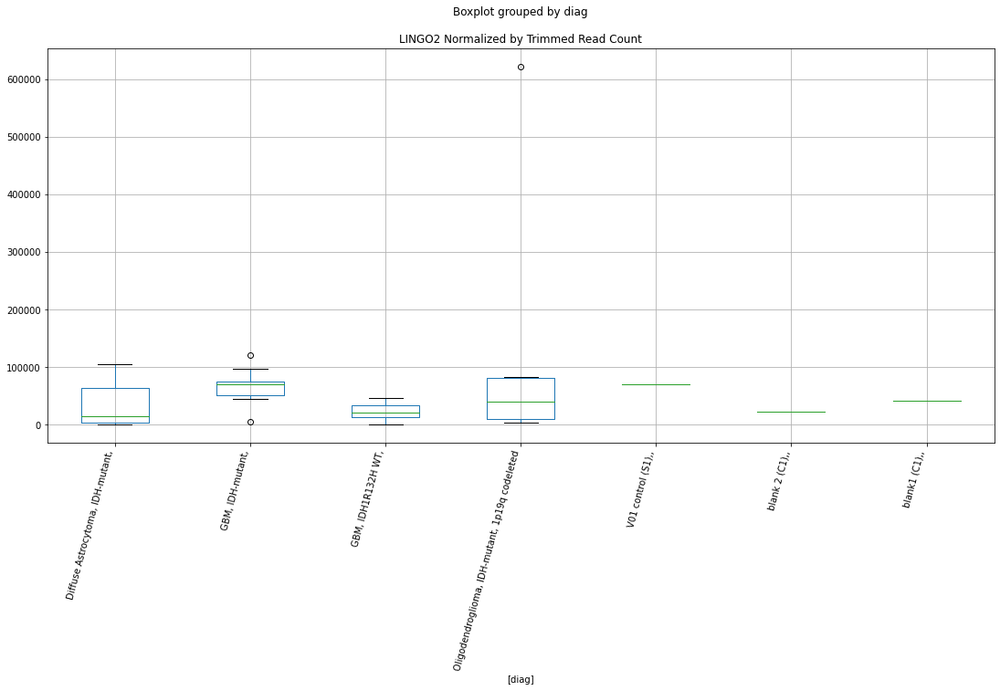

 p : 0.0009121052160676683  ( t : 3.9629376627768598 ) :  D-plex  :  cutadapt2  :  LINGO2
Control and blanks
76     67427.66
340    70458.57
Name: LINGO2, dtype: float64
208    23279.55
Name: LINGO2, dtype: float64
472    25430.06
Name: LINGO2, dtype: float64


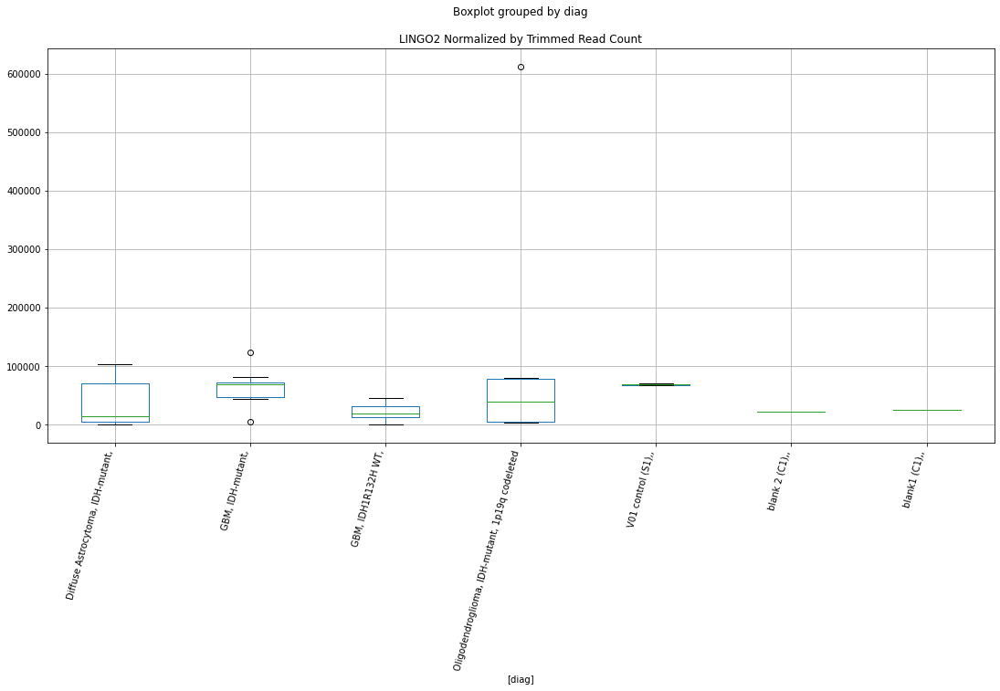

 p : 0.002492909908412313  ( t : 3.51138293117185 ) :  Lexogen  :  bbduk2  :  LOC101929679
Control and blanks
79     0.0
343    0.0
Name: LOC101929679, dtype: float64
211    0.0
Name: LOC101929679, dtype: float64
475    0.0
Name: LOC101929679, dtype: float64


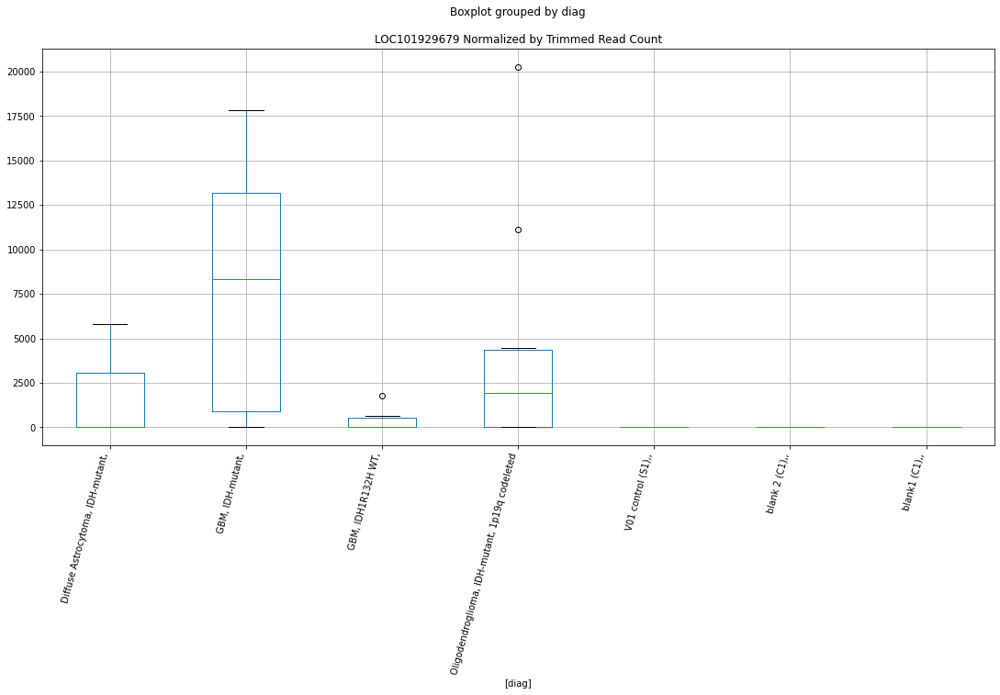

 p : 0.0026308351632711264  ( t : 3.48712942592403 ) :  Lexogen  :  cutadapt2  :  LOC101929679
Control and blanks
82     0.0
346    0.0
Name: LOC101929679, dtype: float64
214    0.0
Name: LOC101929679, dtype: float64
478    0.0
Name: LOC101929679, dtype: float64


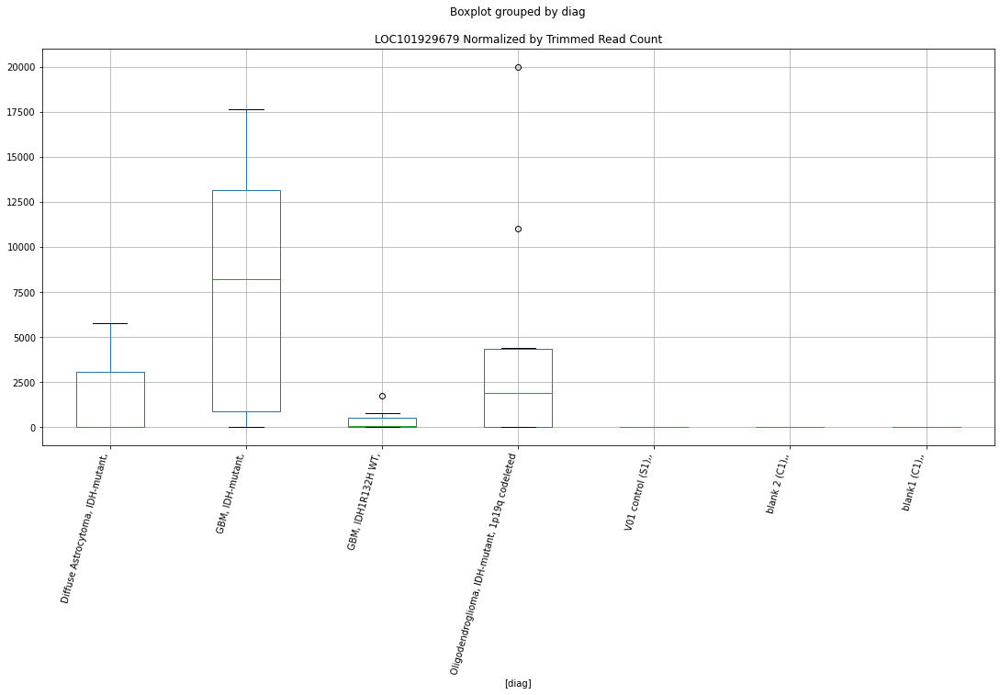

 p : 0.003207180817930921  ( t : 3.397788158872889 ) :  D-plex  :  cutadapt2  :  LINC02641
Control and blanks
76     7576.14
340    8807.32
Name: LINC02641, dtype: float64
208    12697.94
Name: LINC02641, dtype: float64
472    16182.76
Name: LINC02641, dtype: float64


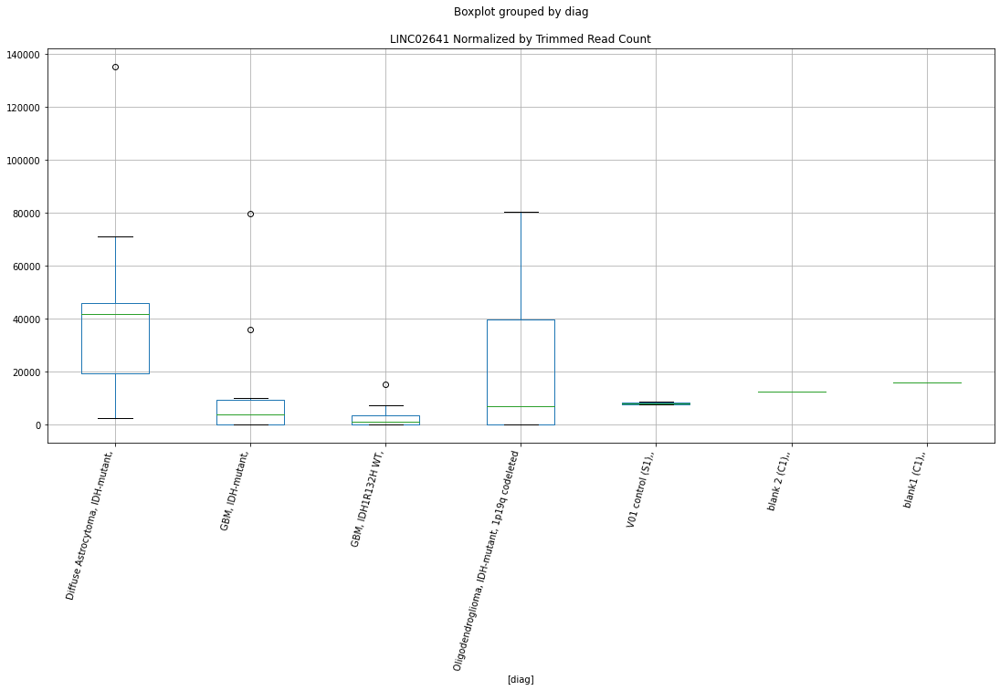

 p : 0.003427951427781038  ( t : 3.3677138464541505 ) :  D-plex  :  bbduk2  :  LINC02641
Control and blanks
73     7730.08
337    8901.57
Name: LINC02641, dtype: float64
205    13610.91
Name: LINC02641, dtype: float64
469    16562.76
Name: LINC02641, dtype: float64


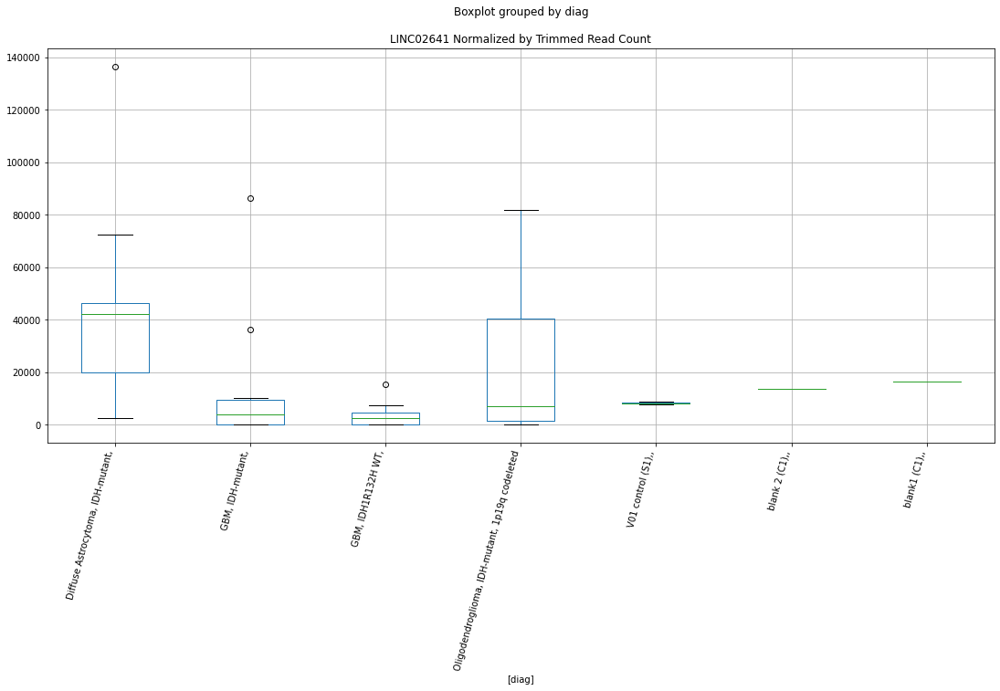

 p : 0.0046764676851414454  ( t : 3.2269885990379565 ) :  D-plex  :  cutadapt2  :  LGALS3
Control and blanks
76        0.0
340    2642.2
Name: LGALS3, dtype: float64
208    107403.37
Name: LGALS3, dtype: float64
472    889474.04
Name: LGALS3, dtype: float64


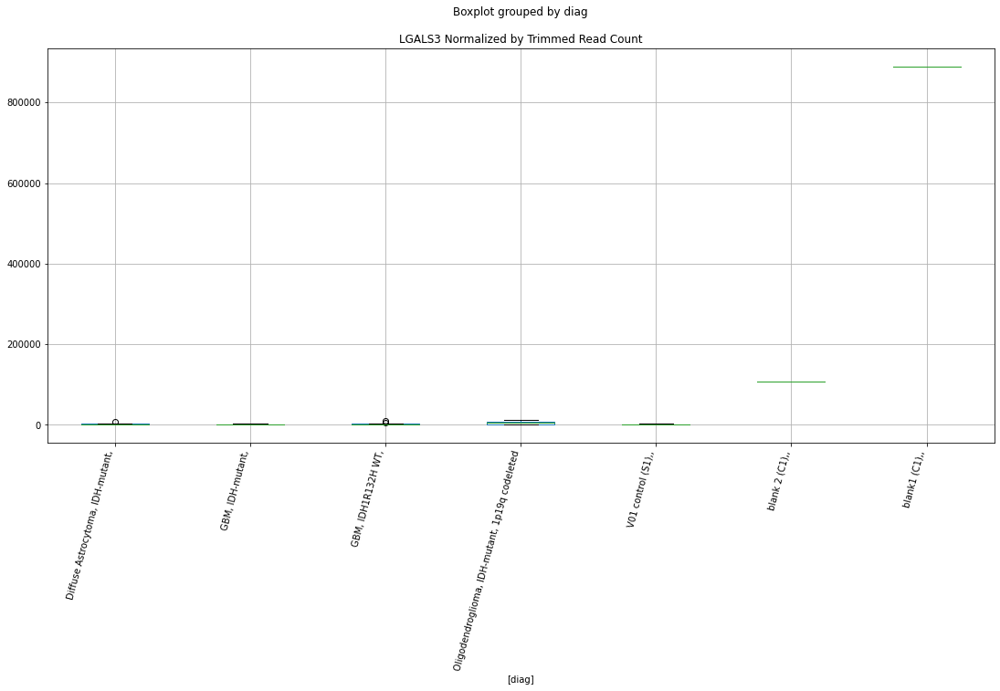

 p : 0.004696429746841266  ( t : 3.225053172714782 ) :  D-plex  :  bbduk2  :  LGALS3
Control and blanks
73        0.00
337    2670.47
Name: LGALS3, dtype: float64
205    109066.39
Name: LGALS3, dtype: float64
469    910360.54
Name: LGALS3, dtype: float64


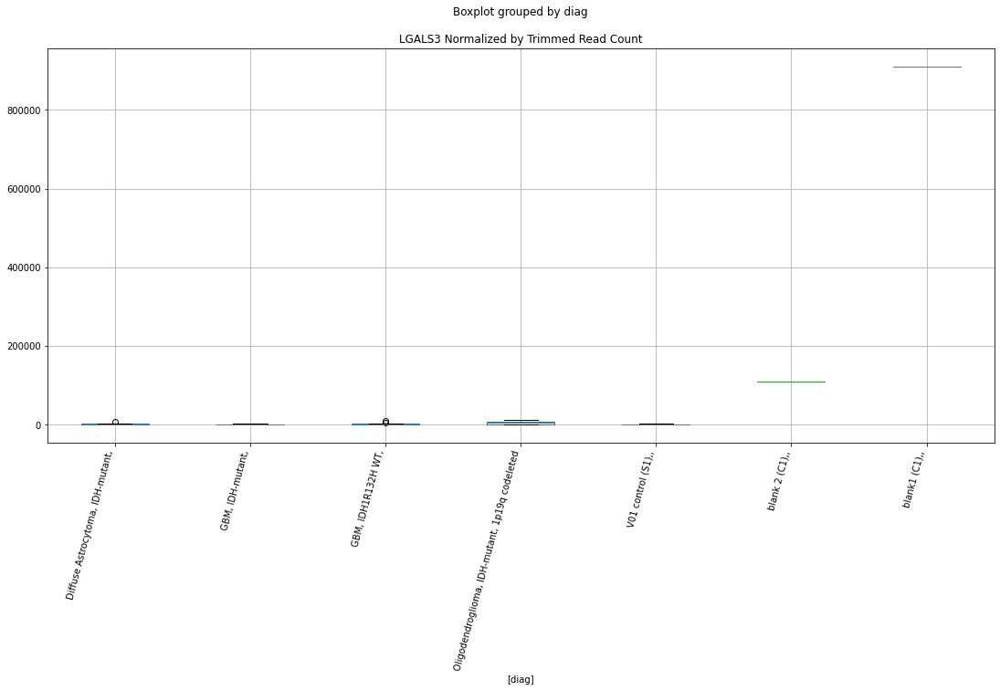

 p : 0.005763308896934287  ( t : 3.1318356419416395 ) :  D-plex  :  bbduk2  :  LOC105370786
Control and blanks
73     0.0
337    0.0
Name: LOC105370786, dtype: float64
205    716.36
Name: LOC105370786, dtype: float64
469    1183.05
Name: LOC105370786, dtype: float64


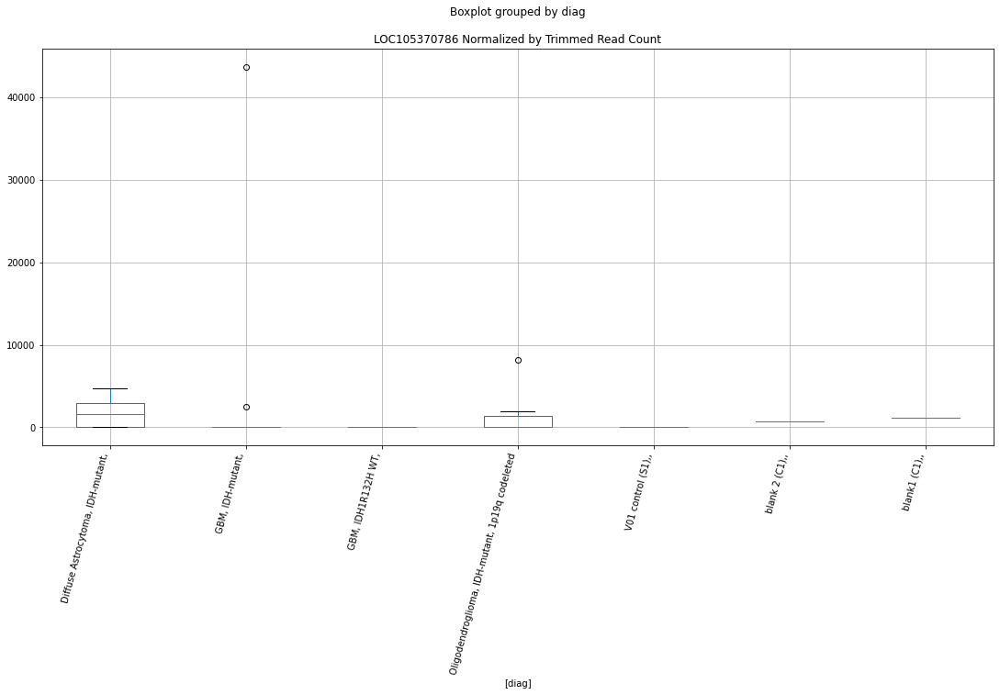

 p : 0.0063141563453283705  ( t : 3.090128986954425 ) :  D-plex  :  cutadapt2  :  LOC105370786
Control and blanks
76     0.0
340    0.0
Name: LOC105370786, dtype: float64
208    705.44
Name: LOC105370786, dtype: float64
472    1155.91
Name: LOC105370786, dtype: float64


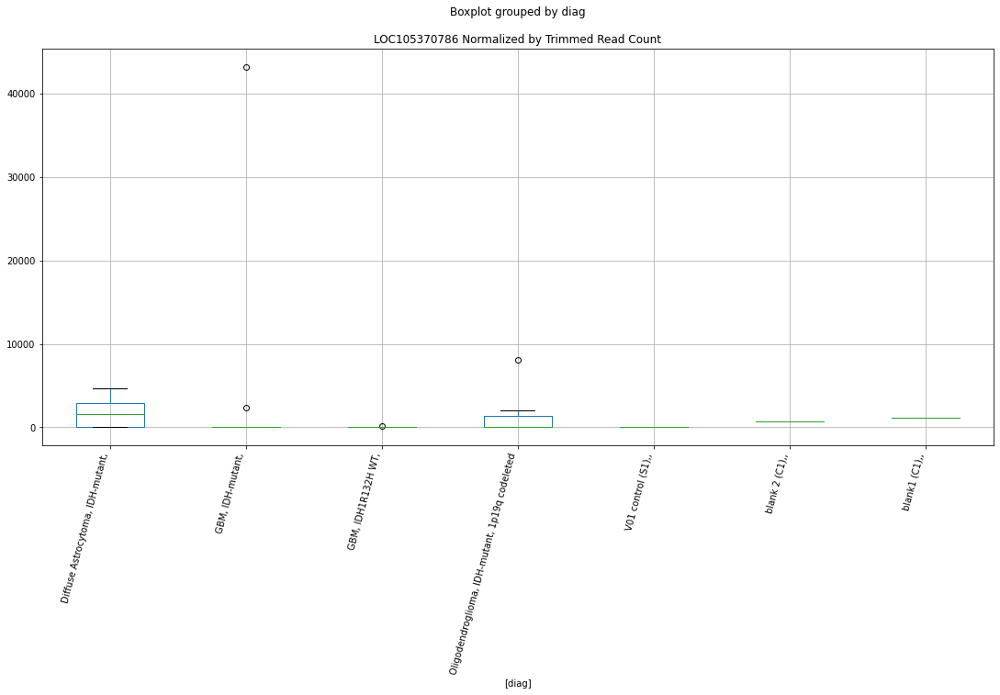

 p : 0.006646784985421223  ( t : 3.0666305954567674 ) :  D-plex  :  bbduk2  :  LINC01900
Control and blanks
73     33239.36
337        0.00
Name: LINC01900, dtype: float64
205    716.36
Name: LINC01900, dtype: float64
469    1183.05
Name: LINC01900, dtype: float64


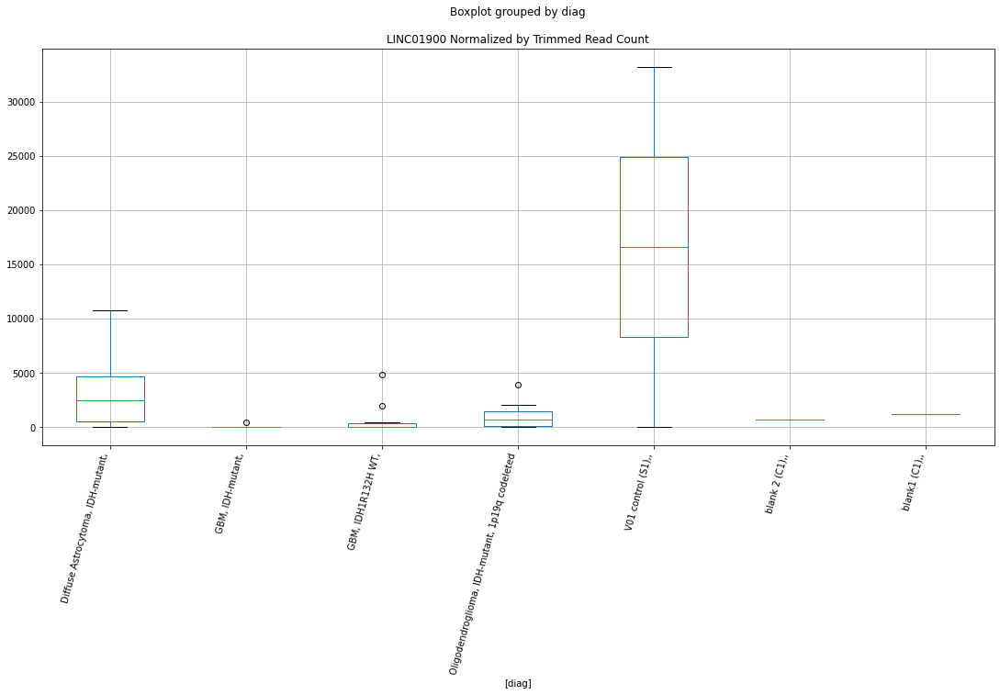

 p : 0.00686598733797817  ( t : 3.051763276213625 ) :  D-plex  :  bbduk2  :  LINC02812
Control and blanks
73        0.00
337    8901.57
Name: LINC02812, dtype: float64
205    358.18
Name: LINC02812, dtype: float64
469    0.0
Name: LINC02812, dtype: float64


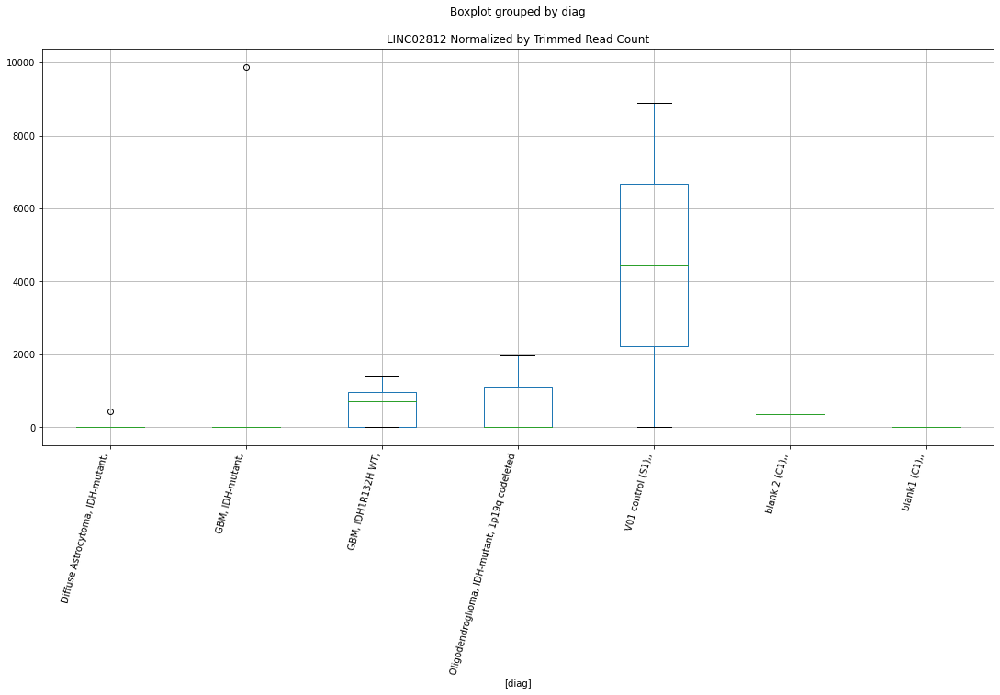

 p : 0.006927483317420045  ( t : 3.0476752889577003 ) :  D-plex  :  cutadapt2  :  LINC01900
Control and blanks
76     32577.41
340        0.00
Name: LINC01900, dtype: float64
208    881.8
Name: LINC01900, dtype: float64
472    1155.91
Name: LINC01900, dtype: float64


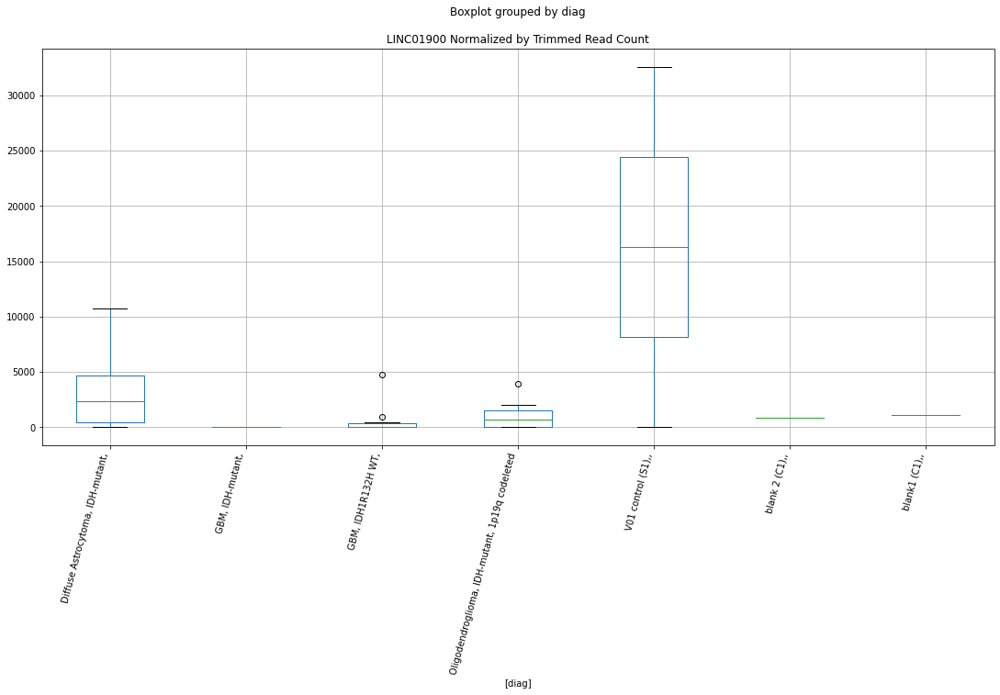

 p : 0.008925209187159359  ( t : 2.9310698396533246 ) :  D-plex  :  cutadapt2  :  LOC105369293
Control and blanks
76     0.0
340    0.0
Name: LOC105369293, dtype: float64
208    352.72
Name: LOC105369293, dtype: float64
472    577.96
Name: LOC105369293, dtype: float64


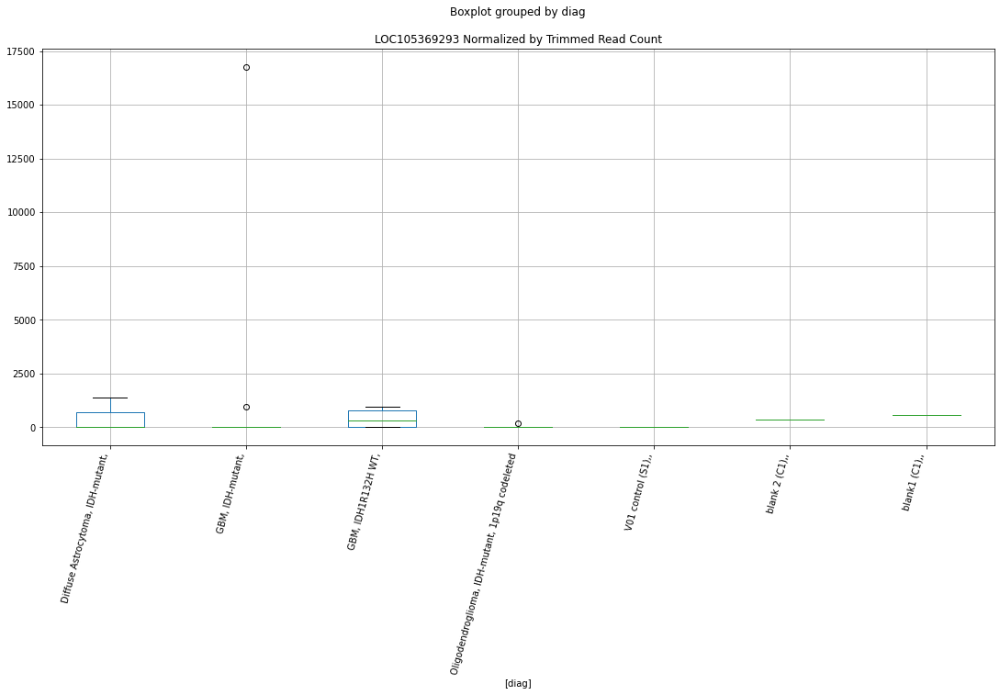

 p : 0.00967235461229129  ( t : 2.893880837403186 ) :  D-plex  :  cutadapt2  :  LOC101928077
Control and blanks
76     0.0
340    0.0
Name: LOC101928077, dtype: float64
208    0.0
Name: LOC101928077, dtype: float64
472    0.0
Name: LOC101928077, dtype: float64


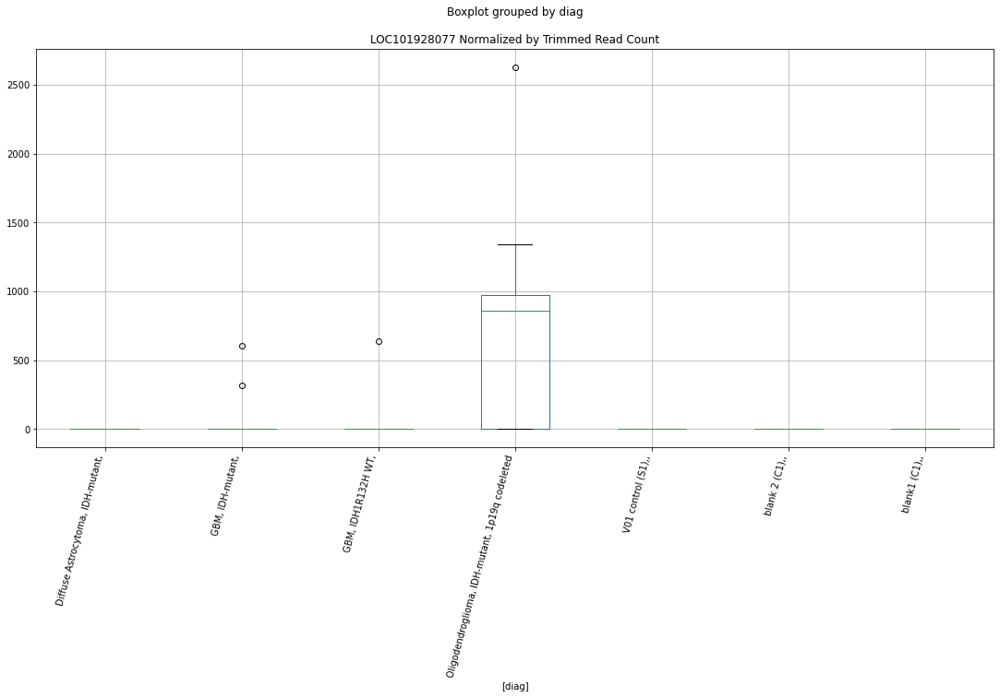

 p : 0.00973478861194129  ( t : 2.89090006615781 ) :  Lexogen  :  cutadapt2  :  LOC105369983
Control and blanks
82         0.00
346    27356.49
Name: LOC105369983, dtype: float64
214    5424.53
Name: LOC105369983, dtype: float64
478    0.0
Name: LOC105369983, dtype: float64


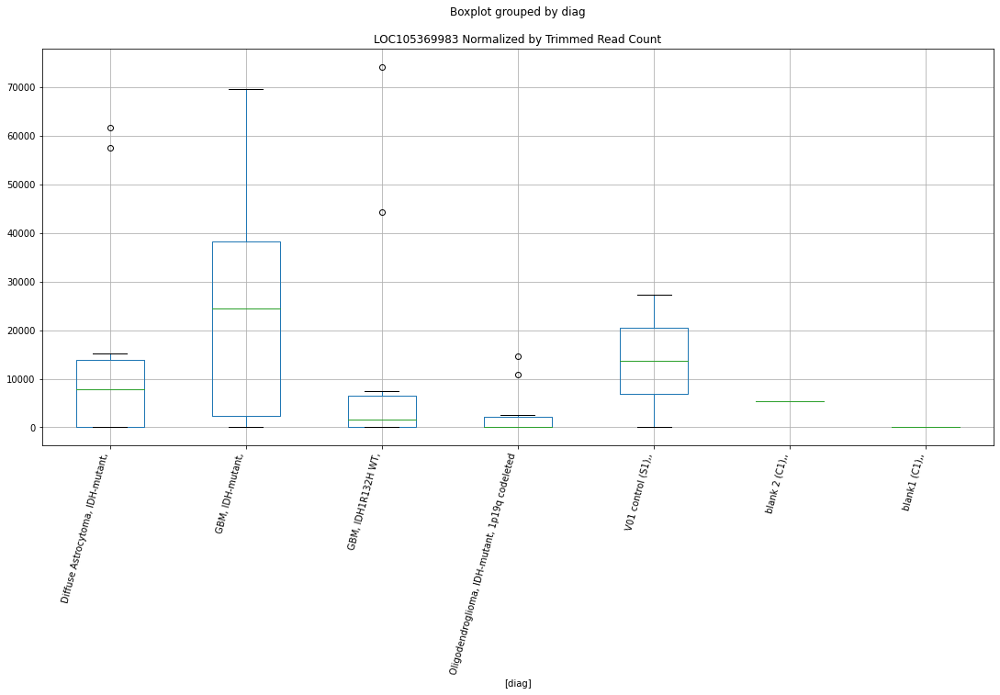

 p : 0.00973732516134846  ( t : 2.8907793548779996 ) :  Lexogen  :  bbduk2  :  LOC105369983
Control and blanks
79         0.00
343    27600.86
Name: LOC105369983, dtype: float64
211    5466.13
Name: LOC105369983, dtype: float64
475    0.0
Name: LOC105369983, dtype: float64


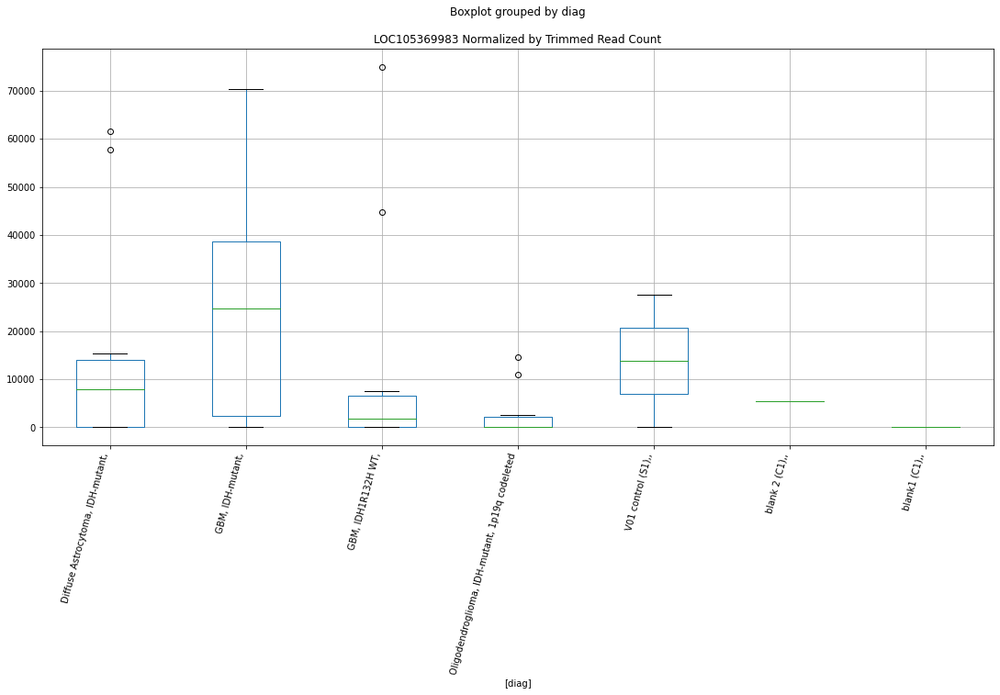

 p : 0.010627288353302318  ( t : 2.850194885049829 ) :  D-plex  :  cutadapt2  :  LOC102724851
Control and blanks
76     16667.51
340        0.00
Name: LOC102724851, dtype: float64
208    427144.45
Name: LOC102724851, dtype: float64
472    175698.58
Name: LOC102724851, dtype: float64


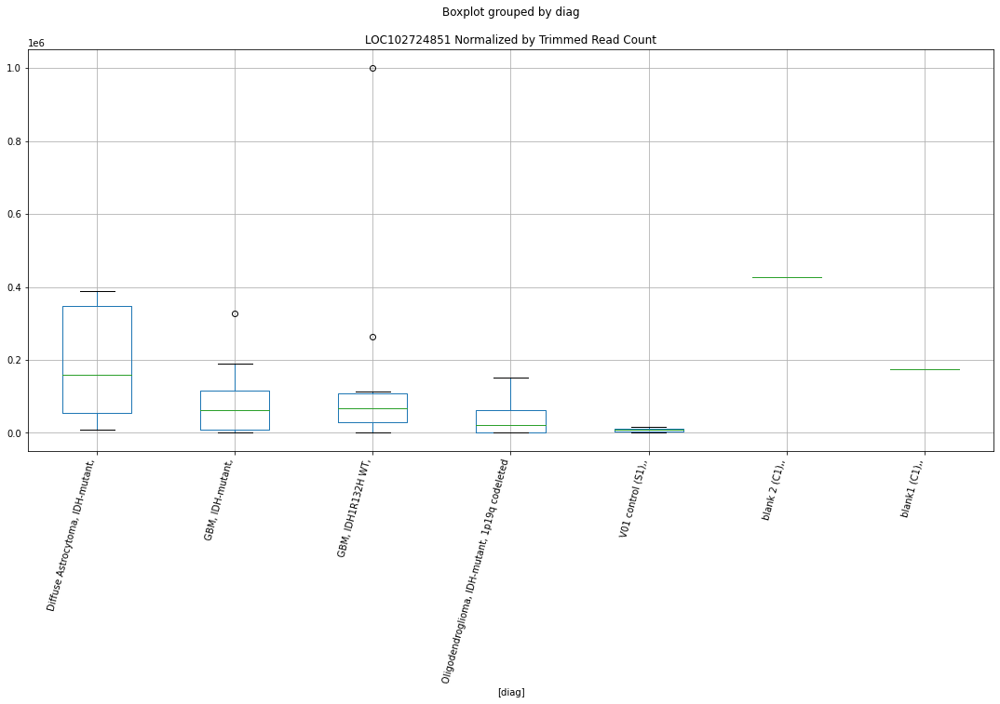

 p : 0.010740962037354515  ( t : 2.845248960008124 ) :  Lexogen  :  cutadapt2  :  LOC105371253
Control and blanks
82     0.0
346    0.0
Name: LOC105371253, dtype: float64
214    0.0
Name: LOC105371253, dtype: float64
478    0.0
Name: LOC105371253, dtype: float64


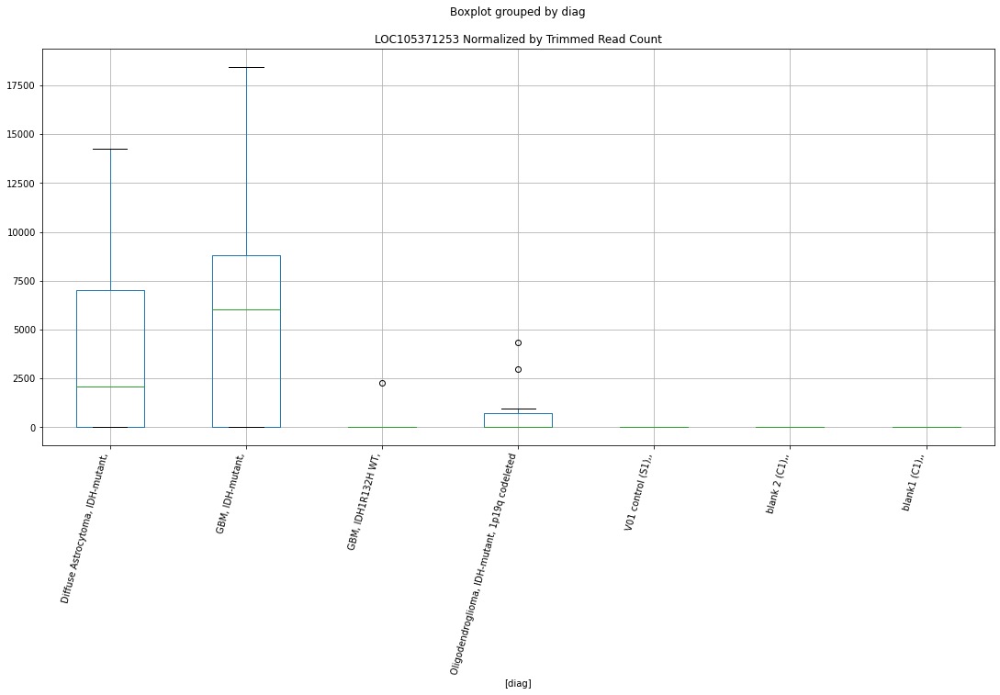

 p : 0.01106747290106236  ( t : 2.831317912573489 ) :  Lexogen  :  bbduk2  :  LOC105371253
Control and blanks
79     0.0
343    0.0
Name: LOC105371253, dtype: float64
211    546.61
Name: LOC105371253, dtype: float64
475    0.0
Name: LOC105371253, dtype: float64


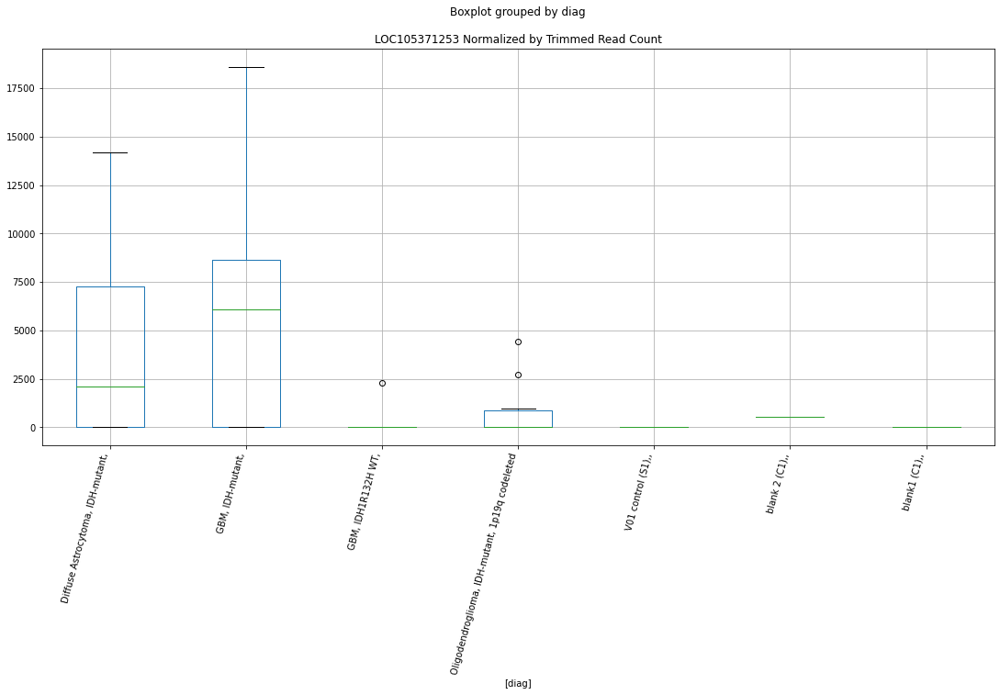

 p : 0.011106743501805353  ( t : 2.82966910781295 ) :  D-plex  :  cutadapt2  :  LINC00926
Control and blanks
76       0.00
340    880.73
Name: LINC00926, dtype: float64
208    1587.24
Name: LINC00926, dtype: float64
472    1733.87
Name: LINC00926, dtype: float64


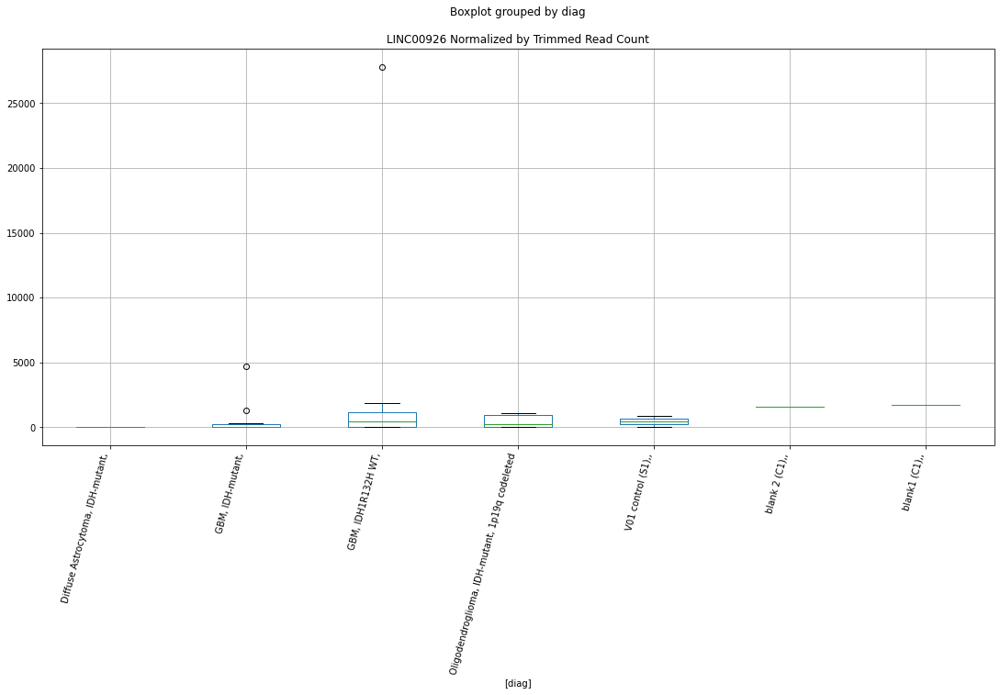

 p : 0.011462907574792463  ( t : 2.8149663299287404 ) :  Lexogen  :  cutadapt2  :  LOC105370624
Control and blanks
82     0.0
346    0.0
Name: LOC105370624, dtype: float64
214    0.0
Name: LOC105370624, dtype: float64
478    0.0
Name: LOC105370624, dtype: float64


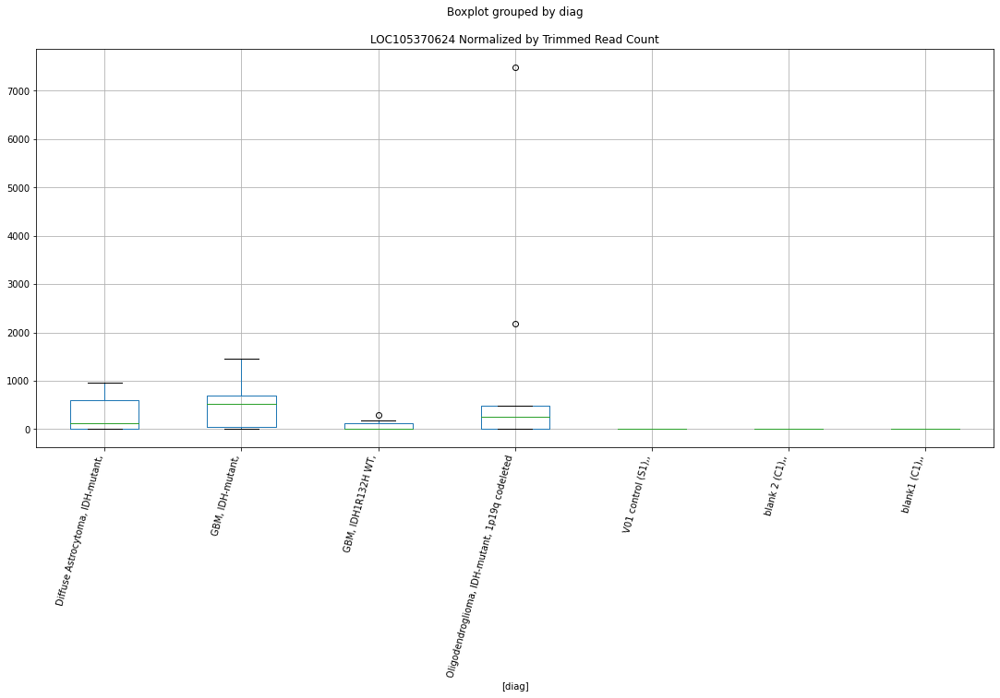

 p : 0.012027234376336448  ( t : 2.7925464609974138 ) :  Lexogen  :  bbduk2  :  LOC101929679
Control and blanks
79     0.0
343    0.0
Name: LOC101929679, dtype: float64
211    0.0
Name: LOC101929679, dtype: float64
475    0.0
Name: LOC101929679, dtype: float64


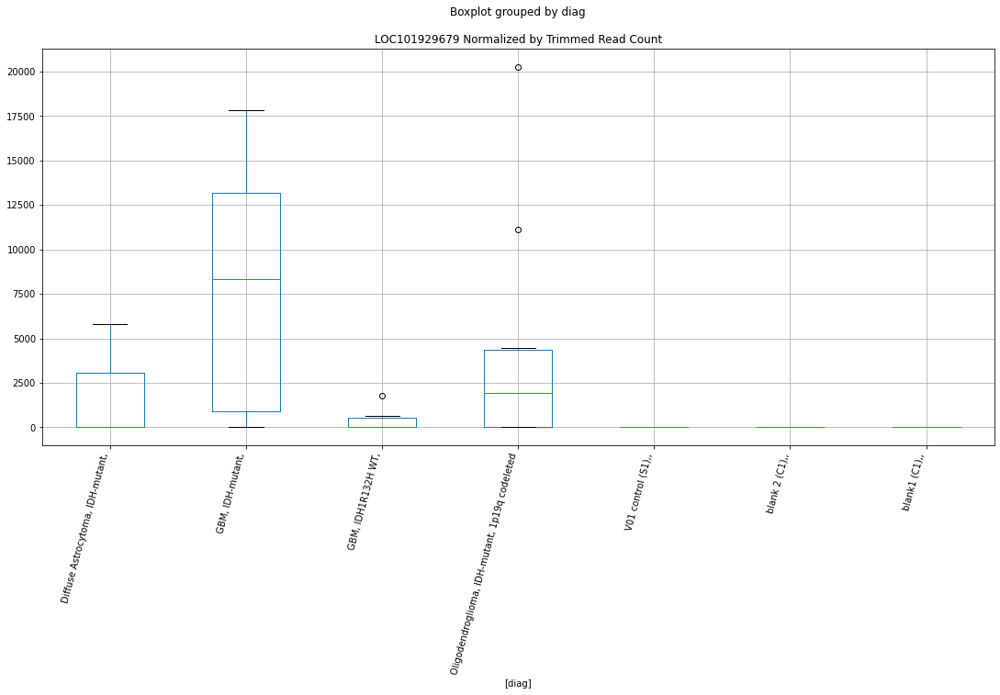

 p : 0.012032377380395172  ( t : 2.792346821953033 ) :  Lexogen  :  cutadapt2  :  LINC02210
Control and blanks
82     0.0
346    0.0
Name: LINC02210, dtype: float64
214    0.0
Name: LINC02210, dtype: float64
478    22796.21
Name: LINC02210, dtype: float64


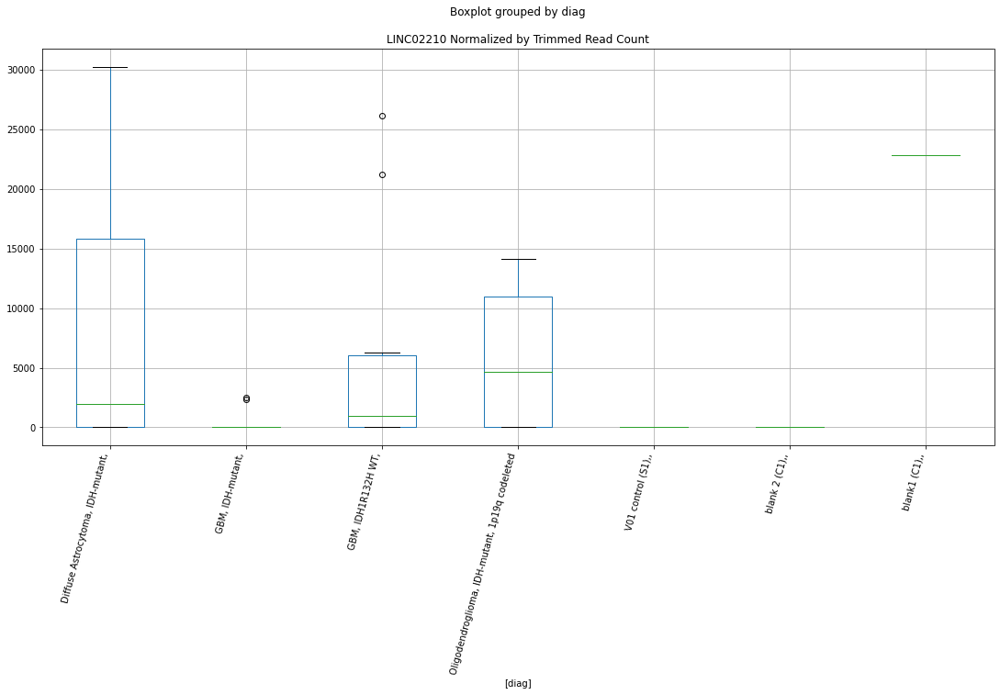

 p : 0.012038025601114756  ( t : 2.792127666012836 ) :  D-plex  :  bbduk2  :  LOC105370998
Control and blanks
73     0.0
337    0.0
Name: LOC105370998, dtype: float64
205    2507.27
Name: LOC105370998, dtype: float64
469    4140.69
Name: LOC105370998, dtype: float64


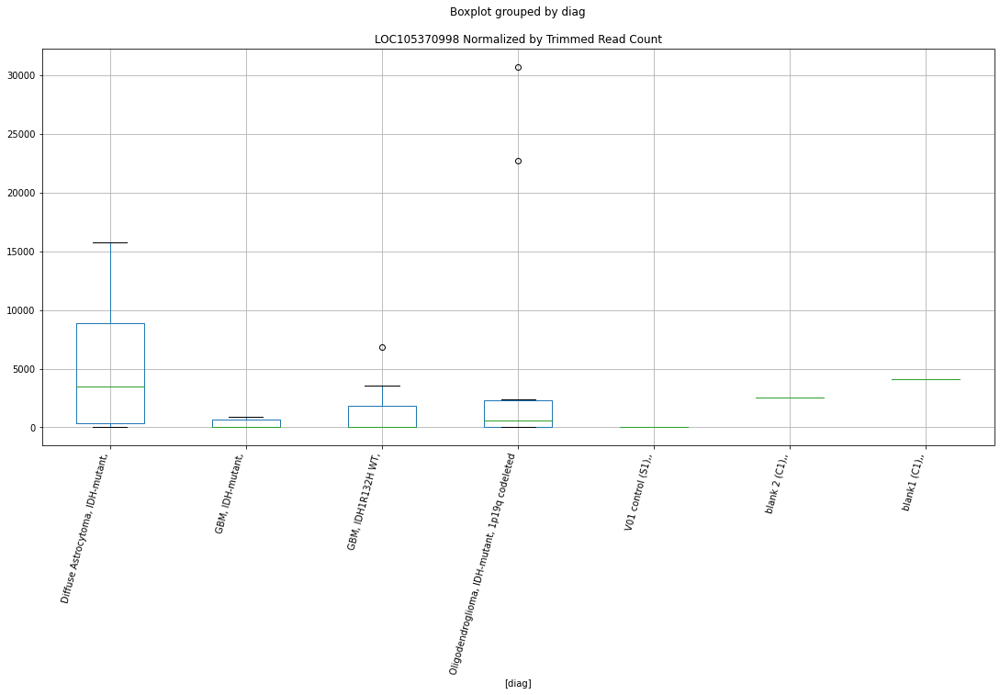

 p : 0.012058613539699333  ( t : 2.791329670980863 ) :  Lexogen  :  cutadapt2  :  LOC101929679
Control and blanks
82     0.0
346    0.0
Name: LOC101929679, dtype: float64
214    0.0
Name: LOC101929679, dtype: float64
478    0.0
Name: LOC101929679, dtype: float64


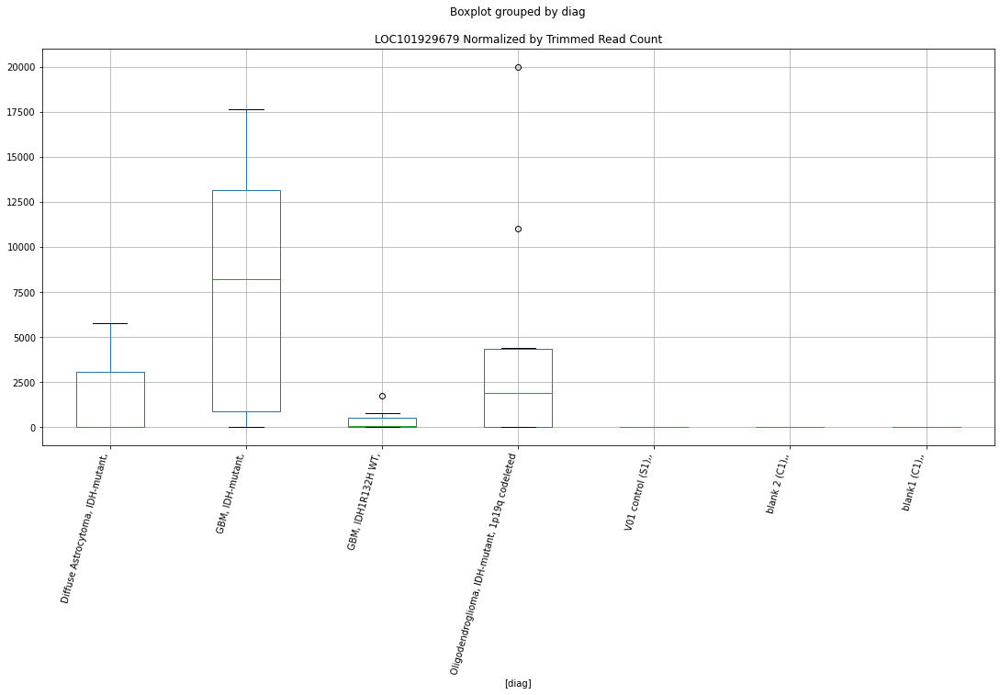

 p : 0.012525367270383142  ( t : 2.773580579664519 ) :  D-plex  :  bbduk2  :  LOC105369890
Control and blanks
73     0.0
337    0.0
Name: LOC105369890, dtype: float64
205    179.09
Name: LOC105369890, dtype: float64
469    0.0
Name: LOC105369890, dtype: float64


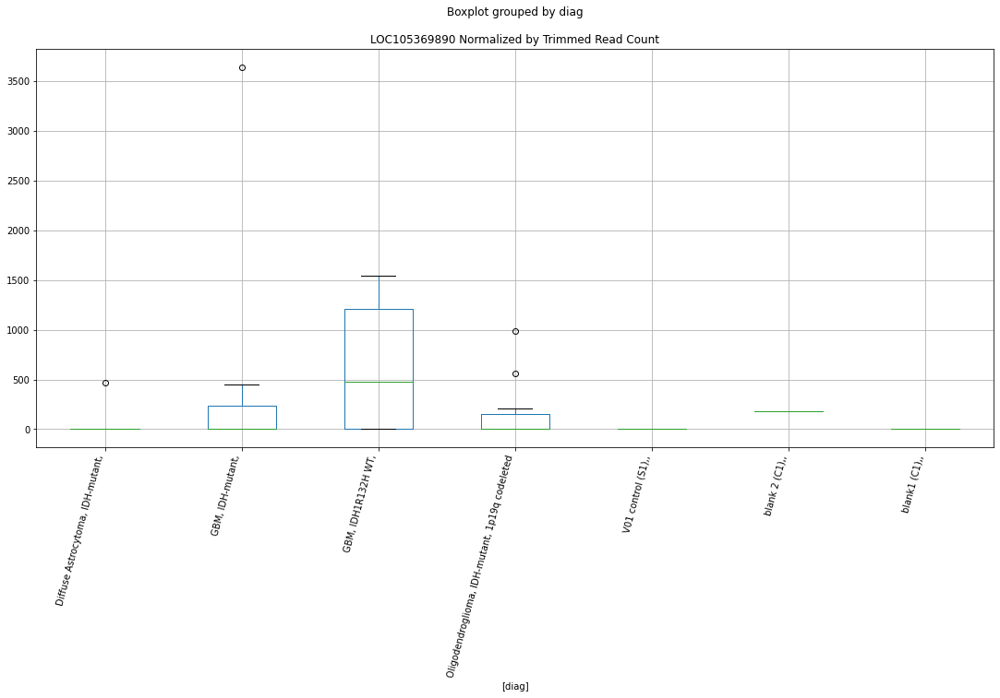

 p : 0.012845962998868808  ( t : 2.7617533556486697 ) :  Lexogen  :  cutadapt2  :  LINC02308
Control and blanks
82     0.0
346    0.0
Name: LINC02308, dtype: float64
214    0.0
Name: LINC02308, dtype: float64
478    0.0
Name: LINC02308, dtype: float64


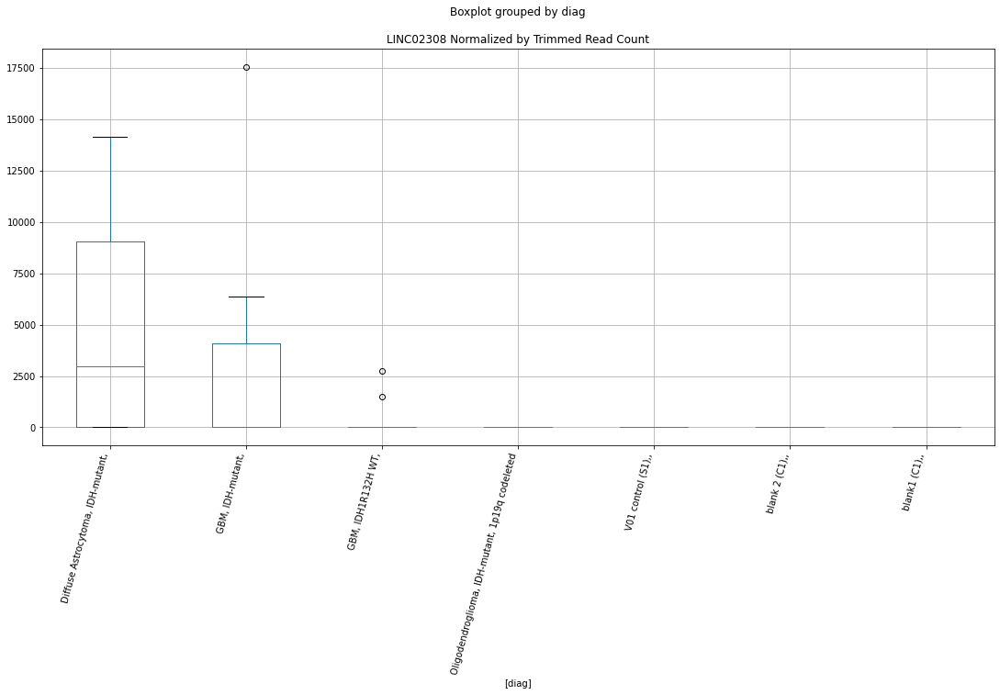

 p : 0.012967618372338991  ( t : 2.7573392604210154 ) :  Lexogen  :  bbduk2  :  LINC02308
Control and blanks
79     0.0
343    0.0
Name: LINC02308, dtype: float64
211    0.0
Name: LINC02308, dtype: float64
475    239.52
Name: LINC02308, dtype: float64


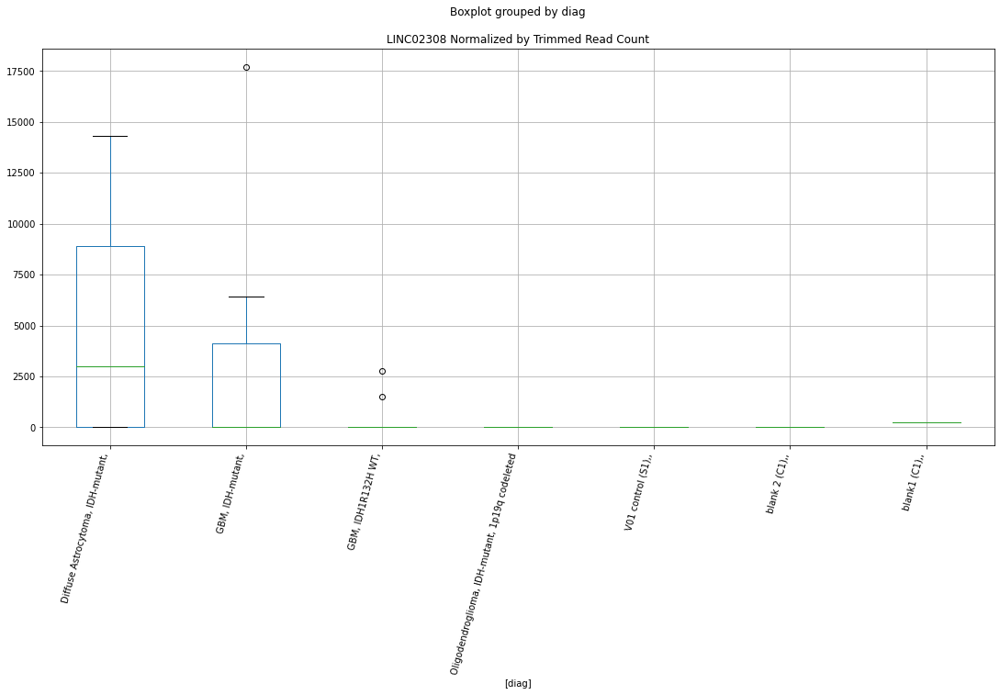

 p : 0.01297915190521604  ( t : 2.756922844383436 ) :  D-plex  :  cutadapt2  :  LOC105370998
Control and blanks
76     0.0
340    0.0
Name: LOC105370998, dtype: float64
208    2469.04
Name: LOC105370998, dtype: float64
472    4045.69
Name: LOC105370998, dtype: float64


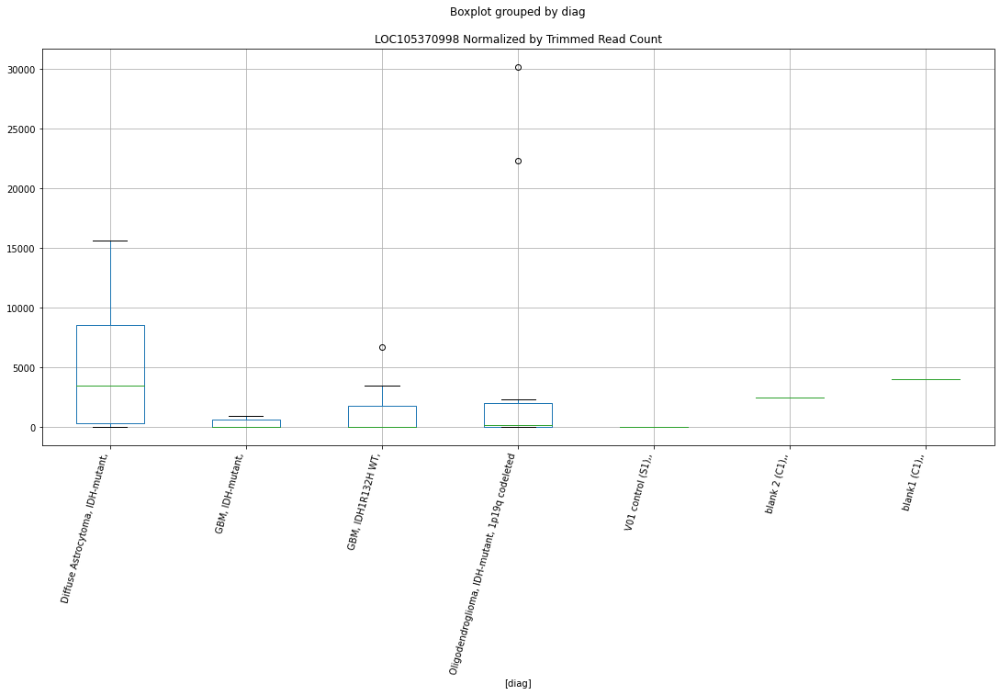

 p : 0.013429596273137155  ( t : 2.740930866193344 ) :  D-plex  :  bbduk2  :  LOC102724851
Control and blanks
73     17006.18
337        0.00
Name: LOC102724851, dtype: float64
205    503961.94
Name: LOC102724851, dtype: float64
469    192837.91
Name: LOC102724851, dtype: float64


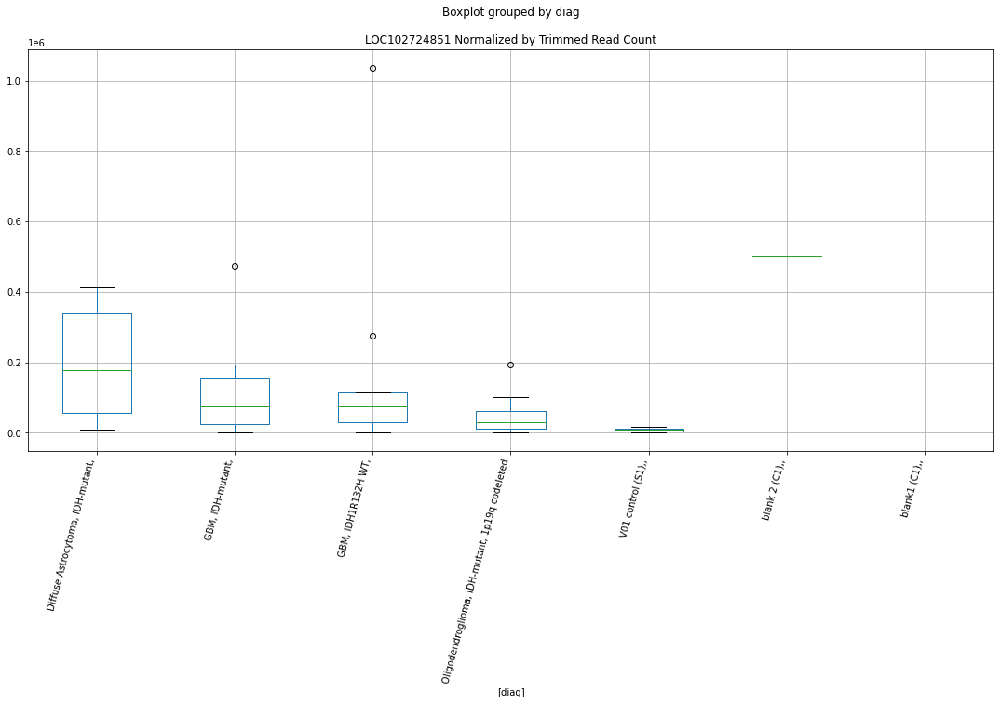

 p : 0.014194717199446191  ( t : 2.7149085374904636 ) :  Lexogen  :  bbduk2  :  LINC02663
Control and blanks
79     0.0
343    0.0
Name: LINC02663, dtype: float64
211    0.0
Name: LINC02663, dtype: float64
475    0.0
Name: LINC02663, dtype: float64


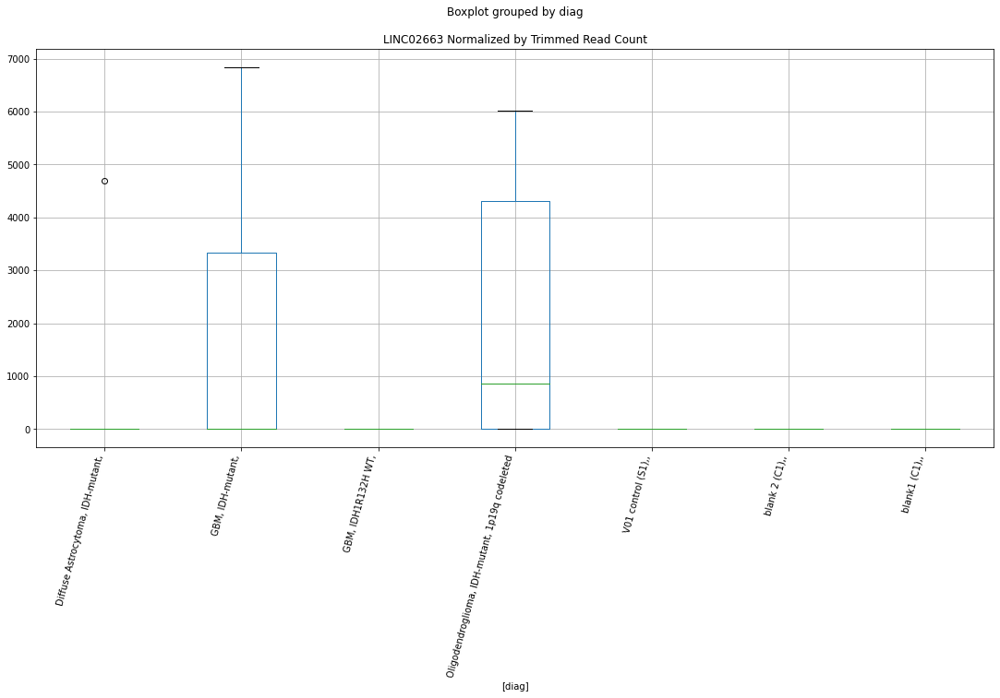

 p : 0.014237616932178761  ( t : 2.7134895100757017 ) :  D-plex  :  cutadapt2  :  LOC100507513
Control and blanks
76     0.0
340    0.0
Name: LOC100507513, dtype: float64
208    176.36
Name: LOC100507513, dtype: float64
472    1155.91
Name: LOC100507513, dtype: float64


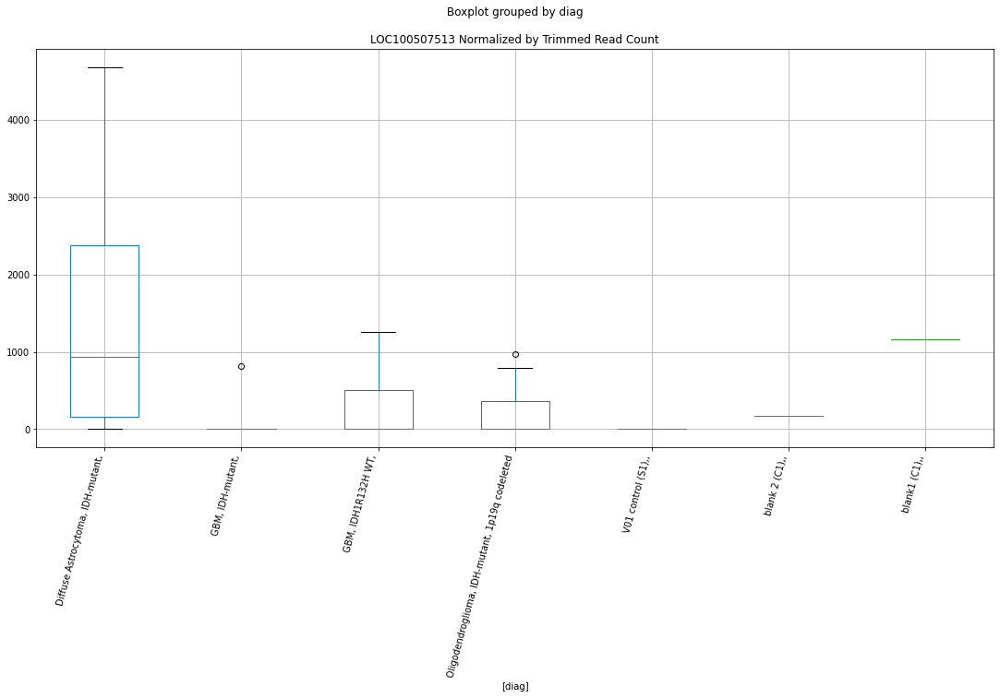

 p : 0.014268942424419945  ( t : 2.7124559123208956 ) :  D-plex  :  cutadapt2  :  LOC101929732
Control and blanks
76     1515.23
340       0.00
Name: LOC101929732, dtype: float64
208    1410.88
Name: LOC101929732, dtype: float64
472    3467.74
Name: LOC101929732, dtype: float64


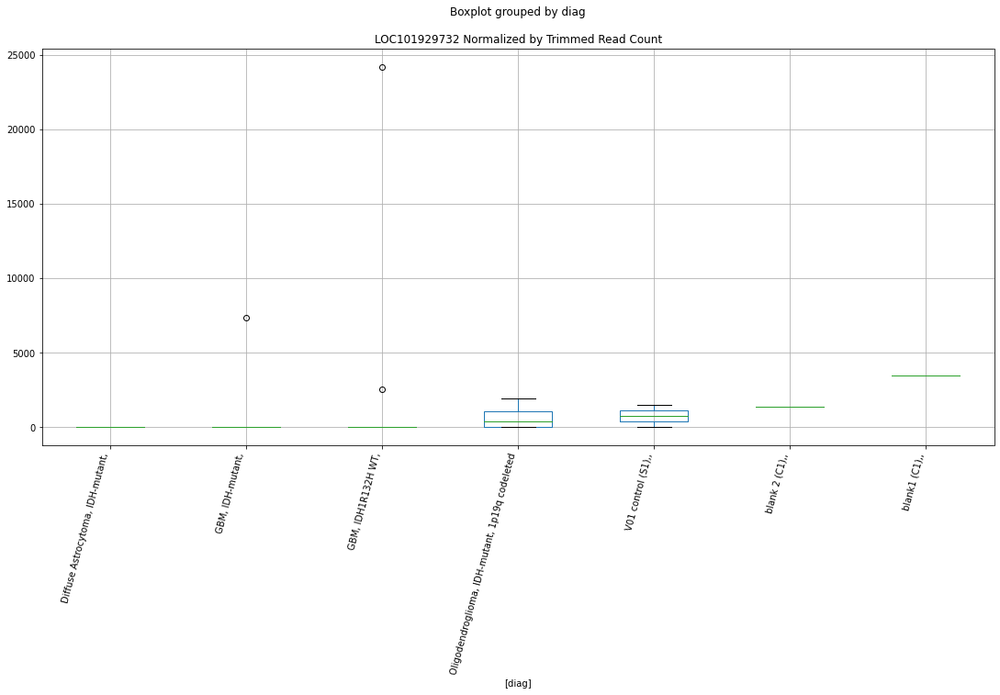

 p : 0.014421433541760136  ( t : 2.707455177649538 ) :  D-plex  :  bbduk2  :  LOC101929732
Control and blanks
73     1546.02
337       0.00
Name: LOC101929732, dtype: float64
205    1432.73
Name: LOC101929732, dtype: float64
469    2366.11
Name: LOC101929732, dtype: float64


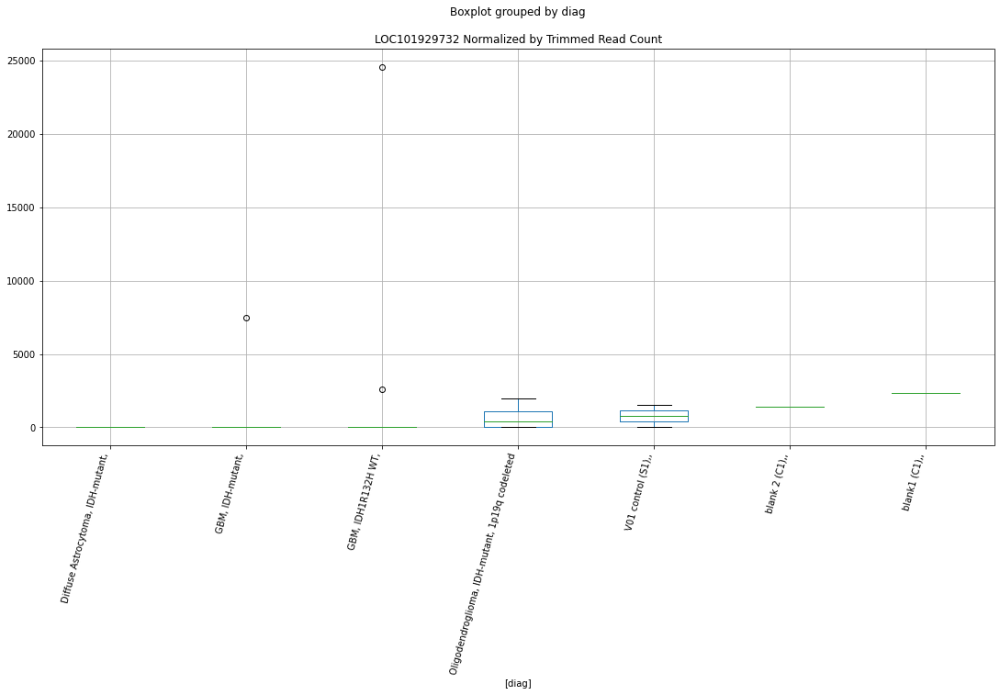

 p : 0.01589351982500199  ( t : 2.66162002990998 ) :  D-plex  :  bbduk2  :  LOC101060553
Control and blanks
73     773.01
337      0.00
Name: LOC101060553, dtype: float64
205    895.45
Name: LOC101060553, dtype: float64
469    591.53
Name: LOC101060553, dtype: float64


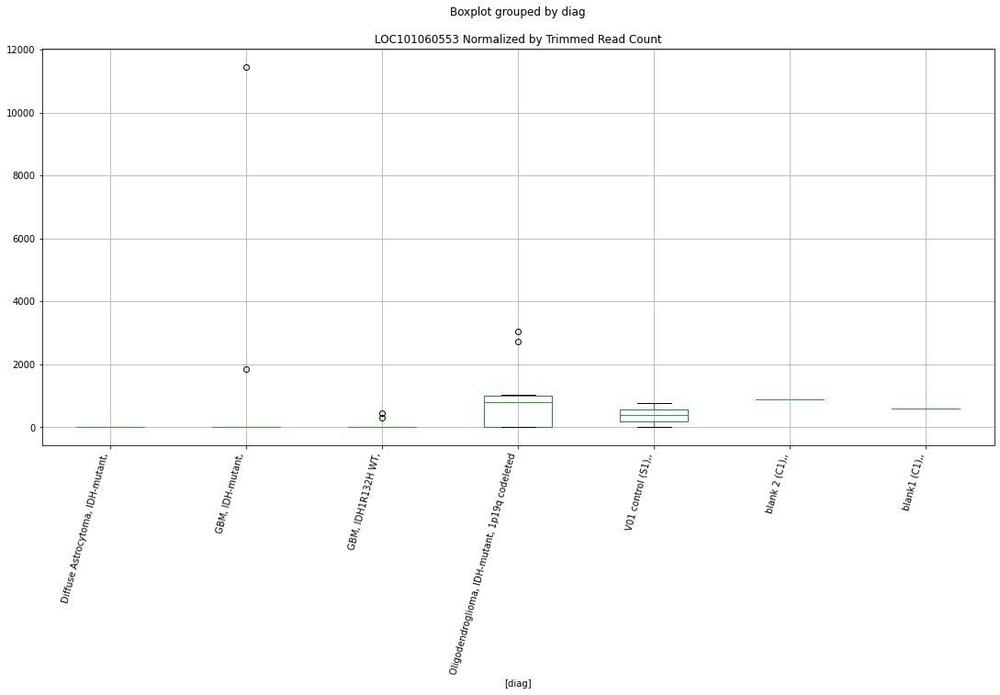

 p : 0.016372852342780124  ( t : 2.647566652880463 ) :  D-plex  :  cutadapt2  :  LOC105371042
Control and blanks
76     468205.58
340     10568.79
Name: LOC105371042, dtype: float64
208    319564.71
Name: LOC105371042, dtype: float64
472    135241.67
Name: LOC105371042, dtype: float64


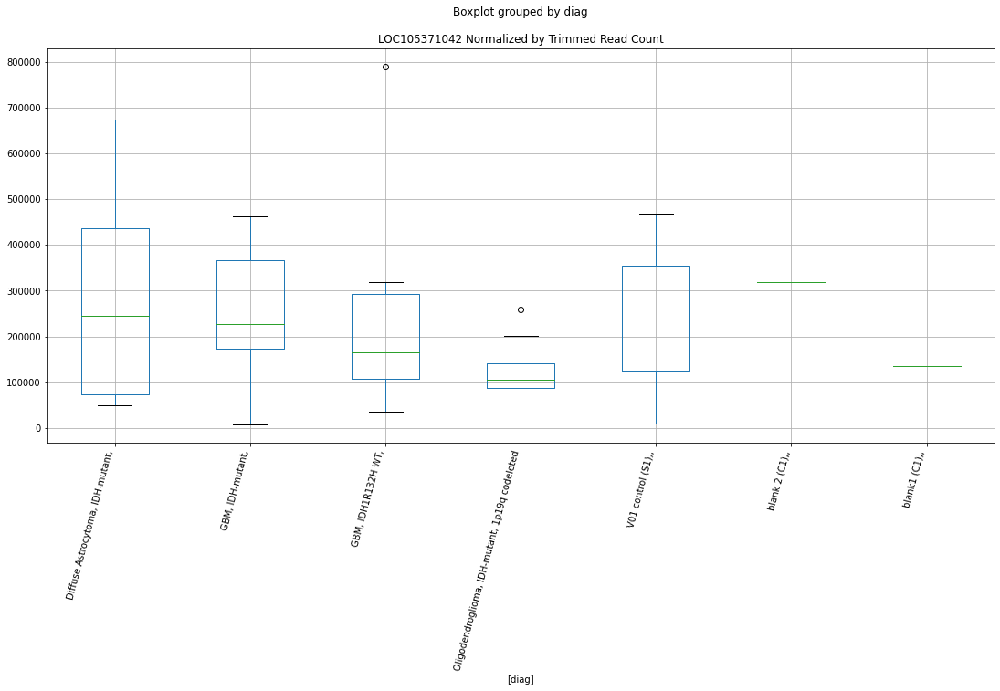

 p : 0.016629424342835028  ( t : 2.6402044703651444 ) :  D-plex  :  bbduk2  :  LINC00537
Control and blanks
73        0.00
337    1780.31
Name: LINC00537, dtype: float64
205    3581.82
Name: LINC00537, dtype: float64
469    1183.05
Name: LINC00537, dtype: float64


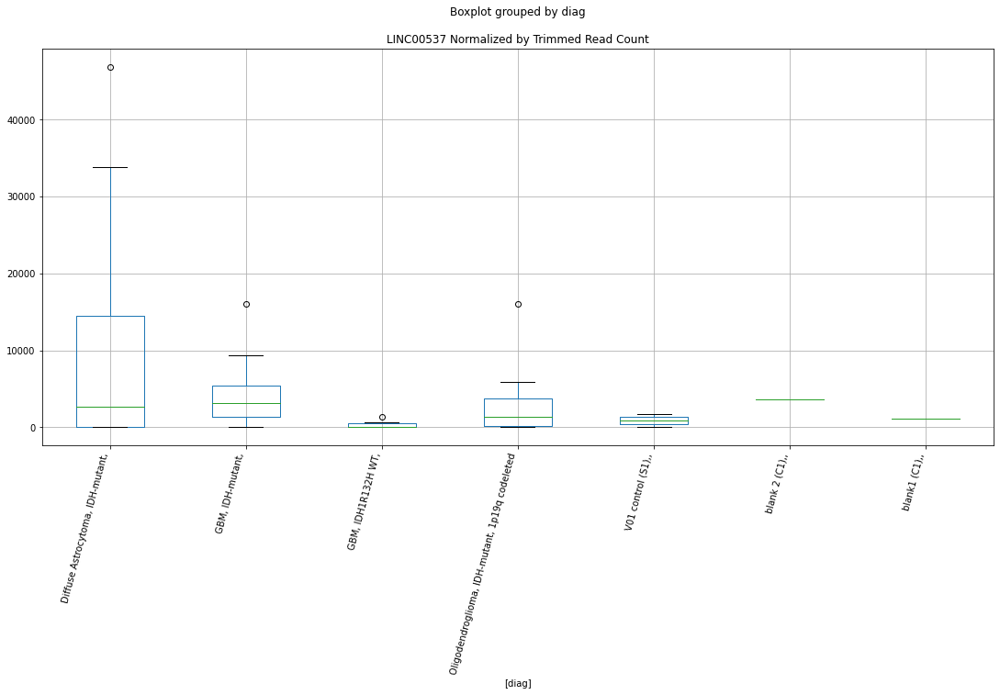

 p : 0.016678207256393015  ( t : 2.6388169137471493 ) :  Lexogen  :  bbduk2  :  LOC101927963
Control and blanks
79     0.0
343    0.0
Name: LOC101927963, dtype: float64
211    0.0
Name: LOC101927963, dtype: float64
475    0.0
Name: LOC101927963, dtype: float64


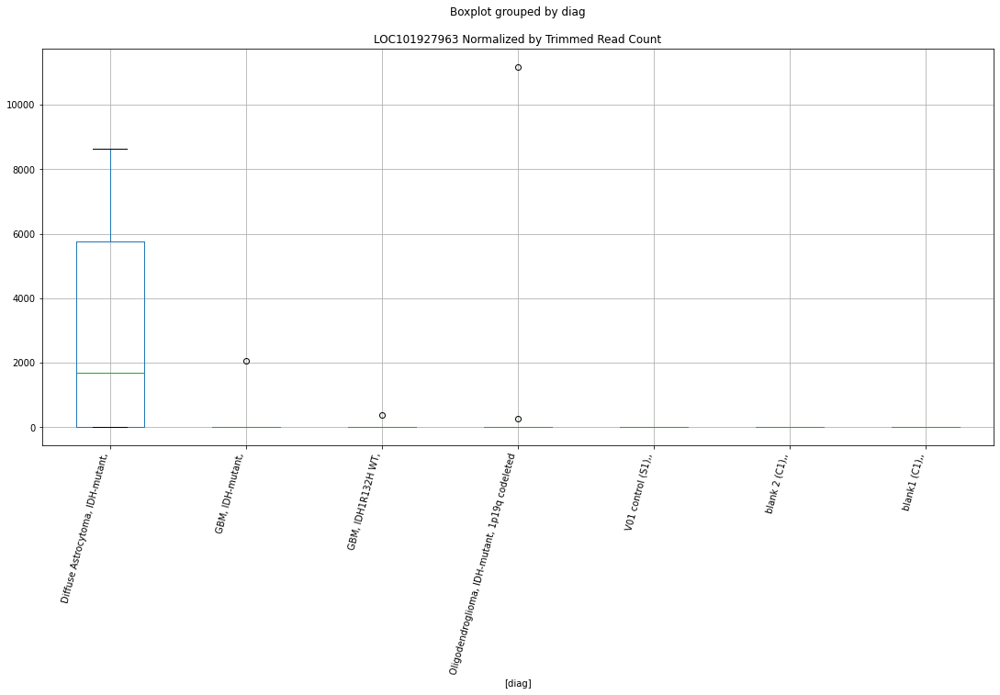

 p : 0.016691550648914488  ( t : 2.638438053583584 ) :  Lexogen  :  cutadapt2  :  LOC101927963
Control and blanks
82     0.0
346    0.0
Name: LOC101927963, dtype: float64
214    0.0
Name: LOC101927963, dtype: float64
478    0.0
Name: LOC101927963, dtype: float64


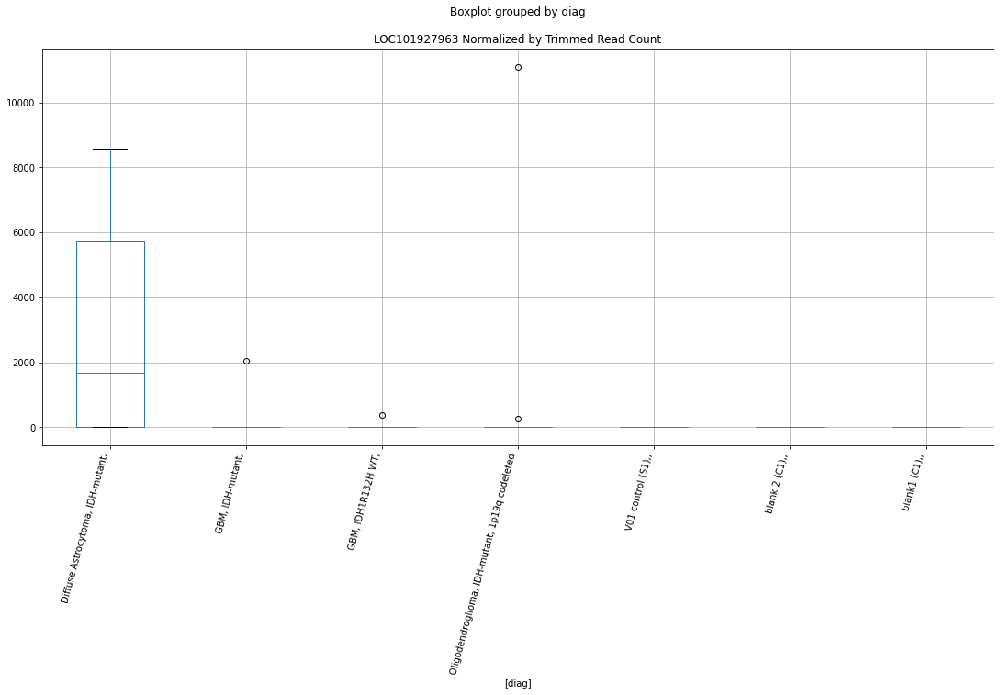

 p : 0.01691880233428477  ( t : 2.632029532354382 ) :  D-plex  :  bbduk2  :  LOC105371042
Control and blanks
73     480038.22
337     10681.89
Name: LOC105371042, dtype: float64
205    323975.53
Name: LOC105371042, dtype: float64
469    138417.39
Name: LOC105371042, dtype: float64


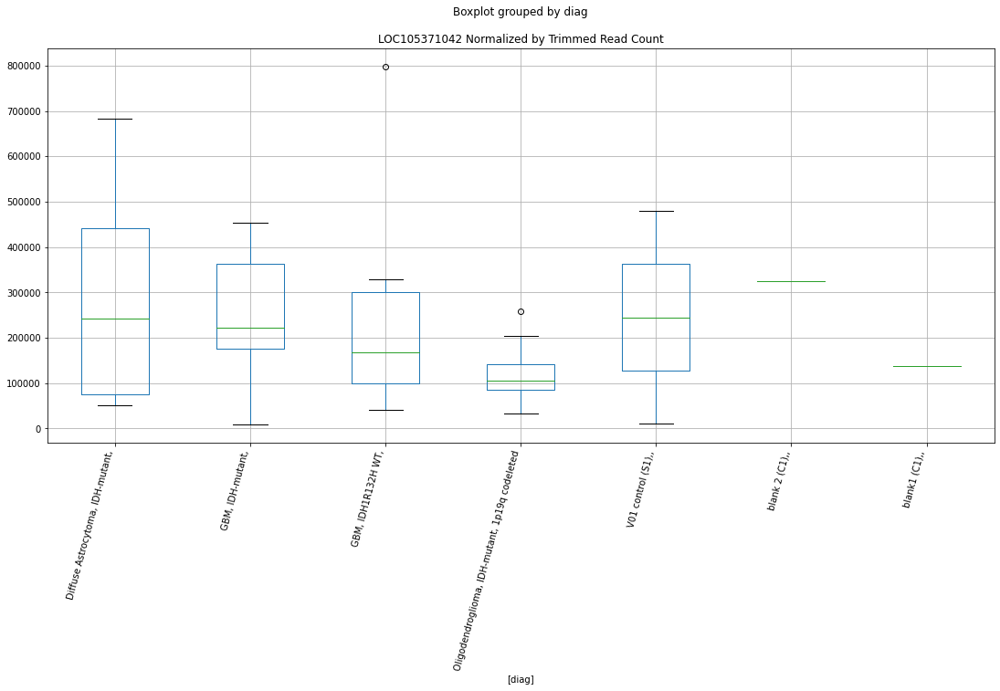

 p : 0.016956650950143988  ( t : 2.6309701581195846 ) :  D-plex  :  cutadapt2  :  LOC100268168
Control and blanks
76        0.00
340    1761.46
Name: LOC100268168, dtype: float64
208    352.72
Name: LOC100268168, dtype: float64
472    0.0
Name: LOC100268168, dtype: float64


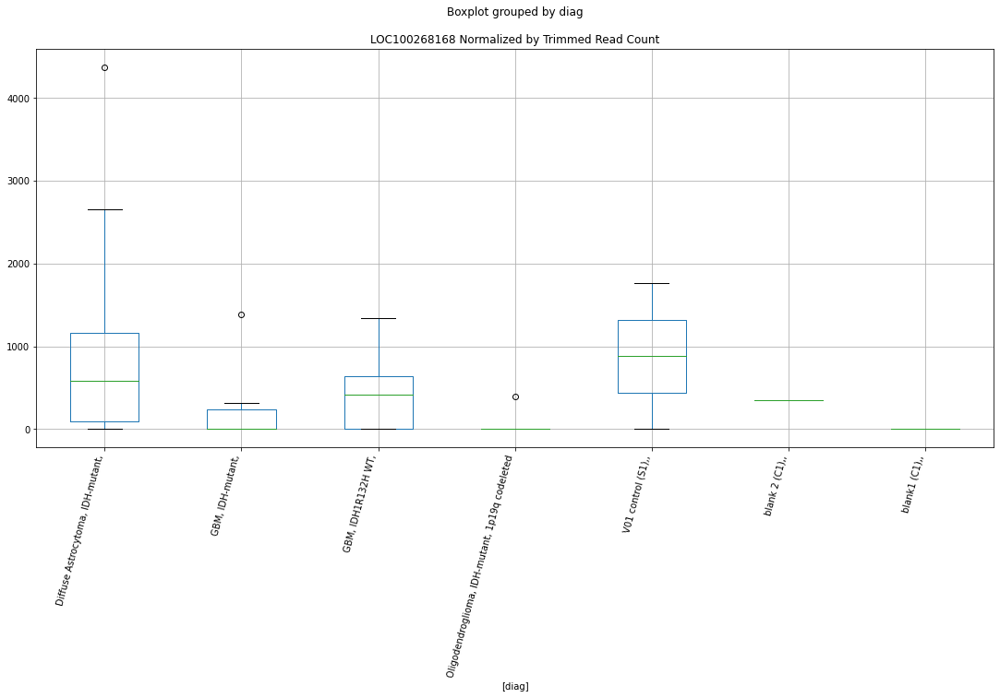

 p : 0.017037267034901497  ( t : 2.6287212072585597 ) :  D-plex  :  cutadapt2  :  LINC00537
Control and blanks
76        0.00
340    1761.46
Name: LINC00537, dtype: float64
208    2821.76
Name: LINC00537, dtype: float64
472    1155.91
Name: LINC00537, dtype: float64


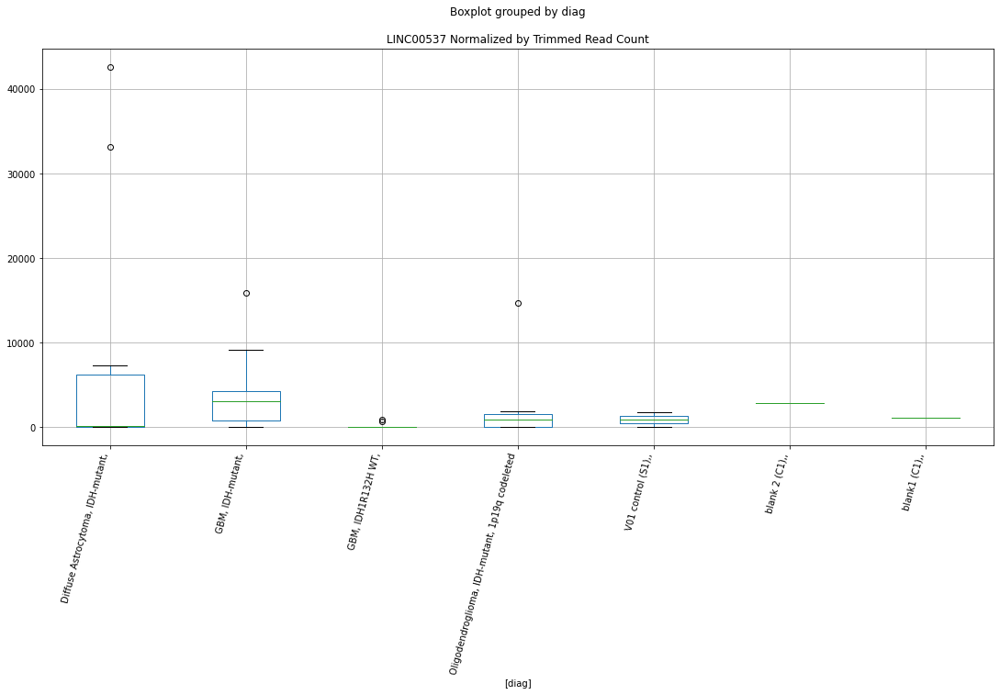

 p : 0.017217221520777586  ( t : 2.6237372892128574 ) :  D-plex  :  cutadapt2  :  LINC01900
Control and blanks
76     32577.41
340        0.00
Name: LINC01900, dtype: float64
208    881.8
Name: LINC01900, dtype: float64
472    1155.91
Name: LINC01900, dtype: float64


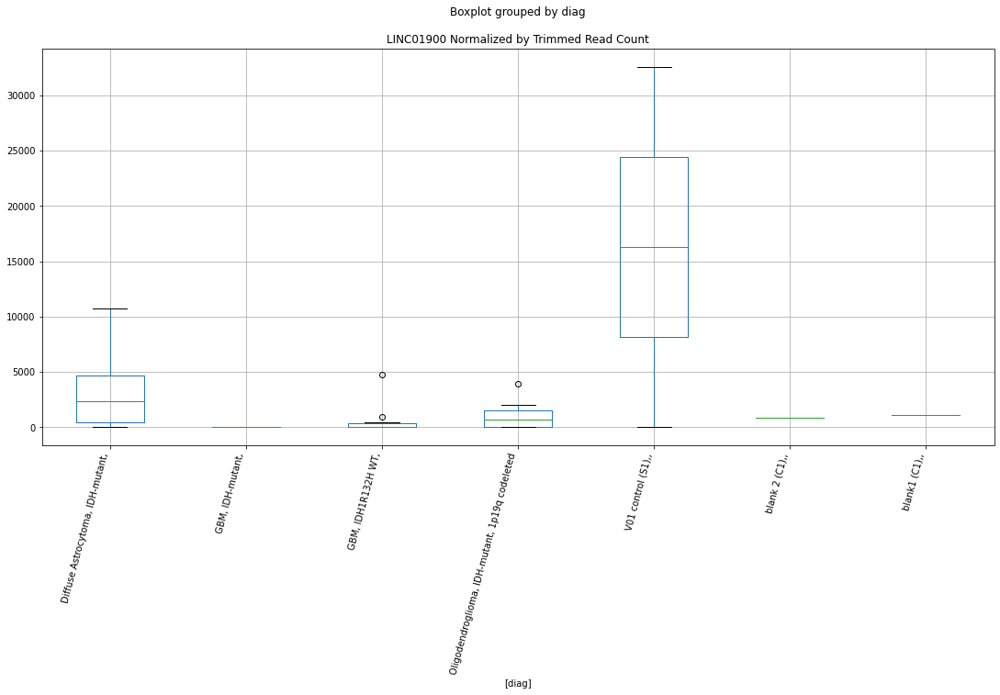

 p : 0.017286993010376134  ( t : 2.621818247967229 ) :  D-plex  :  bbduk2  :  LMCD1
Control and blanks
73     14687.16
337        0.00
Name: LMCD1, dtype: float64
205    1970.0
Name: LMCD1, dtype: float64
469    1774.58
Name: LMCD1, dtype: float64


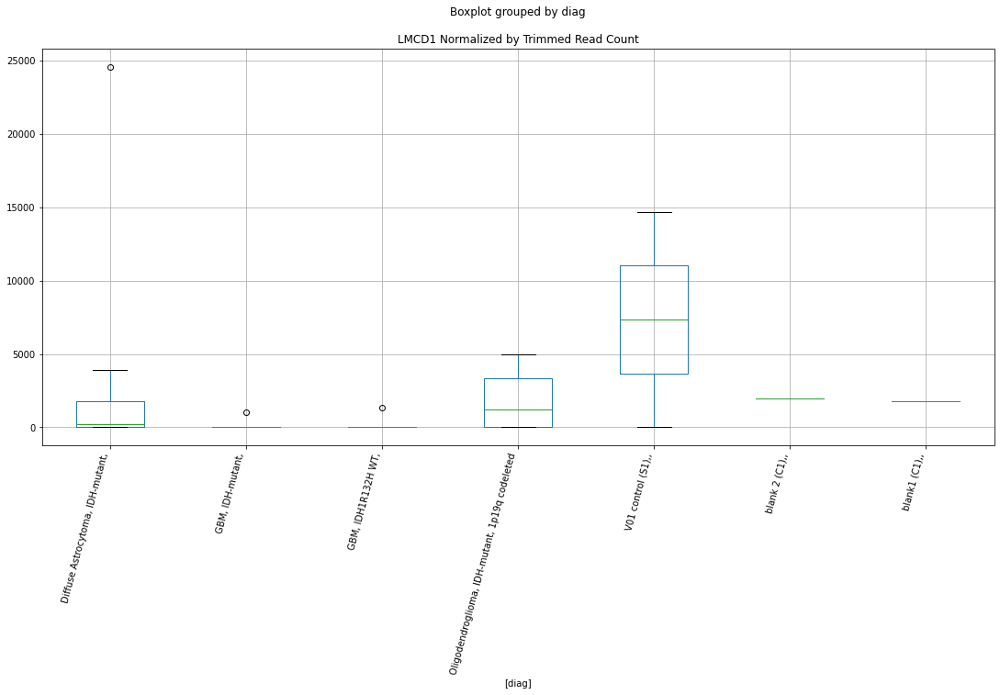

 p : 0.01760599469343773  ( t : 2.613136922891174 ) :  Lexogen  :  bbduk2  :  LIPE-AS1
Control and blanks
79     0.0
343    0.0
Name: LIPE-AS1, dtype: float64
211    0.0
Name: LIPE-AS1, dtype: float64
475    0.0
Name: LIPE-AS1, dtype: float64


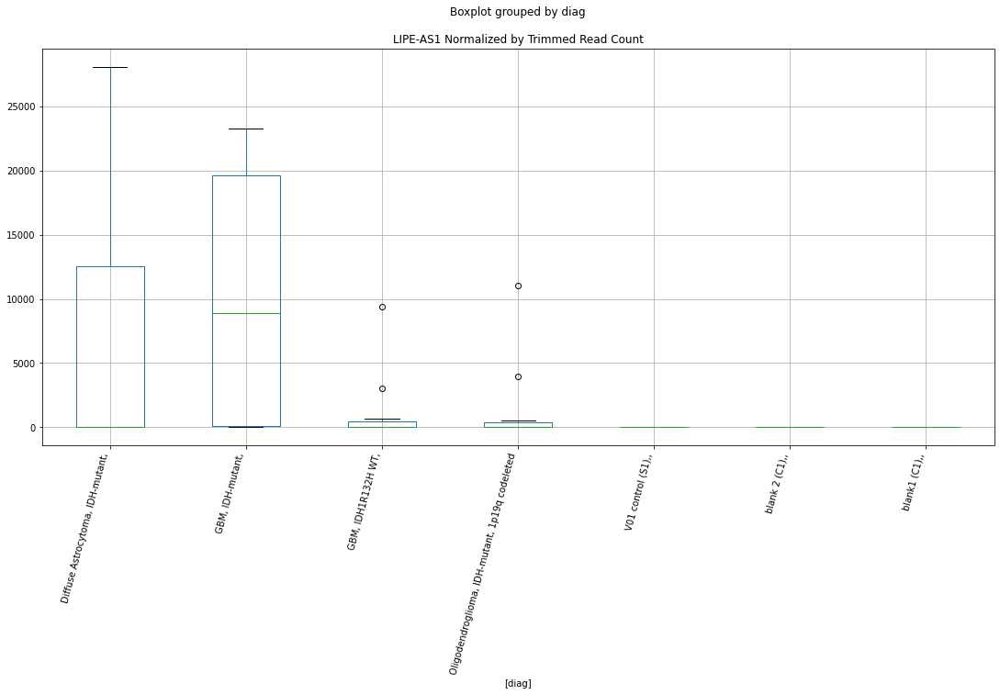

 p : 0.017679322493003025  ( t : 2.6111625096374995 ) :  D-plex  :  cutadapt2  :  LOC102723753
Control and blanks
76     0.0
340    0.0
Name: LOC102723753, dtype: float64
208    529.08
Name: LOC102723753, dtype: float64
472    577.96
Name: LOC102723753, dtype: float64


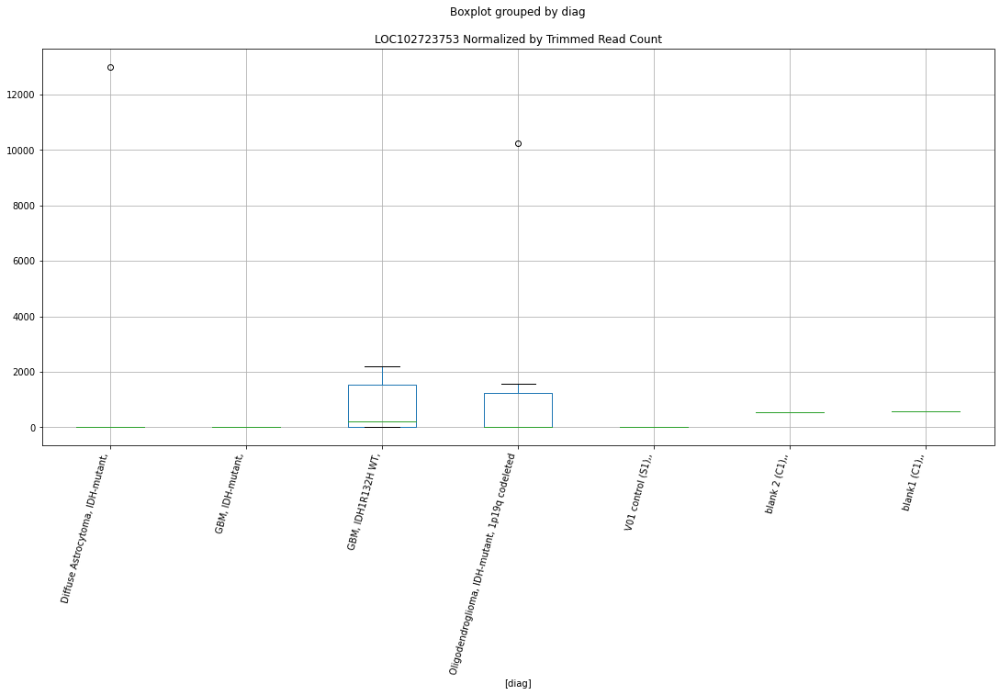

 p : 0.017864046424396058  ( t : 2.606222925858786 ) :  D-plex  :  cutadapt2  :  LGALS1
Control and blanks
76         0.00
340    35229.29
Name: LGALS1, dtype: float64
208    2116.32
Name: LGALS1, dtype: float64
472    1155.91
Name: LGALS1, dtype: float64


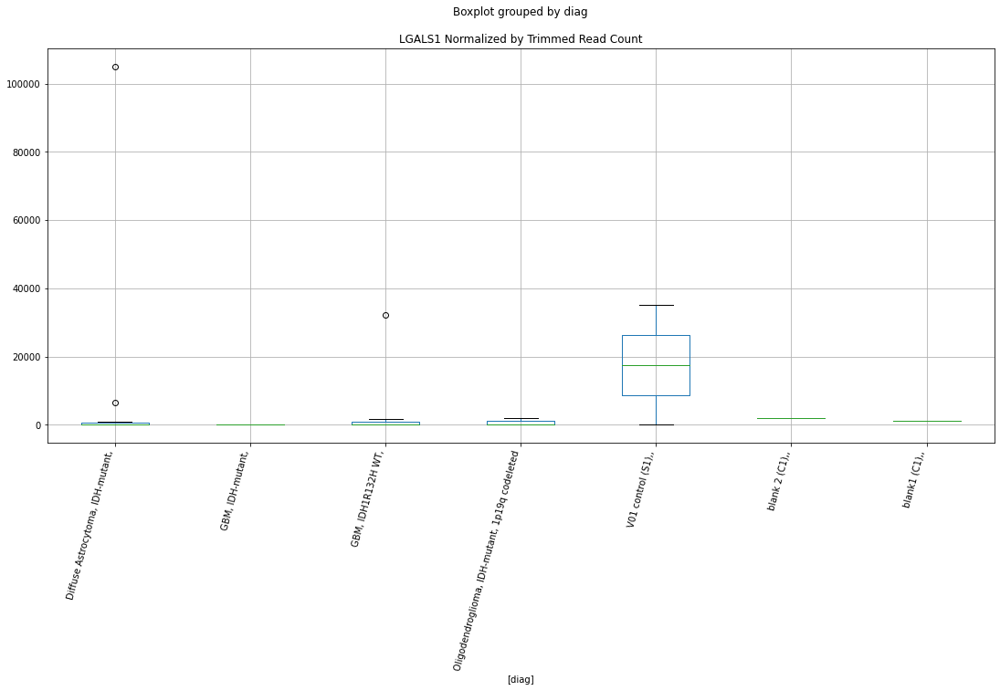

 p : 0.017902397955685503  ( t : 2.6052034745153176 ) :  D-plex  :  bbduk2  :  LGALS1
Control and blanks
73         0.00
337    35606.29
Name: LGALS1, dtype: float64
205    2149.09
Name: LGALS1, dtype: float64
469    1183.05
Name: LGALS1, dtype: float64


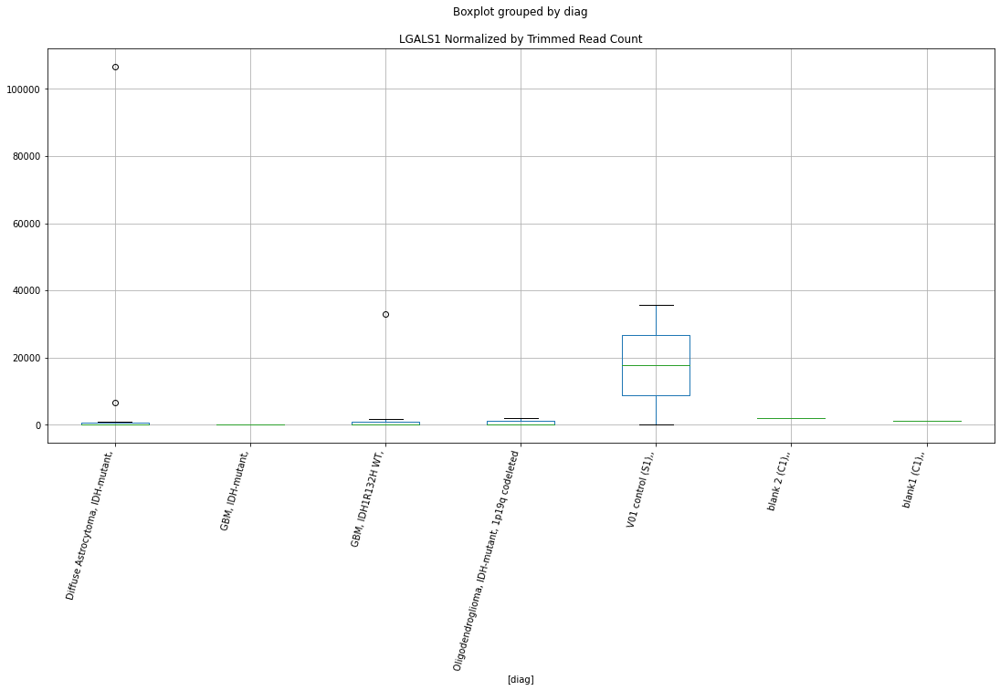

 p : 0.017958278426100628  ( t : 2.6037217781756805 ) :  Lexogen  :  bbduk2  :  LOC101929732
Control and blanks
79         0.00
343    33545.66
Name: LOC101929732, dtype: float64
211    0.0
Name: LOC101929732, dtype: float64
475    0.0
Name: LOC101929732, dtype: float64


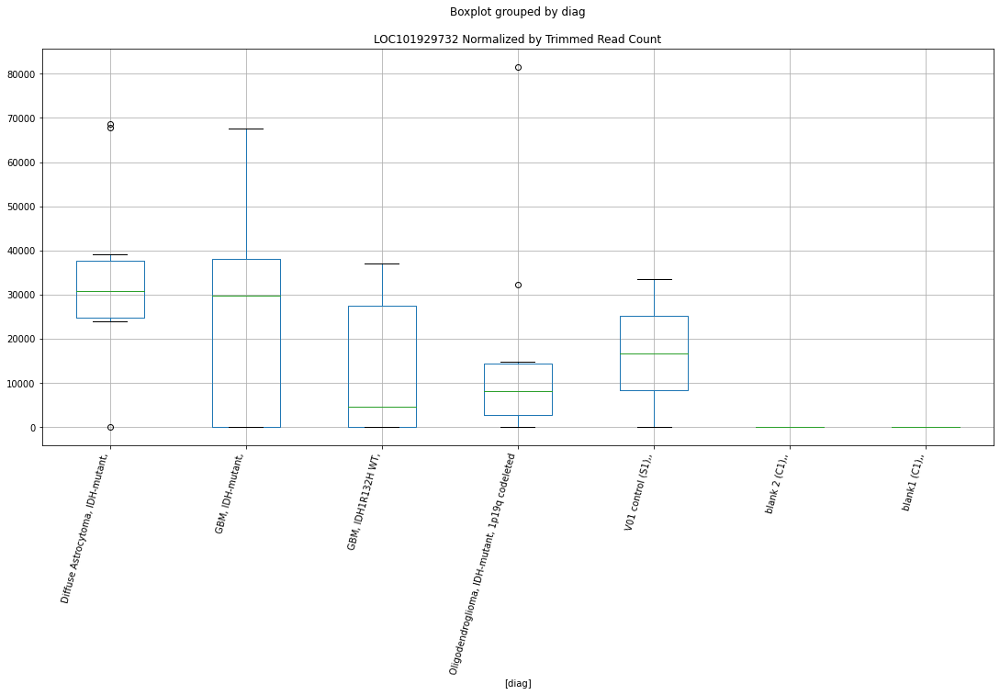

 p : 0.018084497797880697  ( t : 2.600391055632669 ) :  Lexogen  :  cutadapt2  :  LOC101929732
Control and blanks
82         0.00
346    33248.65
Name: LOC101929732, dtype: float64
214    0.0
Name: LOC101929732, dtype: float64
478    0.0
Name: LOC101929732, dtype: float64


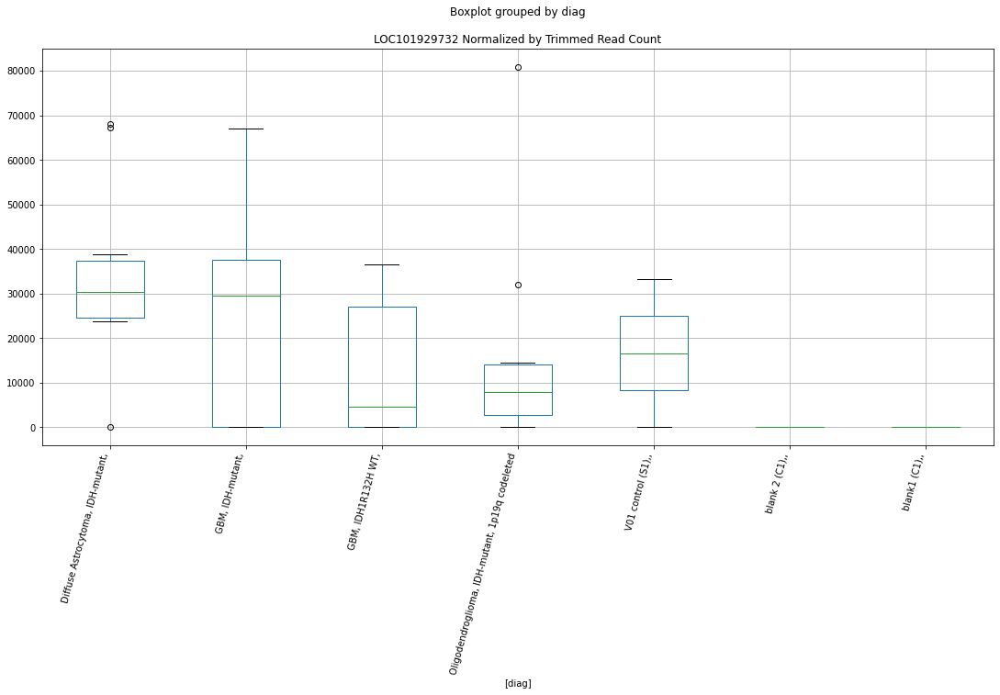

 p : 0.018372982964258416  ( t : 2.5928604845781558 ) :  D-plex  :  bbduk2  :  LOC101929165
Control and blanks
73     0.0
337    0.0
Name: LOC101929165, dtype: float64
205    358.18
Name: LOC101929165, dtype: float64
469    3549.16
Name: LOC101929165, dtype: float64


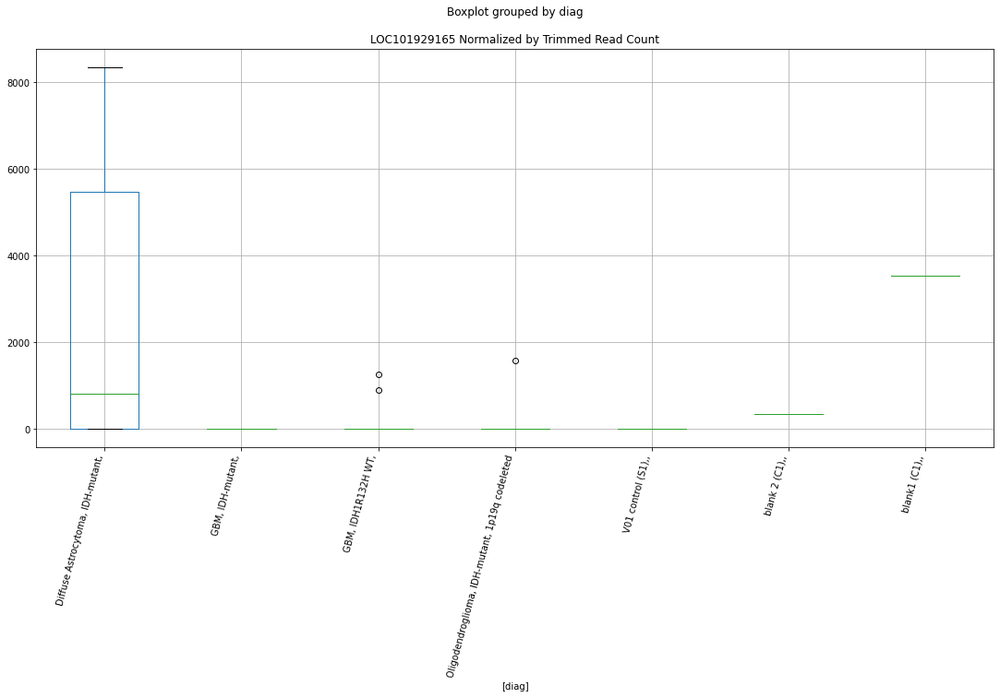

 p : 0.018470618988370987  ( t : 2.590337198159211 ) :  D-plex  :  cutadapt2  :  LOC101929165
Control and blanks
76     0.0
340    0.0
Name: LOC101929165, dtype: float64
208    352.72
Name: LOC101929165, dtype: float64
472    3467.74
Name: LOC101929165, dtype: float64


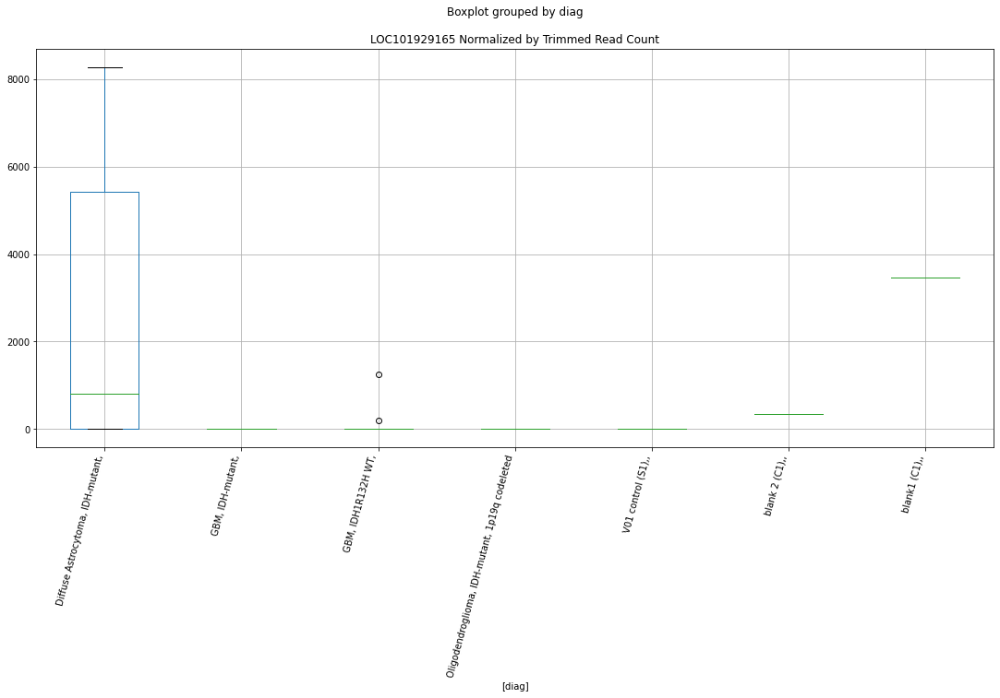

 p : 0.01847174511960897  ( t : 2.5903081685046416 ) :  Lexogen  :  bbduk2  :  LINC01163
Control and blanks
79       0.00
343    212.31
Name: LINC01163, dtype: float64
211    0.0
Name: LINC01163, dtype: float64
475    0.0
Name: LINC01163, dtype: float64


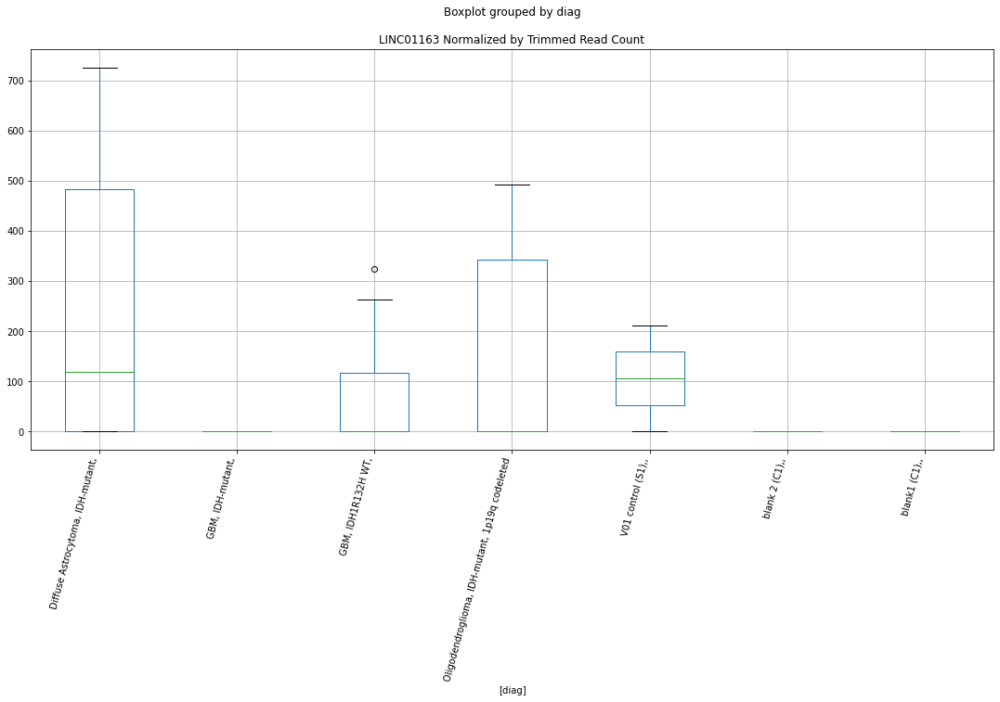

 p : 0.01850292610852283  ( t : 2.5895050441315375 ) :  D-plex  :  cutadapt2  :  LOC101929420
Control and blanks
76     0.0
340    0.0
Name: LOC101929420, dtype: float64
208    881.8
Name: LOC101929420, dtype: float64
472    577.96
Name: LOC101929420, dtype: float64


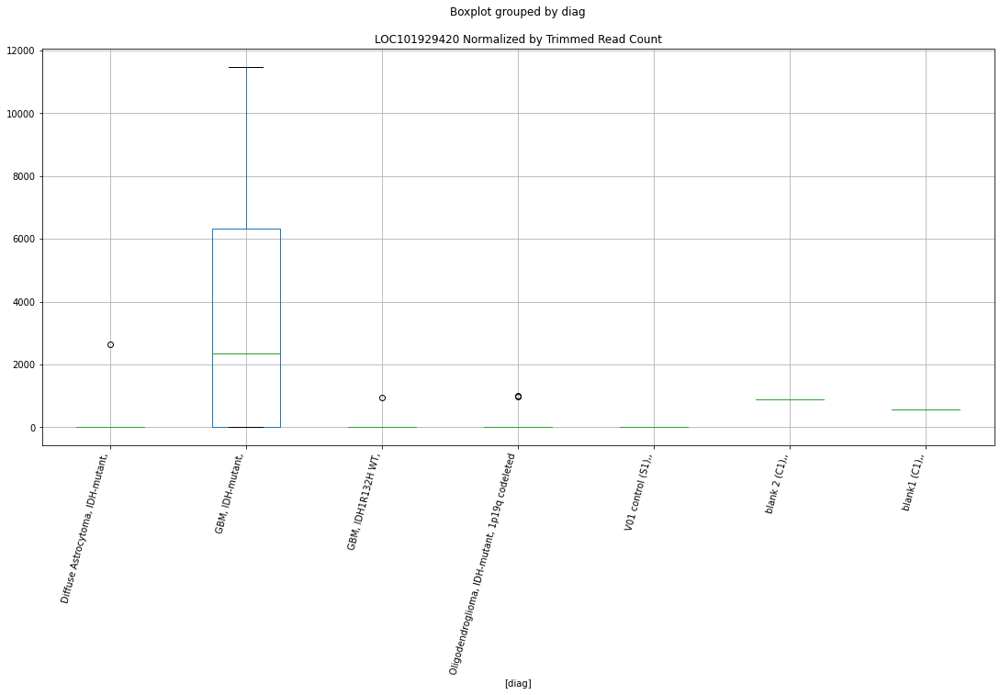

 p : 0.01854409658628033  ( t : 2.588446585778249 ) :  D-plex  :  bbduk2  :  LOC101929420
Control and blanks
73     0.0
337    0.0
Name: LOC101929420, dtype: float64
205    895.45
Name: LOC101929420, dtype: float64
469    591.53
Name: LOC101929420, dtype: float64


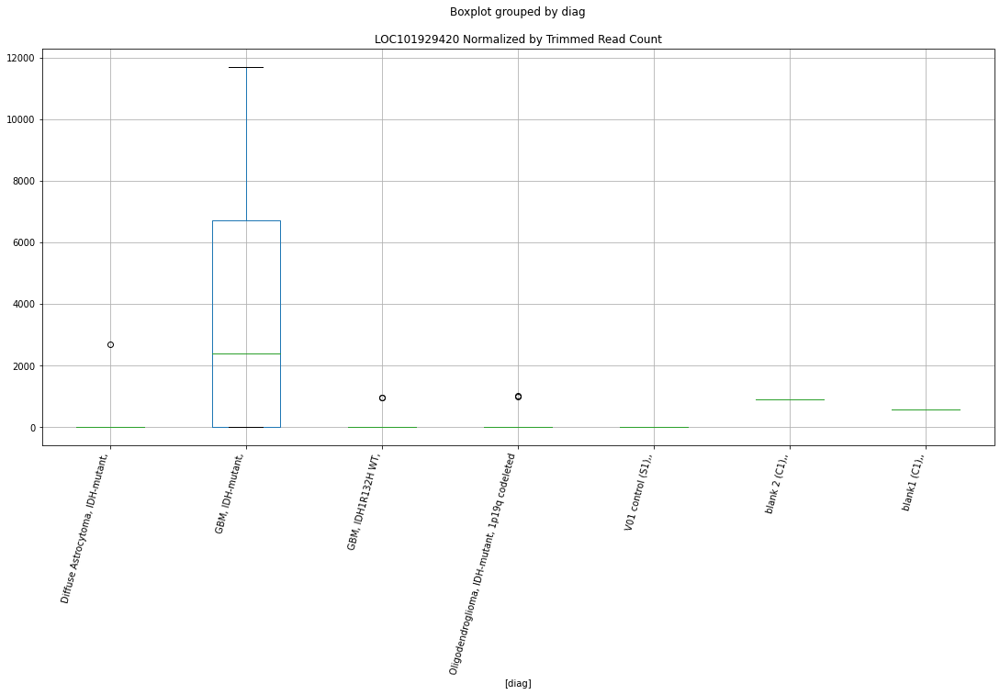

 p : 0.018579933566671637  ( t : 2.5875270596352866 ) :  D-plex  :  bbduk2  :  LOC101927971
Control and blanks
73         0.00
337    32045.66
Name: LOC101927971, dtype: float64
205    3581.82
Name: LOC101927971, dtype: float64
469    5323.75
Name: LOC101927971, dtype: float64


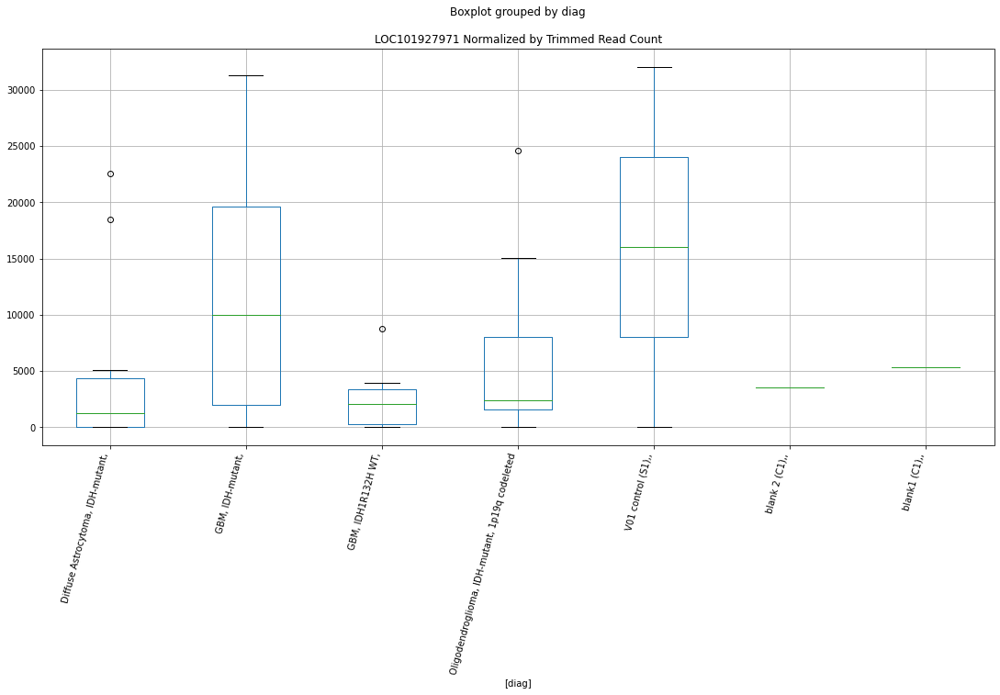

 p : 0.01862157922362329  ( t : 2.586460601410126 ) :  D-plex  :  bbduk2  :  LINC01900
Control and blanks
73     33239.36
337        0.00
Name: LINC01900, dtype: float64
205    716.36
Name: LINC01900, dtype: float64
469    1183.05
Name: LINC01900, dtype: float64


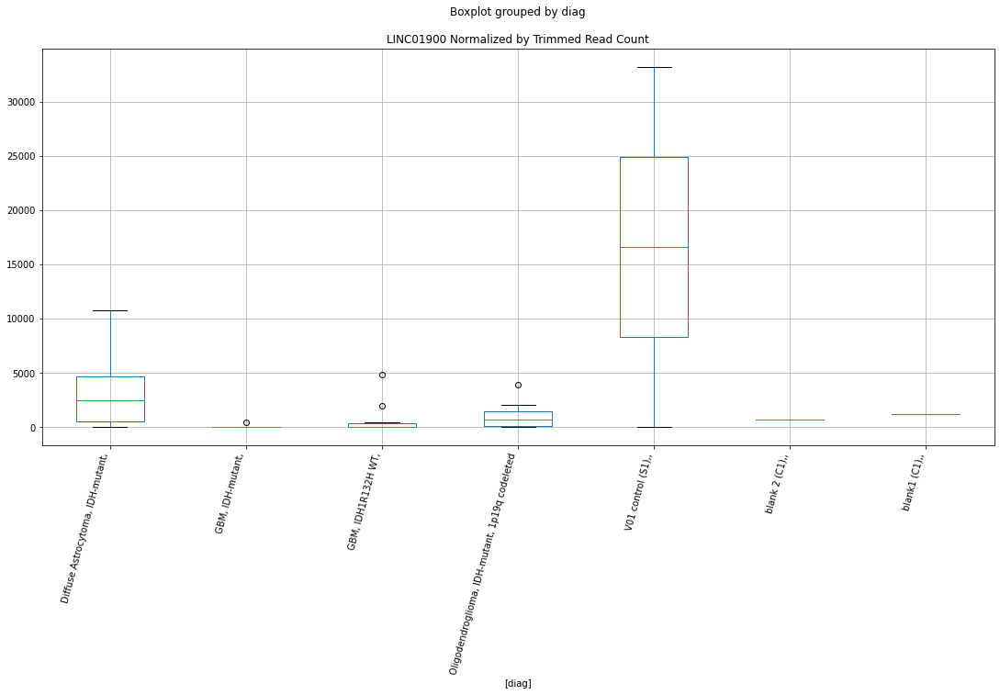

 p : 0.018652792139526995  ( t : 2.5856627854226817 ) :  D-plex  :  bbduk2  :  LOC101928077
Control and blanks
73     0.0
337    0.0
Name: LOC101928077, dtype: float64
205    0.0
Name: LOC101928077, dtype: float64
469    0.0
Name: LOC101928077, dtype: float64


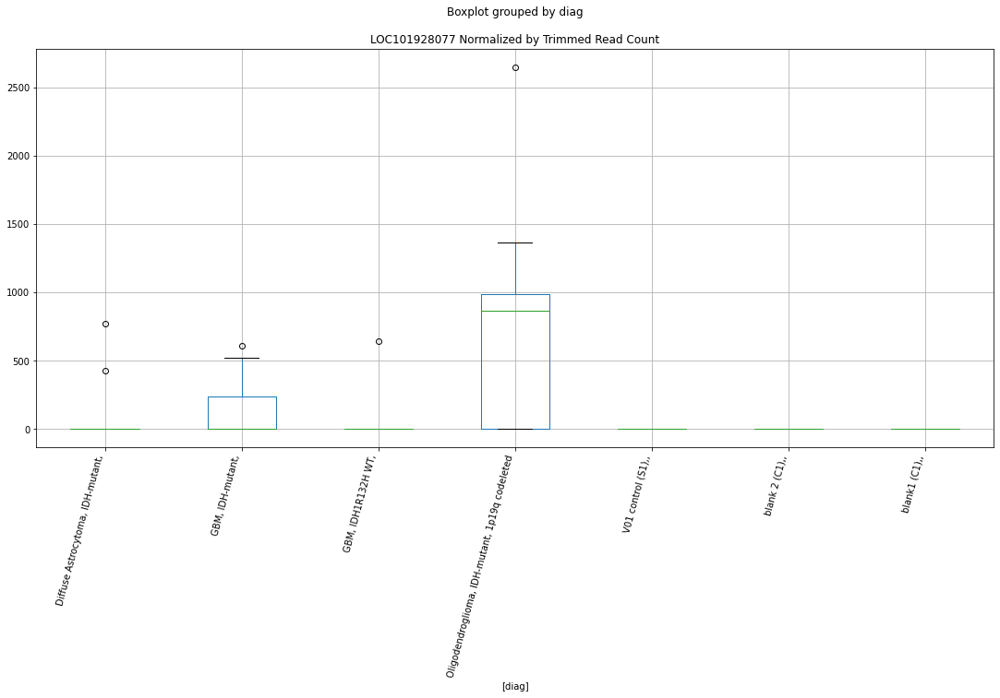

 p : 0.018692831201979496  ( t : 2.5846412203718168 ) :  Lexogen  :  cutadapt2  :  LIPE-AS1
Control and blanks
82     0.0
346    0.0
Name: LIPE-AS1, dtype: float64
214    0.0
Name: LIPE-AS1, dtype: float64
478    0.0
Name: LIPE-AS1, dtype: float64


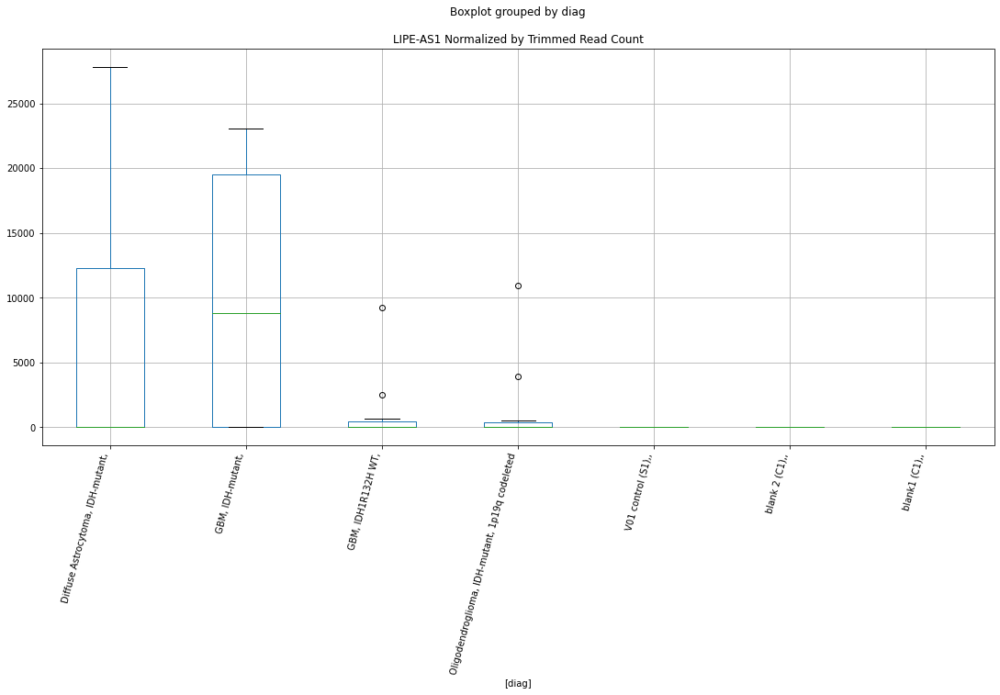

 p : 0.018765510364653105  ( t : 2.5827921577733863 ) :  D-plex  :  bbduk2  :  LOC101929420
Control and blanks
73     0.0
337    0.0
Name: LOC101929420, dtype: float64
205    895.45
Name: LOC101929420, dtype: float64
469    591.53
Name: LOC101929420, dtype: float64


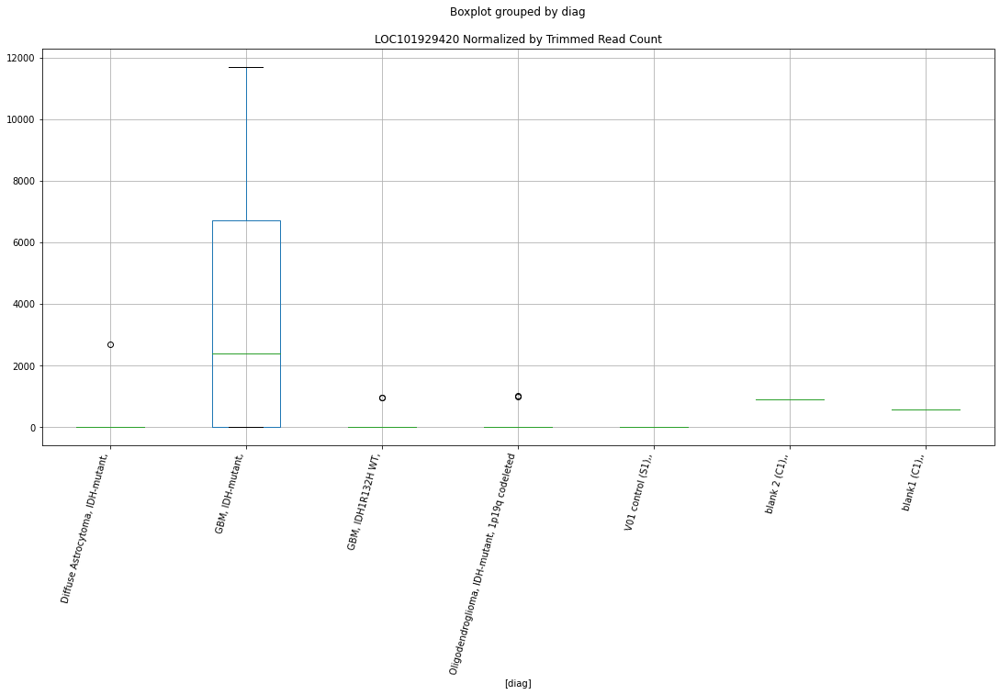

 p : 0.01898492112463333  ( t : 2.5772509265157595 ) :  Lexogen  :  cutadapt2  :  LINC02700
Control and blanks
82     0.0
346    0.0
Name: LINC02700, dtype: float64
214    0.0
Name: LINC02700, dtype: float64
478    0.0
Name: LINC02700, dtype: float64


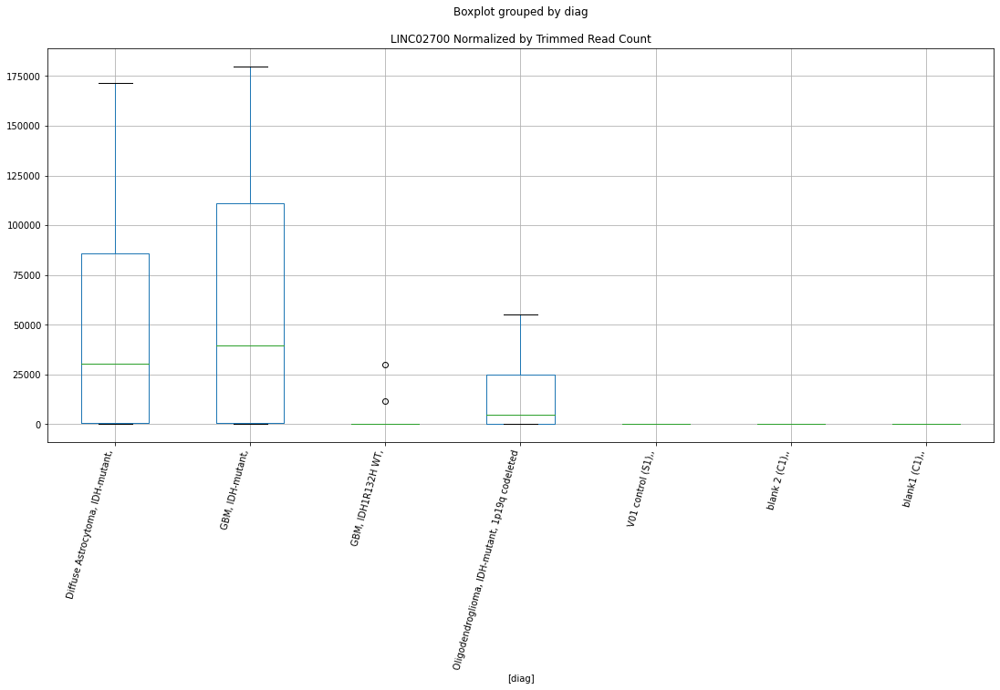

 p : 0.019023575908876284  ( t : 2.5762809898497956 ) :  D-plex  :  cutadapt2  :  LOC101928077
Control and blanks
76     0.0
340    0.0
Name: LOC101928077, dtype: float64
208    0.0
Name: LOC101928077, dtype: float64
472    0.0
Name: LOC101928077, dtype: float64


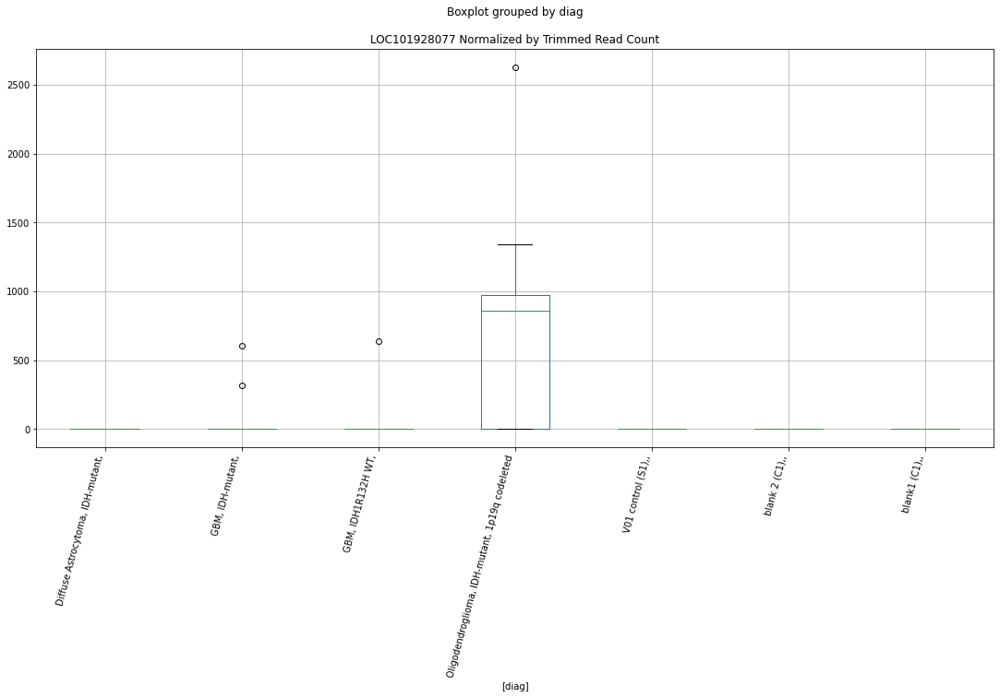

 p : 0.01996909137872377  ( t : 2.55311913316085 ) :  D-plex  :  bbduk2  :  LOC105369293
Control and blanks
73     0.0
337    0.0
Name: LOC105369293, dtype: float64
205    358.18
Name: LOC105369293, dtype: float64
469    591.53
Name: LOC105369293, dtype: float64


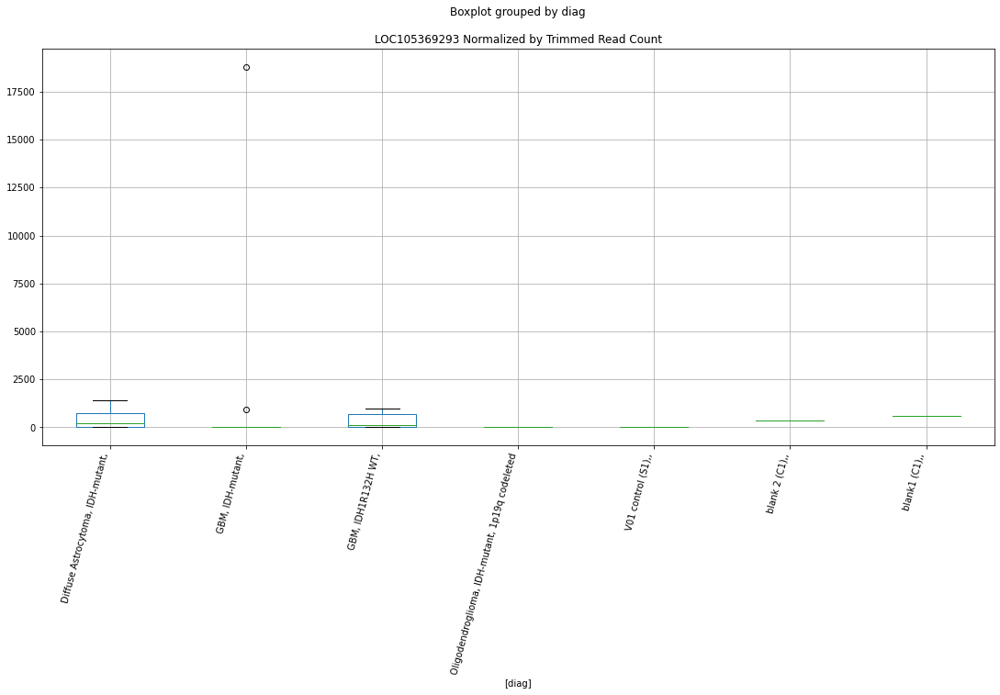

 p : 0.020016685256266264  ( t : 2.5519808769289054 ) :  D-plex  :  bbduk2  :  LOC100130207
Control and blanks
73     0.0
337    0.0
Name: LOC100130207, dtype: float64
205    1074.55
Name: LOC100130207, dtype: float64
469    1183.05
Name: LOC100130207, dtype: float64


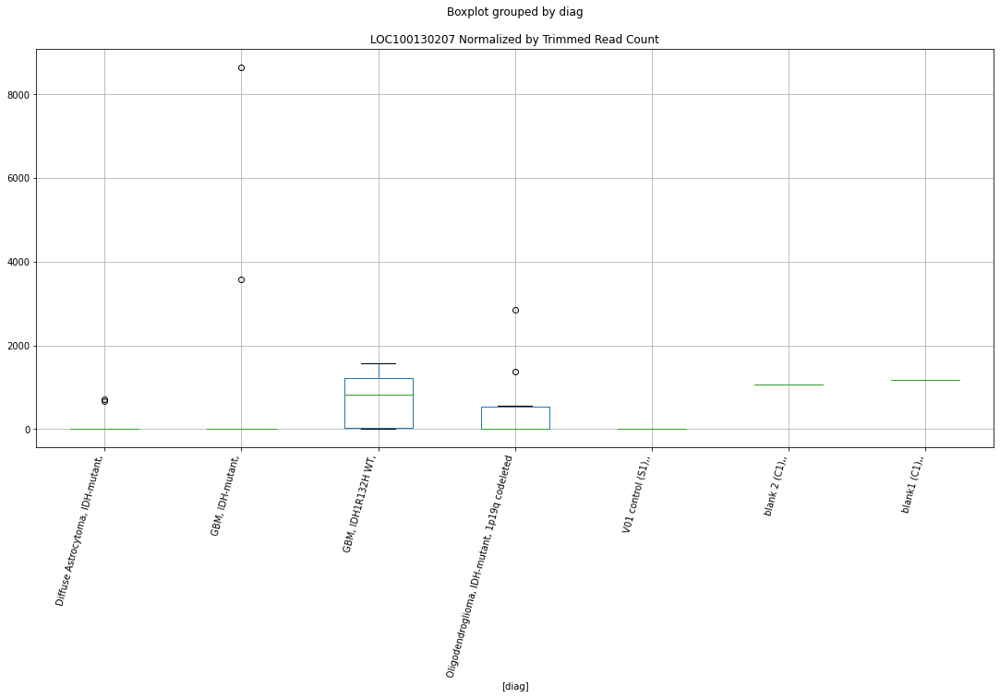

 p : 0.020079213367003062  ( t : 2.5504893378675626 ) :  Lexogen  :  bbduk2  :  LINC01814
Control and blanks
79     21458.98
343    28662.43
Name: LINC01814, dtype: float64
211    13938.62
Name: LINC01814, dtype: float64
475    17245.13
Name: LINC01814, dtype: float64


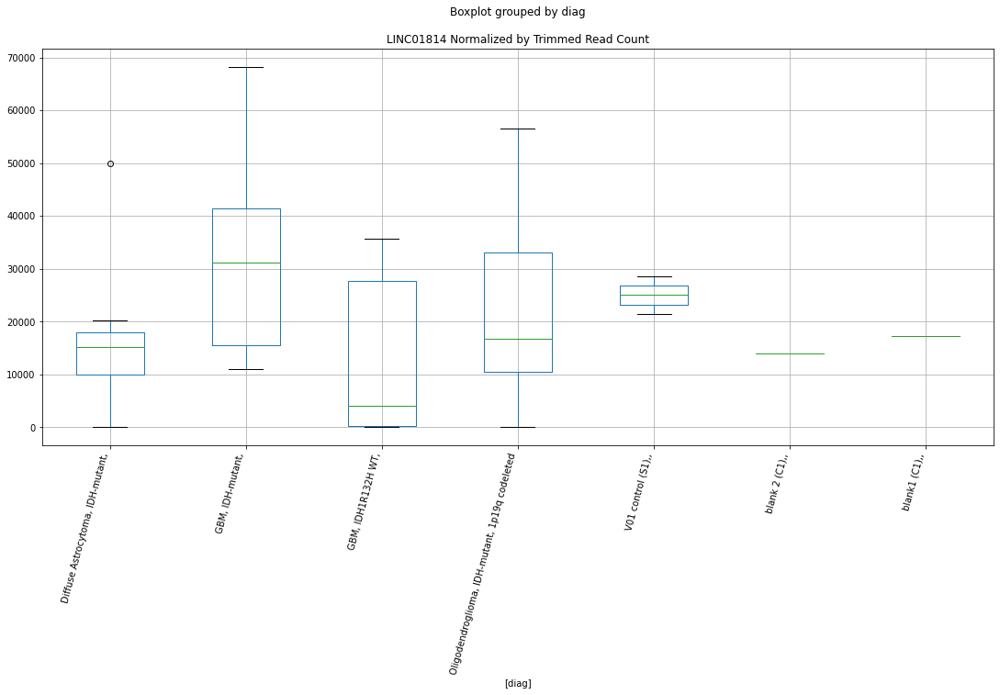

 p : 0.020133049746851813  ( t : 2.54920864567254 ) :  D-plex  :  bbduk2  :  LMCD1
Control and blanks
73     14687.16
337        0.00
Name: LMCD1, dtype: float64
205    1970.0
Name: LMCD1, dtype: float64
469    1774.58
Name: LMCD1, dtype: float64


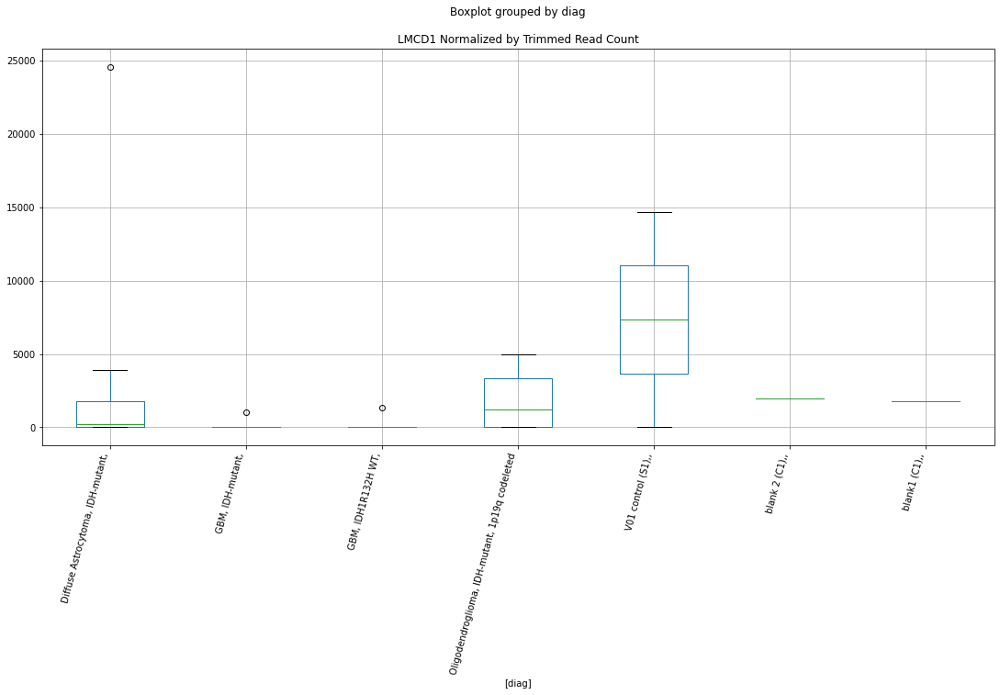

 p : 0.020360068386963078  ( t : 2.5438435667890906 ) :  D-plex  :  bbduk2  :  LOC105369293
Control and blanks
73     0.0
337    0.0
Name: LOC105369293, dtype: float64
205    358.18
Name: LOC105369293, dtype: float64
469    591.53
Name: LOC105369293, dtype: float64


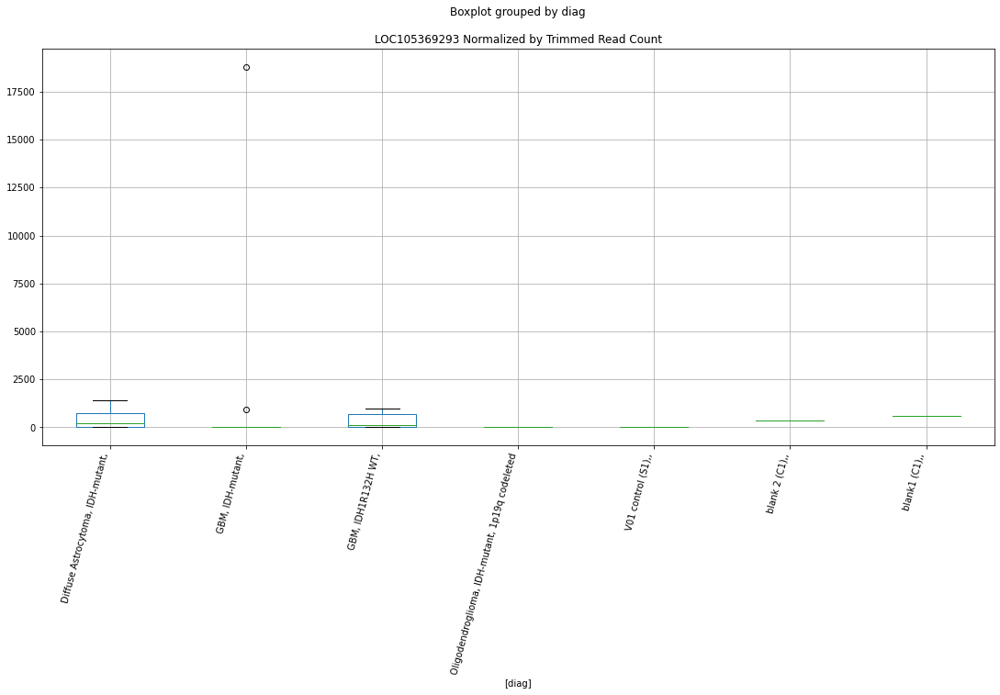

 p : 0.020365966772082803  ( t : 2.5437049268014627 ) :  D-plex  :  cutadapt2  :  LOC101929609
Control and blanks
76     124248.73
340      6165.12
Name: LOC101929609, dtype: float64
208    74247.65
Name: LOC101929609, dtype: float64
472    50282.16
Name: LOC101929609, dtype: float64


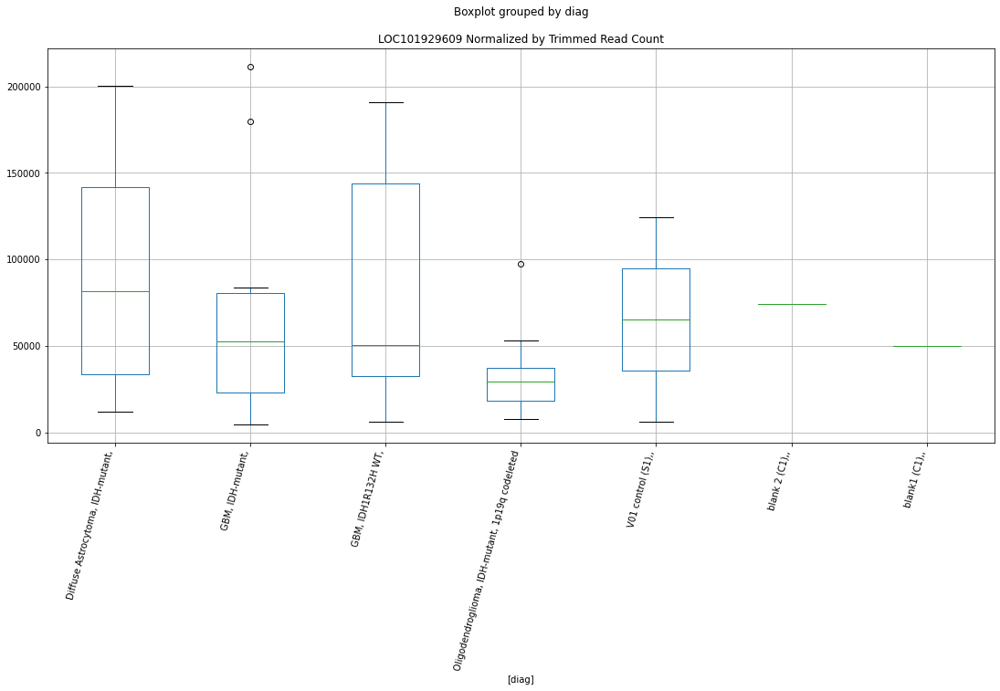

 p : 0.02041816420339074  ( t : 2.542479691456176 ) :  D-plex  :  bbduk2  :  LOC101929609
Control and blanks
73     108221.18
337      8011.42
Name: LOC101929609, dtype: float64
205    75934.56
Name: LOC101929609, dtype: float64
469    51462.88
Name: LOC101929609, dtype: float64


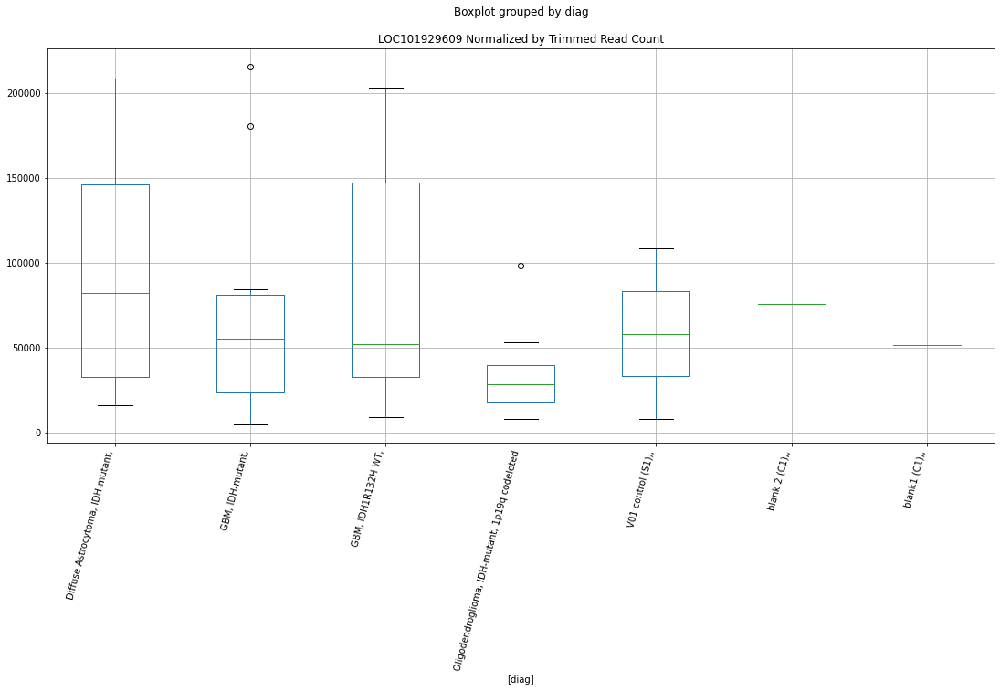

 p : 0.020516122054768833  ( t : 2.5401882877708495 ) :  D-plex  :  cutadapt2  :  LINC02387
Control and blanks
76     0.0
340    0.0
Name: LINC02387, dtype: float64
208    0.0
Name: LINC02387, dtype: float64
472    0.0
Name: LINC02387, dtype: float64


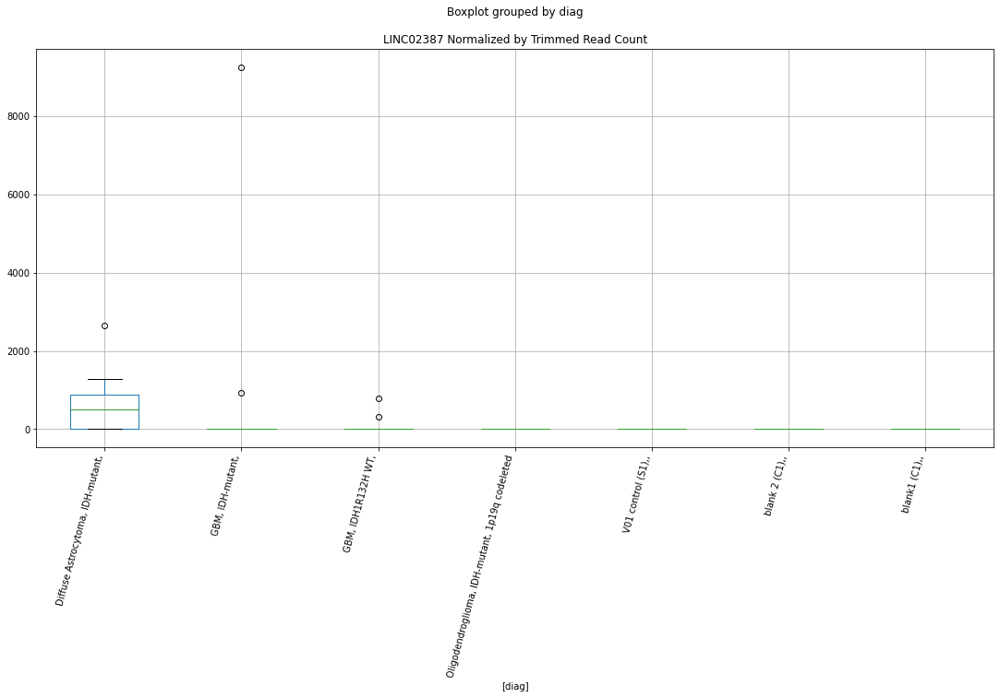

 p : 0.020861810744075653  ( t : 2.5321838253437767 ) :  Lexogen  :  bbduk2  :  LINC002481
Control and blanks
79     0.0
343    0.0
Name: LINC002481, dtype: float64
211    0.0
Name: LINC002481, dtype: float64
475    239.52
Name: LINC002481, dtype: float64


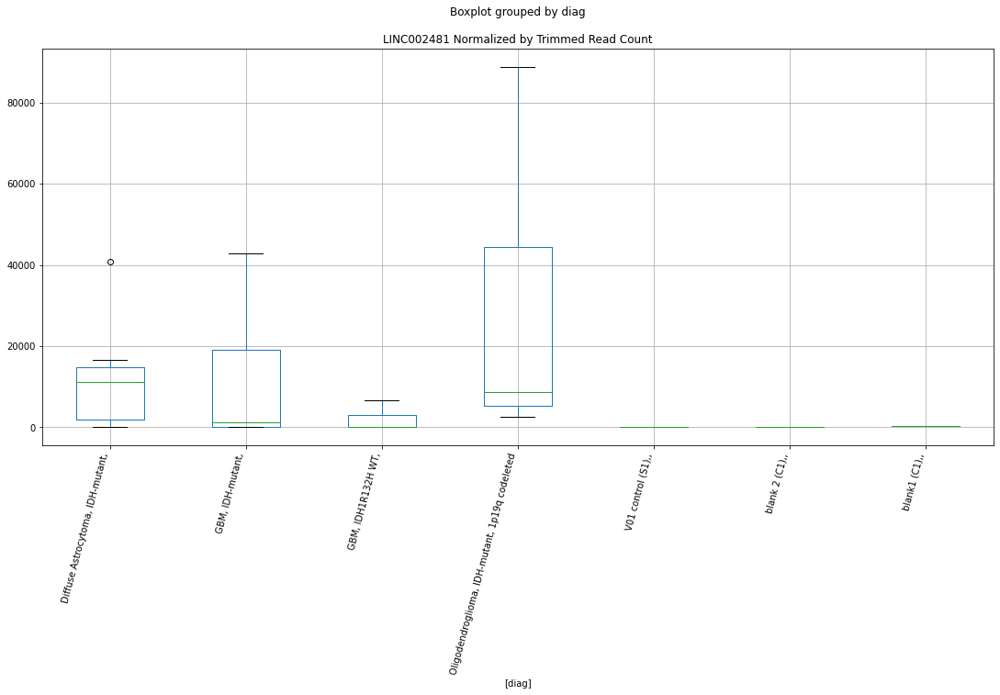

 p : 0.021257709603083107  ( t : 2.52316921237832 ) :  Lexogen  :  cutadapt2  :  LINC01814
Control and blanks
82     21300.77
346    28619.09
Name: LINC01814, dtype: float64
214    13832.55
Name: LINC01814, dtype: float64
478    17097.15
Name: LINC01814, dtype: float64


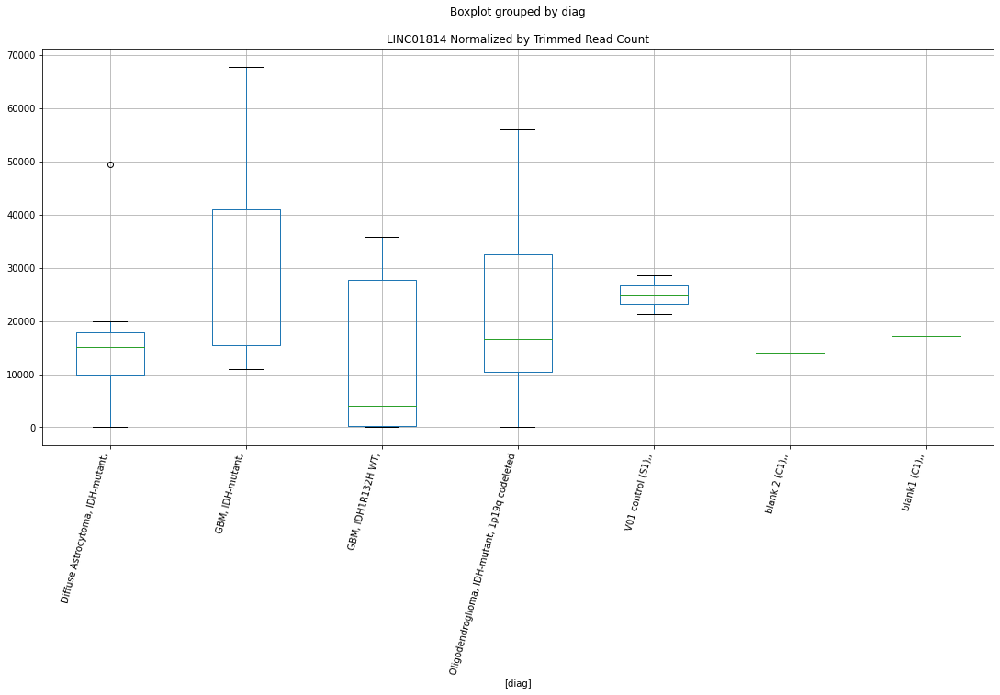

 p : 0.021296507668553104  ( t : 2.522294326744517 ) :  D-plex  :  cutadapt2  :  LOC100130238
Control and blanks
76     0.0
340    0.0
Name: LOC100130238, dtype: float64
208    2645.4
Name: LOC100130238, dtype: float64
472    2889.78
Name: LOC100130238, dtype: float64


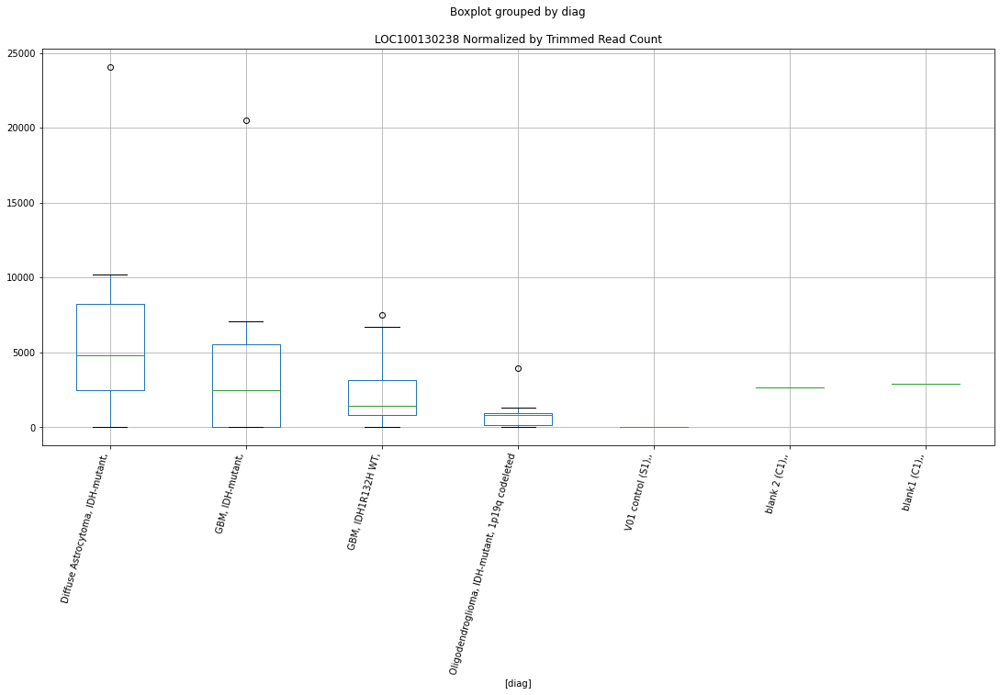

 p : 0.02139844093229239  ( t : 2.520002908166653 ) :  D-plex  :  bbduk2  :  LOC100130238
Control and blanks
73     0.0
337    0.0
Name: LOC100130238, dtype: float64
205    2686.36
Name: LOC100130238, dtype: float64
469    2957.64
Name: LOC100130238, dtype: float64


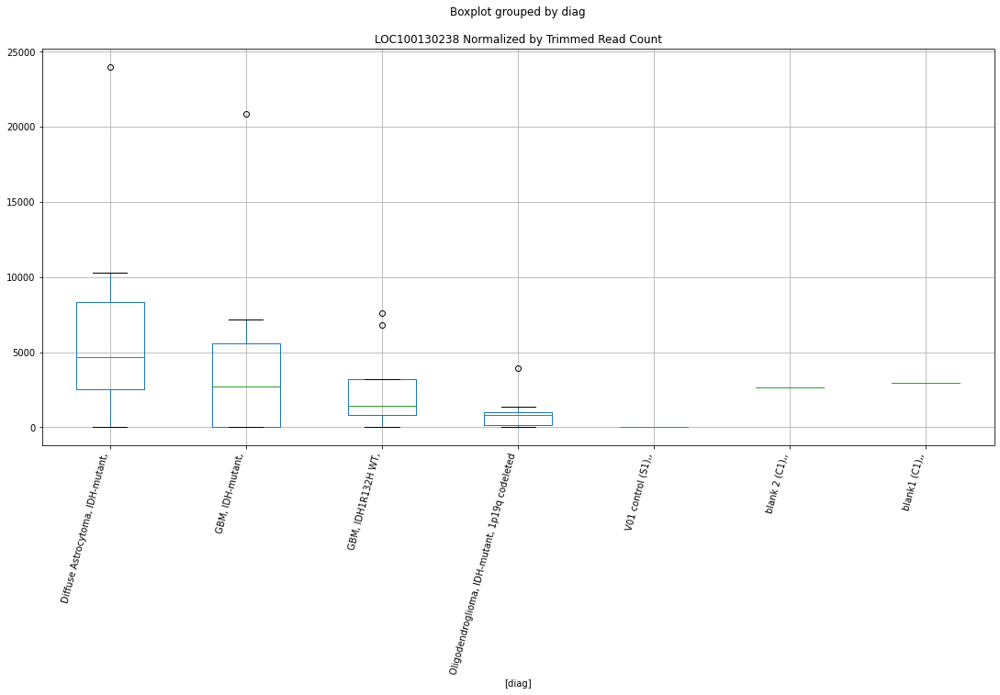

 p : 0.021479920228459702  ( t : 2.518178682449554 ) :  D-plex  :  cutadapt2  :  LMNB1
Control and blanks
76     2272.84
340       0.00
Name: LMNB1, dtype: float64
208    1234.52
Name: LMNB1, dtype: float64
472    1155.91
Name: LMNB1, dtype: float64


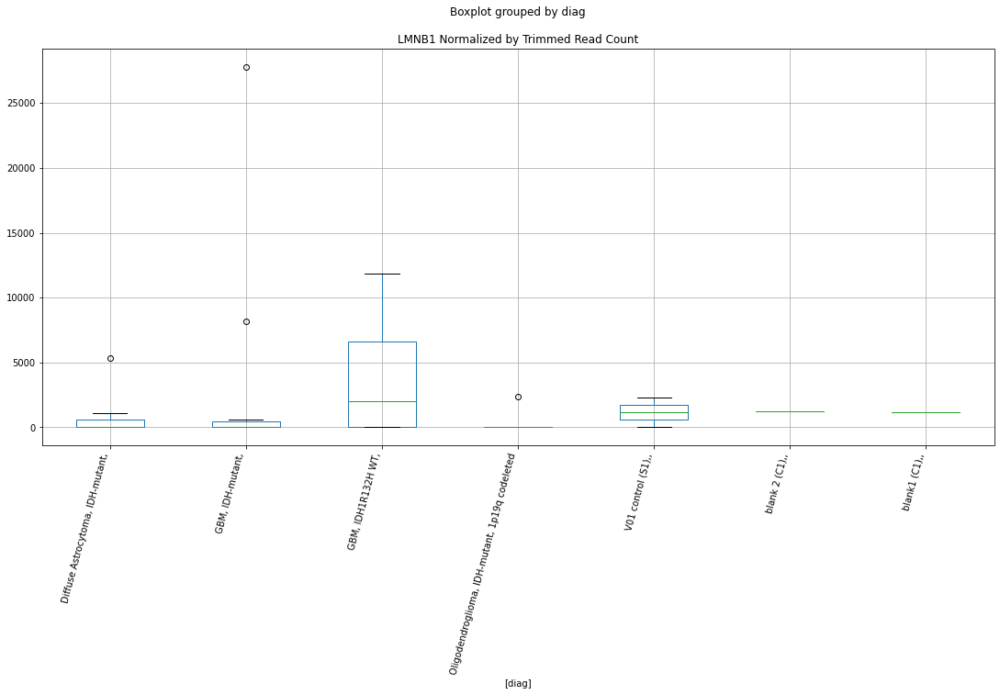

 p : 0.021553759692364196  ( t : 2.5165311346658052 ) :  Lexogen  :  cutadapt2  :  LINC002481
Control and blanks
82     0.0
346    0.0
Name: LINC002481, dtype: float64
214    0.0
Name: LINC002481, dtype: float64
478    0.0
Name: LINC002481, dtype: float64


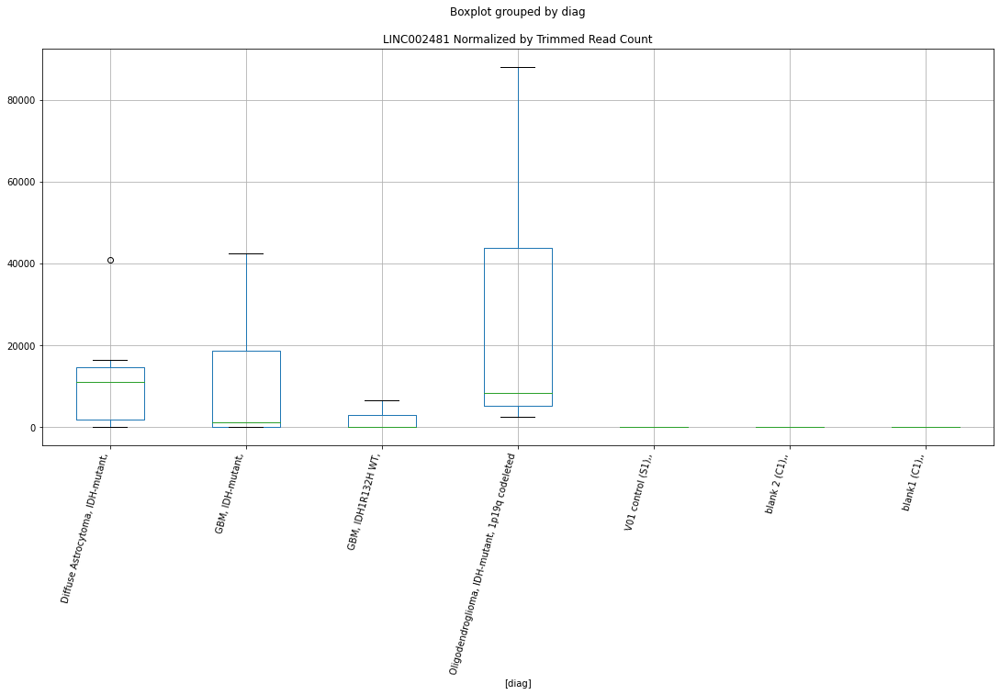

 p : 0.021621361875140545  ( t : 2.5150274194304783 ) :  D-plex  :  bbduk2  :  LOC105369844
Control and blanks
73     0.0
337    0.0
Name: LOC105369844, dtype: float64
205    716.36
Name: LOC105369844, dtype: float64
469    0.0
Name: LOC105369844, dtype: float64


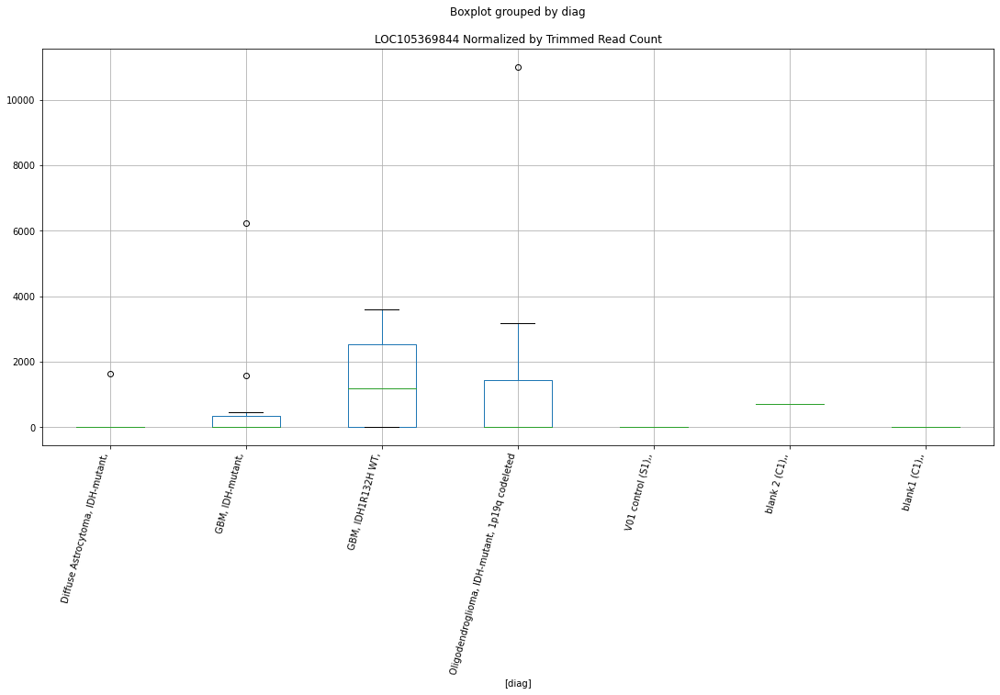

 p : 0.02166034655130022  ( t : 2.514162275450714 ) :  Lexogen  :  cutadapt2  :  LOC101929479
Control and blanks
82      22720.82
346    657818.32
Name: LOC101929479, dtype: float64
214    97099.07
Name: LOC101929479, dtype: float64
478    110656.59
Name: LOC101929479, dtype: float64


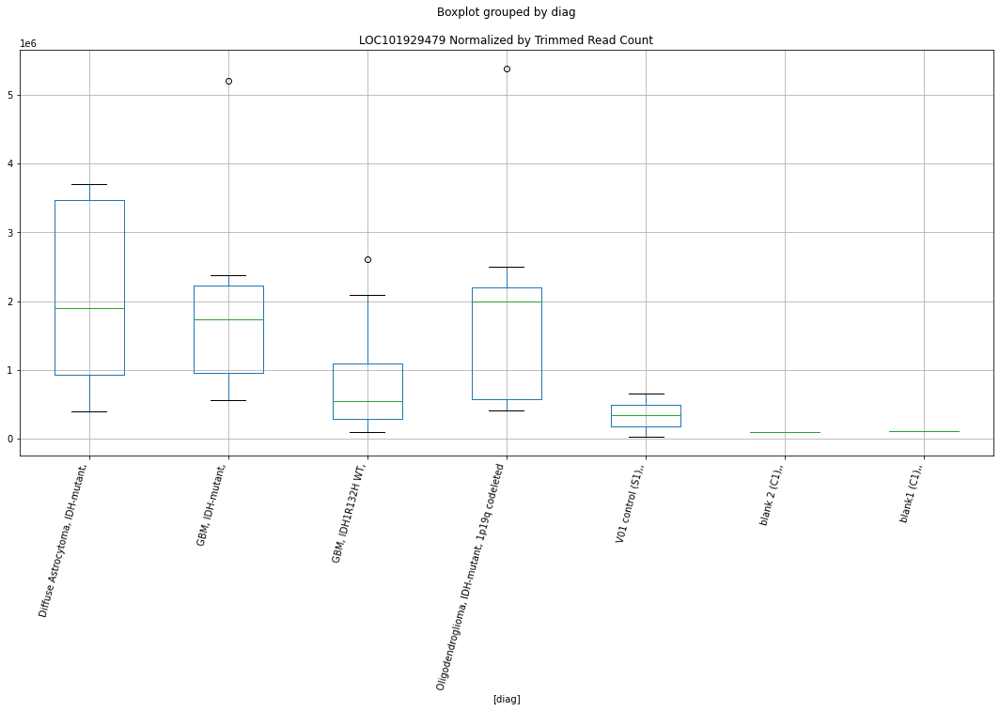

 p : 0.021702548727993907  ( t : 2.513227383137926 ) :  D-plex  :  cutadapt2  :  LOC101929420
Control and blanks
76     0.0
340    0.0
Name: LOC101929420, dtype: float64
208    881.8
Name: LOC101929420, dtype: float64
472    577.96
Name: LOC101929420, dtype: float64


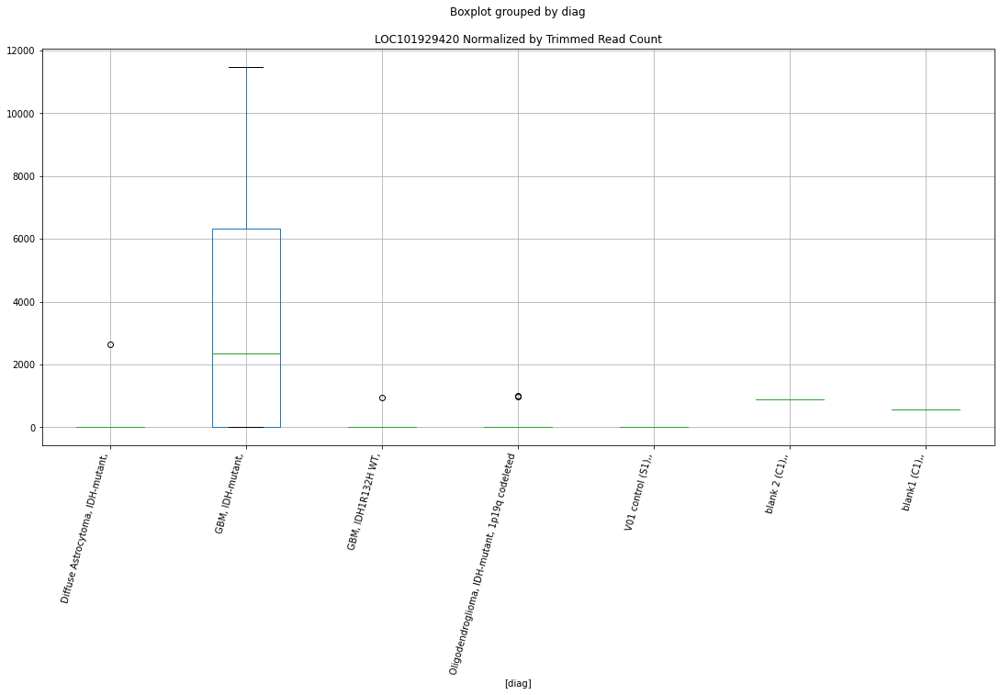

 p : 0.021712901708709893  ( t : 2.512998298572641 ) :  Lexogen  :  bbduk2  :  LOC101929479
Control and blanks
79      20028.38
343    660722.15
Name: LOC101929479, dtype: float64
211    97297.06
Name: LOC101929479, dtype: float64
475    111614.33
Name: LOC101929479, dtype: float64


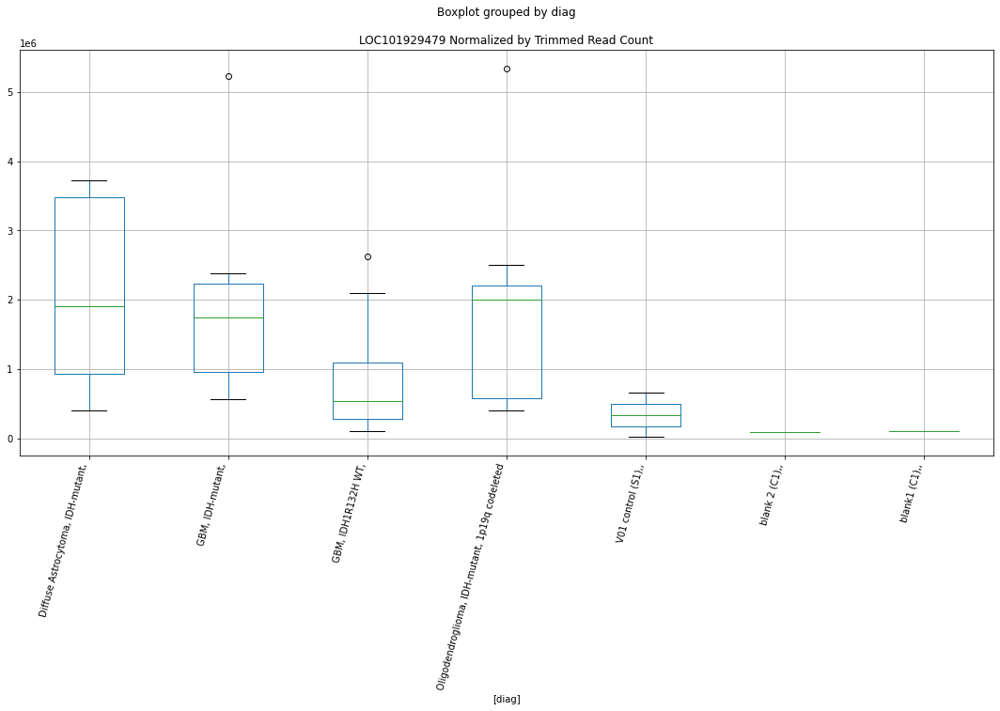

 p : 0.021760178189849336  ( t : 2.511953500571333 ) :  Lexogen  :  cutadapt2  :  LOC102724135
Control and blanks
82      11360.41
346    328909.16
Name: LOC102724135, dtype: float64
214    48549.54
Name: LOC102724135, dtype: float64
478    55328.29
Name: LOC102724135, dtype: float64


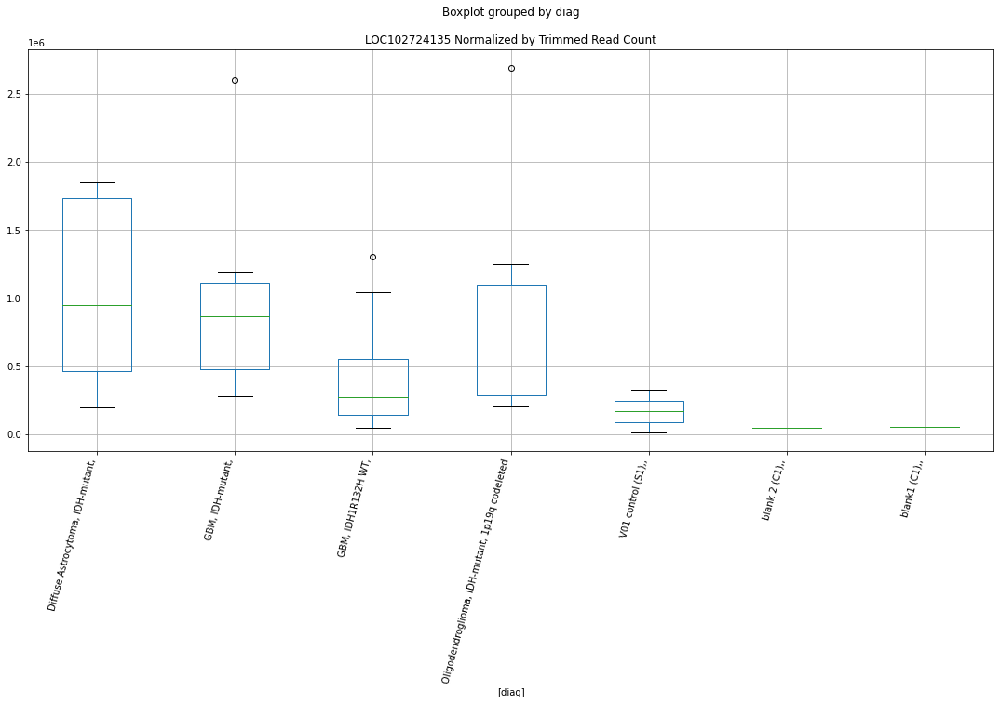

 p : 0.02181363479483493  ( t : 2.5107746993308524 ) :  Lexogen  :  bbduk2  :  LOC102724135
Control and blanks
79      10014.19
343    330361.07
Name: LOC102724135, dtype: float64
211    48648.53
Name: LOC102724135, dtype: float64
475    55807.17
Name: LOC102724135, dtype: float64


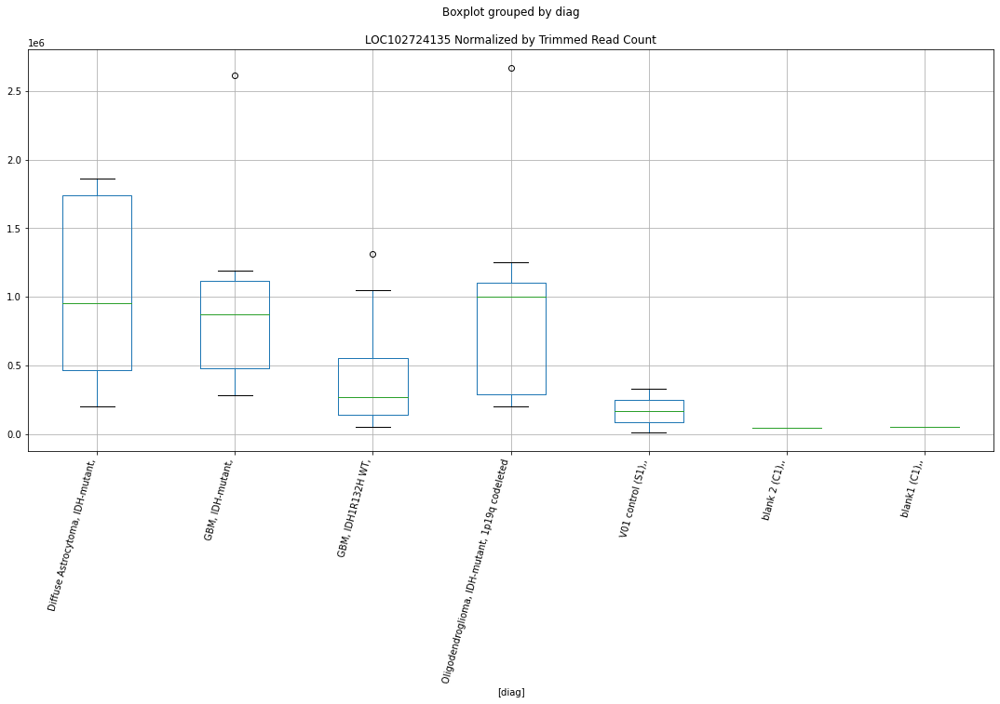

 p : 0.02202343483394474  ( t : 2.506174456374147 ) :  Lexogen  :  cutadapt2  :  LOC105371253
Control and blanks
82     0.0
346    0.0
Name: LOC105371253, dtype: float64
214    0.0
Name: LOC105371253, dtype: float64
478    0.0
Name: LOC105371253, dtype: float64


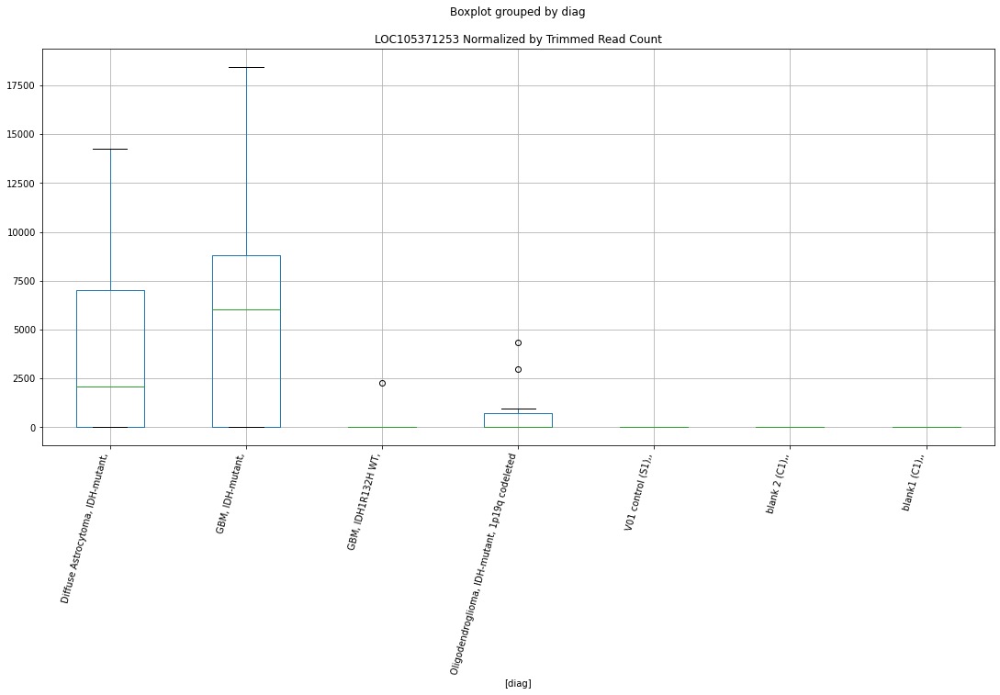

 p : 0.022065723711539857  ( t : 2.505252202516036 ) :  D-plex  :  bbduk2  :  LGR6
Control and blanks
73     475400.17
337         0.00
Name: LGR6, dtype: float64
205    73069.11
Name: LGR6, dtype: float64
469    97602.01
Name: LGR6, dtype: float64


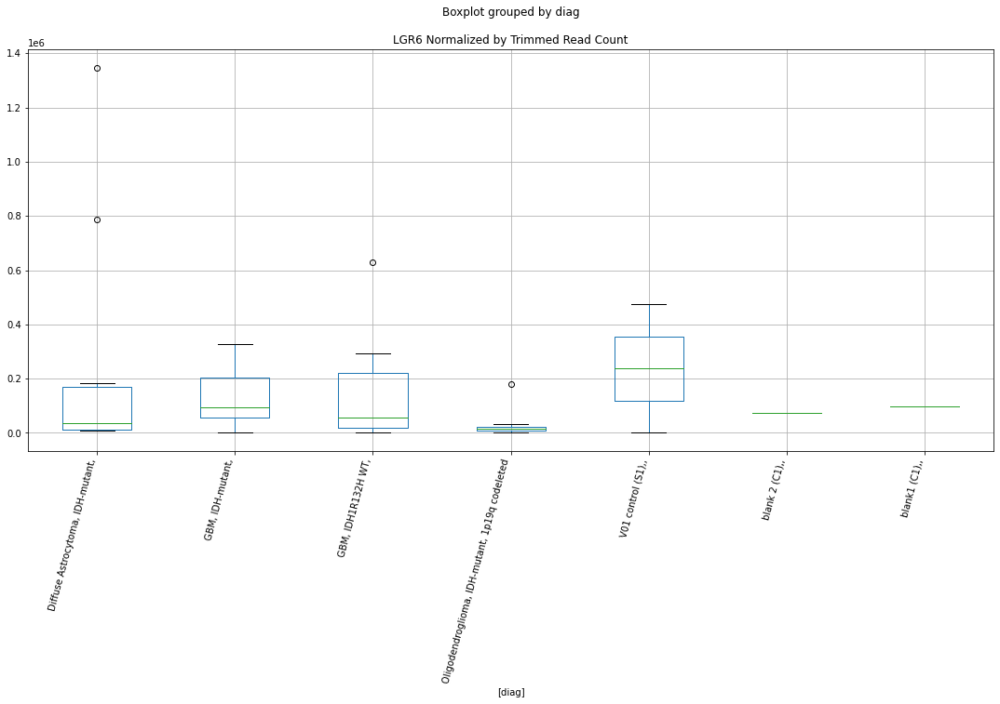

 p : 0.022114452962806265  ( t : 2.504191558156964 ) :  D-plex  :  bbduk2  :  LOC101929420
Control and blanks
73     0.0
337    0.0
Name: LOC101929420, dtype: float64
205    895.45
Name: LOC101929420, dtype: float64
469    591.53
Name: LOC101929420, dtype: float64


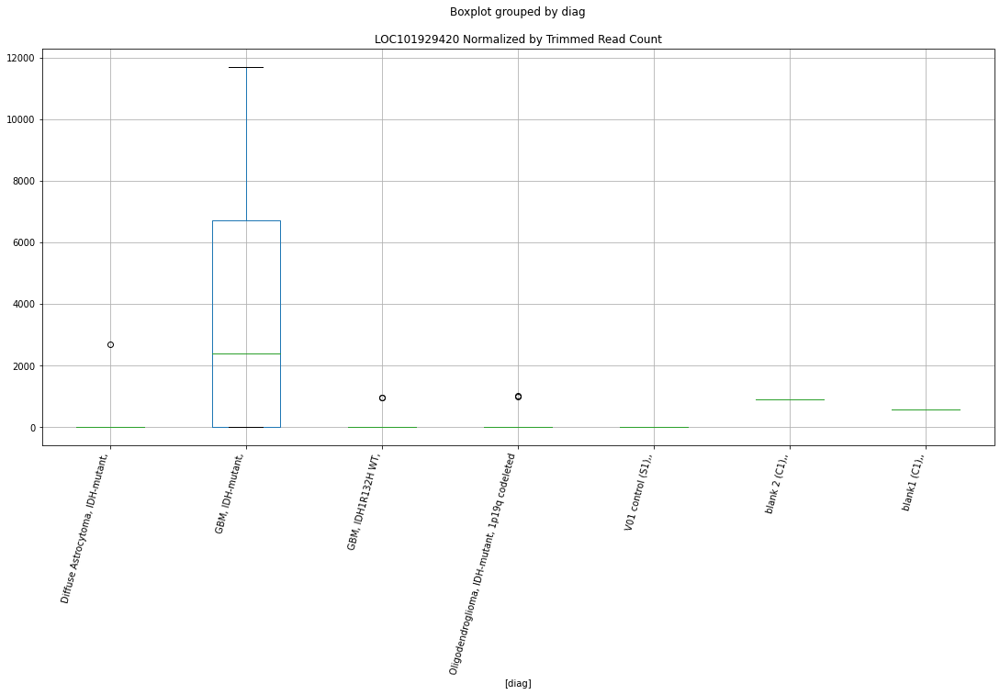

 p : 0.02241497691601362  ( t : 2.4976986095373794 ) :  D-plex  :  cutadapt2  :  LGR4-AS1
Control and blanks
76     0.0
340    0.0
Name: LGR4-AS1, dtype: float64
208    3174.48
Name: LGR4-AS1, dtype: float64
472    0.0
Name: LGR4-AS1, dtype: float64


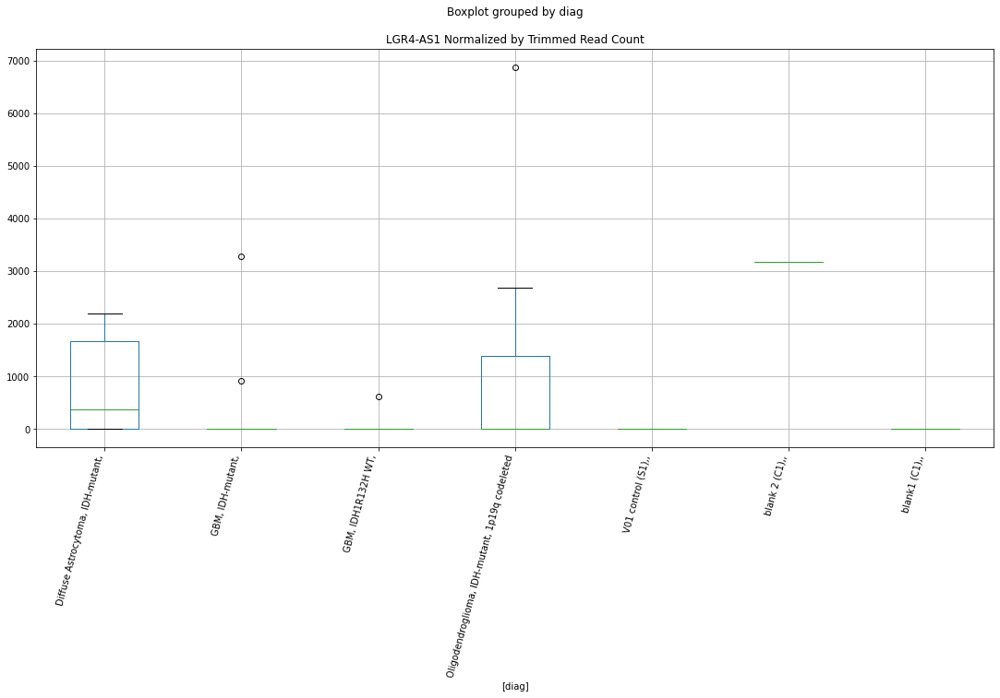

 p : 0.022486558446232898  ( t : 2.496164159779672 ) :  Lexogen  :  bbduk2  :  LIPE-AS1
Control and blanks
79     0.0
343    0.0
Name: LIPE-AS1, dtype: float64
211    0.0
Name: LIPE-AS1, dtype: float64
475    0.0
Name: LIPE-AS1, dtype: float64


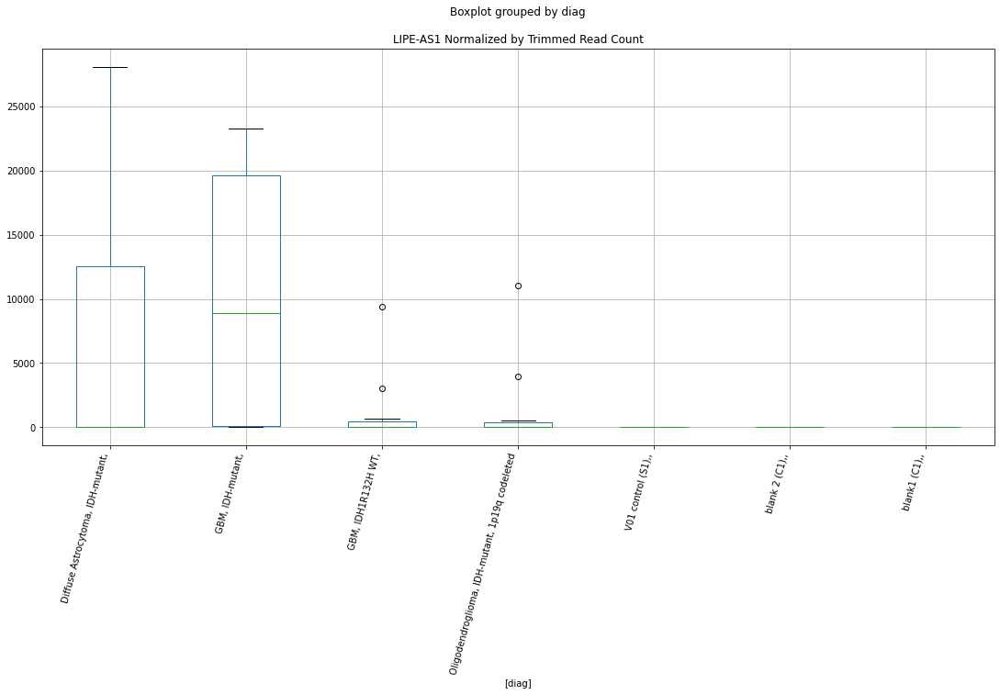

 p : 0.022733833463360005  ( t : 2.490898646208706 ) :  D-plex  :  cutadapt2  :  LINC02331
Control and blanks
76     0.0
340    0.0
Name: LINC02331, dtype: float64
208    705.44
Name: LINC02331, dtype: float64
472    4623.65
Name: LINC02331, dtype: float64


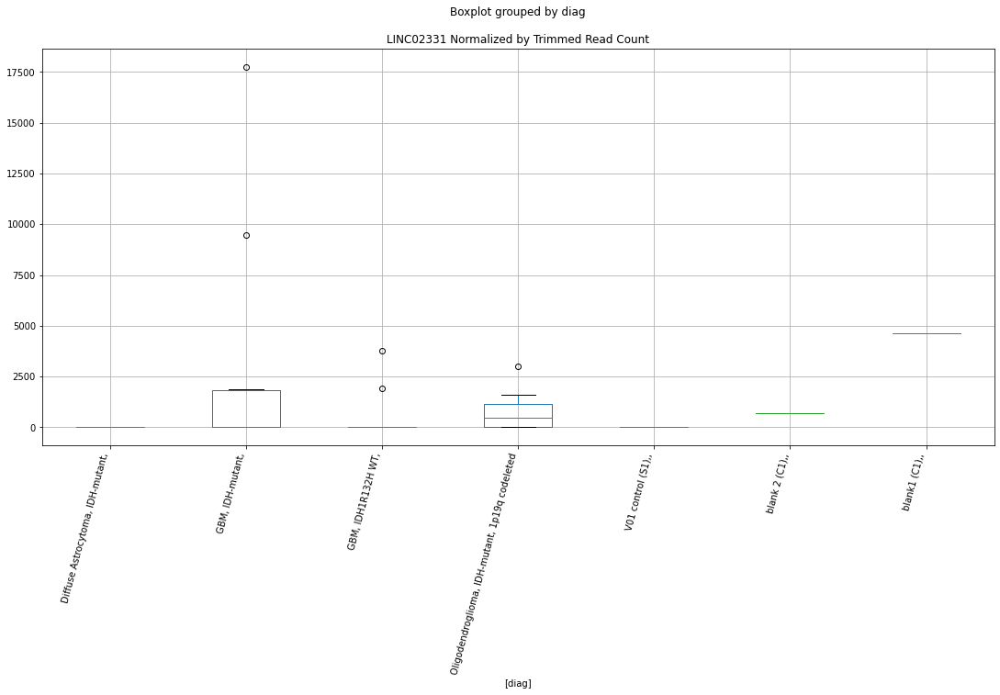

 p : 0.022760211176498964  ( t : 2.4903401426094884 ) :  D-plex  :  cutadapt2  :  LOC100128494
Control and blanks
76     1515.23
340     880.73
Name: LOC100128494, dtype: float64
208    7230.77
Name: LOC100128494, dtype: float64
472    9247.29
Name: LOC100128494, dtype: float64


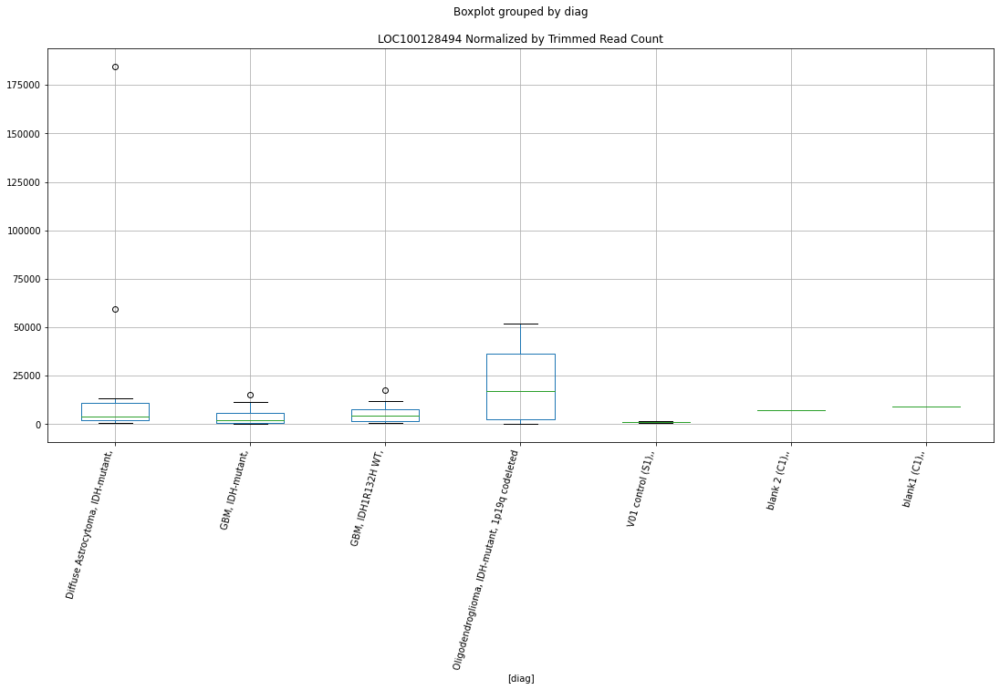

 p : 0.022823640821583058  ( t : 2.488999617846829 ) :  D-plex  :  bbduk2  :  LOC105371241
Control and blanks
73     0.0
337    0.0
Name: LOC105371241, dtype: float64
205    358.18
Name: LOC105371241, dtype: float64
469    1183.05
Name: LOC105371241, dtype: float64


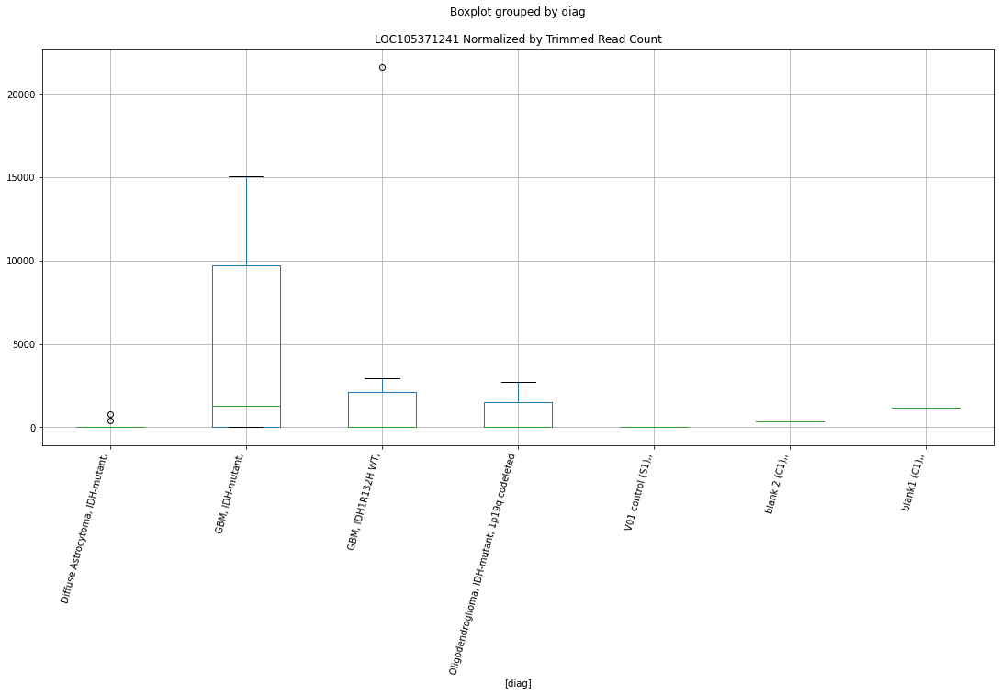

 p : 0.022960567502539216  ( t : 2.486117722177815 ) :  Lexogen  :  cutadapt2  :  LINC02700
Control and blanks
82     0.0
346    0.0
Name: LINC02700, dtype: float64
214    0.0
Name: LINC02700, dtype: float64
478    0.0
Name: LINC02700, dtype: float64


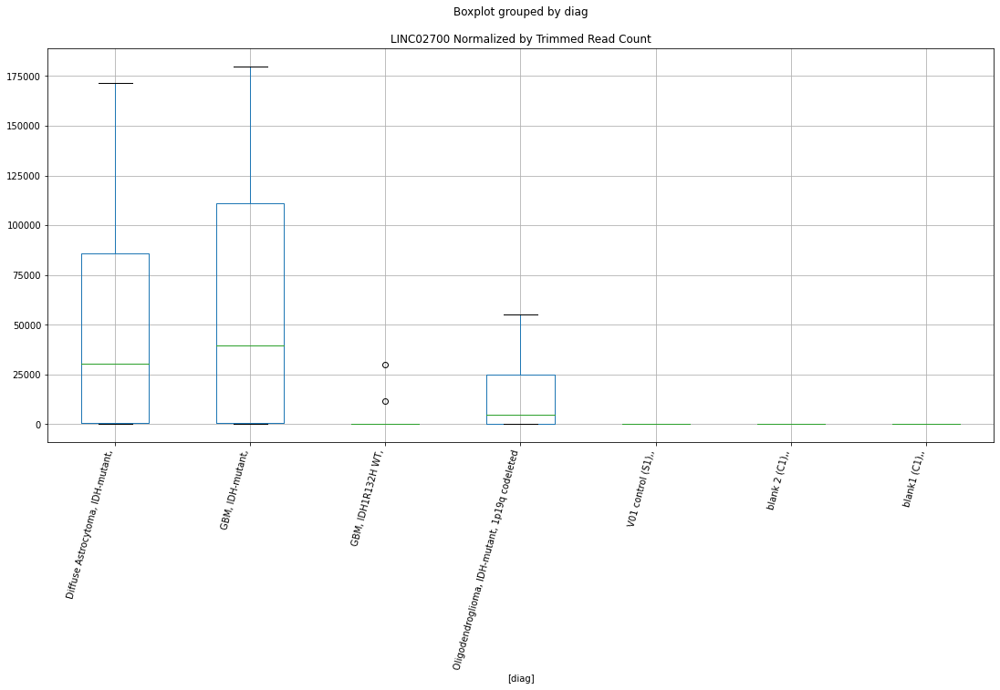

 p : 0.02299276329562557  ( t : 2.485442447113687 ) :  D-plex  :  cutadapt2  :  LGR6
Control and blanks
76     477296.95
340         0.00
Name: LGR6, dtype: float64
208    69485.93
Name: LGR6, dtype: float64
472    95362.71
Name: LGR6, dtype: float64


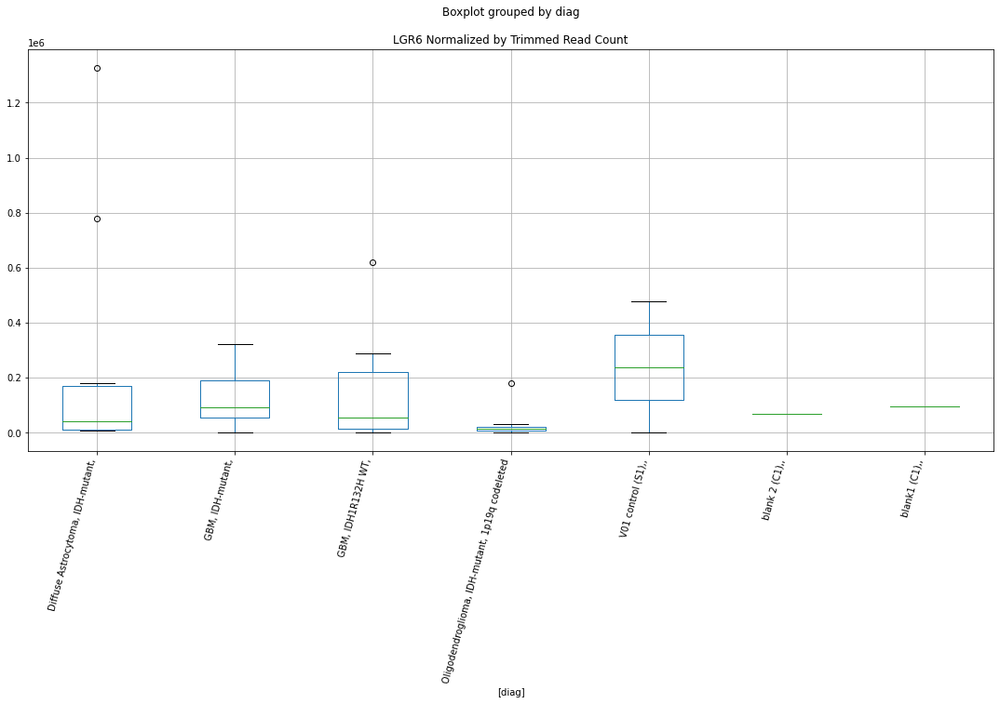

 p : 0.02302361359061379  ( t : 2.4847962270782307 ) :  Lexogen  :  cutadapt2  :  LINC02308
Control and blanks
82     0.0
346    0.0
Name: LINC02308, dtype: float64
214    0.0
Name: LINC02308, dtype: float64
478    0.0
Name: LINC02308, dtype: float64


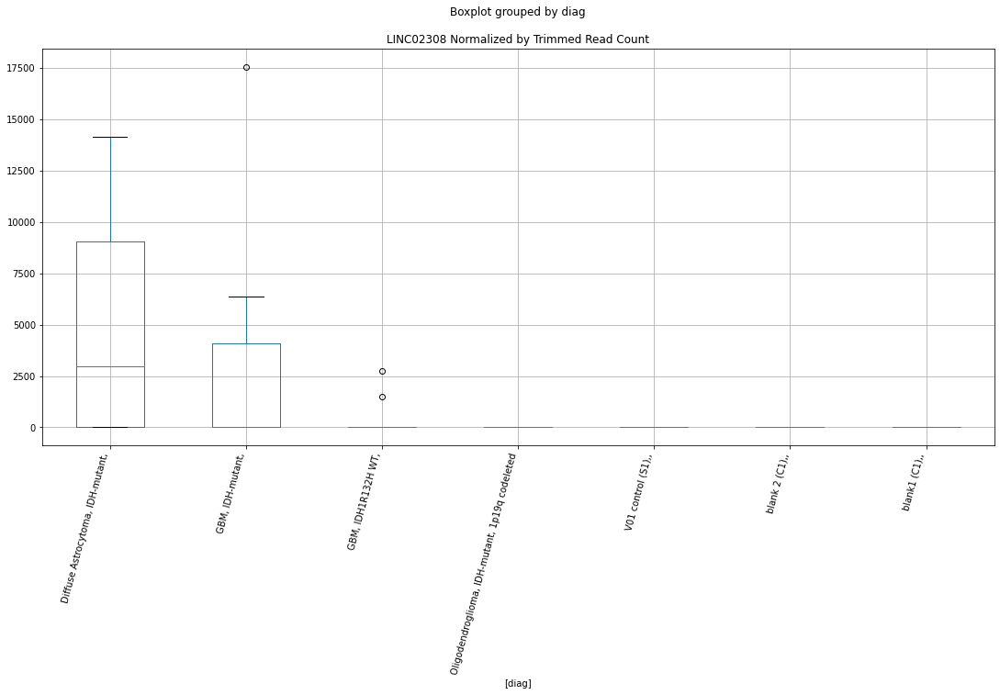

 p : 0.023036103221800483  ( t : 2.484534838967991 ) :  D-plex  :  bbduk2  :  LINC00971
Control and blanks
73     0.0
337    0.0
Name: LINC00971, dtype: float64
205    59100.01
Name: LINC00971, dtype: float64
469    14196.66
Name: LINC00971, dtype: float64


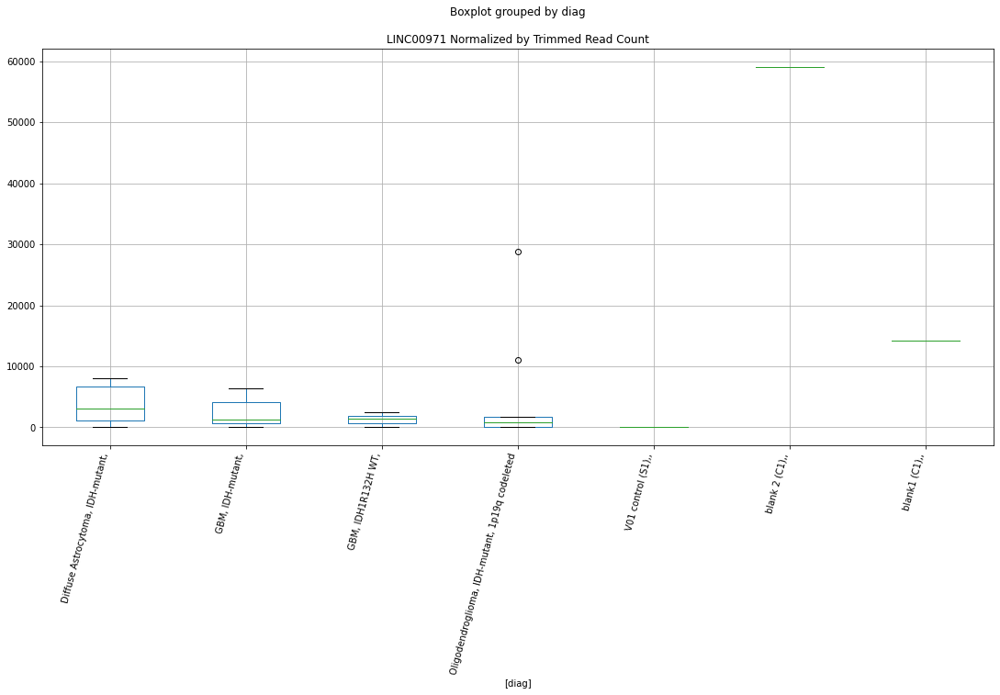

 p : 0.02311775691812991  ( t : 2.482829236437682 ) :  Lexogen  :  bbduk2  :  LOC105371253
Control and blanks
79     0.0
343    0.0
Name: LOC105371253, dtype: float64
211    546.61
Name: LOC105371253, dtype: float64
475    0.0
Name: LOC105371253, dtype: float64


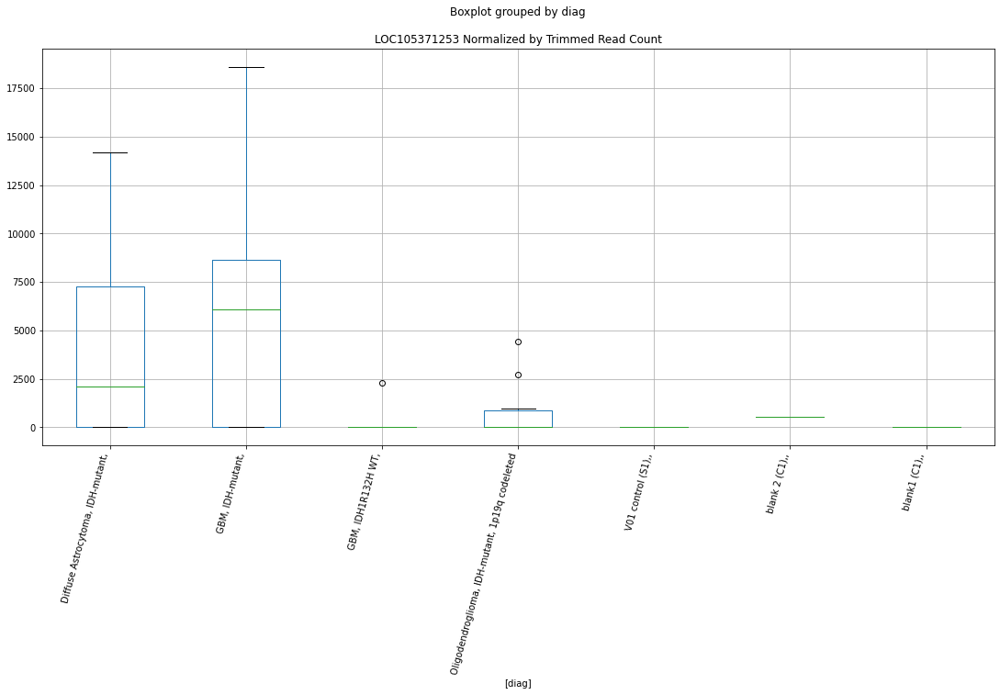

 p : 0.02323569630698583  ( t : 2.4803756712704463 ) :  D-plex  :  bbduk2  :  LOC100128494
Control and blanks
73     1546.02
337     890.16
Name: LOC100128494, dtype: float64
205    7342.73
Name: LOC100128494, dtype: float64
469    9464.44
Name: LOC100128494, dtype: float64


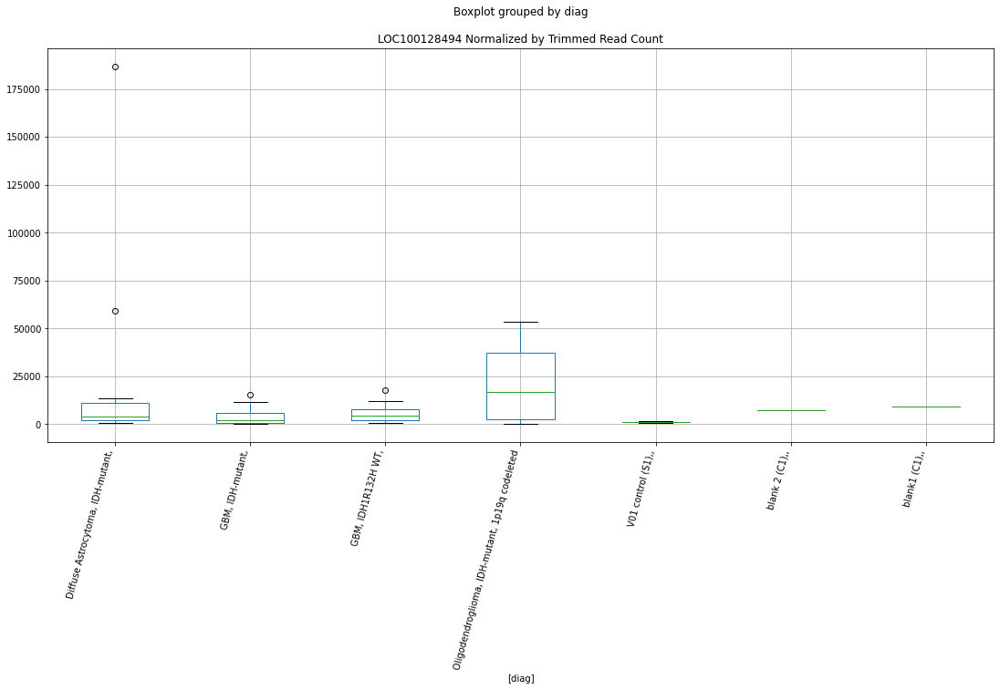

 p : 0.02325555763642372  ( t : 2.479963637227487 ) :  D-plex  :  bbduk2  :  LINC02331
Control and blanks
73     0.0
337    0.0
Name: LINC02331, dtype: float64
205    716.36
Name: LINC02331, dtype: float64
469    4732.22
Name: LINC02331, dtype: float64


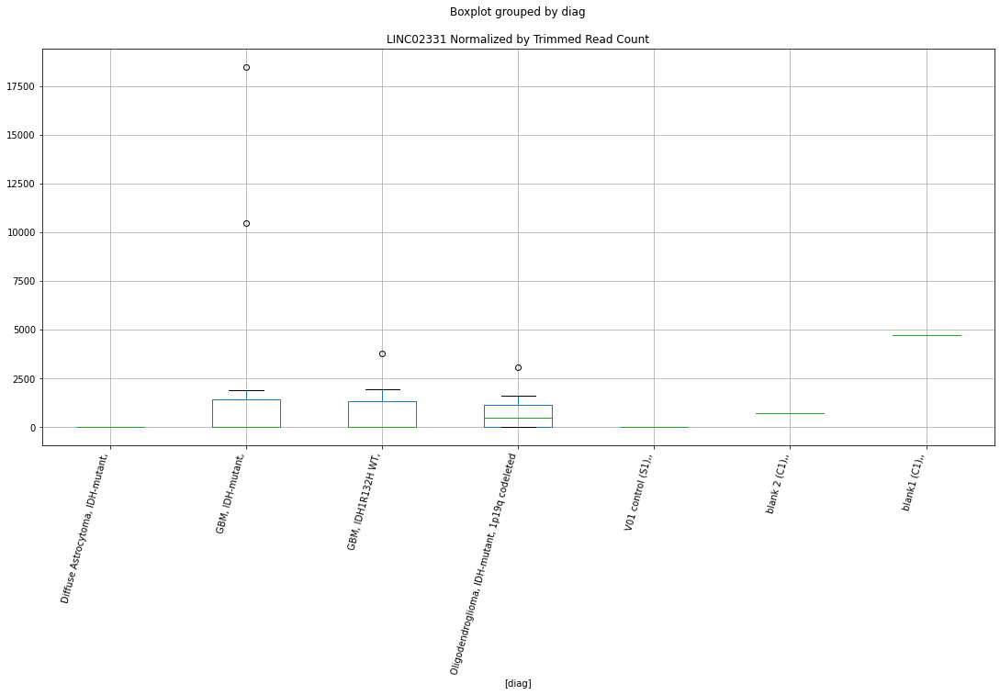

 p : 0.023312797681226387  ( t : 2.4787780109630373 ) :  Lexogen  :  bbduk2  :  LINC02308
Control and blanks
79     0.0
343    0.0
Name: LINC02308, dtype: float64
211    0.0
Name: LINC02308, dtype: float64
475    239.52
Name: LINC02308, dtype: float64


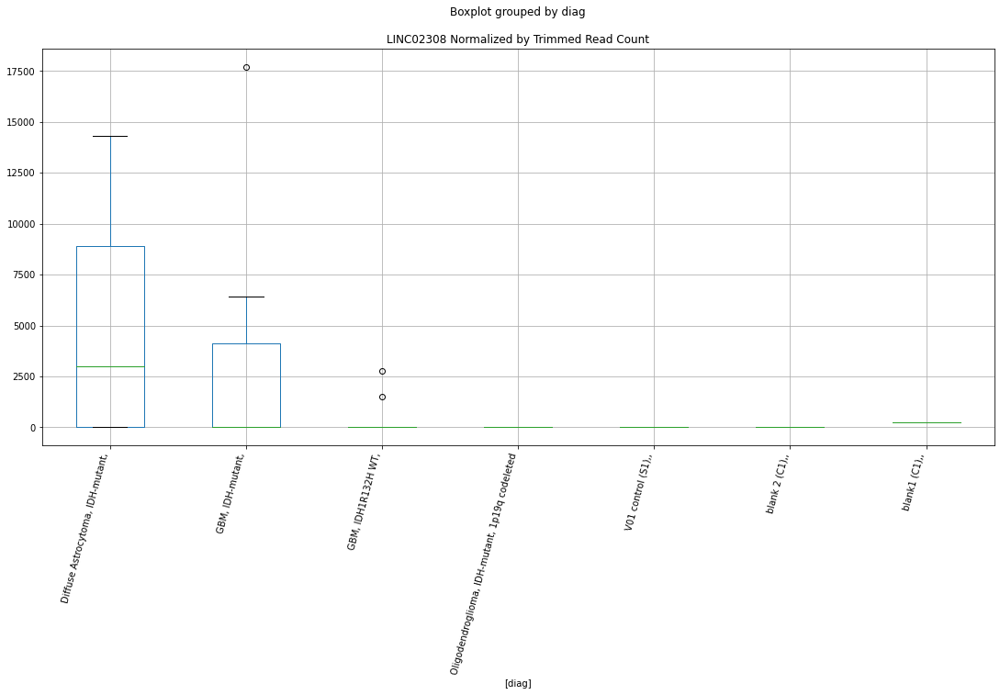

 p : 0.02347633009995702  ( t : 2.4754057537292846 ) :  D-plex  :  cutadapt2  :  LINC02848
Control and blanks
76     0.0
340    0.0
Name: LINC02848, dtype: float64
208    1587.24
Name: LINC02848, dtype: float64
472    0.0
Name: LINC02848, dtype: float64


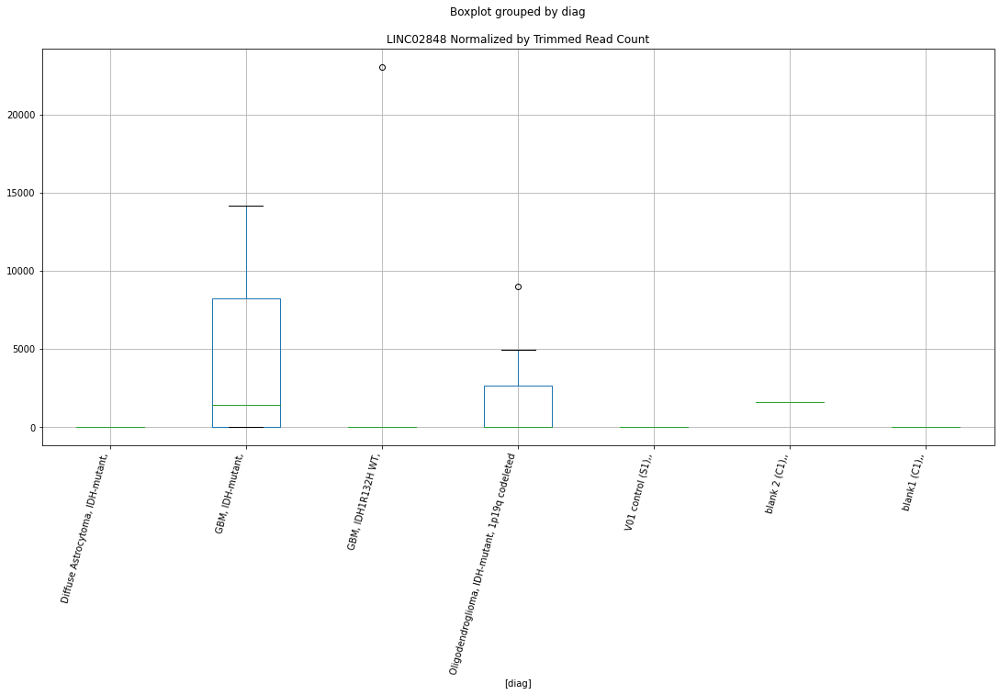

 p : 0.02364644582491649  ( t : 2.4719211066838582 ) :  D-plex  :  cutadapt2  :  LOC101928077
Control and blanks
76     0.0
340    0.0
Name: LOC101928077, dtype: float64
208    0.0
Name: LOC101928077, dtype: float64
472    0.0
Name: LOC101928077, dtype: float64


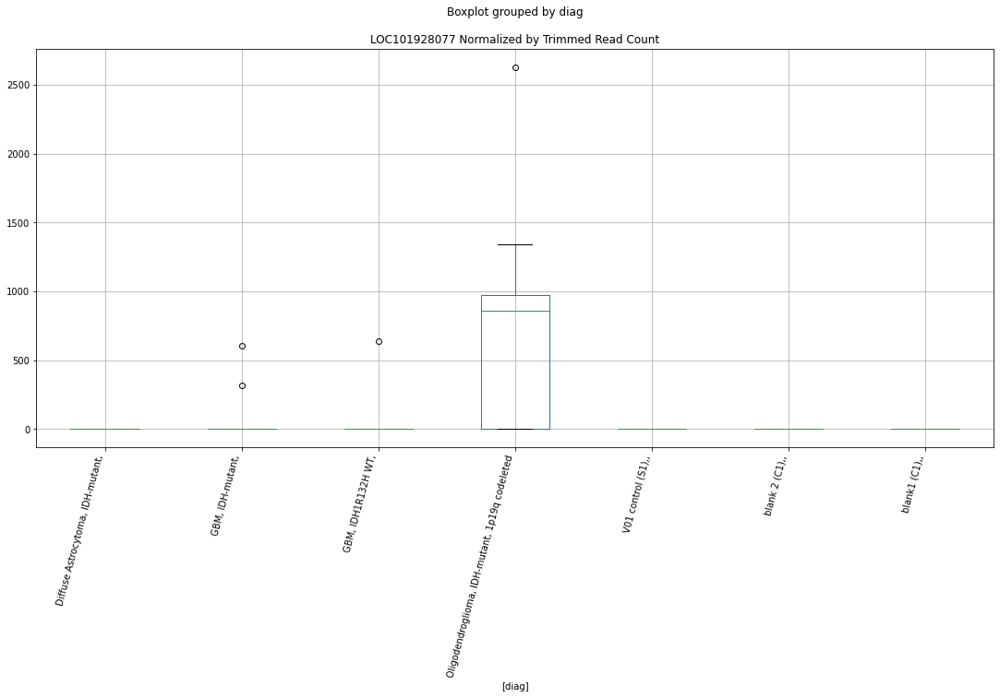

 p : 0.02375022228597069  ( t : 2.4698069108870104 ) :  D-plex  :  cutadapt2  :  LINC02812
Control and blanks
76        0.00
340    8807.32
Name: LINC02812, dtype: float64
208    352.72
Name: LINC02812, dtype: float64
472    0.0
Name: LINC02812, dtype: float64


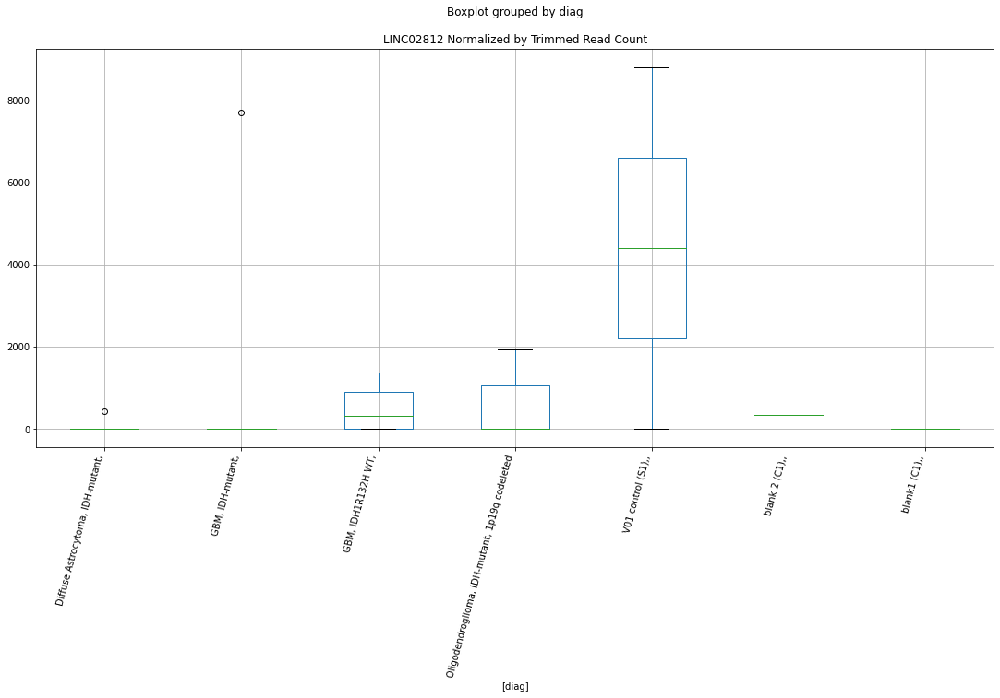

 p : 0.02379326692922139  ( t : 2.468932527329503 ) :  Lexogen  :  cutadapt2  :  LOC102724859
Control and blanks
82     29821.07
346    61867.75
Name: LOC102724859, dtype: float64
214    5695.76
Name: LOC102724859, dtype: float64
478    0.0
Name: LOC102724859, dtype: float64


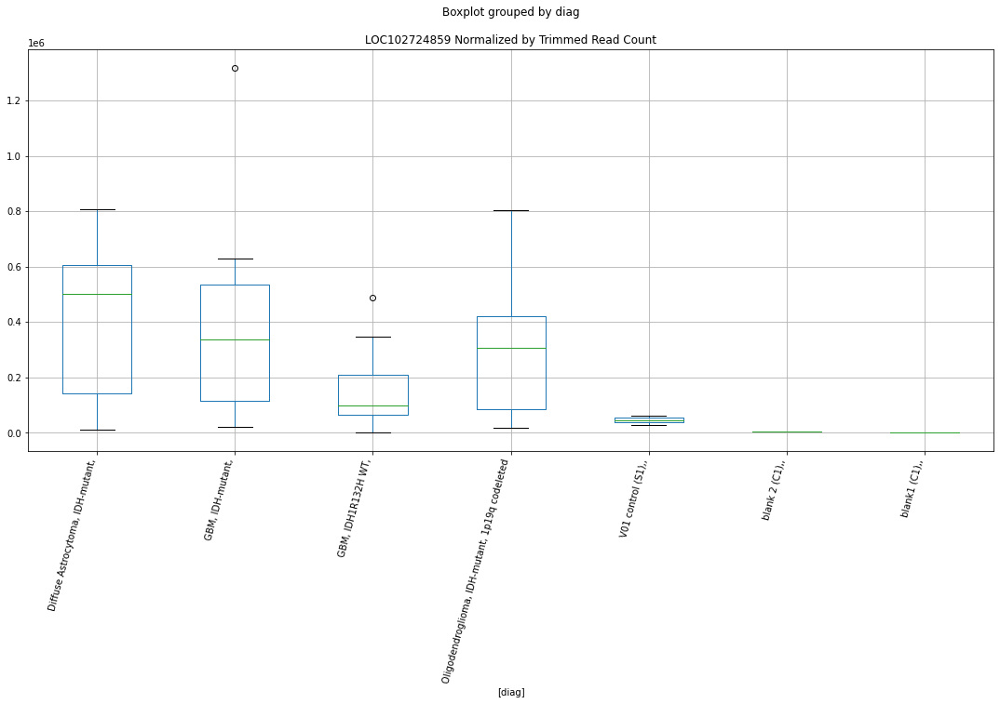

 p : 0.024232483764130303  ( t : 2.460094550035607 ) :  D-plex  :  cutadapt2  :  LOC101928152
Control and blanks
76     0.0
340    0.0
Name: LOC101928152, dtype: float64
208    352.72
Name: LOC101928152, dtype: float64
472    0.0
Name: LOC101928152, dtype: float64


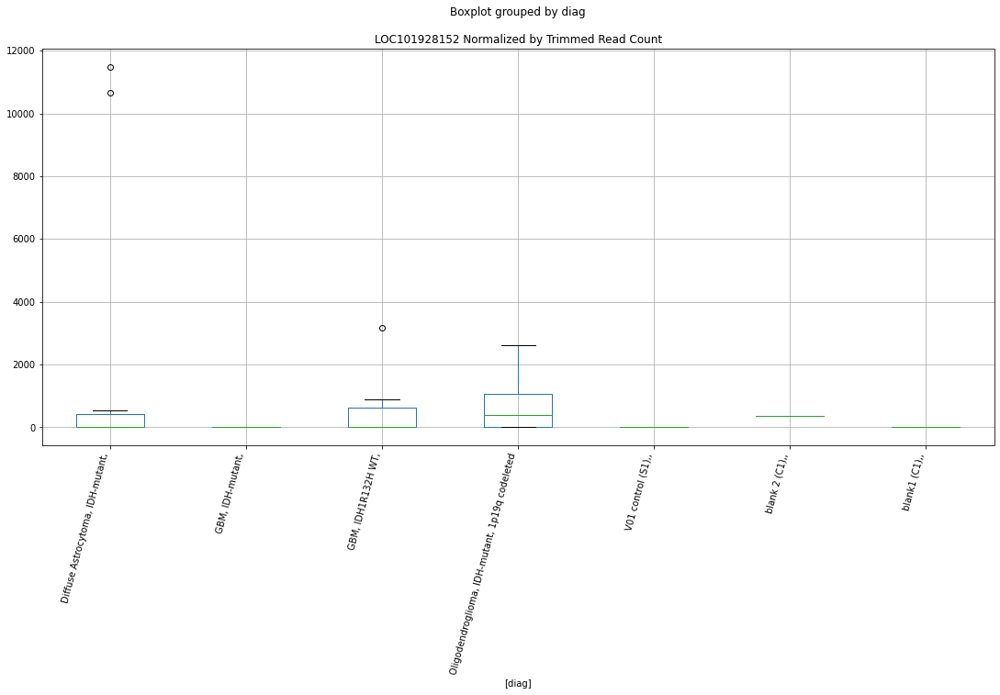

 p : 0.024408093051158267  ( t : 2.456602977880363 ) :  D-plex  :  bbduk2  :  LOC101928608
Control and blanks
73     0.0
337    0.0
Name: LOC101928608, dtype: float64
205    1790.91
Name: LOC101928608, dtype: float64
469    23661.09
Name: LOC101928608, dtype: float64


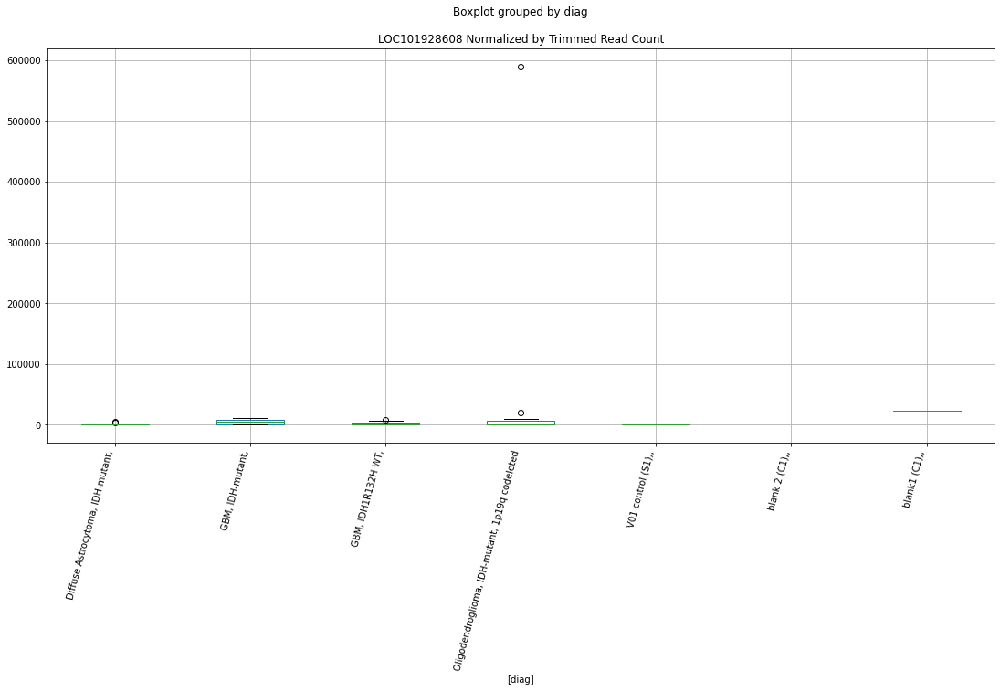

 p : 0.024630644196087438  ( t : 2.4522118208176447 ) :  D-plex  :  cutadapt2  :  LOC100507560
Control and blanks
76     0.0
340    0.0
Name: LOC100507560, dtype: float64
208    2116.32
Name: LOC100507560, dtype: float64
472    6935.47
Name: LOC100507560, dtype: float64


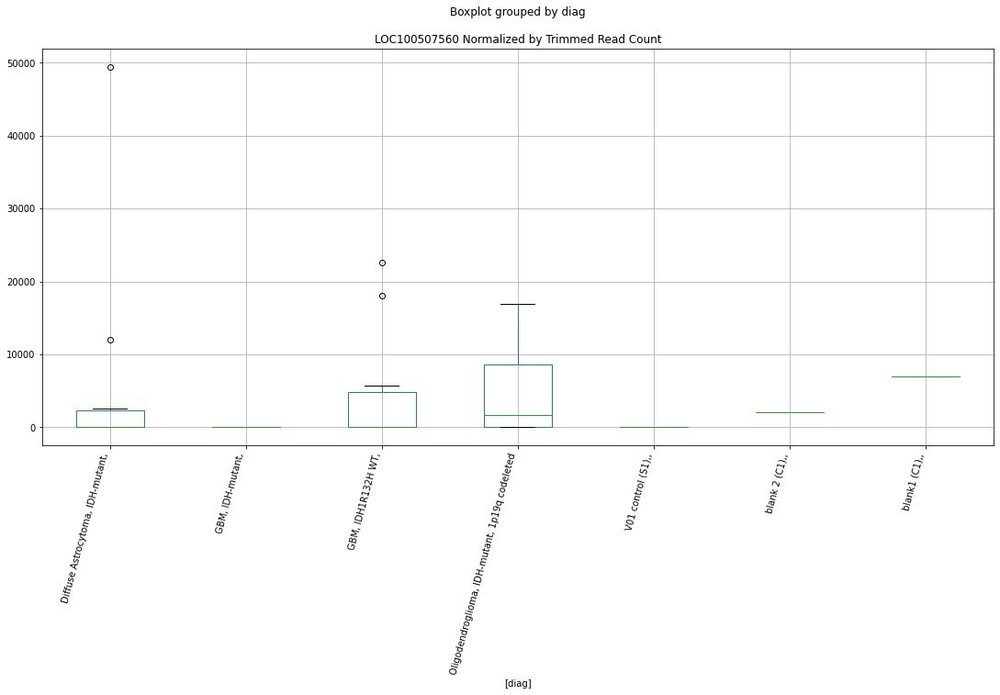

 p : 0.024638052443124222  ( t : 2.452066290339922 ) :  Lexogen  :  cutadapt2  :  LIPE-AS1
Control and blanks
82     0.0
346    0.0
Name: LIPE-AS1, dtype: float64
214    0.0
Name: LIPE-AS1, dtype: float64
478    0.0
Name: LIPE-AS1, dtype: float64


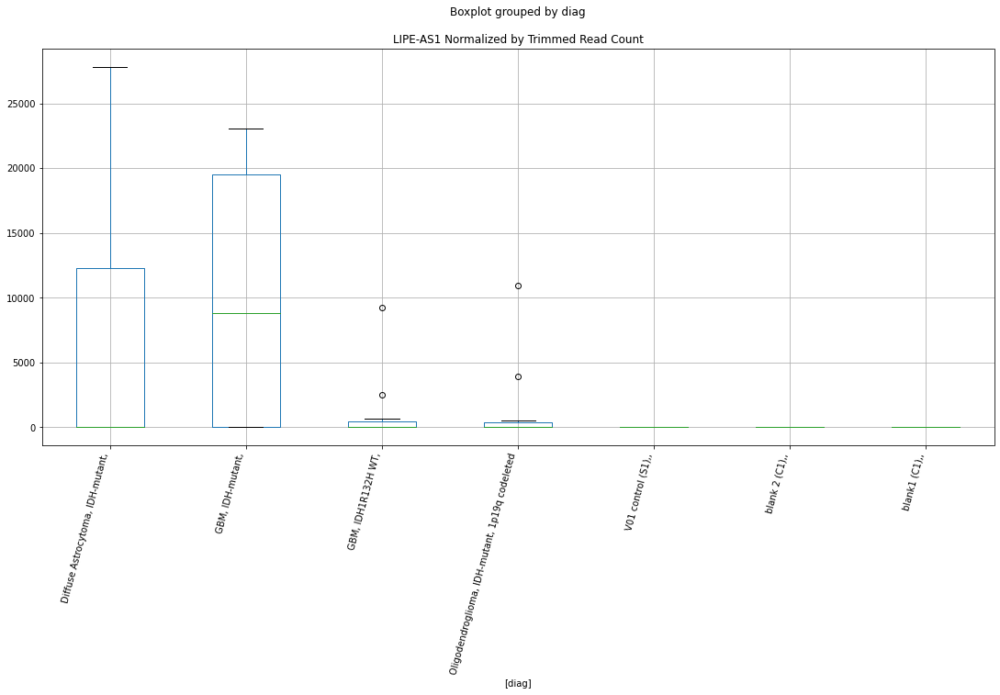

 p : 0.024677681094657015  ( t : 2.451288506760114 ) :  Lexogen  :  bbduk2  :  LINC002481
Control and blanks
79     0.0
343    0.0
Name: LINC002481, dtype: float64
211    0.0
Name: LINC002481, dtype: float64
475    239.52
Name: LINC002481, dtype: float64


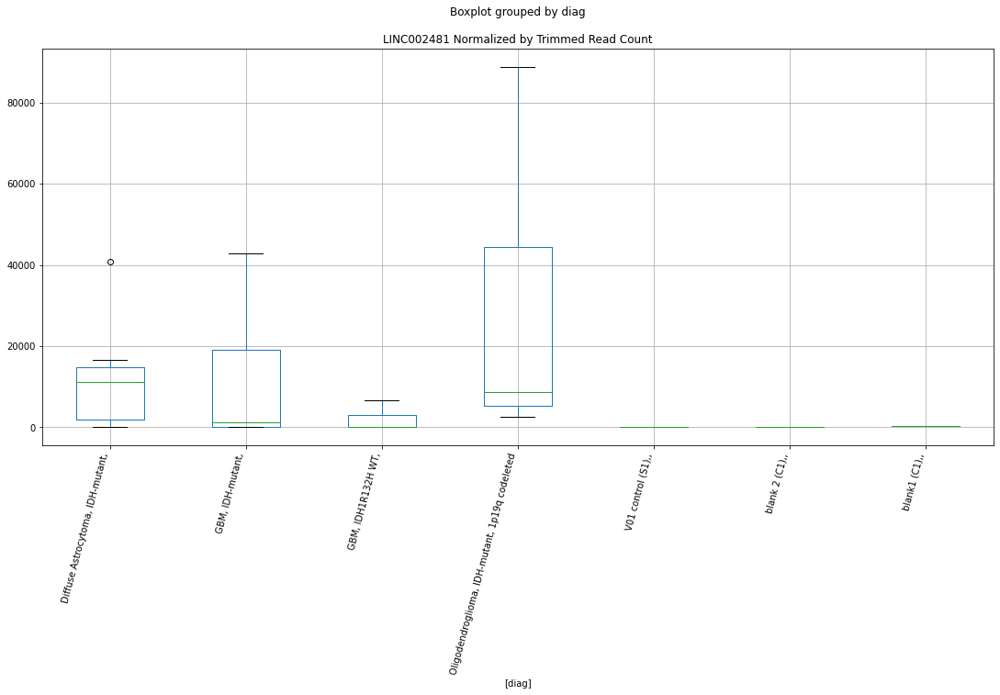

 p : 0.024741718644297  ( t : 2.450034129675083 ) :  D-plex  :  bbduk2  :  LOC105370094
Control and blanks
73     0.0
337    0.0
Name: LOC105370094, dtype: float64
205    3760.91
Name: LOC105370094, dtype: float64
469    4140.69
Name: LOC105370094, dtype: float64


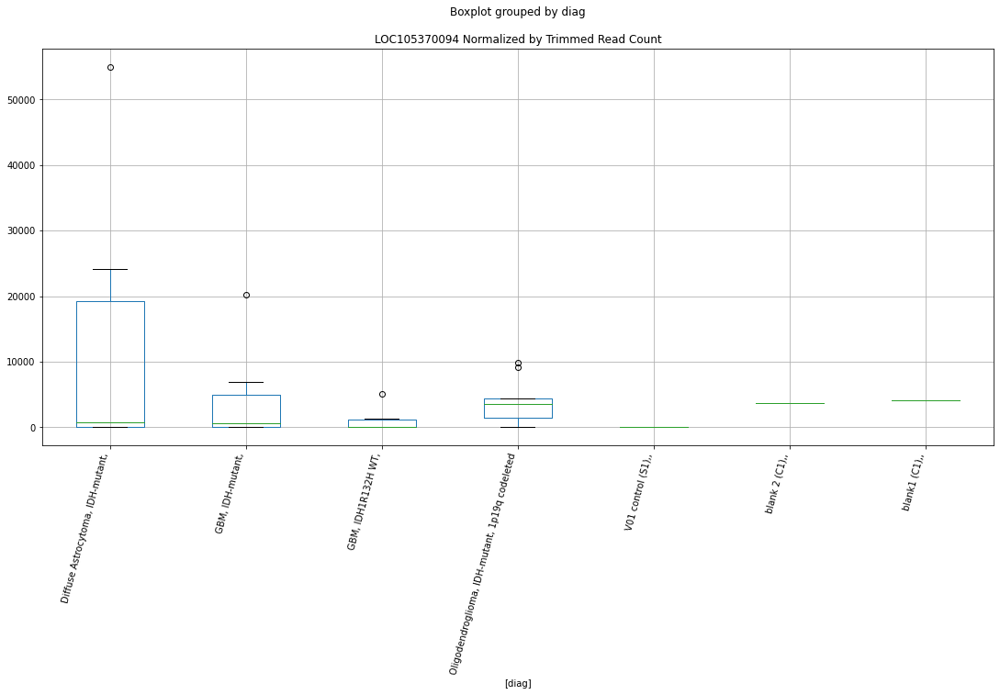

 p : 0.02477475207790683  ( t : 2.4493882570023002 ) :  Lexogen  :  cutadapt2  :  LINC002481
Control and blanks
82     0.0
346    0.0
Name: LINC002481, dtype: float64
214    0.0
Name: LINC002481, dtype: float64
478    0.0
Name: LINC002481, dtype: float64


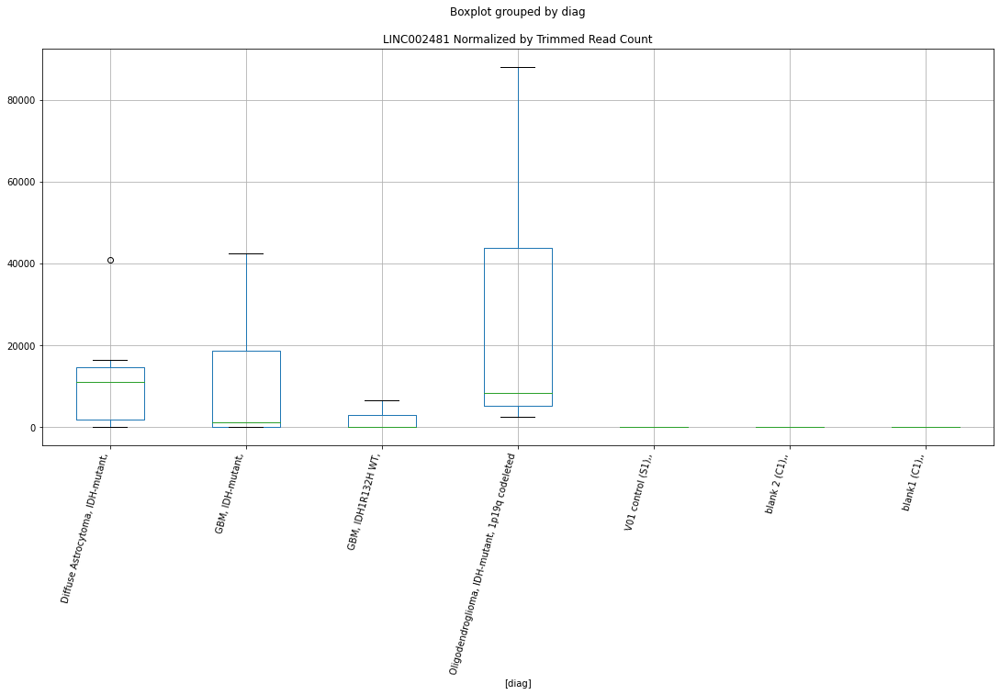

 p : 0.024782132335582477  ( t : 2.4492440680274288 ) :  D-plex  :  cutadapt2  :  LINC01868
Control and blanks
76        0.00
340    1761.46
Name: LINC01868, dtype: float64
208    1058.16
Name: LINC01868, dtype: float64
472    2311.82
Name: LINC01868, dtype: float64


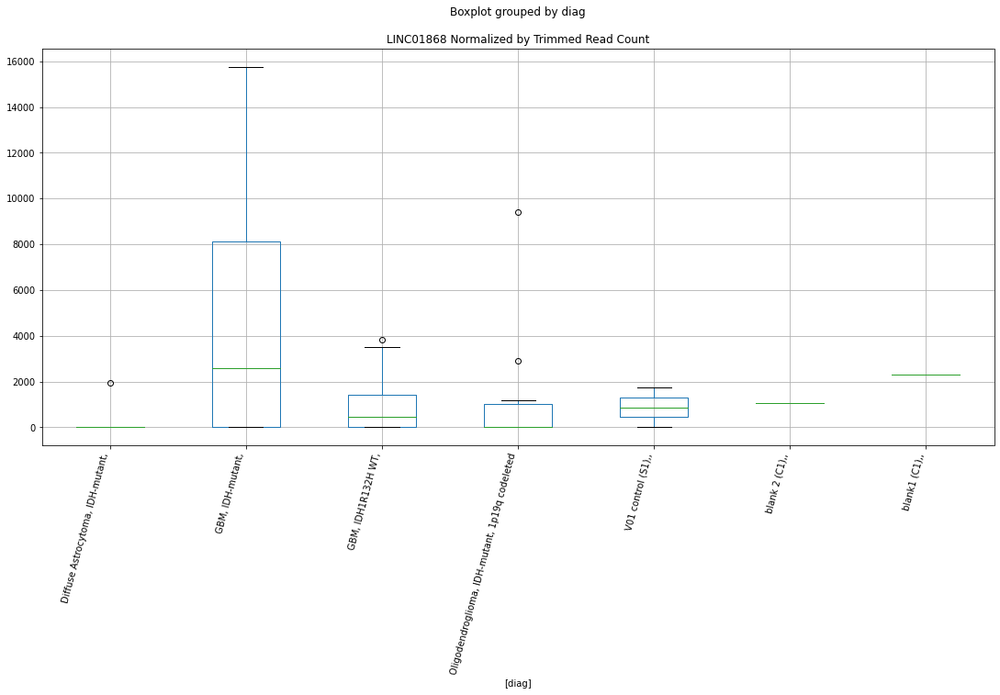

 p : 0.02502688807989409  ( t : 2.444484934289879 ) :  D-plex  :  bbduk2  :  LINC01145
Control and blanks
73     0.0
337    0.0
Name: LINC01145, dtype: float64
205    4835.46
Name: LINC01145, dtype: float64
469    13013.6
Name: LINC01145, dtype: float64


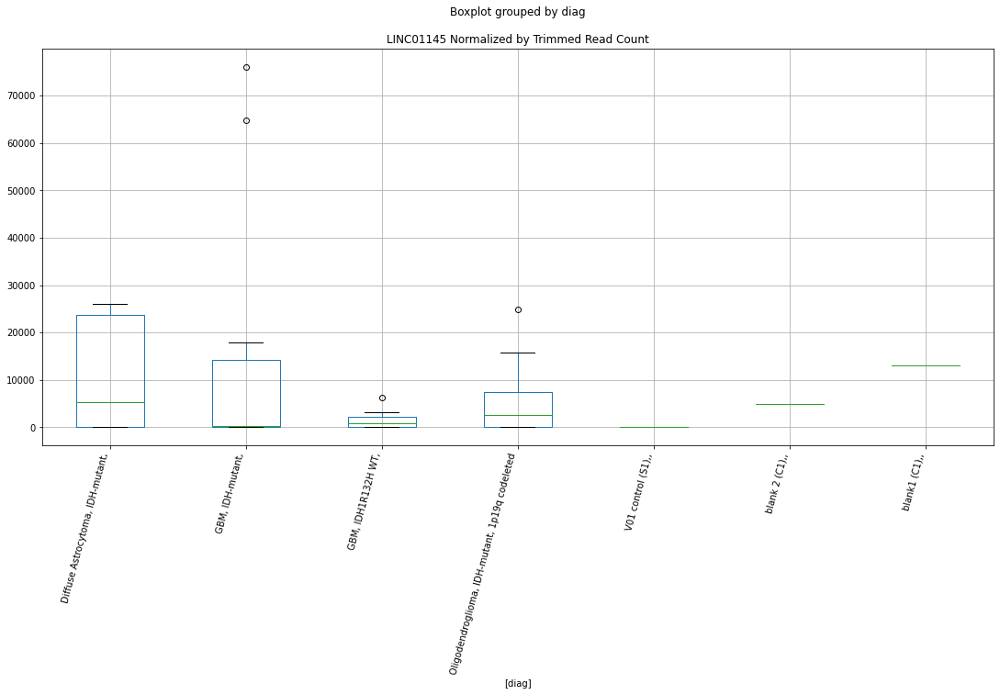

 p : 0.025187483310352567  ( t : 2.441385927020752 ) :  D-plex  :  cutadapt2  :  LOC105371241
Control and blanks
76     0.0
340    0.0
Name: LOC105371241, dtype: float64
208    176.36
Name: LOC105371241, dtype: float64
472    577.96
Name: LOC105371241, dtype: float64


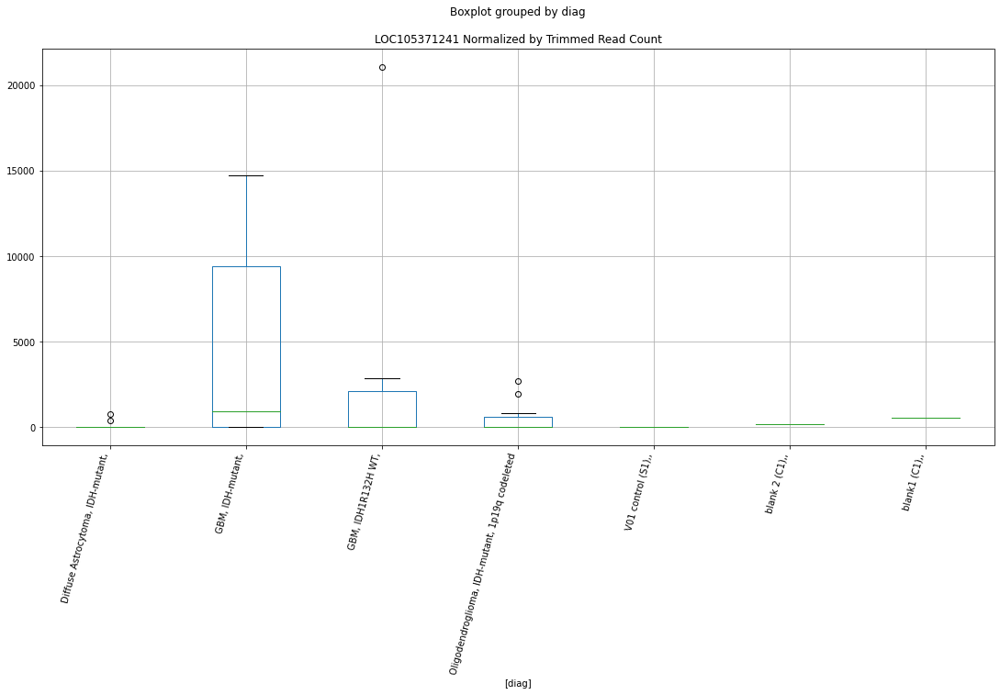

 p : 0.02518937614355012  ( t : 2.4413495116634767 ) :  D-plex  :  cutadapt2  :  LOC101929165
Control and blanks
76     0.0
340    0.0
Name: LOC101929165, dtype: float64
208    352.72
Name: LOC101929165, dtype: float64
472    3467.74
Name: LOC101929165, dtype: float64


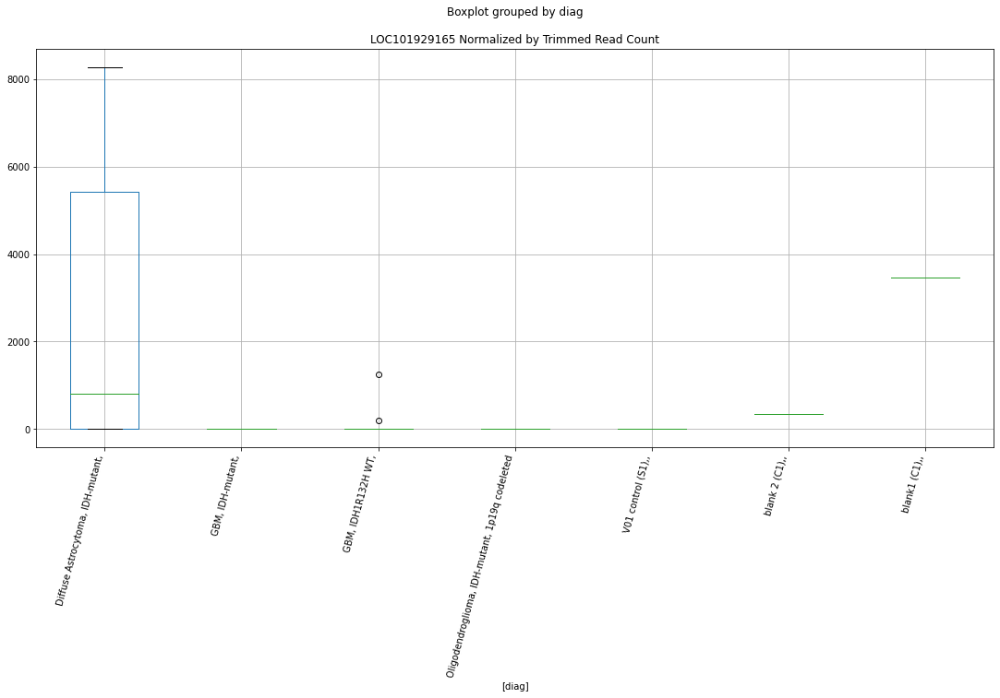

 p : 0.02521161989946159  ( t : 2.4409217663910363 ) :  Lexogen  :  bbduk2  :  LOC101927963
Control and blanks
79     0.0
343    0.0
Name: LOC101927963, dtype: float64
211    0.0
Name: LOC101927963, dtype: float64
475    0.0
Name: LOC101927963, dtype: float64


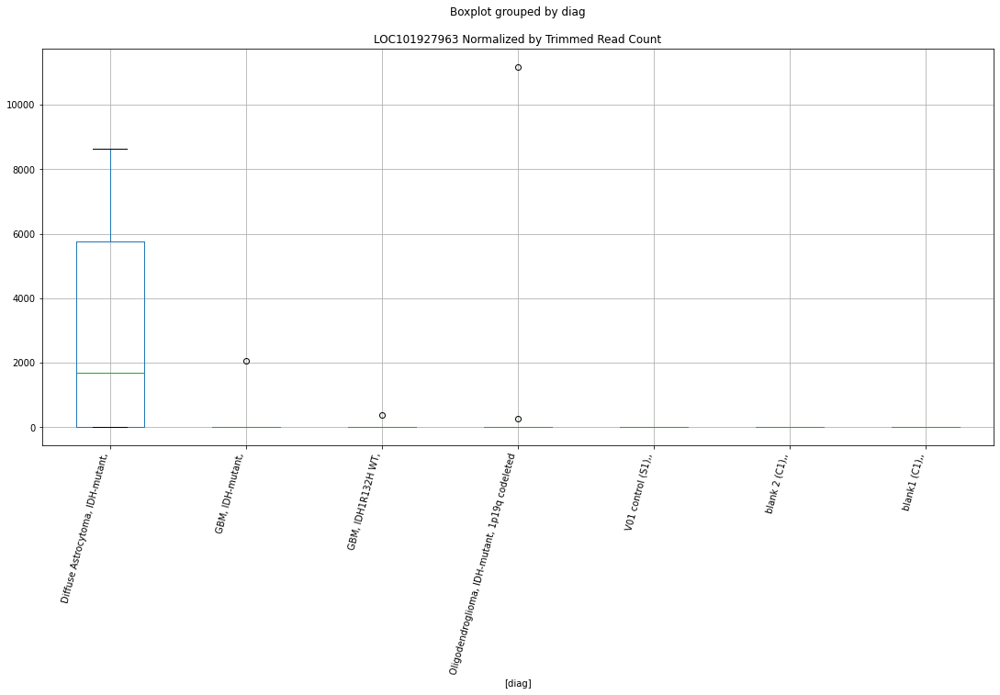

 p : 0.025228351569612614  ( t : 2.440600251239178 ) :  Lexogen  :  cutadapt2  :  LOC101927963
Control and blanks
82     0.0
346    0.0
Name: LOC101927963, dtype: float64
214    0.0
Name: LOC101927963, dtype: float64
478    0.0
Name: LOC101927963, dtype: float64


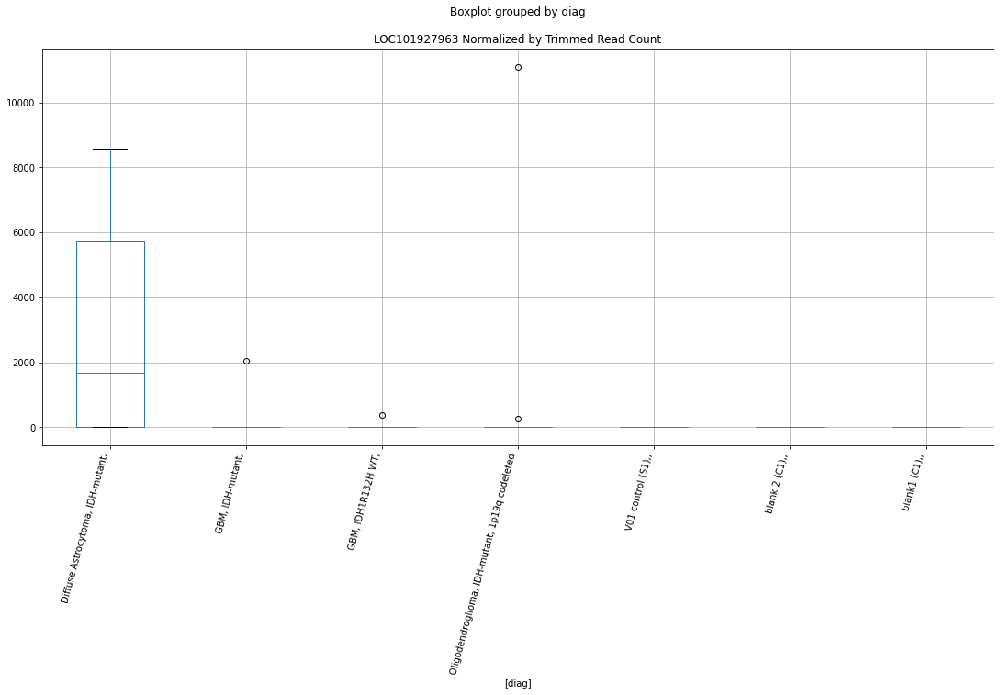

 p : 0.025647245500202177  ( t : 2.432615298136154 ) :  D-plex  :  cutadapt2  :  LOC101929420
Control and blanks
76     0.0
340    0.0
Name: LOC101929420, dtype: float64
208    881.8
Name: LOC101929420, dtype: float64
472    577.96
Name: LOC101929420, dtype: float64


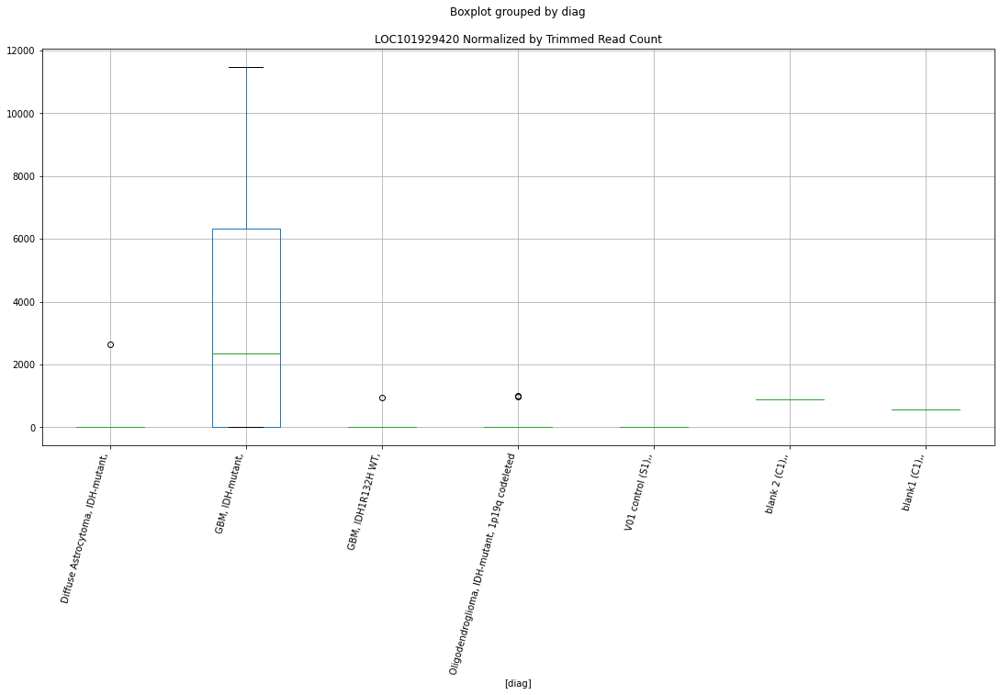

 p : 0.025815851822517364  ( t : 2.4294357944877834 ) :  D-plex  :  bbduk2  :  LINC00909
Control and blanks
73     773.01
337      0.00
Name: LINC00909, dtype: float64
205    1611.82
Name: LINC00909, dtype: float64
469    1774.58
Name: LINC00909, dtype: float64


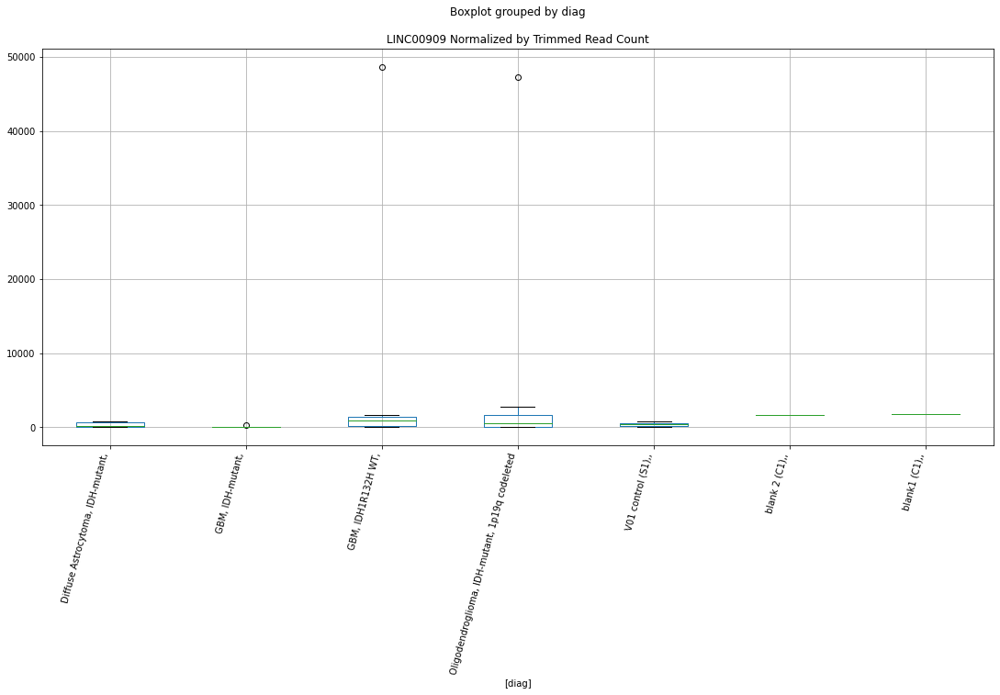

 p : 0.026055667475248078  ( t : 2.42494682303626 ) :  D-plex  :  bbduk2  :  LOC101929165
Control and blanks
73     0.0
337    0.0
Name: LOC101929165, dtype: float64
205    358.18
Name: LOC101929165, dtype: float64
469    3549.16
Name: LOC101929165, dtype: float64


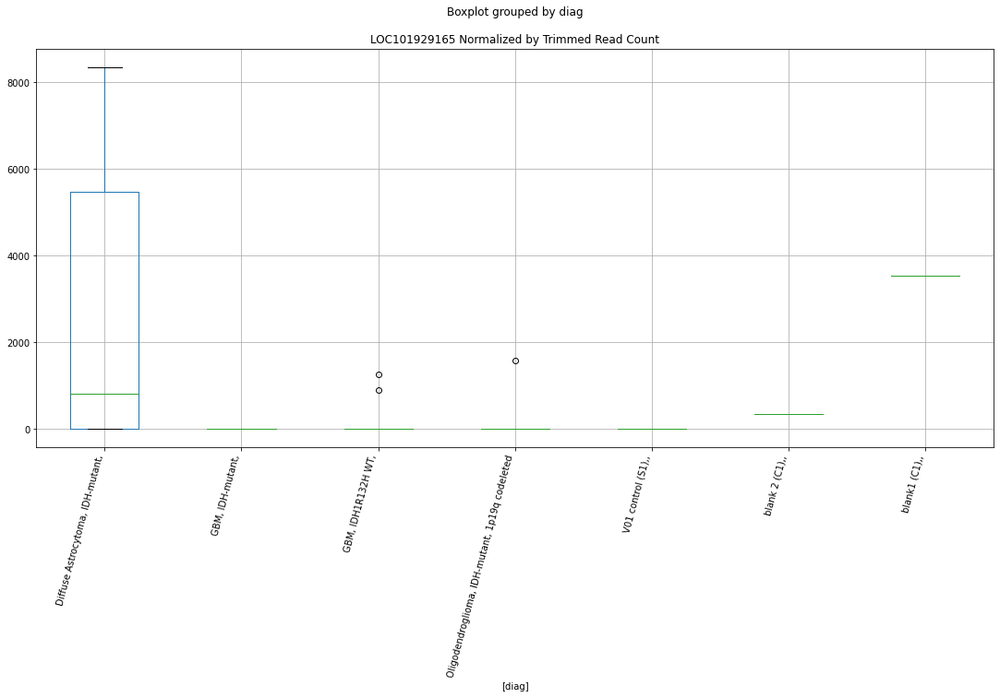

 p : 0.026478776813387537  ( t : 2.4171204458569493 ) :  Lexogen  :  bbduk2  :  LOC105371763
Control and blanks
79     0.0
343    0.0
Name: LOC105371763, dtype: float64
211    0.0
Name: LOC105371763, dtype: float64
475    0.0
Name: LOC105371763, dtype: float64


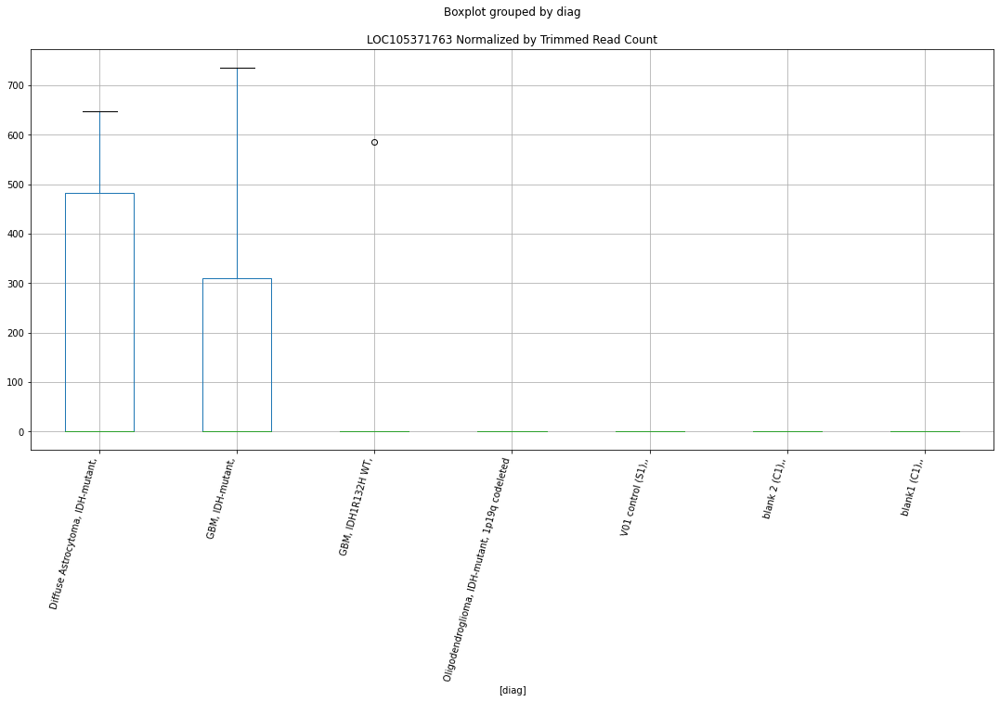

 p : 0.02648517082683209  ( t : 2.417003074693187 ) :  D-plex  :  bbduk2  :  LOC101060553
Control and blanks
73     773.01
337      0.00
Name: LOC101060553, dtype: float64
205    895.45
Name: LOC101060553, dtype: float64
469    591.53
Name: LOC101060553, dtype: float64


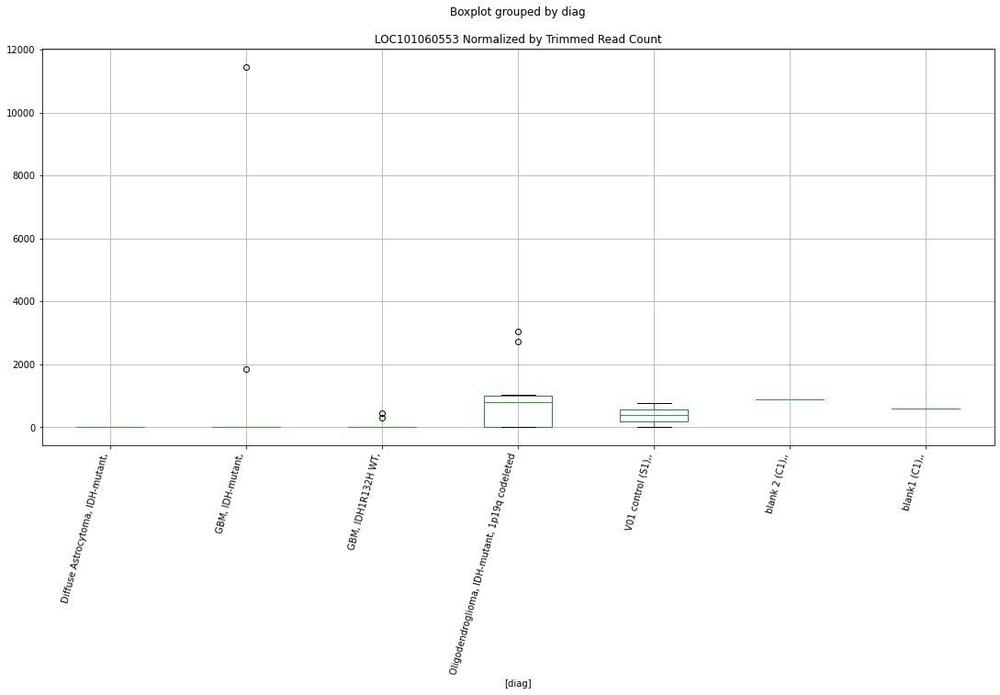

 p : 0.026611435828777733  ( t : 2.4146907202611403 ) :  Lexogen  :  bbduk2  :  LINC00540
Control and blanks
79     1430.60
343    2760.09
Name: LINC00540, dtype: float64
211    3279.68
Name: LINC00540, dtype: float64
475    2874.19
Name: LINC00540, dtype: float64


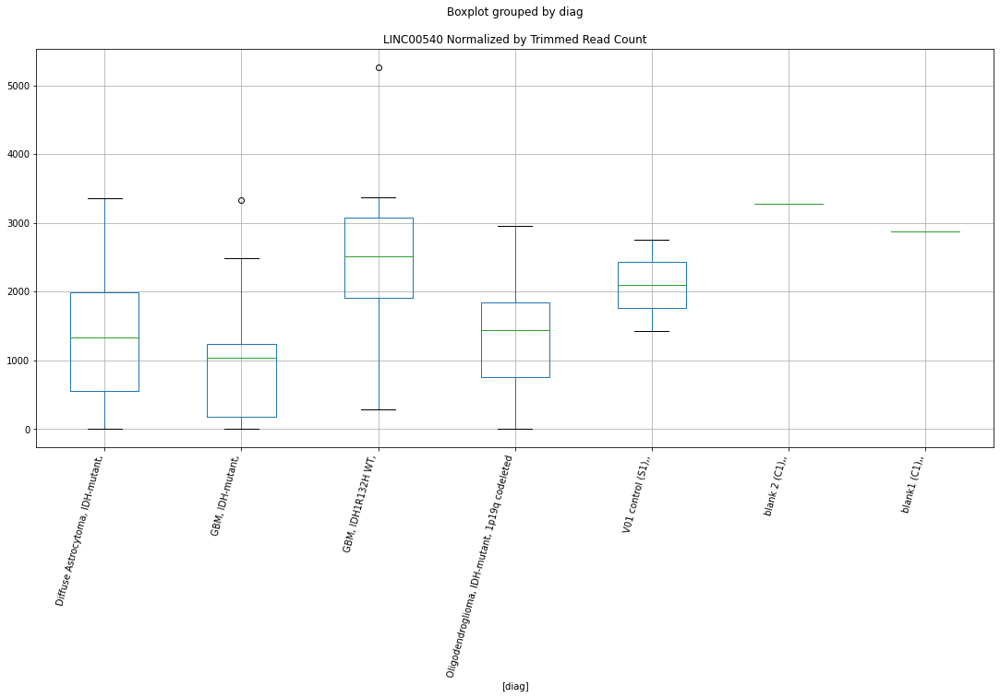

 p : 0.026789168360571637  ( t : 2.411453159071558 ) :  D-plex  :  bbduk2  :  LOC105369325
Control and blanks
73     0.0
337    0.0
Name: LOC105369325, dtype: float64
205    716.36
Name: LOC105369325, dtype: float64
469    0.0
Name: LOC105369325, dtype: float64


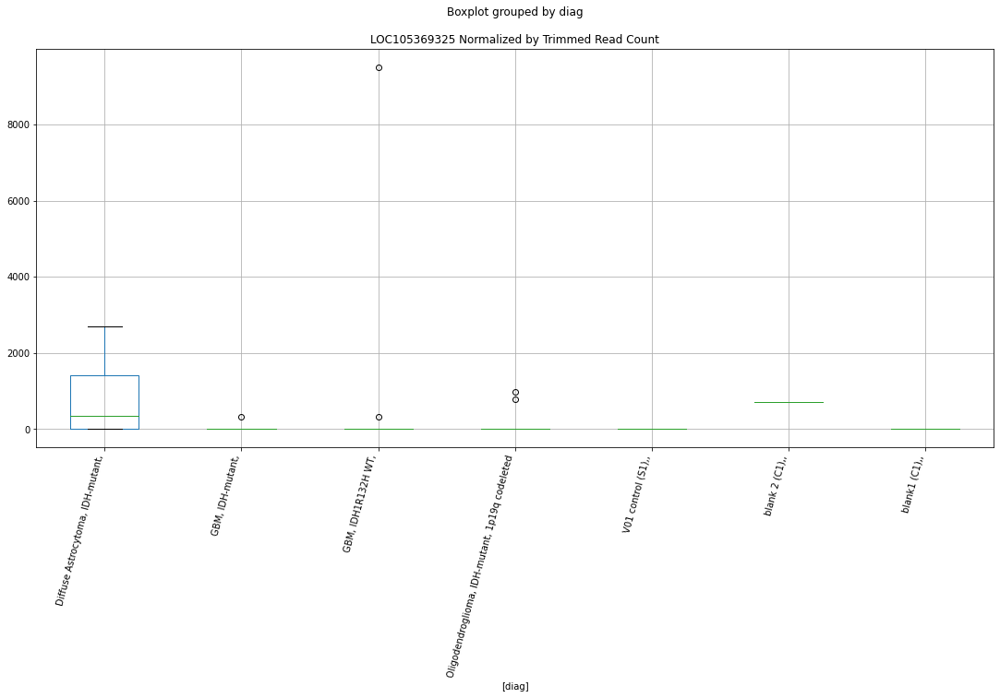

 p : 0.02681523525548043  ( t : 2.410980018125059 ) :  D-plex  :  cutadapt2  :  LOC101927954
Control and blanks
76     0.0
340    0.0
Name: LOC101927954, dtype: float64
208    705.44
Name: LOC101927954, dtype: float64
472    2889.78
Name: LOC101927954, dtype: float64


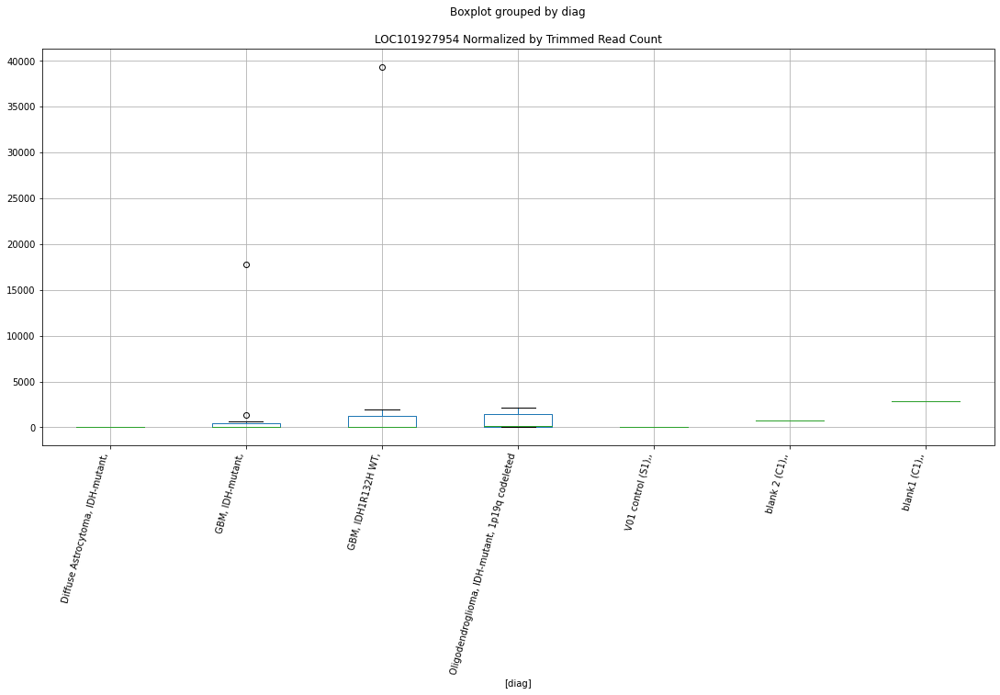

 p : 0.02682408895700501  ( t : 2.4108194122656372 ) :  D-plex  :  cutadapt2  :  LINC01191
Control and blanks
76     0.0
340    0.0
Name: LINC01191, dtype: float64
208    0.0
Name: LINC01191, dtype: float64
472    577.96
Name: LINC01191, dtype: float64


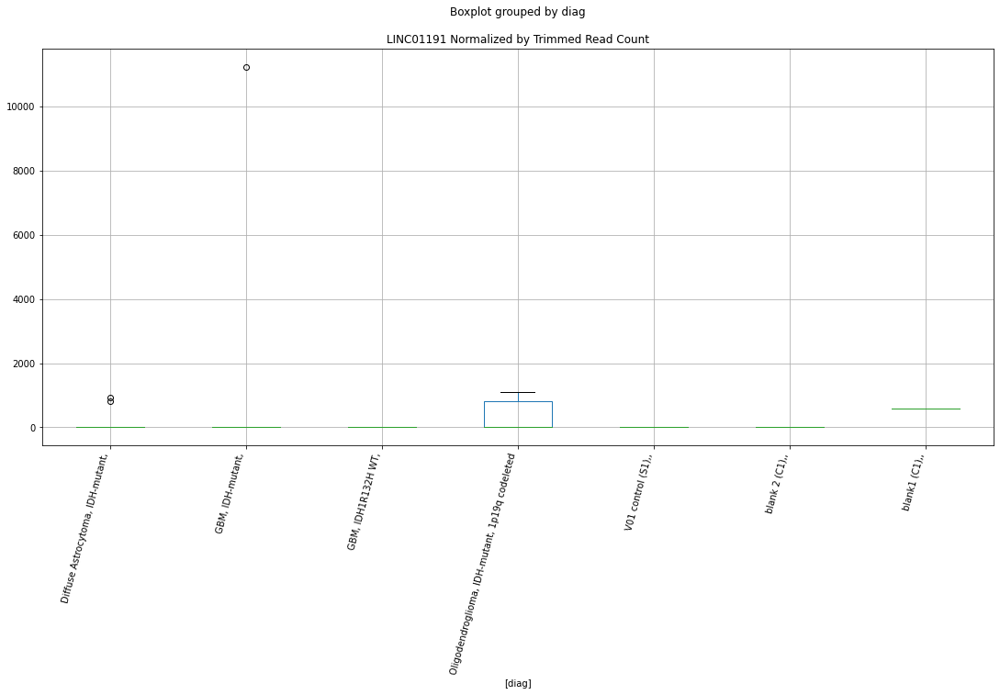

 p : 0.026835615699441217  ( t : 2.410610391853303 ) :  D-plex  :  bbduk2  :  LINC01191
Control and blanks
73     0.0
337    0.0
Name: LINC01191, dtype: float64
205    0.0
Name: LINC01191, dtype: float64
469    591.53
Name: LINC01191, dtype: float64


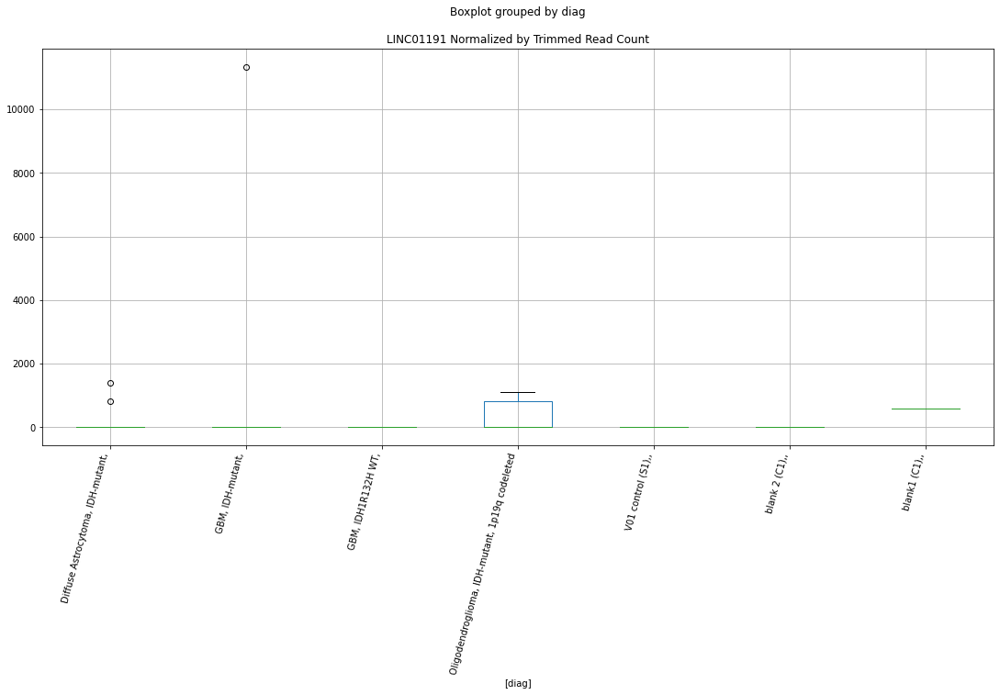

 p : 0.026922132123298508  ( t : 2.409044221145718 ) :  D-plex  :  bbduk2  :  LOC101927954
Control and blanks
73     0.0
337    0.0
Name: LOC101927954, dtype: float64
205    716.36
Name: LOC101927954, dtype: float64
469    2957.64
Name: LOC101927954, dtype: float64


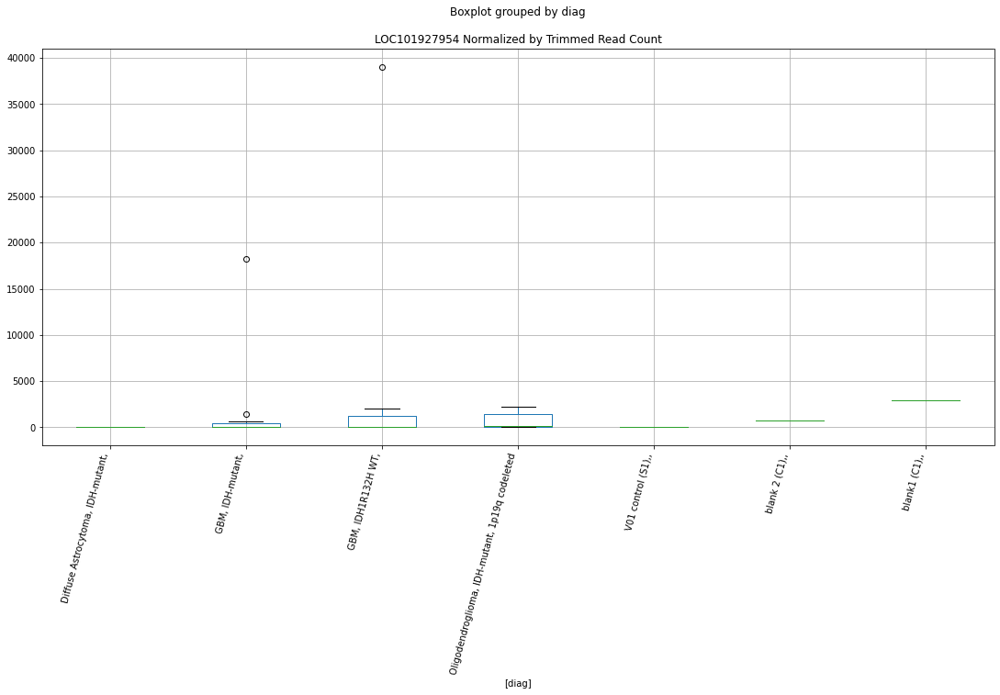

 p : 0.02709367677774181  ( t : 2.405952697117278 ) :  Lexogen  :  bbduk2  :  LINC02666
Control and blanks
79       0.00
343    424.63
Name: LINC02666, dtype: float64
211    0.0
Name: LINC02666, dtype: float64
475    6706.44
Name: LINC02666, dtype: float64


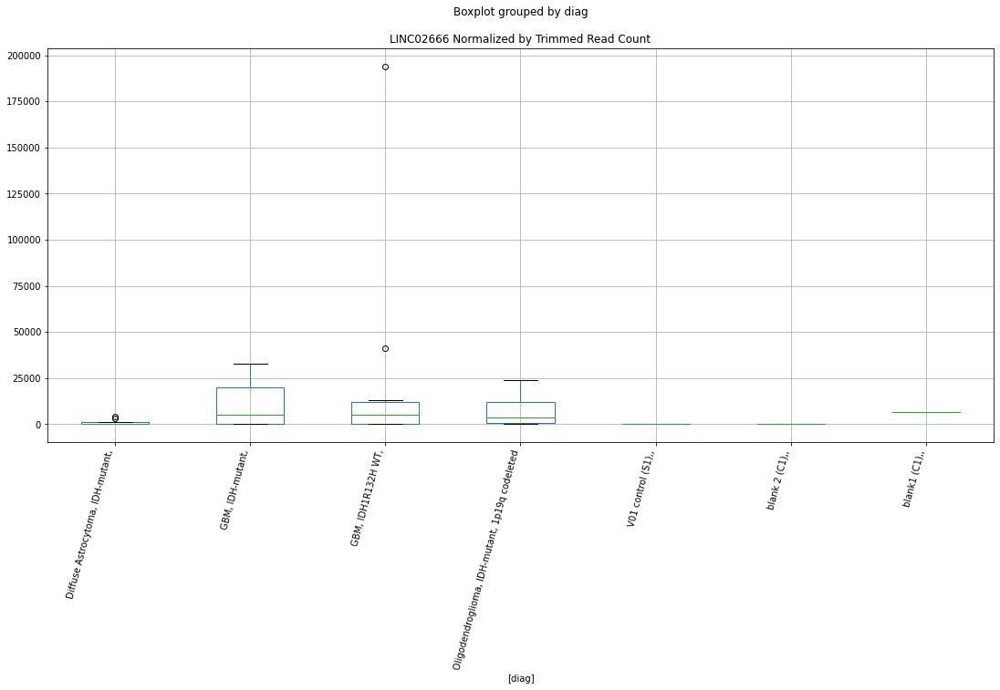

 p : 0.027111569619262848  ( t : 2.4056312933501185 ) :  D-plex  :  cutadapt2  :  LINC00971
Control and blanks
76     0.0
340    0.0
Name: LINC00971, dtype: float64
208    58198.87
Name: LINC00971, dtype: float64
472    13292.98
Name: LINC00971, dtype: float64


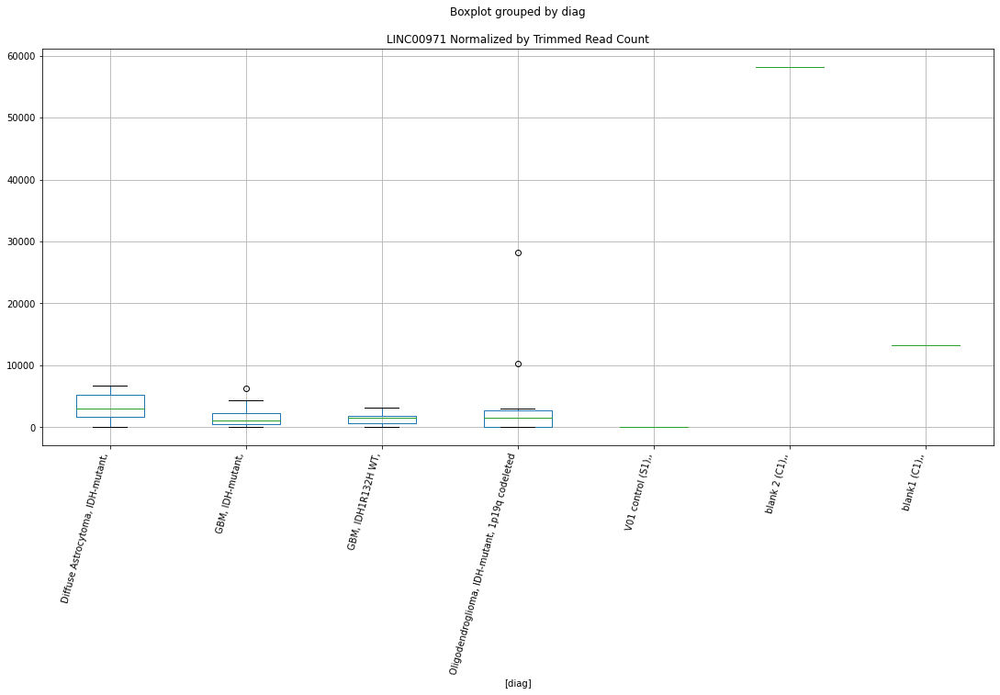

 p : 0.027230638601566392  ( t : 2.4034975326737062 ) :  D-plex  :  bbduk2  :  LOC102724603
Control and blanks
73     0.0
337    0.0
Name: LOC102724603, dtype: float64
205    179.09
Name: LOC102724603, dtype: float64
469    0.0
Name: LOC102724603, dtype: float64


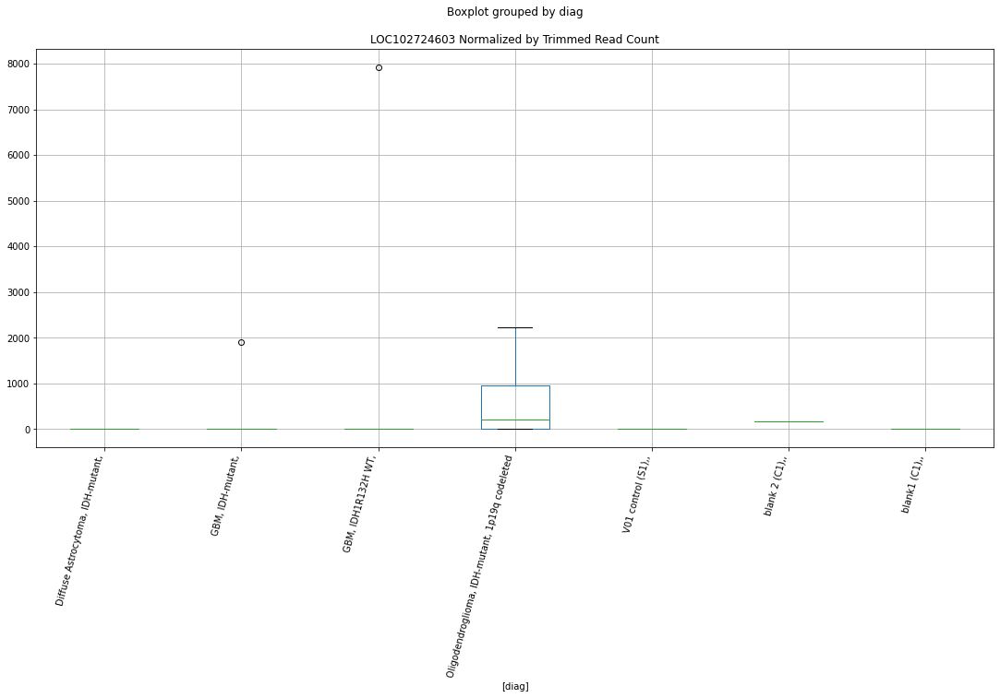

 p : 0.02725382276603487  ( t : 2.4030830790706927 ) :  Lexogen  :  cutadapt2  :  LOC105370469
Control and blanks
82     0.0
346    0.0
Name: LOC105370469, dtype: float64
214    0.0
Name: LOC105370469, dtype: float64
478    0.0
Name: LOC105370469, dtype: float64


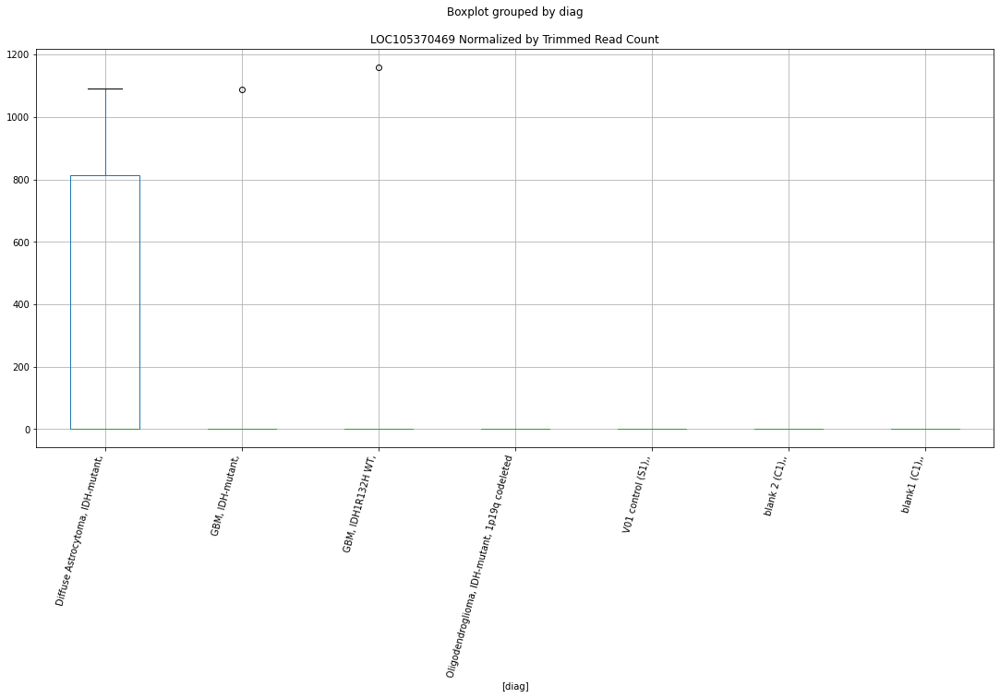

 p : 0.027304132752478276  ( t : 2.4021848414816183 ) :  Lexogen  :  bbduk2  :  LINC02700
Control and blanks
79     0.0
343    0.0
Name: LINC02700, dtype: float64
211    0.0
Name: LINC02700, dtype: float64
475    0.0
Name: LINC02700, dtype: float64


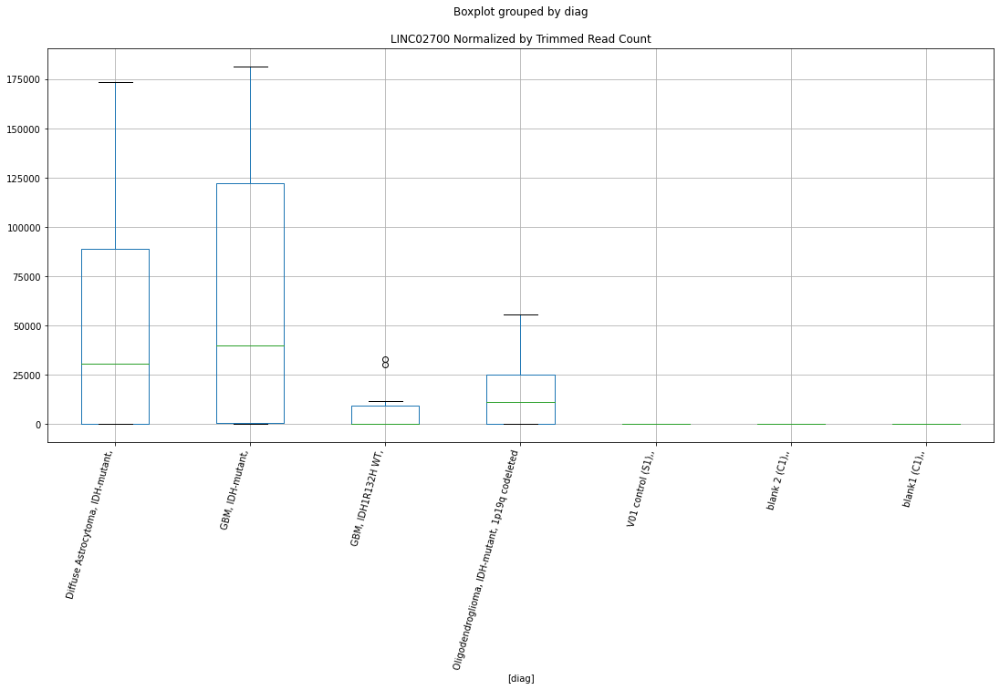

 p : 0.027563992251207512  ( t : 2.397569794320069 ) :  Lexogen  :  bbduk2  :  LOC105371072
Control and blanks
79     0.0
343    0.0
Name: LOC105371072, dtype: float64
211    0.0
Name: LOC105371072, dtype: float64
475    0.0
Name: LOC105371072, dtype: float64


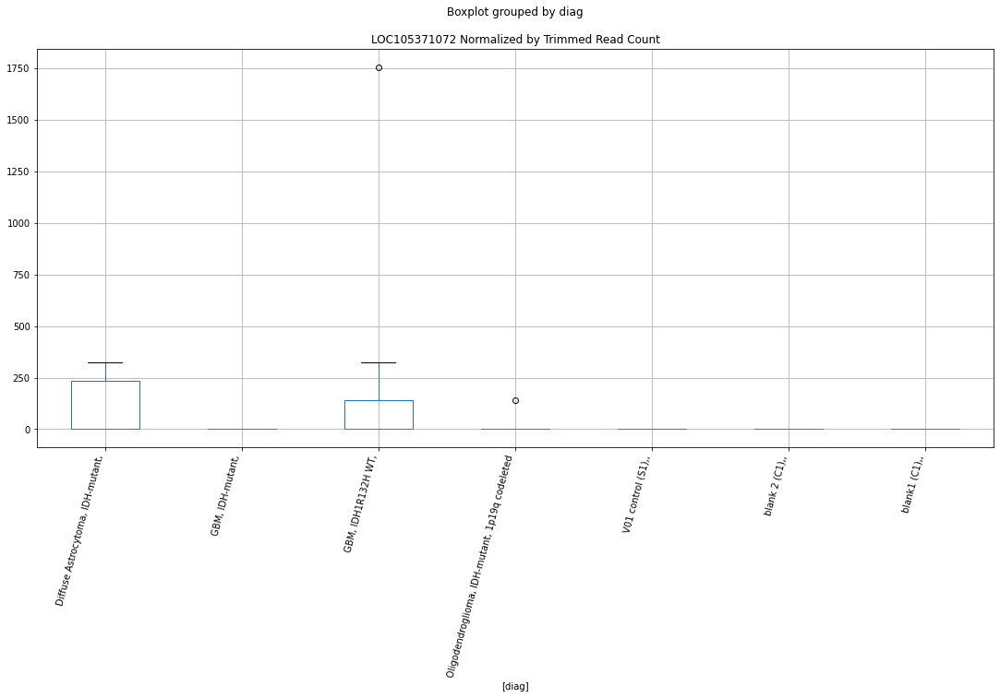

 p : 0.02769325951746962  ( t : 2.3952891663217515 ) :  Lexogen  :  bbduk2  :  LINC00476
Control and blanks
79     0.0
343    0.0
Name: LINC00476, dtype: float64
211    0.0
Name: LINC00476, dtype: float64
475    0.0
Name: LINC00476, dtype: float64


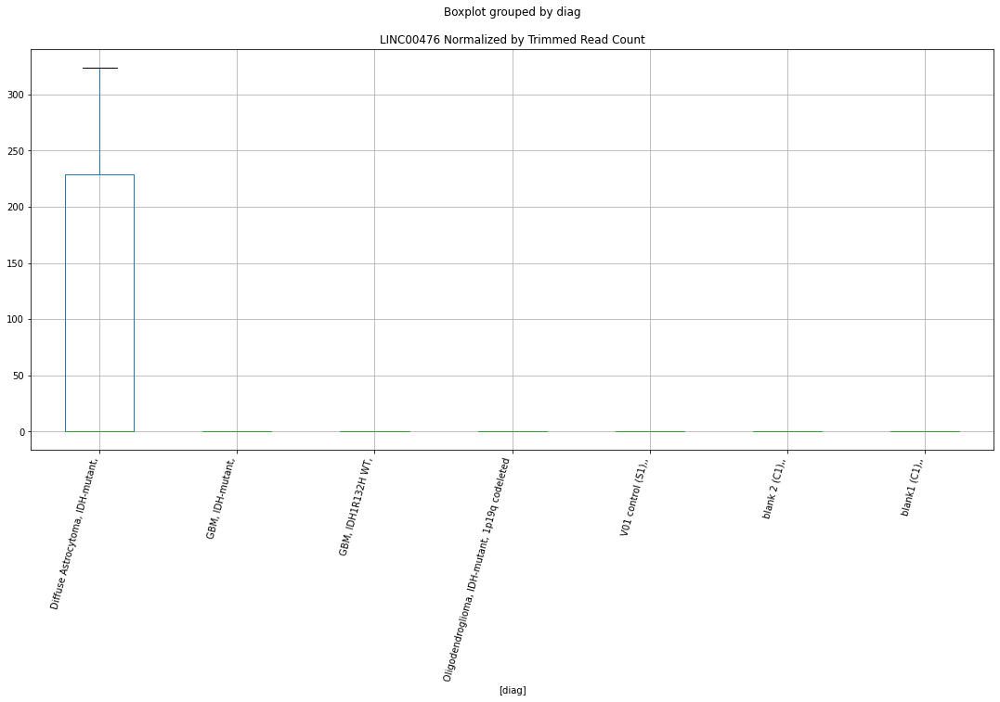

 p : 0.02796284420592682  ( t : 2.390564793872294 ) :  D-plex  :  cutadapt2  :  LOC105370767
Control and blanks
76     0.0
340    0.0
Name: LOC105370767, dtype: float64
208    2645.4
Name: LOC105370767, dtype: float64
472    0.0
Name: LOC105370767, dtype: float64


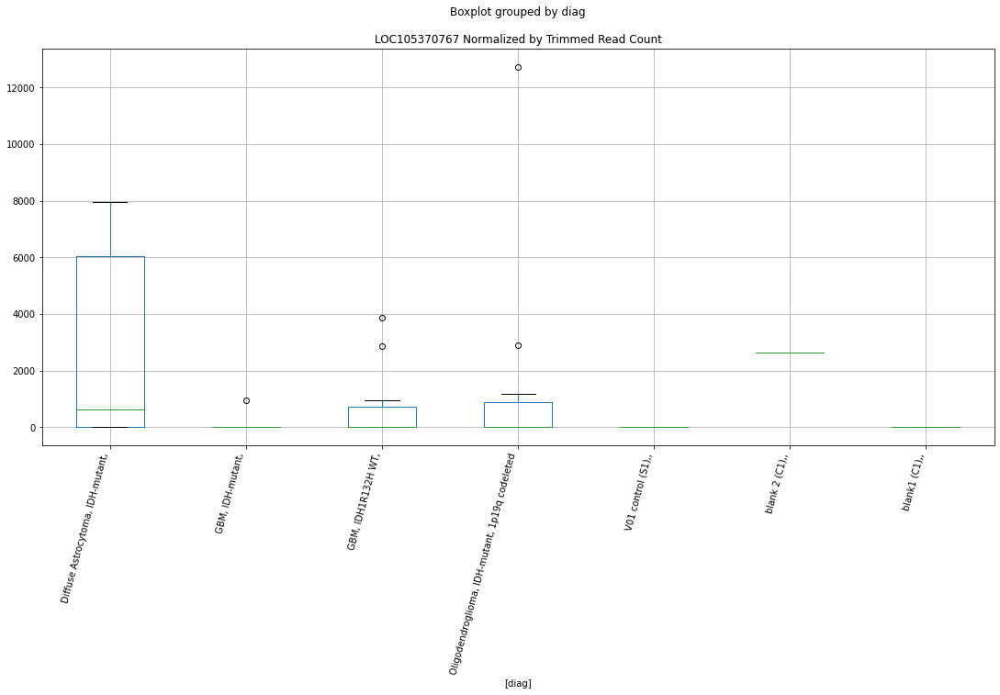

 p : 0.02799861196835347  ( t : 2.3899411778728776 ) :  D-plex  :  bbduk2  :  LOC105370767
Control and blanks
73     0.0
337    0.0
Name: LOC105370767, dtype: float64
205    2686.36
Name: LOC105370767, dtype: float64
469    0.0
Name: LOC105370767, dtype: float64


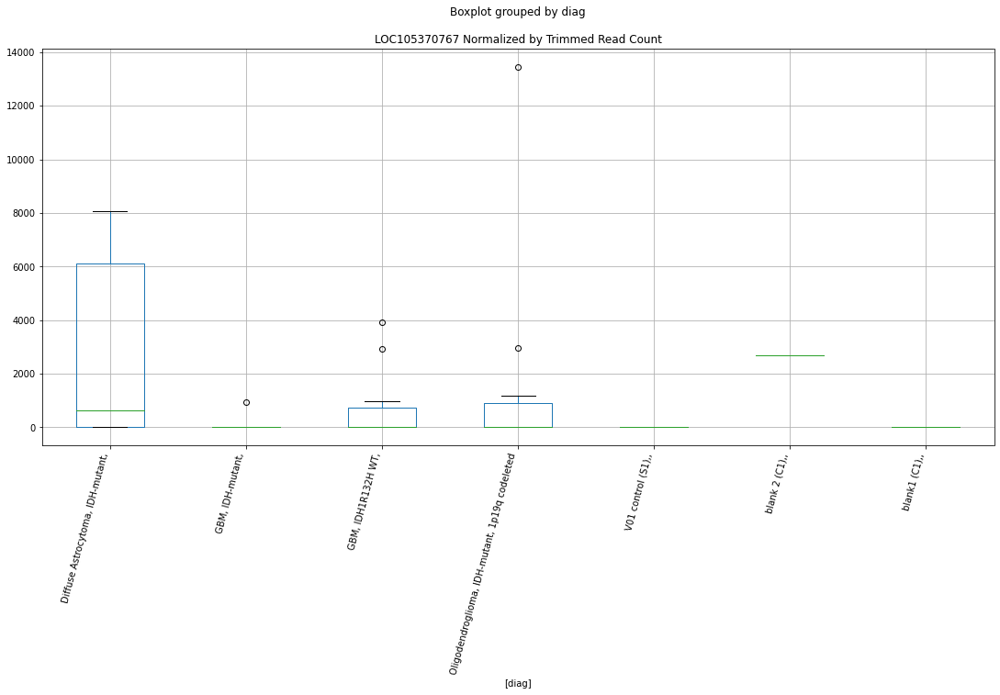

 p : 0.028028262138694623  ( t : 2.3894247869388976 ) :  Lexogen  :  bbduk2  :  LINC01014
Control and blanks
79     0.0
343    0.0
Name: LINC01014, dtype: float64
211    0.0
Name: LINC01014, dtype: float64
475    0.0
Name: LINC01014, dtype: float64


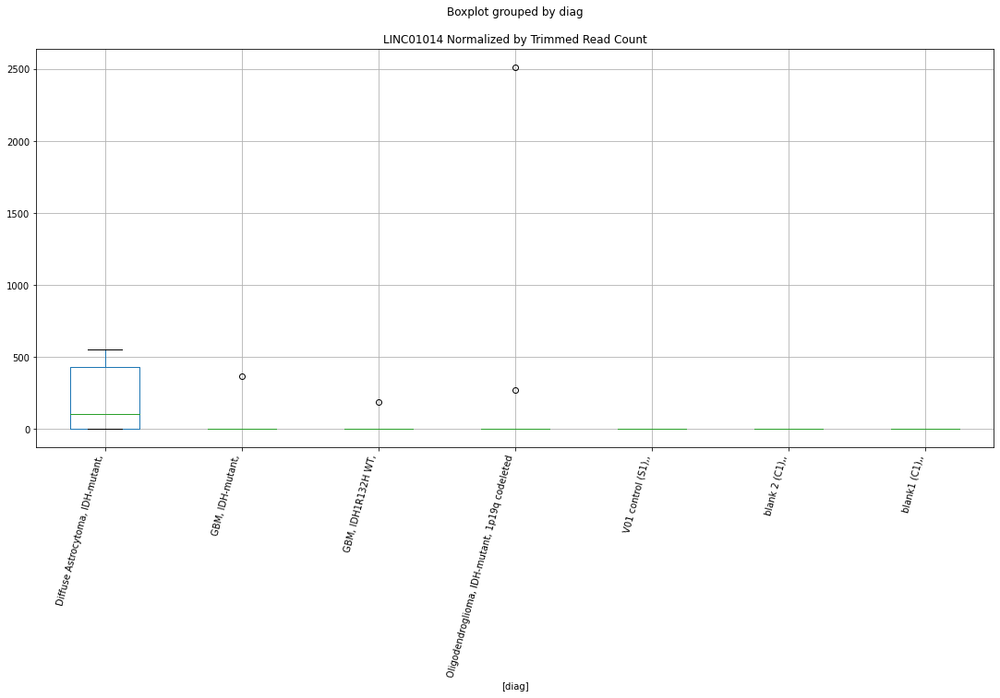

 p : 0.028131066967794816  ( t : 2.3876382694062457 ) :  Lexogen  :  bbduk2  :  LINC00482
Control and blanks
79       0.00
343    212.31
Name: LINC00482, dtype: float64
211    273.31
Name: LINC00482, dtype: float64
475    0.0
Name: LINC00482, dtype: float64


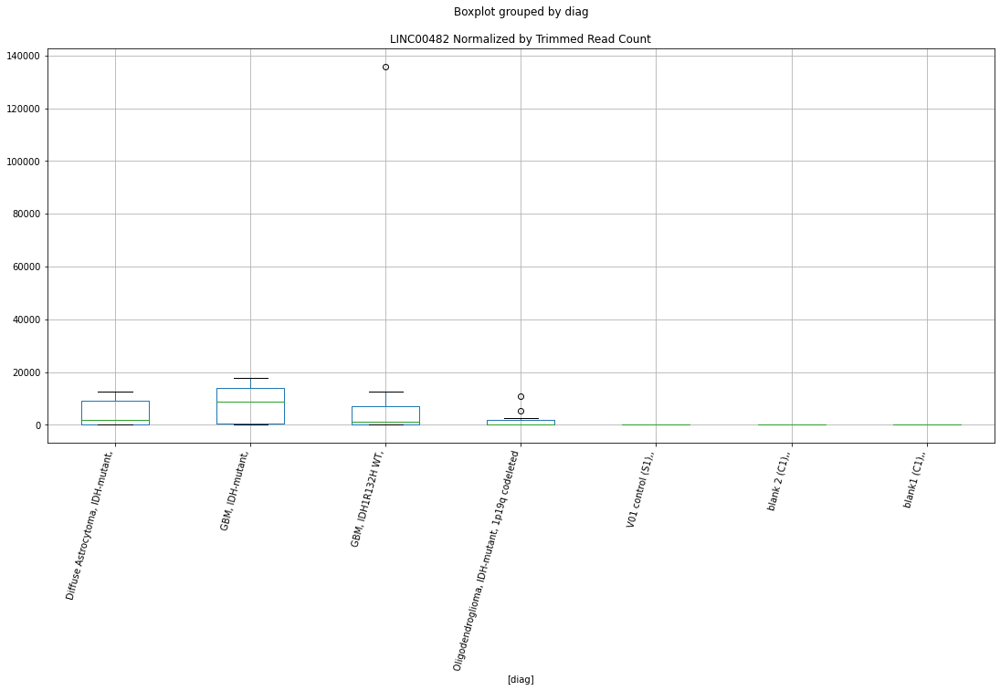

 p : 0.02816836151670043  ( t : 2.3869916809602993 ) :  D-plex  :  cutadapt2  :  LOC100507513
Control and blanks
76     0.0
340    0.0
Name: LOC100507513, dtype: float64
208    176.36
Name: LOC100507513, dtype: float64
472    1155.91
Name: LOC100507513, dtype: float64


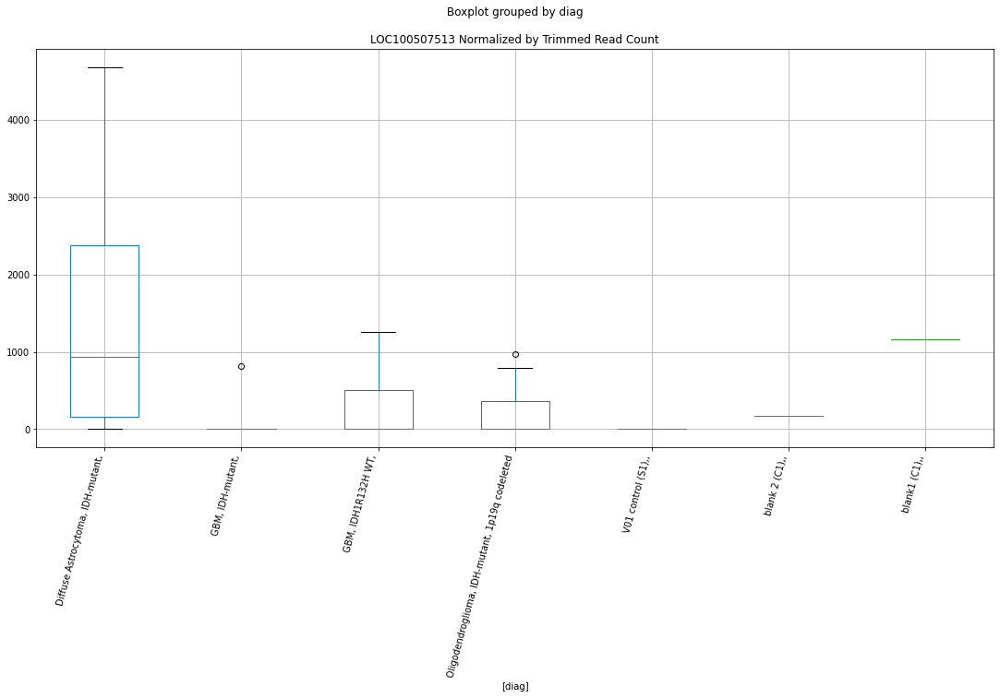

 p : 0.028179555963646002  ( t : 2.3867977550054307 ) :  Lexogen  :  bbduk2  :  LOC105371253
Control and blanks
79     0.0
343    0.0
Name: LOC105371253, dtype: float64
211    546.61
Name: LOC105371253, dtype: float64
475    0.0
Name: LOC105371253, dtype: float64


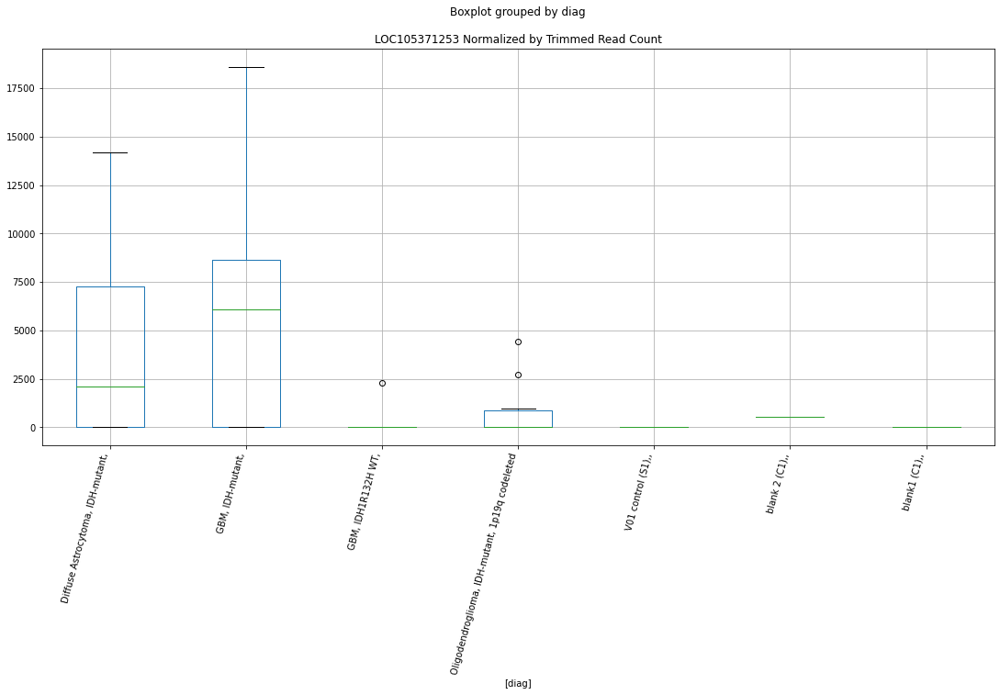

 p : 0.02857368519870996  ( t : 2.380015544140372 ) :  Lexogen  :  bbduk2  :  LOC105370624
Control and blanks
79     0.0
343    0.0
Name: LOC105370624, dtype: float64
211    0.0
Name: LOC105370624, dtype: float64
475    0.0
Name: LOC105370624, dtype: float64


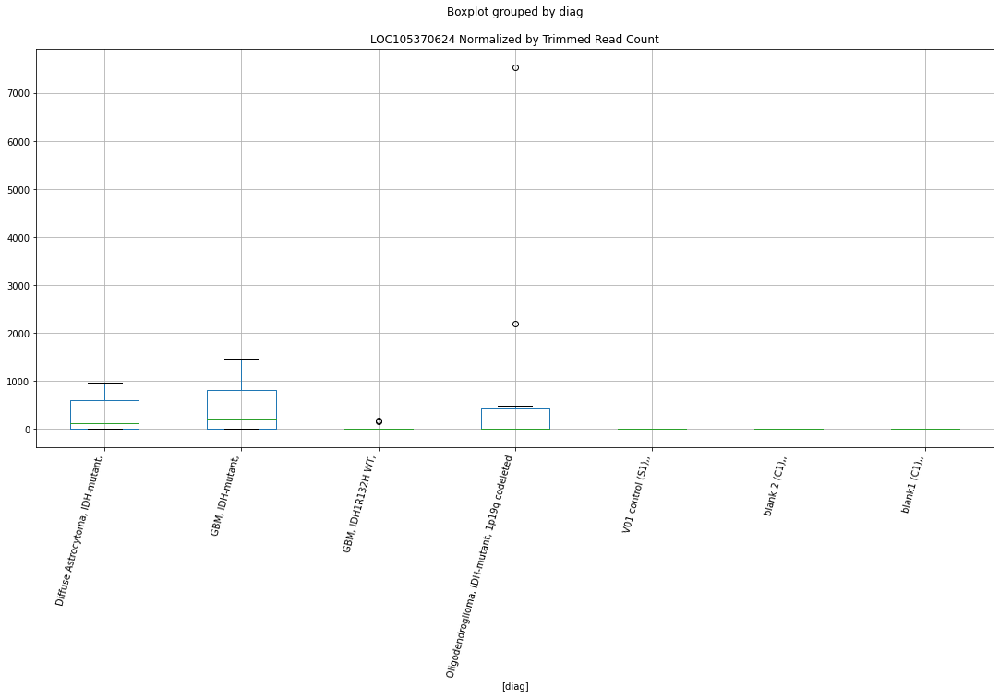

 p : 0.028715919498312793  ( t : 2.377589395232605 ) :  D-plex  :  bbduk2  :  LINC02848
Control and blanks
73     0.0
337    0.0
Name: LINC02848, dtype: float64
205    1611.82
Name: LINC02848, dtype: float64
469    0.0
Name: LINC02848, dtype: float64


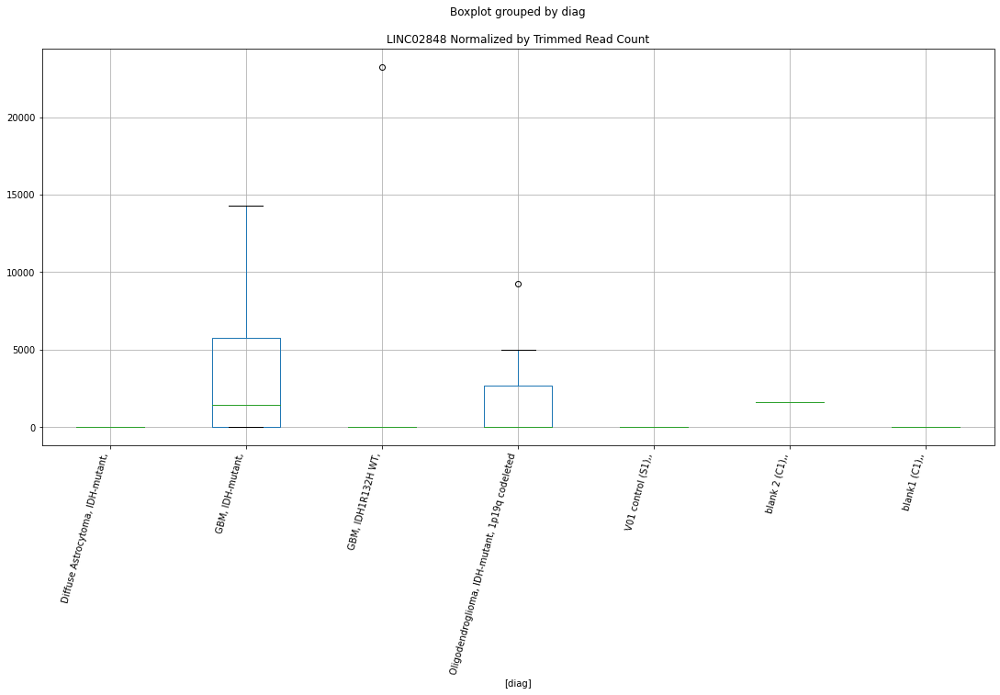

 p : 0.028737032038255422  ( t : 2.377230226382603 ) :  D-plex  :  bbduk2  :  LINC02387
Control and blanks
73     0.0
337    0.0
Name: LINC02387, dtype: float64
205    0.0
Name: LINC02387, dtype: float64
469    0.0
Name: LINC02387, dtype: float64


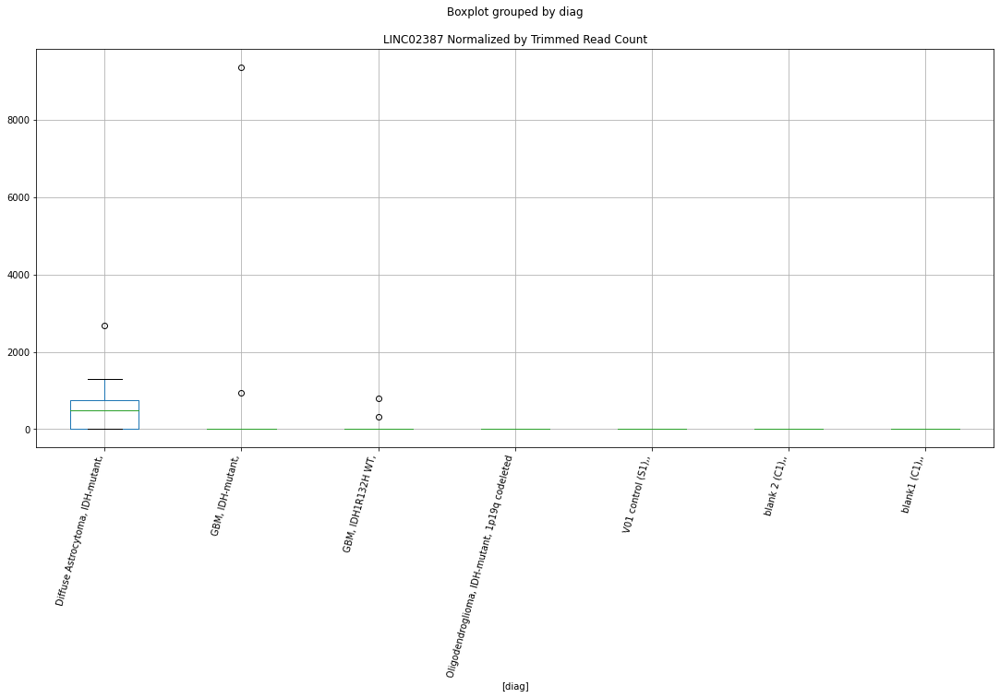

 p : 0.02874459522292705  ( t : 2.377101620565666 ) :  Lexogen  :  cutadapt2  :  LOC102724889
Control and blanks
82     0.0
346    0.0
Name: LOC102724889, dtype: float64
214    0.0
Name: LOC102724889, dtype: float64
478    0.0
Name: LOC102724889, dtype: float64


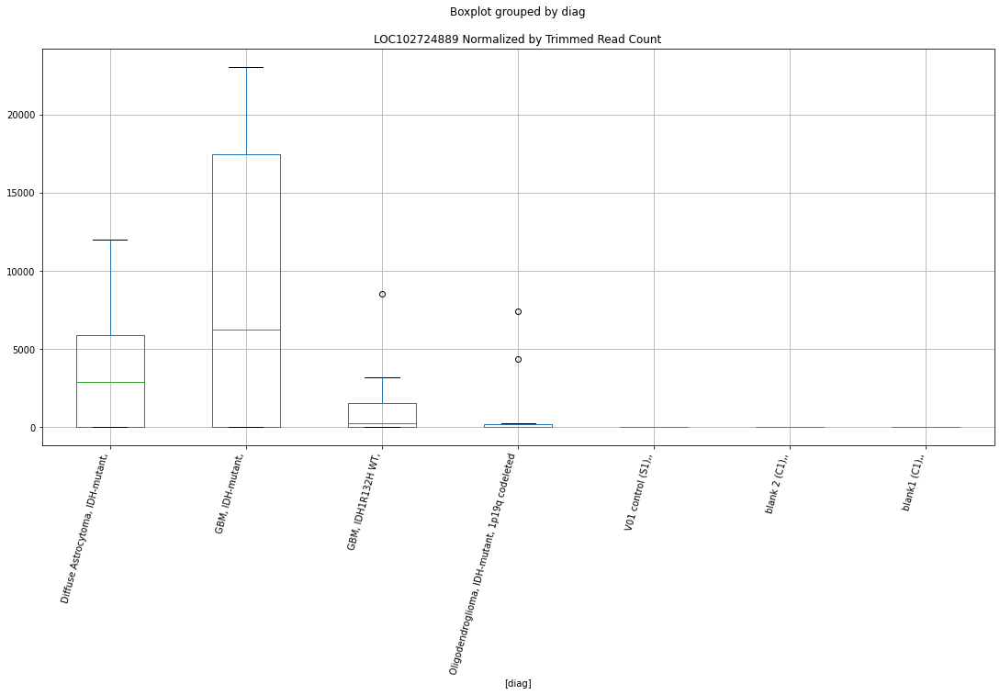

 p : 0.028909505821177062  ( t : 2.374305272183955 ) :  D-plex  :  bbduk2  :  LOC101929165
Control and blanks
73     0.0
337    0.0
Name: LOC101929165, dtype: float64
205    358.18
Name: LOC101929165, dtype: float64
469    3549.16
Name: LOC101929165, dtype: float64


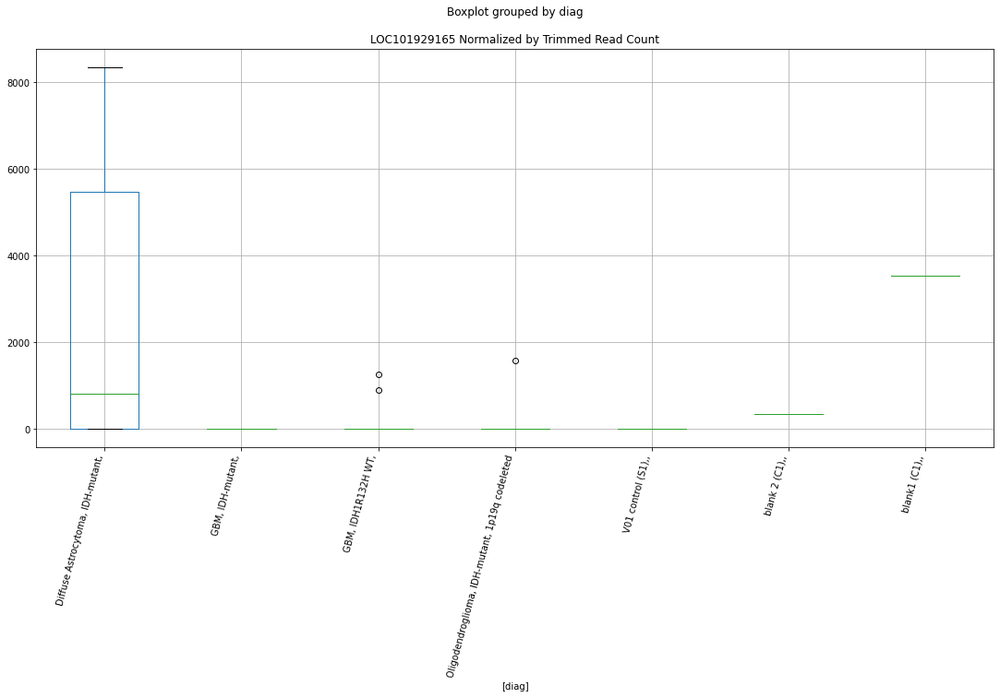

 p : 0.028972136222269785  ( t : 2.3732471623364626 ) :  Lexogen  :  cutadapt2  :  LOC105371253
Control and blanks
82     0.0
346    0.0
Name: LOC105371253, dtype: float64
214    0.0
Name: LOC105371253, dtype: float64
478    0.0
Name: LOC105371253, dtype: float64


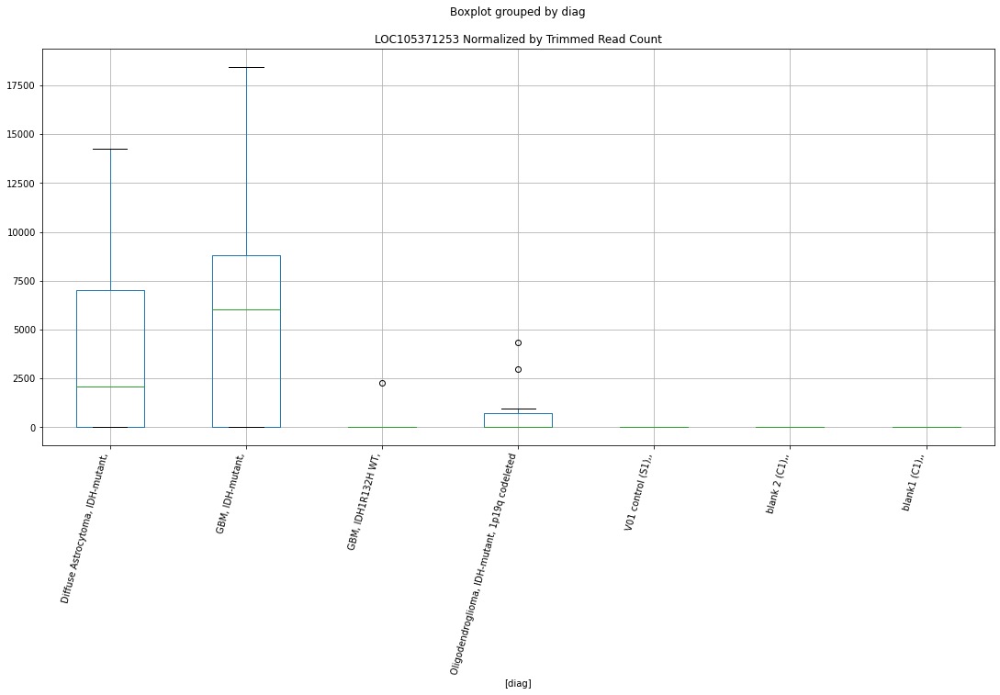

 p : 0.02911436953871351  ( t : 2.3708521045808215 ) :  Lexogen  :  bbduk2  :  LINC02210
Control and blanks
79     0.0
343    0.0
Name: LINC02210, dtype: float64
211    0.0
Name: LINC02210, dtype: float64
475    22993.51
Name: LINC02210, dtype: float64


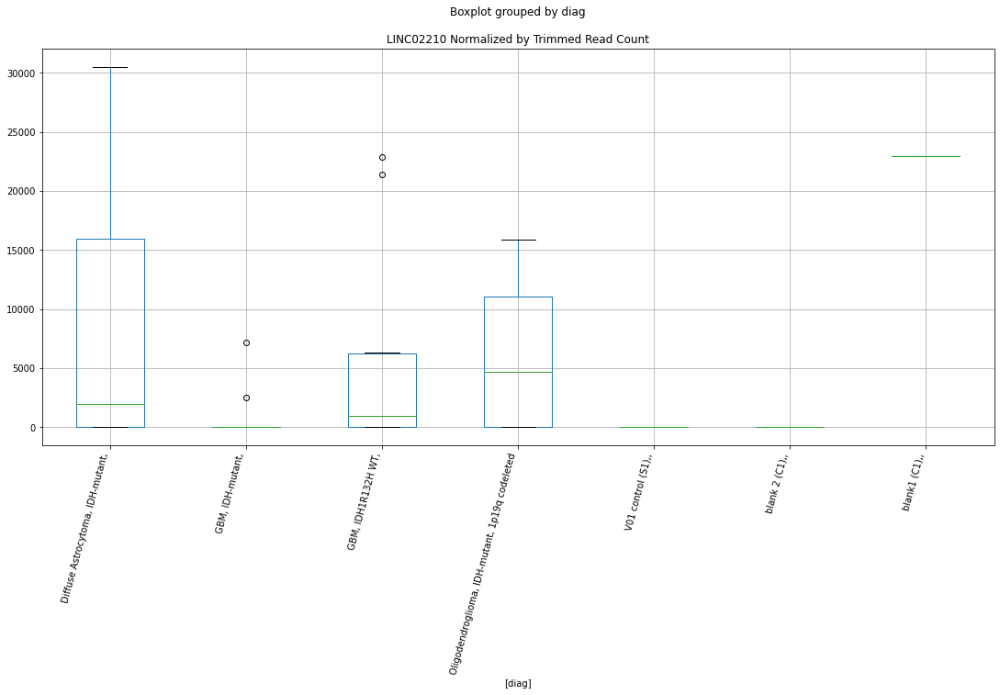

 p : 0.02917015866355921  ( t : 2.3699156542110407 ) :  D-plex  :  bbduk2  :  LOC102723347
Control and blanks
73       773.01
337    13352.36
Name: LOC102723347, dtype: float64
205    1253.64
Name: LOC102723347, dtype: float64
469    1183.05
Name: LOC102723347, dtype: float64


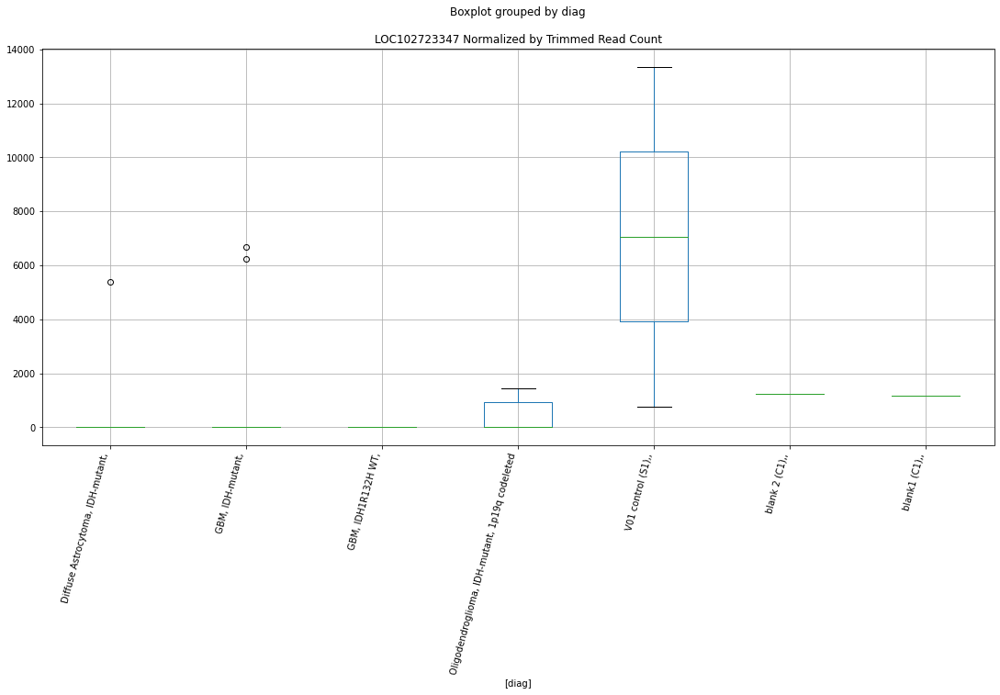

 p : 0.029256144922222654  ( t : 2.36847559517677 ) :  Lexogen  :  bbduk2  :  LOC105369168
Control and blanks
79     0.0
343    0.0
Name: LOC105369168, dtype: float64
211    0.0
Name: LOC105369168, dtype: float64
475    0.0
Name: LOC105369168, dtype: float64


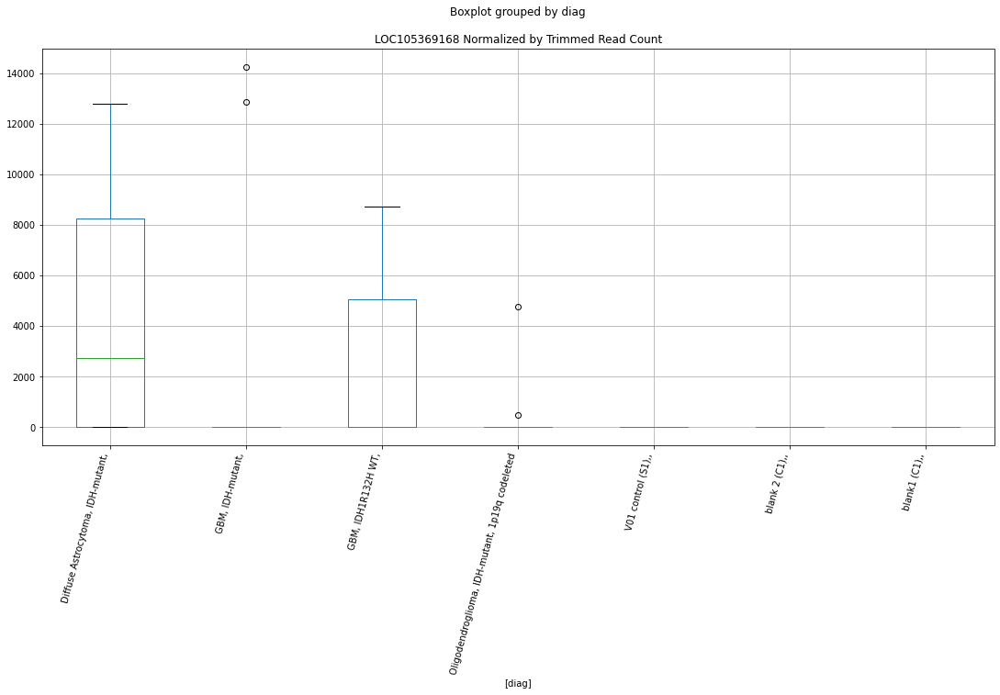

 p : 0.029279079945831527  ( t : 2.368092156628287 ) :  Lexogen  :  cutadapt2  :  LINC02666
Control and blanks
82       0.00
346    420.87
Name: LINC02666, dtype: float64
214    0.0
Name: LINC02666, dtype: float64
478    6648.89
Name: LINC02666, dtype: float64


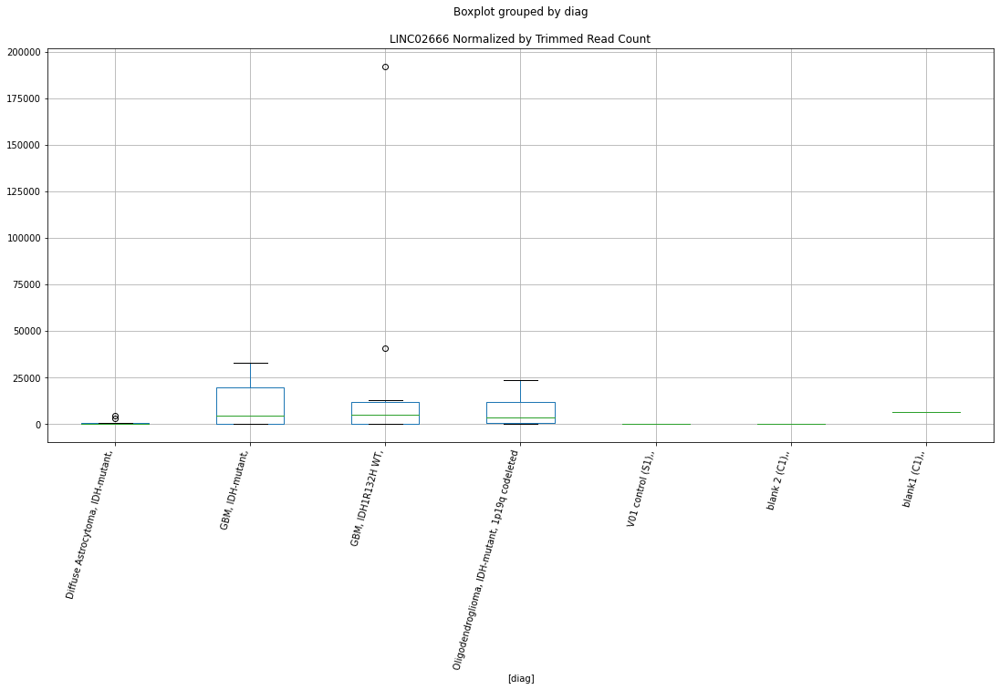

 p : 0.029393909582869977  ( t : 2.3661765823924394 ) :  D-plex  :  bbduk2  :  LOC105371703
Control and blanks
73       0.00
337    890.16
Name: LOC105371703, dtype: float64
205    179.09
Name: LOC105371703, dtype: float64
469    0.0
Name: LOC105371703, dtype: float64


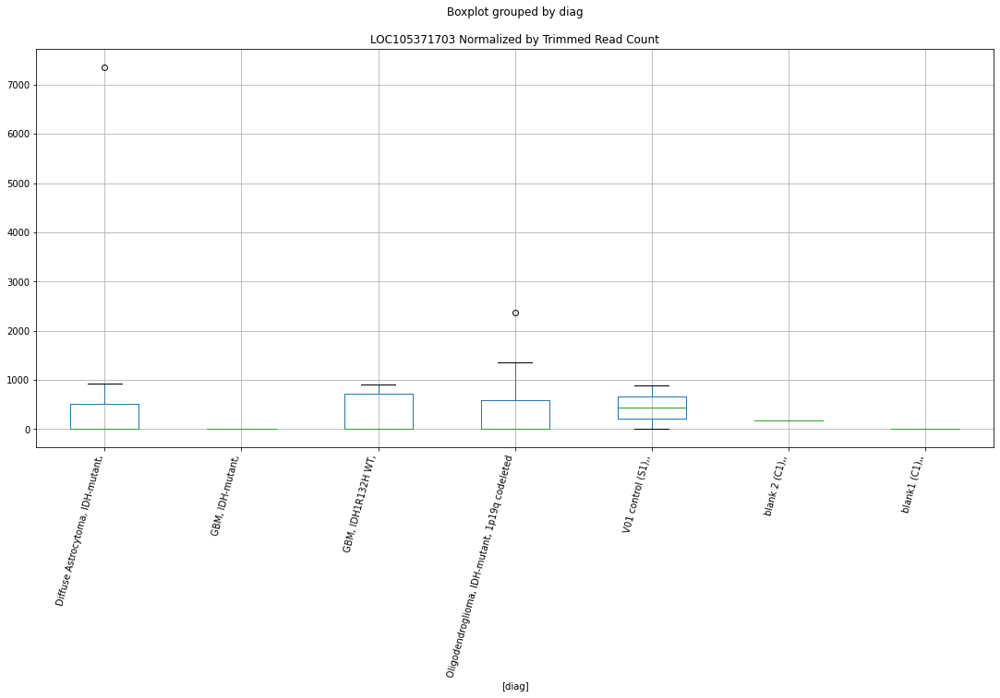

 p : 0.029456166097492048  ( t : 2.365140941884497 ) :  D-plex  :  cutadapt2  :  LINC02317
Control and blanks
76     0.0
340    0.0
Name: LINC02317, dtype: float64
208    705.44
Name: LINC02317, dtype: float64
472    0.0
Name: LINC02317, dtype: float64


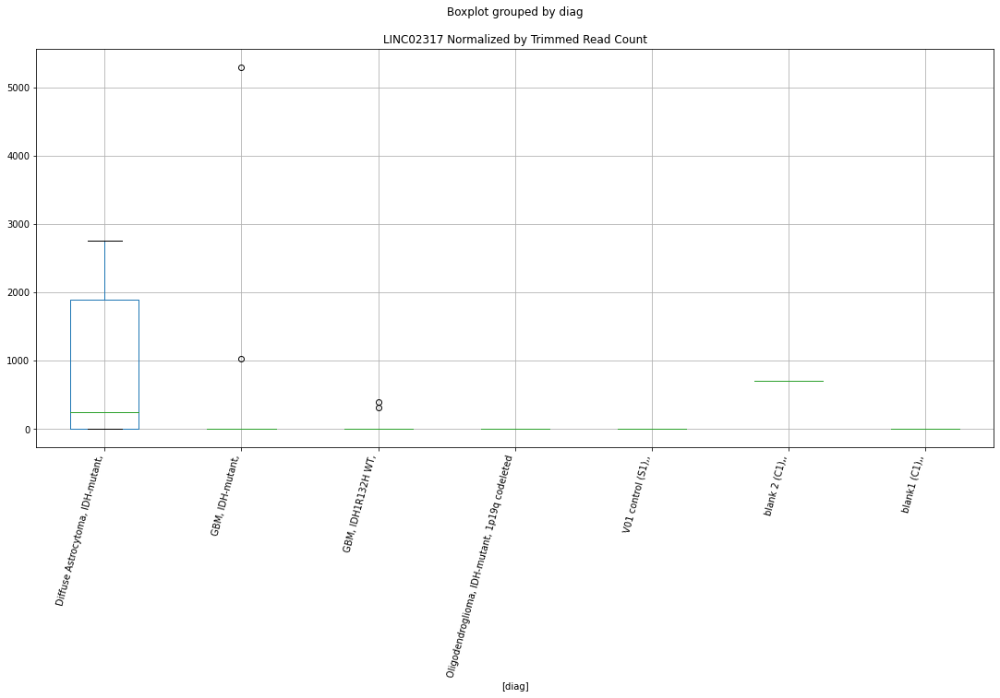

 p : 0.029502171103117276  ( t : 2.3643769565328774 ) :  D-plex  :  cutadapt2  :  LMCD1
Control and blanks
76     11364.21
340        0.00
Name: LMCD1, dtype: float64
208    1939.96
Name: LMCD1, dtype: float64
472    1733.87
Name: LMCD1, dtype: float64


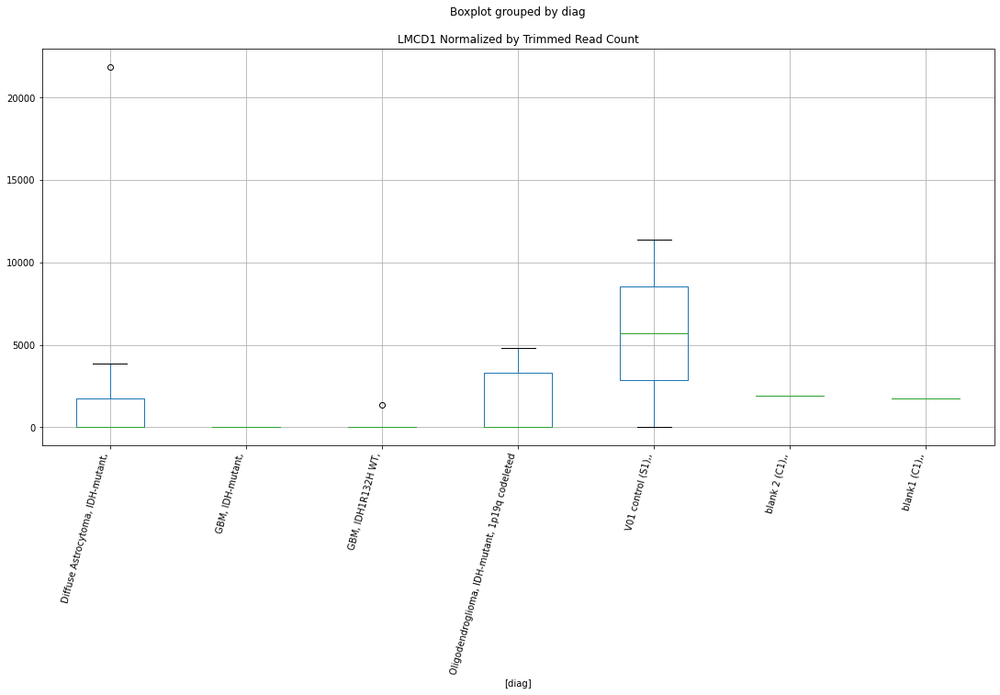

 p : 0.02981059192742465  ( t : 2.3592836399699295 ) :  Lexogen  :  cutadapt2  :  LOC105369168
Control and blanks
82     0.0
346    0.0
Name: LOC105369168, dtype: float64
214    0.0
Name: LOC105369168, dtype: float64
478    0.0
Name: LOC105369168, dtype: float64


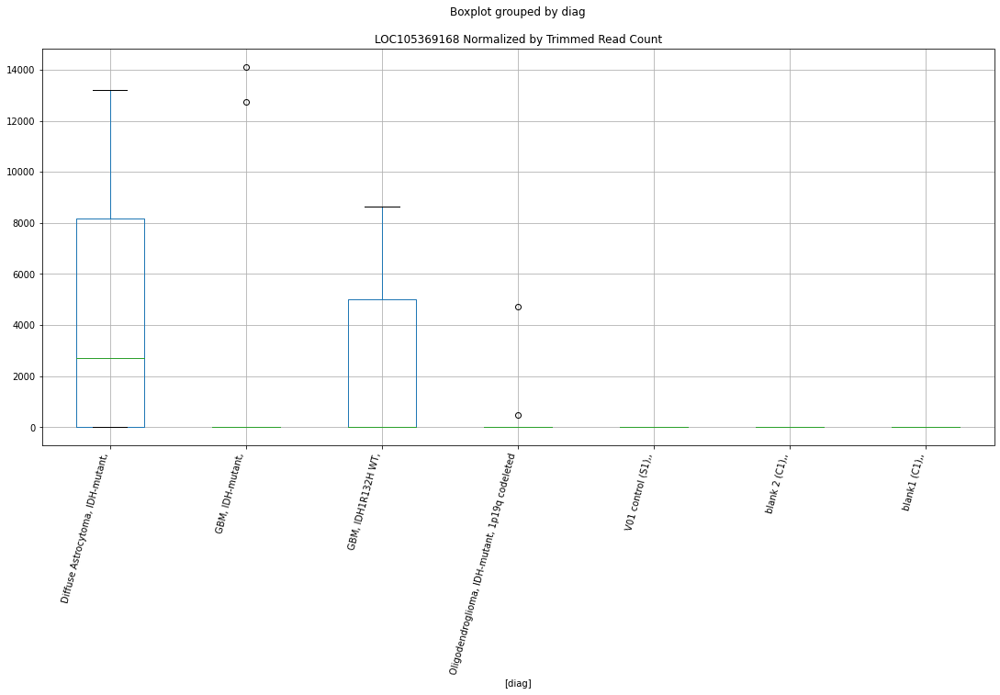

 p : 0.029916652693664274  ( t : 2.357543476714191 ) :  Lexogen  :  bbduk2  :  LINC01163
Control and blanks
79       0.00
343    212.31
Name: LINC01163, dtype: float64
211    0.0
Name: LINC01163, dtype: float64
475    0.0
Name: LINC01163, dtype: float64


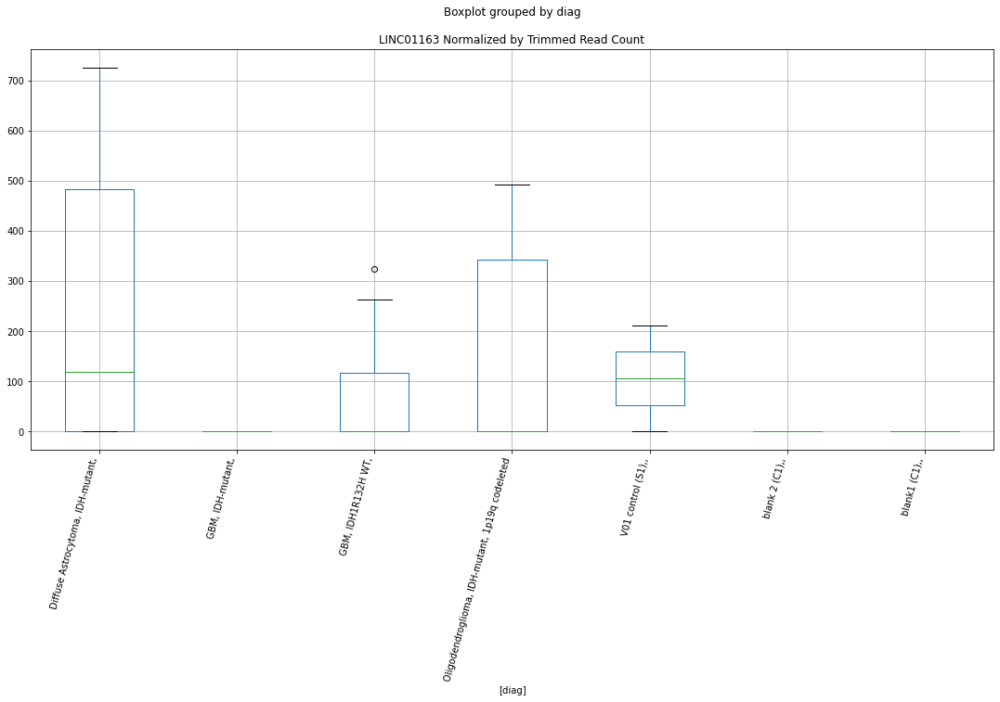

 p : 0.03002199565742793  ( t : 2.3558207713632218 ) :  Lexogen  :  bbduk2  :  LOC105370846
Control and blanks
79       0.00
343    212.31
Name: LOC105370846, dtype: float64
211    273.31
Name: LOC105370846, dtype: float64
475    0.0
Name: LOC105370846, dtype: float64


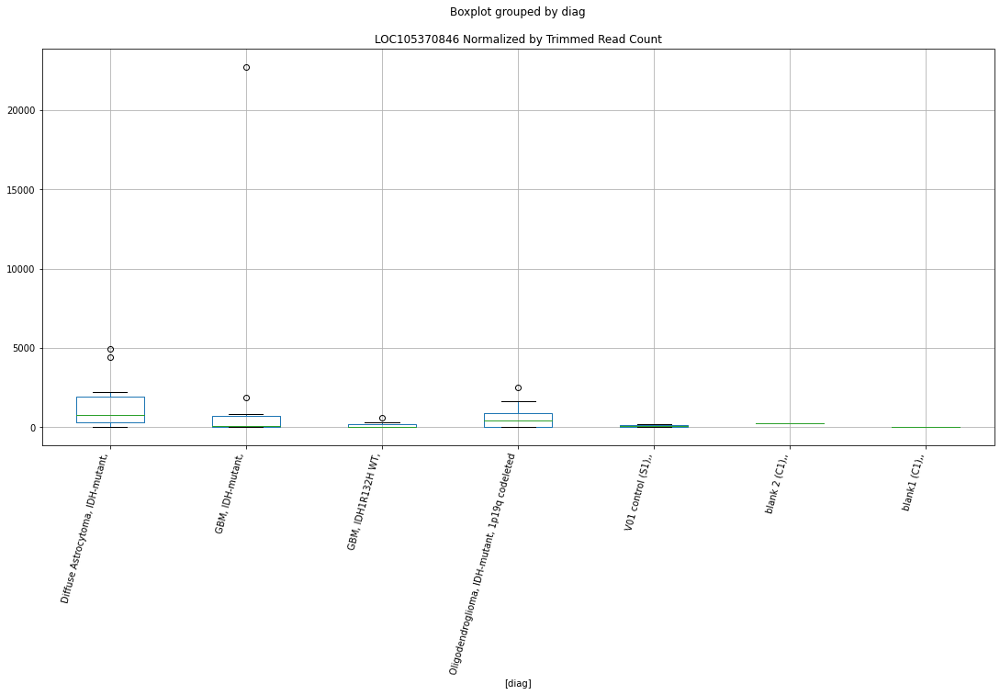

 p : 0.030132995516068264  ( t : 2.3540116395686503 ) :  Lexogen  :  bbduk2  :  LOC102724889
Control and blanks
79     0.0
343    0.0
Name: LOC102724889, dtype: float64
211    0.0
Name: LOC102724889, dtype: float64
475    0.0
Name: LOC102724889, dtype: float64


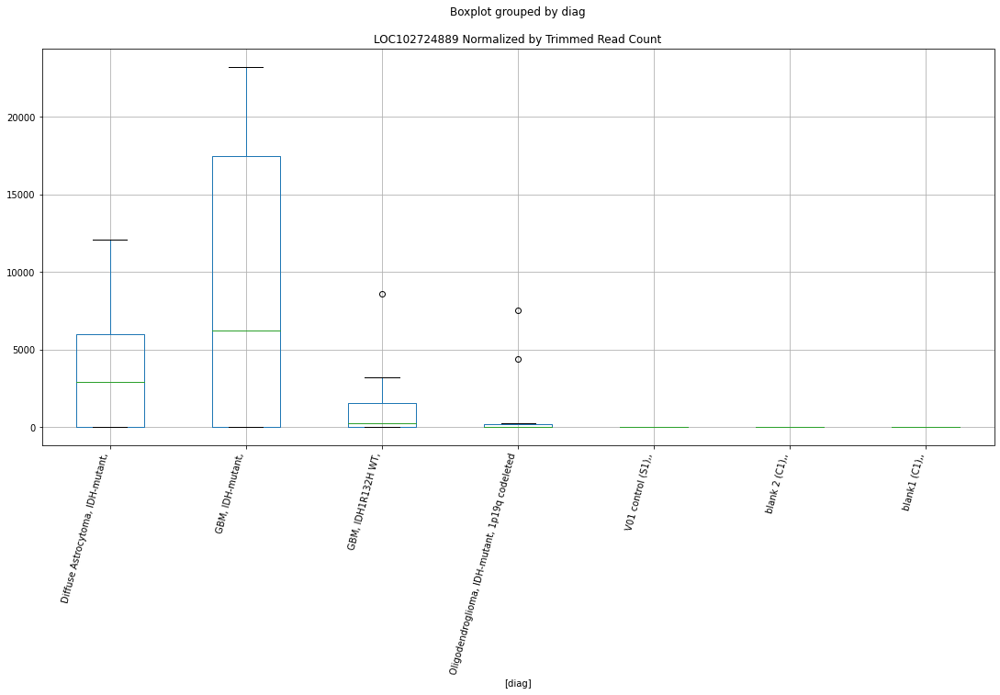

 p : 0.030294468640675726  ( t : 2.3513909212918875 ) :  D-plex  :  cutadapt2  :  LOC101060553
Control and blanks
76     757.61
340    880.73
Name: LOC101060553, dtype: float64
208    705.44
Name: LOC101060553, dtype: float64
472    577.96
Name: LOC101060553, dtype: float64


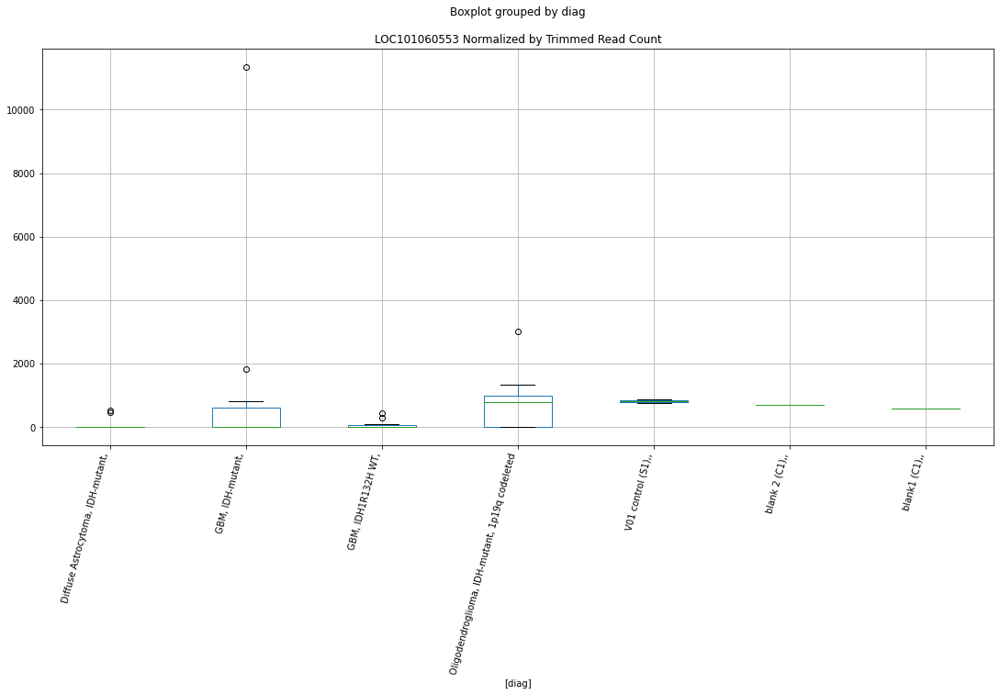

 p : 0.030968747007900595  ( t : 2.3405860397991445 ) :  D-plex  :  bbduk2  :  LOC105370986
Control and blanks
73     0.0
337    0.0
Name: LOC105370986, dtype: float64
205    179.09
Name: LOC105370986, dtype: float64
469    0.0
Name: LOC105370986, dtype: float64


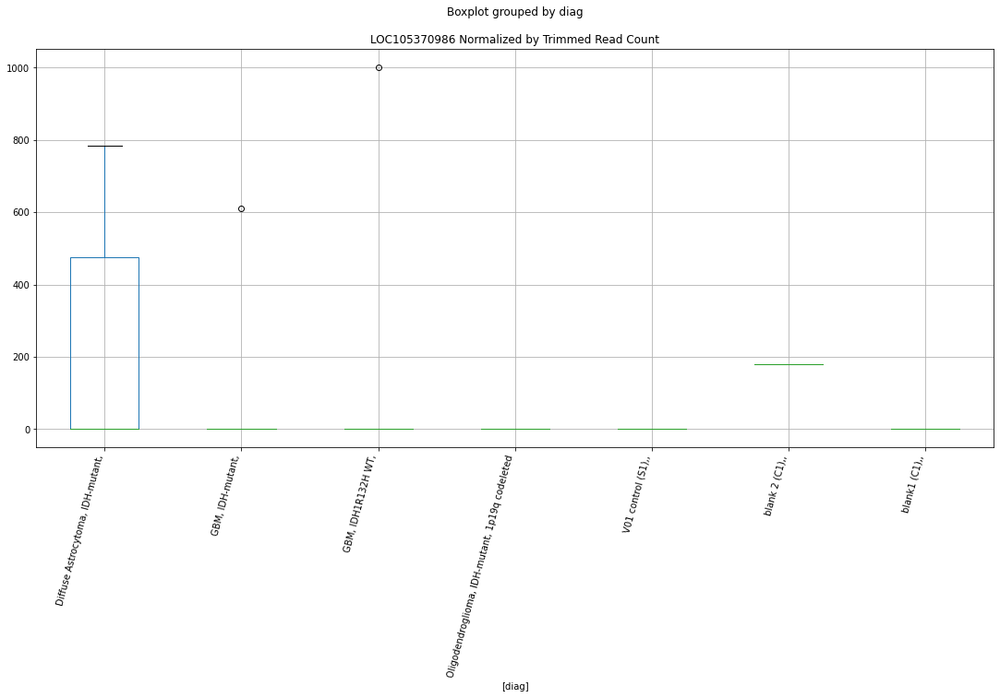

 p : 0.0309690926465079  ( t : 2.340580557526646 ) :  D-plex  :  cutadapt2  :  LINC02794
Control and blanks
76     0.0
340    0.0
Name: LINC02794, dtype: float64
208    0.0
Name: LINC02794, dtype: float64
472    0.0
Name: LINC02794, dtype: float64


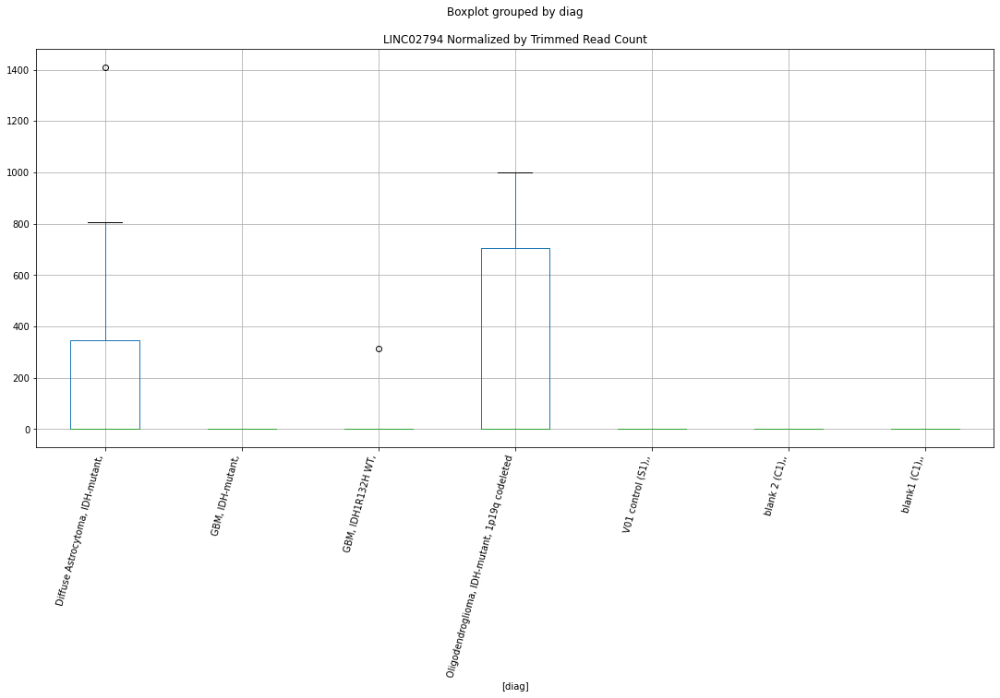

 p : 0.03106564592362496  ( t : 2.339051323071249 ) :  D-plex  :  bbduk2  :  LINC00330
Control and blanks
73     0.0
337    0.0
Name: LINC00330, dtype: float64
205    537.27
Name: LINC00330, dtype: float64
469    591.53
Name: LINC00330, dtype: float64


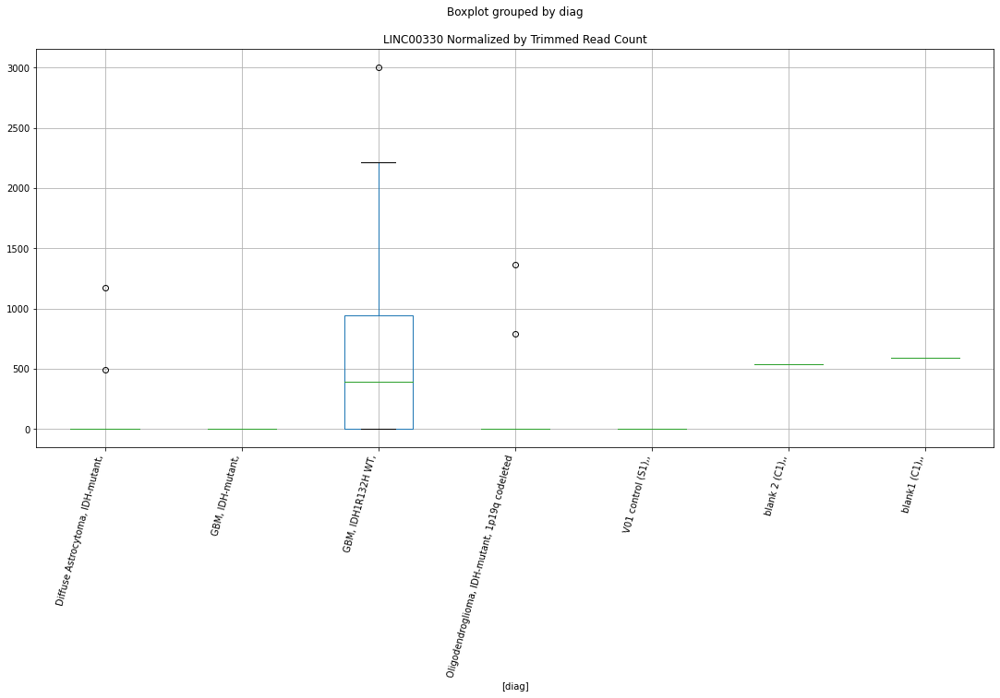

 p : 0.031112597403513412  ( t : 2.3383092912278265 ) :  D-plex  :  bbduk2  :  LOC101928077
Control and blanks
73     0.0
337    0.0
Name: LOC101928077, dtype: float64
205    0.0
Name: LOC101928077, dtype: float64
469    0.0
Name: LOC101928077, dtype: float64


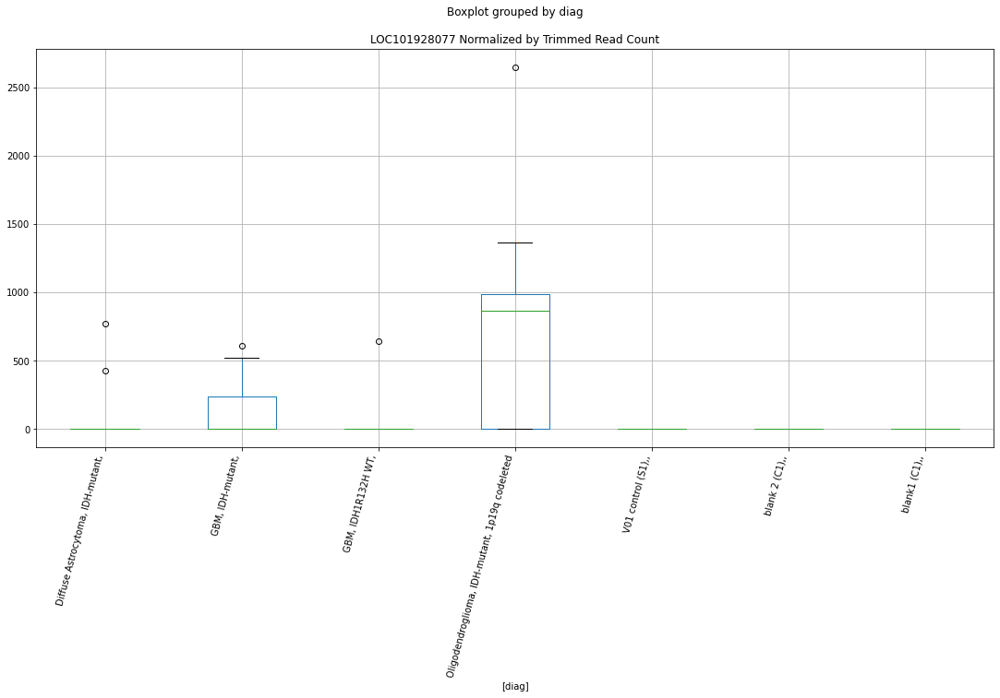

 p : 0.031118728280267616  ( t : 2.3382124743625634 ) :  Lexogen  :  bbduk2  :  LOC100505498
Control and blanks
79     0.0
343    0.0
Name: LOC100505498, dtype: float64
211    273.31
Name: LOC100505498, dtype: float64
475    0.0
Name: LOC100505498, dtype: float64


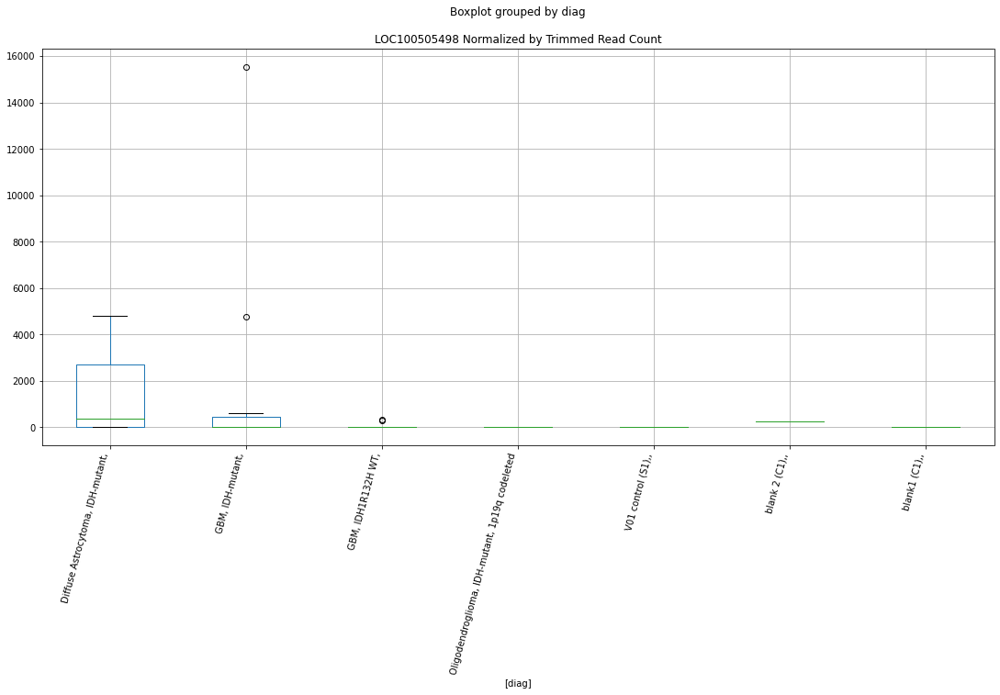

 p : 0.03156021141496098  ( t : 2.3312869259603506 ) :  Lexogen  :  cutadapt2  :  LOC105370614
Control and blanks
82     0.0
346    0.0
Name: LOC105370614, dtype: float64
214    1898.59
Name: LOC105370614, dtype: float64
478    5699.05
Name: LOC105370614, dtype: float64


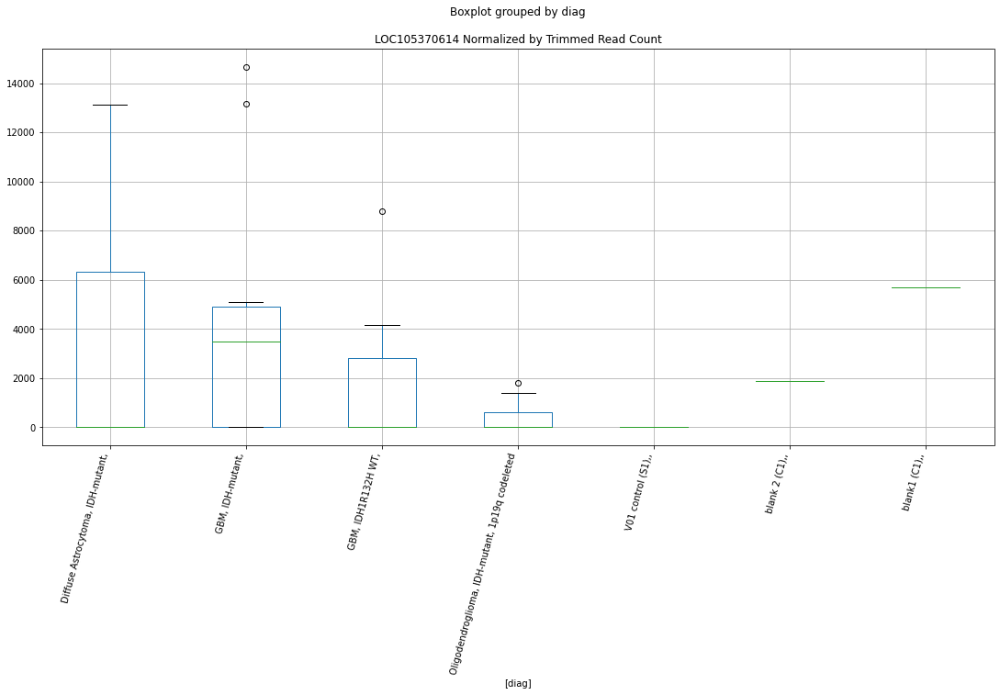

 p : 0.03232306302368319  ( t : 2.319529584827814 ) :  D-plex  :  bbduk2  :  LOC105370469
Control and blanks
73        0.00
337    3560.63
Name: LOC105370469, dtype: float64
205    11461.82
Name: LOC105370469, dtype: float64
469    2366.11
Name: LOC105370469, dtype: float64


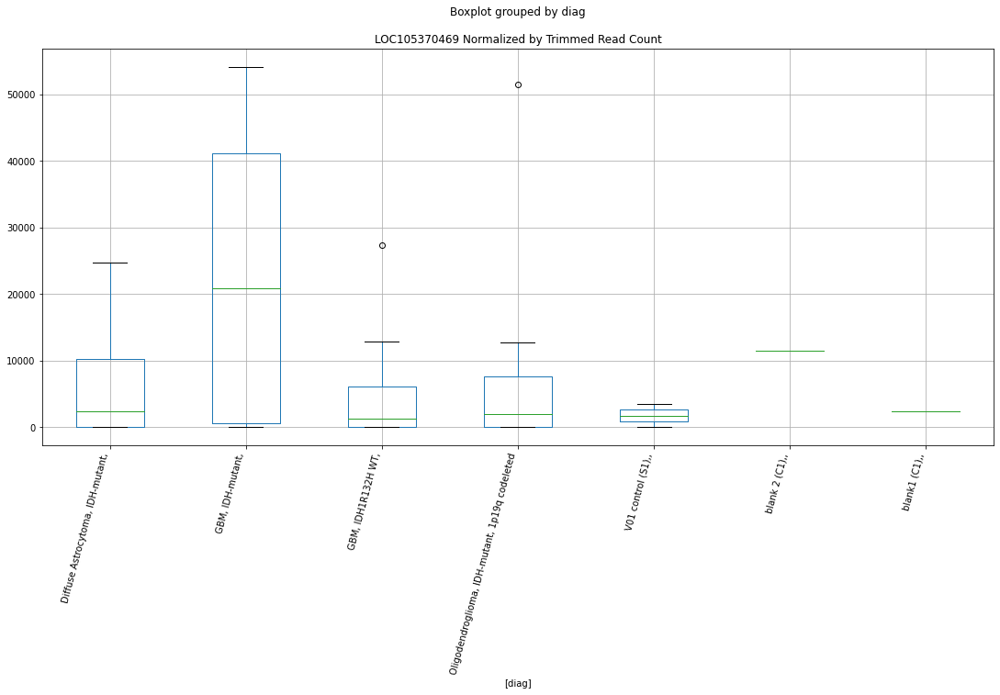

 p : 0.03256260745607991  ( t : 2.3158907918750447 ) :  D-plex  :  cutadapt2  :  LOC105369844
Control and blanks
76     0.0
340    0.0
Name: LOC105369844, dtype: float64
208    705.44
Name: LOC105369844, dtype: float64
472    0.0
Name: LOC105369844, dtype: float64


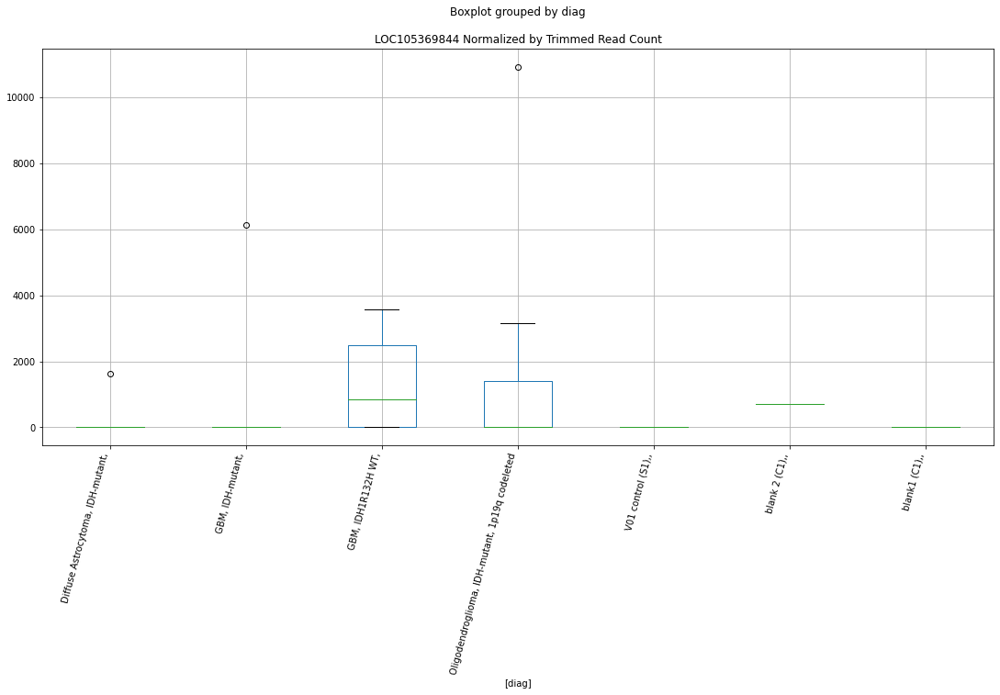

 p : 0.03259415847202681  ( t : 2.3154133707542623 ) :  Lexogen  :  bbduk2  :  LINC02666
Control and blanks
79       0.00
343    424.63
Name: LINC02666, dtype: float64
211    0.0
Name: LINC02666, dtype: float64
475    6706.44
Name: LINC02666, dtype: float64


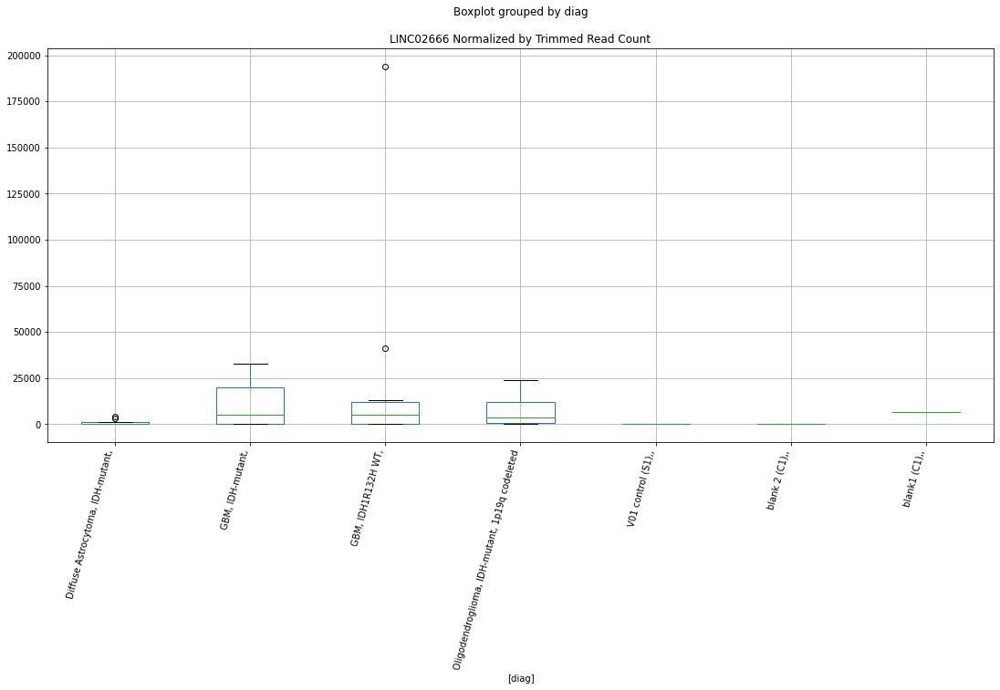

 p : 0.032612196140707185  ( t : 2.315140622532296 ) :  D-plex  :  bbduk2  :  LINC02721
Control and blanks
73     19325.21
337        0.00
Name: LINC02721, dtype: float64
205    3223.64
Name: LINC02721, dtype: float64
469    4140.69
Name: LINC02721, dtype: float64


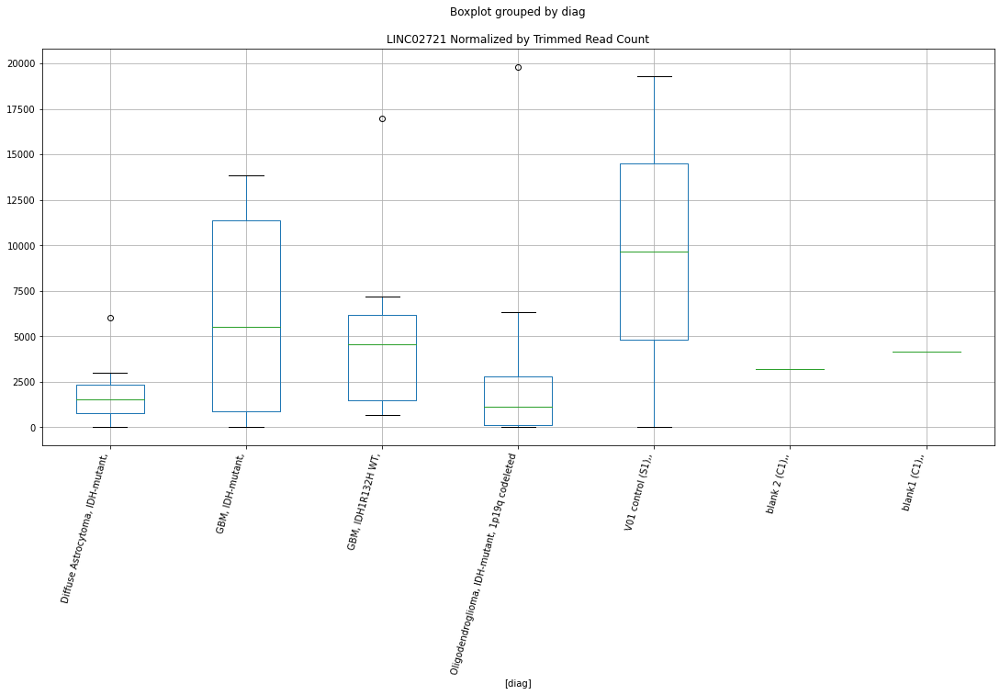

 p : 0.03261906177853567  ( t : 2.315036843777902 ) :  Lexogen  :  bbduk2  :  LOC101928421
Control and blanks
79        0.00
343    1061.57
Name: LOC101928421, dtype: float64
211    0.0
Name: LOC101928421, dtype: float64
475    0.0
Name: LOC101928421, dtype: float64


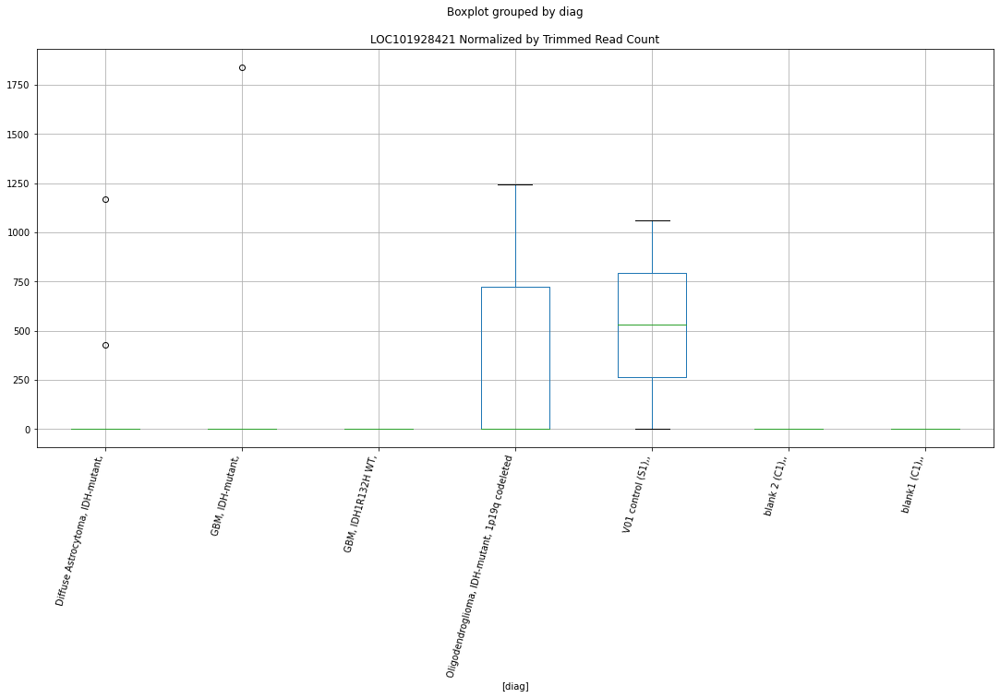

 p : 0.032724283786776456  ( t : 2.313448873631723 ) :  D-plex  :  cutadapt2  :  LINC00330
Control and blanks
76     0.0
340    0.0
Name: LINC00330, dtype: float64
208    529.08
Name: LINC00330, dtype: float64
472    577.96
Name: LINC00330, dtype: float64


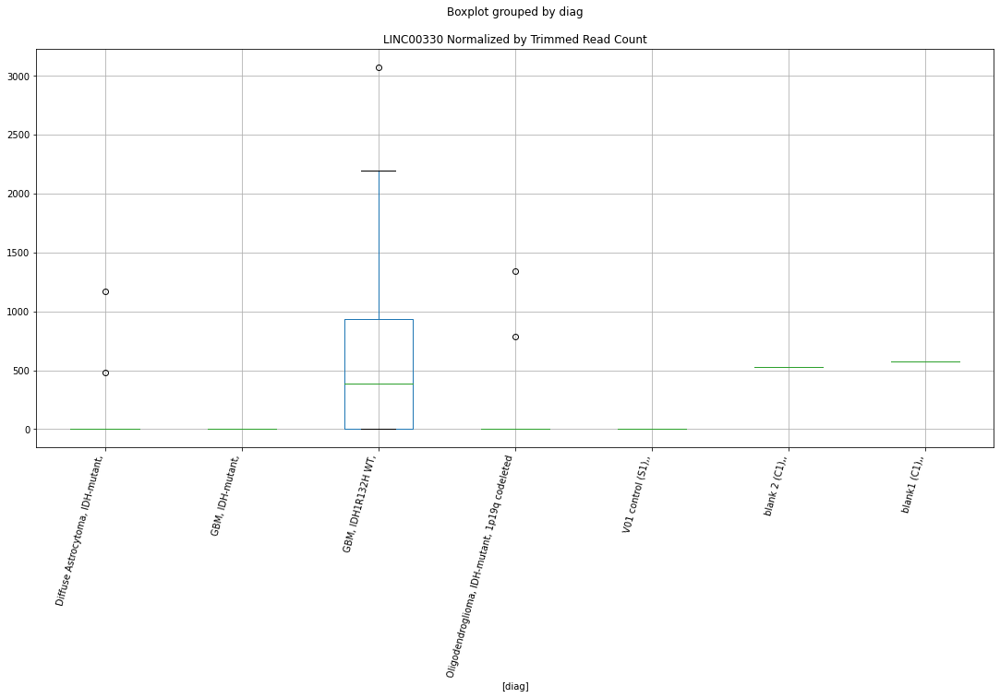

 p : 0.032777099042747164  ( t : 2.3126535917725266 ) :  D-plex  :  bbduk2  :  LINC01137
Control and blanks
73     773.01
337      0.00
Name: LINC01137, dtype: float64
205    0.0
Name: LINC01137, dtype: float64
469    1183.05
Name: LINC01137, dtype: float64


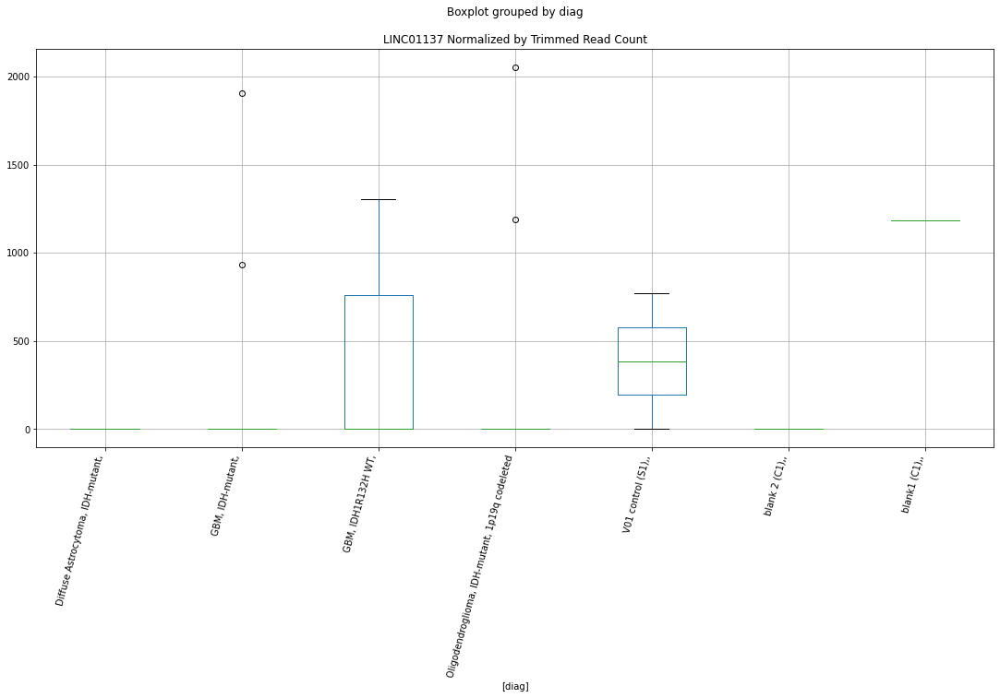

 p : 0.03288349244939965  ( t : 2.311055145218947 ) :  D-plex  :  cutadapt2  :  LINC01137
Control and blanks
76     757.61
340      0.00
Name: LINC01137, dtype: float64
208    0.0
Name: LINC01137, dtype: float64
472    1155.91
Name: LINC01137, dtype: float64


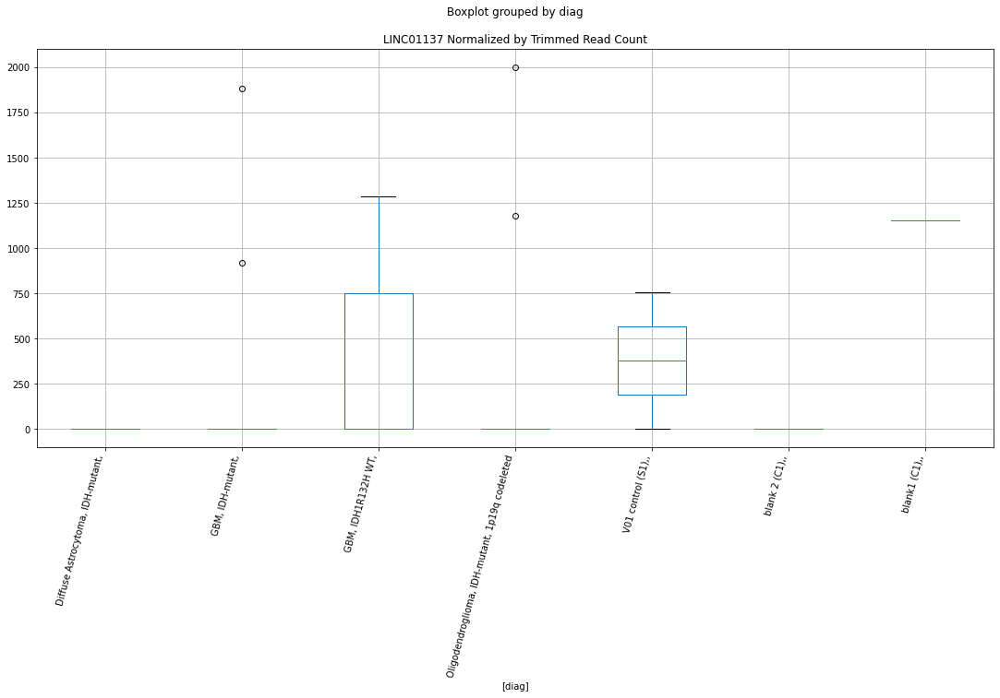

 p : 0.032894780245880974  ( t : 2.3108858399329466 ) :  D-plex  :  bbduk2  :  LOC102724117
Control and blanks
73     0.0
337    0.0
Name: LOC102724117, dtype: float64
205    179.09
Name: LOC102724117, dtype: float64
469    1183.05
Name: LOC102724117, dtype: float64


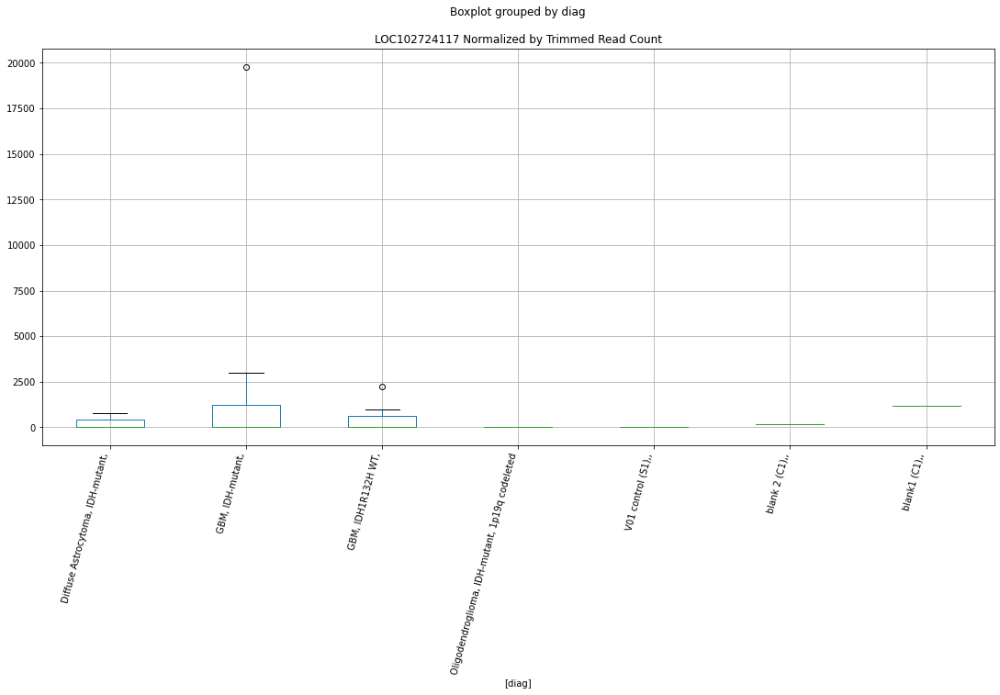

 p : 0.03292344520212389  ( t : 2.31045613737756 ) :  D-plex  :  cutadapt2  :  LOC102724117
Control and blanks
76     0.0
340    0.0
Name: LOC102724117, dtype: float64
208    176.36
Name: LOC102724117, dtype: float64
472    1155.91
Name: LOC102724117, dtype: float64


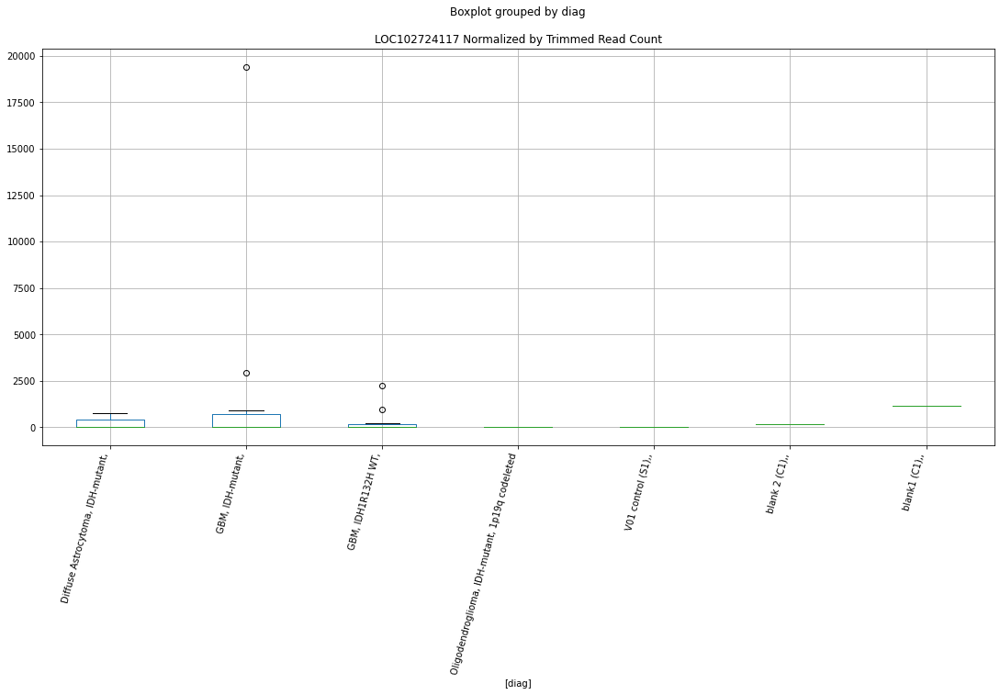

 p : 0.03302990011986621  ( t : 2.3088633557981706 ) :  Lexogen  :  bbduk2  :  LIN52
Control and blanks
79     0.0
343    0.0
Name: LIN52, dtype: float64
211    0.0
Name: LIN52, dtype: float64
475    239.52
Name: LIN52, dtype: float64


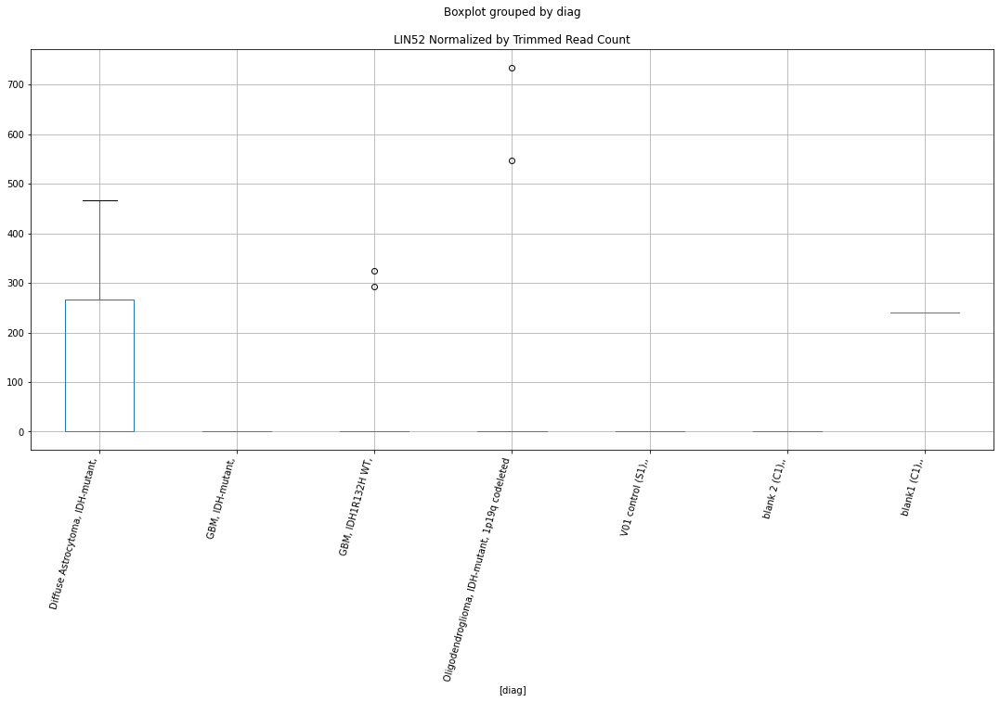

 p : 0.03303791695787178  ( t : 2.3087436005757356 ) :  D-plex  :  cutadapt2  :  LOC100506473
Control and blanks
76     757.61
340      0.00
Name: LOC100506473, dtype: float64
208    2116.32
Name: LOC100506473, dtype: float64
472    2889.78
Name: LOC100506473, dtype: float64


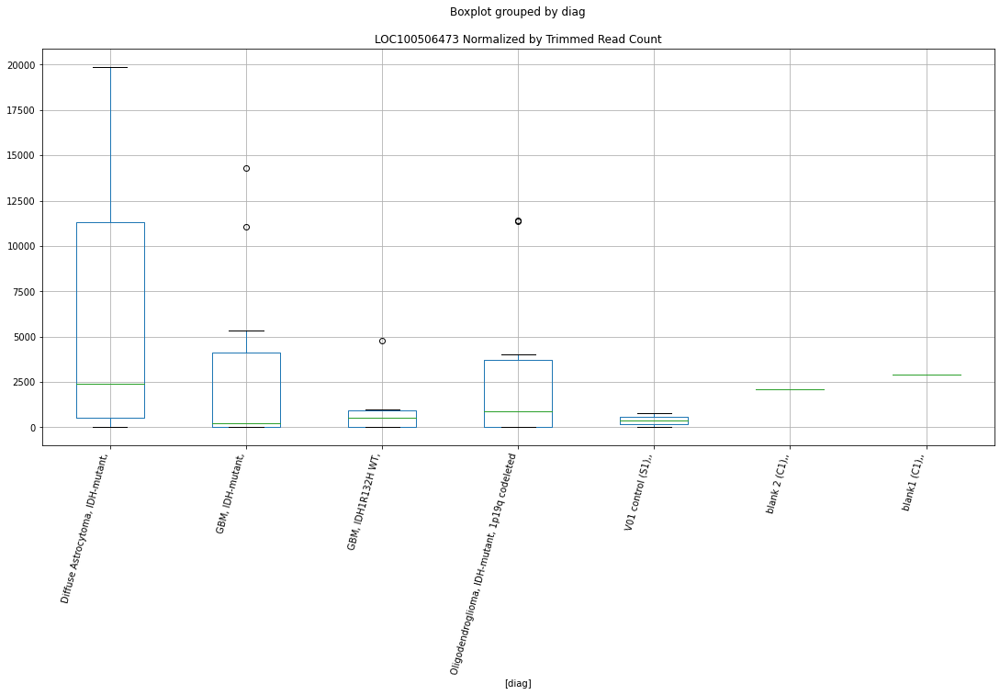

 p : 0.033140684571390425  ( t : 2.307210845173702 ) :  Lexogen  :  cutadapt2  :  LINC02666
Control and blanks
82       0.00
346    420.87
Name: LINC02666, dtype: float64
214    0.0
Name: LINC02666, dtype: float64
478    6648.89
Name: LINC02666, dtype: float64


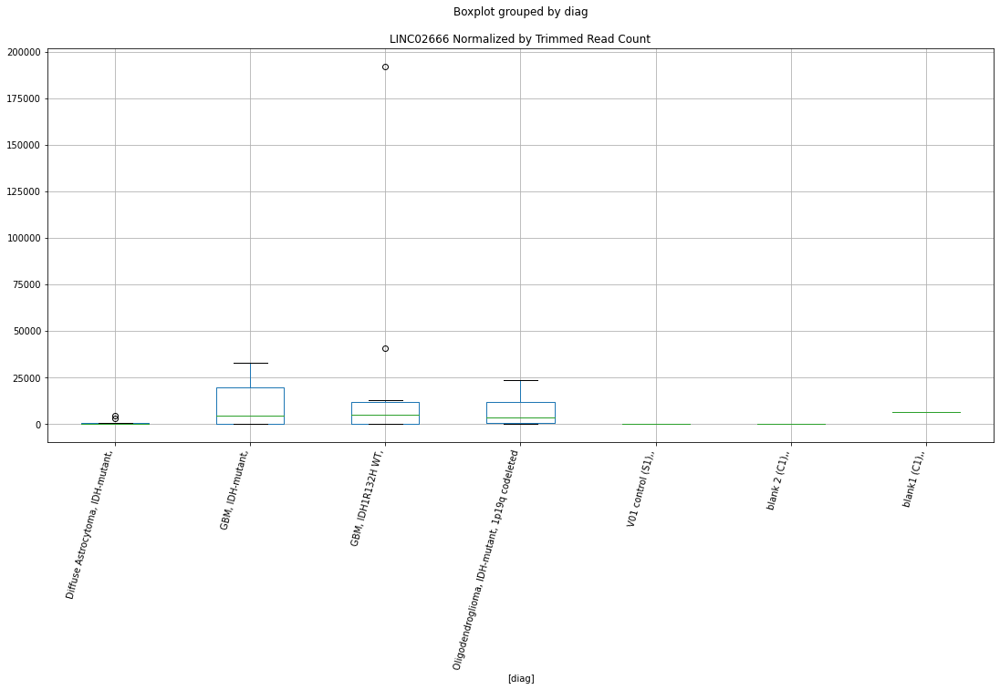

 p : 0.03324390371679714  ( t : 2.305675787302455 ) :  D-plex  :  bbduk2  :  LMNB1
Control and blanks
73     2319.03
337       0.00
Name: LMNB1, dtype: float64
205    1790.91
Name: LMNB1, dtype: float64
469    1183.05
Name: LMNB1, dtype: float64


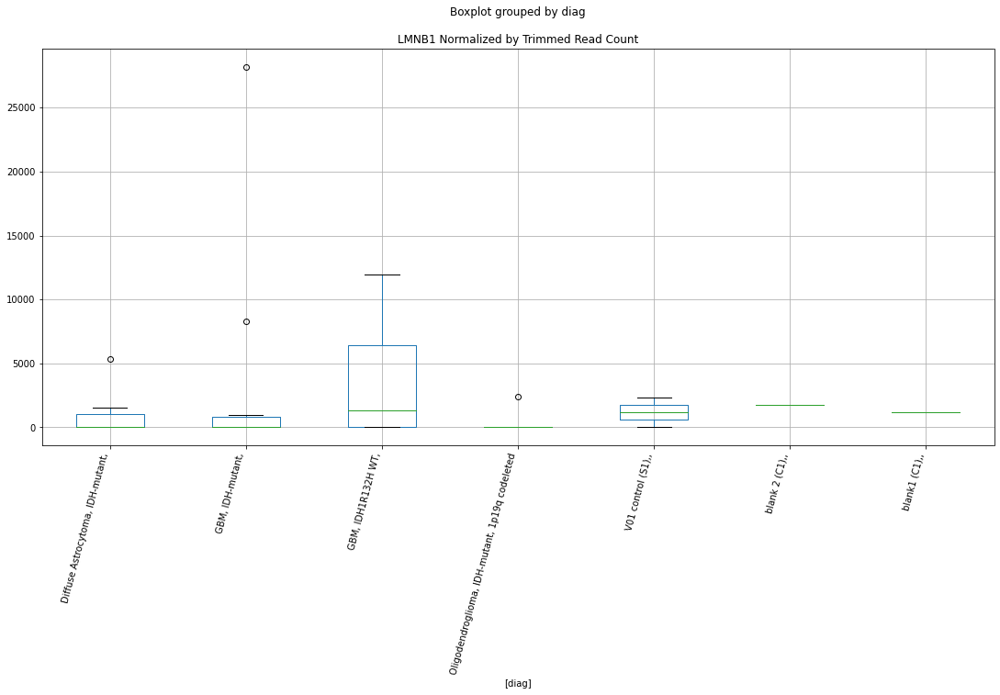

 p : 0.033349708526826886  ( t : 2.3041068575219583 ) :  D-plex  :  cutadapt2  :  LOC105370634
Control and blanks
76     0.0
340    0.0
Name: LOC105370634, dtype: float64
208    0.0
Name: LOC105370634, dtype: float64
472    10403.21
Name: LOC105370634, dtype: float64


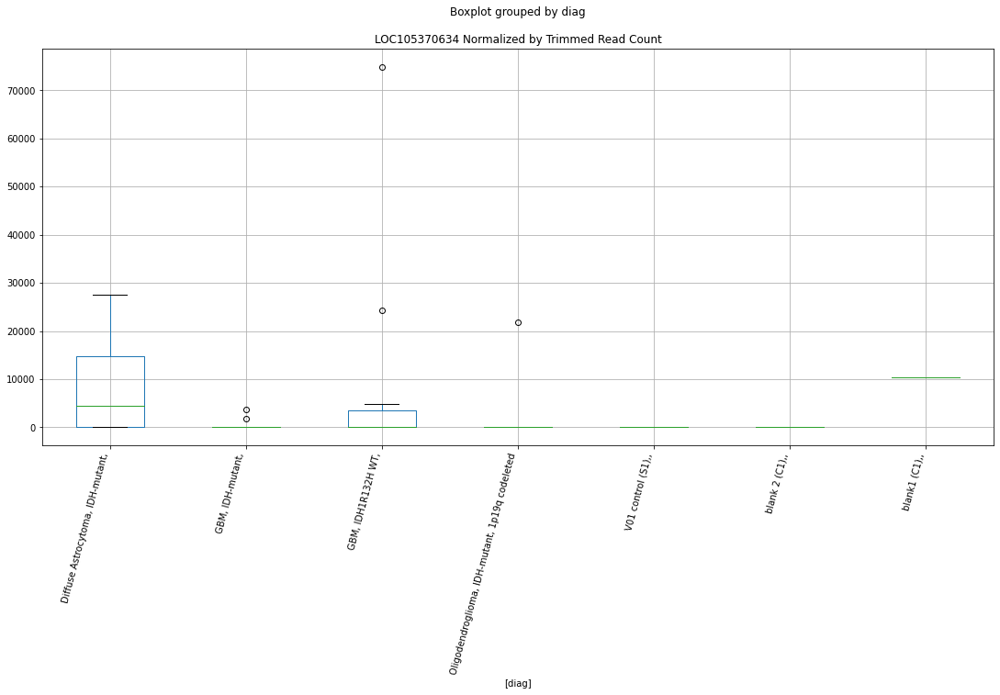

 p : 0.03357541794248942  ( t : 2.3007752879706866 ) :  D-plex  :  bbduk2  :  LINC02814
Control and blanks
73        0.00
337    1780.31
Name: LINC02814, dtype: float64
205    8596.37
Name: LINC02814, dtype: float64
469    5323.75
Name: LINC02814, dtype: float64


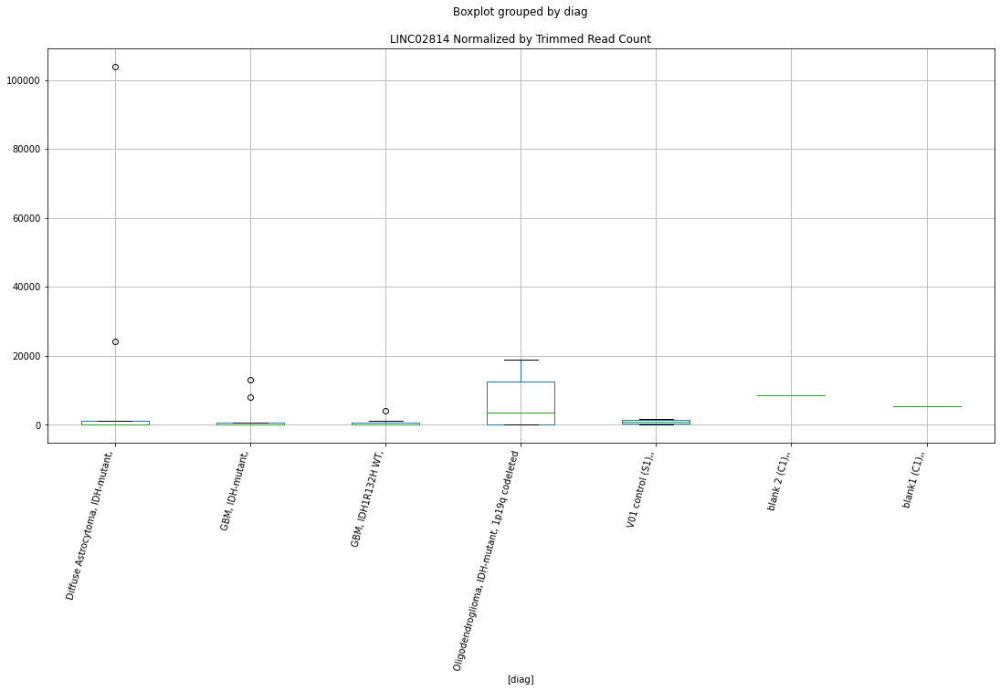

 p : 0.033630345697174005  ( t : 2.2999676725651965 ) :  D-plex  :  bbduk2  :  LINC01220
Control and blanks
73     0.0
337    0.0
Name: LINC01220, dtype: float64
205    179.09
Name: LINC01220, dtype: float64
469    0.0
Name: LINC01220, dtype: float64


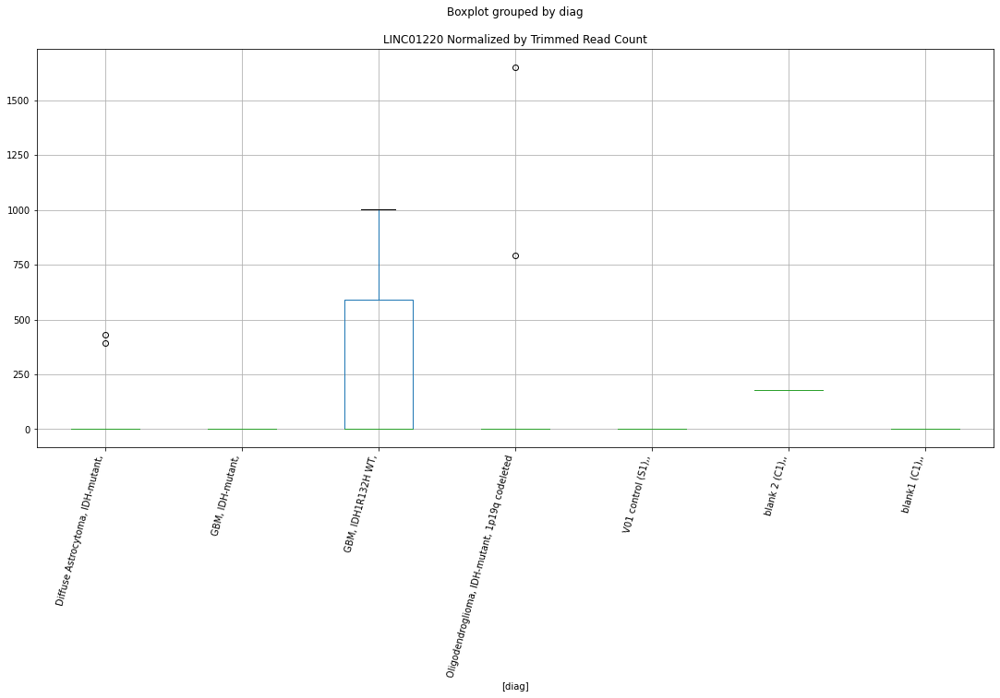

 p : 0.033760090183057624  ( t : 2.298064854669342 ) :  Lexogen  :  bbduk2  :  LOC101927550
Control and blanks
79     17167.19
343     1486.20
Name: LOC101927550, dtype: float64
211    11478.87
Name: LOC101927550, dtype: float64
475    0.0
Name: LOC101927550, dtype: float64


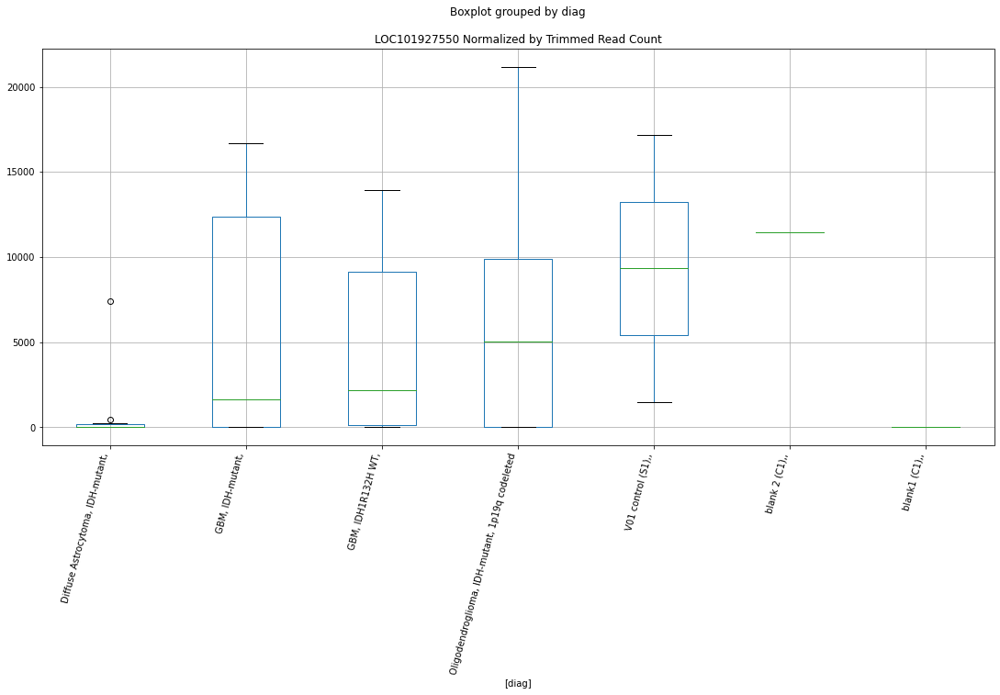

 p : 0.033768866671212254  ( t : 2.297936384602698 ) :  D-plex  :  bbduk2  :  LINC01868
Control and blanks
73        0.00
337    1780.31
Name: LINC01868, dtype: float64
205    1253.64
Name: LINC01868, dtype: float64
469    4140.69
Name: LINC01868, dtype: float64


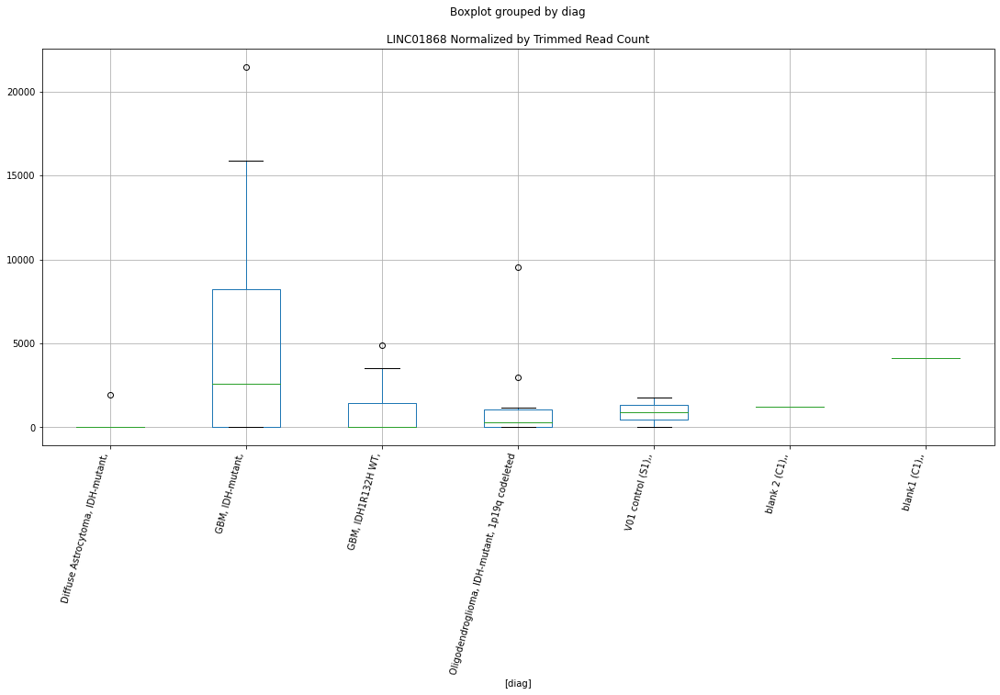

 p : 0.03380777083548403  ( t : 2.2973672785870223 ) :  D-plex  :  cutadapt2  :  LOC100506851
Control and blanks
76     0.0
340    0.0
Name: LOC100506851, dtype: float64
208    4585.37
Name: LOC100506851, dtype: float64
472    0.0
Name: LOC100506851, dtype: float64


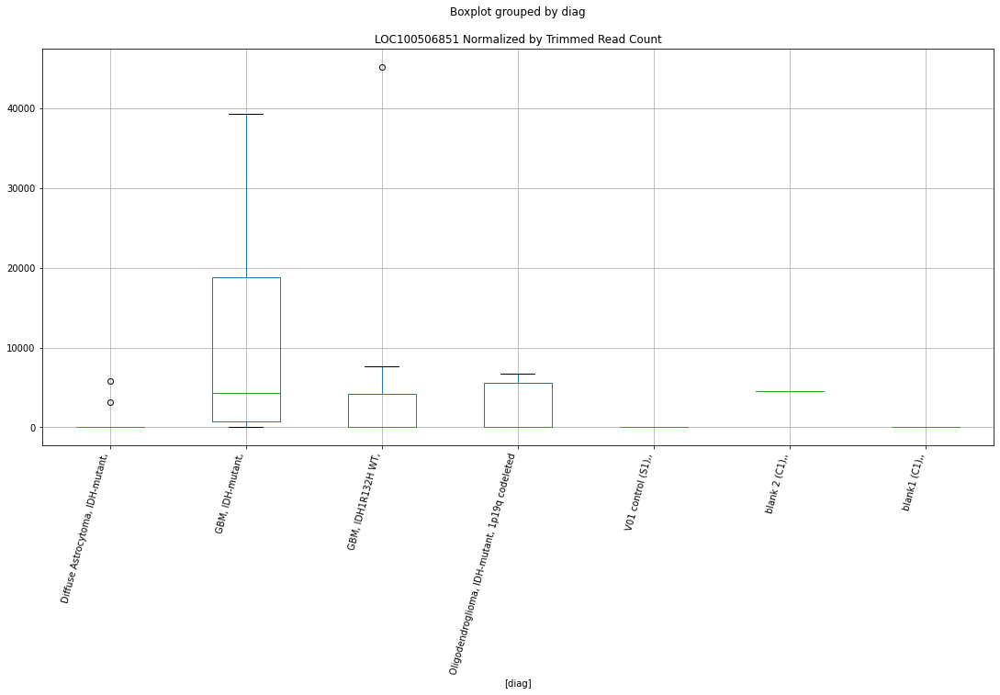

 p : 0.033921617127873664  ( t : 2.2957053687476527 ) :  Lexogen  :  bbduk2  :  LOC101928212
Control and blanks
79     0.0
343    0.0
Name: LOC101928212, dtype: float64
211    0.0
Name: LOC101928212, dtype: float64
475    0.0
Name: LOC101928212, dtype: float64


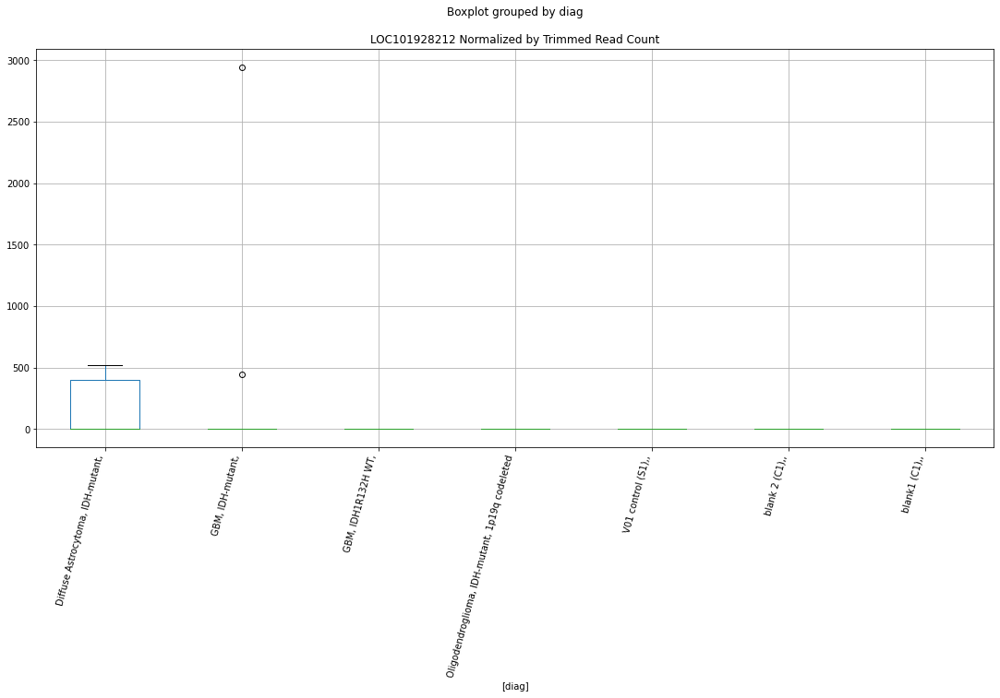

 p : 0.03395286898216789  ( t : 2.295250063479465 ) :  D-plex  :  bbduk2  :  LINC01632
Control and blanks
73     0.0
337    0.0
Name: LINC01632, dtype: float64
205    20237.28
Name: LINC01632, dtype: float64
469    49688.29
Name: LINC01632, dtype: float64


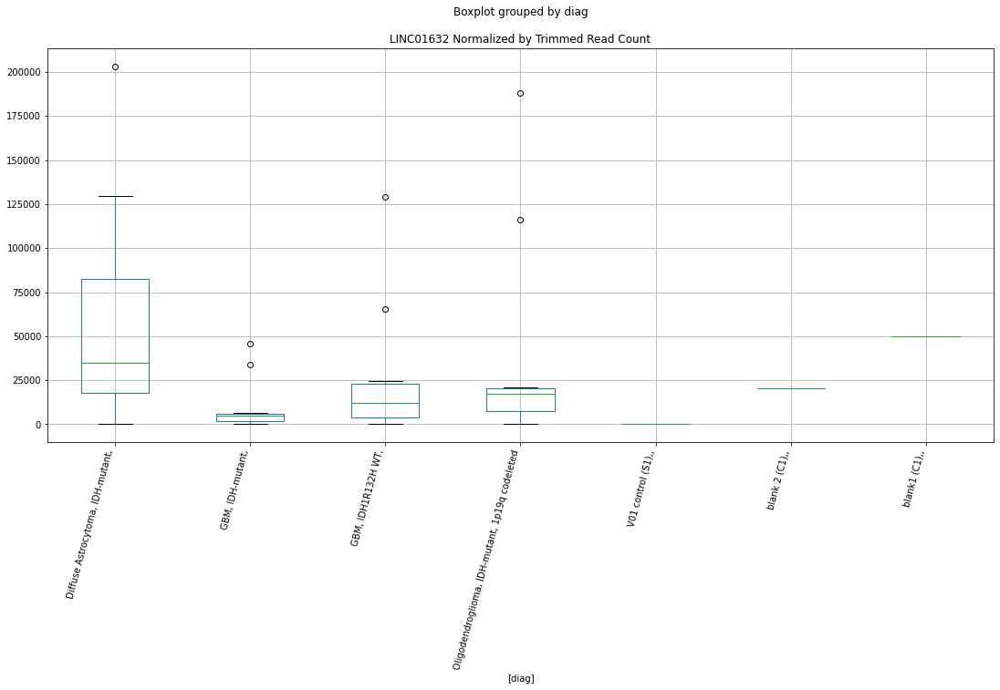

 p : 0.033990152832900994  ( t : 2.294707386397354 ) :  Lexogen  :  cutadapt2  :  LOC101928212
Control and blanks
82     0.0
346    0.0
Name: LOC101928212, dtype: float64
214    0.0
Name: LOC101928212, dtype: float64
478    0.0
Name: LOC101928212, dtype: float64


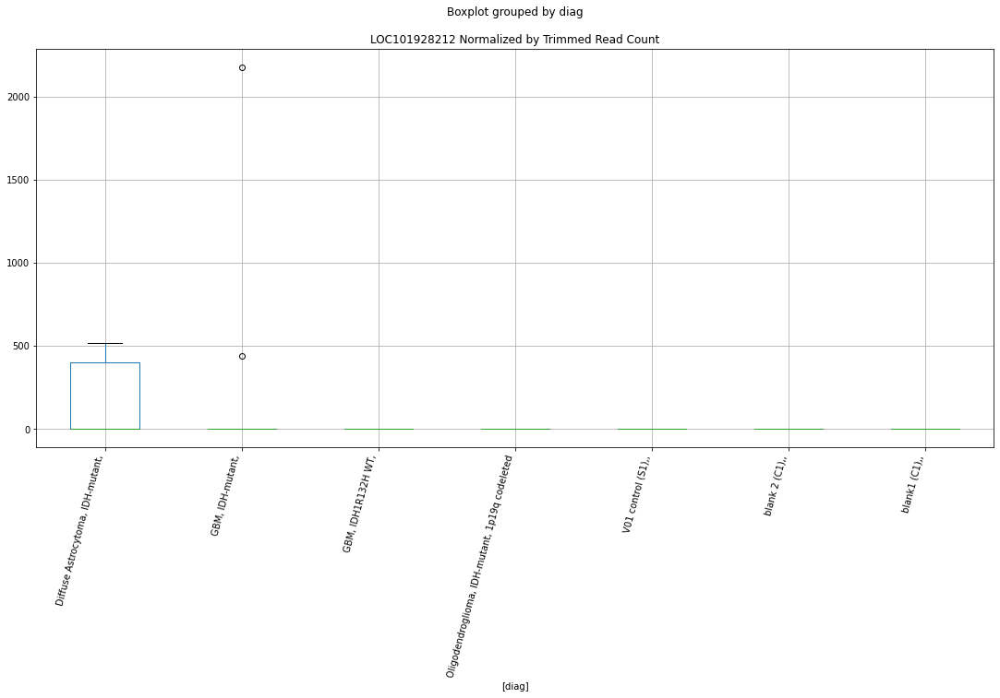

 p : 0.03399596235660669  ( t : 2.2946228767991594 ) :  Lexogen  :  bbduk2  :  LINC01511
Control and blanks
79     0.0
343    0.0
Name: LINC01511, dtype: float64
211    546.61
Name: LINC01511, dtype: float64
475    0.0
Name: LINC01511, dtype: float64


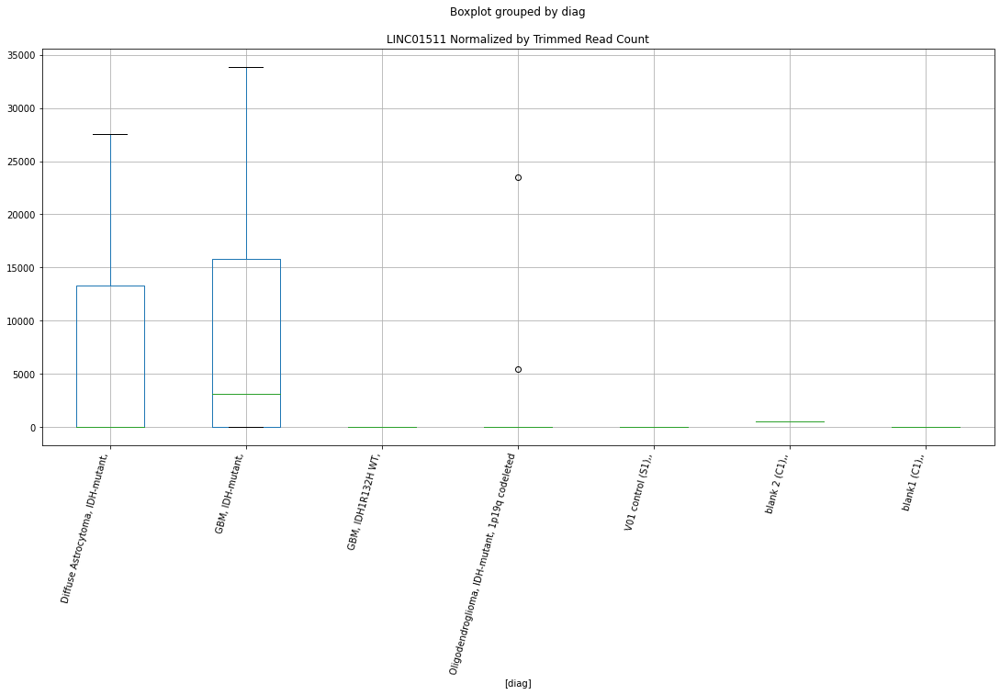

 p : 0.03415591437031885  ( t : 2.29230133781966 ) :  Lexogen  :  cutadapt2  :  LOC101927550
Control and blanks
82     17040.61
346     1683.48
Name: LOC101927550, dtype: float64
214    11391.51
Name: LOC101927550, dtype: float64
478    0.0
Name: LOC101927550, dtype: float64


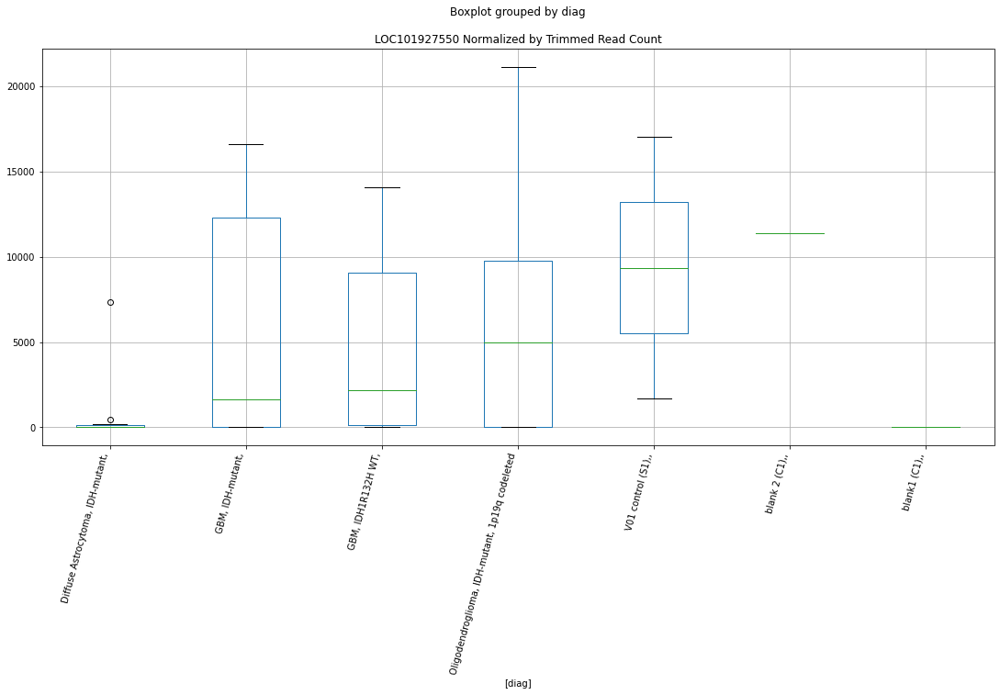

 p : 0.034226131632412914  ( t : 2.2912853863775093 ) :  D-plex  :  cutadapt2  :  LOC100268168
Control and blanks
76        0.00
340    1761.46
Name: LOC100268168, dtype: float64
208    352.72
Name: LOC100268168, dtype: float64
472    0.0
Name: LOC100268168, dtype: float64


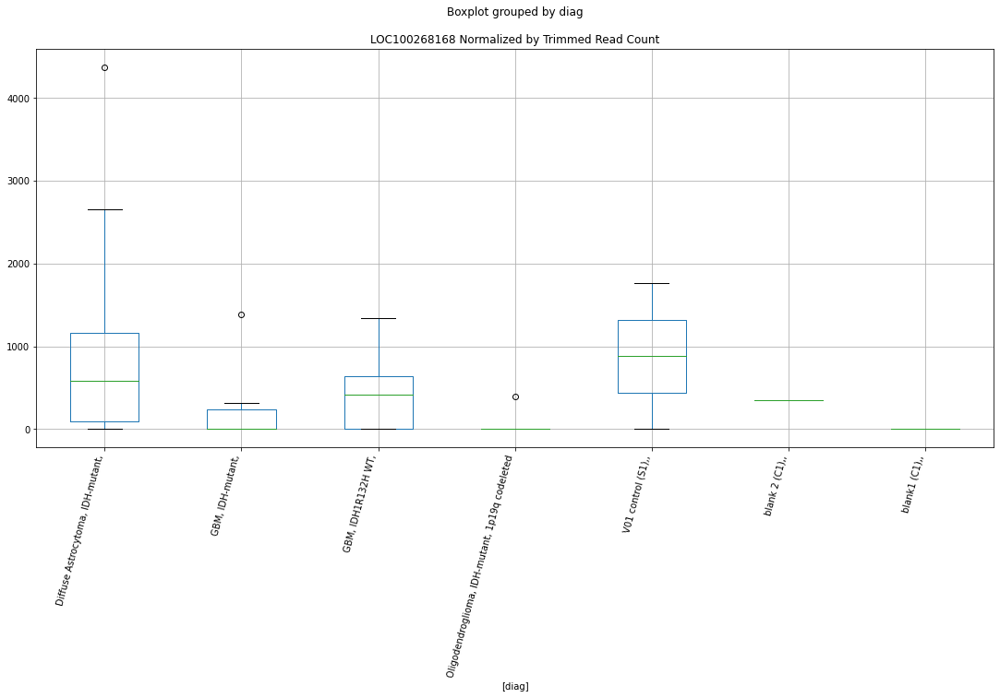

 p : 0.03426713581468157  ( t : 2.290693002416248 ) :  D-plex  :  bbduk2  :  LINC02802
Control and blanks
73        0.00
337    1780.31
Name: LINC02802, dtype: float64
205    0.0
Name: LINC02802, dtype: float64
469    0.0
Name: LINC02802, dtype: float64


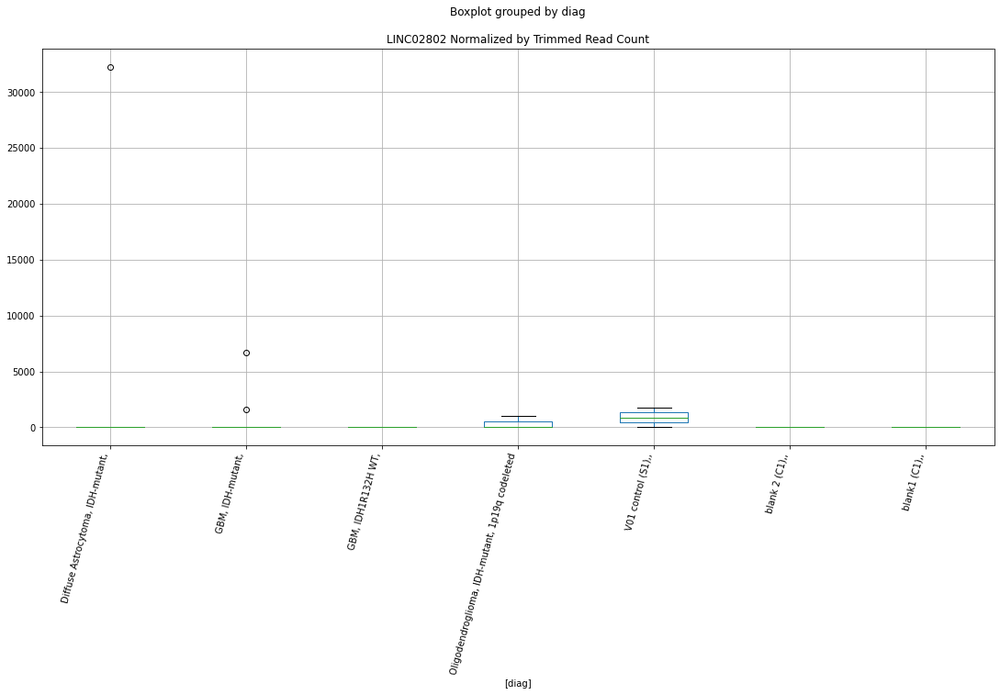

 p : 0.034331268251456895  ( t : 2.289767801819636 ) :  Lexogen  :  bbduk2  :  LOC100126784
Control and blanks
79     1430.6
343       0.0
Name: LOC100126784, dtype: float64
211    0.0
Name: LOC100126784, dtype: float64
475    0.0
Name: LOC100126784, dtype: float64


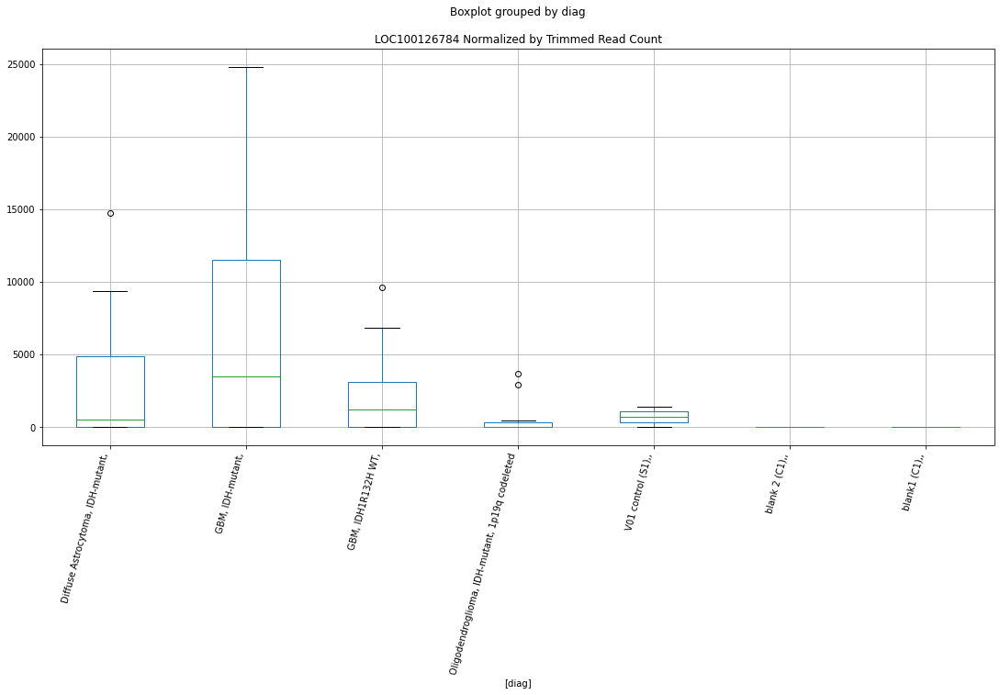

 p : 0.03438279371250705  ( t : 2.289025633593328 ) :  Lexogen  :  bbduk2  :  LOC101928474
Control and blanks
79     0.0
343    0.0
Name: LOC101928474, dtype: float64
211    4372.9
Name: LOC101928474, dtype: float64
475    0.0
Name: LOC101928474, dtype: float64


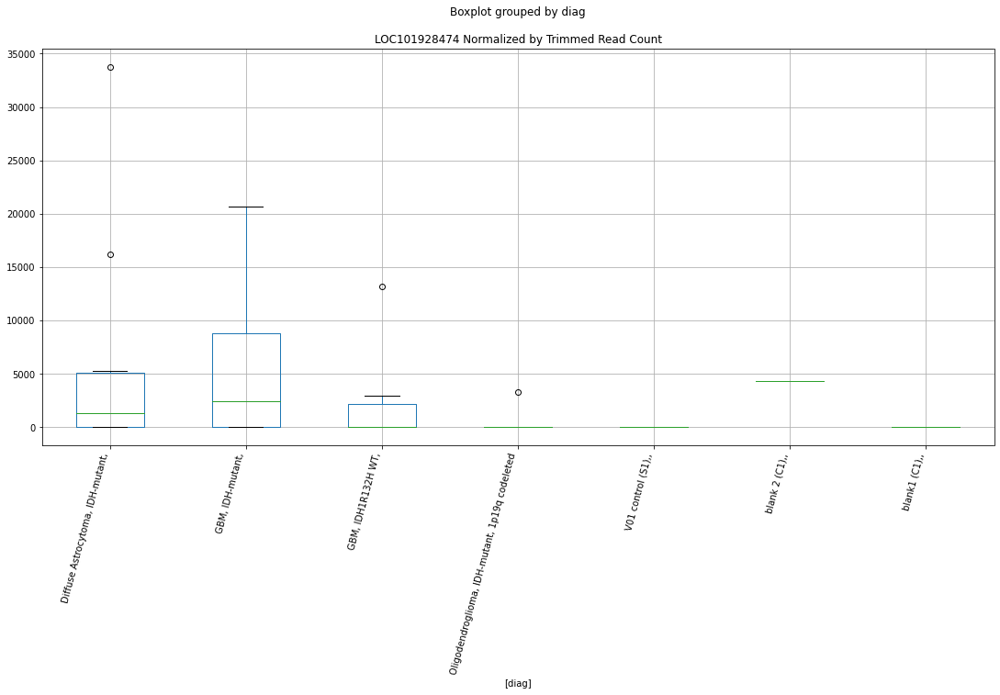

 p : 0.03439815357699948  ( t : 2.2888045907574406 ) :  Lexogen  :  cutadapt2  :  LOC100126784
Control and blanks
82     1420.05
346       0.00
Name: LOC100126784, dtype: float64
214    0.0
Name: LOC100126784, dtype: float64
478    0.0
Name: LOC100126784, dtype: float64


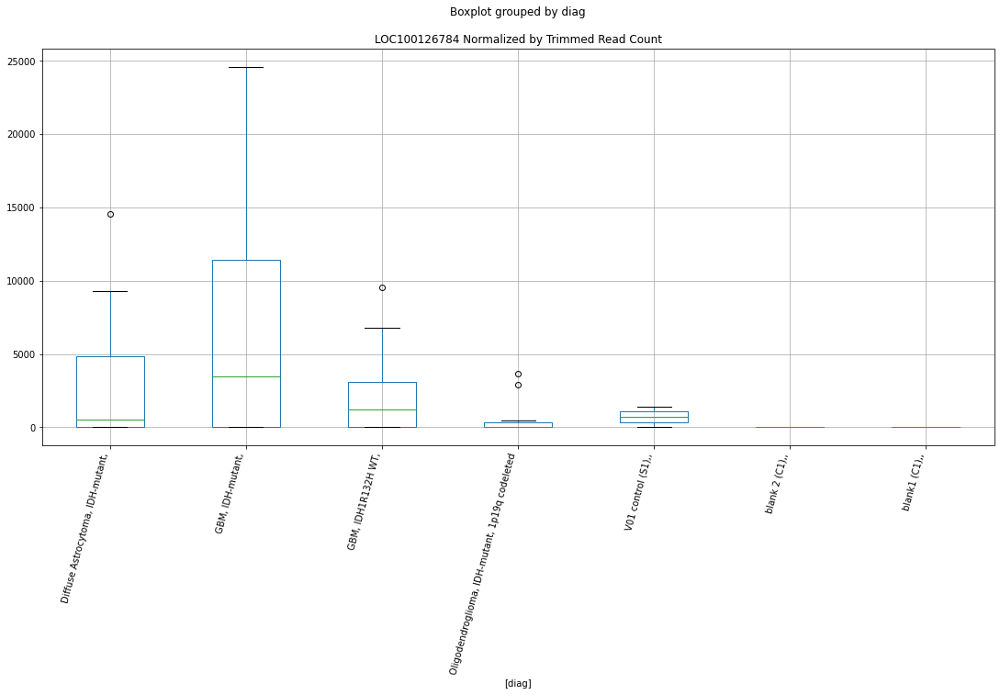

 p : 0.03445825040434066  ( t : 2.2879406187307696 ) :  Lexogen  :  bbduk2  :  LOC101929413
Control and blanks
79         0.00
343    30997.89
Name: LOC101929413, dtype: float64
211    4372.9
Name: LOC101929413, dtype: float64
475    0.0
Name: LOC101929413, dtype: float64


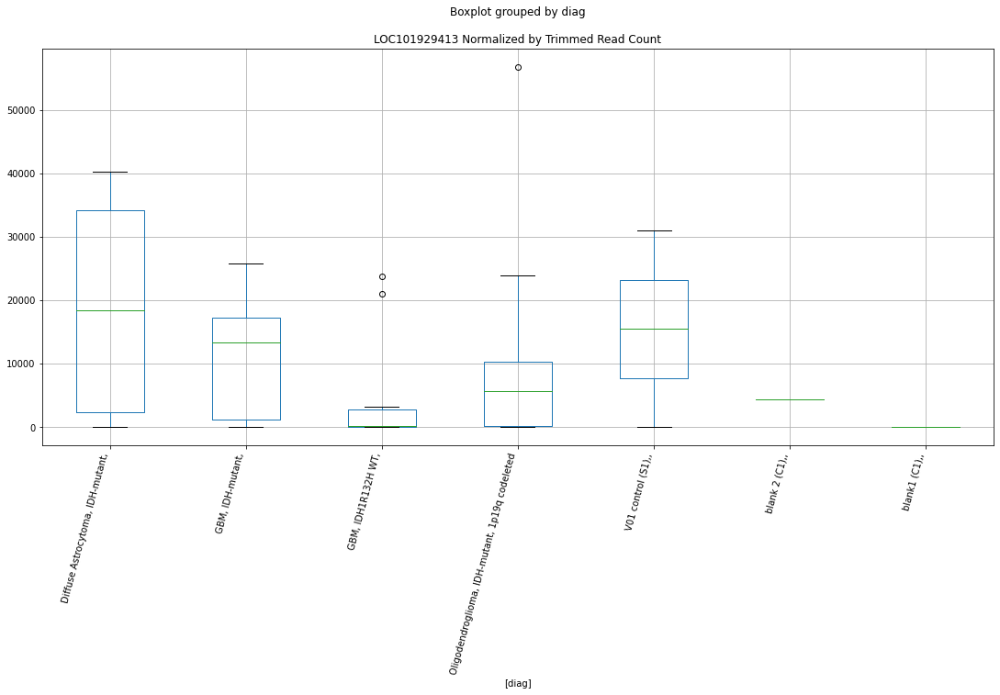

 p : 0.034514364875290776  ( t : 2.2871351572632155 ) :  Lexogen  :  cutadapt2  :  LOC101928474
Control and blanks
82     0.0
346    0.0
Name: LOC101928474, dtype: float64
214    4339.62
Name: LOC101928474, dtype: float64
478    0.0
Name: LOC101928474, dtype: float64


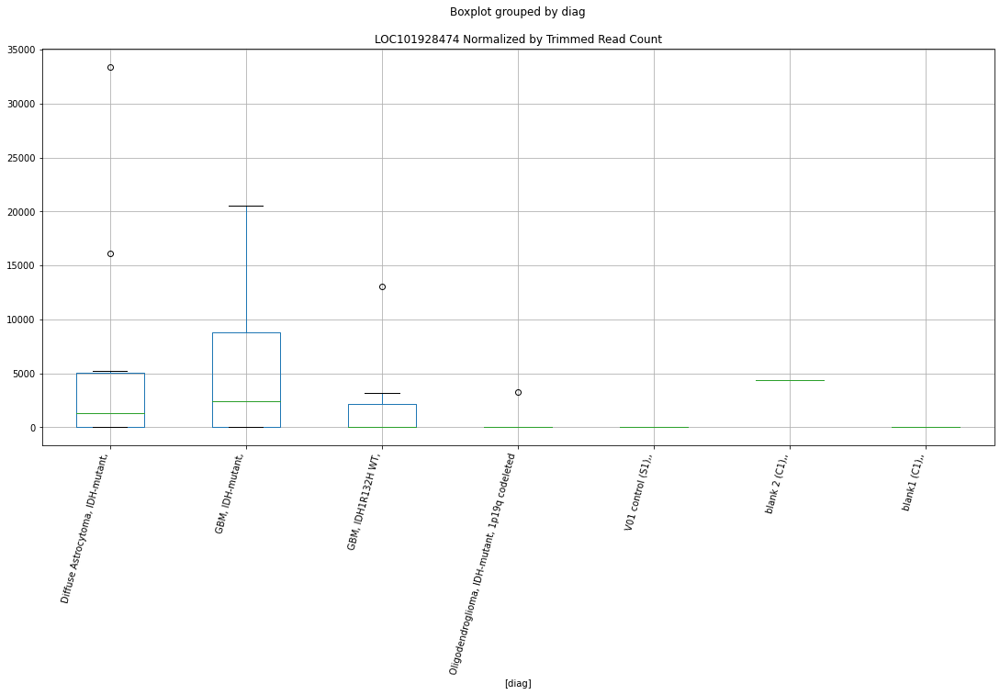

 p : 0.03464690553799123  ( t : 2.2852374861326132 ) :  Lexogen  :  cutadapt2  :  LINC01511
Control and blanks
82     0.0
346    0.0
Name: LINC01511, dtype: float64
214    0.0
Name: LINC01511, dtype: float64
478    0.0
Name: LINC01511, dtype: float64


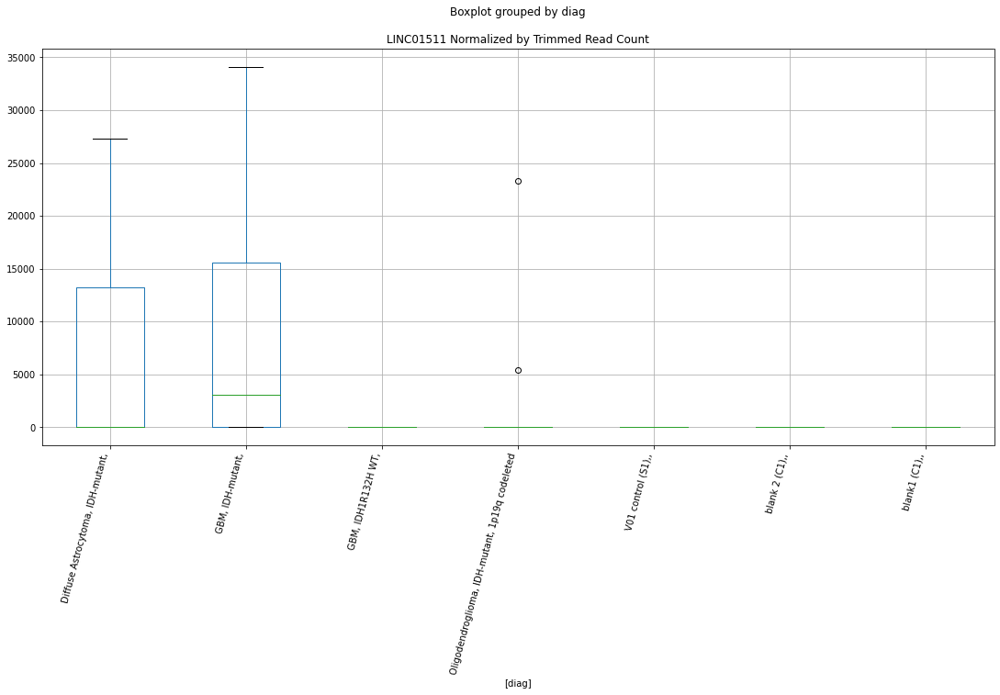

 p : 0.034666957142065066  ( t : 2.2849509797840066 ) :  D-plex  :  cutadapt2  :  LOC105369965
Control and blanks
76          0.0
340    147963.0
Name: LOC105369965, dtype: float64
208    3879.92
Name: LOC105369965, dtype: float64
472    4623.65
Name: LOC105369965, dtype: float64


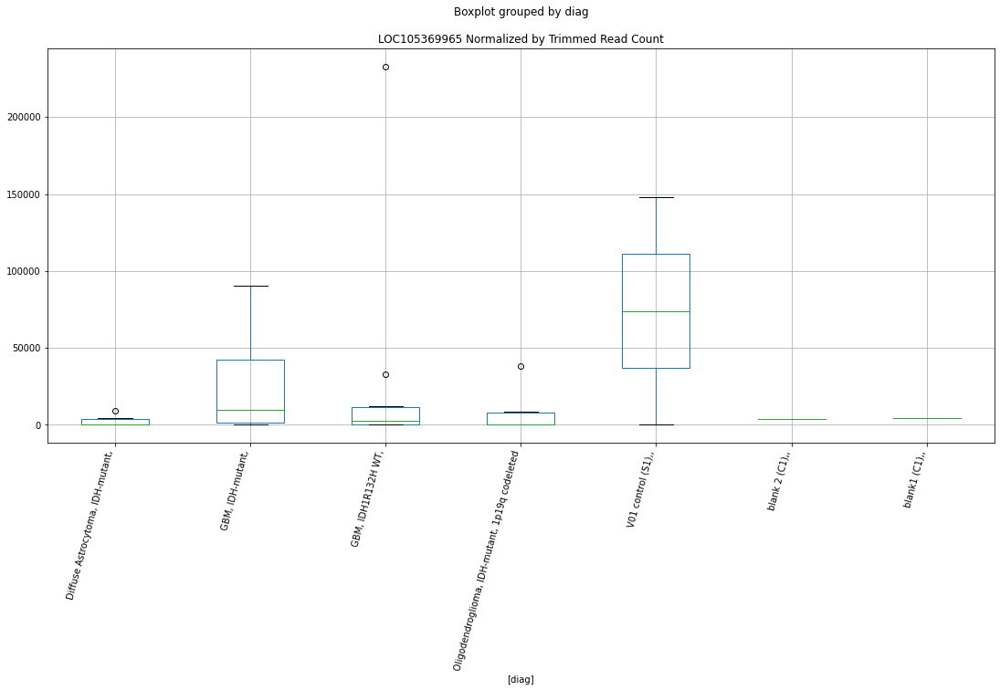

 p : 0.03467686815222979  ( t : 2.284809423462675 ) :  D-plex  :  bbduk2  :  LGALS3
Control and blanks
73        0.00
337    2670.47
Name: LGALS3, dtype: float64
205    109066.39
Name: LGALS3, dtype: float64
469    910360.54
Name: LGALS3, dtype: float64


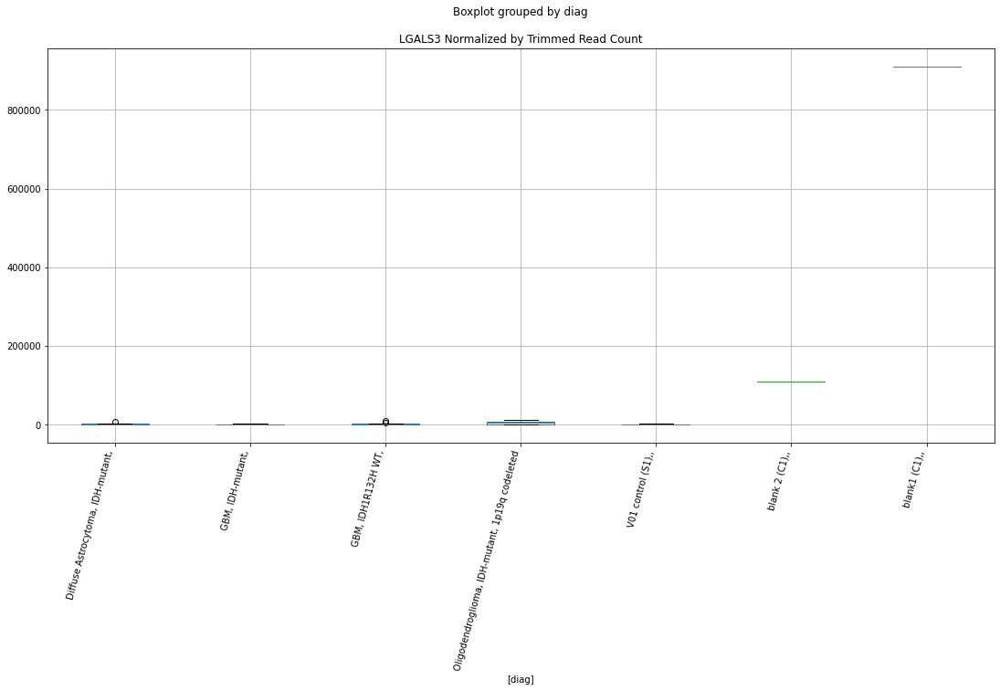

 p : 0.03471075806053301  ( t : 2.28432566577719 ) :  Lexogen  :  bbduk2  :  LINC02700
Control and blanks
79     0.0
343    0.0
Name: LINC02700, dtype: float64
211    0.0
Name: LINC02700, dtype: float64
475    0.0
Name: LINC02700, dtype: float64


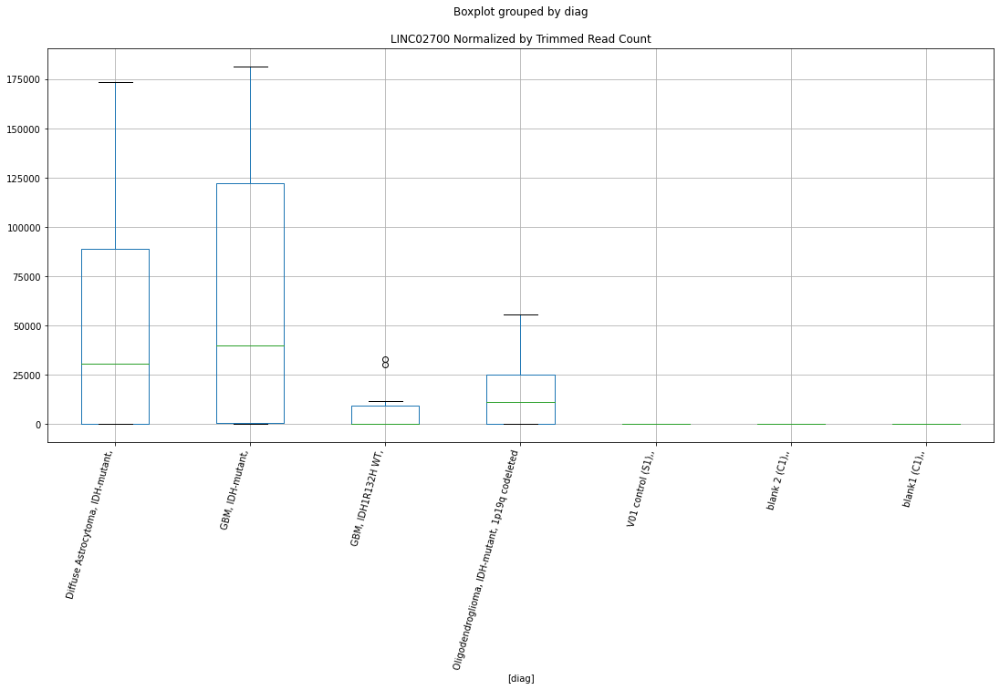

 p : 0.03479667123125395  ( t : 2.2831012643701487 ) :  D-plex  :  bbduk2  :  LOC102724507
Control and blanks
73     0.0
337    0.0
Name: LOC102724507, dtype: float64
205    537.27
Name: LOC102724507, dtype: float64
469    0.0
Name: LOC102724507, dtype: float64


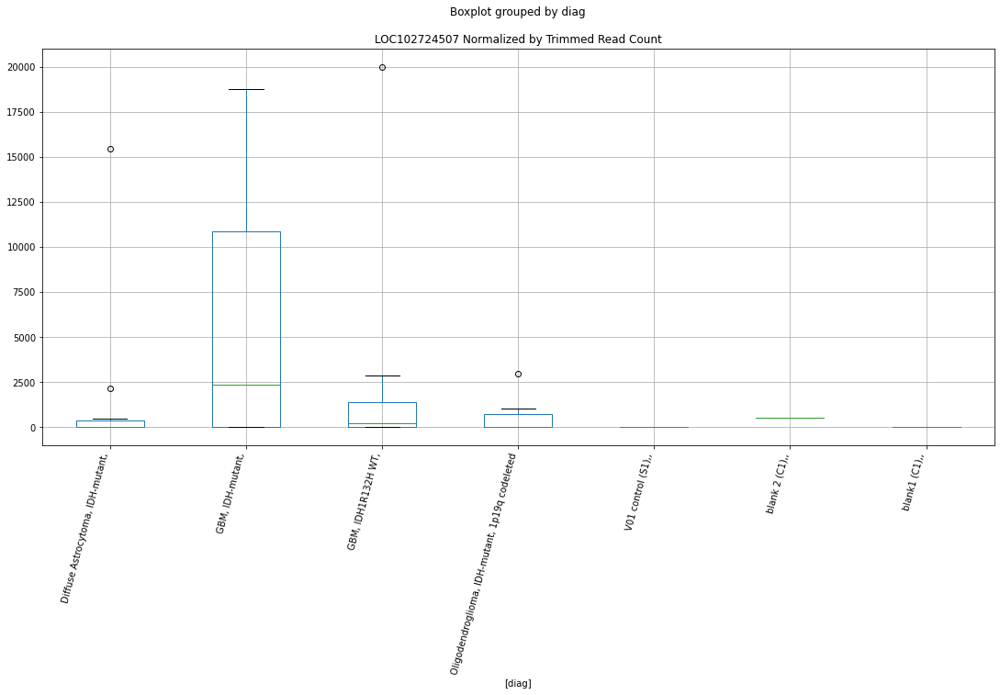

 p : 0.034989266818530915  ( t : 2.280366602459921 ) :  D-plex  :  bbduk2  :  LOC101928351
Control and blanks
73     0.0
337    0.0
Name: LOC101928351, dtype: float64
205    895.45
Name: LOC101928351, dtype: float64
469    1774.58
Name: LOC101928351, dtype: float64


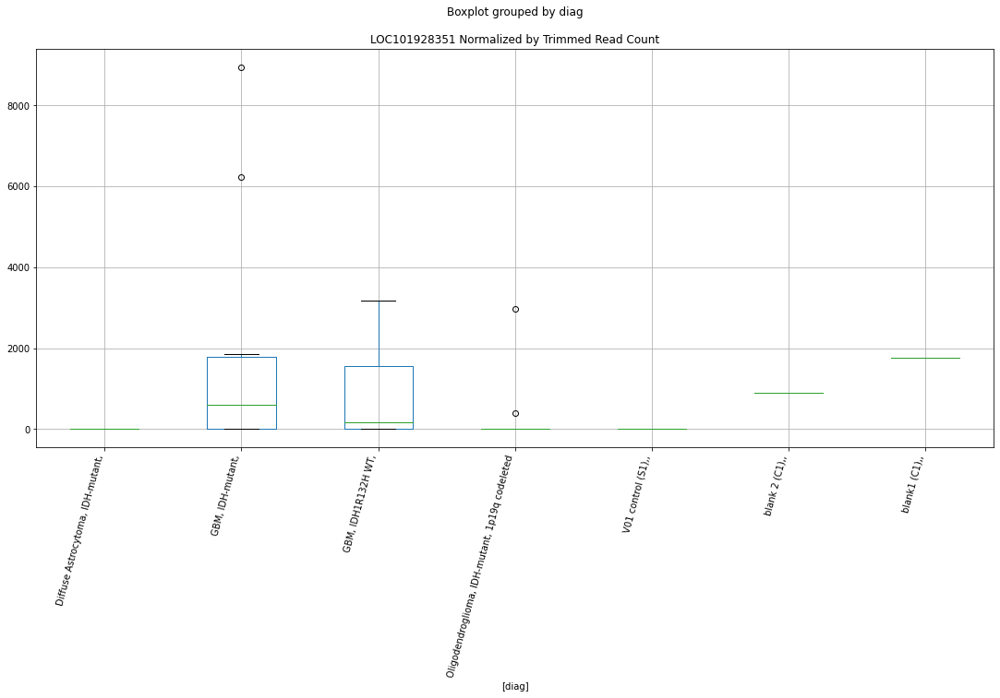

 p : 0.035118580040589494  ( t : 2.2785382919945474 ) :  Lexogen  :  bbduk2  :  LOC105370614
Control and blanks
79     0.0
343    0.0
Name: LOC105370614, dtype: float64
211    1913.14
Name: LOC105370614, dtype: float64
475    5748.38
Name: LOC105370614, dtype: float64


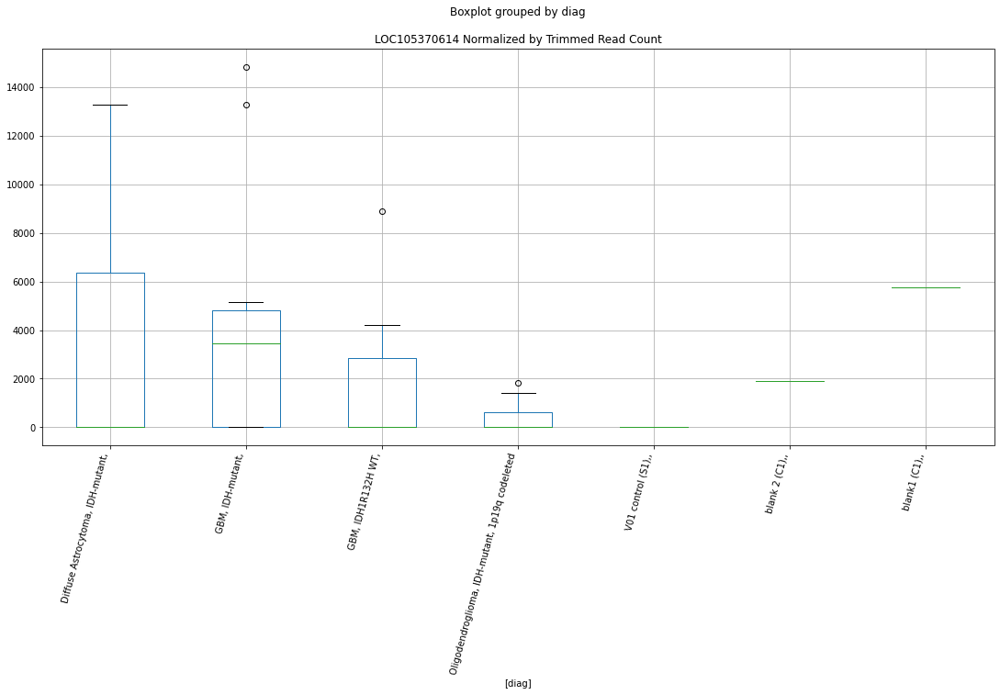

 p : 0.03513379922230288  ( t : 2.278323523659117 ) :  D-plex  :  cutadapt2  :  LOC105370415
Control and blanks
76     0.0
340    0.0
Name: LOC105370415, dtype: float64
208    1939.96
Name: LOC105370415, dtype: float64
472    0.0
Name: LOC105370415, dtype: float64


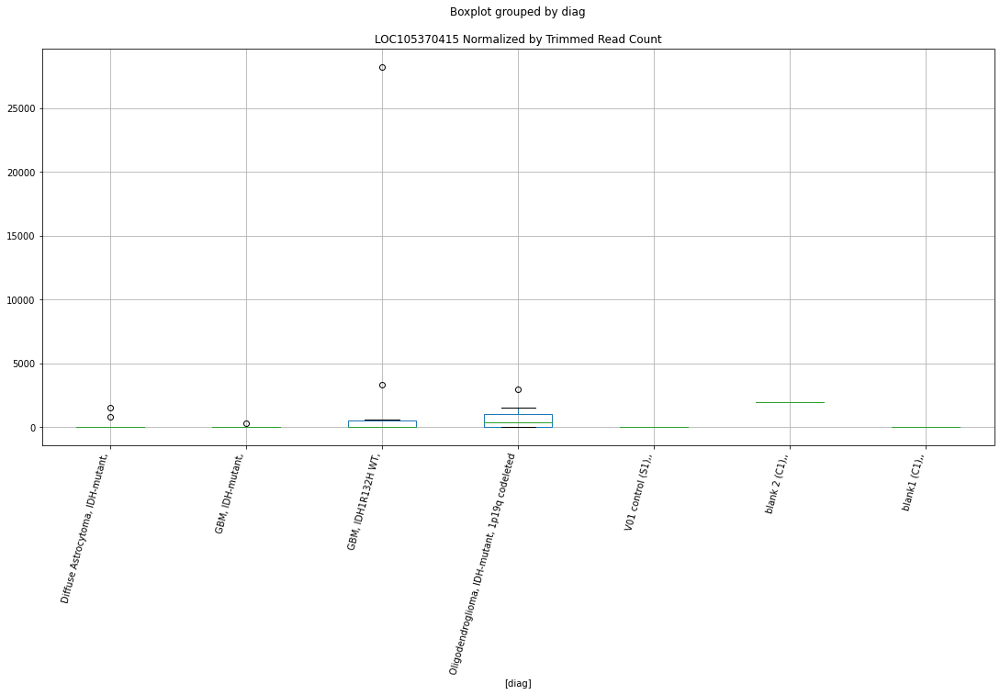

 p : 0.03517902939210053  ( t : 2.277685757313265 ) :  D-plex  :  cutadapt2  :  LOC101928351
Control and blanks
76     0.0
340    0.0
Name: LOC101928351, dtype: float64
208    1058.16
Name: LOC101928351, dtype: float64
472    1155.91
Name: LOC101928351, dtype: float64


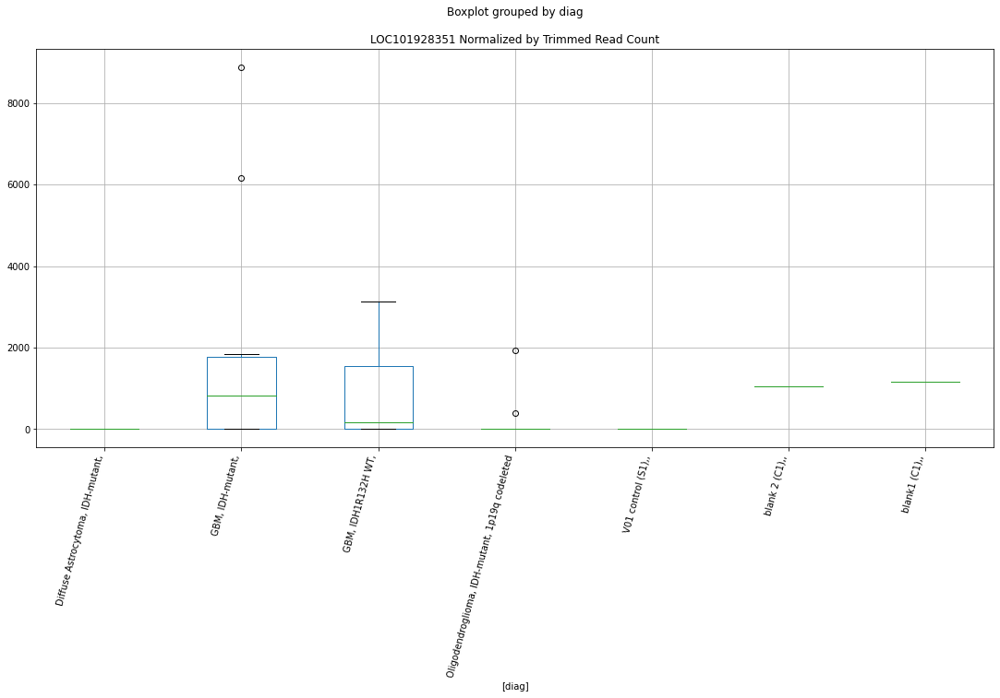

 p : 0.035193207964596546  ( t : 2.2774859890590418 ) :  Lexogen  :  bbduk2  :  LIFR
Control and blanks
79        0.00
343    6157.12
Name: LIFR, dtype: float64
211    2733.06
Name: LIFR, dtype: float64
475    2395.16
Name: LIFR, dtype: float64


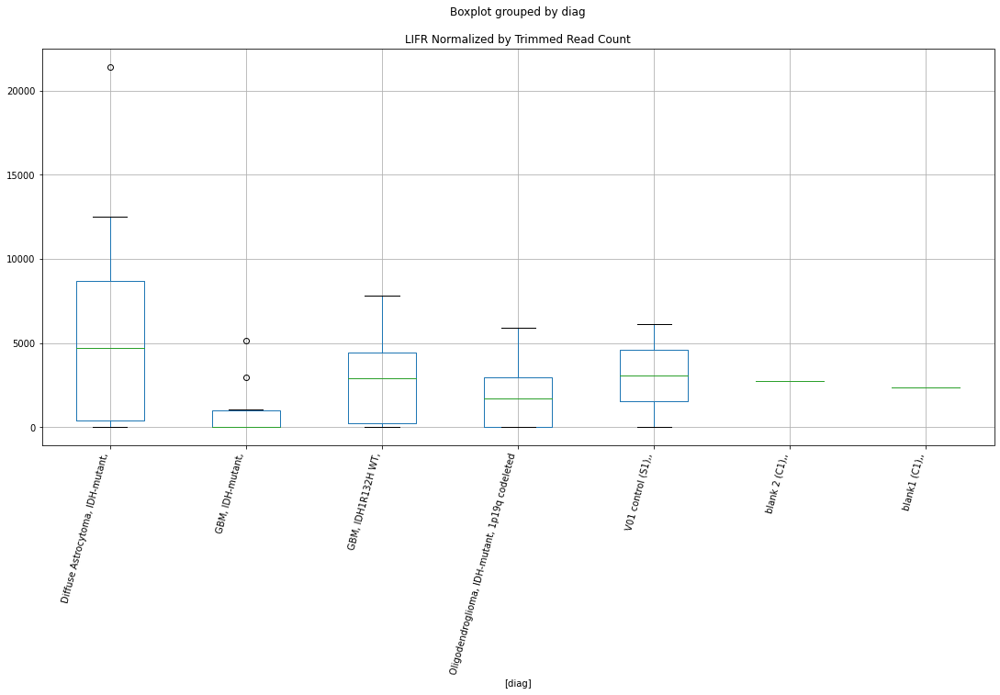

 p : 0.03519835118770499  ( t : 2.2774135422908053 ) :  D-plex  :  cutadapt2  :  LGALS3
Control and blanks
76        0.0
340    2642.2
Name: LGALS3, dtype: float64
208    107403.37
Name: LGALS3, dtype: float64
472    889474.04
Name: LGALS3, dtype: float64


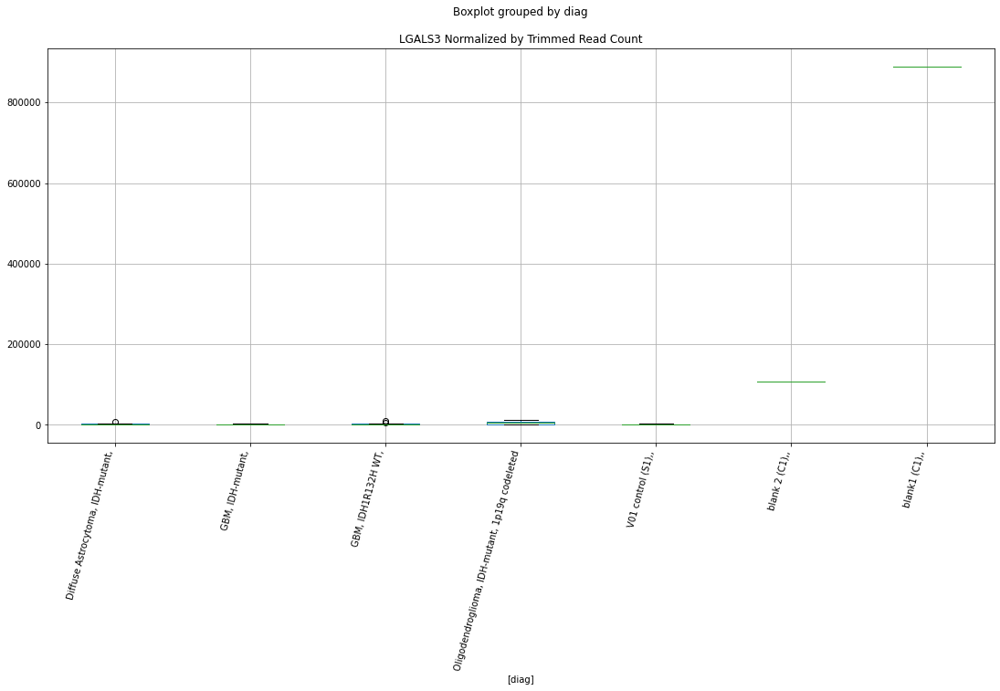

 p : 0.03523162519725188  ( t : 2.2769450854477333 ) :  D-plex  :  bbduk2  :  LOC102724557
Control and blanks
73     773.01
337      0.00
Name: LOC102724557, dtype: float64
205    0.0
Name: LOC102724557, dtype: float64
469    0.0
Name: LOC102724557, dtype: float64


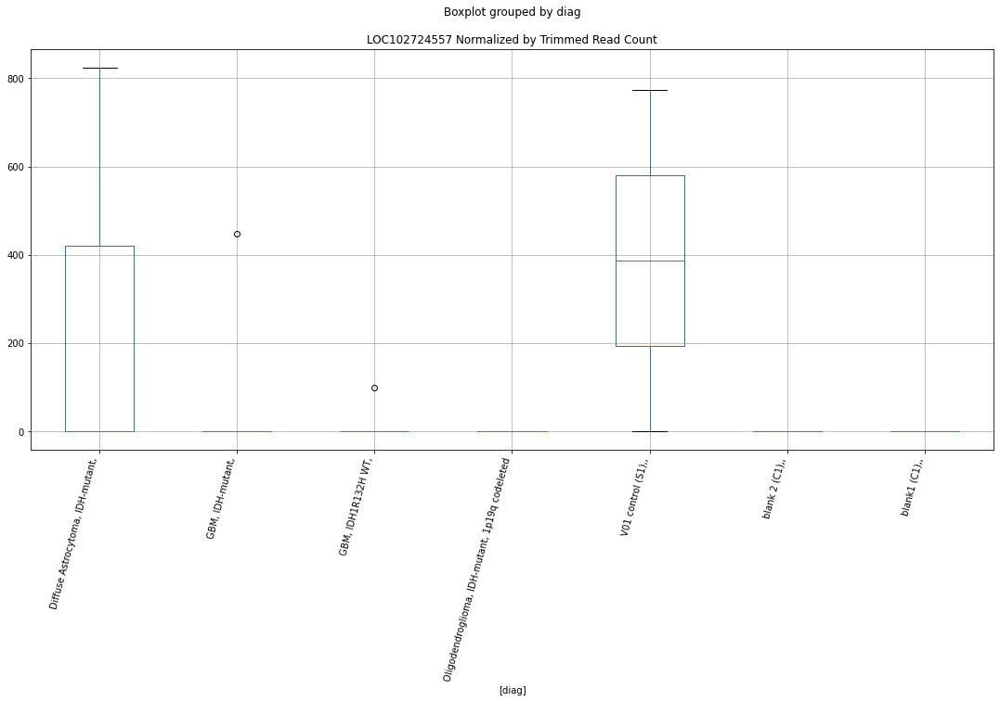

 p : 0.035402047582728136  ( t : 2.274552147130712 ) :  D-plex  :  bbduk2  :  LOC100507560
Control and blanks
73     20098.22
337        0.00
Name: LOC100507560, dtype: float64
205    2149.09
Name: LOC100507560, dtype: float64
469    7098.33
Name: LOC100507560, dtype: float64


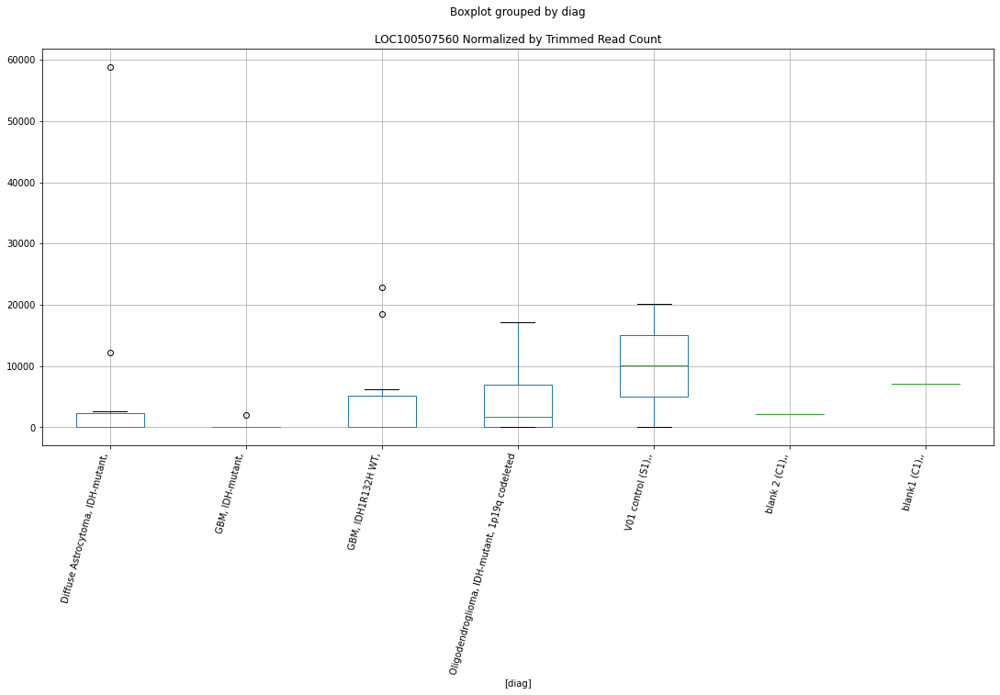

 p : 0.03542012386234103  ( t : 2.2742989594830183 ) :  D-plex  :  bbduk2  :  LOC101927082
Control and blanks
73     0.0
337    0.0
Name: LOC101927082, dtype: float64
205    1253.64
Name: LOC101927082, dtype: float64
469    3549.16
Name: LOC101927082, dtype: float64


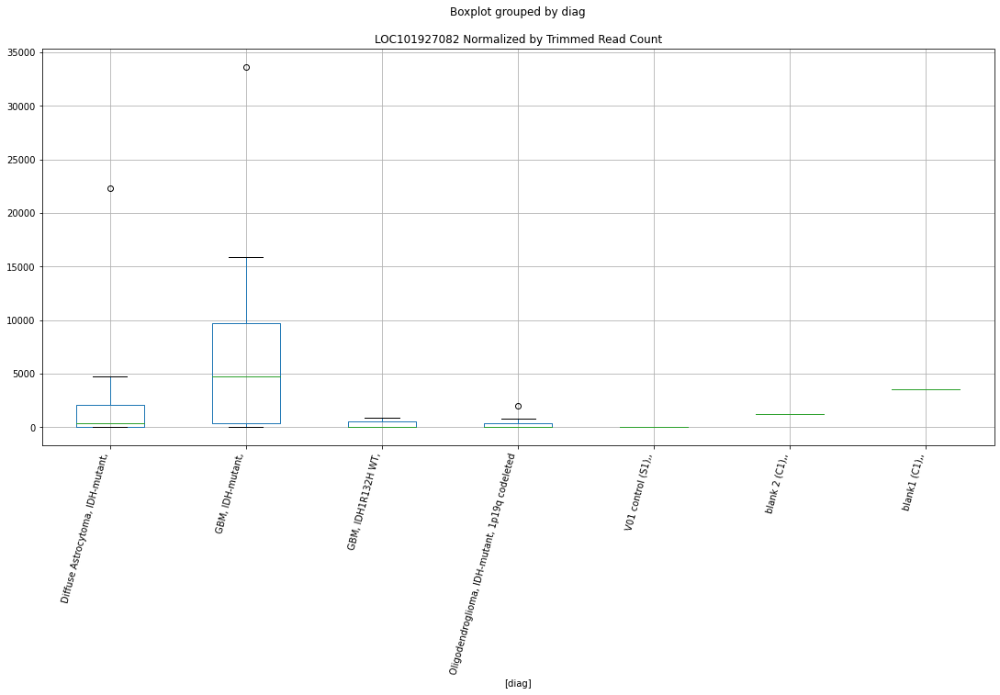

 p : 0.03547039322627832  ( t : 2.273595483208324 ) :  Lexogen  :  cutadapt2  :  LOC105370638
Control and blanks
82     0.0
346    0.0
Name: LOC105370638, dtype: float64
214    2712.26
Name: LOC105370638, dtype: float64
478    0.0
Name: LOC105370638, dtype: float64


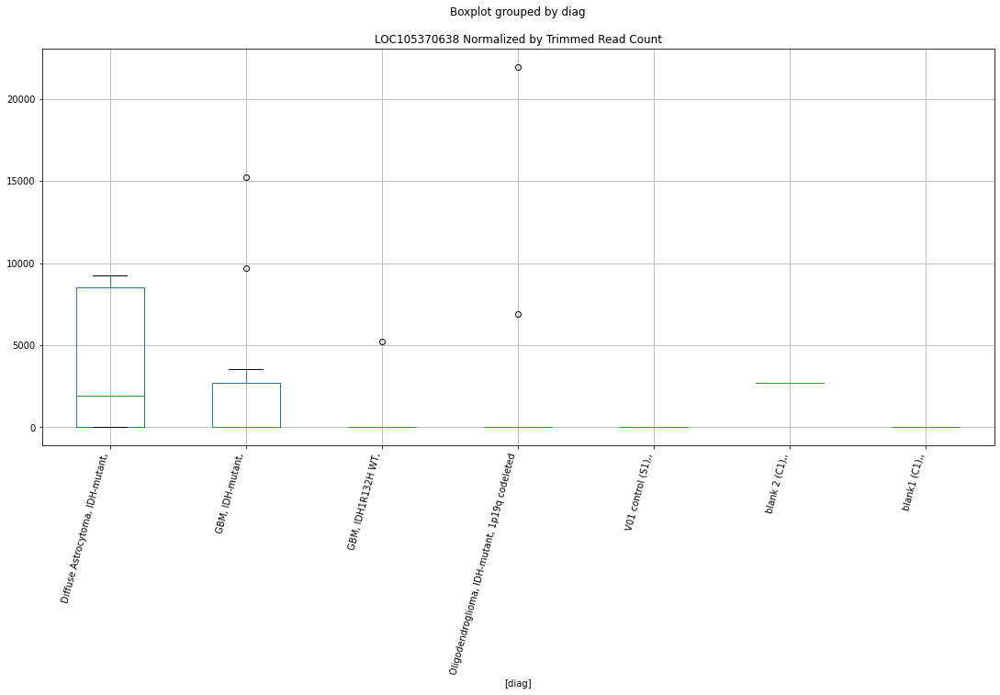

 p : 0.03555970698139561  ( t : 2.2723478858040154 ) :  D-plex  :  bbduk2  :  LOC105370415
Control and blanks
73     0.0
337    0.0
Name: LOC105370415, dtype: float64
205    1970.0
Name: LOC105370415, dtype: float64
469    0.0
Name: LOC105370415, dtype: float64


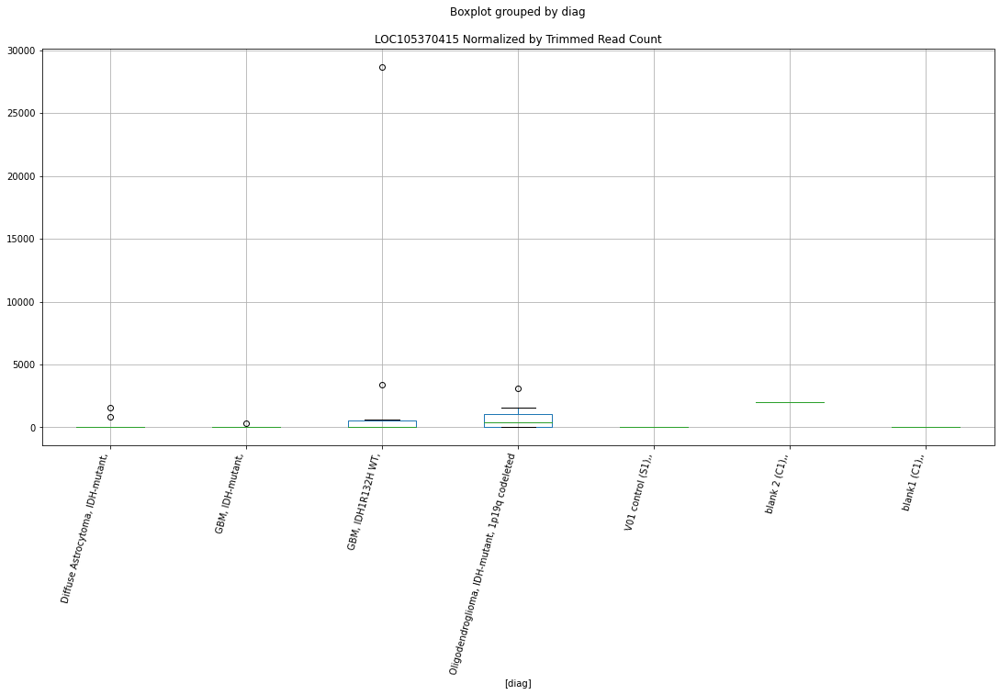

 p : 0.03562628568365281  ( t : 2.271419751442048 ) :  Lexogen  :  cutadapt2  :  LOC102724889
Control and blanks
82     0.0
346    0.0
Name: LOC102724889, dtype: float64
214    0.0
Name: LOC102724889, dtype: float64
478    0.0
Name: LOC102724889, dtype: float64


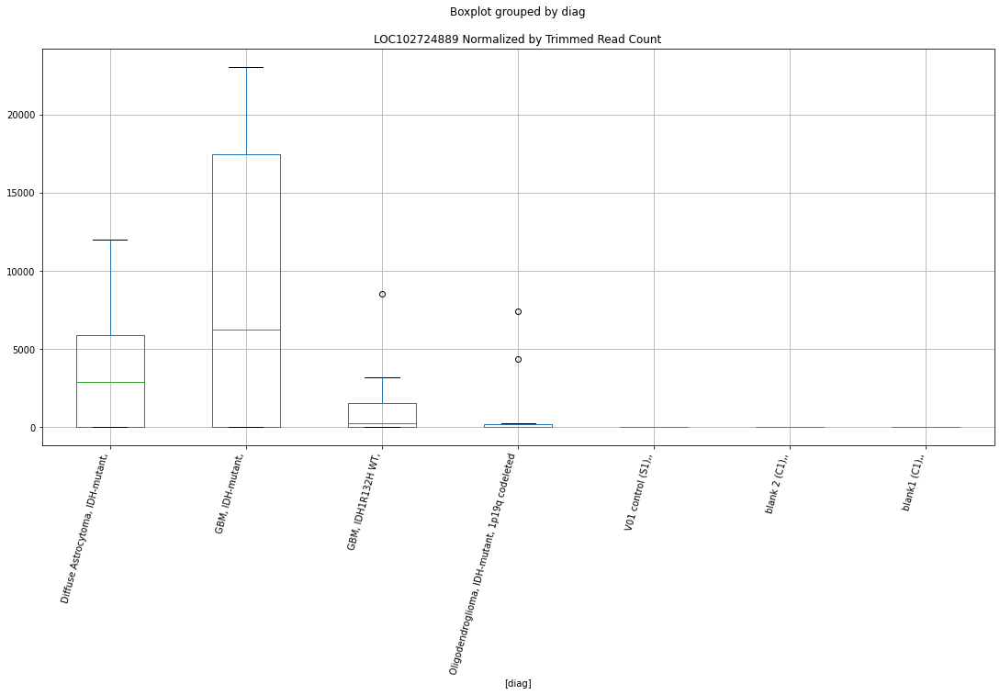

 p : 0.03563949510212042  ( t : 2.2712357974388313 ) :  D-plex  :  cutadapt2  :  LOC102031319
Control and blanks
76     0.0
340    0.0
Name: LOC102031319, dtype: float64
208    0.0
Name: LOC102031319, dtype: float64
472    0.0
Name: LOC102031319, dtype: float64


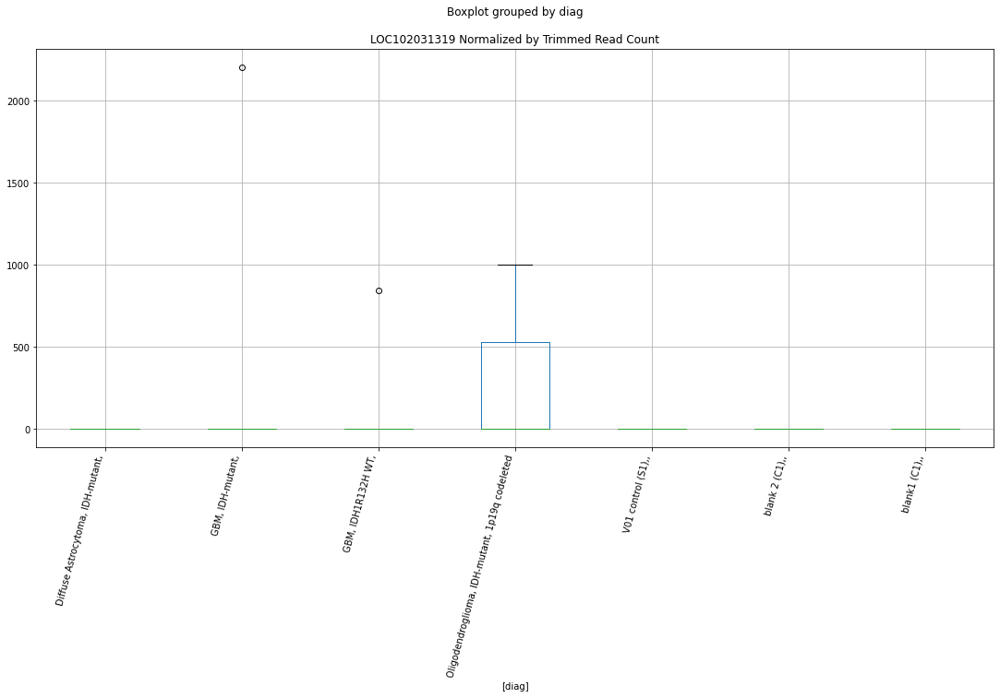

 p : 0.03569188153532279  ( t : 2.2705068856305872 ) :  D-plex  :  bbduk2  :  LOC101929627
Control and blanks
73     0.0
337    0.0
Name: LOC101929627, dtype: float64
205    1970.0
Name: LOC101929627, dtype: float64
469    591.53
Name: LOC101929627, dtype: float64


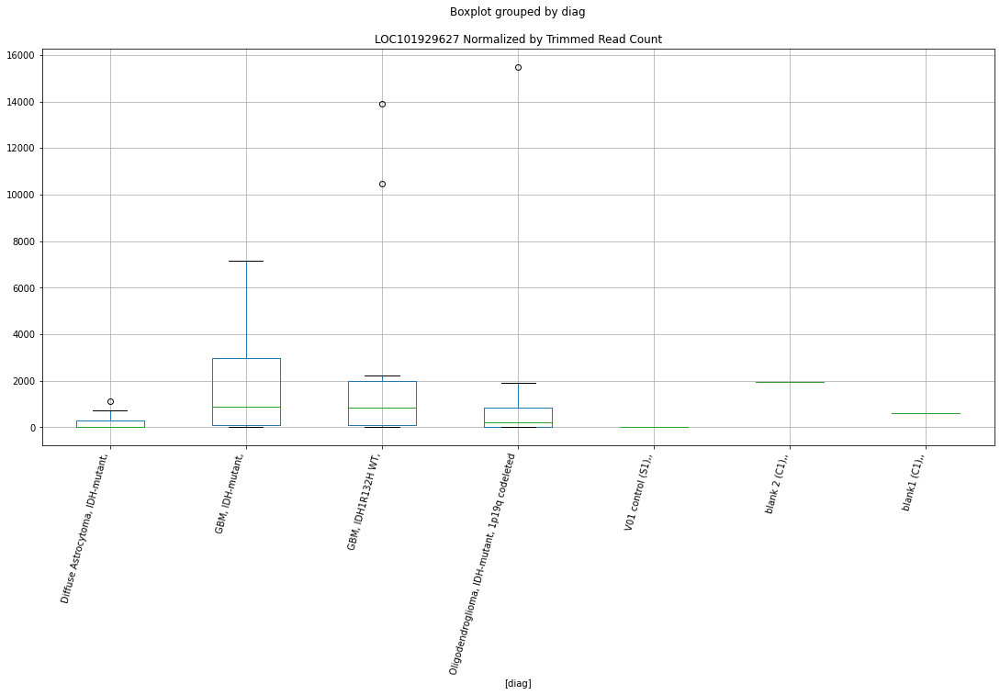

 p : 0.03569188153532279  ( t : 2.2705068856305872 ) :  D-plex  :  bbduk2  :  LOC100288562
Control and blanks
73     0.0
337    0.0
Name: LOC100288562, dtype: float64
205    1970.0
Name: LOC100288562, dtype: float64
469    591.53
Name: LOC100288562, dtype: float64


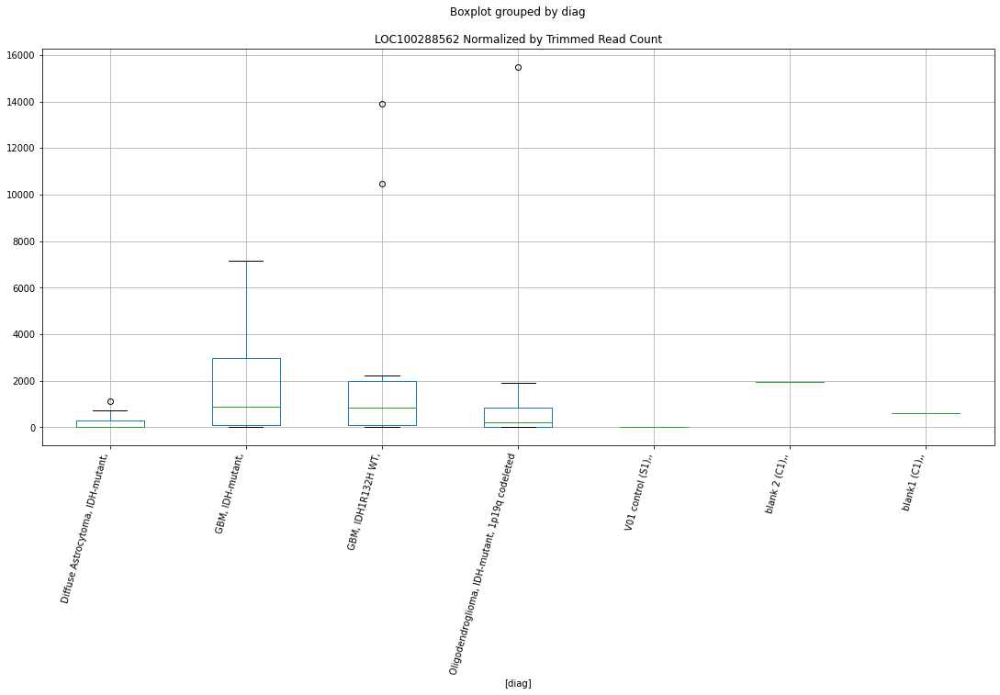

 p : 0.03583463939015132  ( t : 2.2685255428840936 ) :  Lexogen  :  cutadapt2  :  LOC101929413
Control and blanks
82         0.00
346    30723.44
Name: LOC101929413, dtype: float64
214    4610.85
Name: LOC101929413, dtype: float64
478    0.0
Name: LOC101929413, dtype: float64


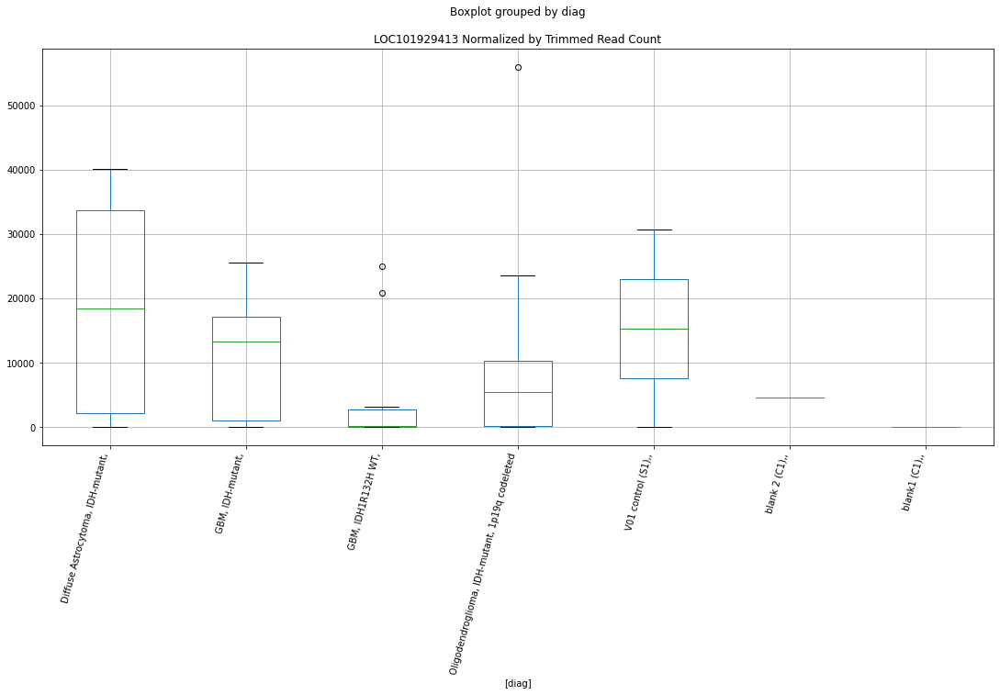

 p : 0.03586202097119157  ( t : 2.268146346912827 ) :  D-plex  :  cutadapt2  :  LOC101060553
Control and blanks
76     757.61
340    880.73
Name: LOC101060553, dtype: float64
208    705.44
Name: LOC101060553, dtype: float64
472    577.96
Name: LOC101060553, dtype: float64


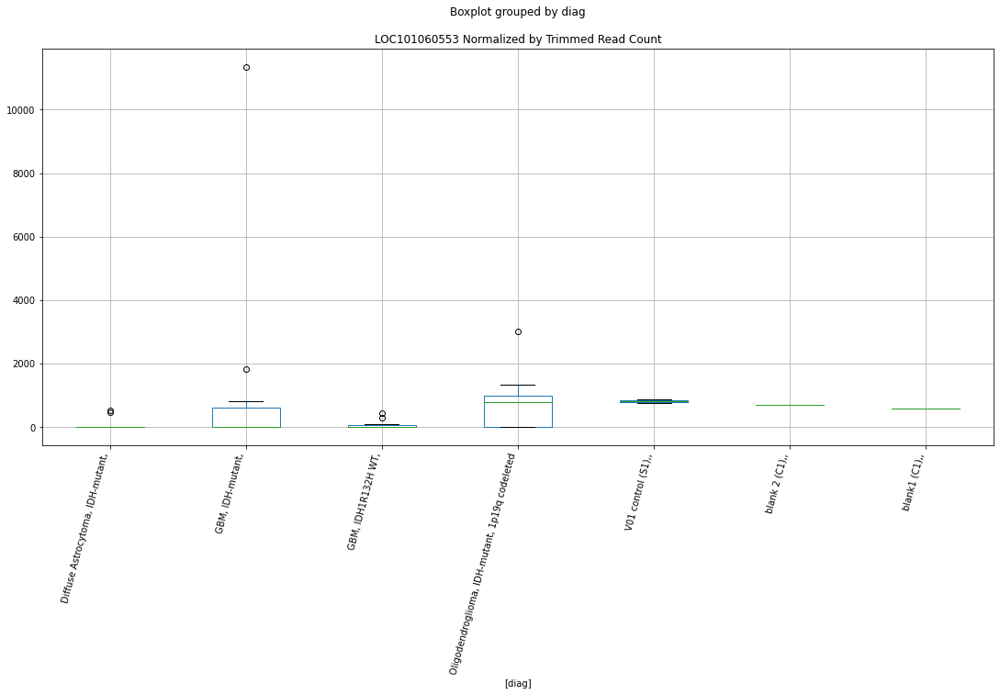

 p : 0.035945484563894084  ( t : 2.266992143802147 ) :  D-plex  :  bbduk2  :  LOC101929601
Control and blanks
73     0.0
337    0.0
Name: LOC101929601, dtype: float64
205    2328.18
Name: LOC101929601, dtype: float64
469    591.53
Name: LOC101929601, dtype: float64


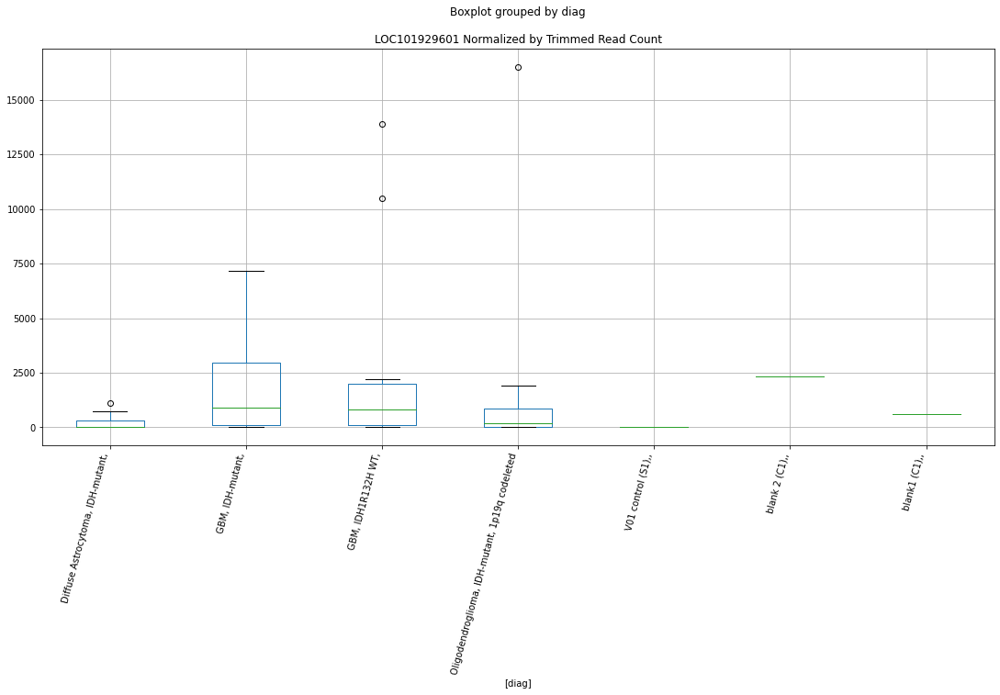

 p : 0.03604611692869503  ( t : 2.265603806149254 ) :  D-plex  :  cutadapt2  :  LOC100288846
Control and blanks
76     0.0
340    0.0
Name: LOC100288846, dtype: float64
208    1587.24
Name: LOC100288846, dtype: float64
472    577.96
Name: LOC100288846, dtype: float64


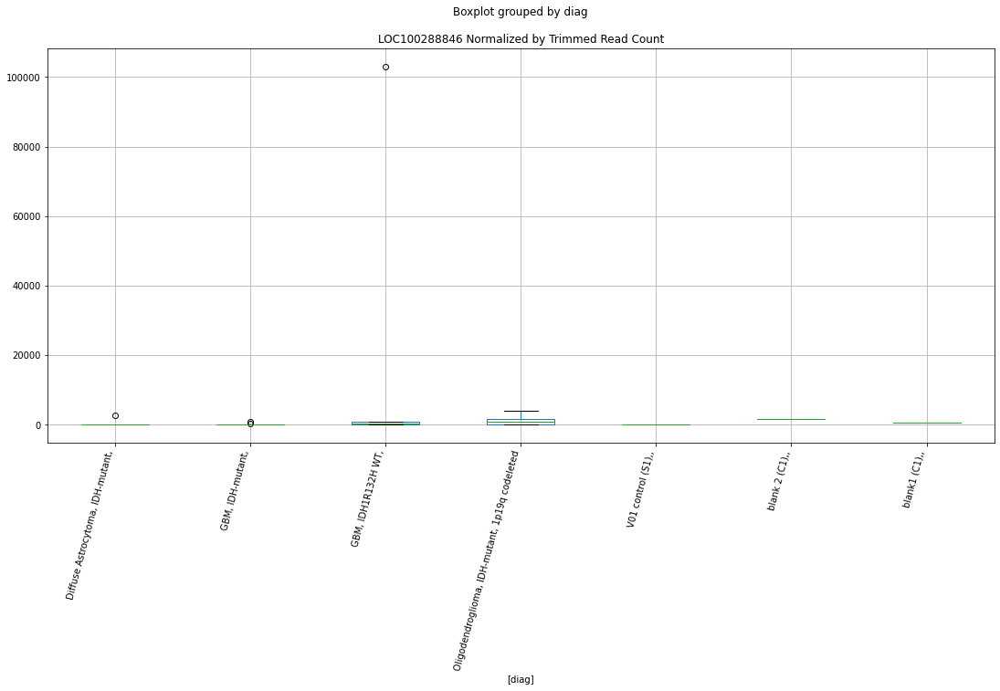

 p : 0.03606272216670431  ( t : 2.2653750624374718 ) :  D-plex  :  bbduk2  :  LOC101928077
Control and blanks
73     0.0
337    0.0
Name: LOC101928077, dtype: float64
205    0.0
Name: LOC101928077, dtype: float64
469    0.0
Name: LOC101928077, dtype: float64


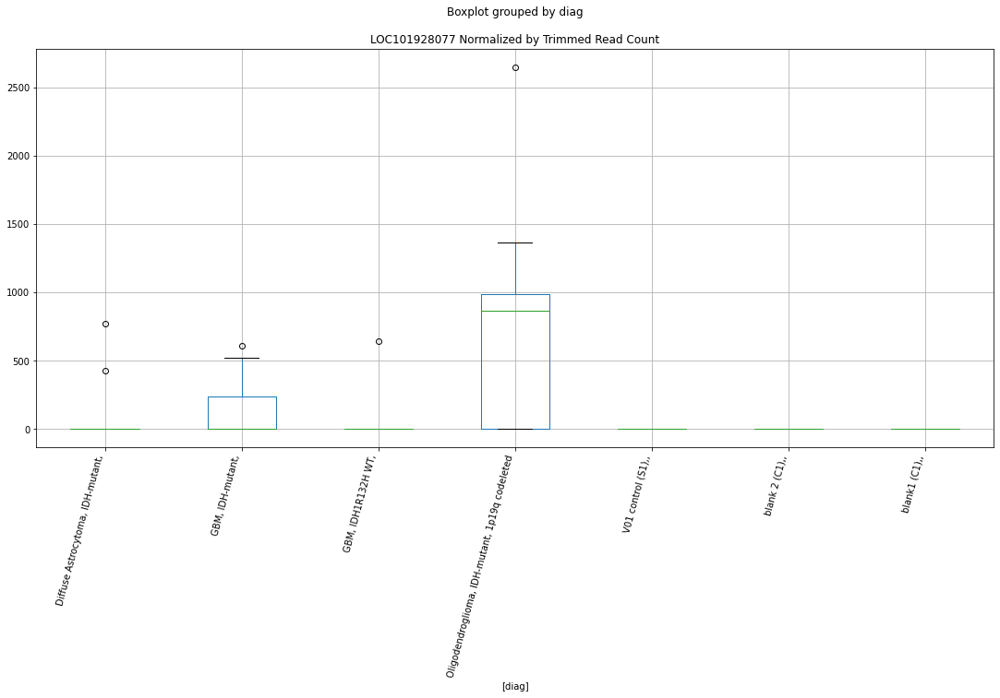

 p : 0.03609670665108996  ( t : 2.2649072160488704 ) :  D-plex  :  bbduk2  :  LIPM
Control and blanks
73     0.0
337    0.0
Name: LIPM, dtype: float64
205    358.18
Name: LIPM, dtype: float64
469    5323.75
Name: LIPM, dtype: float64


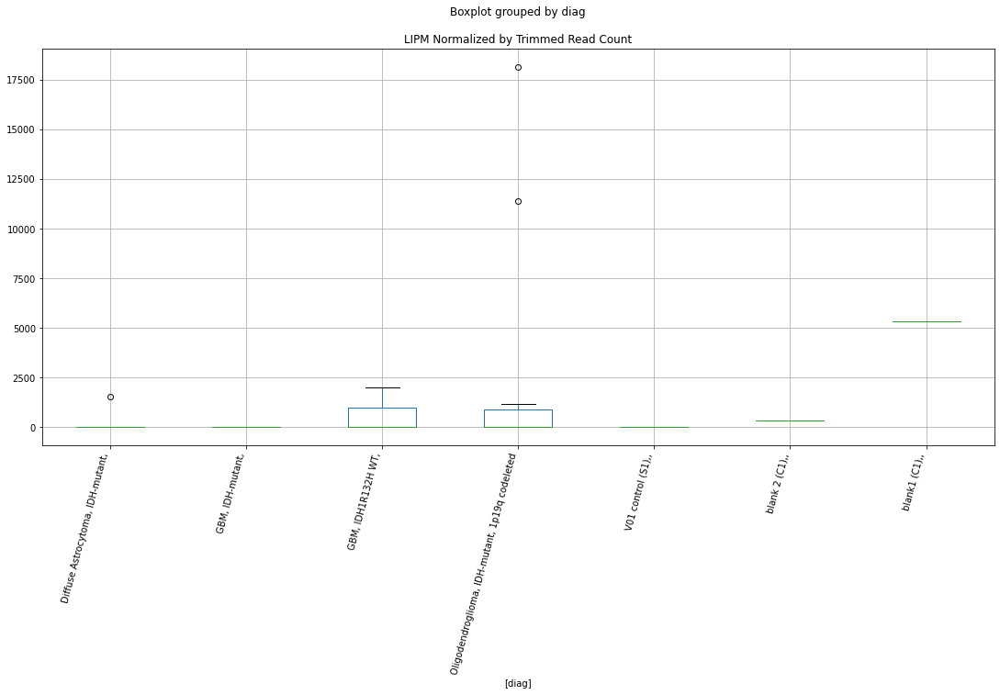

 p : 0.03610278616820845  ( t : 2.264823565483448 ) :  D-plex  :  bbduk2  :  LOC105370220
Control and blanks
73     0.0
337    0.0
Name: LOC105370220, dtype: float64
205    358.18
Name: LOC105370220, dtype: float64
469    0.0
Name: LOC105370220, dtype: float64


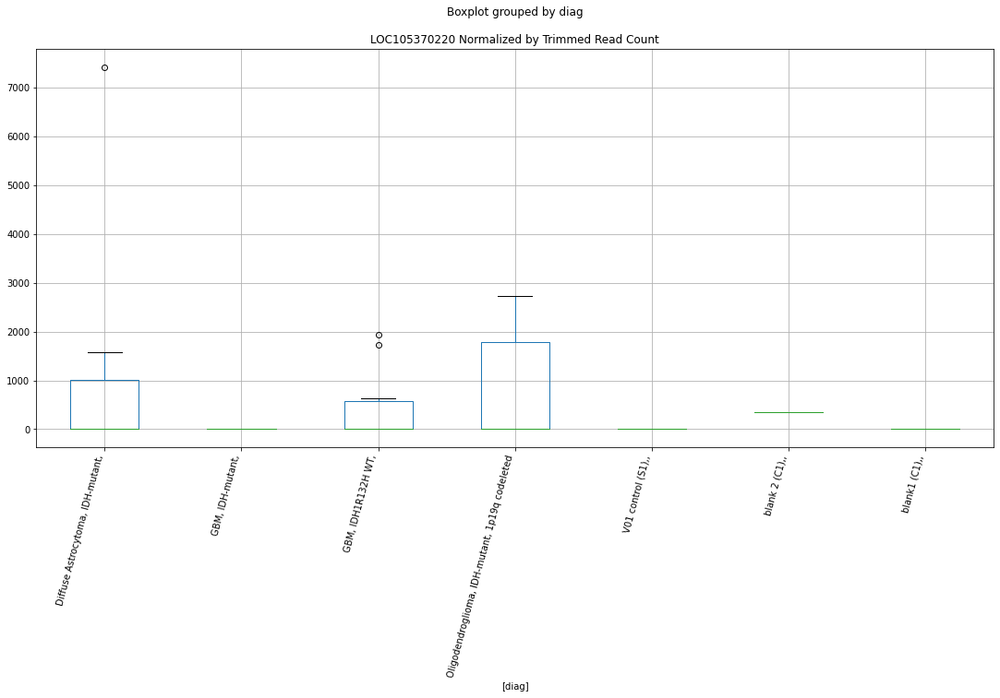

 p : 0.03629920603130717  ( t : 2.262127923813516 ) :  D-plex  :  cutadapt2  :  LOC101928933
Control and blanks
76     0.0
340    0.0
Name: LOC101928933, dtype: float64
208    1587.24
Name: LOC101928933, dtype: float64
472    1155.91
Name: LOC101928933, dtype: float64


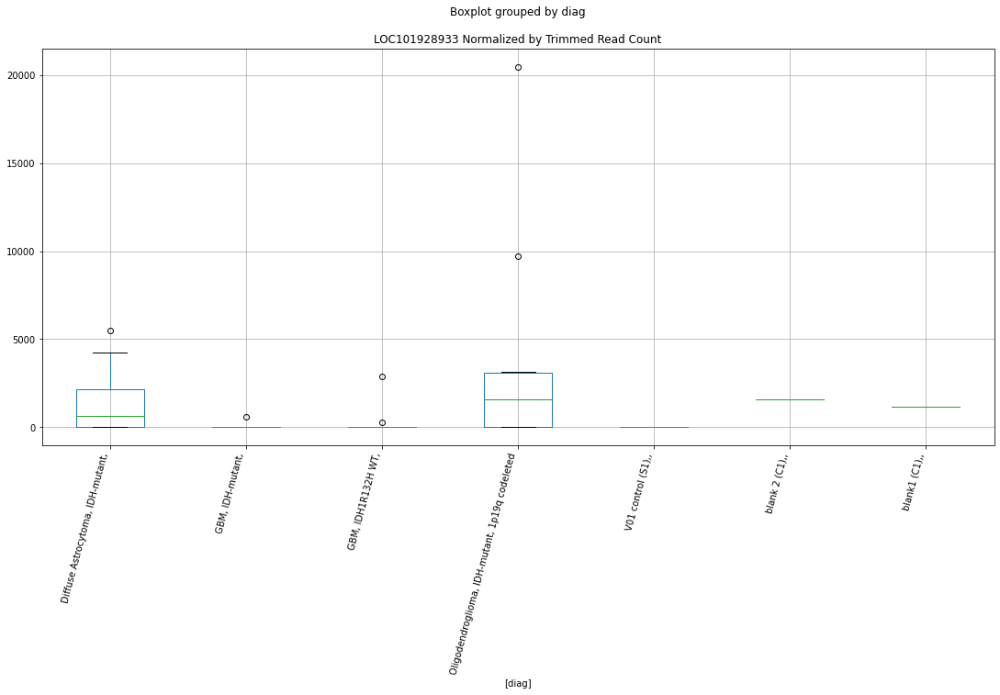

 p : 0.03632312994138817  ( t : 2.2618005163024426 ) :  Lexogen  :  bbduk2  :  LKAAEAR1
Control and blanks
79     0.0
343    0.0
Name: LKAAEAR1, dtype: float64
211    1366.53
Name: LKAAEAR1, dtype: float64
475    0.0
Name: LKAAEAR1, dtype: float64


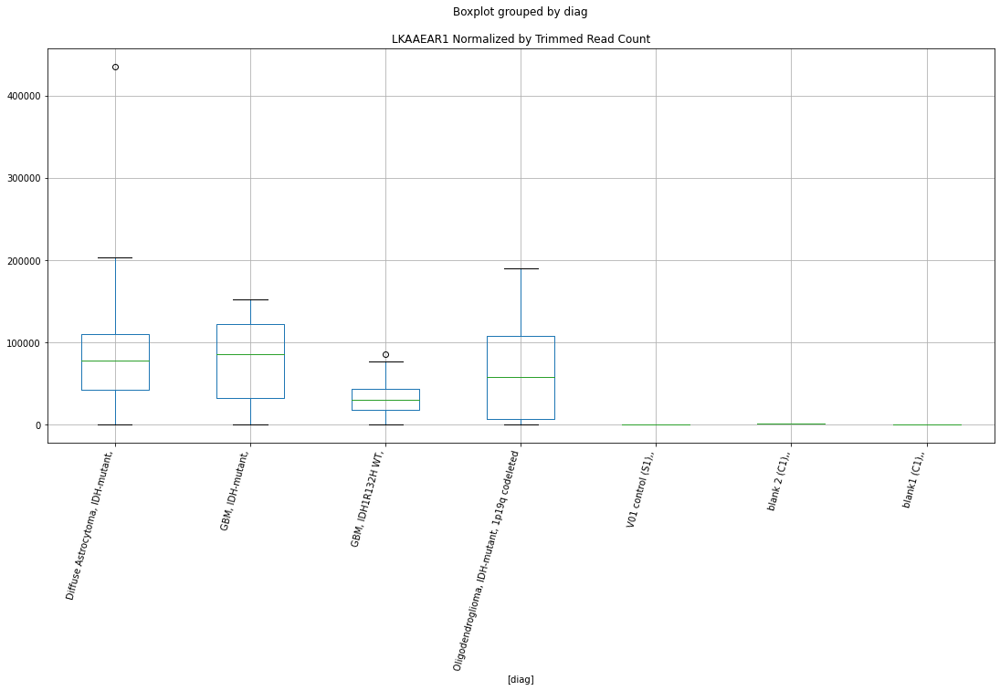

 p : 0.036373141848611124  ( t : 2.2611167279992137 ) :  D-plex  :  cutadapt2  :  LINC01900
Control and blanks
76     32577.41
340        0.00
Name: LINC01900, dtype: float64
208    881.8
Name: LINC01900, dtype: float64
472    1155.91
Name: LINC01900, dtype: float64


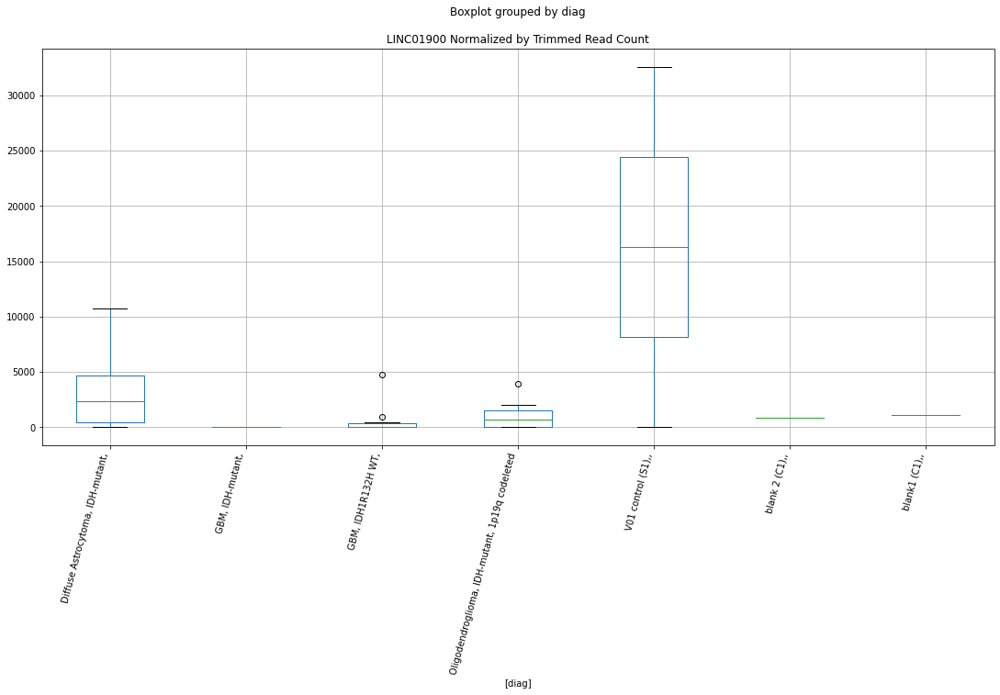

 p : 0.03656095328694157  ( t : 2.258556605312356 ) :  D-plex  :  cutadapt2  :  LOC105369779
Control and blanks
76     0.0
340    0.0
Name: LOC105369779, dtype: float64
208    352.72
Name: LOC105369779, dtype: float64
472    0.0
Name: LOC105369779, dtype: float64


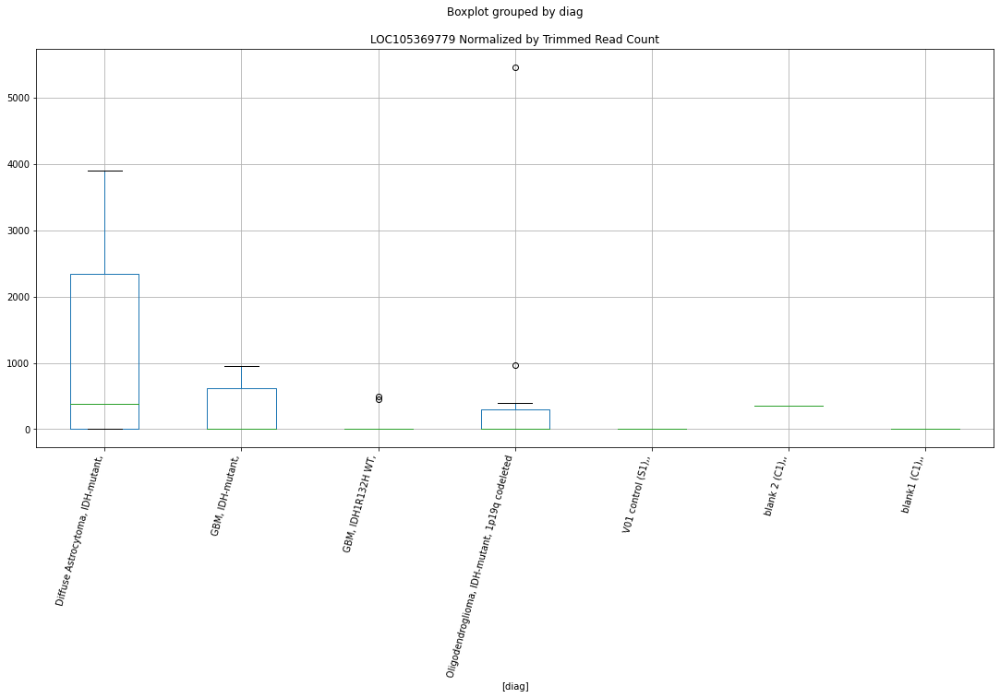

 p : 0.03677046048716067  ( t : 2.2557150327415987 ) :  D-plex  :  cutadapt2  :  LOC100128494
Control and blanks
76     1515.23
340     880.73
Name: LOC100128494, dtype: float64
208    7230.77
Name: LOC100128494, dtype: float64
472    9247.29
Name: LOC100128494, dtype: float64


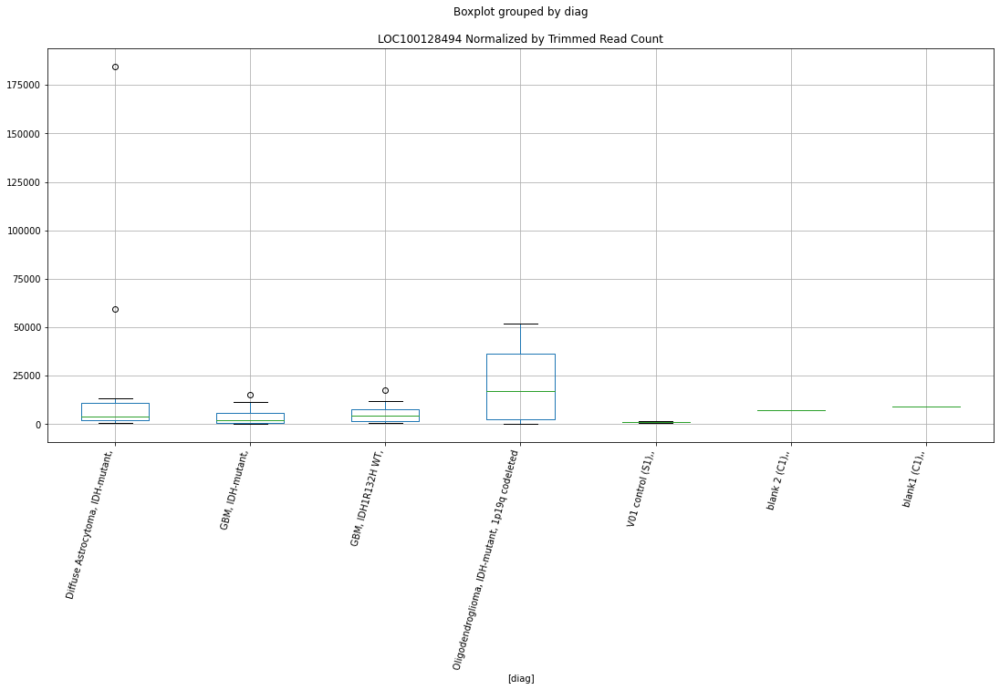

 p : 0.03690346503026325  ( t : 2.25391882329467 ) :  D-plex  :  cutadapt2  :  LIM2
Control and blanks
76     0.0
340    0.0
Name: LIM2, dtype: float64
208    1058.16
Name: LIM2, dtype: float64
472    1155.91
Name: LIM2, dtype: float64


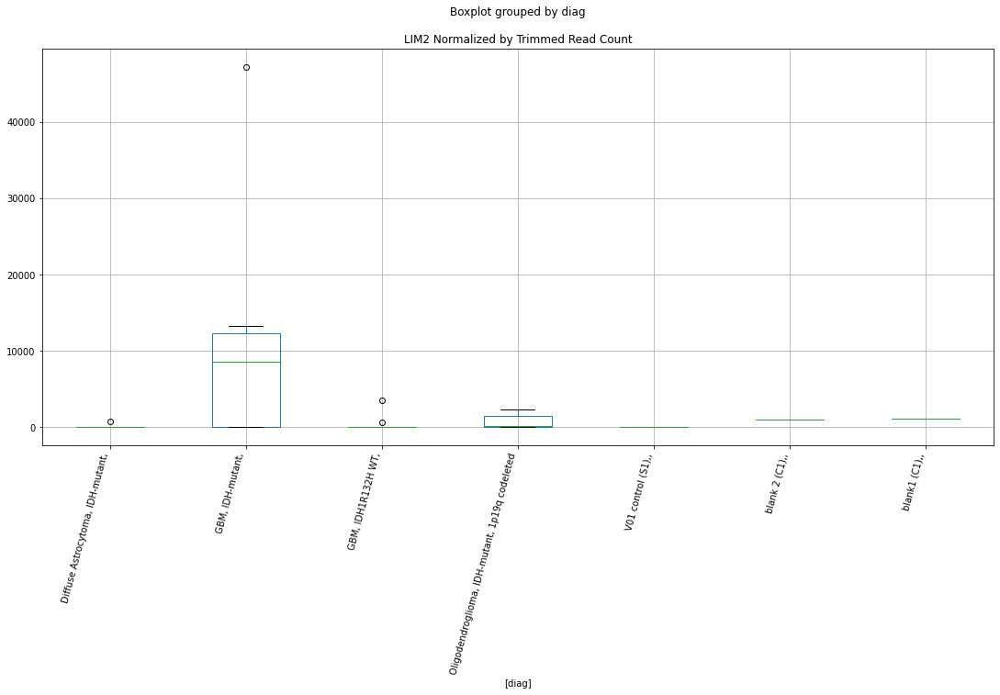

 p : 0.03693344311498574  ( t : 2.2535147985387187 ) :  D-plex  :  cutadapt2  :  LOC101929418
Control and blanks
76     22728.43
340    17614.64
Name: LOC101929418, dtype: float64
208    705.44
Name: LOC101929418, dtype: float64
472    0.0
Name: LOC101929418, dtype: float64


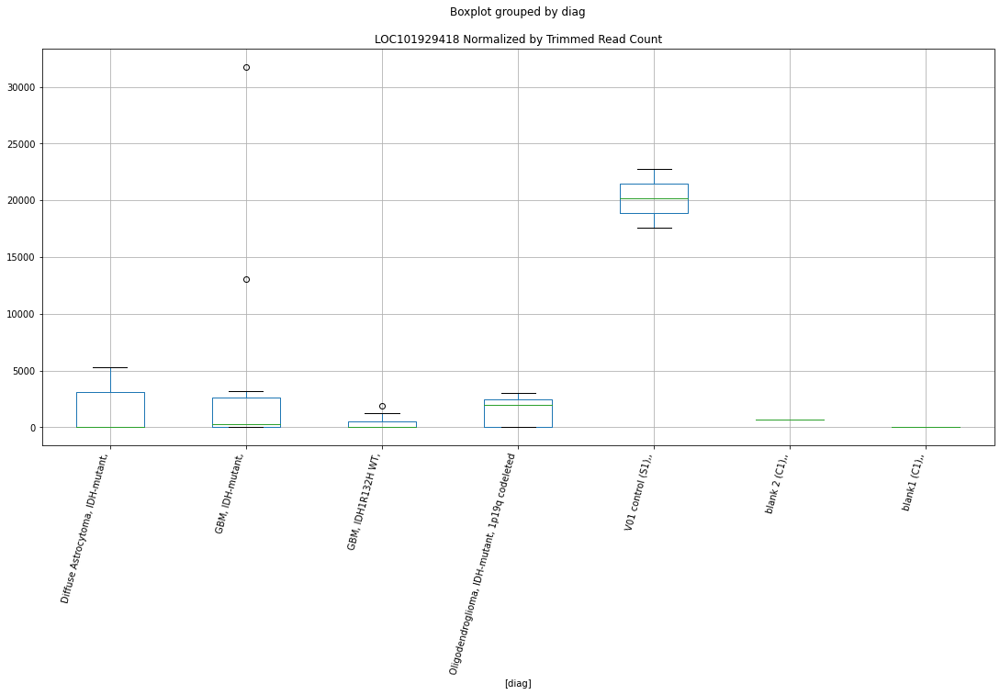

 p : 0.03694945946591821  ( t : 2.2532990648388243 ) :  Lexogen  :  cutadapt2  :  LMTK2
Control and blanks
82     0.0
346    0.0
Name: LMTK2, dtype: float64
214    0.0
Name: LMTK2, dtype: float64
478    0.0
Name: LMTK2, dtype: float64


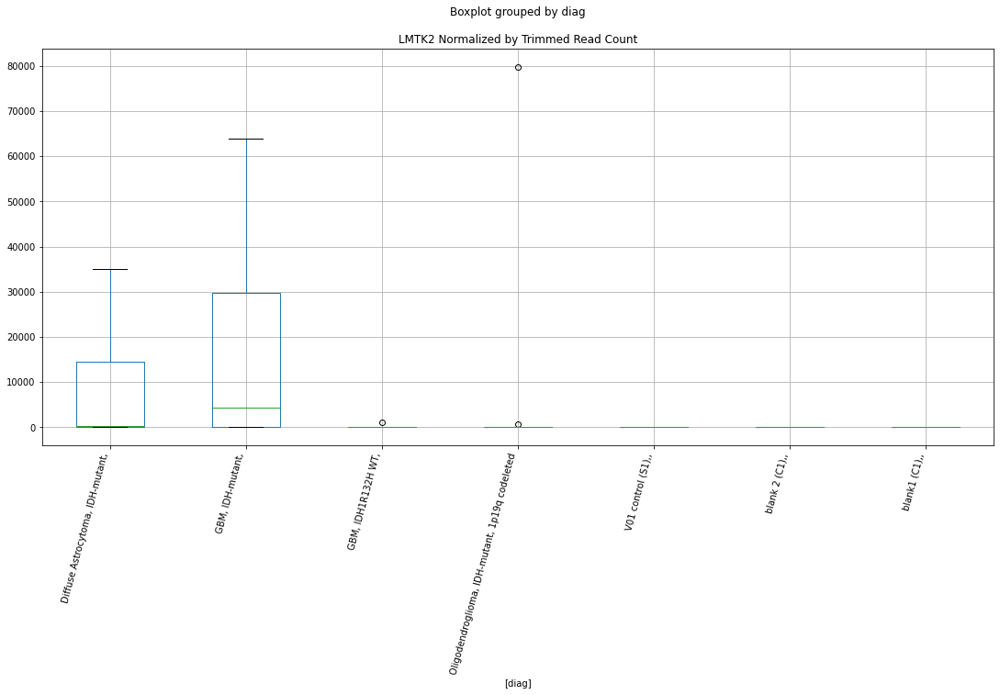

 p : 0.03694996809643413  ( t : 2.253292215208035 ) :  D-plex  :  bbduk2  :  LINC02691
Control and blanks
73     0.0
337    0.0
Name: LINC02691, dtype: float64
205    0.0
Name: LINC02691, dtype: float64
469    2366.11
Name: LINC02691, dtype: float64


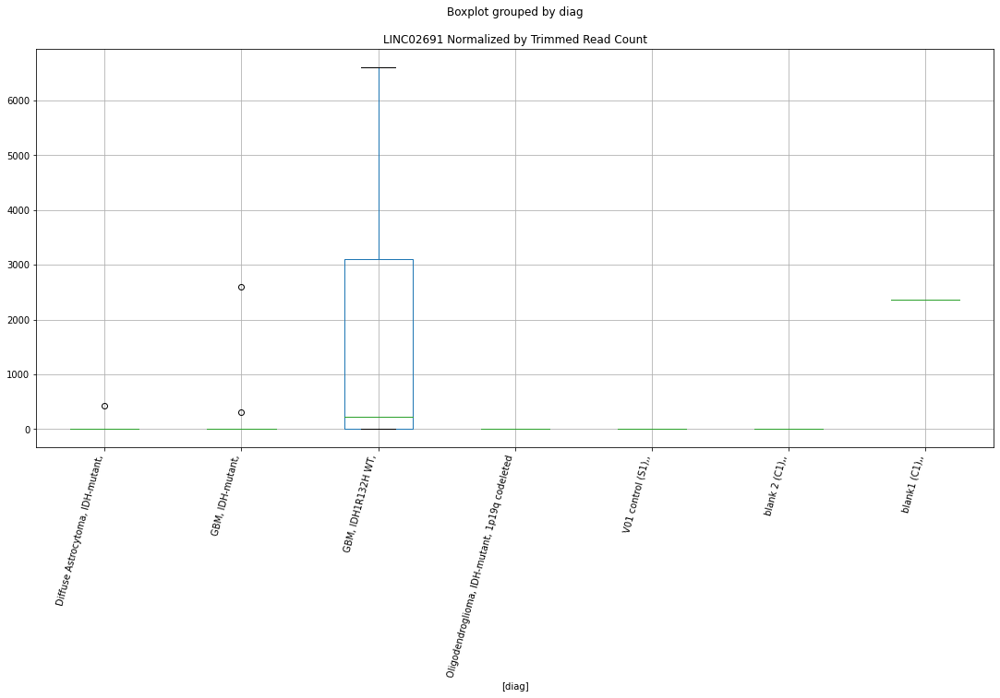

 p : 0.03702300492155915  ( t : 2.252309544561551 ) :  D-plex  :  bbduk2  :  LOC101927082
Control and blanks
73     0.0
337    0.0
Name: LOC101927082, dtype: float64
205    1253.64
Name: LOC101927082, dtype: float64
469    3549.16
Name: LOC101927082, dtype: float64


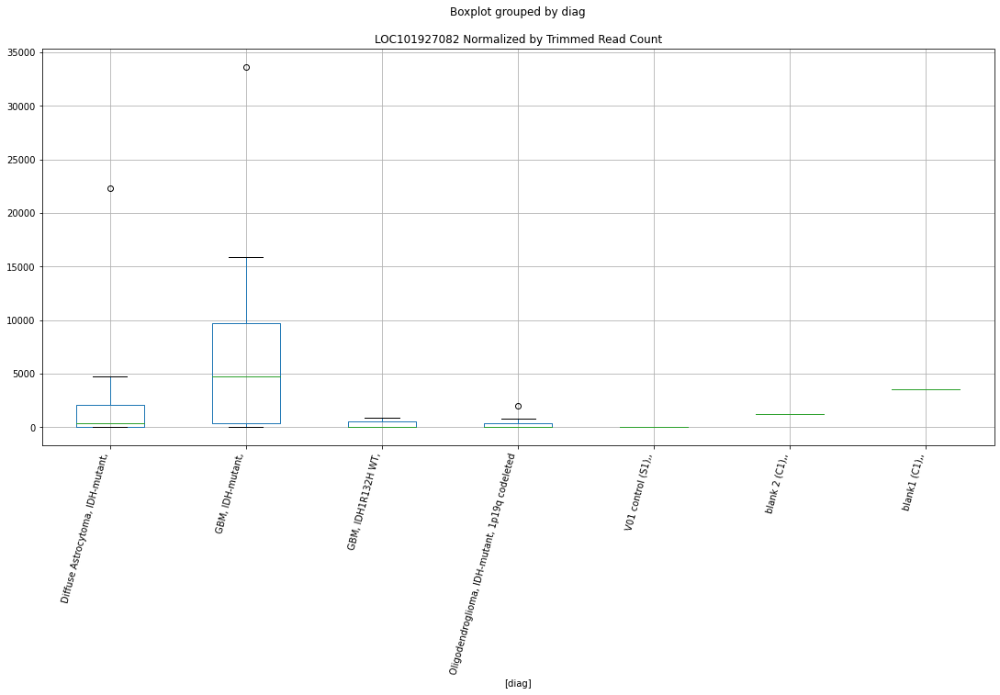

 p : 0.03716076788397657  ( t : 2.2504608797118393 ) :  D-plex  :  bbduk2  :  LOC100233156
Control and blanks
73        0.00
337    1780.31
Name: LOC100233156, dtype: float64
205    716.36
Name: LOC100233156, dtype: float64
469    3549.16
Name: LOC100233156, dtype: float64


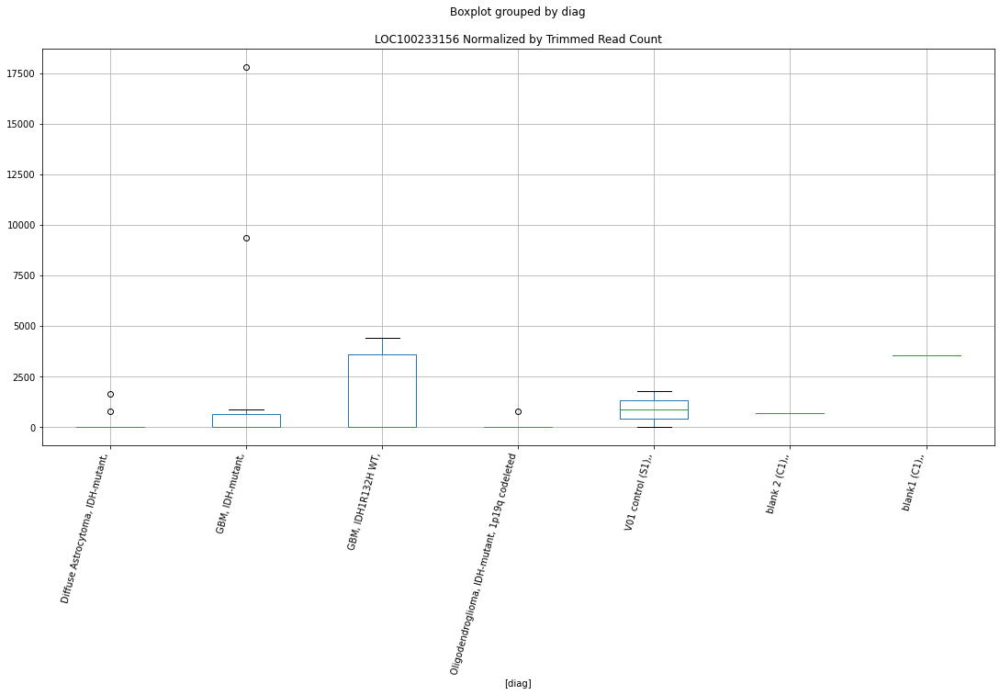

 p : 0.037175251463489094  ( t : 2.2502668896782354 ) :  D-plex  :  cutadapt2  :  LOC101927897
Control and blanks
76     0.0
340    0.0
Name: LOC101927897, dtype: float64
208    2998.12
Name: LOC101927897, dtype: float64
472    4045.69
Name: LOC101927897, dtype: float64


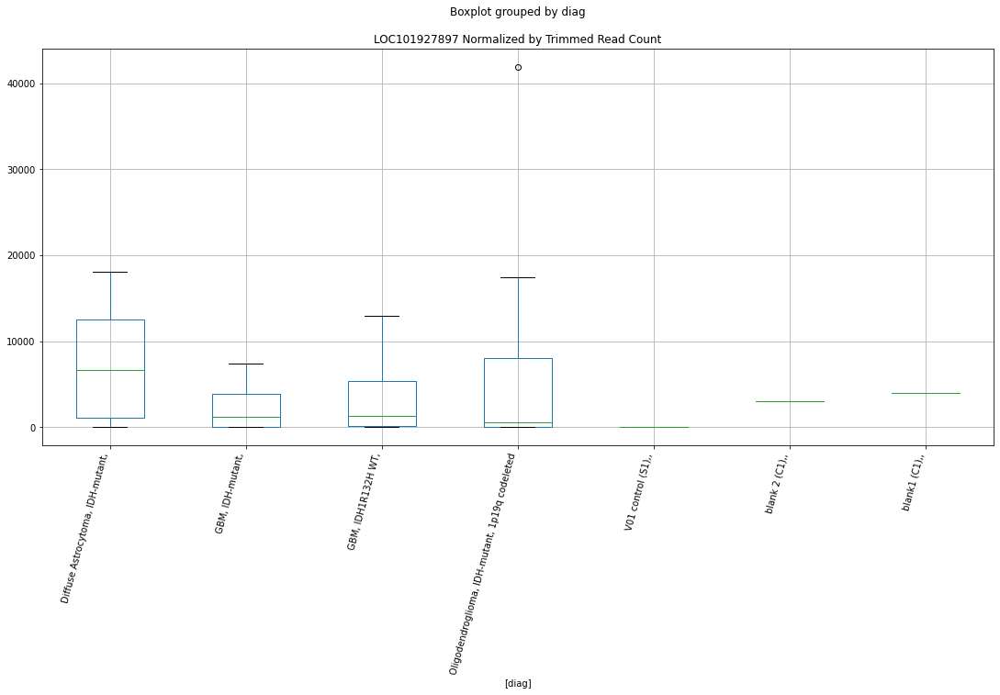

 p : 0.037273841497056814  ( t : 2.2489482456423637 ) :  Lexogen  :  bbduk2  :  LOC102724889
Control and blanks
79     0.0
343    0.0
Name: LOC102724889, dtype: float64
211    0.0
Name: LOC102724889, dtype: float64
475    0.0
Name: LOC102724889, dtype: float64


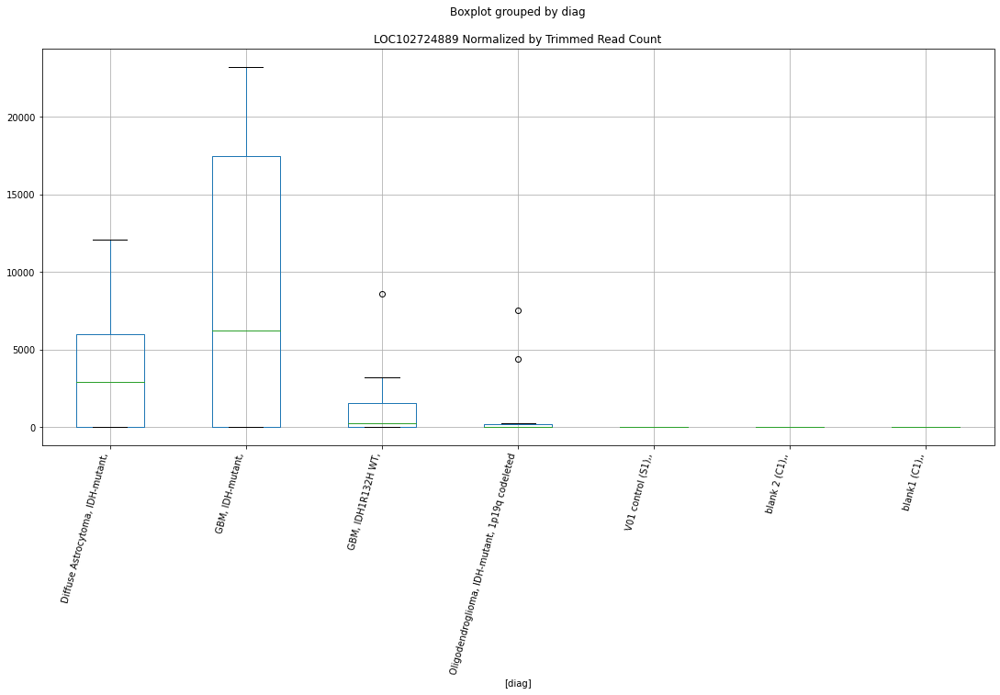

 p : 0.03734235505403268  ( t : 2.248033769312741 ) :  D-plex  :  bbduk2  :  LOC100506473
Control and blanks
73     773.01
337      0.00
Name: LOC100506473, dtype: float64
205    2149.09
Name: LOC100506473, dtype: float64
469    2957.64
Name: LOC100506473, dtype: float64


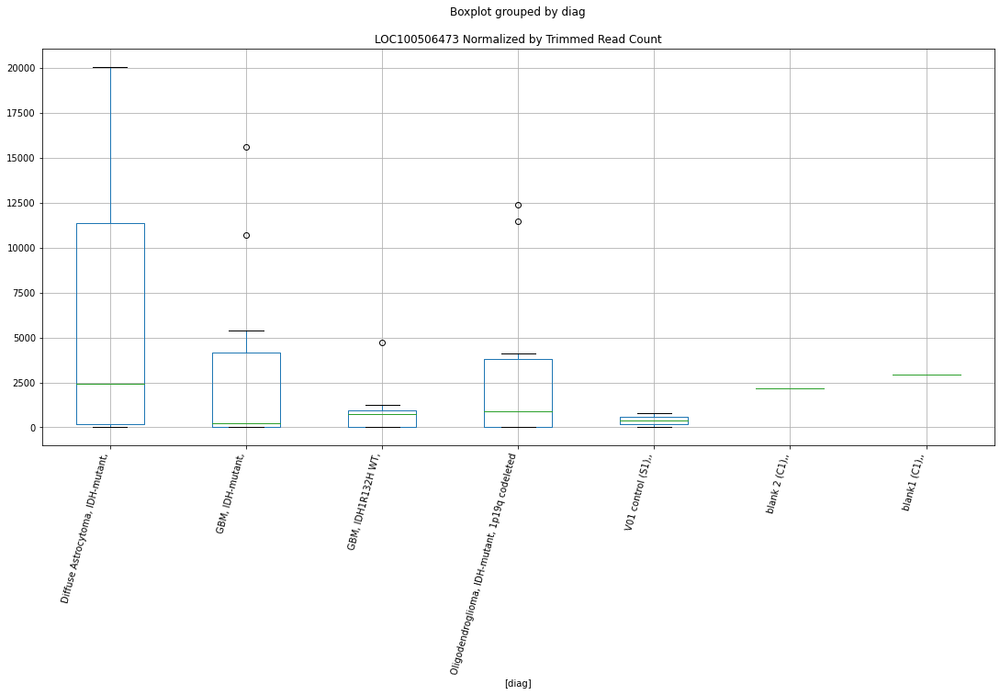

 p : 0.037378101729069156  ( t : 2.2475572593309567 ) :  D-plex  :  bbduk2  :  LOC101927790
Control and blanks
73     0.0
337    0.0
Name: LOC101927790, dtype: float64
205    0.0
Name: LOC101927790, dtype: float64
469    0.0
Name: LOC101927790, dtype: float64


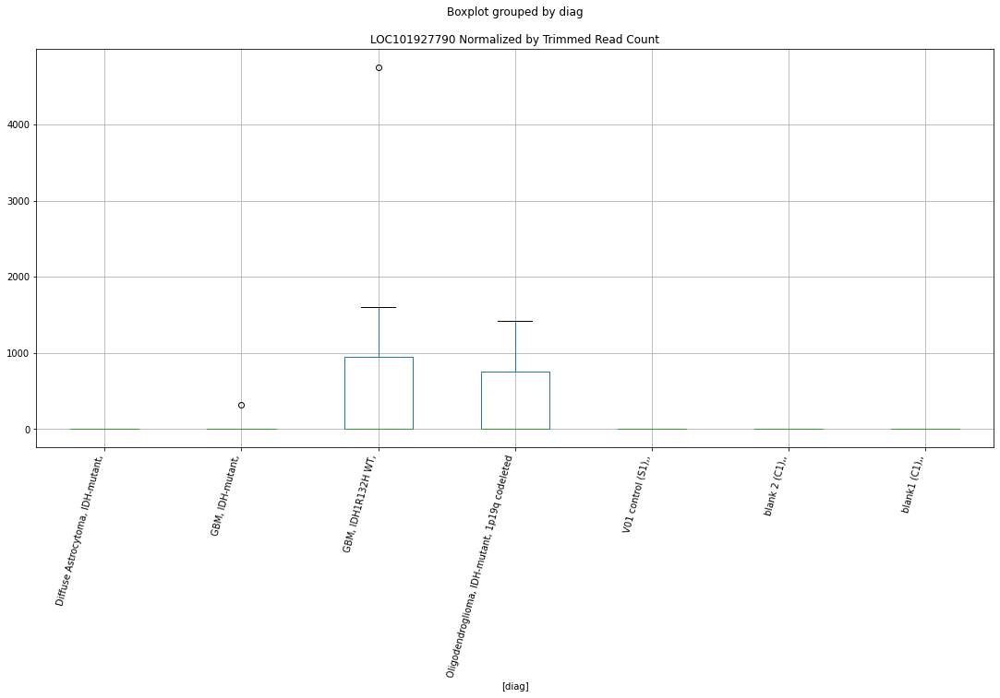

 p : 0.03746520307231475  ( t : 2.2463979398774305 ) :  D-plex  :  bbduk2  :  LOC105369779
Control and blanks
73     0.0
337    0.0
Name: LOC105369779, dtype: float64
205    358.18
Name: LOC105369779, dtype: float64
469    0.0
Name: LOC105369779, dtype: float64


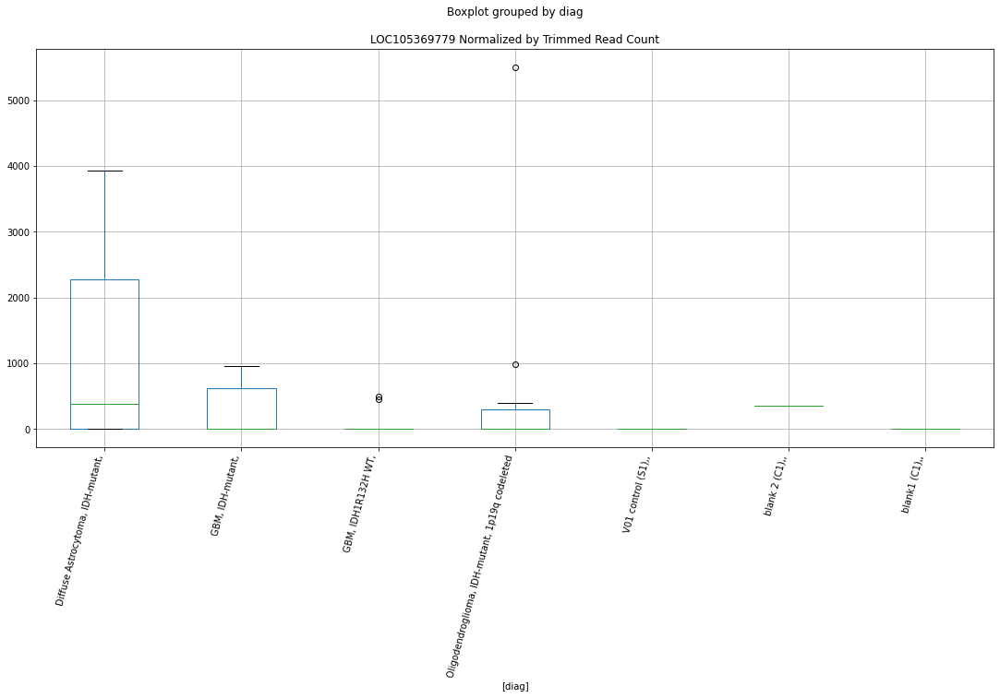

 p : 0.0374682585331383  ( t : 2.246357316833158 ) :  D-plex  :  bbduk2  :  LOC101927897
Control and blanks
73     0.0
337    0.0
Name: LOC101927897, dtype: float64
205    3044.55
Name: LOC101927897, dtype: float64
469    4140.69
Name: LOC101927897, dtype: float64


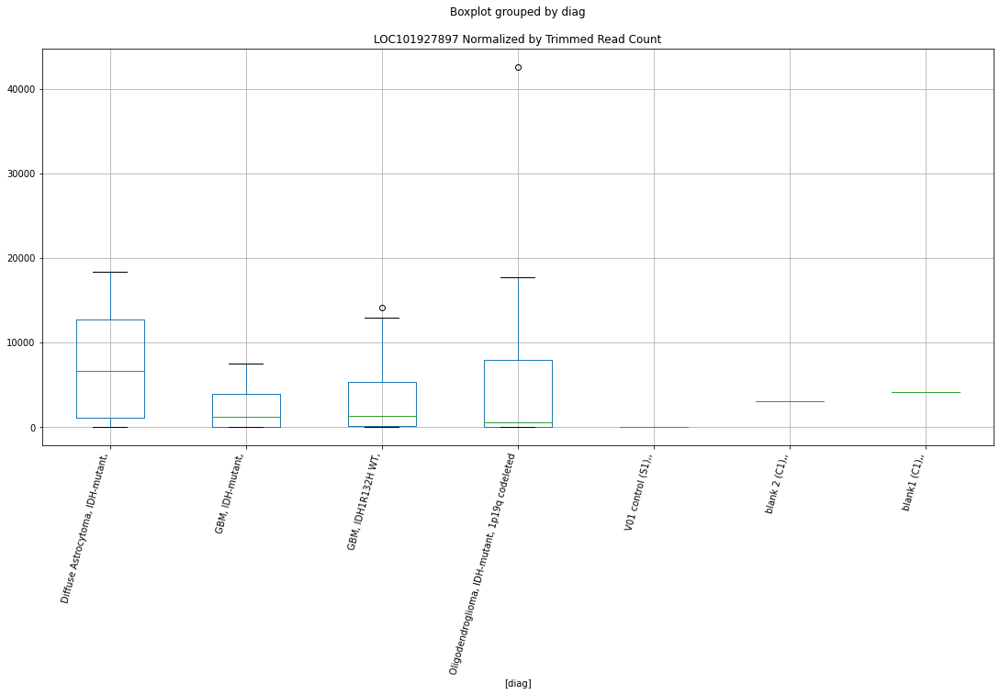

 p : 0.037677910724919446  ( t : 2.2435772158124894 ) :  D-plex  :  cutadapt2  :  LOC102724883
Control and blanks
76     0.0
340    0.0
Name: LOC102724883, dtype: float64
208    352.72
Name: LOC102724883, dtype: float64
472    0.0
Name: LOC102724883, dtype: float64


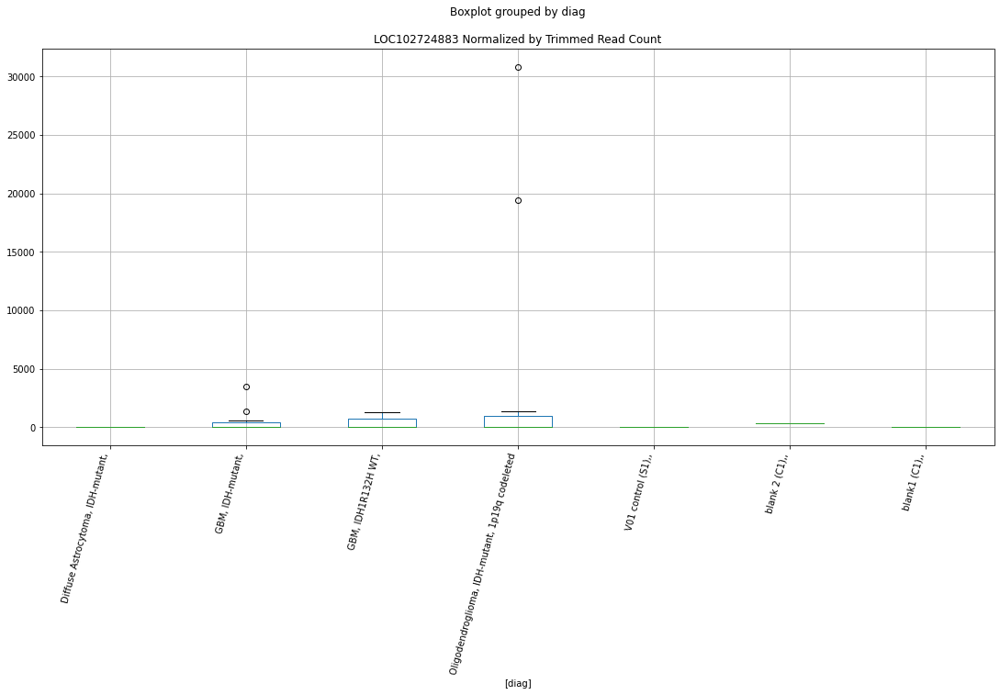

 p : 0.03772070937534275  ( t : 2.243011436786018 ) :  D-plex  :  cutadapt2  :  LOC101927082
Control and blanks
76     0.0
340    0.0
Name: LOC101927082, dtype: float64
208    1234.52
Name: LOC101927082, dtype: float64
472    2889.78
Name: LOC101927082, dtype: float64


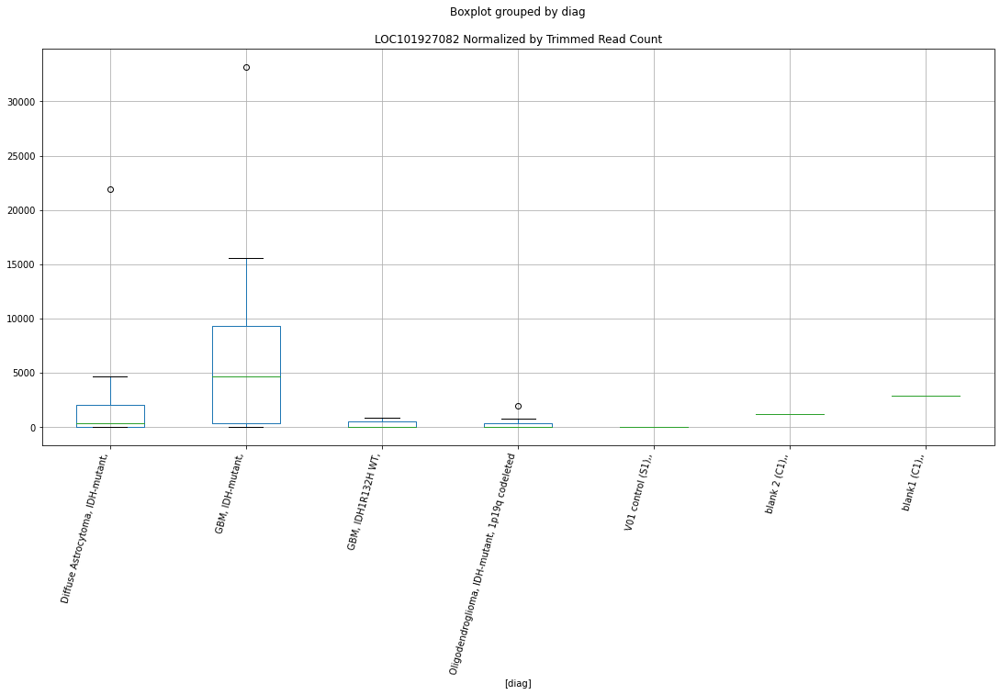

 p : 0.03783333737993024  ( t : 2.2415253689116192 ) :  D-plex  :  bbduk2  :  LOC105369965
Control and blanks
73          0.00
337    165569.25
Name: LOC105369965, dtype: float64
205    5193.64
Name: LOC105369965, dtype: float64
469    8872.91
Name: LOC105369965, dtype: float64


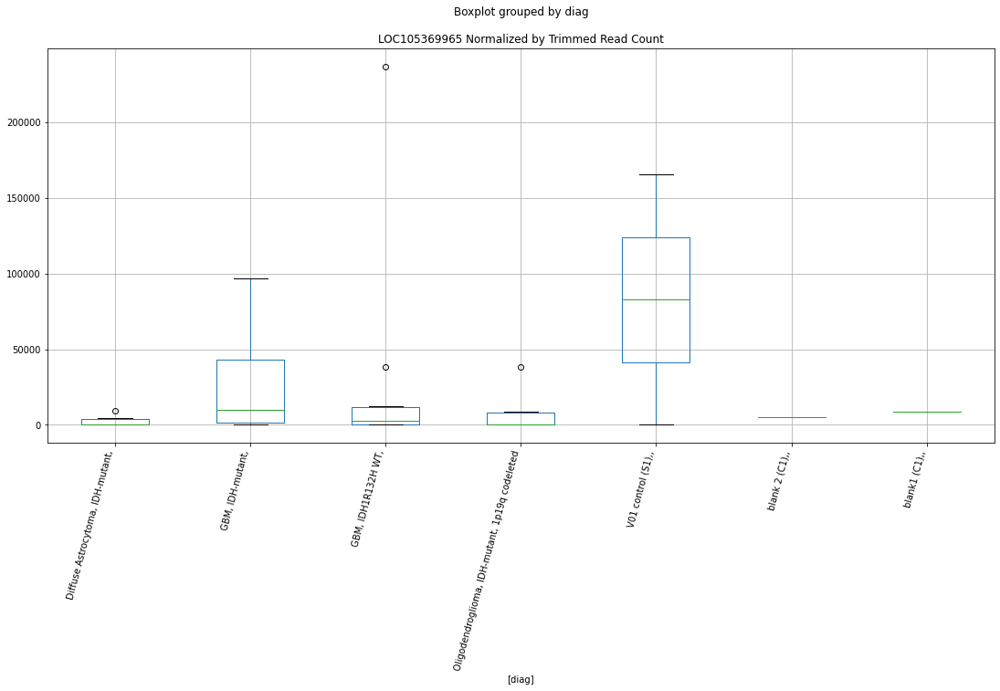

 p : 0.03798592164865805  ( t : 2.239518592365536 ) :  D-plex  :  cutadapt2  :  LOC101929440
Control and blanks
76     31819.80
340     1761.46
Name: LOC101929440, dtype: float64
208    18165.1
Name: LOC101929440, dtype: float64
472    12715.03
Name: LOC101929440, dtype: float64


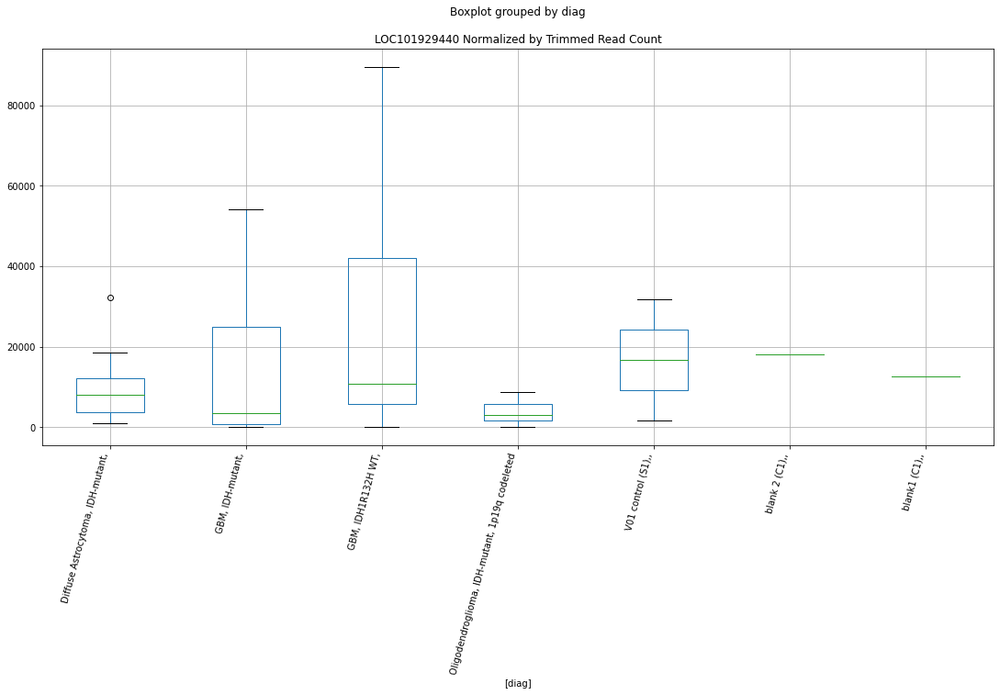

 p : 0.038026792020410635  ( t : 2.2389823303712664 ) :  Lexogen  :  bbduk2  :  LMTK2
Control and blanks
79     0.0
343    0.0
Name: LMTK2, dtype: float64
211    0.0
Name: LMTK2, dtype: float64
475    0.0
Name: LMTK2, dtype: float64


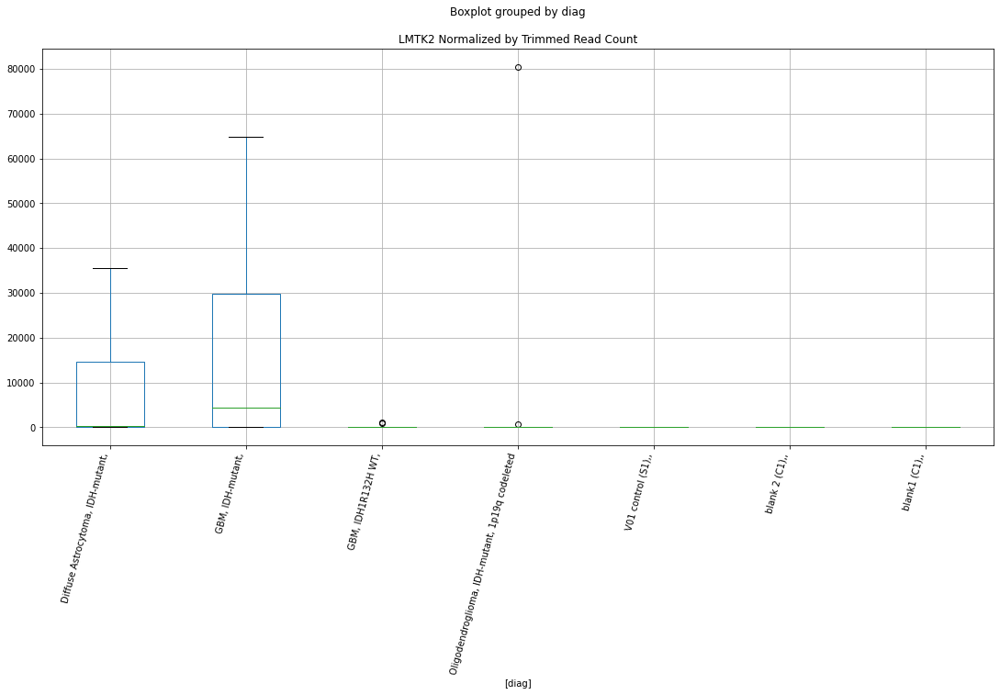

 p : 0.03810952379303155  ( t : 2.2378984274402116 ) :  D-plex  :  bbduk2  :  LOC100128494
Control and blanks
73     1546.02
337     890.16
Name: LOC100128494, dtype: float64
205    7342.73
Name: LOC100128494, dtype: float64
469    9464.44
Name: LOC100128494, dtype: float64


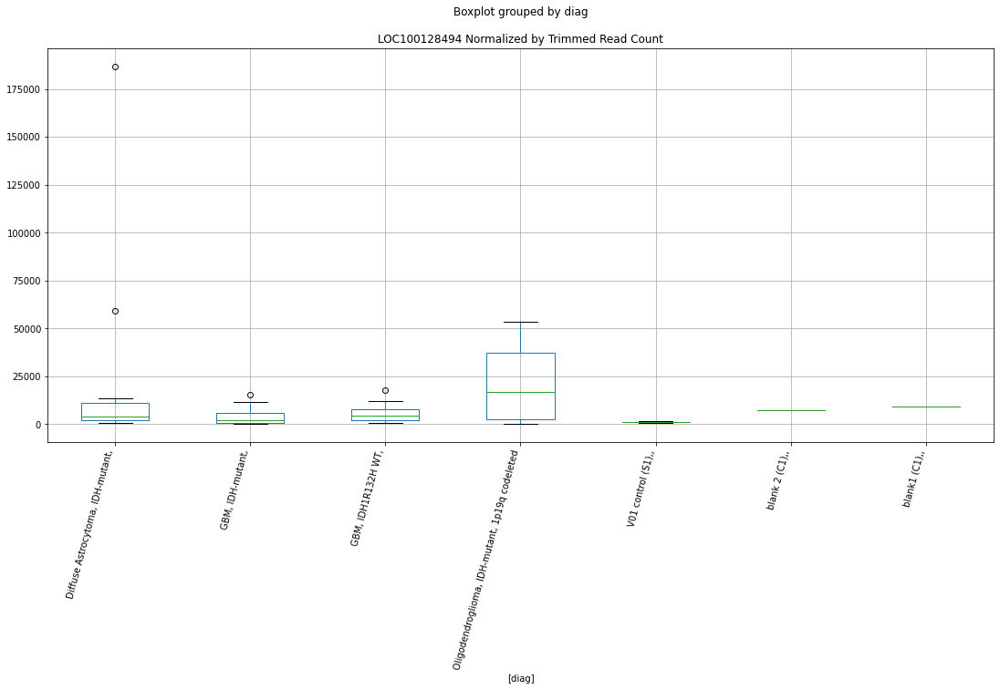

 p : 0.03836713860881562  ( t : 2.234537146788182 ) :  D-plex  :  bbduk2  :  LOC101929440
Control and blanks
73     32466.35
337     1780.31
Name: LOC101929440, dtype: float64
205    18625.46
Name: LOC101929440, dtype: float64
469    12422.07
Name: LOC101929440, dtype: float64


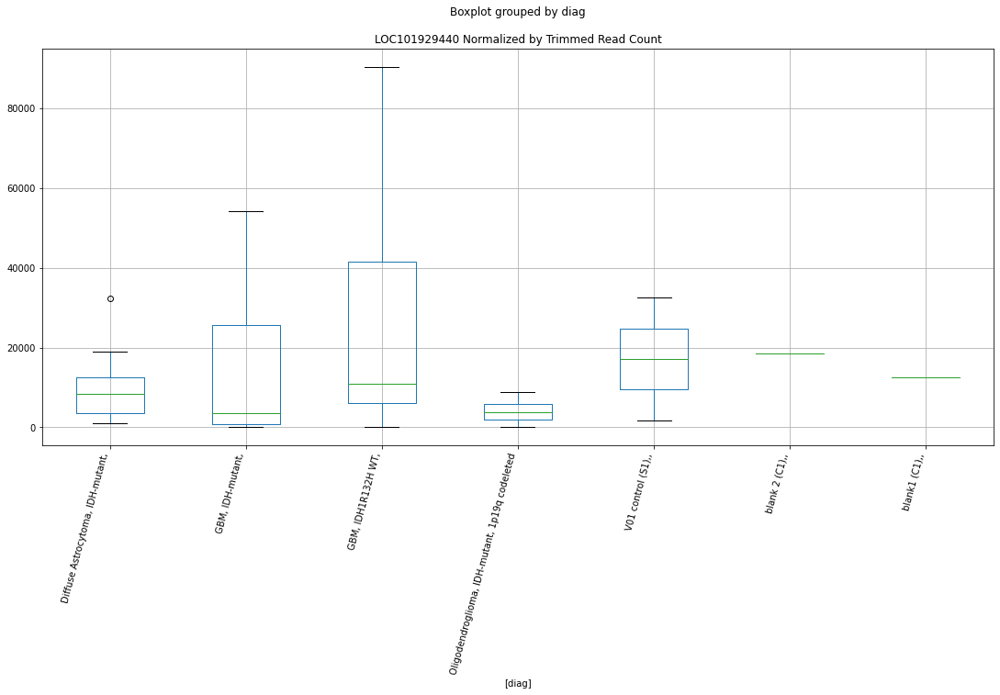

 p : 0.038403396260588425  ( t : 2.234065738534536 ) :  Lexogen  :  bbduk2  :  LOC105370638
Control and blanks
79     0.0
343    0.0
Name: LOC105370638, dtype: float64
211    2733.06
Name: LOC105370638, dtype: float64
475    0.0
Name: LOC105370638, dtype: float64


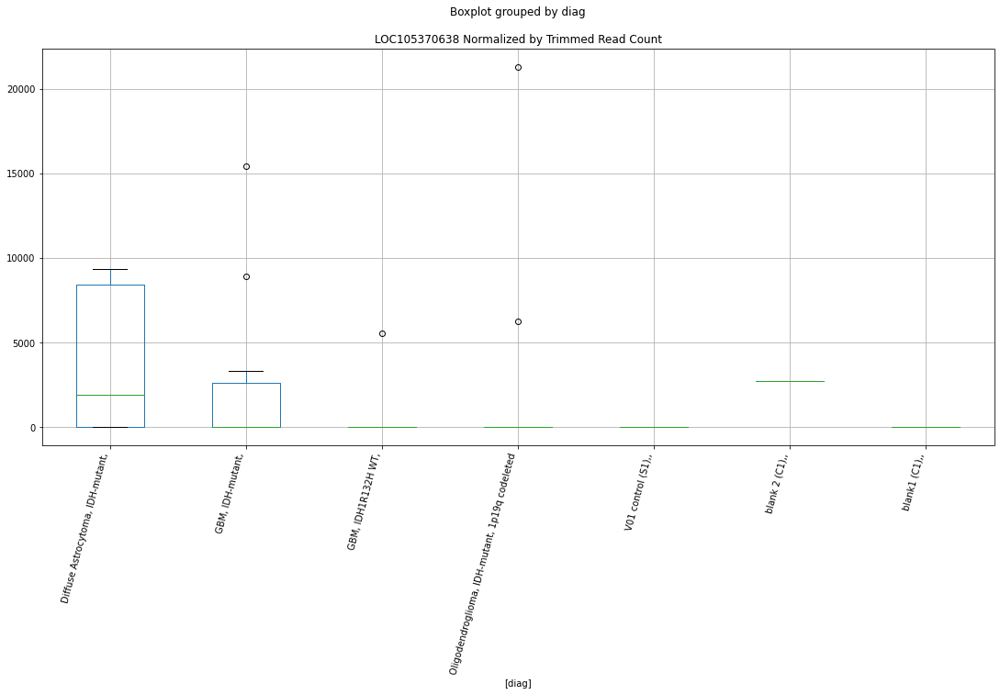

 p : 0.03865399034170849  ( t : 2.2308187757932973 ) :  Lexogen  :  bbduk2  :  LOC100505498
Control and blanks
79     0.0
343    0.0
Name: LOC100505498, dtype: float64
211    273.31
Name: LOC100505498, dtype: float64
475    0.0
Name: LOC100505498, dtype: float64


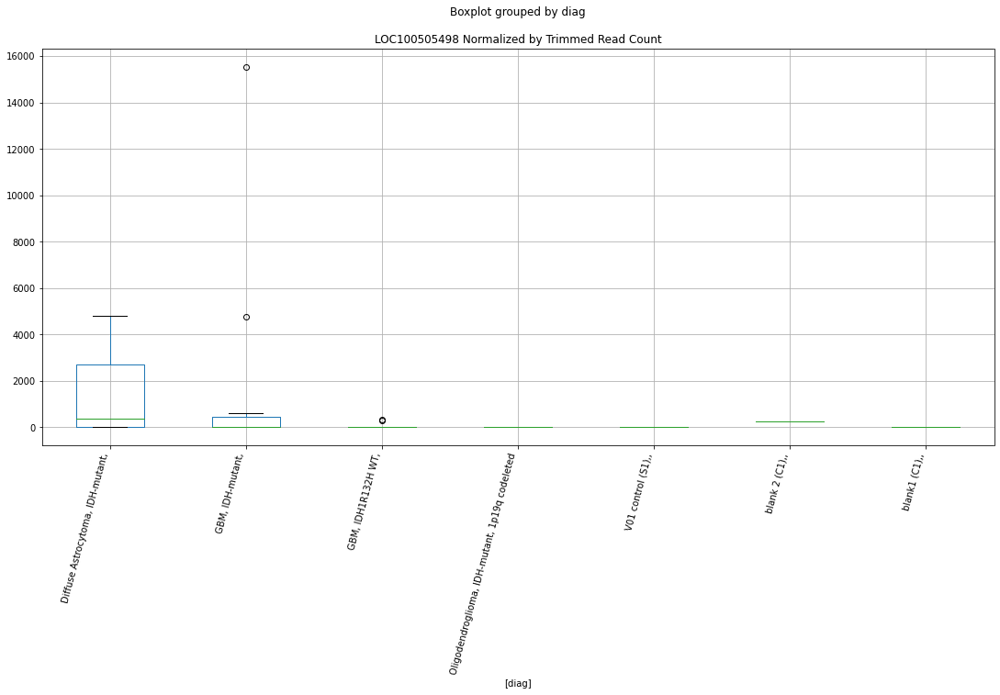

 p : 0.038707588859196056  ( t : 2.230126814653316 ) :  Lexogen  :  cutadapt2  :  LOC101927897
Control and blanks
82       0.00
346    210.43
Name: LOC101927897, dtype: float64
214    1084.91
Name: LOC101927897, dtype: float64
478    6886.35
Name: LOC101927897, dtype: float64


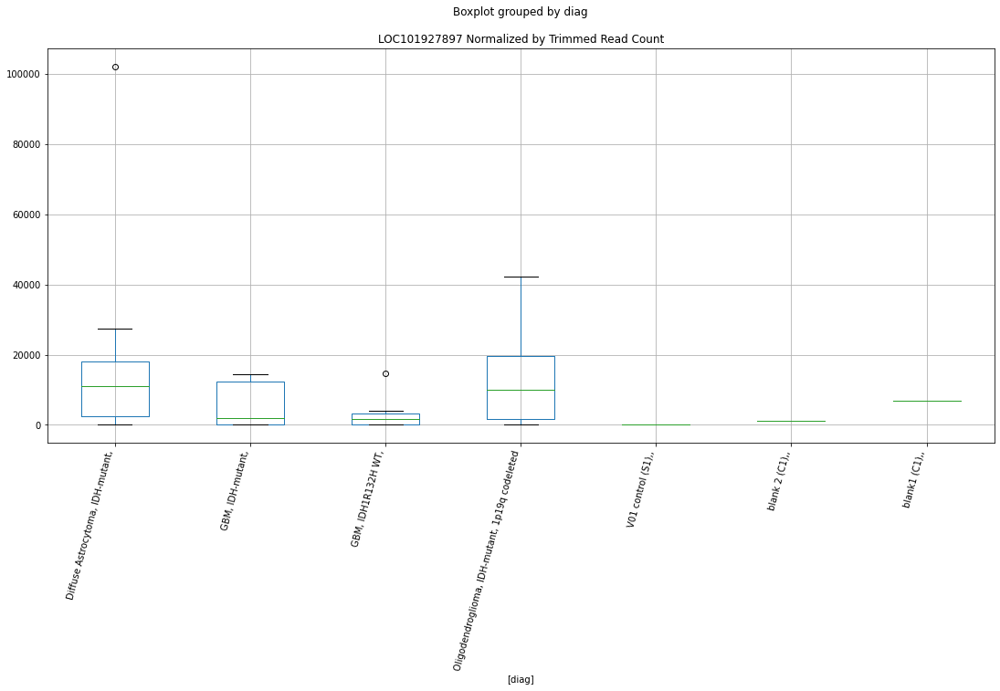

 p : 0.03884795008515257  ( t : 2.22831891305187 ) :  Lexogen  :  bbduk2  :  LOC102724612
Control and blanks
79     0.0
343    0.0
Name: LOC102724612, dtype: float64
211    0.0
Name: LOC102724612, dtype: float64
475    0.0
Name: LOC102724612, dtype: float64


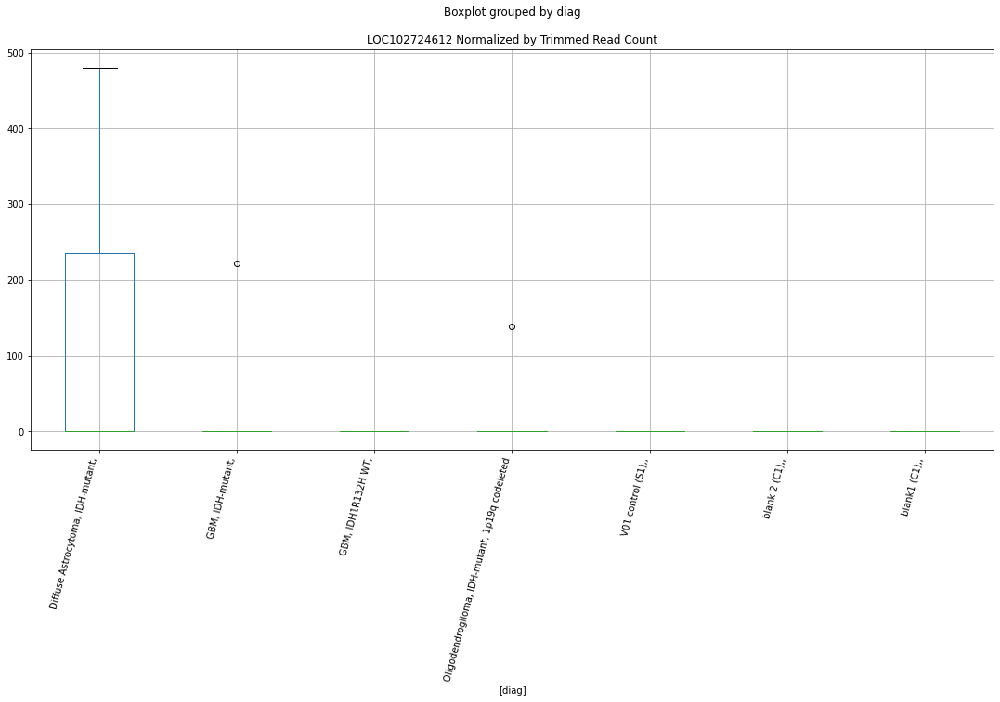

 p : 0.03909043880067188  ( t : 2.2252096994613555 ) :  Lexogen  :  cutadapt2  :  LINC00482
Control and blanks
82     0.0
346    0.0
Name: LINC00482, dtype: float64
214    0.0
Name: LINC00482, dtype: float64
478    0.0
Name: LINC00482, dtype: float64


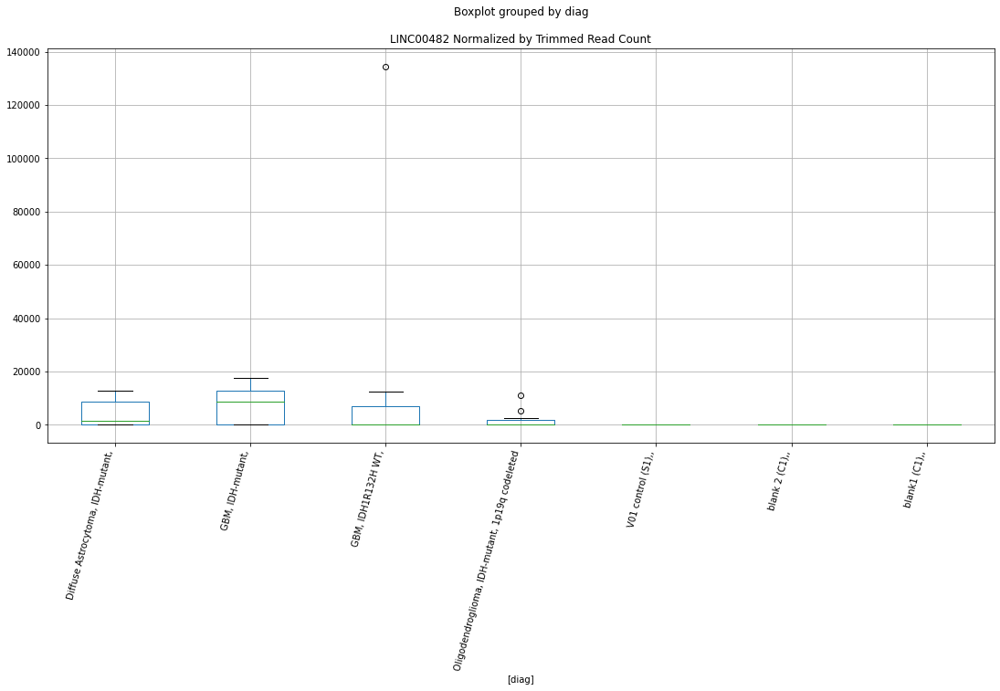

 p : 0.03917615242235667  ( t : 2.224114917889572 ) :  D-plex  :  bbduk2  :  LOC101927013
Control and blanks
73     0.0
337    0.0
Name: LOC101927013, dtype: float64
205    1074.55
Name: LOC101927013, dtype: float64
469    0.0
Name: LOC101927013, dtype: float64


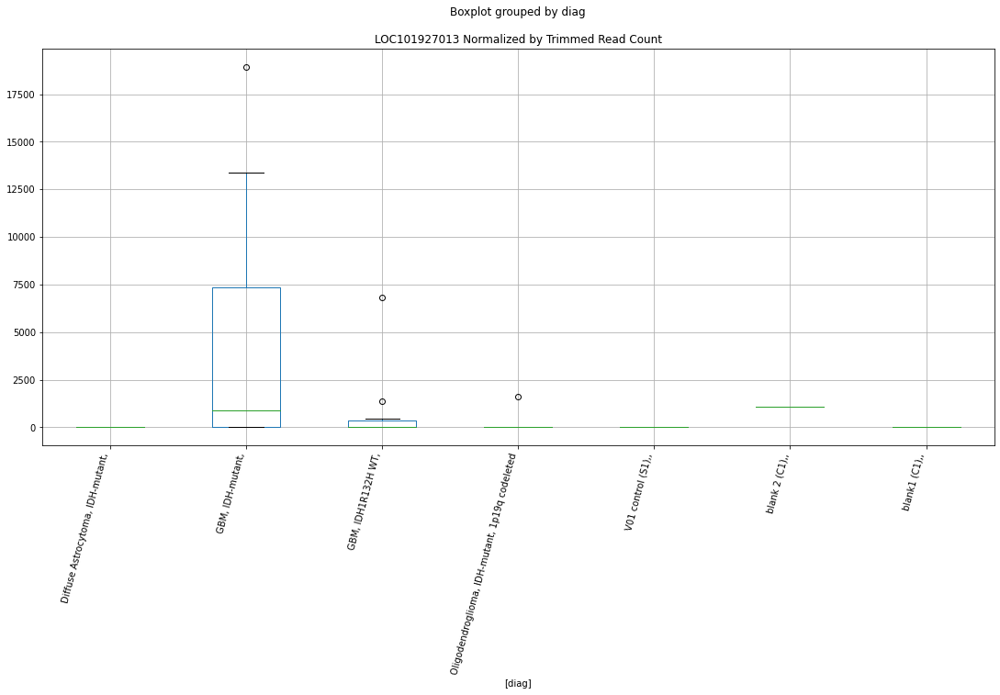

 p : 0.03929366612962981  ( t : 2.222617546452438 ) :  D-plex  :  cutadapt2  :  LOC101929248
Control and blanks
76     8333.76
340    8807.32
Name: LOC101929248, dtype: float64
208    9876.17
Name: LOC101929248, dtype: float64
472    4623.65
Name: LOC101929248, dtype: float64


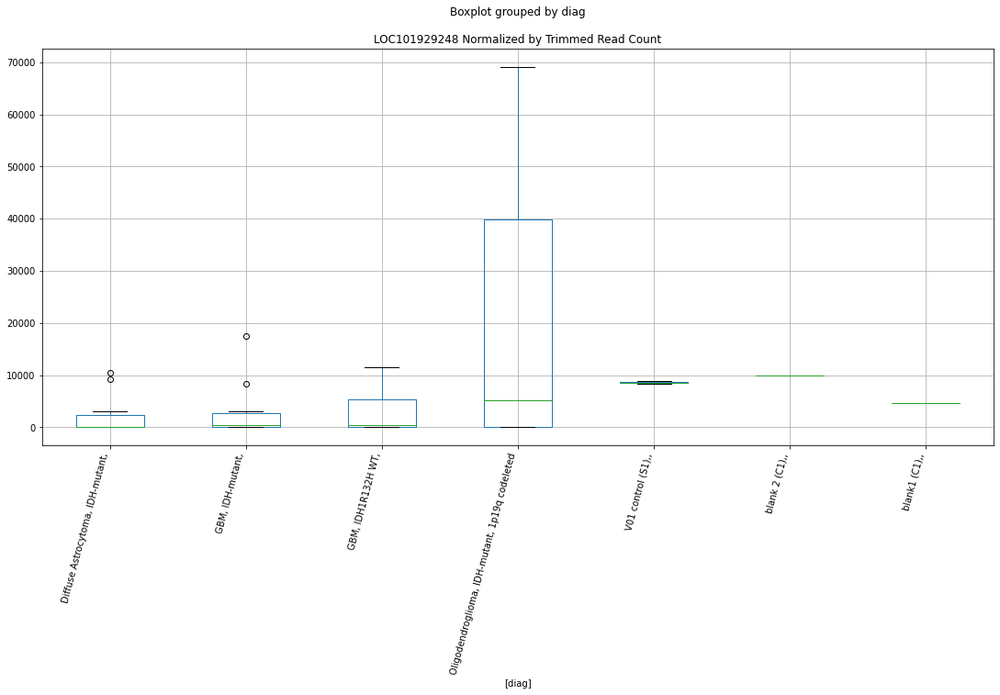

 p : 0.03932562876399374  ( t : 2.222210988405208 ) :  D-plex  :  cutadapt2  :  LOC102724621
Control and blanks
76      3030.46
340    52843.93
Name: LOC102724621, dtype: float64
208    23984.99
Name: LOC102724621, dtype: float64
472    26585.97
Name: LOC102724621, dtype: float64


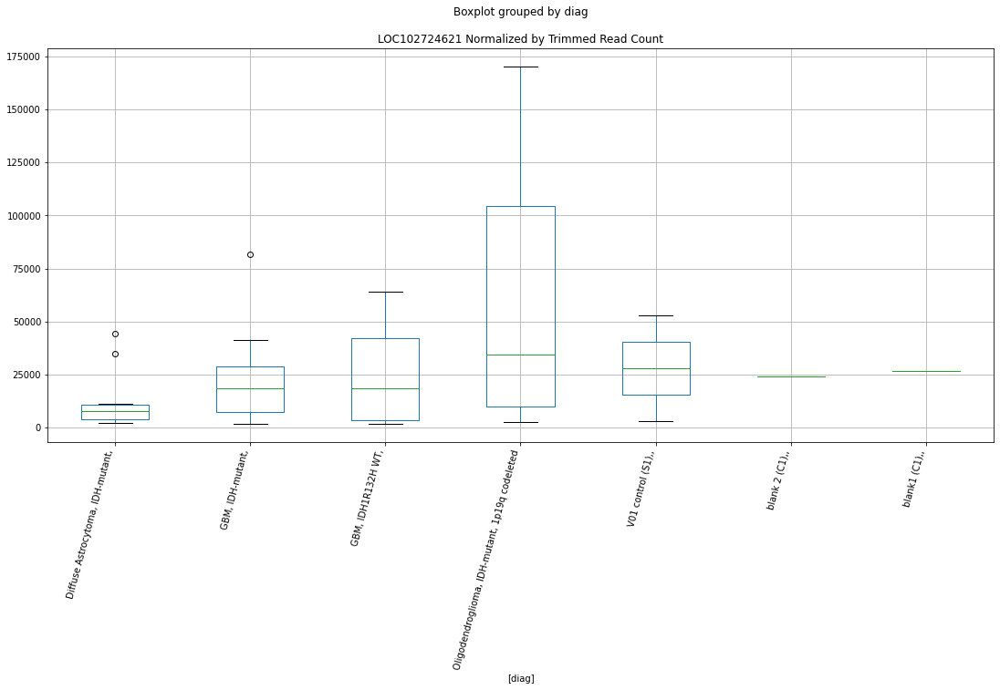

 p : 0.039362641335415685  ( t : 2.2217405760417632 ) :  D-plex  :  cutadapt2  :  LOC101927082
Control and blanks
76     0.0
340    0.0
Name: LOC101927082, dtype: float64
208    1234.52
Name: LOC101927082, dtype: float64
472    2889.78
Name: LOC101927082, dtype: float64


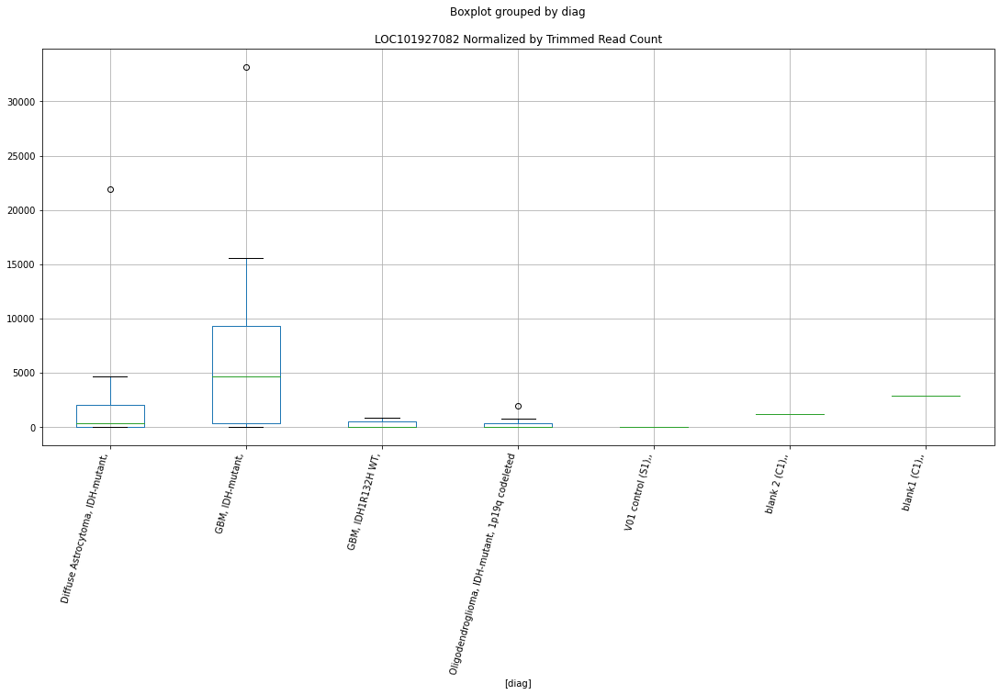

 p : 0.03937507725146527  ( t : 2.2215826127683616 ) :  Lexogen  :  cutadapt2  :  LINC02596
Control and blanks
82     0.0
346    0.0
Name: LINC02596, dtype: float64
214    0.0
Name: LINC02596, dtype: float64
478    0.0
Name: LINC02596, dtype: float64


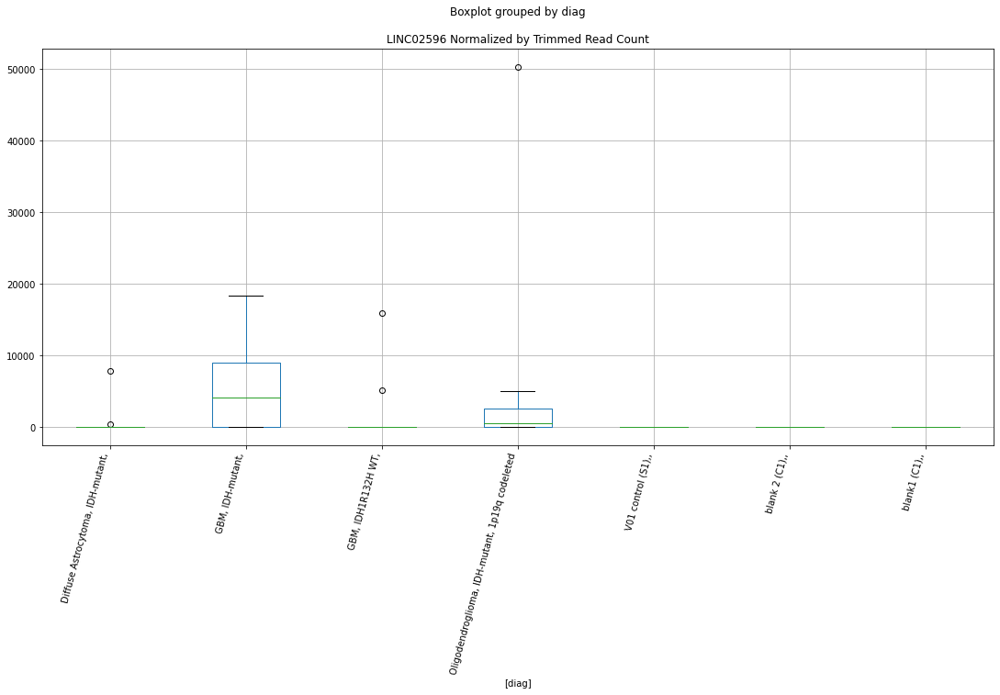

 p : 0.039535797779709225  ( t : 2.219545231794243 ) :  Lexogen  :  bbduk2  :  LOC101927897
Control and blanks
79       0.00
343    212.31
Name: LOC101927897, dtype: float64
211    1093.23
Name: LOC101927897, dtype: float64
475    6945.96
Name: LOC101927897, dtype: float64


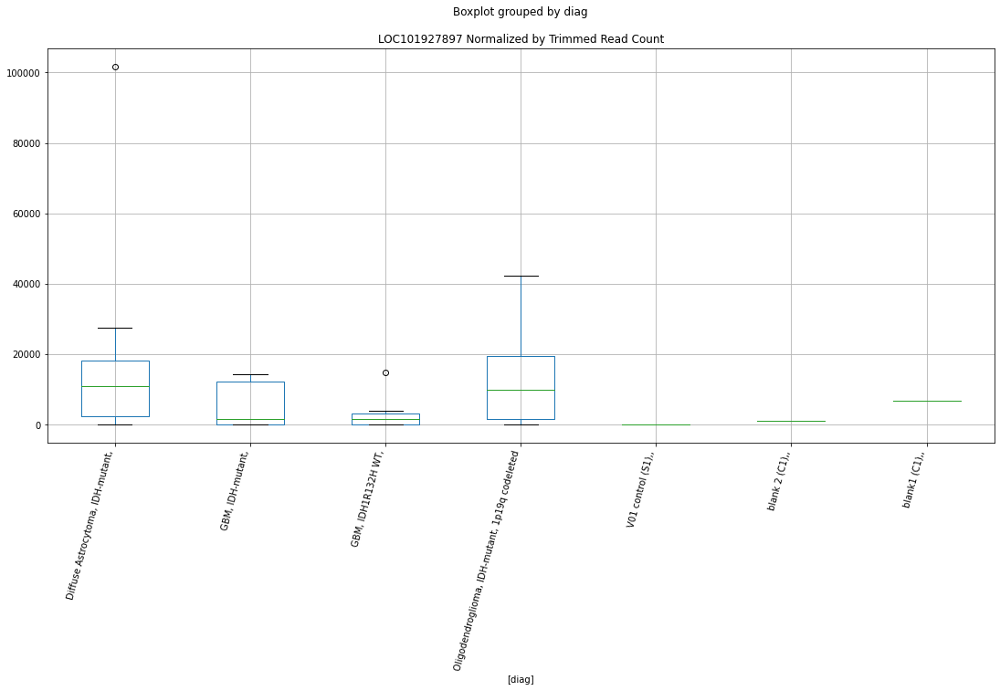

 p : 0.039603330624643523  ( t : 2.218691421835257 ) :  D-plex  :  bbduk2  :  LOC101929248
Control and blanks
73     8503.09
337    8901.57
Name: LOC101929248, dtype: float64
205    9670.91
Name: LOC101929248, dtype: float64
469    5915.27
Name: LOC101929248, dtype: float64


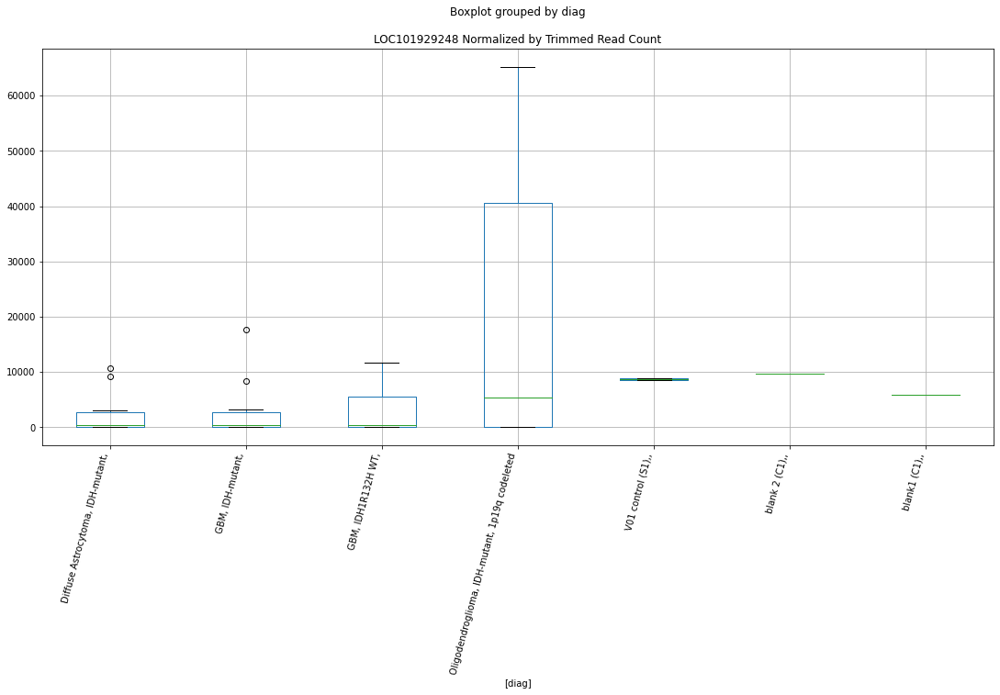

 p : 0.03968153533561723  ( t : 2.2177043609347664 ) :  D-plex  :  bbduk2  :  LOC101929322
Control and blanks
73        0.00
337    1780.31
Name: LOC101929322, dtype: float64
205    2507.27
Name: LOC101929322, dtype: float64
469    2366.11
Name: LOC101929322, dtype: float64


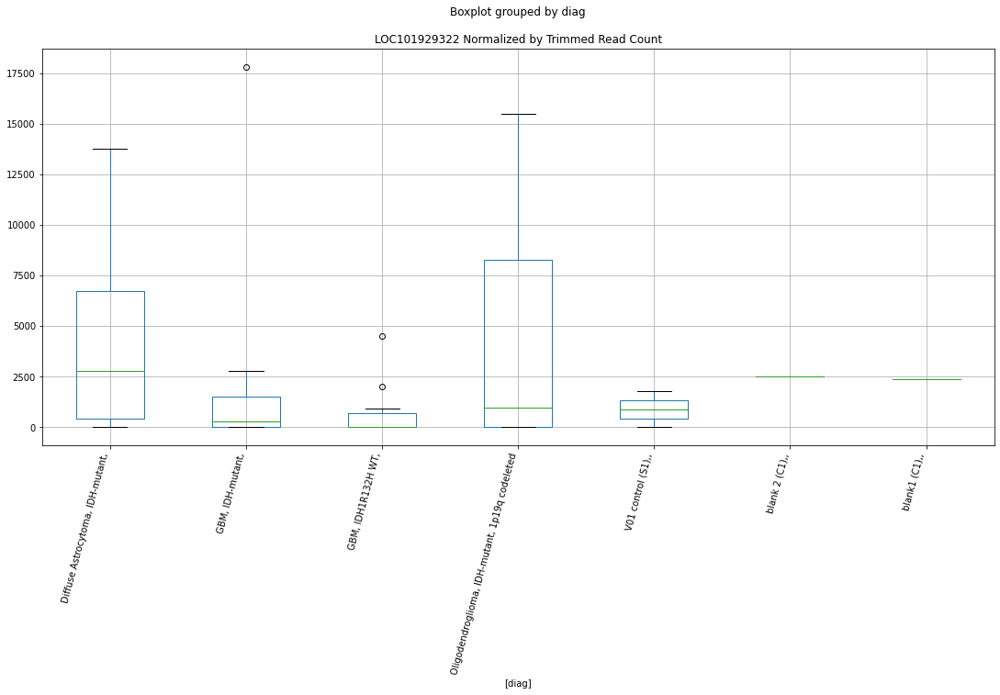

 p : 0.03973170223279085  ( t : 2.2170721211733495 ) :  D-plex  :  bbduk2  :  LIM2
Control and blanks
73     0.0
337    0.0
Name: LIM2, dtype: float64
205    716.36
Name: LIM2, dtype: float64
469    1183.05
Name: LIM2, dtype: float64


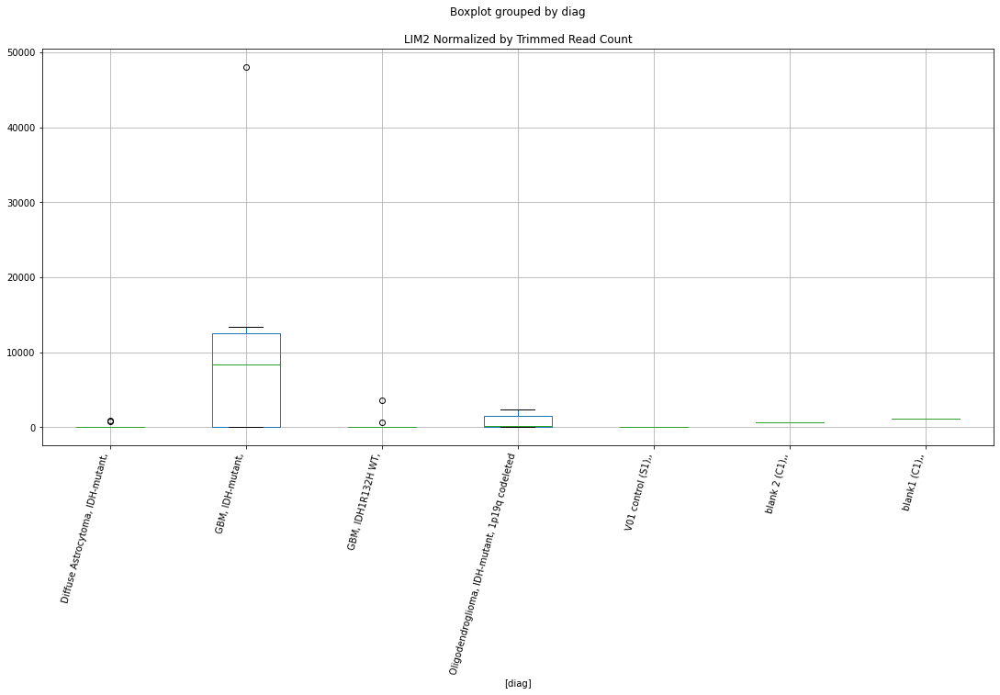

 p : 0.03976316851423017  ( t : 2.216675934854225 ) :  D-plex  :  bbduk2  :  LINC01355
Control and blanks
73     0.0
337    0.0
Name: LINC01355, dtype: float64
205    1074.55
Name: LINC01355, dtype: float64
469    0.0
Name: LINC01355, dtype: float64


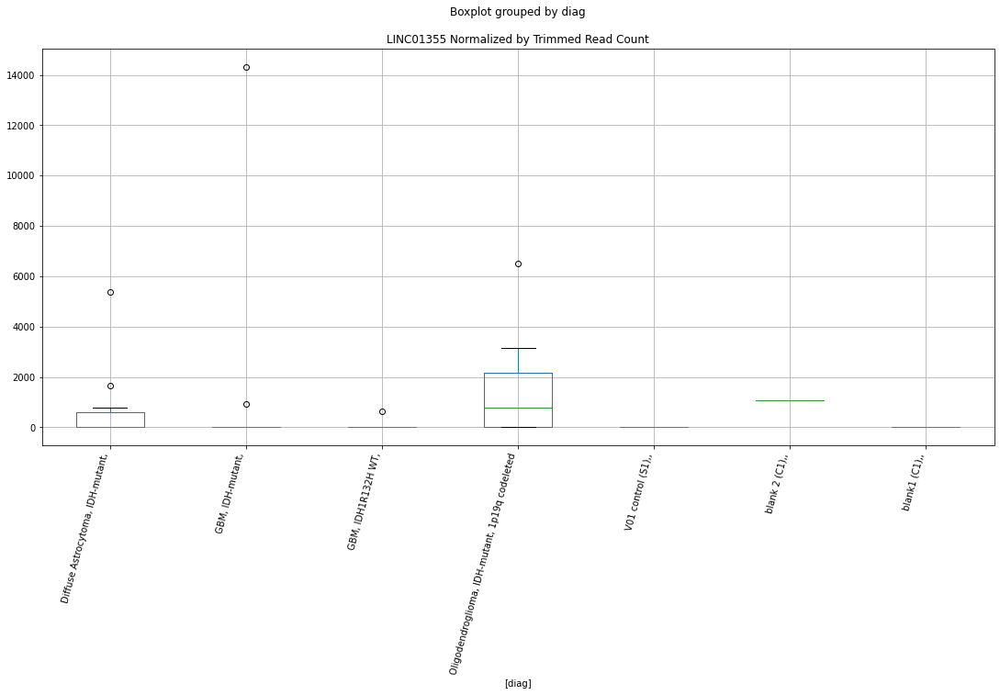

 p : 0.04001601144086263  ( t : 2.2135028623771995 ) :  D-plex  :  cutadapt2  :  LINC01450
Control and blanks
76       0.00
340    880.73
Name: LINC01450, dtype: float64
208    1410.88
Name: LINC01450, dtype: float64
472    1155.91
Name: LINC01450, dtype: float64


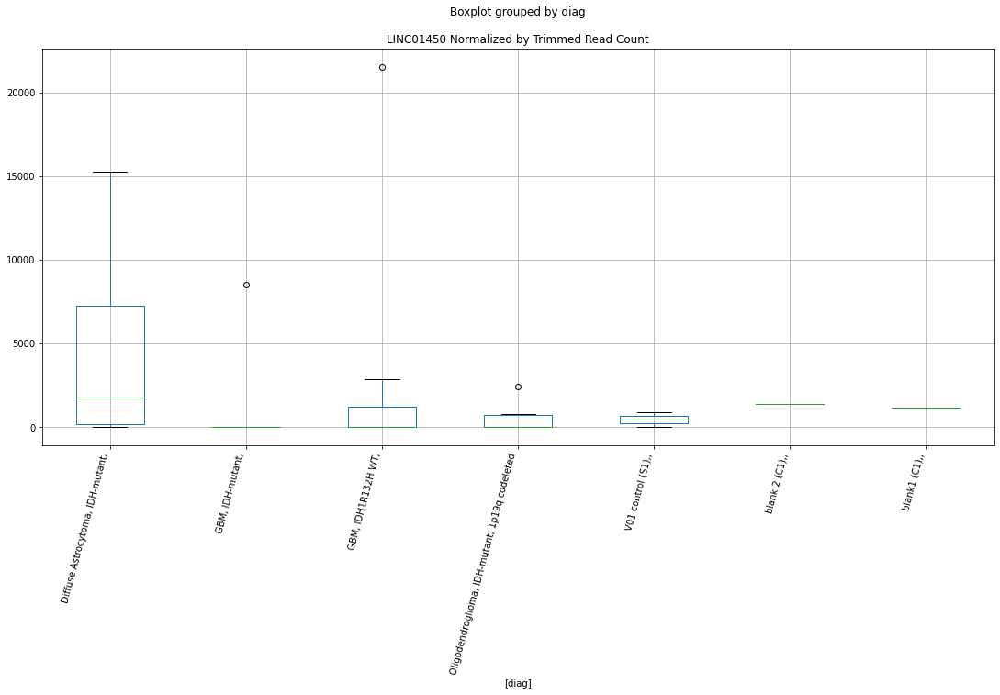

 p : 0.04004765075266236  ( t : 2.2131071011814263 ) :  D-plex  :  bbduk2  :  LOC101929814
Control and blanks
73     0.0
337    0.0
Name: LOC101929814, dtype: float64
205    10924.55
Name: LOC101929814, dtype: float64
469    27210.26
Name: LOC101929814, dtype: float64


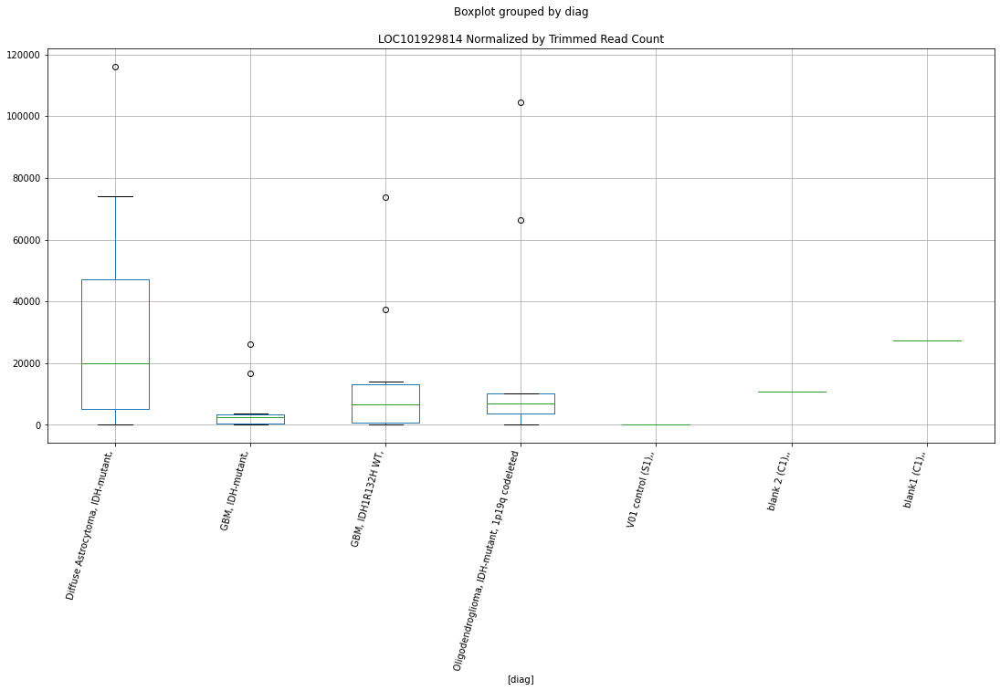

 p : 0.04008400796948675  ( t : 2.212652680814141 ) :  D-plex  :  bbduk2  :  LINC01900
Control and blanks
73     33239.36
337        0.00
Name: LINC01900, dtype: float64
205    716.36
Name: LINC01900, dtype: float64
469    1183.05
Name: LINC01900, dtype: float64


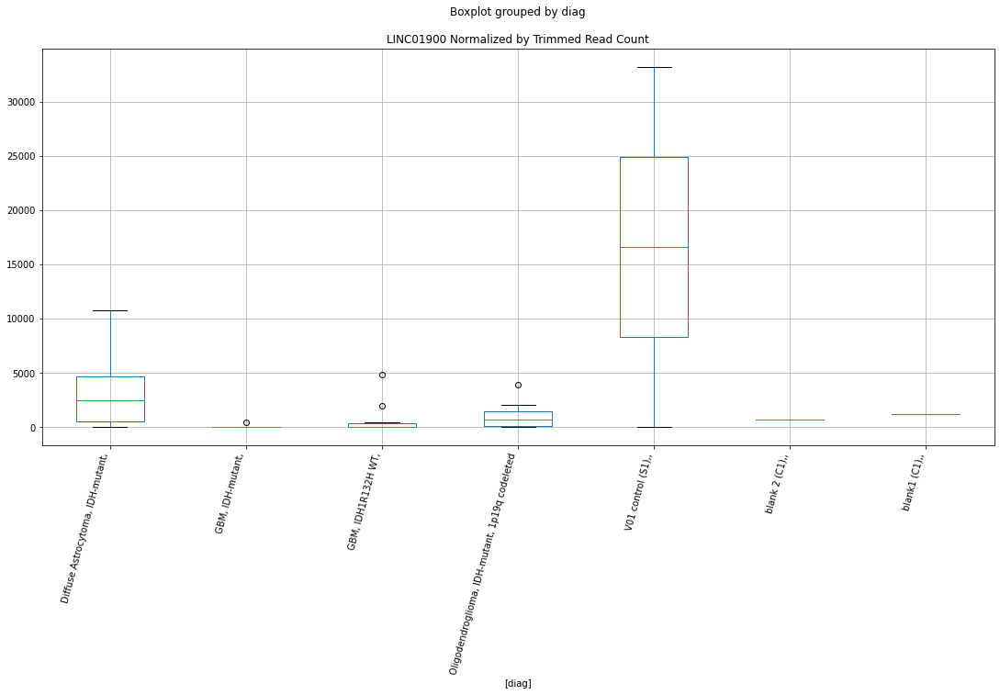

 p : 0.04019511608534352  ( t : 2.211266311486375 ) :  D-plex  :  cutadapt2  :  LINC01355
Control and blanks
76     0.0
340    0.0
Name: LINC01355, dtype: float64
208    1058.16
Name: LINC01355, dtype: float64
472    0.0
Name: LINC01355, dtype: float64


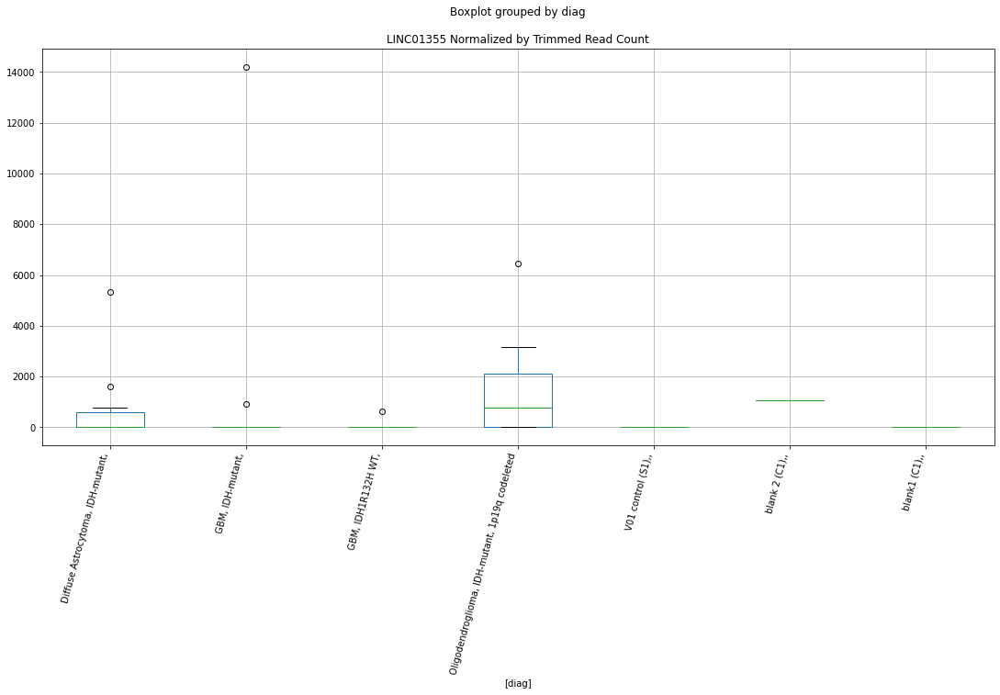

 p : 0.040261918006577975  ( t : 2.210434474886092 ) :  D-plex  :  bbduk2  :  LOC105369583
Control and blanks
73     0.0
337    0.0
Name: LOC105369583, dtype: float64
205    179.09
Name: LOC105369583, dtype: float64
469    0.0
Name: LOC105369583, dtype: float64


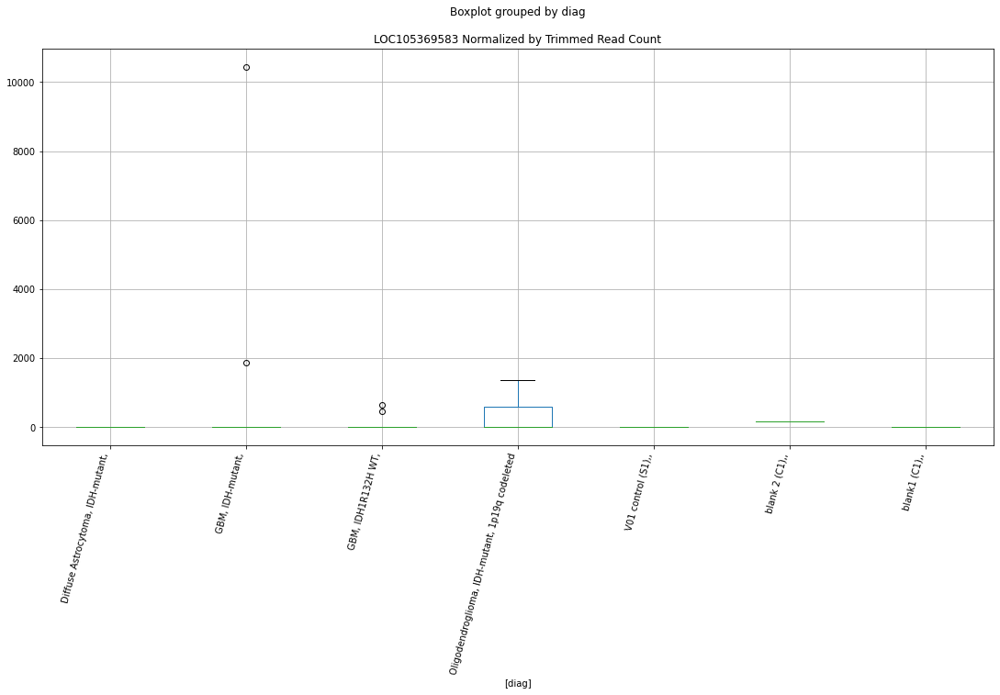

 p : 0.040511656704020564  ( t : 2.207335854037603 ) :  D-plex  :  cutadapt2  :  LOC100507513
Control and blanks
76     0.0
340    0.0
Name: LOC100507513, dtype: float64
208    176.36
Name: LOC100507513, dtype: float64
472    1155.91
Name: LOC100507513, dtype: float64


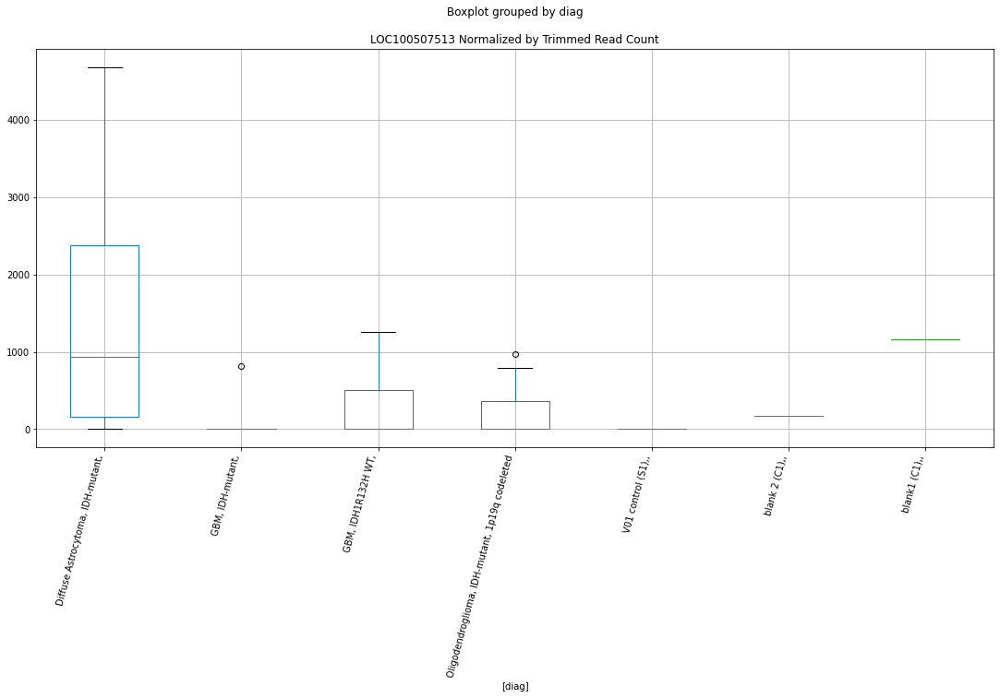

 p : 0.04052822970977118  ( t : 2.2071308470178246 ) :  Lexogen  :  cutadapt2  :  LOC105369331
Control and blanks
82        0.00
346    1893.91
Name: LOC105369331, dtype: float64
214    0.0
Name: LOC105369331, dtype: float64
478    0.0
Name: LOC105369331, dtype: float64


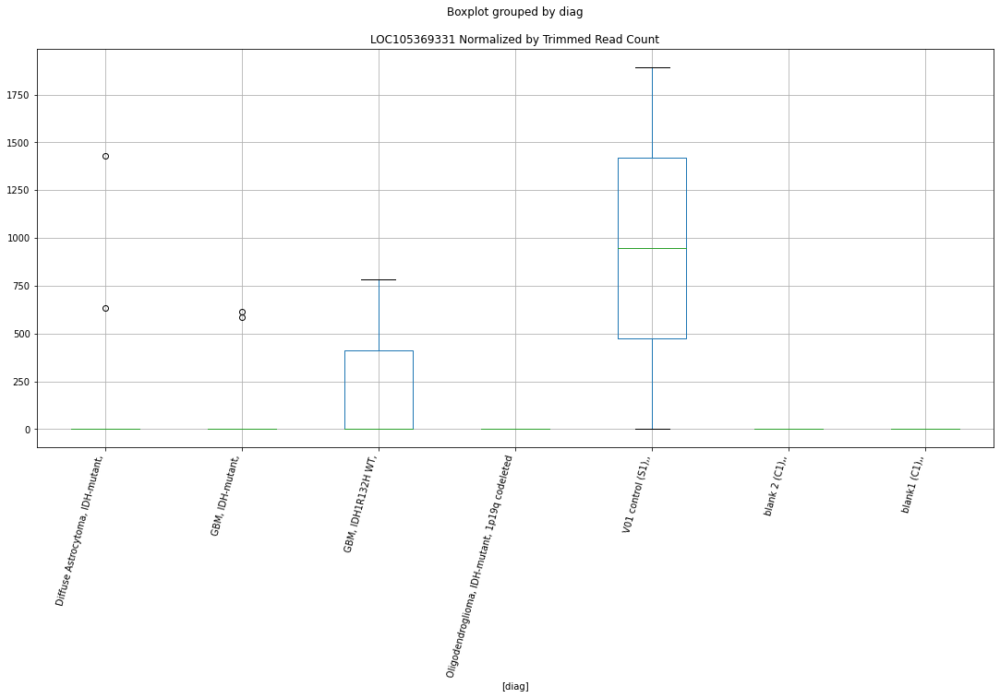

 p : 0.040764176952762604  ( t : 2.204220520086657 ) :  Lexogen  :  cutadapt2  :  LINC02210
Control and blanks
82     0.0
346    0.0
Name: LINC02210, dtype: float64
214    0.0
Name: LINC02210, dtype: float64
478    22796.21
Name: LINC02210, dtype: float64


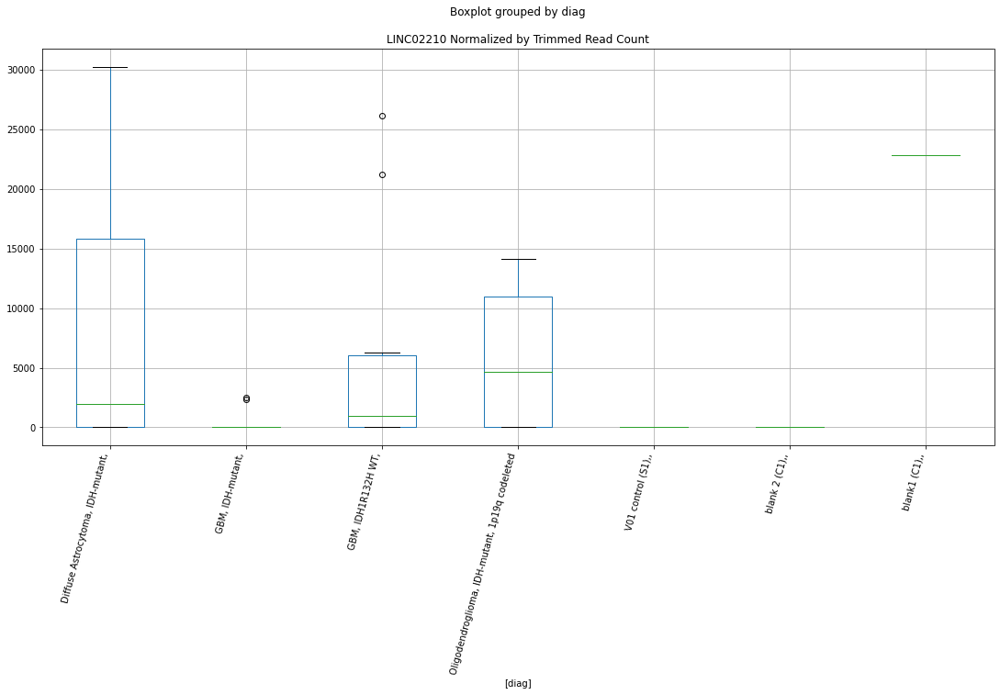

 p : 0.04083863930241198  ( t : 2.2033052656973946 ) :  D-plex  :  bbduk2  :  LOC101929408
Control and blanks
73     6184.07
337       0.00
Name: LOC101929408, dtype: float64
205    7163.64
Name: LOC101929408, dtype: float64
469    9464.44
Name: LOC101929408, dtype: float64


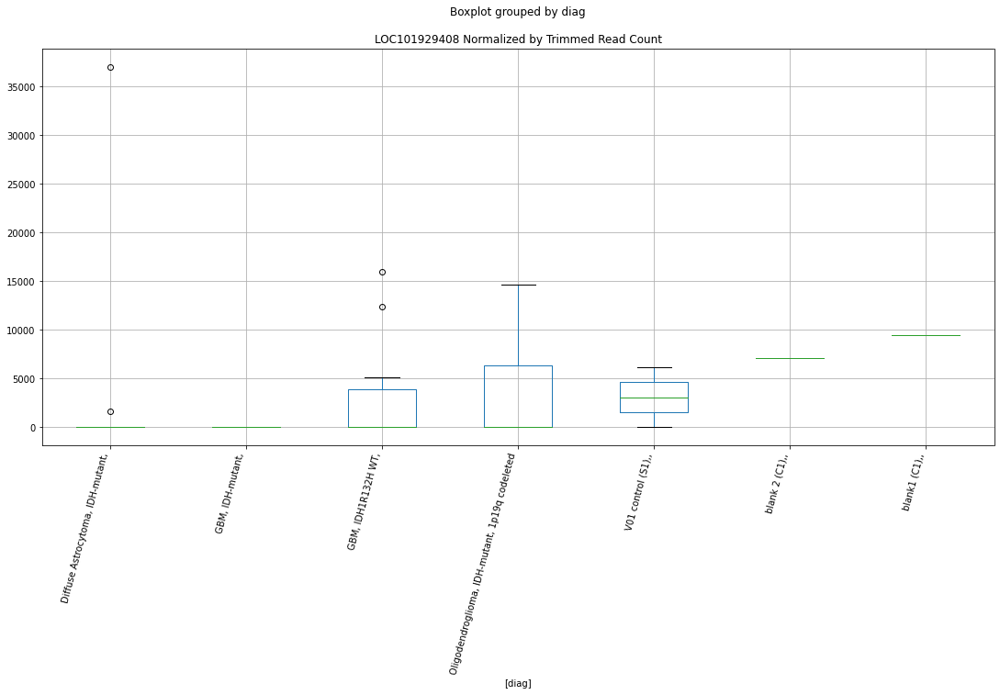

 p : 0.04089167253559275  ( t : 2.2026543417450646 ) :  Lexogen  :  cutadapt2  :  LINC02663
Control and blanks
82     0.0
346    0.0
Name: LINC02663, dtype: float64
214    0.0
Name: LINC02663, dtype: float64
478    0.0
Name: LINC02663, dtype: float64


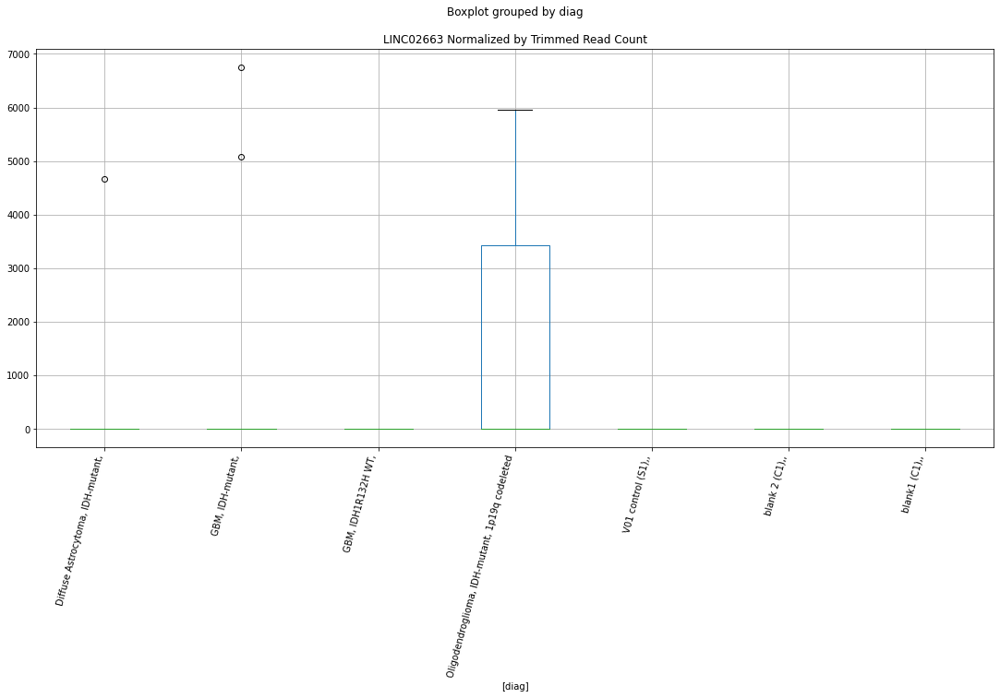

 p : 0.04107841201449568  ( t : 2.200368478429151 ) :  D-plex  :  cutadapt2  :  LOC105371241
Control and blanks
76     0.0
340    0.0
Name: LOC105371241, dtype: float64
208    176.36
Name: LOC105371241, dtype: float64
472    577.96
Name: LOC105371241, dtype: float64


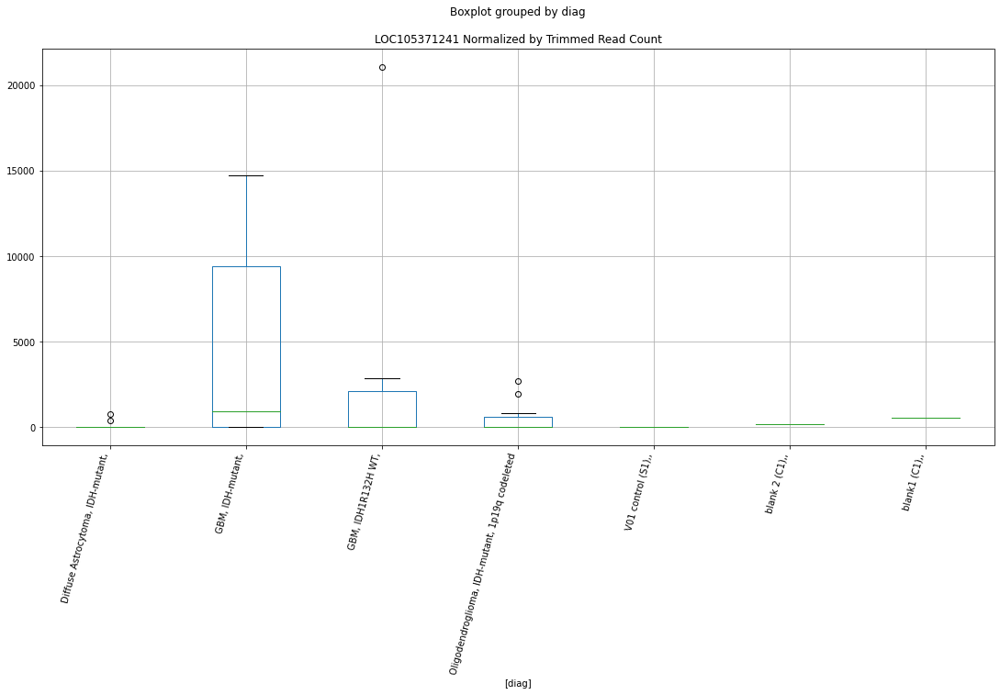

 p : 0.041127834835097264  ( t : 2.1997650948955085 ) :  D-plex  :  bbduk2  :  LINC02818
Control and blanks
73     0.0
337    0.0
Name: LINC02818, dtype: float64
205    2149.09
Name: LINC02818, dtype: float64
469    1183.05
Name: LINC02818, dtype: float64


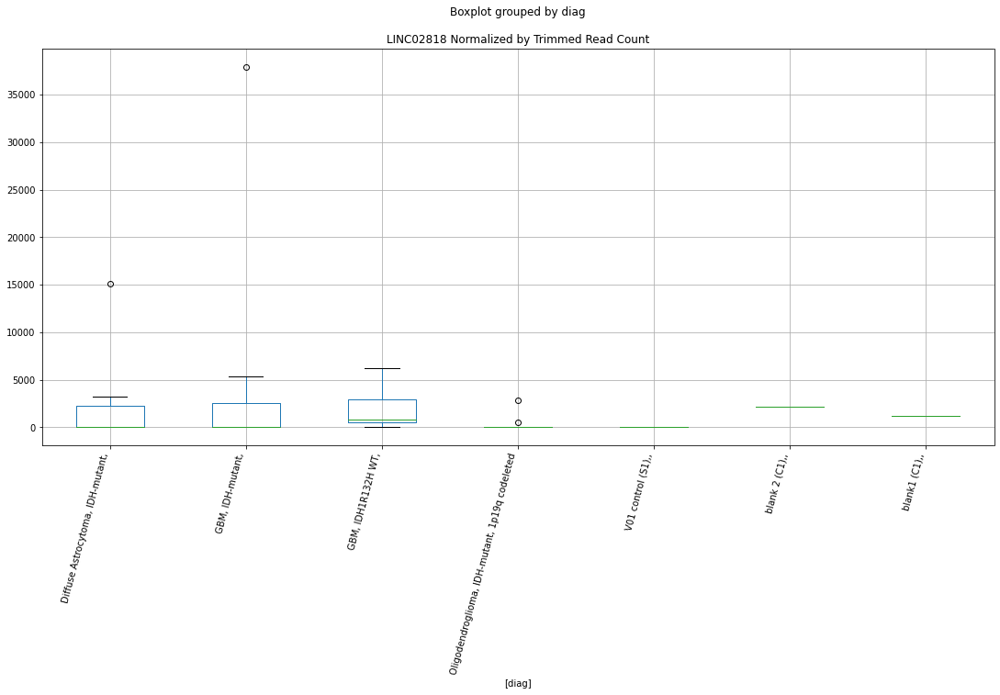

 p : 0.0412015896575724  ( t : 2.1988658888132893 ) :  Lexogen  :  bbduk2  :  LOC101929018
Control and blanks
79         0.00
343    22080.69
Name: LOC101929018, dtype: float64
211    0.0
Name: LOC101929018, dtype: float64
475    0.0
Name: LOC101929018, dtype: float64


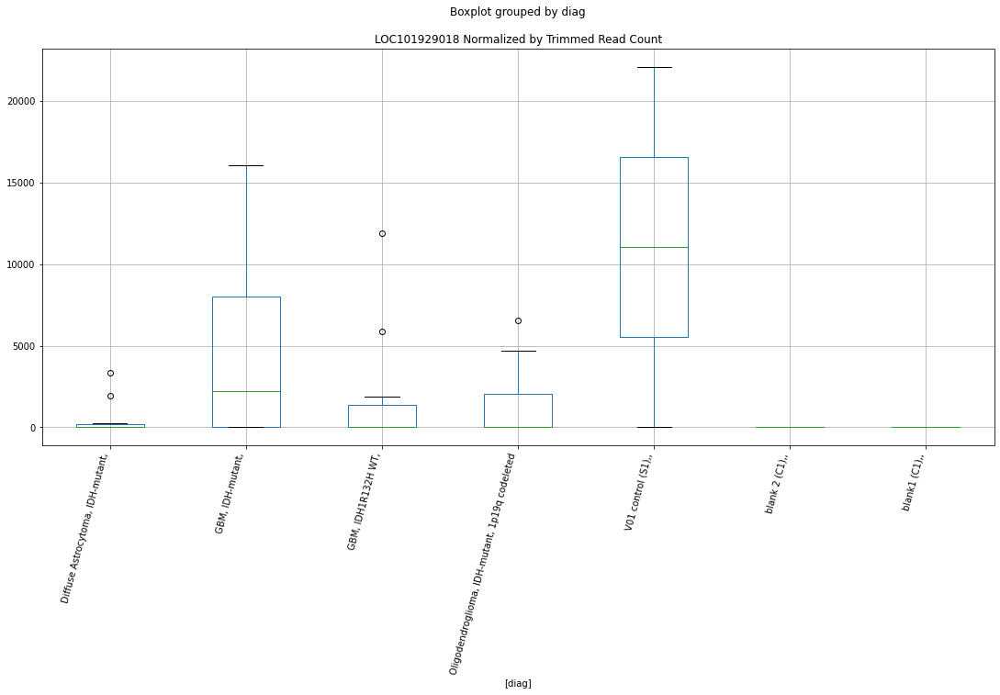

 p : 0.04120330081777544  ( t : 2.1988450441933627 ) :  Lexogen  :  cutadapt2  :  LOC101929018
Control and blanks
82         0.00
346    21885.19
Name: LOC101929018, dtype: float64
214    0.0
Name: LOC101929018, dtype: float64
478    0.0
Name: LOC101929018, dtype: float64


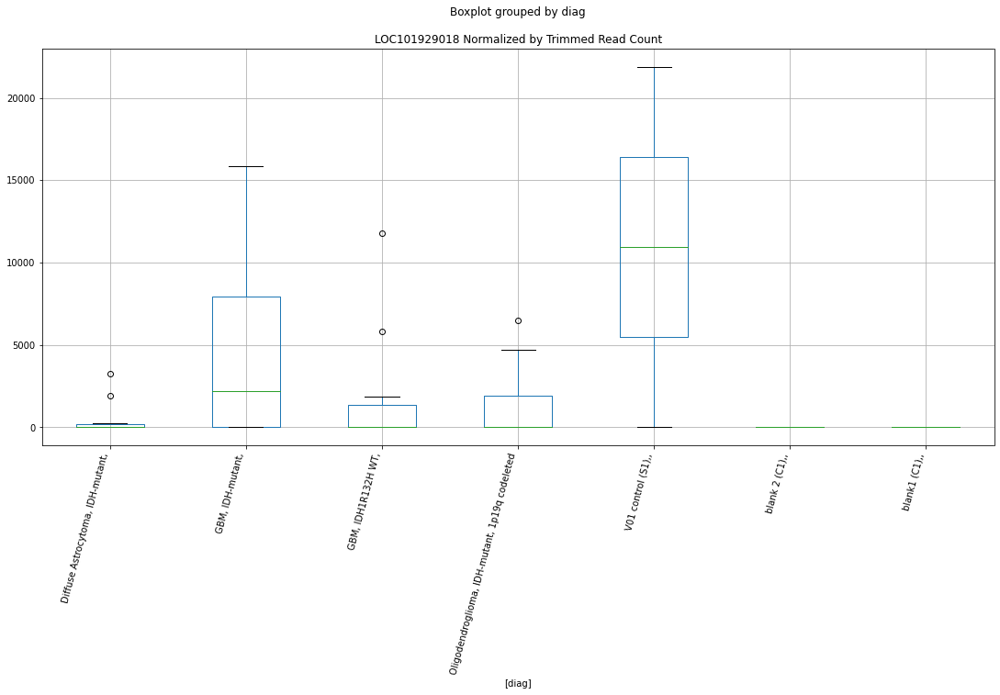

 p : 0.04125818608688124  ( t : 2.198176876672238 ) :  D-plex  :  bbduk2  :  LOC101927691
Control and blanks
73     0.0
337    0.0
Name: LOC101927691, dtype: float64
205    1074.55
Name: LOC101927691, dtype: float64
469    591.53
Name: LOC101927691, dtype: float64


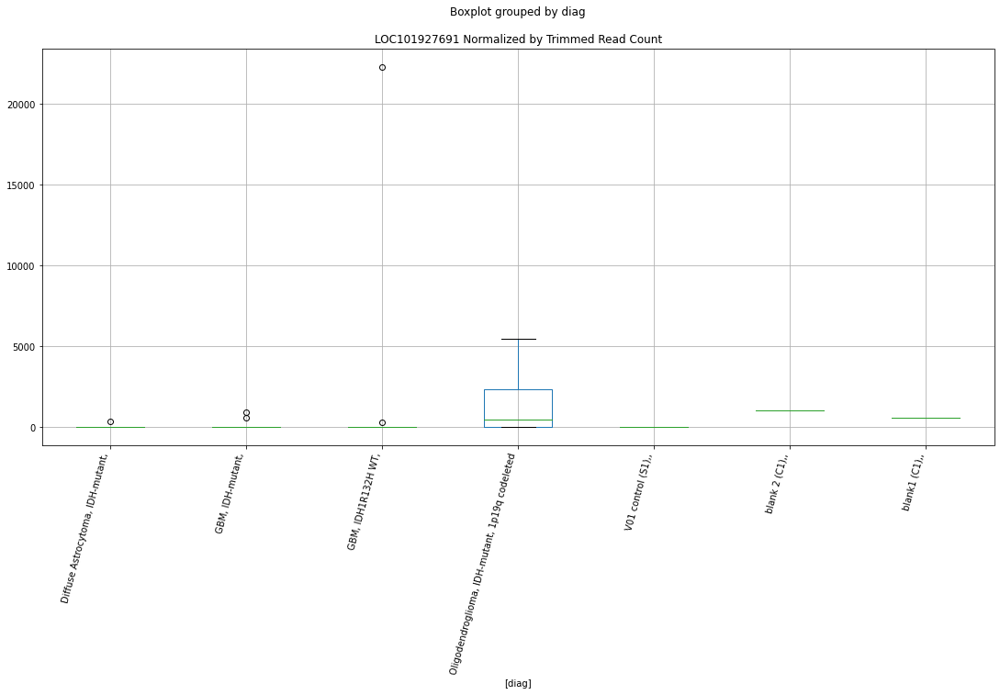

 p : 0.04129066490438387  ( t : 2.1977818672376177 ) :  Lexogen  :  cutadapt2  :  LKAAEAR1
Control and blanks
82     0.0
346    0.0
Name: LKAAEAR1, dtype: float64
214    1356.13
Name: LKAAEAR1, dtype: float64
478    0.0
Name: LKAAEAR1, dtype: float64


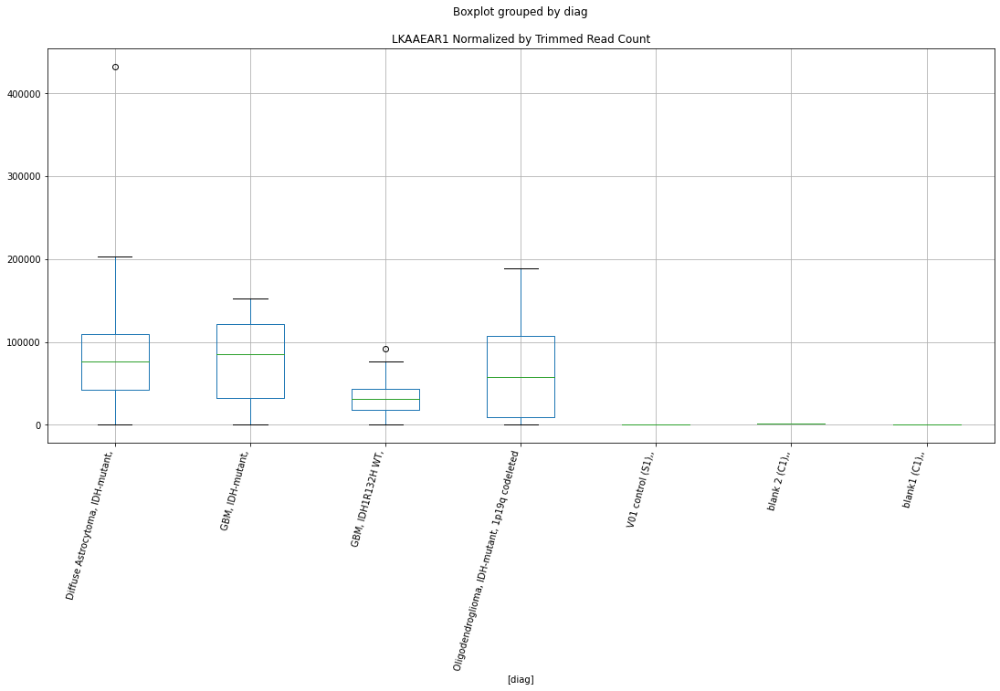

 p : 0.041397228882512814  ( t : 2.1964878299277006 ) :  D-plex  :  cutadapt2  :  LINC02721
Control and blanks
76     18940.36
340        0.00
Name: LINC02721, dtype: float64
208    3527.2
Name: LINC02721, dtype: float64
472    4045.69
Name: LINC02721, dtype: float64


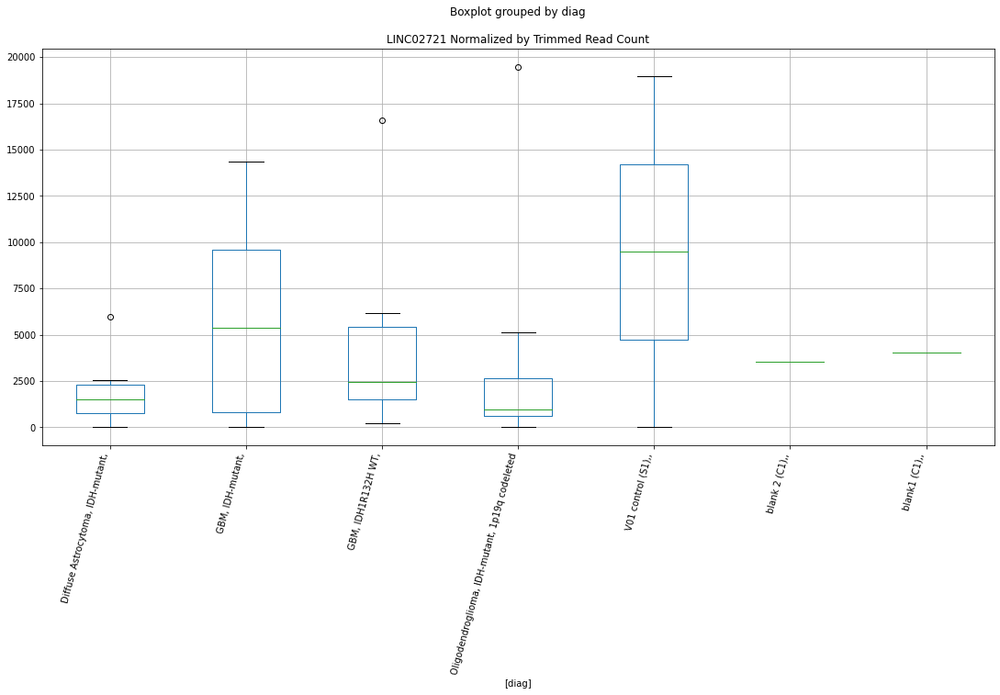

 p : 0.04147139383036038  ( t : 2.195589027066899 ) :  D-plex  :  bbduk2  :  LINC02637
Control and blanks
73     0.0
337    0.0
Name: LINC02637, dtype: float64
205    179.09
Name: LINC02637, dtype: float64
469    0.0
Name: LINC02637, dtype: float64


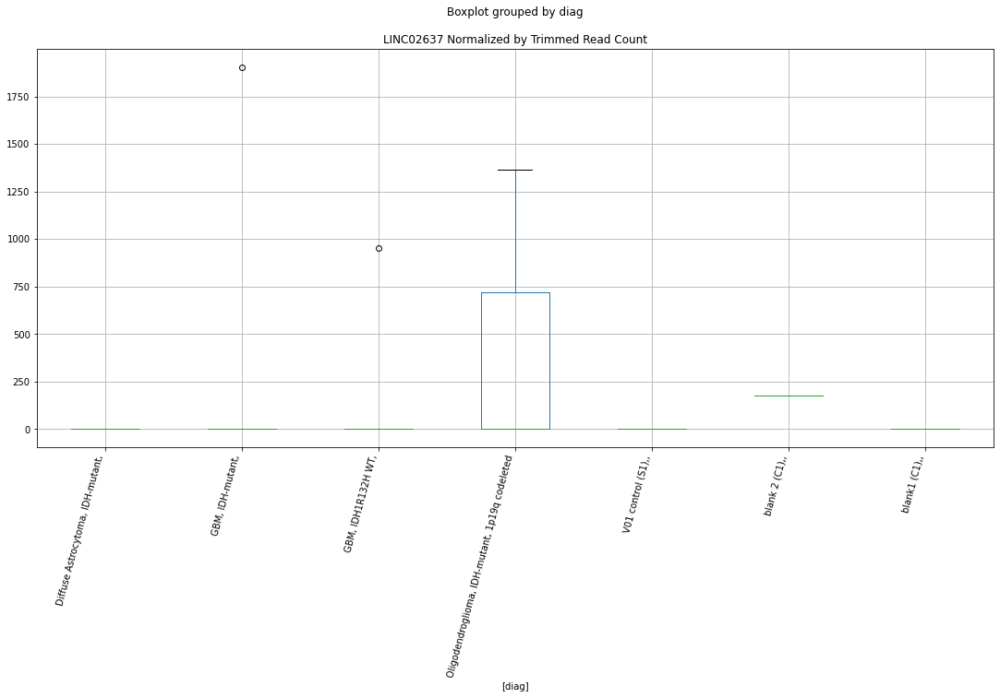

 p : 0.041513194188482996  ( t : 2.1950830997085644 ) :  D-plex  :  bbduk2  :  LOC100507513
Control and blanks
73     0.0
337    0.0
Name: LOC100507513, dtype: float64
205    179.09
Name: LOC100507513, dtype: float64
469    1183.05
Name: LOC100507513, dtype: float64


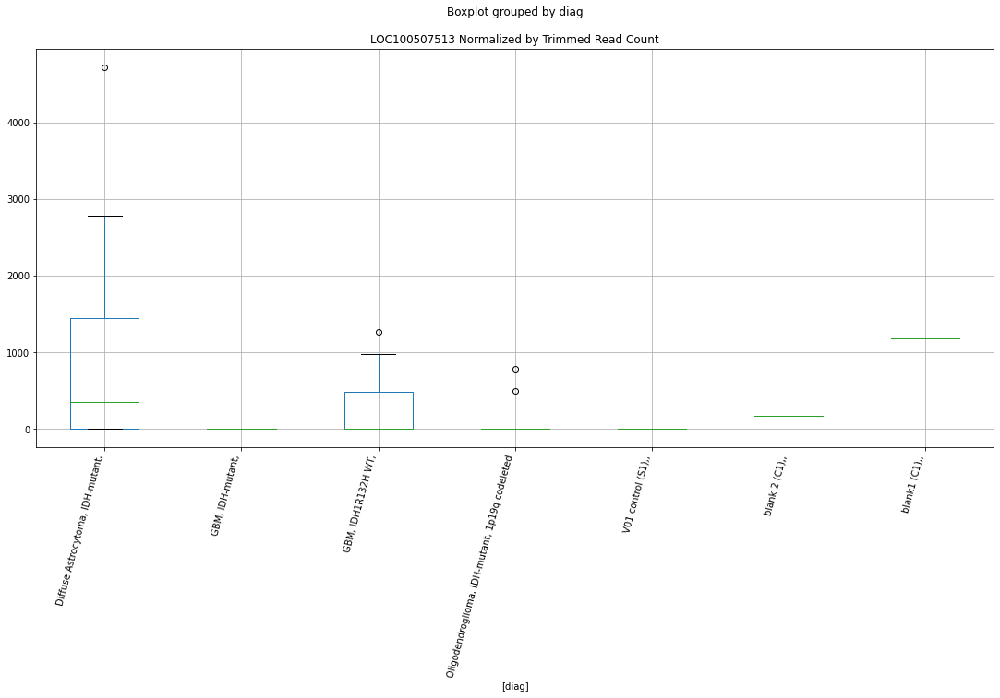

 p : 0.04151332545840695  ( t : 2.19508151163004 ) :  D-plex  :  cutadapt2  :  LOC105371017
Control and blanks
76       0.00
340    880.73
Name: LOC105371017, dtype: float64
208    705.44
Name: LOC105371017, dtype: float64
472    2311.82
Name: LOC105371017, dtype: float64


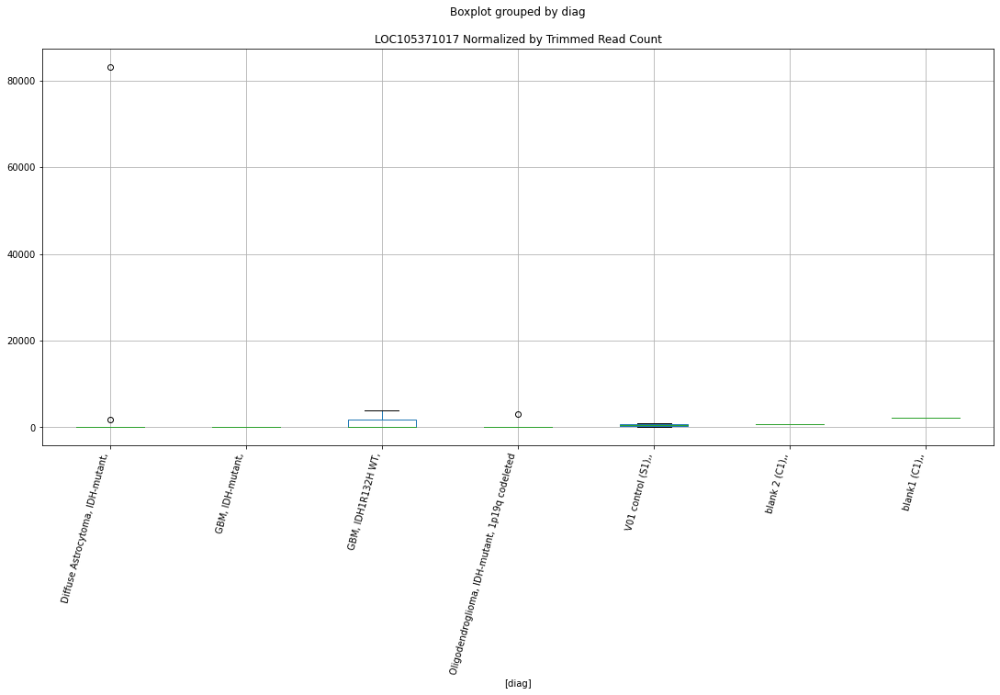

 p : 0.04156534784973081  ( t : 2.1944525172475635 ) :  D-plex  :  bbduk2  :  LOC100506274
Control and blanks
73     0.0
337    0.0
Name: LOC100506274, dtype: float64
205    537.27
Name: LOC100506274, dtype: float64
469    1183.05
Name: LOC100506274, dtype: float64


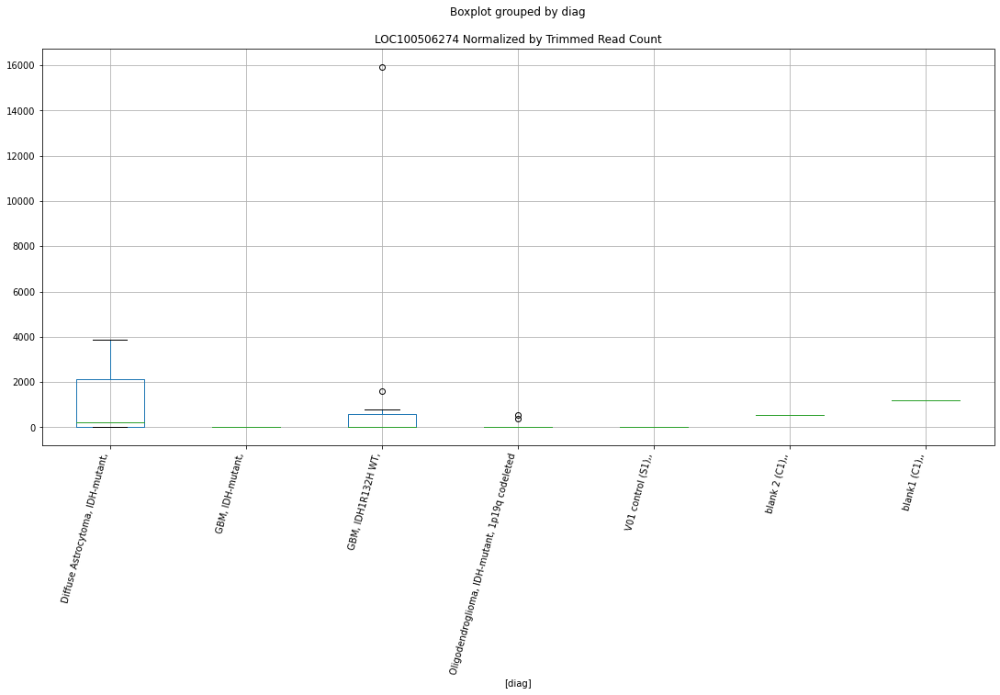

 p : 0.041582737745640766  ( t : 2.1942424199472117 ) :  D-plex  :  cutadapt2  :  LOC101927429
Control and blanks
76     0.0
340    0.0
Name: LOC101927429, dtype: float64
208    705.44
Name: LOC101927429, dtype: float64
472    0.0
Name: LOC101927429, dtype: float64


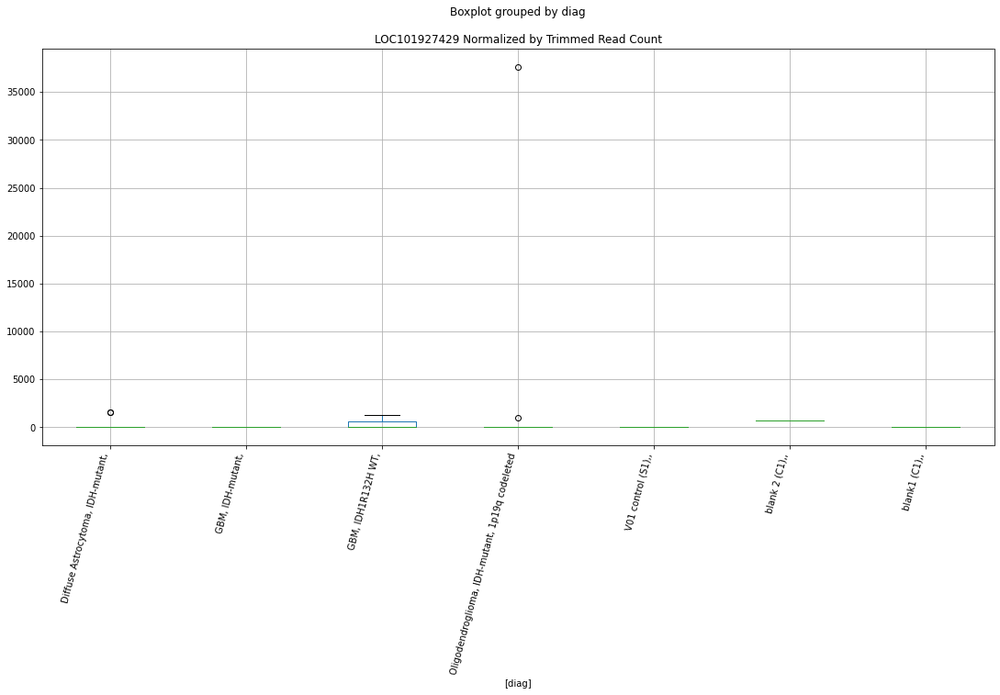

 p : 0.04166439587664853  ( t : 2.1932569384173948 ) :  D-plex  :  bbduk2  :  LINC02691
Control and blanks
73     0.0
337    0.0
Name: LINC02691, dtype: float64
205    0.0
Name: LINC02691, dtype: float64
469    2366.11
Name: LINC02691, dtype: float64


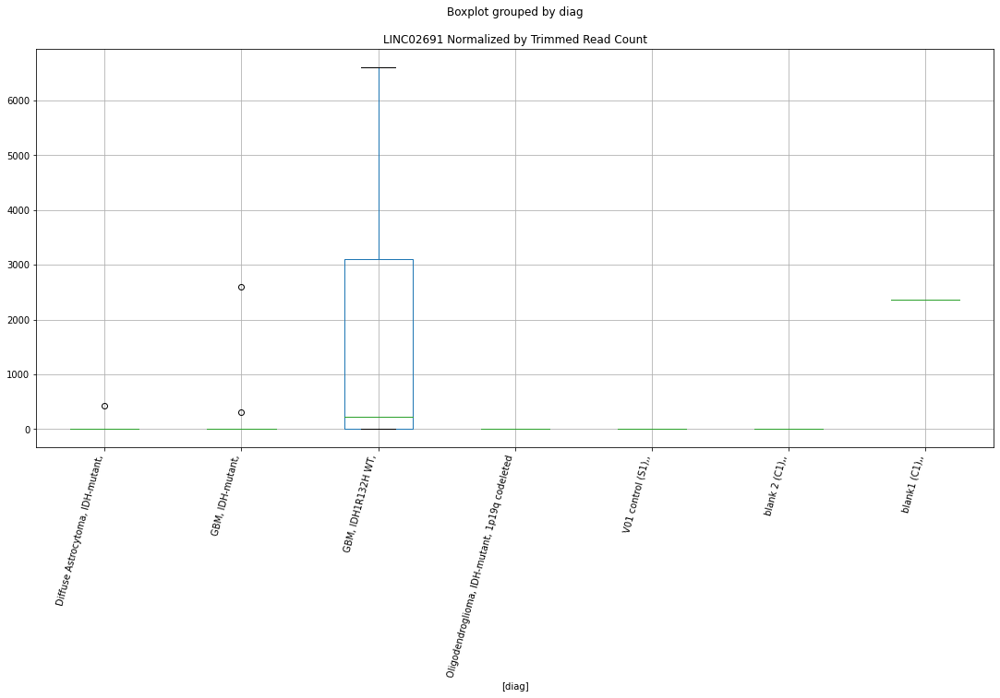

 p : 0.04178061969453404  ( t : 2.1918573575219353 ) :  D-plex  :  bbduk2  :  LOC105370469
Control and blanks
73        0.00
337    3560.63
Name: LOC105370469, dtype: float64
205    11461.82
Name: LOC105370469, dtype: float64
469    2366.11
Name: LOC105370469, dtype: float64


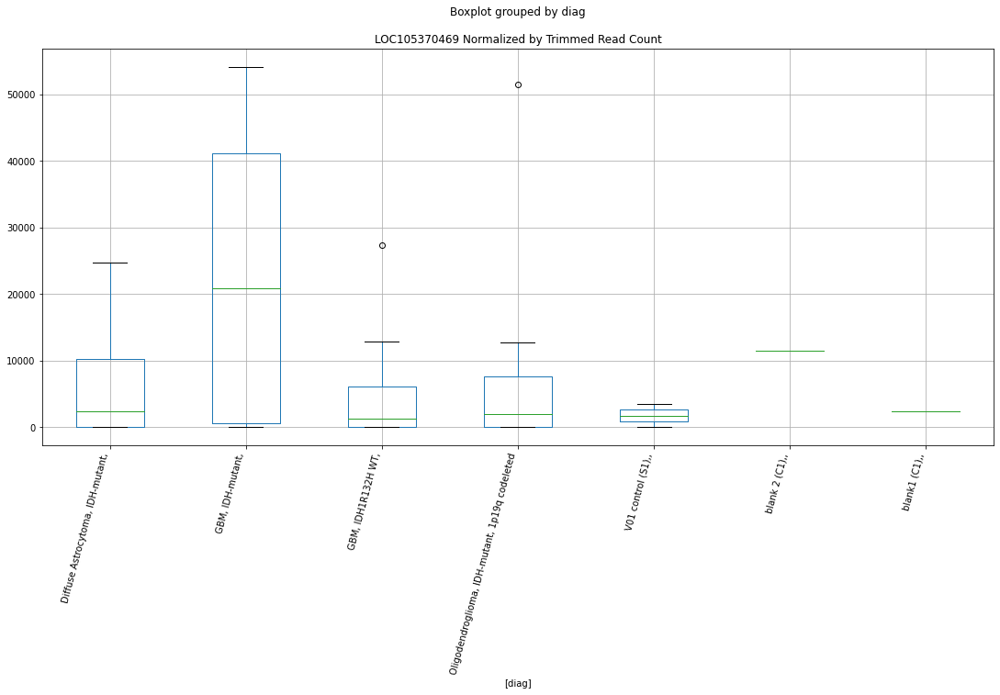

 p : 0.04200628106551239  ( t : 2.189150088848807 ) :  D-plex  :  cutadapt2  :  LOC105371042
Control and blanks
76     468205.58
340     10568.79
Name: LOC105371042, dtype: float64
208    319564.71
Name: LOC105371042, dtype: float64
472    135241.67
Name: LOC105371042, dtype: float64


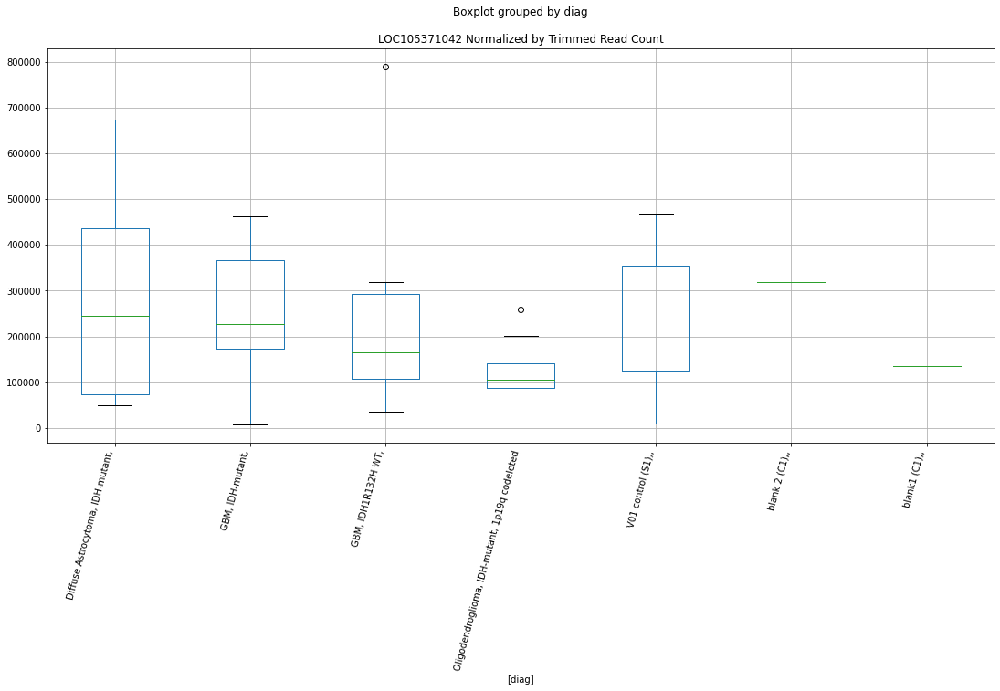

 p : 0.042094105050014784  ( t : 2.1881000665557013 ) :  D-plex  :  cutadapt2  :  LINC01324
Control and blanks
76       0.00
340    880.73
Name: LINC01324, dtype: float64
208    0.0
Name: LINC01324, dtype: float64
472    577.96
Name: LINC01324, dtype: float64


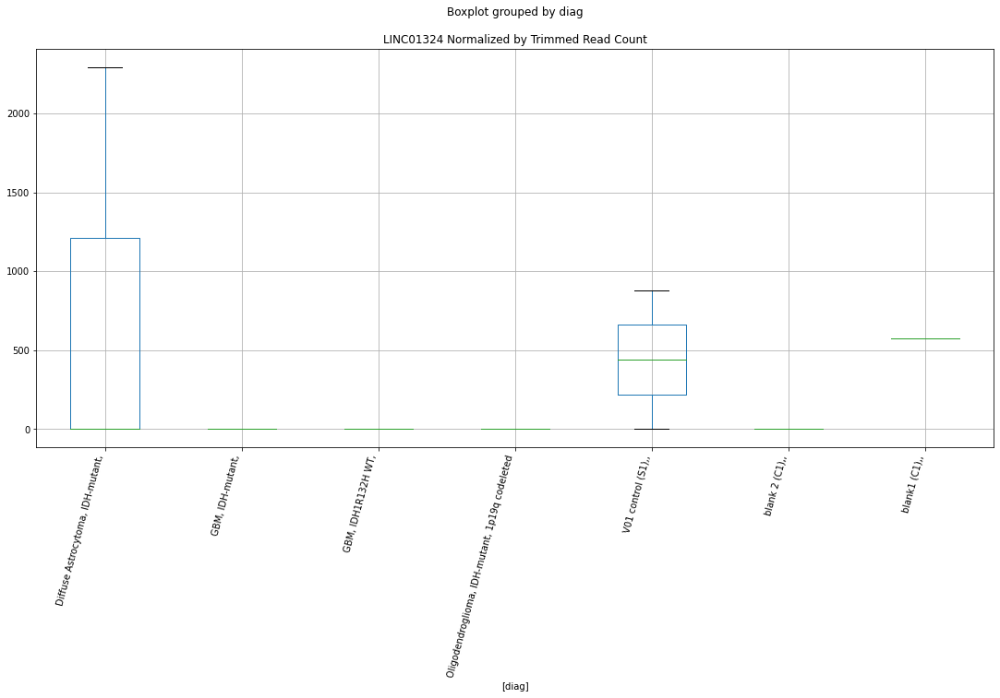

 p : 0.04210788383089565  ( t : 2.187935510058743 ) :  D-plex  :  bbduk2  :  LOC101927479
Control and blanks
73     0.0
337    0.0
Name: LOC101927479, dtype: float64
205    1253.64
Name: LOC101927479, dtype: float64
469    1774.58
Name: LOC101927479, dtype: float64


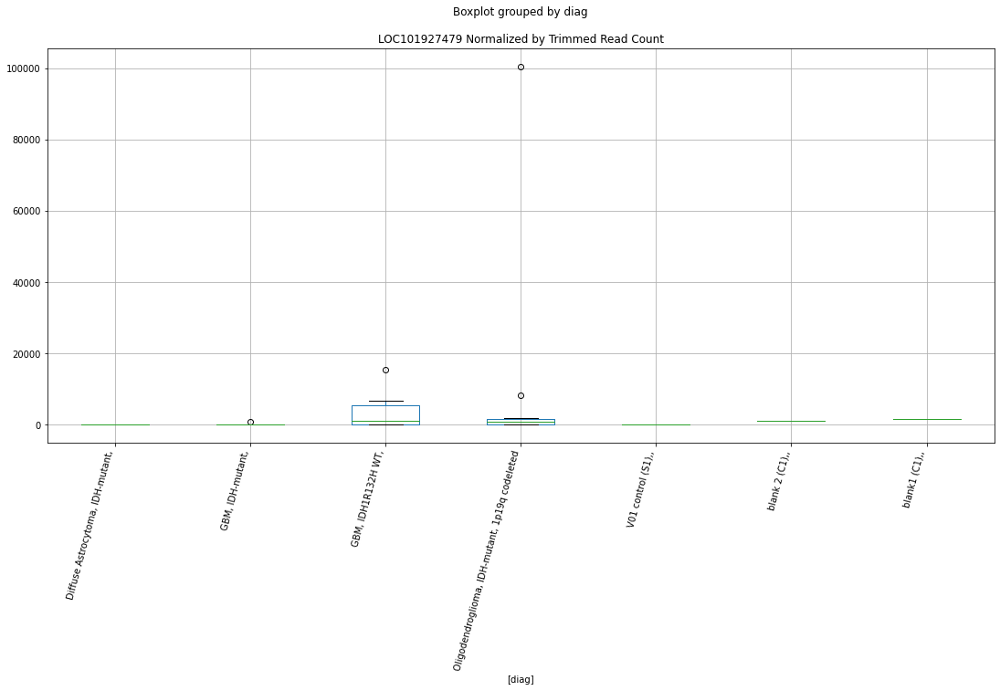

 p : 0.042135411542901305  ( t : 2.1876069014104242 ) :  Lexogen  :  bbduk2  :  LOC101927355
Control and blanks
79       0.00
343    212.31
Name: LOC101927355, dtype: float64
211    0.0
Name: LOC101927355, dtype: float64
475    239.52
Name: LOC101927355, dtype: float64


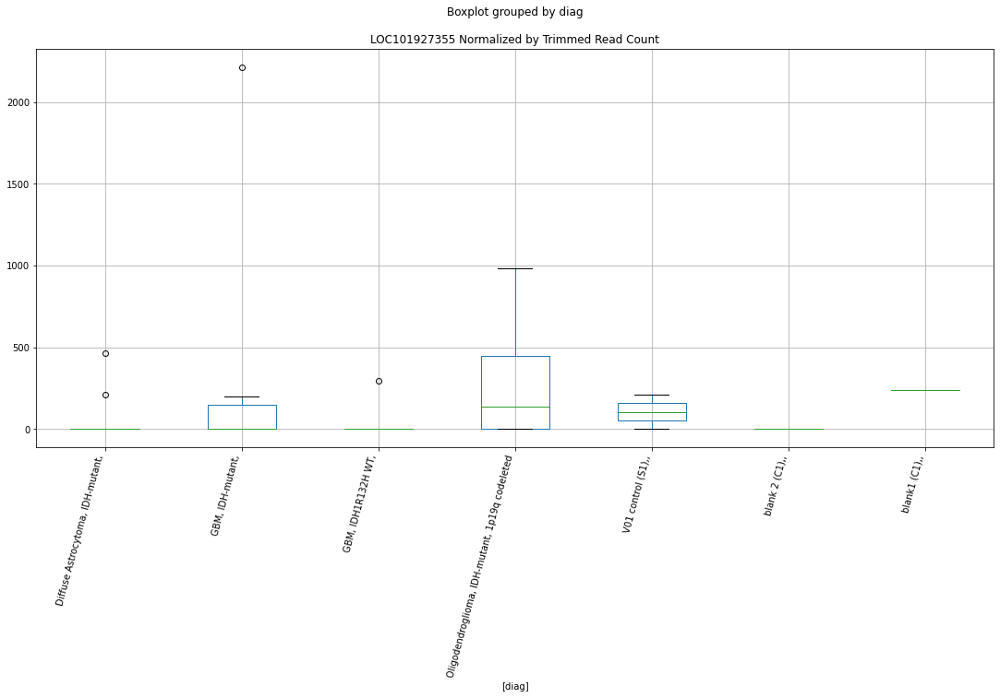

 p : 0.04227773018313597  ( t : 2.1859111245347282 ) :  D-plex  :  bbduk2  :  LOC101928035
Control and blanks
73     773.01
337      0.00
Name: LOC101928035, dtype: float64
205    537.27
Name: LOC101928035, dtype: float64
469    0.0
Name: LOC101928035, dtype: float64


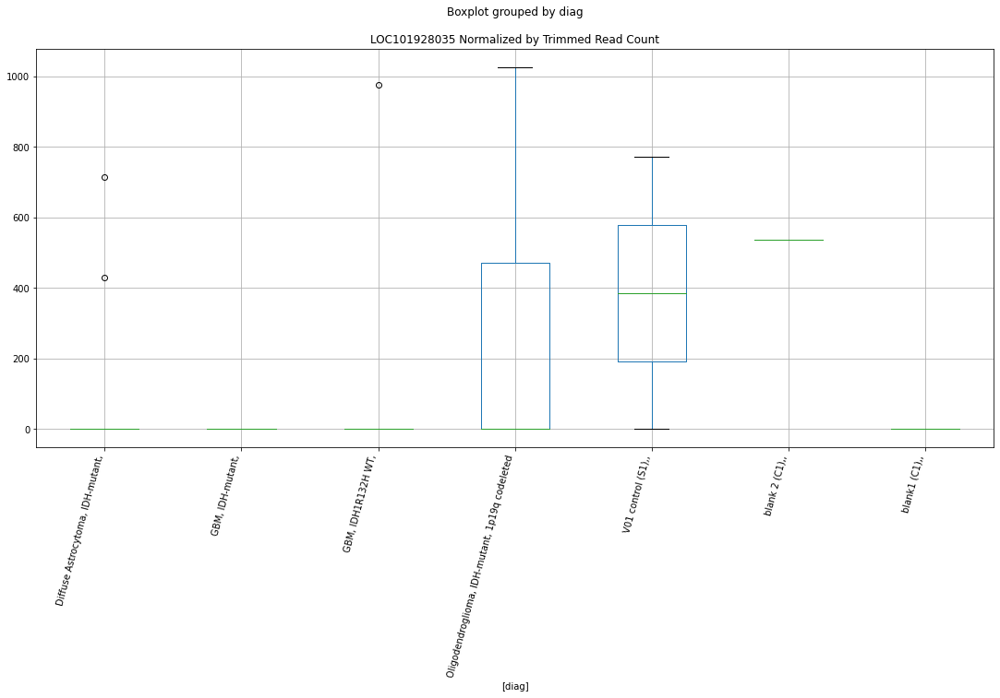

 p : 0.04237895540719838  ( t : 2.1847081733452054 ) :  D-plex  :  bbduk2  :  LOC105370312
Control and blanks
73      2319.03
337    13352.36
Name: LOC105370312, dtype: float64
205    3581.82
Name: LOC105370312, dtype: float64
469    4140.69
Name: LOC105370312, dtype: float64


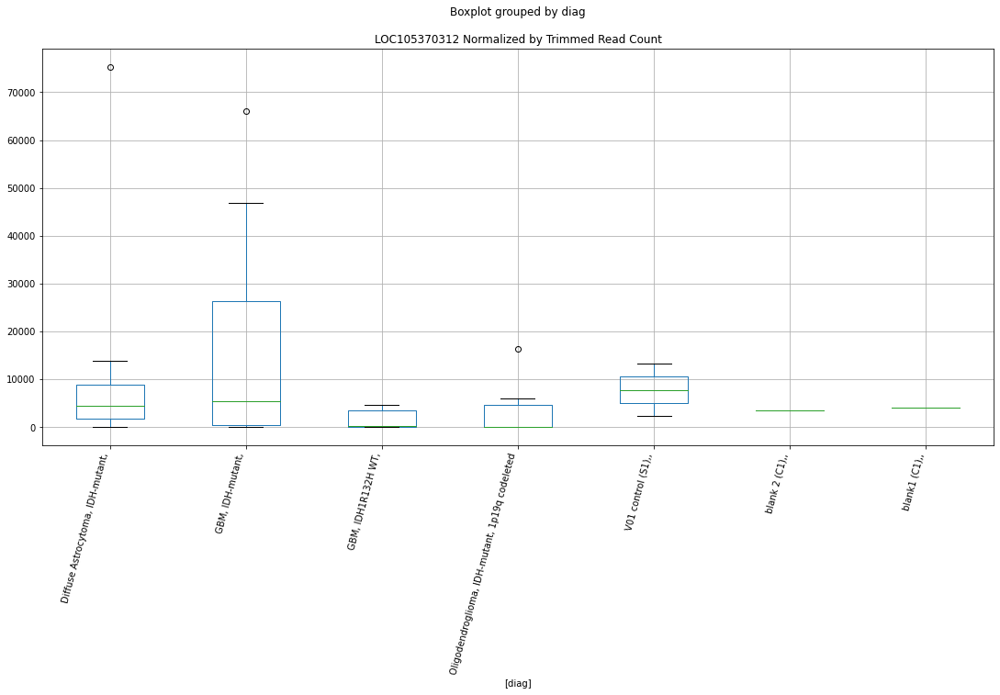

 p : 0.042398516795544926  ( t : 2.184476011448474 ) :  D-plex  :  cutadapt2  :  LOC105371004
Control and blanks
76     0.0
340    0.0
Name: LOC105371004, dtype: float64
208    4056.29
Name: LOC105371004, dtype: float64
472    13870.94
Name: LOC105371004, dtype: float64


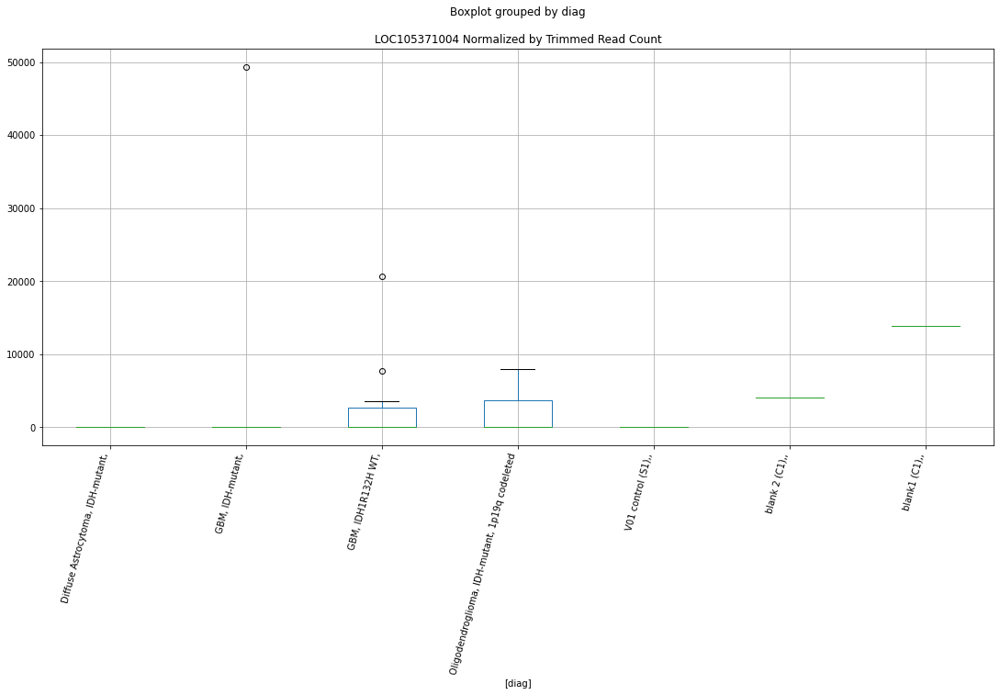

 p : 0.04251250216228815  ( t : 2.1831251407235173 ) :  D-plex  :  bbduk2  :  LEFTY1
Control and blanks
73     37877.41
337    22253.93
Name: LEFTY1, dtype: float64
205    38146.37
Name: LEFTY1, dtype: float64
469    47913.71
Name: LEFTY1, dtype: float64


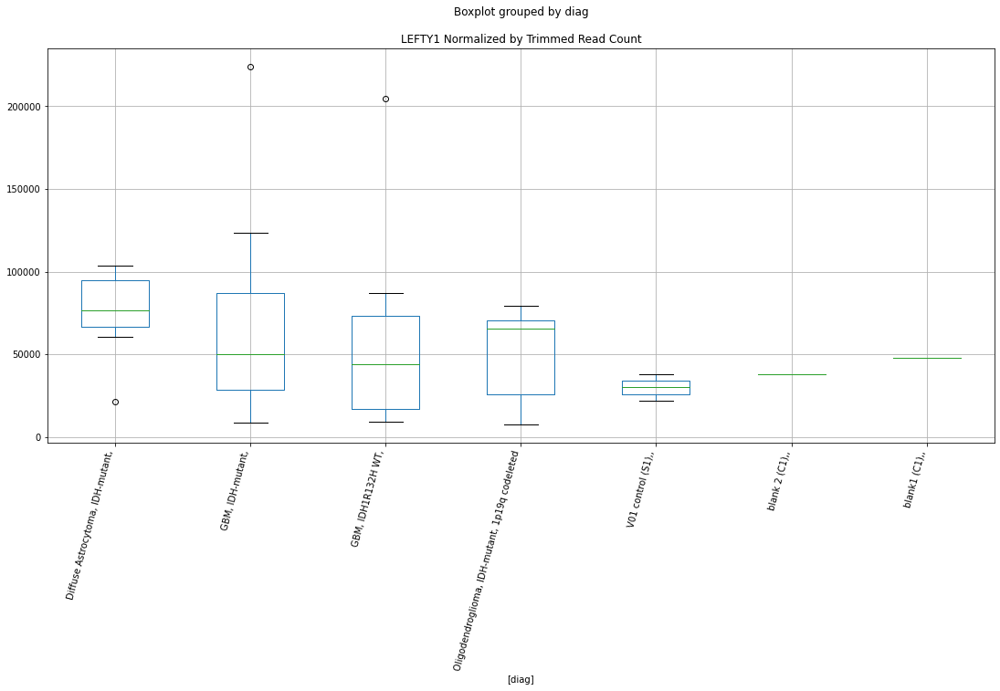

 p : 0.042520754544154625  ( t : 2.1830274685279063 ) :  D-plex  :  cutadapt2  :  LOC101928284
Control and blanks
76     0.0
340    0.0
Name: LOC101928284, dtype: float64
208    1058.16
Name: LOC101928284, dtype: float64
472    0.0
Name: LOC101928284, dtype: float64


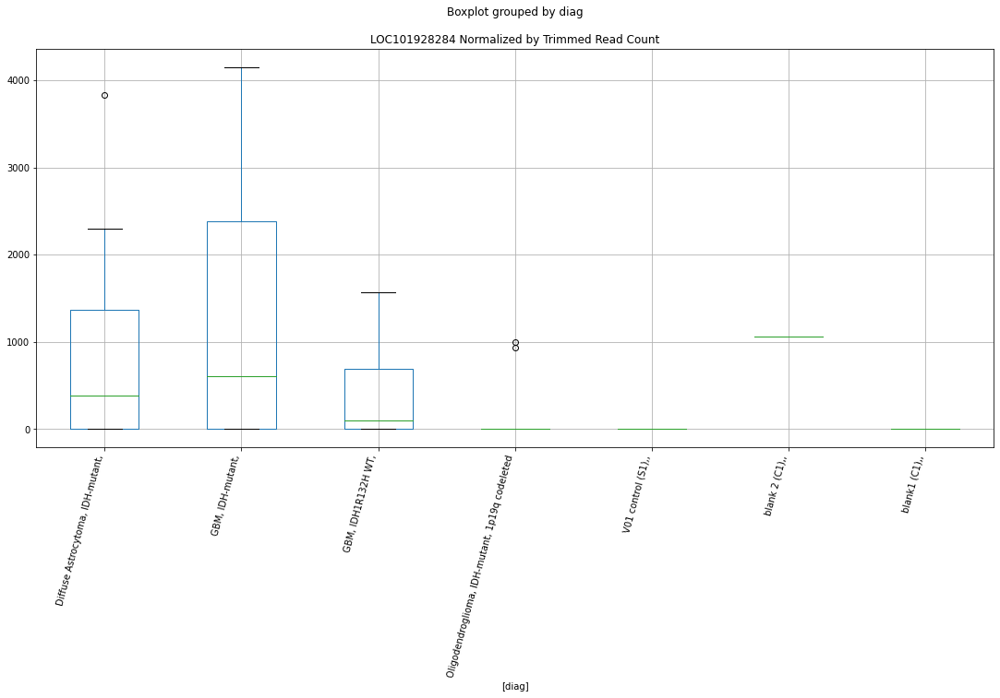

 p : 0.04254280895486571  ( t : 2.1827665257913544 ) :  Lexogen  :  bbduk2  :  LINC00271
Control and blanks
79     0.0
343    0.0
Name: LINC00271, dtype: float64
211    0.0
Name: LINC00271, dtype: float64
475    0.0
Name: LINC00271, dtype: float64


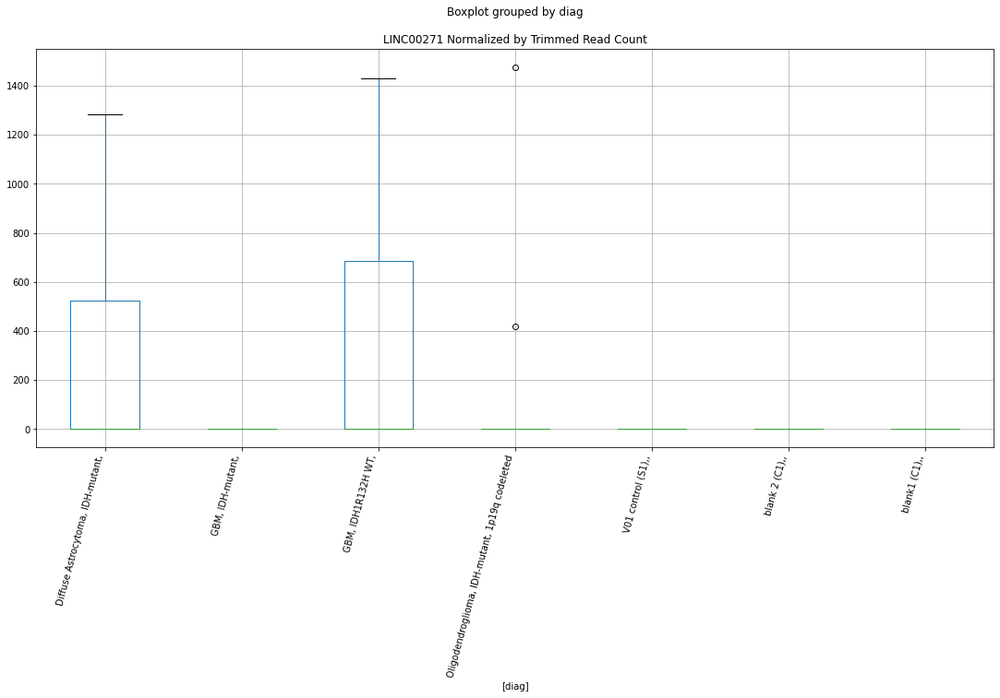

 p : 0.04278786788016035  ( t : 2.179875359347619 ) :  D-plex  :  cutadapt2  :  LINC02818
Control and blanks
76     0.0
340    0.0
Name: LINC02818, dtype: float64
208    2116.32
Name: LINC02818, dtype: float64
472    1733.87
Name: LINC02818, dtype: float64


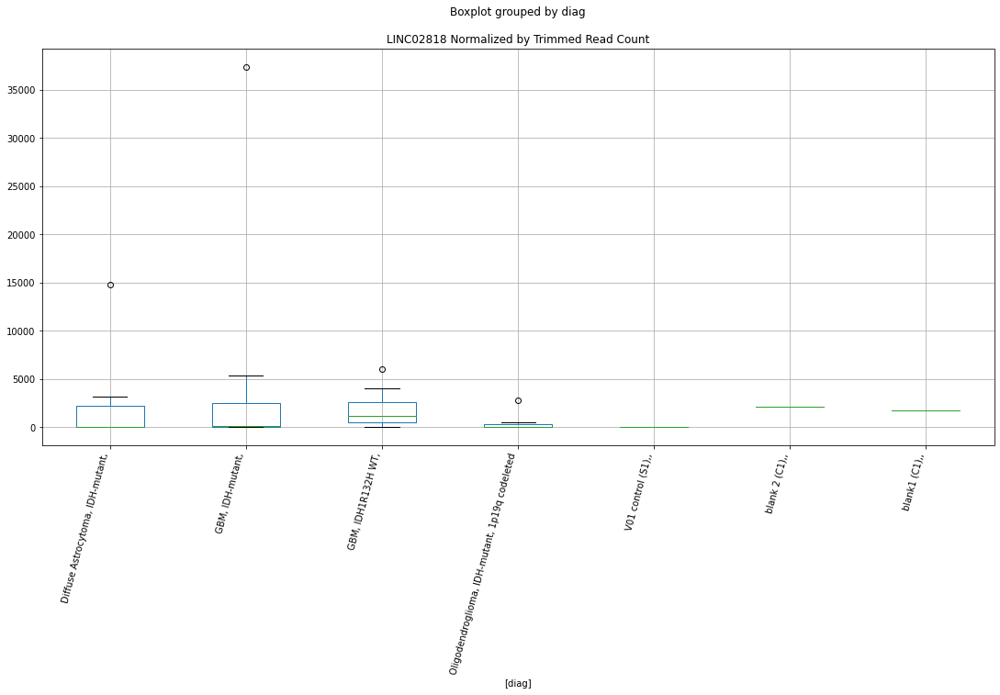

 p : 0.0428229650321265  ( t : 2.179462531872887 ) :  D-plex  :  bbduk2  :  LOC105371042
Control and blanks
73     480038.22
337     10681.89
Name: LOC105371042, dtype: float64
205    323975.53
Name: LOC105371042, dtype: float64
469    138417.39
Name: LOC105371042, dtype: float64


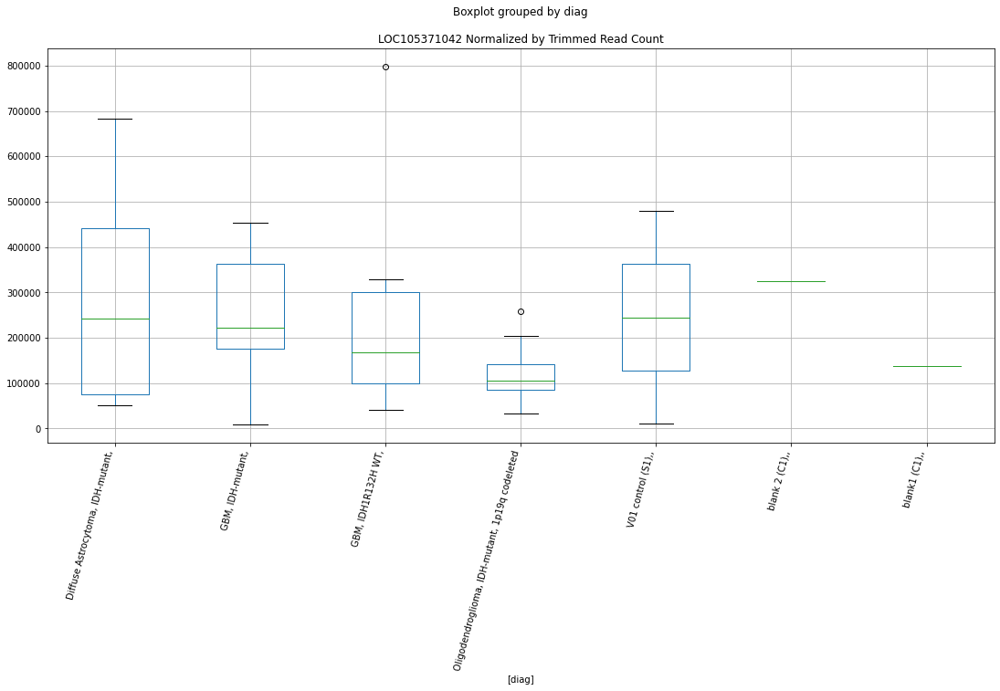

 p : 0.04285359507912558  ( t : 2.1791025016933814 ) :  D-plex  :  cutadapt2  :  LIM2
Control and blanks
76     0.0
340    0.0
Name: LIM2, dtype: float64
208    1058.16
Name: LIM2, dtype: float64
472    1155.91
Name: LIM2, dtype: float64


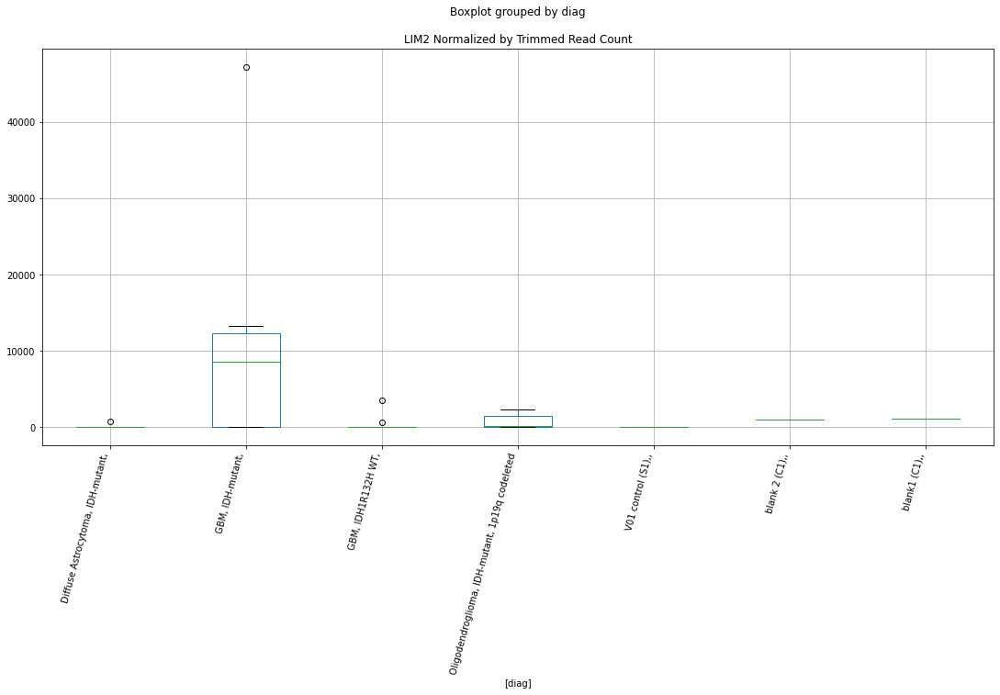

 p : 0.042892591432900536  ( t : 2.178644473791475 ) :  D-plex  :  bbduk2  :  LEFTY2
Control and blanks
73     113632.24
337     66761.79
Name: LEFTY2, dtype: float64
205    113901.85
Name: LEFTY2, dtype: float64
469    143741.14
Name: LEFTY2, dtype: float64


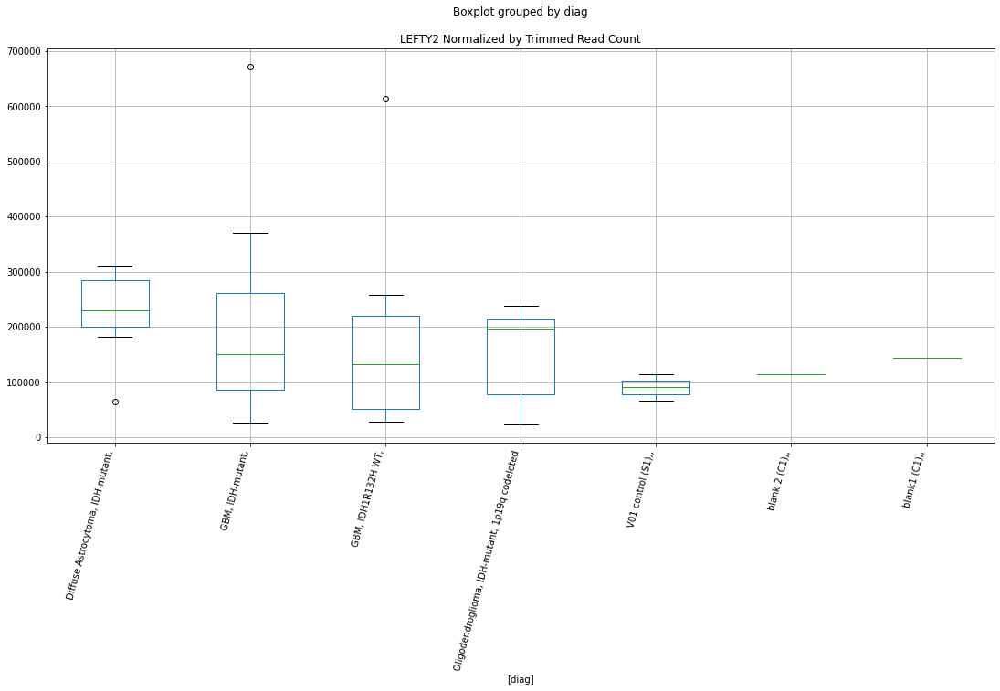

 p : 0.04303649264395673  ( t : 2.1769575917251403 ) :  D-plex  :  cutadapt2  :  LOC101927283
Control and blanks
76         0.00
340    68697.11
Name: LOC101927283, dtype: float64
208    1587.24
Name: LOC101927283, dtype: float64
472    6935.47
Name: LOC101927283, dtype: float64


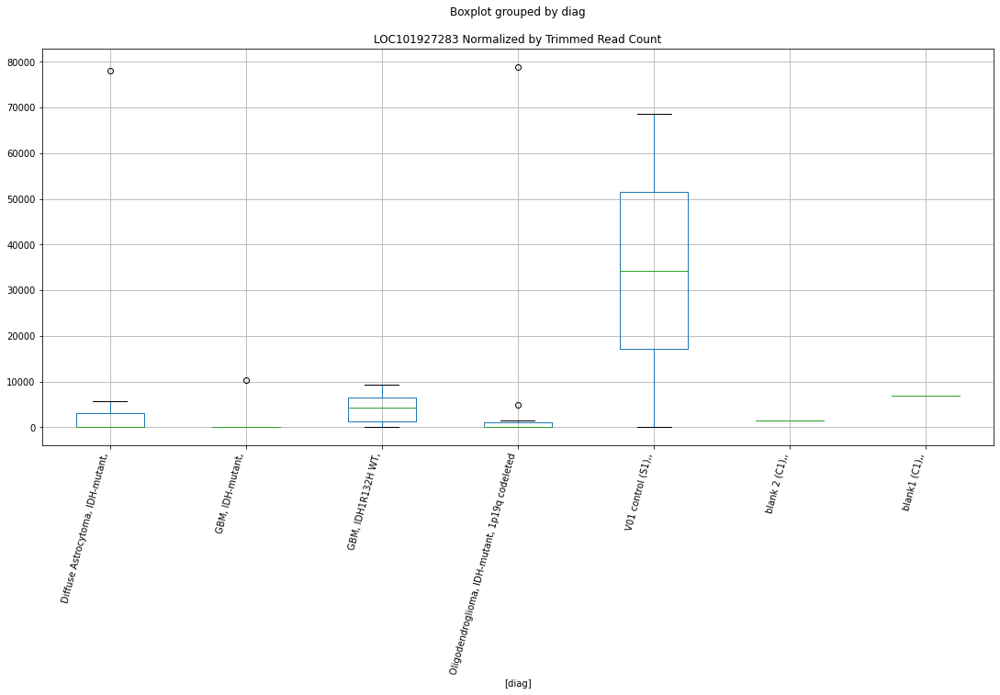

 p : 0.043082873894029206  ( t : 2.1764149887569277 ) :  D-plex  :  cutadapt2  :  LOC105370312
Control and blanks
76      2272.84
340    13210.98
Name: LOC105370312, dtype: float64
208    3174.48
Name: LOC105370312, dtype: float64
472    4045.69
Name: LOC105370312, dtype: float64


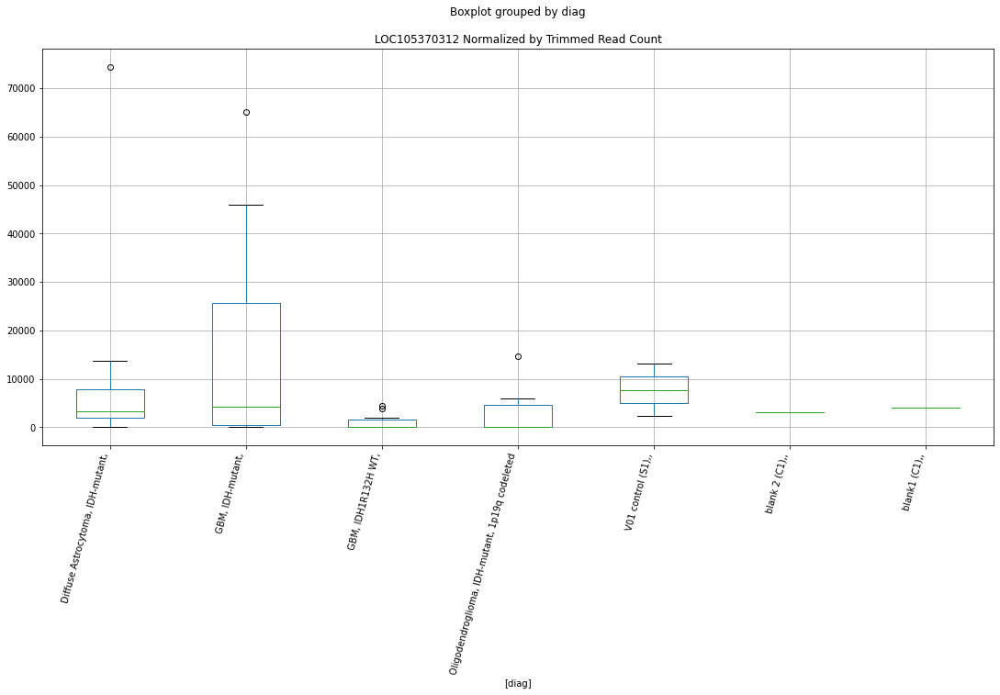

 p : 0.04310217704734005  ( t : 2.1761893235685377 ) :  D-plex  :  bbduk2  :  LINC01783
Control and blanks
73     0.0
337    0.0
Name: LINC01783, dtype: float64
205    0.0
Name: LINC01783, dtype: float64
469    0.0
Name: LINC01783, dtype: float64


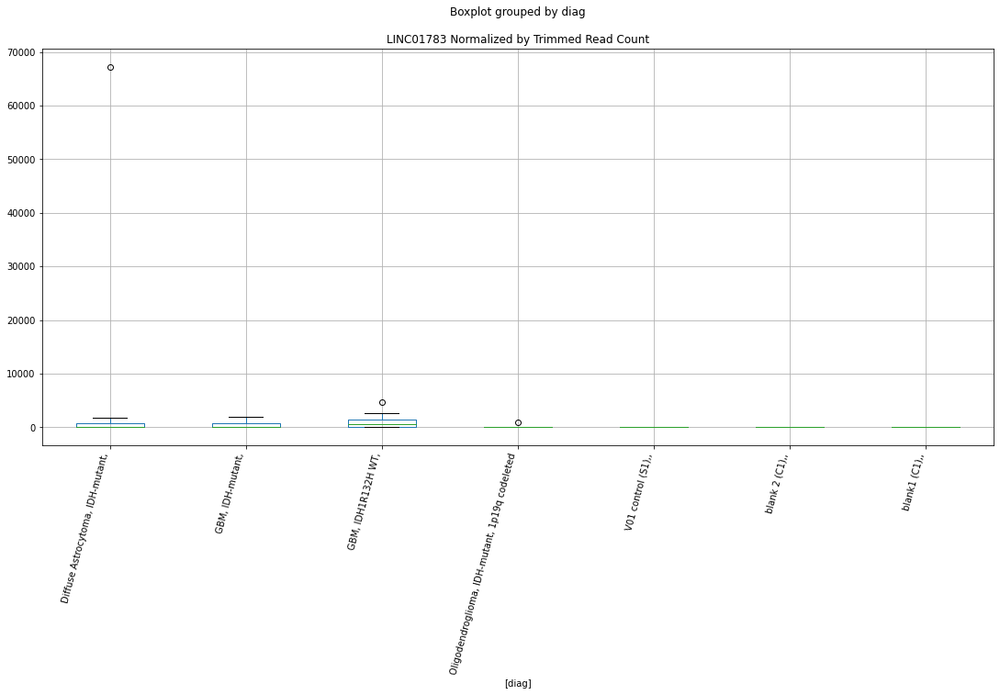

 p : 0.0431533725257986  ( t : 2.175591266518455 ) :  D-plex  :  bbduk2  :  LOC105371004
Control and blanks
73     0.0
337    0.0
Name: LOC105371004, dtype: float64
205    4119.09
Name: LOC105371004, dtype: float64
469    14196.66
Name: LOC105371004, dtype: float64


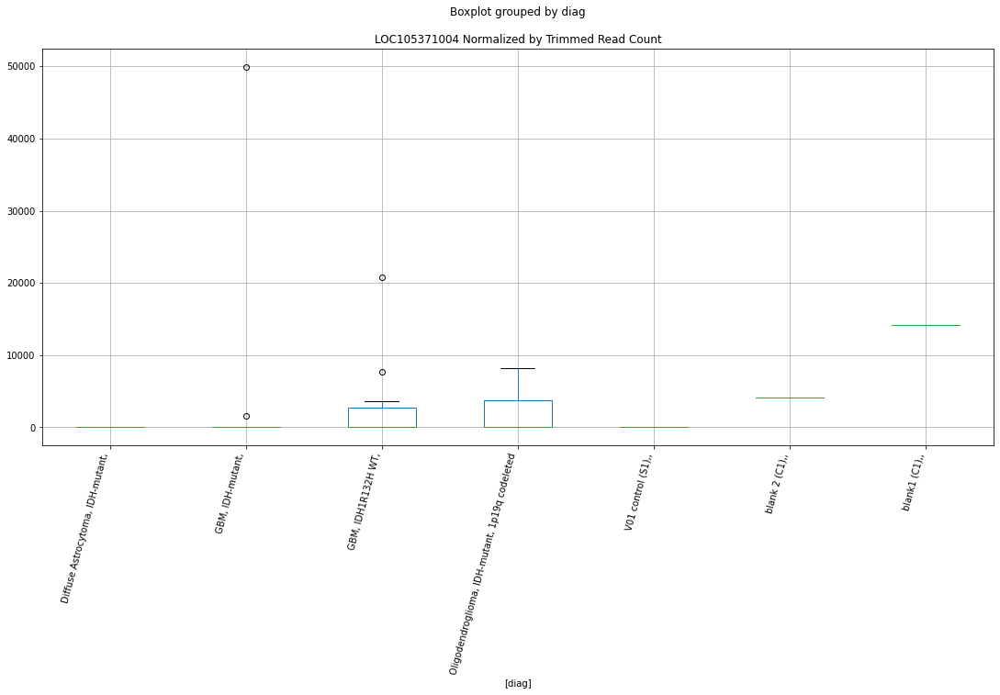

 p : 0.04317025326506363  ( t : 2.175394211031056 ) :  Lexogen  :  bbduk2  :  LINC01814
Control and blanks
79     21458.98
343    28662.43
Name: LINC01814, dtype: float64
211    13938.62
Name: LINC01814, dtype: float64
475    17245.13
Name: LINC01814, dtype: float64


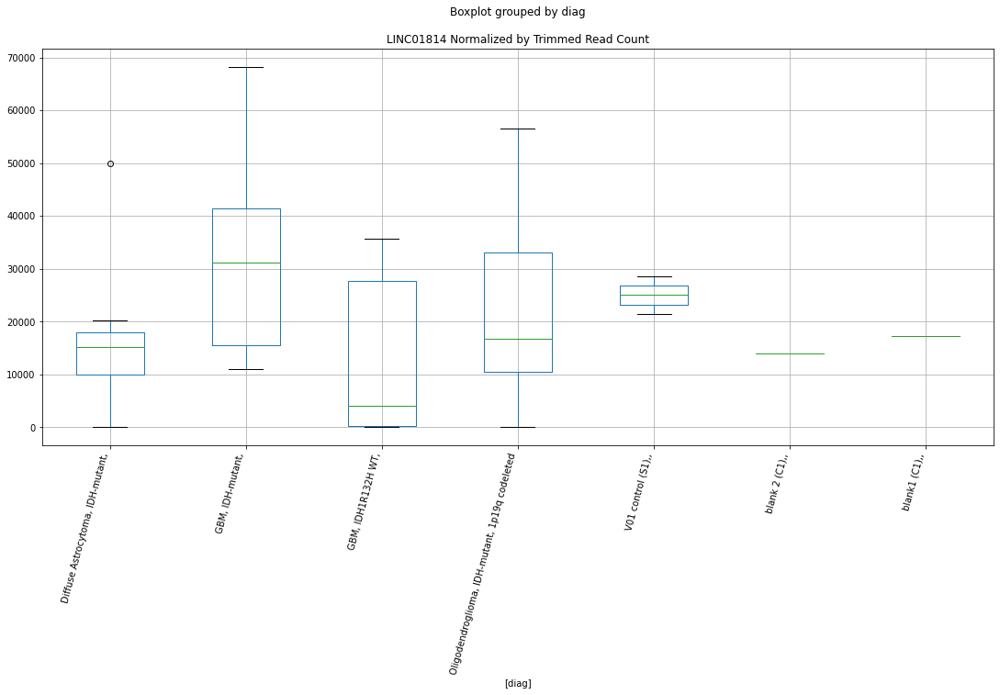

 p : 0.043256099470779456  ( t : 2.17439318557163 ) :  Lexogen  :  bbduk2  :  LOC105370827
Control and blanks
79       0.00
343    424.63
Name: LOC105370827, dtype: float64
211    0.0
Name: LOC105370827, dtype: float64
475    479.03
Name: LOC105370827, dtype: float64


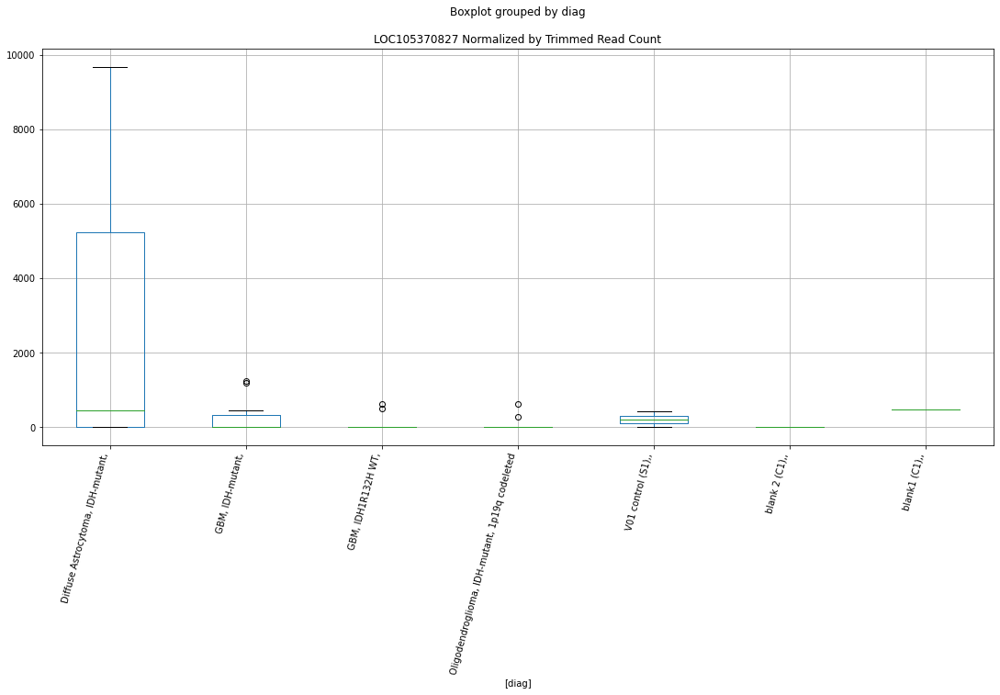

 p : 0.04329559404807112  ( t : 2.1739332628689136 ) :  D-plex  :  bbduk2  :  LOC101926935
Control and blanks
73     1546.02
337       0.00
Name: LOC101926935, dtype: float64
205    716.36
Name: LOC101926935, dtype: float64
469    591.53
Name: LOC101926935, dtype: float64


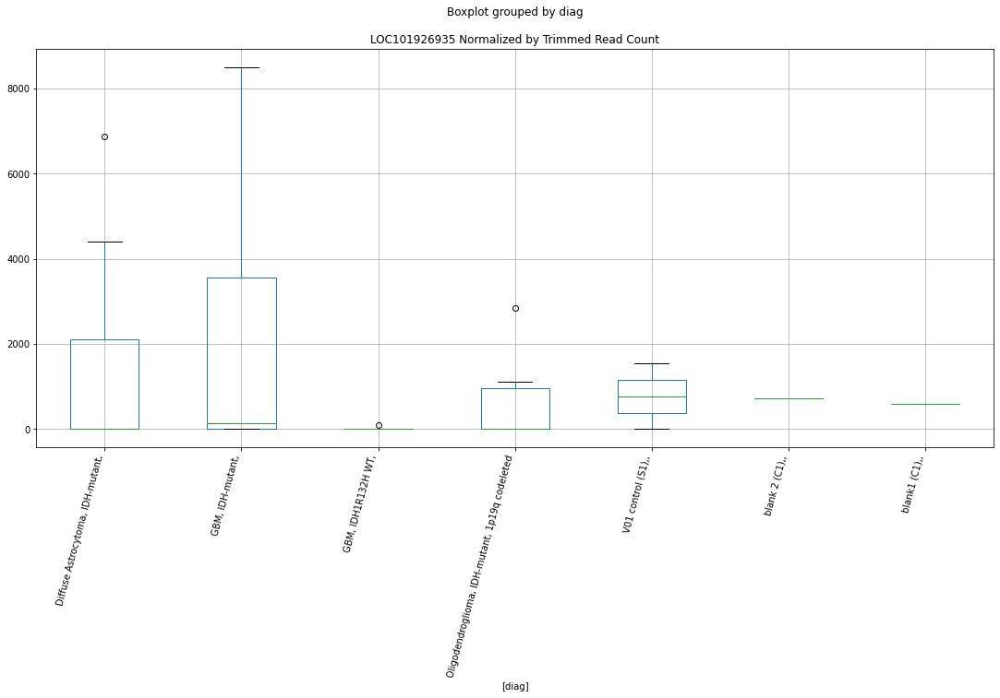

 p : 0.0433270933533859  ( t : 2.1735667221921267 ) :  D-plex  :  cutadapt2  :  LINC00327
Control and blanks
76       0.00
340    880.73
Name: LINC00327, dtype: float64
208    1058.16
Name: LINC00327, dtype: float64
472    1733.87
Name: LINC00327, dtype: float64


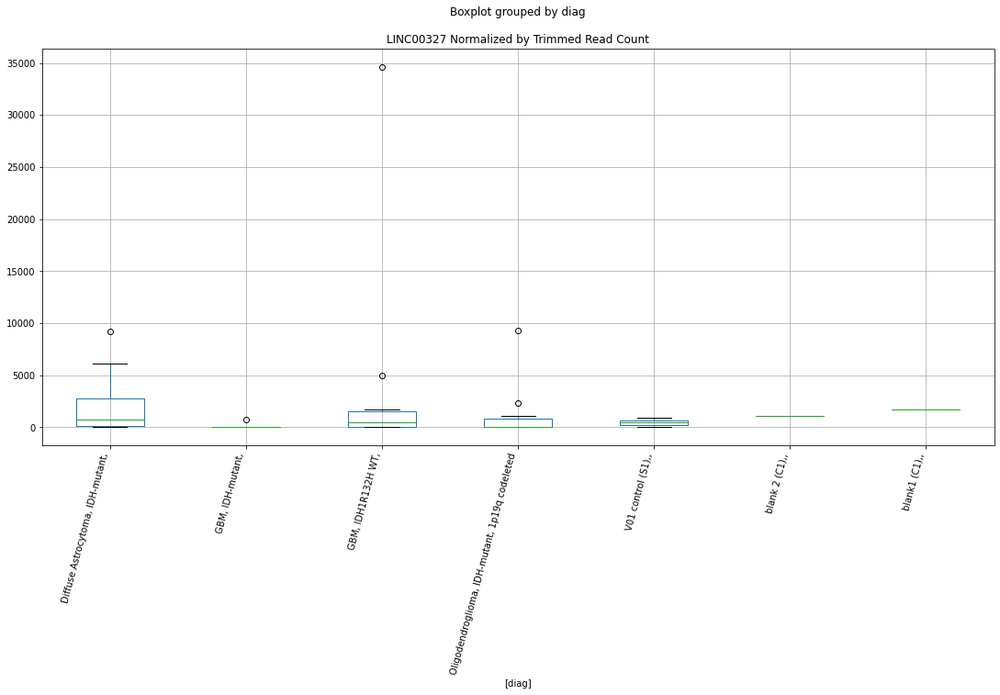

 p : 0.04339697137197755  ( t : 2.172754459360213 ) :  D-plex  :  bbduk2  :  LOC105370247
Control and blanks
73     0.0
337    0.0
Name: LOC105370247, dtype: float64
205    537.27
Name: LOC105370247, dtype: float64
469    3549.16
Name: LOC105370247, dtype: float64


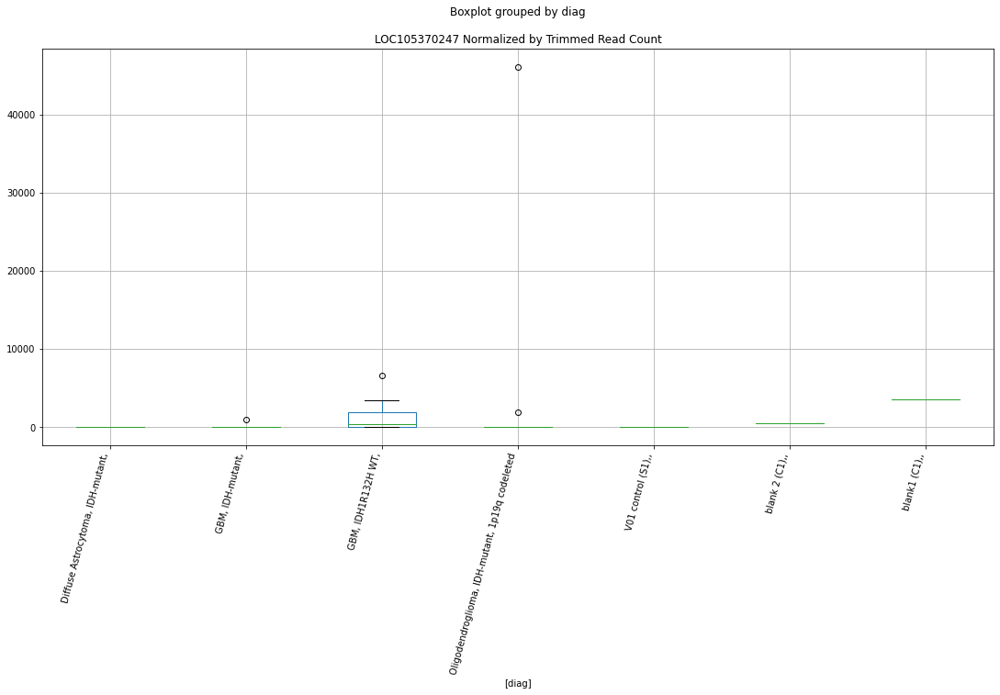

 p : 0.04347880884568332  ( t : 2.17180470123992 ) :  D-plex  :  cutadapt2  :  LIPM
Control and blanks
76     0.0
340    0.0
Name: LIPM, dtype: float64
208    352.72
Name: LIPM, dtype: float64
472    3467.74
Name: LIPM, dtype: float64


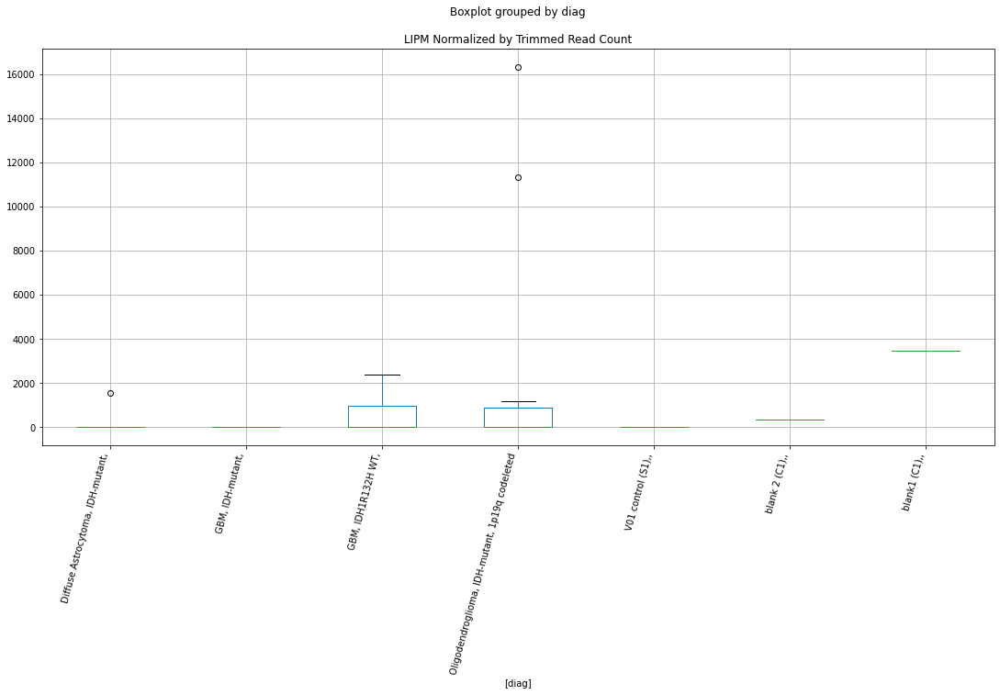

 p : 0.04350667484578905  ( t : 2.171481678261681 ) :  D-plex  :  cutadapt2  :  LIM2
Control and blanks
76     0.0
340    0.0
Name: LIM2, dtype: float64
208    1058.16
Name: LIM2, dtype: float64
472    1155.91
Name: LIM2, dtype: float64


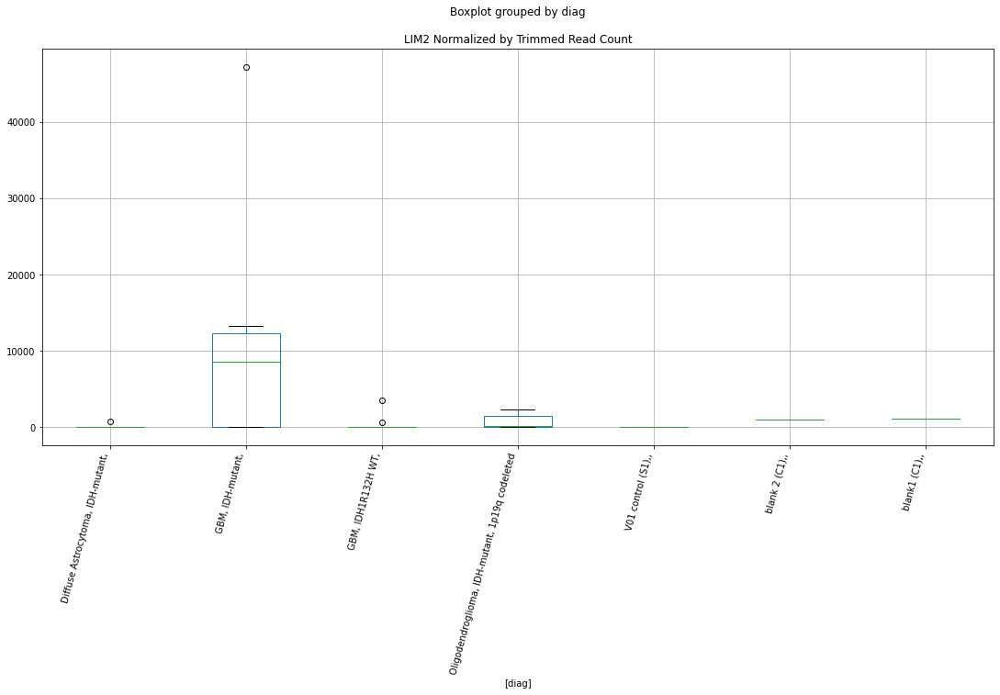

 p : 0.04369151316582111  ( t : 2.1693438141590877 ) :  Lexogen  :  cutadapt2  :  LINC01814
Control and blanks
82     21300.77
346    28619.09
Name: LINC01814, dtype: float64
214    13832.55
Name: LINC01814, dtype: float64
478    17097.15
Name: LINC01814, dtype: float64


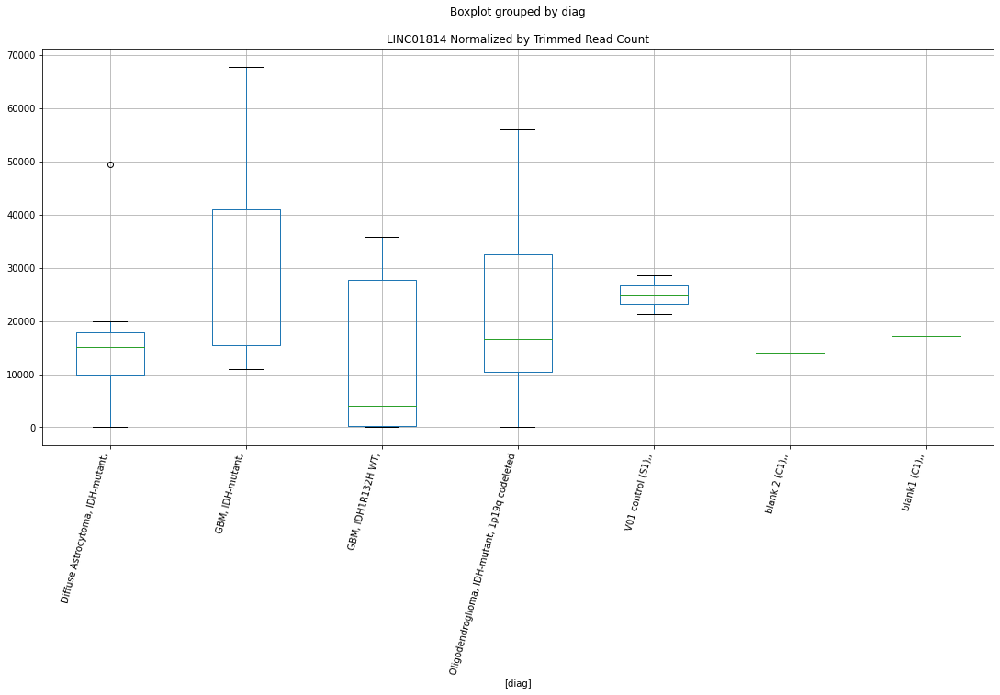

 p : 0.04372005614957126  ( t : 2.1690144206651363 ) :  D-plex  :  cutadapt2  :  LOC105370247
Control and blanks
76     0.0
340    0.0
Name: LOC105370247, dtype: float64
208    529.08
Name: LOC105370247, dtype: float64
472    3467.74
Name: LOC105370247, dtype: float64


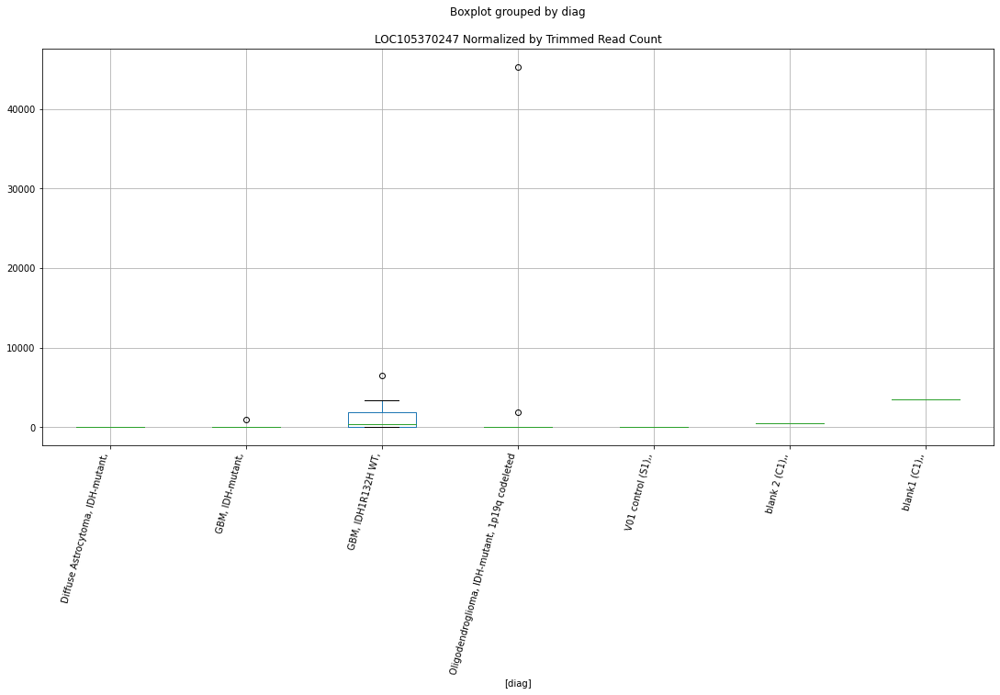

 p : 0.043863904074290194  ( t : 2.167357368288168 ) :  D-plex  :  cutadapt2  :  LINC02691
Control and blanks
76     0.0
340    0.0
Name: LINC02691, dtype: float64
208    0.0
Name: LINC02691, dtype: float64
472    2311.82
Name: LINC02691, dtype: float64


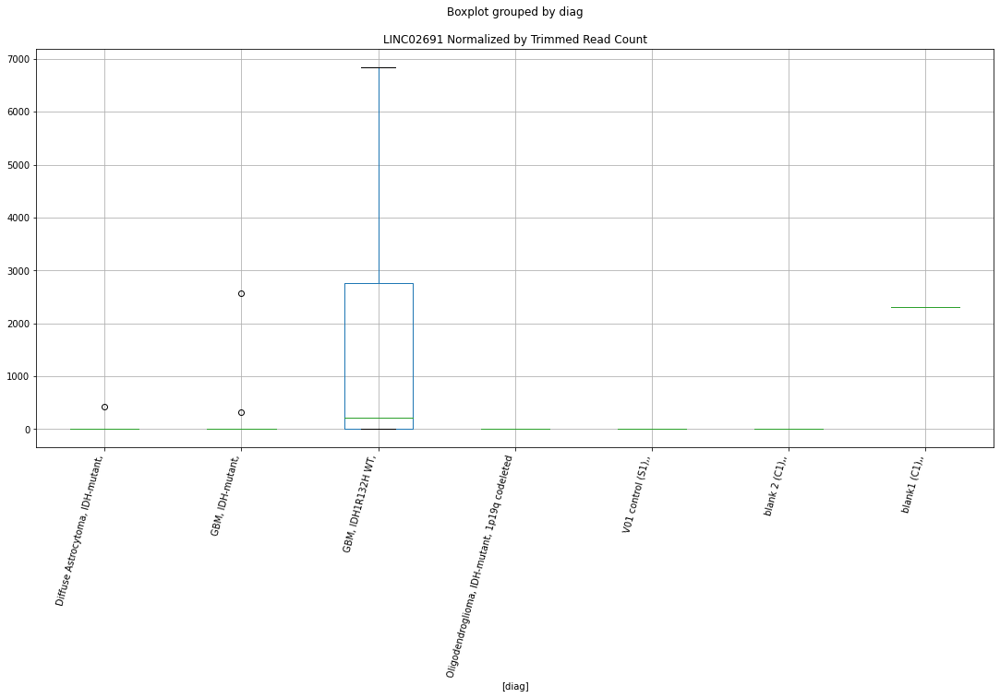

 p : 0.04400866338027751  ( t : 2.1656948313109106 ) :  Lexogen  :  cutadapt2  :  LGALS1
Control and blanks
82     0.0
346    0.0
Name: LGALS1, dtype: float64
214    0.0
Name: LGALS1, dtype: float64
478    237.46
Name: LGALS1, dtype: float64


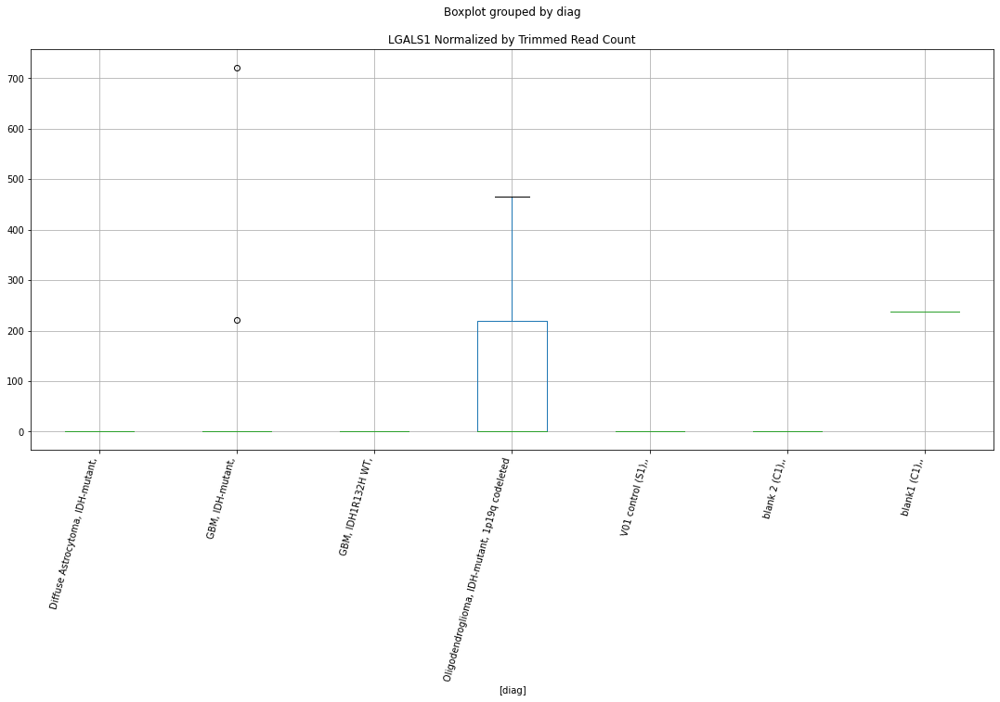

 p : 0.04401078120883811  ( t : 2.165670545565834 ) :  D-plex  :  bbduk2  :  LOC101927283
Control and blanks
73         0.00
337    69432.27
Name: LOC101927283, dtype: float64
205    1611.82
Name: LOC101927283, dtype: float64
469    7098.33
Name: LOC101927283, dtype: float64


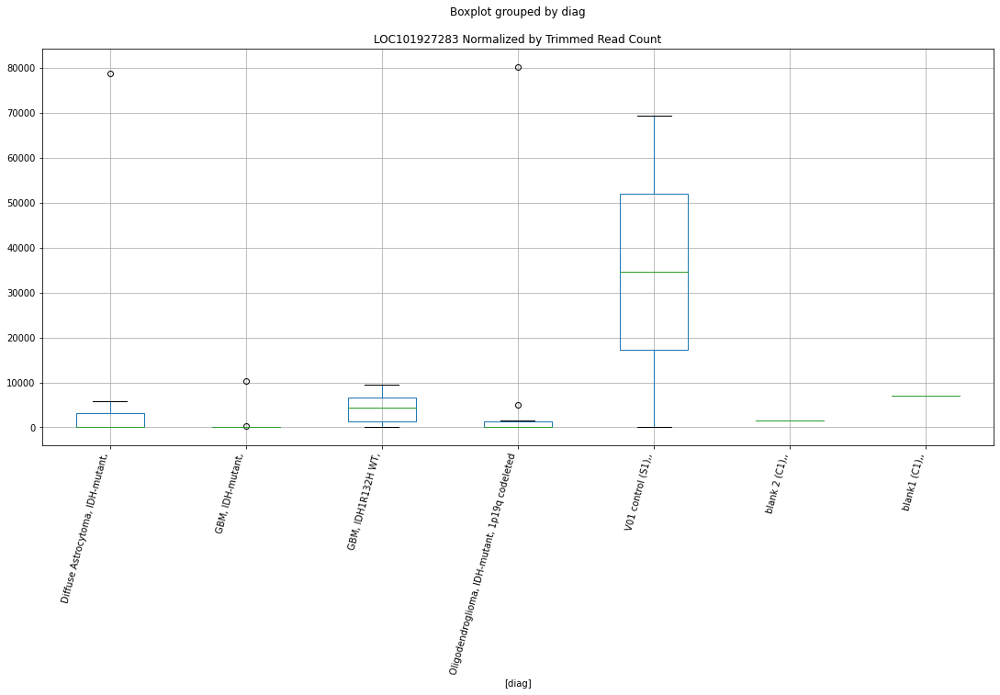

 p : 0.044035146167647934  ( t : 2.1653912225302796 ) :  D-plex  :  bbduk2  :  LOC101929609
Control and blanks
73     108221.18
337      8011.42
Name: LOC101929609, dtype: float64
205    75934.56
Name: LOC101929609, dtype: float64
469    51462.88
Name: LOC101929609, dtype: float64


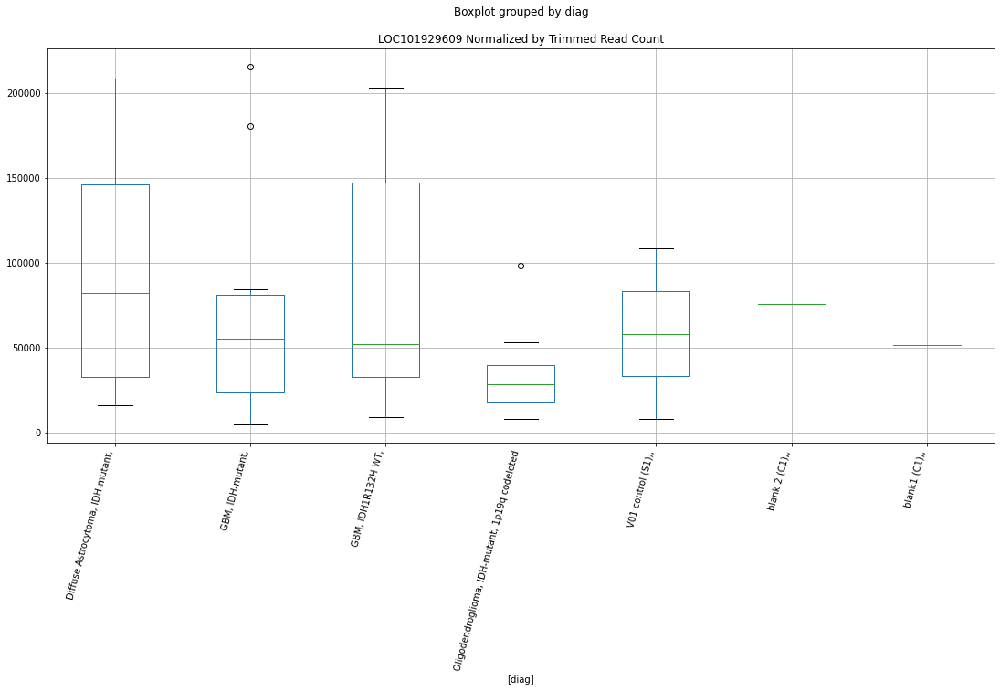

 p : 0.04403846910883604  ( t : 2.1653531388643765 ) :  D-plex  :  cutadapt2  :  LOC101929322
Control and blanks
76     0.0
340    0.0
Name: LOC101929322, dtype: float64
208    2821.76
Name: LOC101929322, dtype: float64
472    2311.82
Name: LOC101929322, dtype: float64


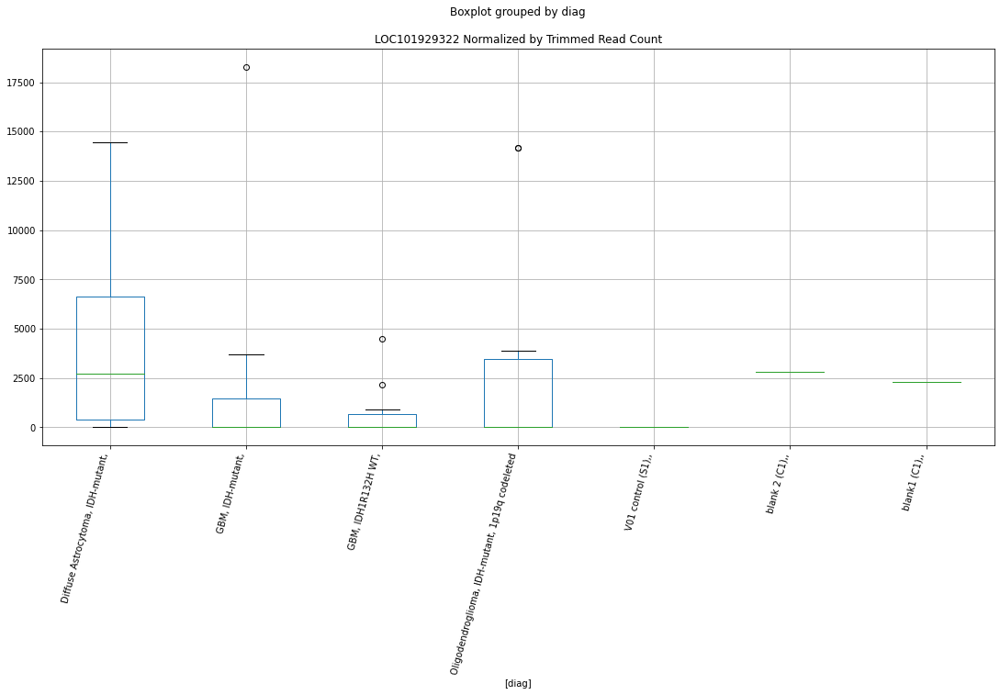

 p : 0.04420494006665046  ( t : 2.1634486011960963 ) :  Lexogen  :  bbduk2  :  LGALS1
Control and blanks
79     0.0
343    0.0
Name: LGALS1, dtype: float64
211    0.0
Name: LGALS1, dtype: float64
475    239.52
Name: LGALS1, dtype: float64


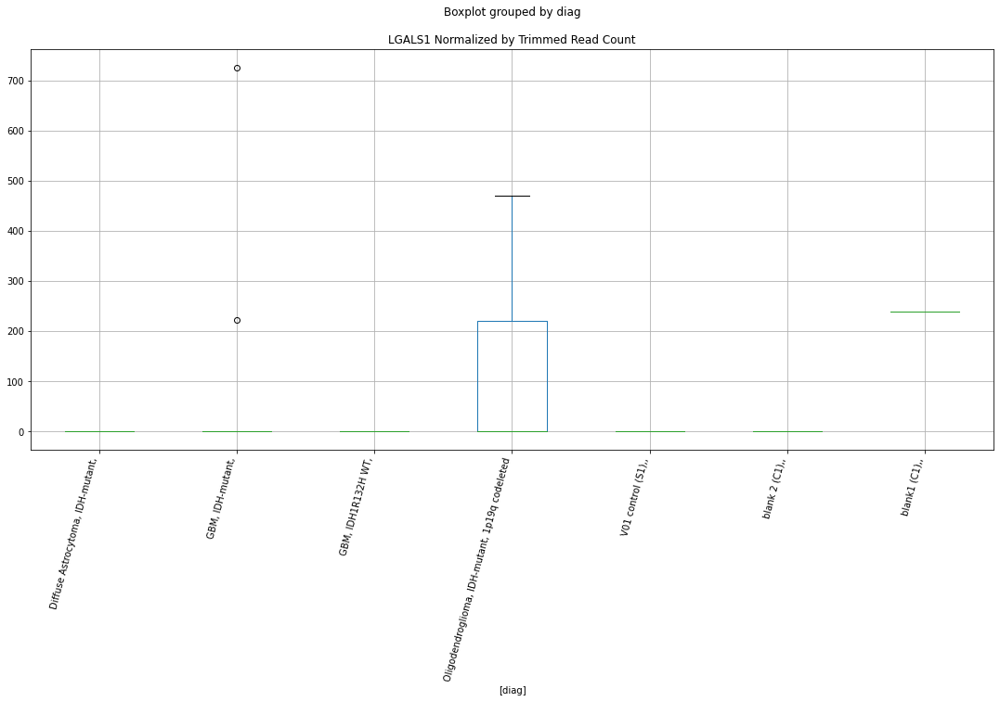

 p : 0.0442923555119053  ( t : 2.162451137178808 ) :  D-plex  :  bbduk2  :  LINC02537
Control and blanks
73     0.0
337    0.0
Name: LINC02537, dtype: float64
205    179.09
Name: LINC02537, dtype: float64
469    0.0
Name: LINC02537, dtype: float64


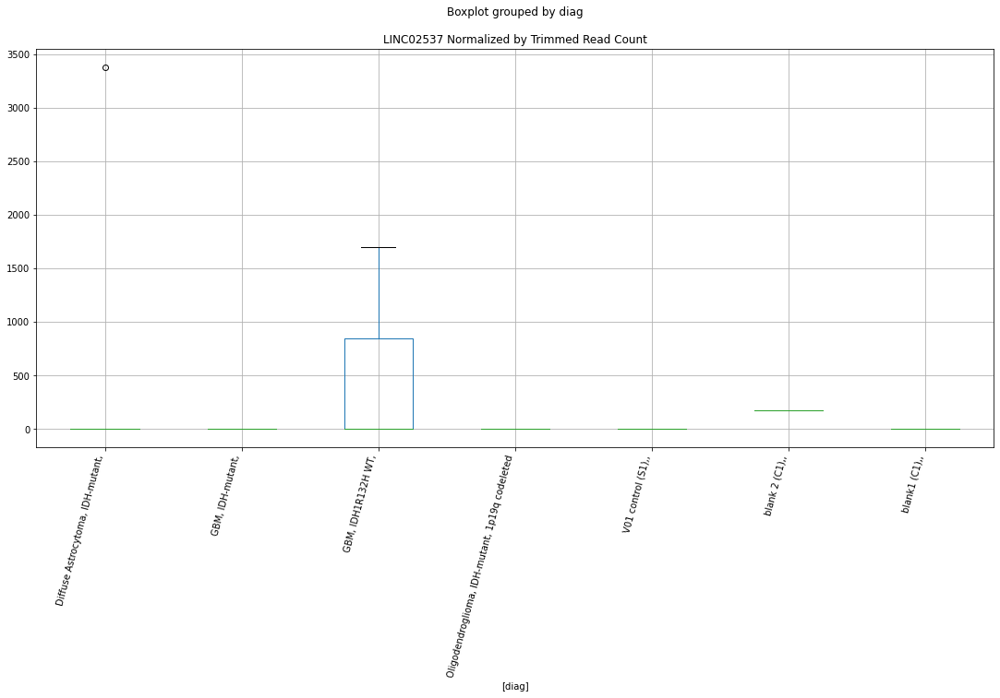

 p : 0.044322321579775927  ( t : 2.162109620413615 ) :  D-plex  :  cutadapt2  :  LOC101927013
Control and blanks
76     0.0
340    0.0
Name: LOC101927013, dtype: float64
208    1058.16
Name: LOC101927013, dtype: float64
472    0.0
Name: LOC101927013, dtype: float64


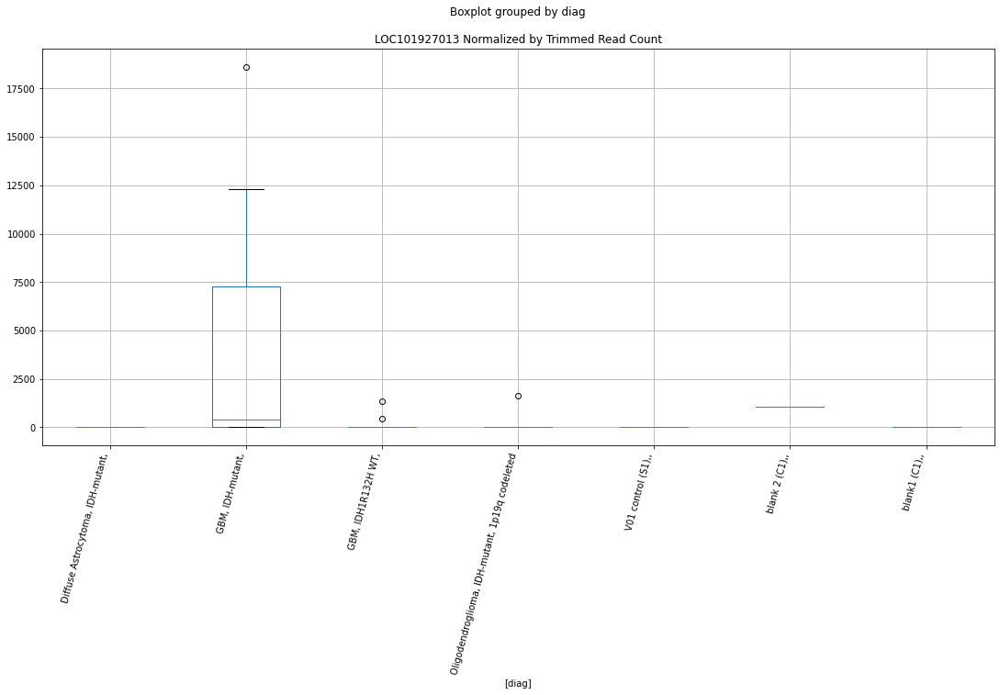

 p : 0.04433050504674226  ( t : 2.1620163919401323 ) :  D-plex  :  cutadapt2  :  LOC105369161
Control and blanks
76     25758.88
340     2642.20
Name: LOC105369161, dtype: float64
208    11287.05
Name: LOC105369161, dtype: float64
472    15026.85
Name: LOC105369161, dtype: float64


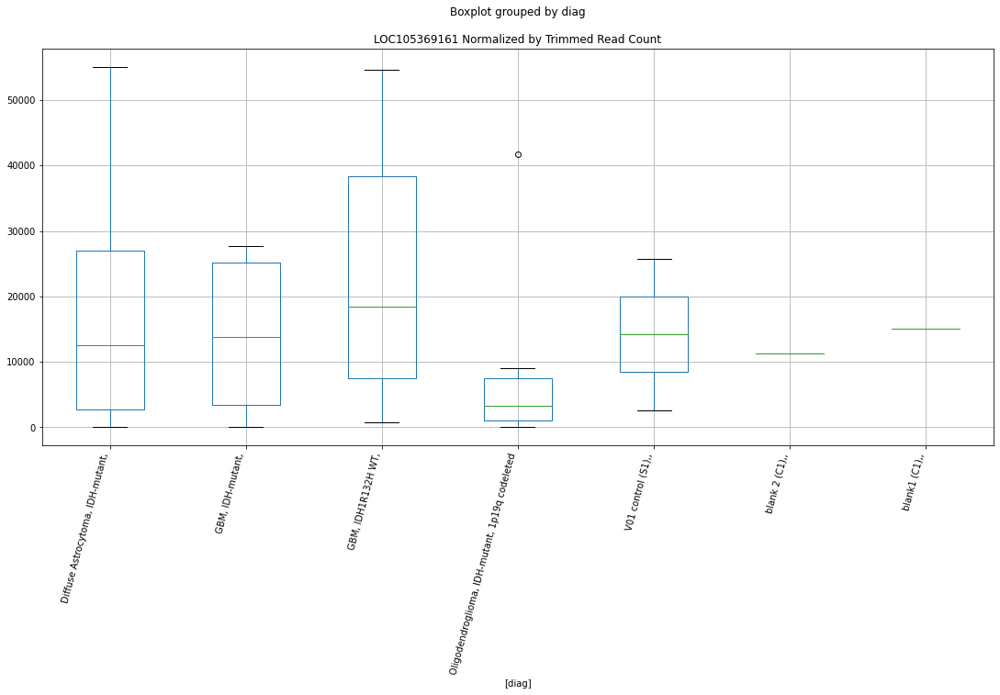

 p : 0.04433458411147571  ( t : 2.161969927909359 ) :  D-plex  :  bbduk2  :  LOC102724557
Control and blanks
73     773.01
337      0.00
Name: LOC102724557, dtype: float64
205    0.0
Name: LOC102724557, dtype: float64
469    0.0
Name: LOC102724557, dtype: float64


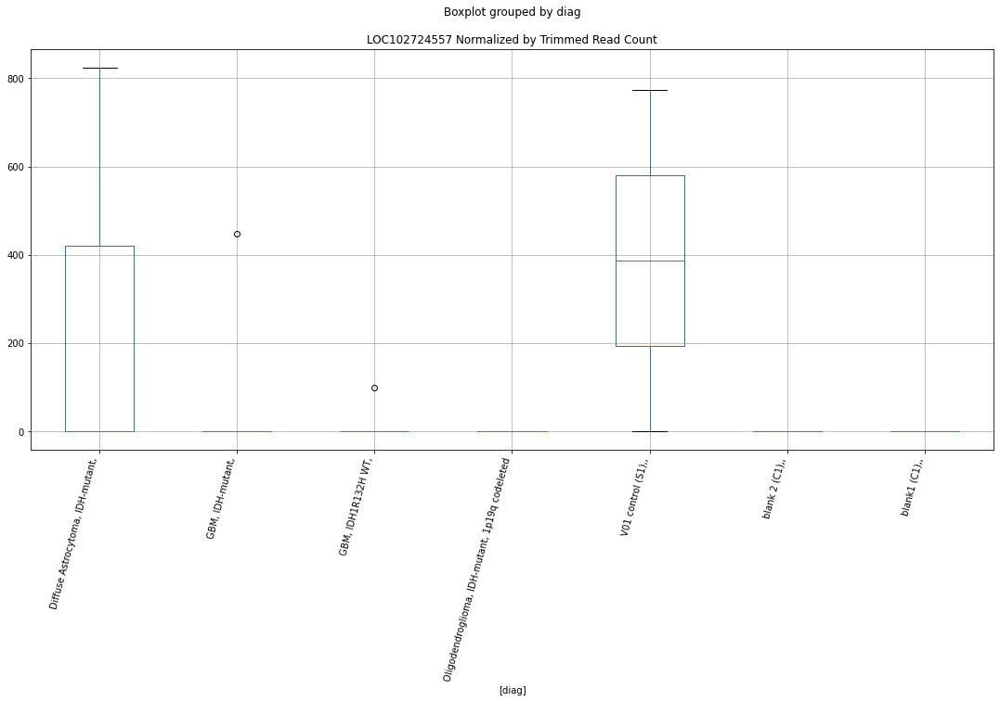

 p : 0.04434251277651294  ( t : 2.1618796248316965 ) :  D-plex  :  bbduk2  :  LOC101929248
Control and blanks
73     8503.09
337    8901.57
Name: LOC101929248, dtype: float64
205    9670.91
Name: LOC101929248, dtype: float64
469    5915.27
Name: LOC101929248, dtype: float64


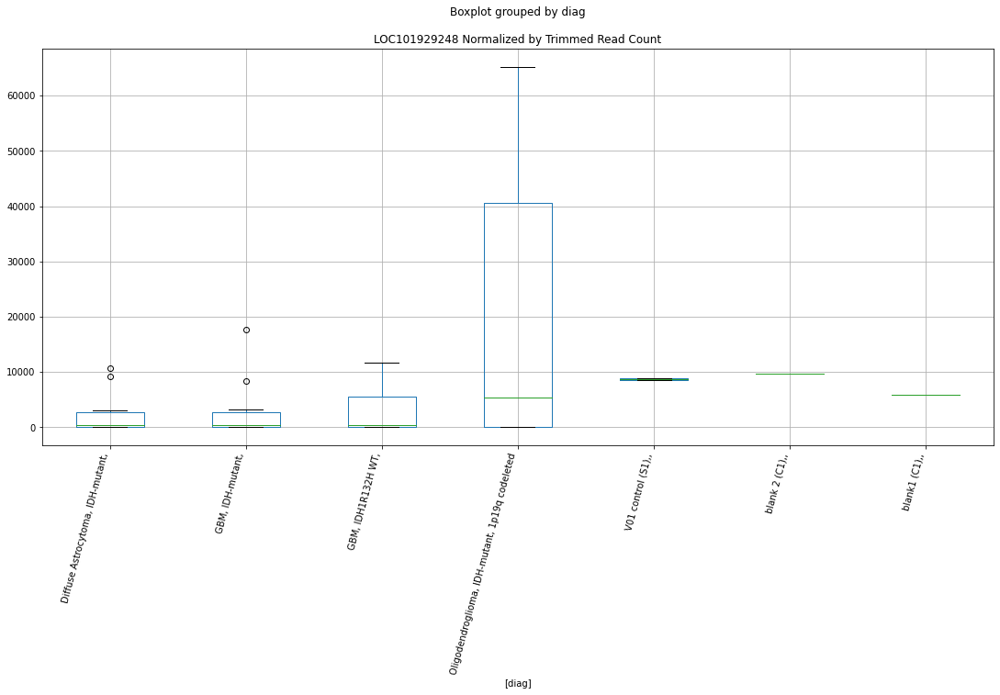

 p : 0.0446040758177988  ( t : 2.1589088176876907 ) :  D-plex  :  cutadapt2  :  LINC02317
Control and blanks
76     0.0
340    0.0
Name: LINC02317, dtype: float64
208    705.44
Name: LINC02317, dtype: float64
472    0.0
Name: LINC02317, dtype: float64


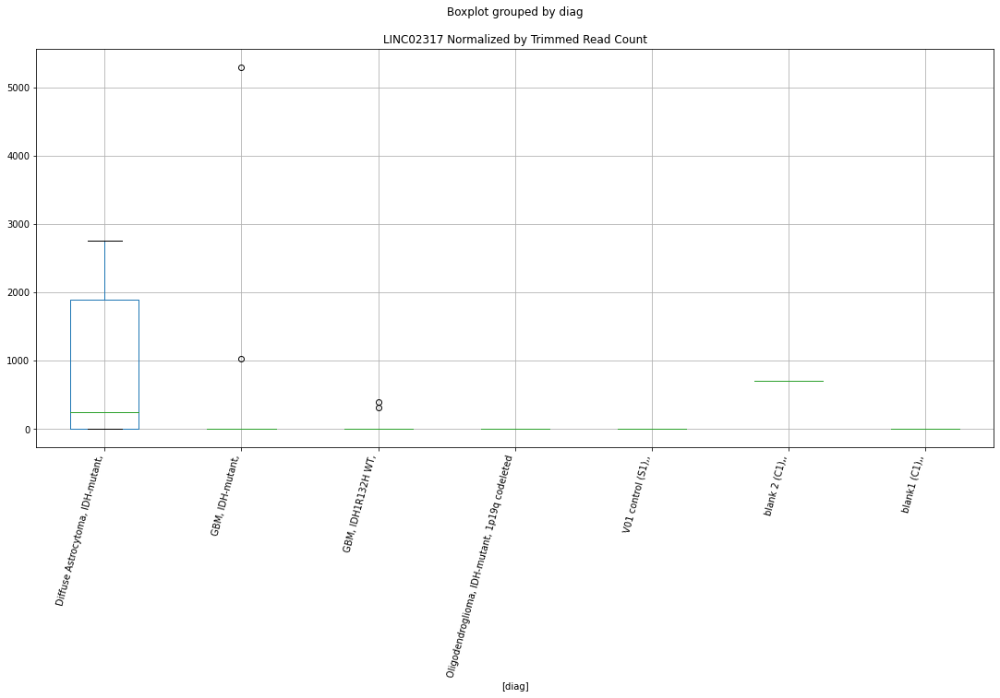

 p : 0.04468381287422855  ( t : 2.158006340954321 ) :  Lexogen  :  cutadapt2  :  LINC00540
Control and blanks
82     2840.10
346    3366.95
Name: LINC00540, dtype: float64
214    3525.94
Name: LINC00540, dtype: float64
478    3799.37
Name: LINC00540, dtype: float64


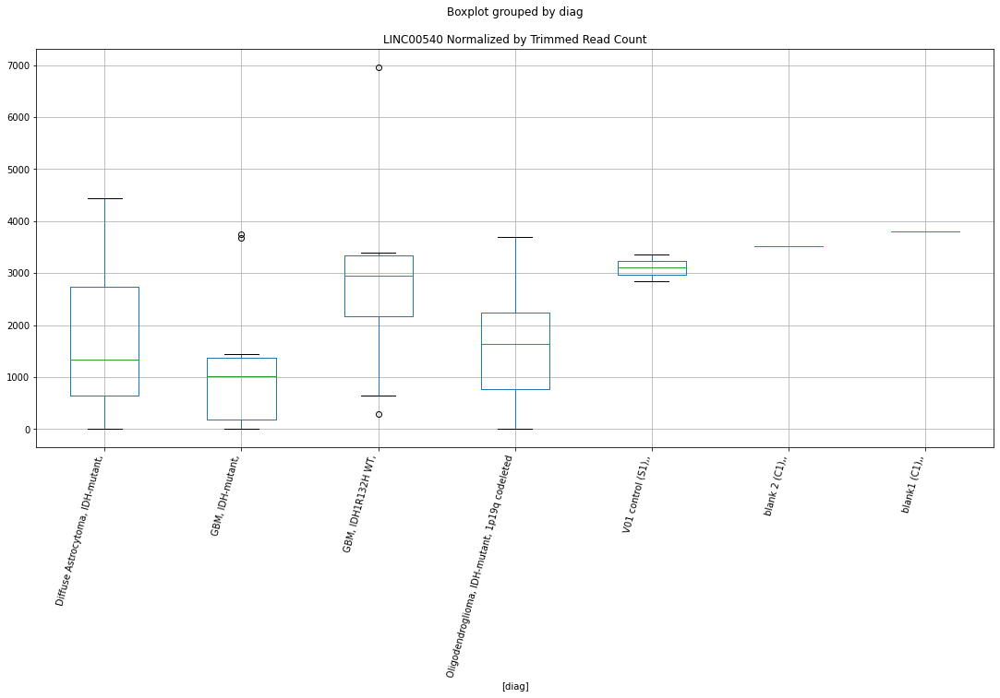

 p : 0.04474448539398864  ( t : 2.1573206258045725 ) :  D-plex  :  cutadapt2  :  LOC101926935
Control and blanks
76     0.0
340    0.0
Name: LOC101926935, dtype: float64
208    176.36
Name: LOC101926935, dtype: float64
472    577.96
Name: LOC101926935, dtype: float64


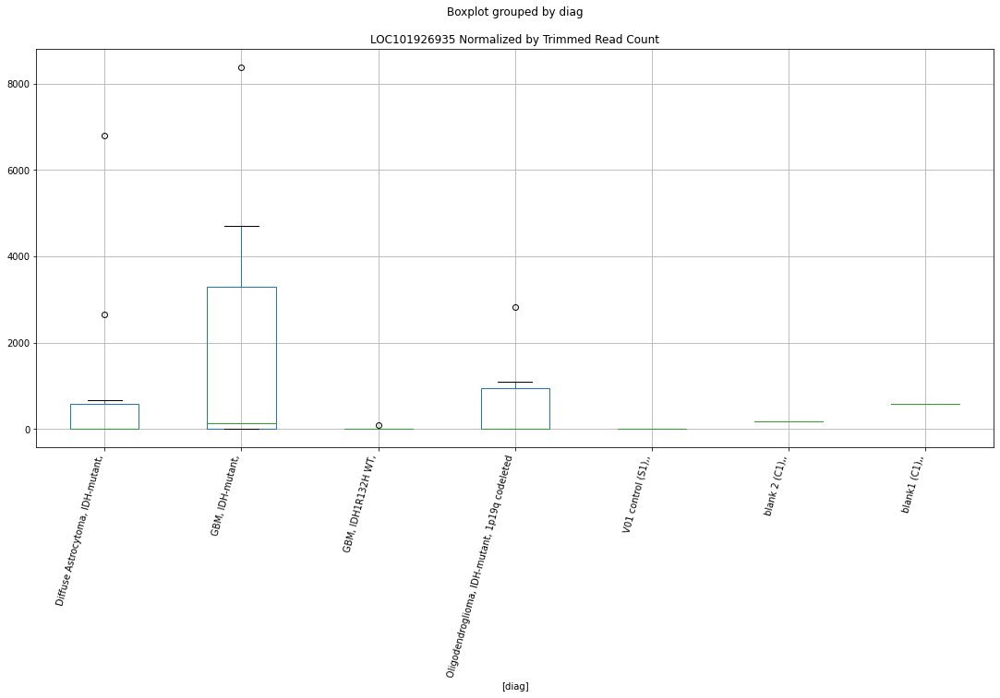

 p : 0.04481128004851913  ( t : 2.156566701419327 ) :  D-plex  :  cutadapt2  :  LNPEP
Control and blanks
76     2272.84
340    2642.20
Name: LNPEP, dtype: float64
208    5643.53
Name: LNPEP, dtype: float64
472    7513.43
Name: LNPEP, dtype: float64


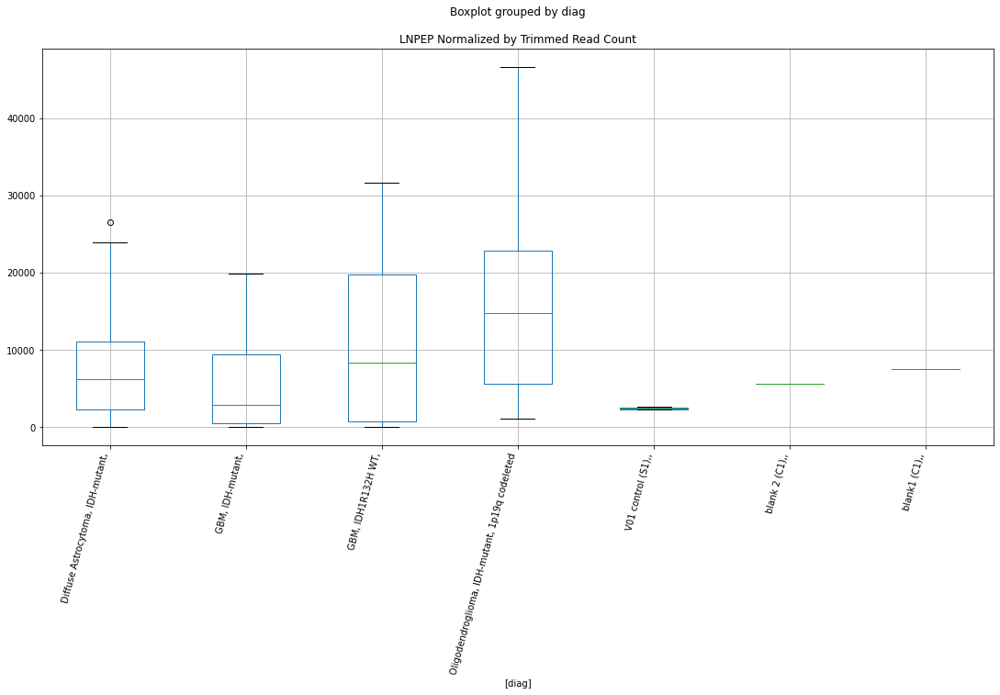

 p : 0.04482227628973915  ( t : 2.1564426832018073 ) :  D-plex  :  bbduk2  :  LOC105371241
Control and blanks
73     0.0
337    0.0
Name: LOC105371241, dtype: float64
205    358.18
Name: LOC105371241, dtype: float64
469    1183.05
Name: LOC105371241, dtype: float64


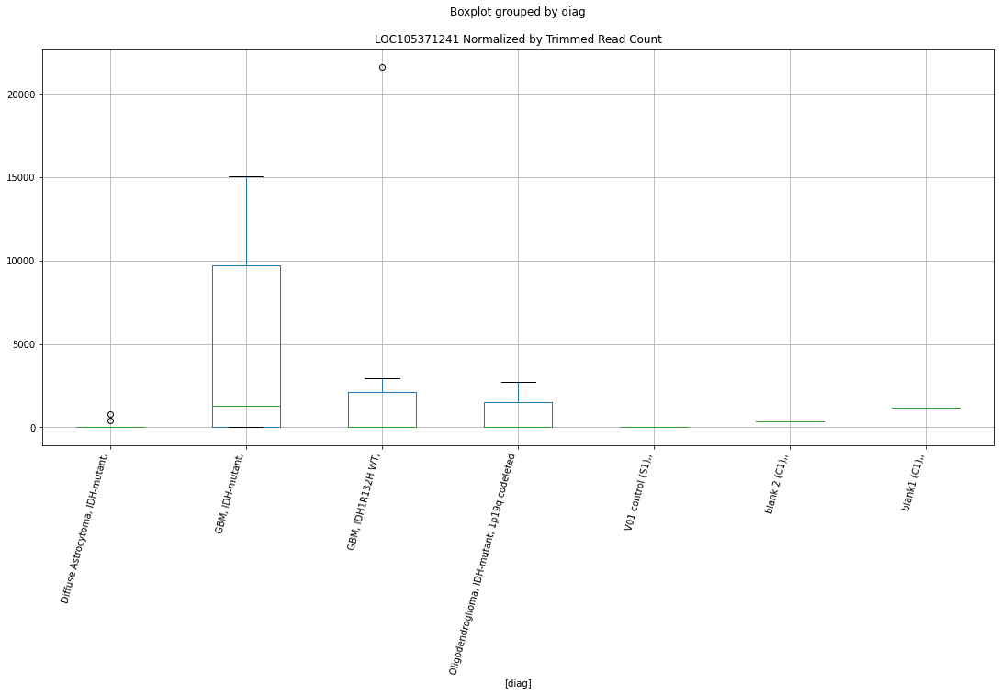

 p : 0.044968377105855994  ( t : 2.154797558270296 ) :  Lexogen  :  cutadapt2  :  LOC100505498
Control and blanks
82     0.0
346    0.0
Name: LOC100505498, dtype: float64
214    0.0
Name: LOC100505498, dtype: float64
478    0.0
Name: LOC100505498, dtype: float64


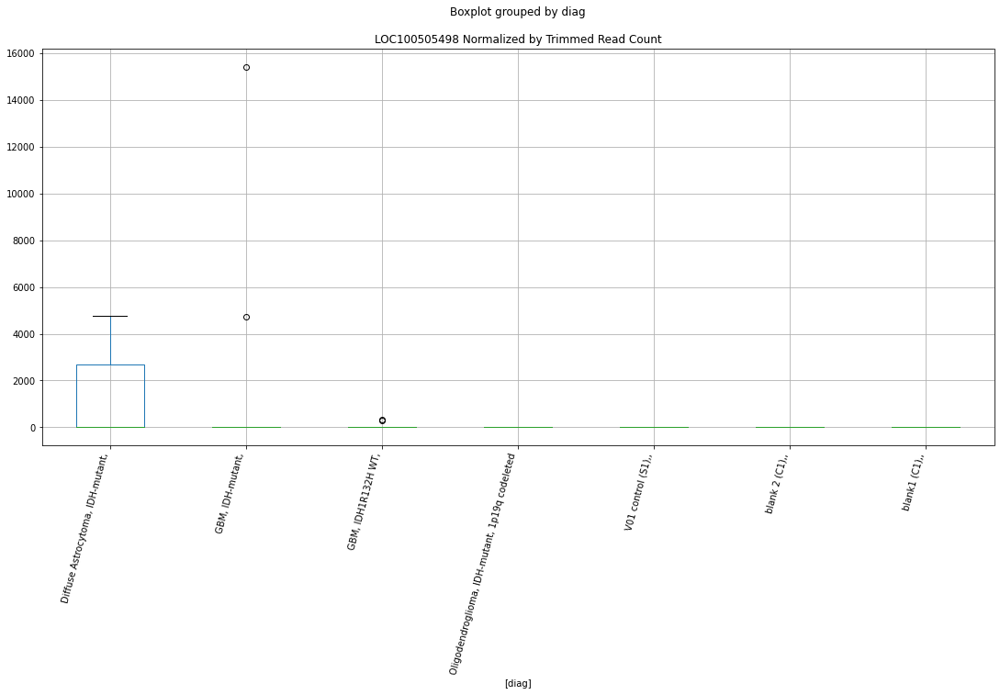

 p : 0.04499704501974482  ( t : 2.154475325309954 ) :  Lexogen  :  bbduk2  :  LOC105370827
Control and blanks
79       0.00
343    424.63
Name: LOC105370827, dtype: float64
211    0.0
Name: LOC105370827, dtype: float64
475    479.03
Name: LOC105370827, dtype: float64


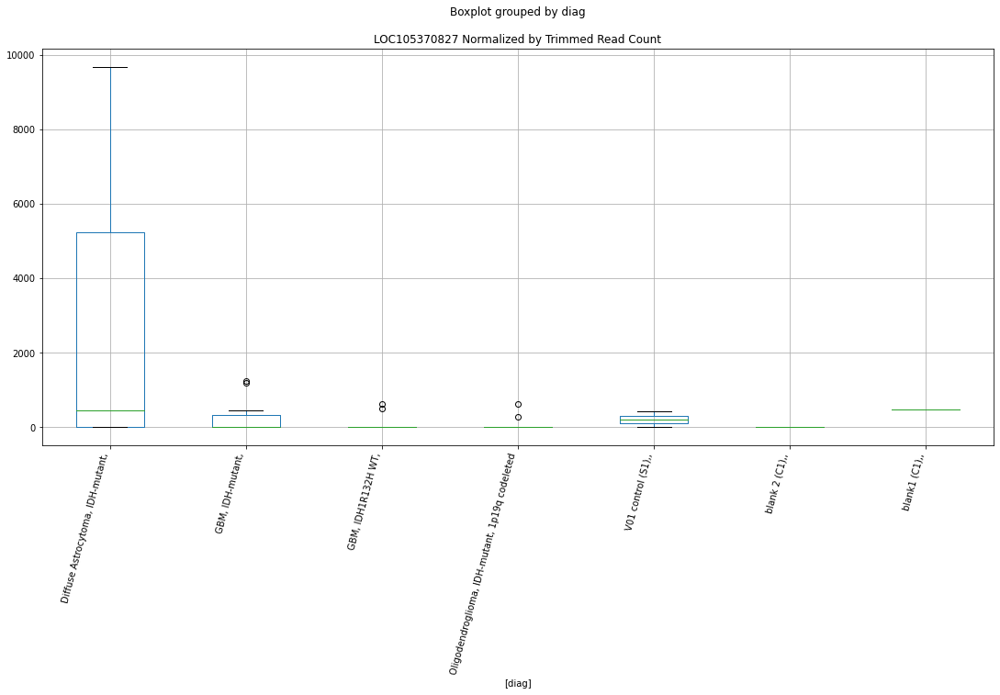

 p : 0.04500794533436582  ( t : 2.154352852884578 ) :  D-plex  :  bbduk2  :  LIM2
Control and blanks
73     0.0
337    0.0
Name: LIM2, dtype: float64
205    716.36
Name: LIM2, dtype: float64
469    1183.05
Name: LIM2, dtype: float64


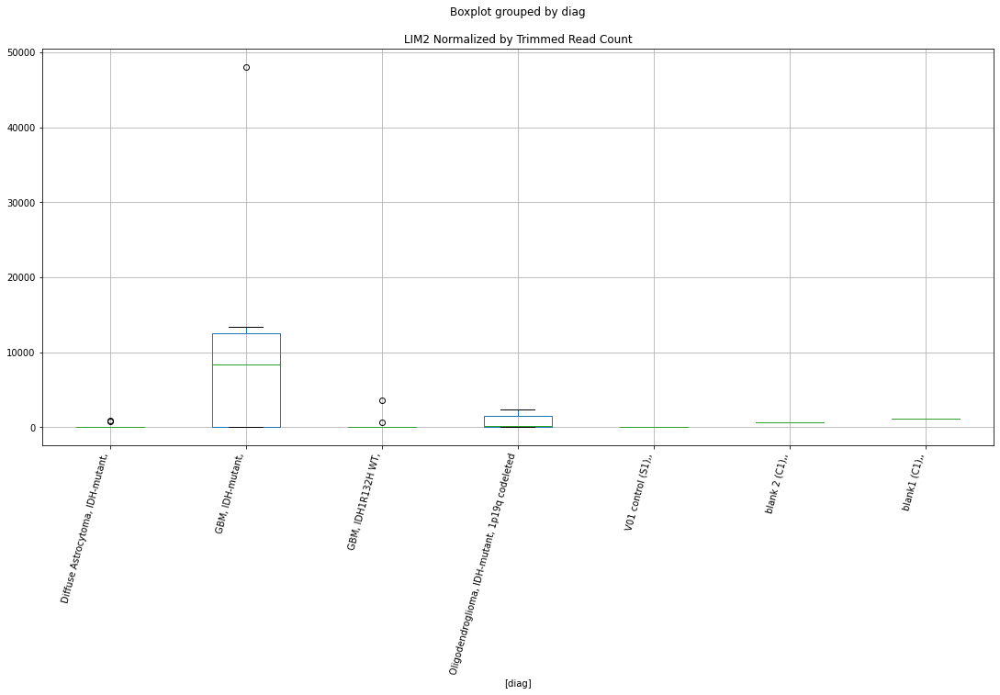

 p : 0.045133110299691255  ( t : 2.1529484794079856 ) :  D-plex  :  bbduk2  :  LINC02142
Control and blanks
73     0.0
337    0.0
Name: LINC02142, dtype: float64
205    358.18
Name: LINC02142, dtype: float64
469    0.0
Name: LINC02142, dtype: float64


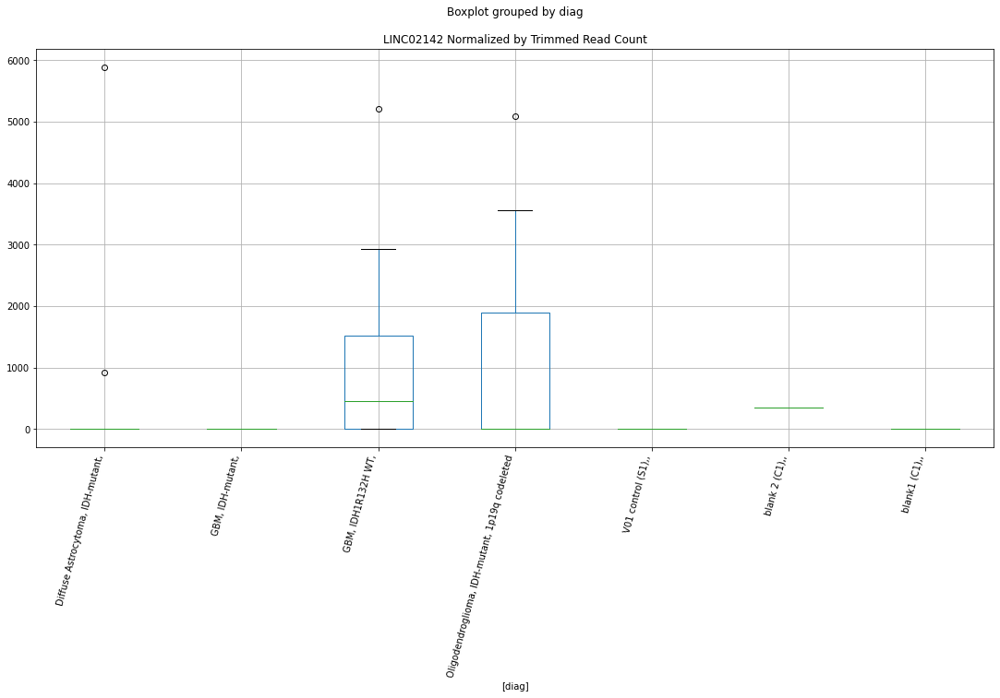

 p : 0.04525131438066476  ( t : 2.1516254727883357 ) :  D-plex  :  cutadapt2  :  LINC00326
Control and blanks
76     0.0
340    0.0
Name: LINC00326, dtype: float64
208    0.0
Name: LINC00326, dtype: float64
472    0.0
Name: LINC00326, dtype: float64


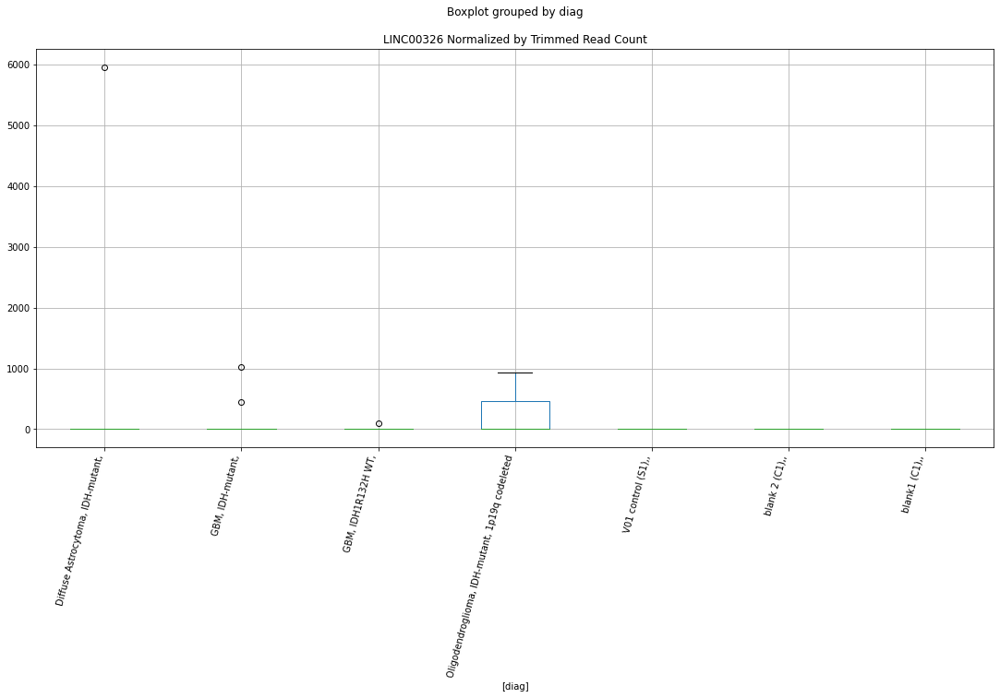

 p : 0.045371128876250014  ( t : 2.150287660703607 ) :  D-plex  :  cutadapt2  :  LINC01632
Control and blanks
76     0.0
340    0.0
Name: LINC01632, dtype: float64
208    19046.9
Name: LINC01632, dtype: float64
472    53171.94
Name: LINC01632, dtype: float64


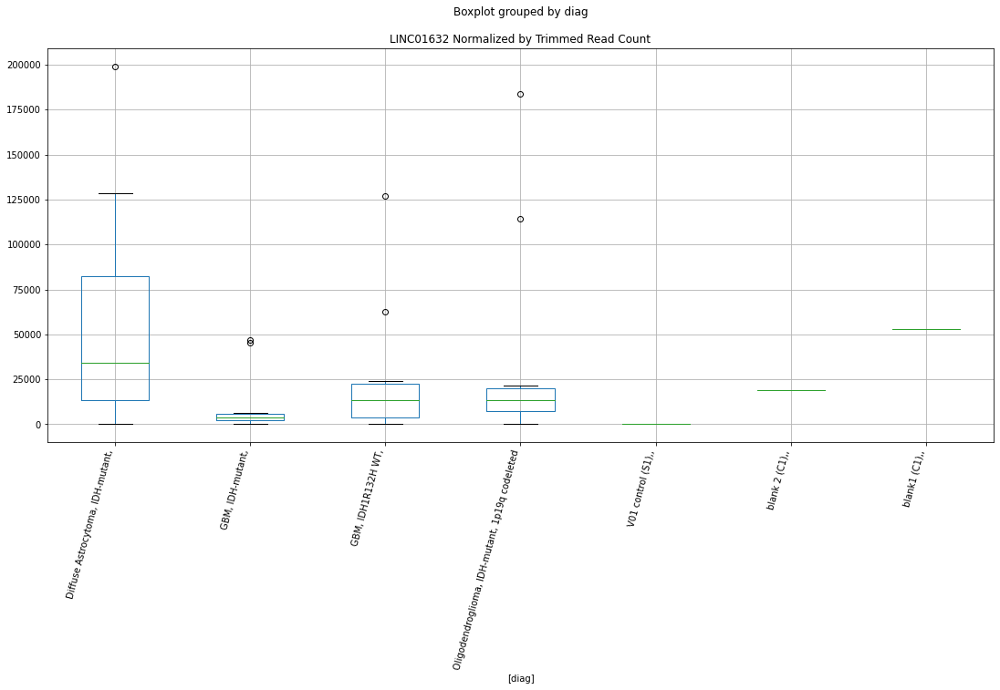

 p : 0.0453921149040004  ( t : 2.150053669426202 ) :  D-plex  :  bbduk2  :  LOC101929185
Control and blanks
73     0.0
337    0.0
Name: LOC101929185, dtype: float64
205    1253.64
Name: LOC101929185, dtype: float64
469    1183.05
Name: LOC101929185, dtype: float64


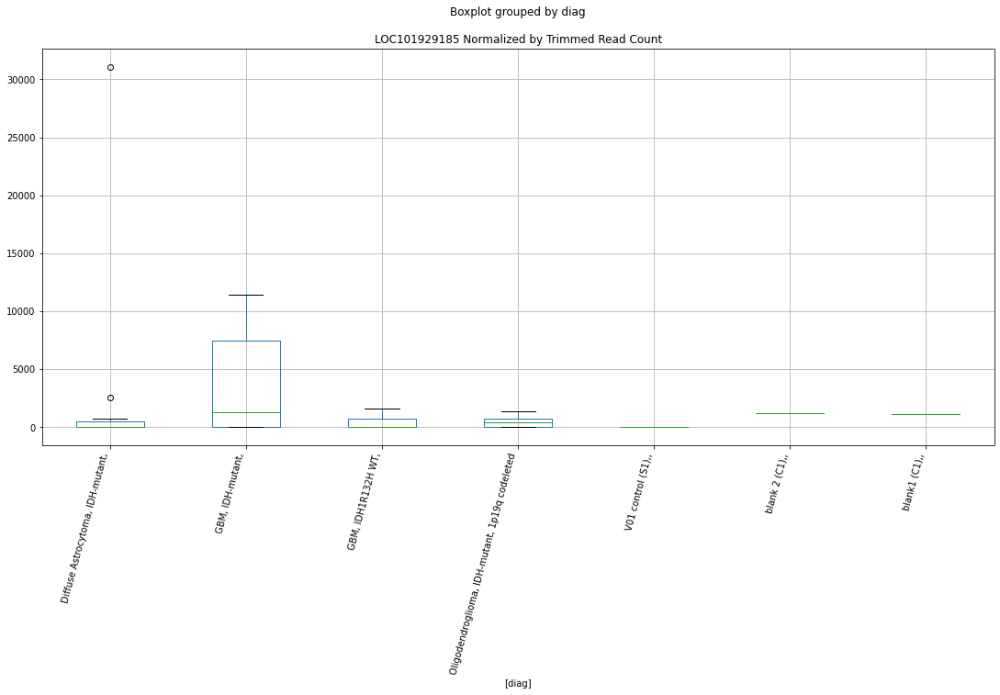

 p : 0.045550613226152135  ( t : 2.1482896207478417 ) :  D-plex  :  bbduk2  :  LOC105369161
Control and blanks
73     27055.29
337     4450.79
Name: LOC105369161, dtype: float64
205    11461.82
Name: LOC105369161, dtype: float64
469    15971.24
Name: LOC105369161, dtype: float64


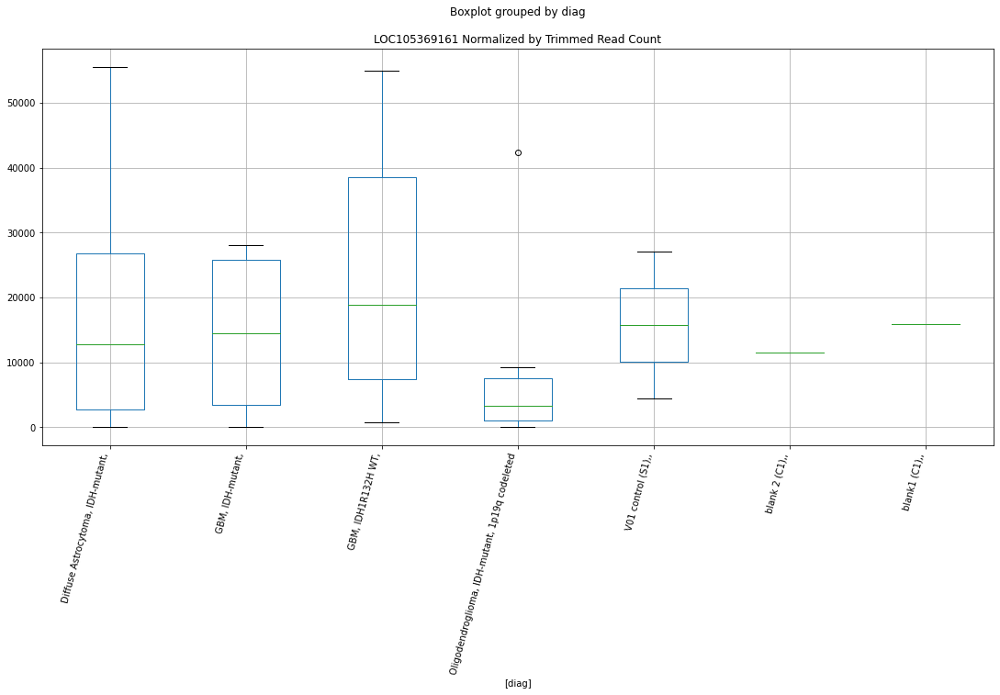

 p : 0.04558601409446207  ( t : 2.1478963837357674 ) :  D-plex  :  bbduk2  :  LINC01787
Control and blanks
73     0.0
337    0.0
Name: LINC01787, dtype: float64
205    0.0
Name: LINC01787, dtype: float64
469    591.53
Name: LINC01787, dtype: float64


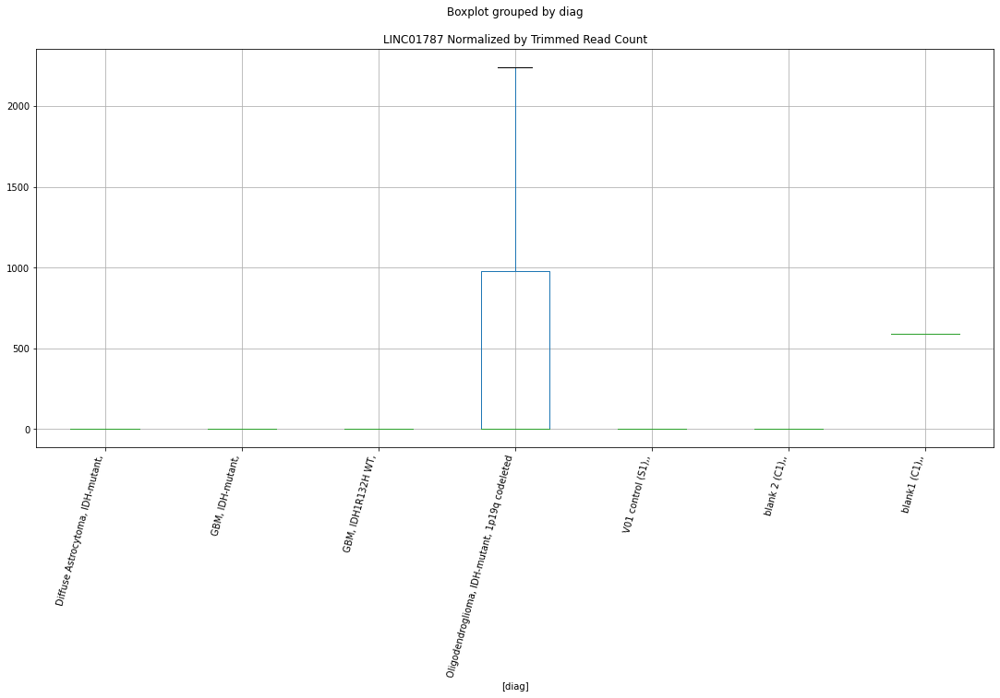

 p : 0.04567428765408989  ( t : 2.146917044379117 ) :  D-plex  :  bbduk2  :  LOC102724621
Control and blanks
73      3092.03
337    53409.44
Name: LOC102724621, dtype: float64
205    25968.19
Name: LOC102724621, dtype: float64
469    27210.26
Name: LOC102724621, dtype: float64


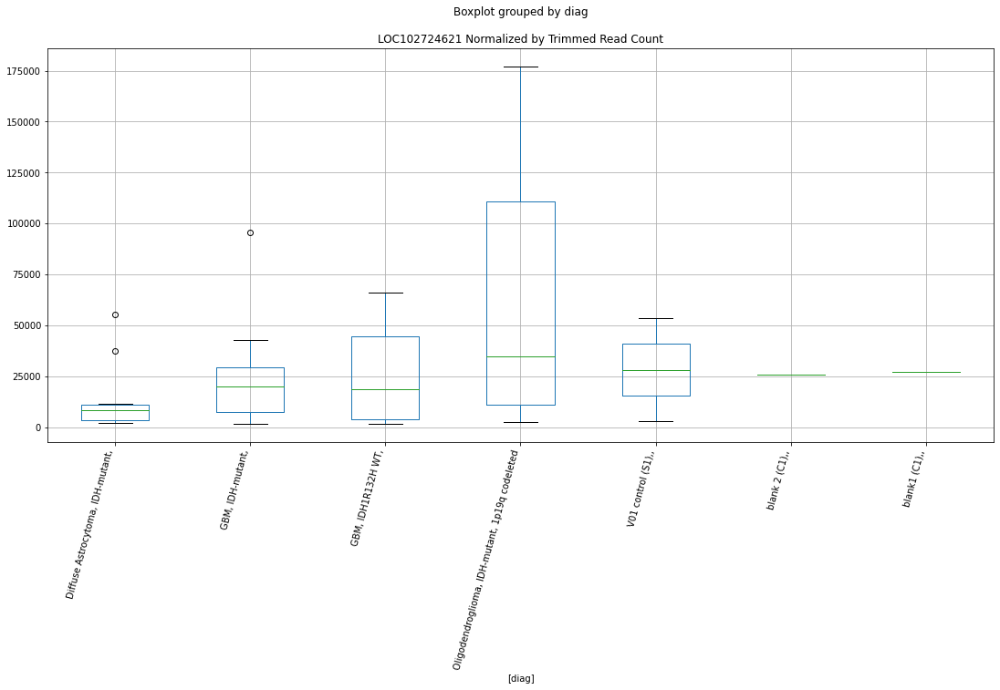

 p : 0.045707529061131506  ( t : 2.146548700043179 ) :  D-plex  :  cutadapt2  :  LIN7A
Control and blanks
76     0.0
340    0.0
Name: LIN7A, dtype: float64
208    0.0
Name: LIN7A, dtype: float64
472    577.96
Name: LIN7A, dtype: float64


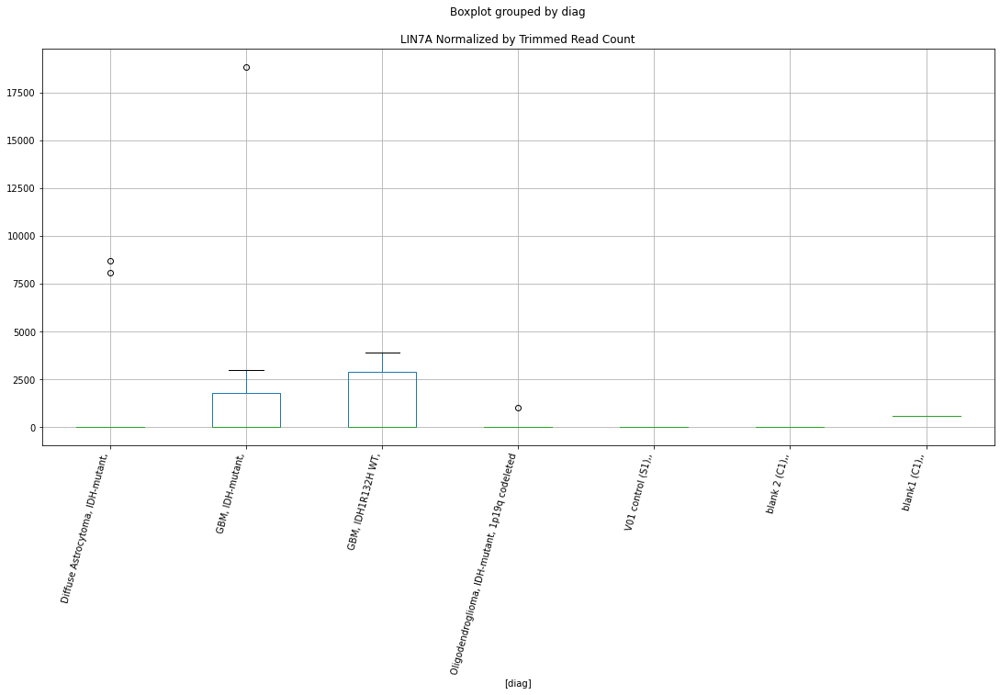

 p : 0.04572785511238203  ( t : 2.14632358986132 ) :  D-plex  :  bbduk2  :  LGR5
Control and blanks
73     35558.39
337     9791.73
Name: LGR5, dtype: float64
205    11820.0
Name: LGR5, dtype: float64
469    14788.18
Name: LGR5, dtype: float64


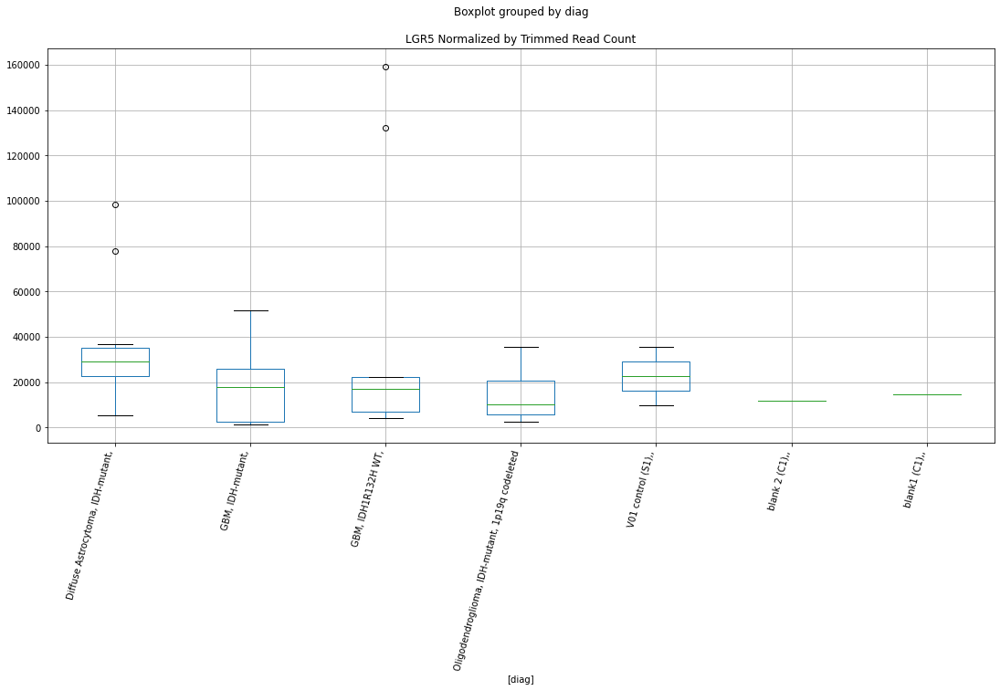

 p : 0.04576780627609801  ( t : 2.14588139859152 ) :  Lexogen  :  bbduk2  :  LOC105370624
Control and blanks
79     0.0
343    0.0
Name: LOC105370624, dtype: float64
211    0.0
Name: LOC105370624, dtype: float64
475    0.0
Name: LOC105370624, dtype: float64


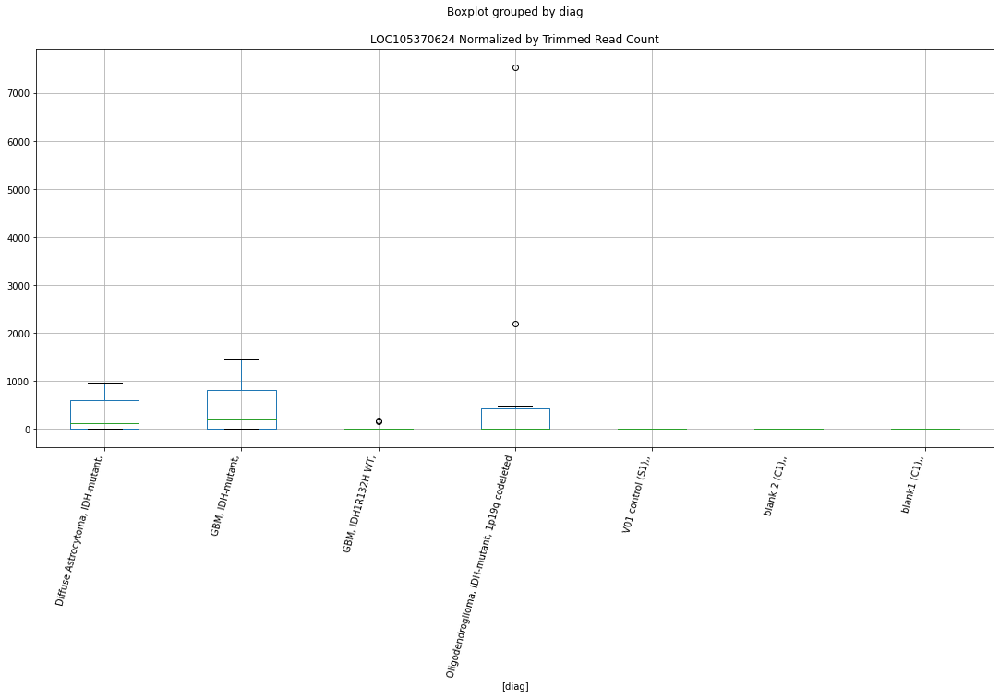

 p : 0.04580111743541507  ( t : 2.1455129702858162 ) :  Lexogen  :  bbduk2  :  LOC102724859
Control and blanks
79     30042.57
343    93630.61
Name: LOC102724859, dtype: float64
211    5739.43
Name: LOC102724859, dtype: float64
475    0.0
Name: LOC102724859, dtype: float64


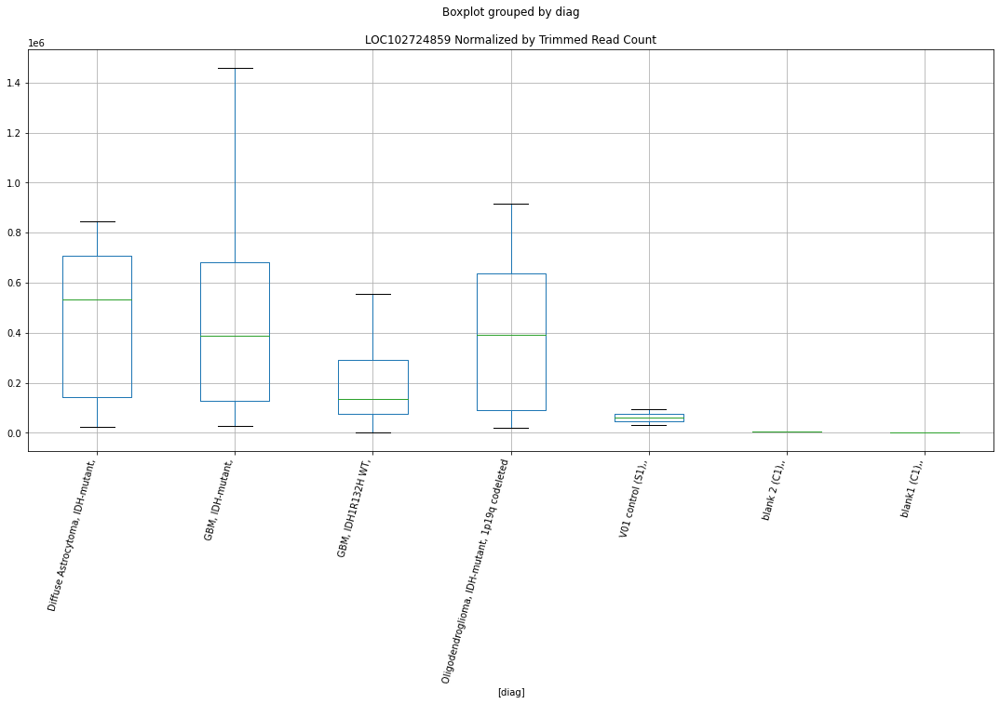

 p : 0.045816407995527976  ( t : 2.145343935473742 ) :  D-plex  :  cutadapt2  :  LINC02537
Control and blanks
76     0.0
340    0.0
Name: LINC02537, dtype: float64
208    176.36
Name: LINC02537, dtype: float64
472    0.0
Name: LINC02537, dtype: float64


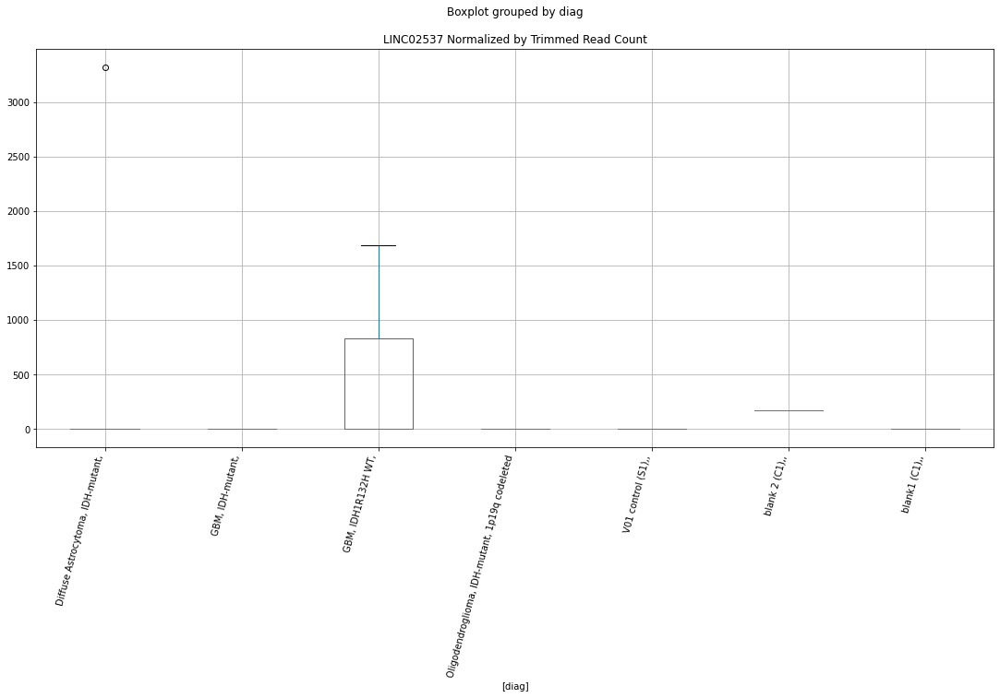

 p : 0.0458539838717999  ( t : 2.144928758657456 ) :  D-plex  :  bbduk2  :  LOC105369780
Control and blanks
73     0.0
337    0.0
Name: LOC105369780, dtype: float64
205    716.36
Name: LOC105369780, dtype: float64
469    0.0
Name: LOC105369780, dtype: float64


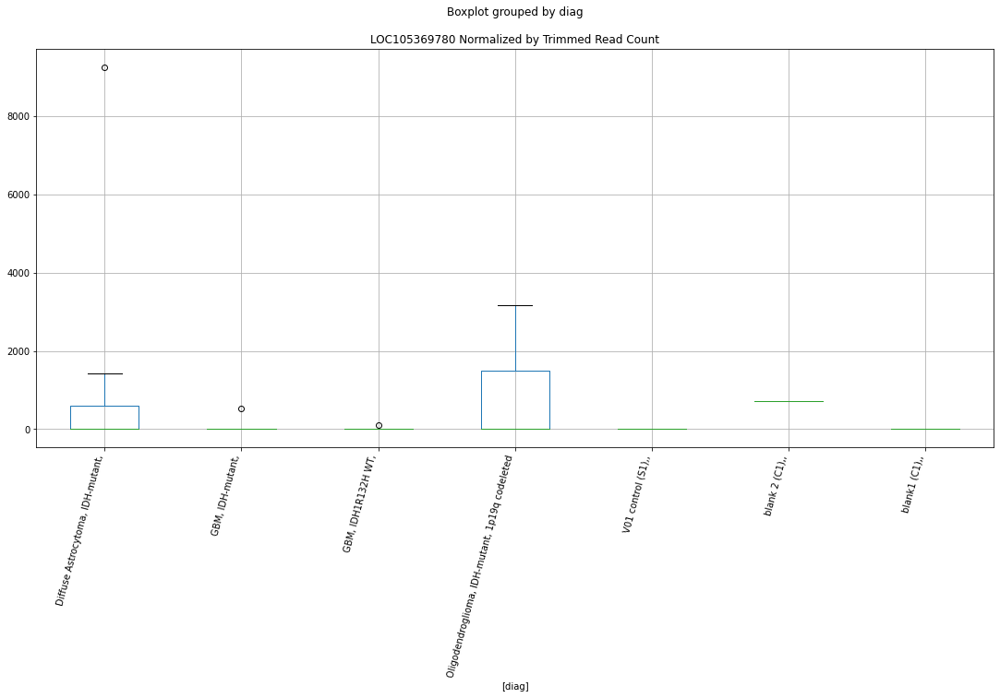

 p : 0.04607218004627245  ( t : 2.1425240259108644 ) :  D-plex  :  bbduk2  :  LINC00442
Control and blanks
73     0.0
337    0.0
Name: LINC00442, dtype: float64
205    0.0
Name: LINC00442, dtype: float64
469    1183.05
Name: LINC00442, dtype: float64


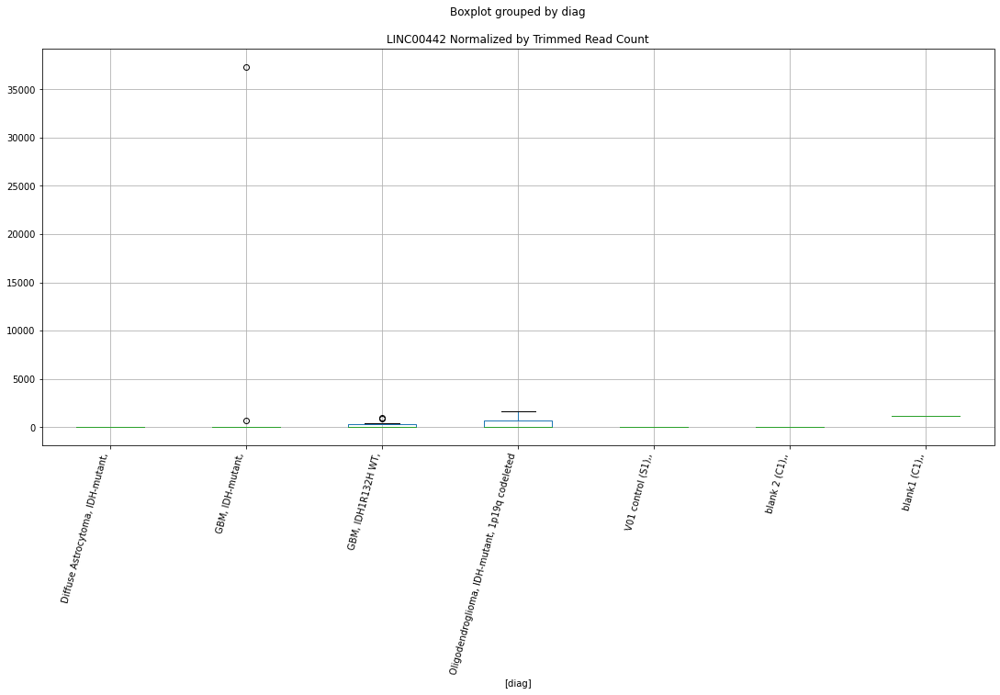

 p : 0.04608062227233672  ( t : 2.1424311935282114 ) :  D-plex  :  cutadapt2  :  LINC00442
Control and blanks
76     0.0
340    0.0
Name: LINC00442, dtype: float64
208    0.0
Name: LINC00442, dtype: float64
472    577.96
Name: LINC00442, dtype: float64


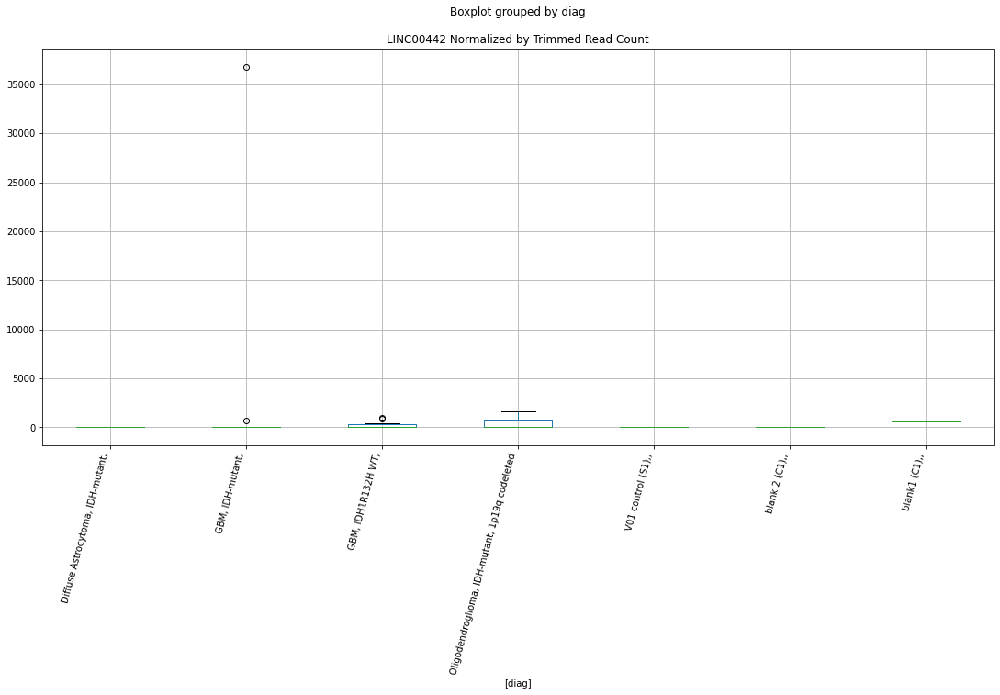

 p : 0.04609754705016739  ( t : 2.1422451320926372 ) :  D-plex  :  cutadapt2  :  LOC101929248
Control and blanks
76     8333.76
340    8807.32
Name: LOC101929248, dtype: float64
208    9876.17
Name: LOC101929248, dtype: float64
472    4623.65
Name: LOC101929248, dtype: float64


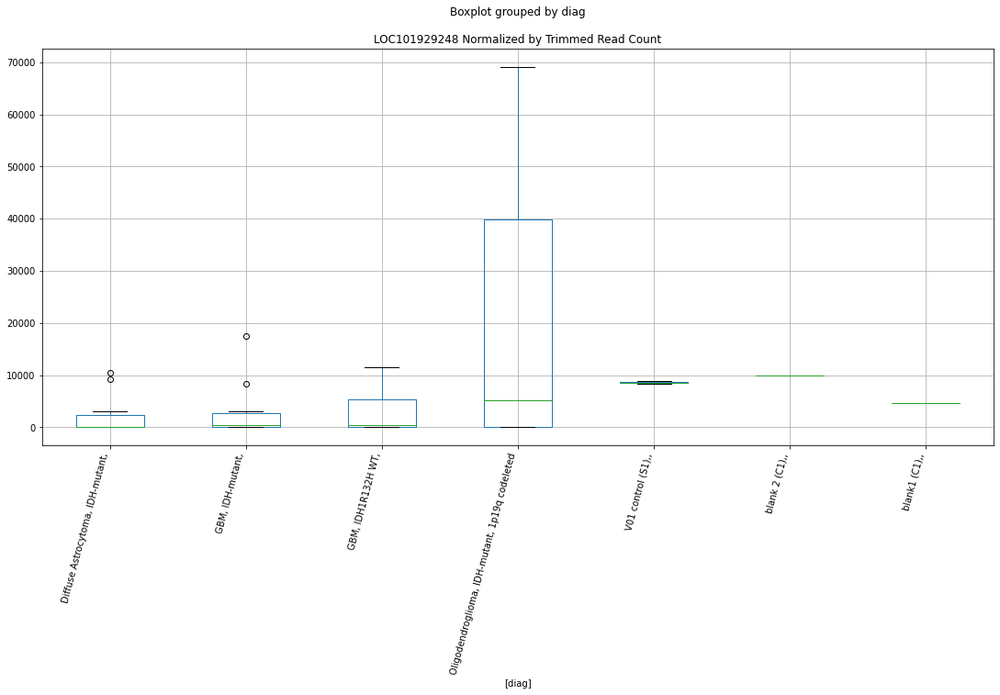

 p : 0.04619041633110408  ( t : 2.141225288392754 ) :  D-plex  :  cutadapt2  :  LINC01480
Control and blanks
76     0.0
340    0.0
Name: LINC01480, dtype: float64
208    352.72
Name: LINC01480, dtype: float64
472    0.0
Name: LINC01480, dtype: float64


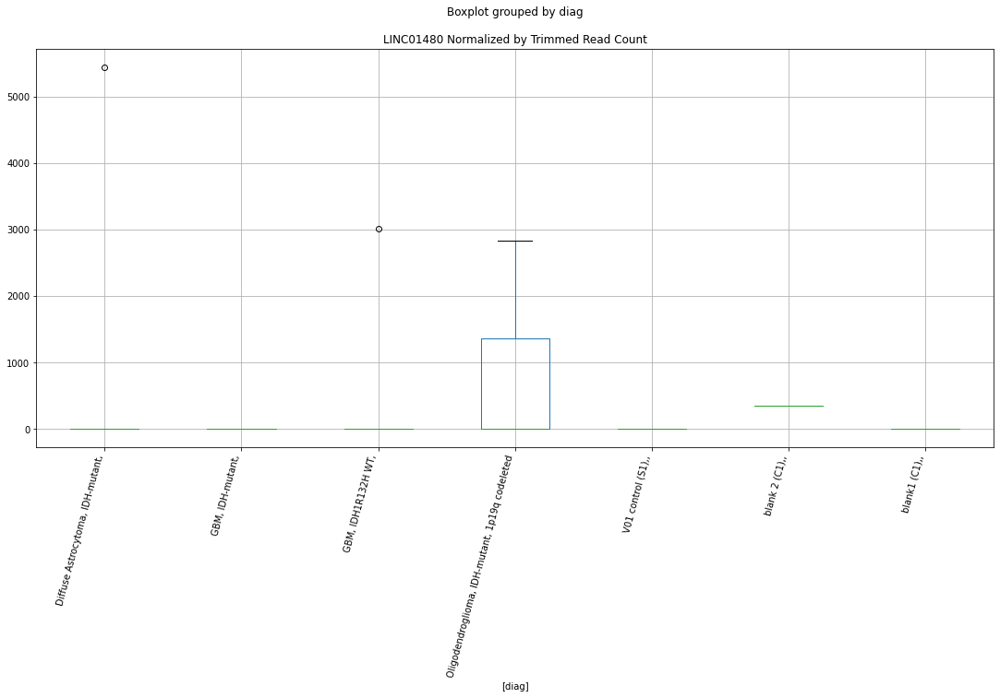

 p : 0.046195735917139  ( t : 2.141166928075241 ) :  D-plex  :  bbduk2  :  LOC101927013
Control and blanks
73     0.0
337    0.0
Name: LOC101927013, dtype: float64
205    1074.55
Name: LOC101927013, dtype: float64
469    0.0
Name: LOC101927013, dtype: float64


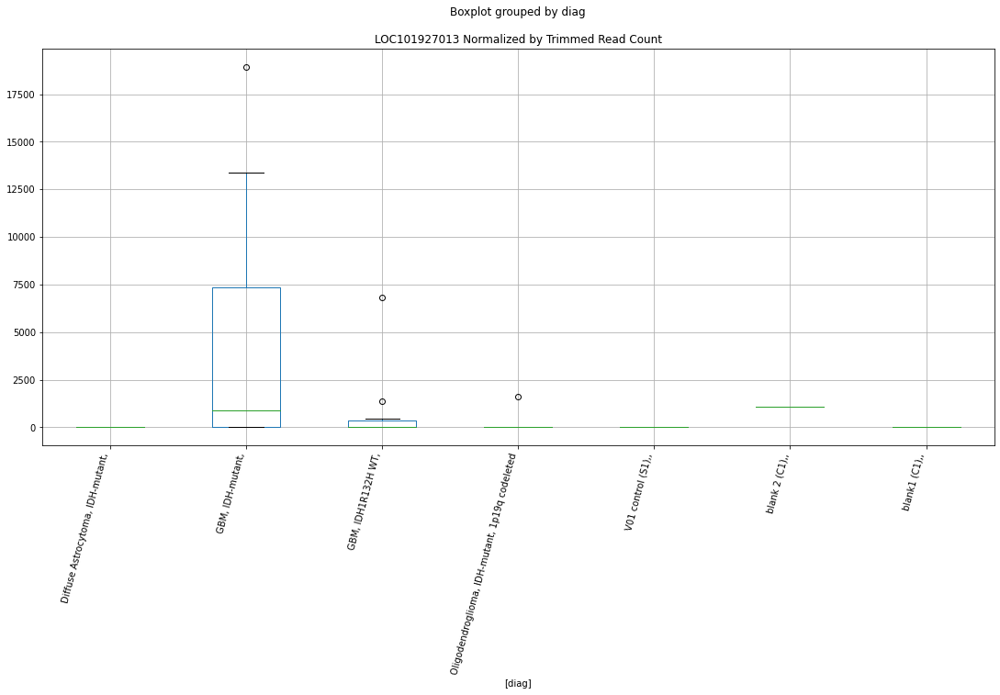

 p : 0.046239181701476964  ( t : 2.140690520925937 ) :  D-plex  :  bbduk2  :  LINC01537
Control and blanks
73     0.0
337    0.0
Name: LINC01537, dtype: float64
205    1074.55
Name: LINC01537, dtype: float64
469    591.53
Name: LINC01537, dtype: float64


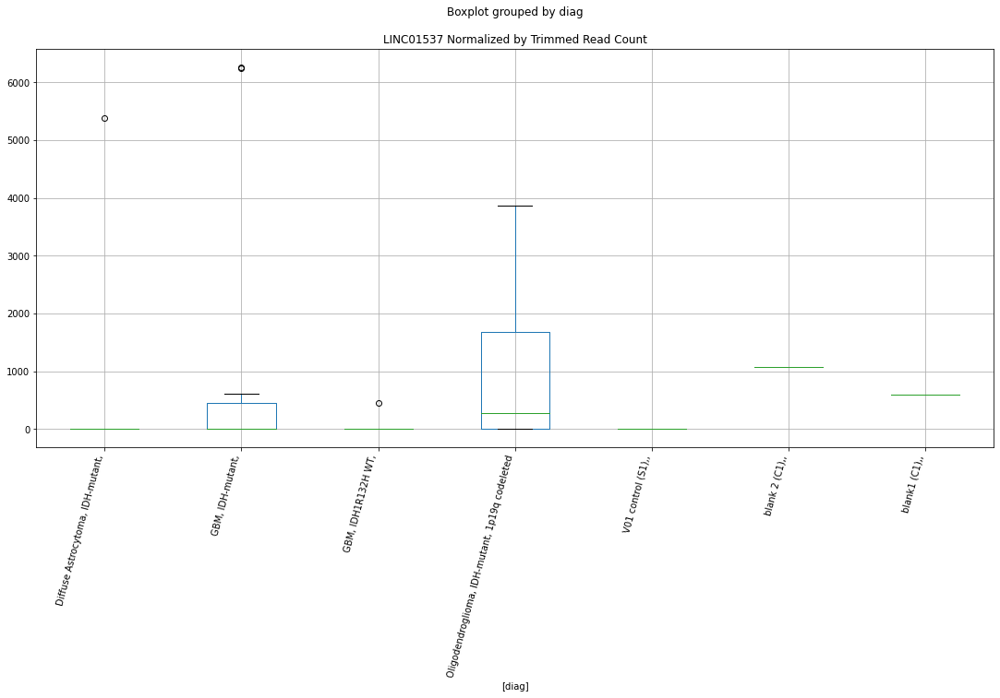

 p : 0.04631609353769729  ( t : 2.13984814098142 ) :  D-plex  :  bbduk2  :  LINC00327
Control and blanks
73       0.00
337    890.16
Name: LINC00327, dtype: float64
205    1074.55
Name: LINC00327, dtype: float64
469    1774.58
Name: LINC00327, dtype: float64


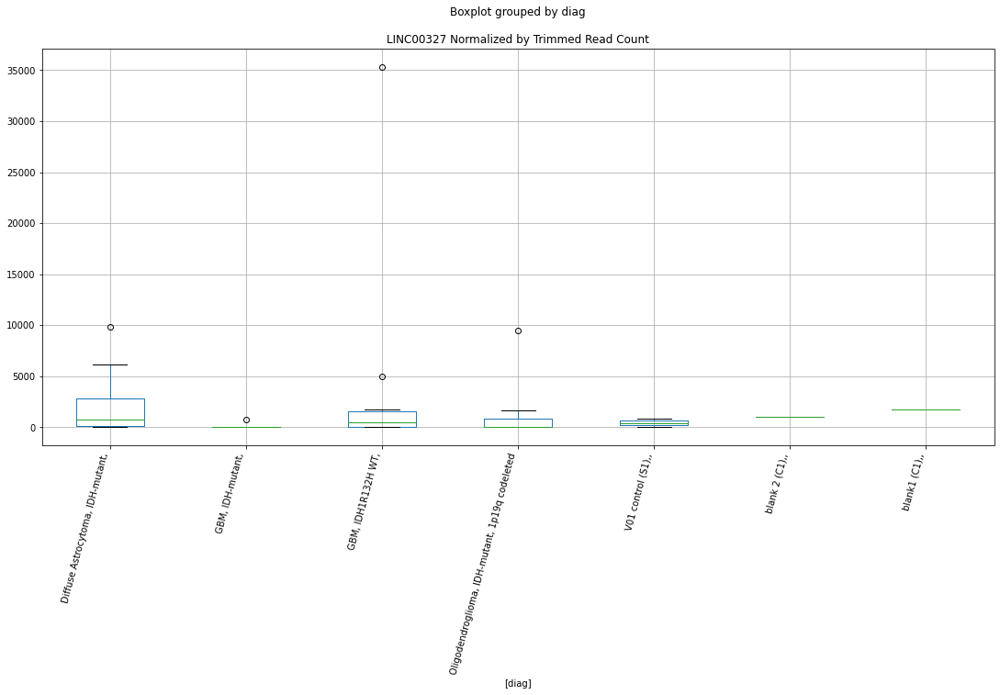

 p : 0.04653476110794579  ( t : 2.1374601317921047 ) :  D-plex  :  cutadapt2  :  LINC01537
Control and blanks
76     0.0
340    0.0
Name: LINC01537, dtype: float64
208    1058.16
Name: LINC01537, dtype: float64
472    577.96
Name: LINC01537, dtype: float64


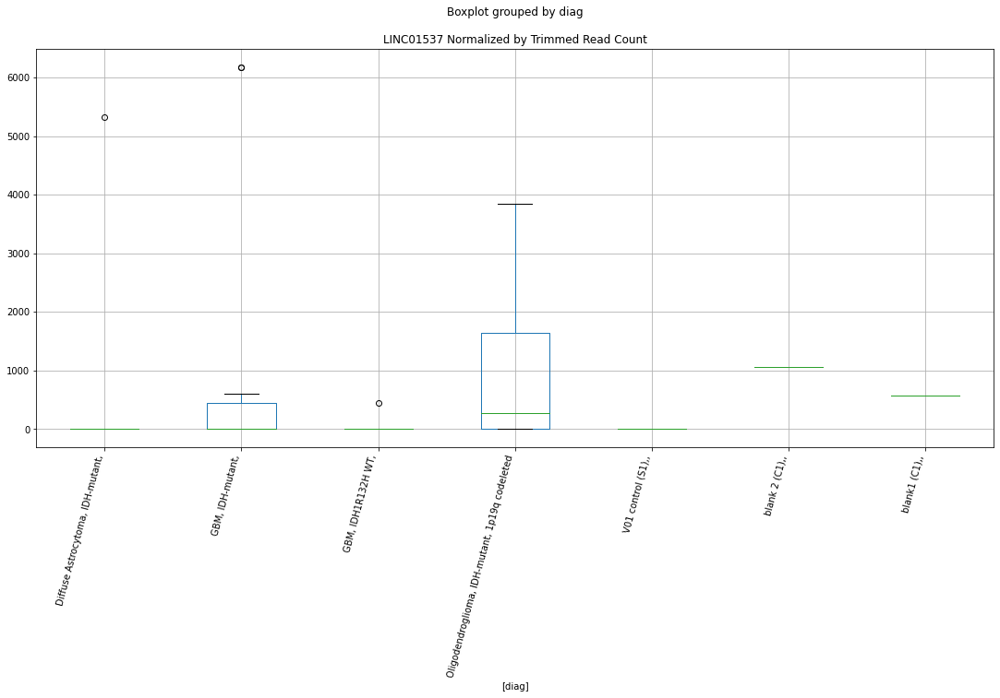

 p : 0.04678304147631012  ( t : 2.134761111154832 ) :  D-plex  :  cutadapt2  :  LINC02199
Control and blanks
76     0.0
340    0.0
Name: LINC02199, dtype: float64
208    0.0
Name: LINC02199, dtype: float64
472    0.0
Name: LINC02199, dtype: float64


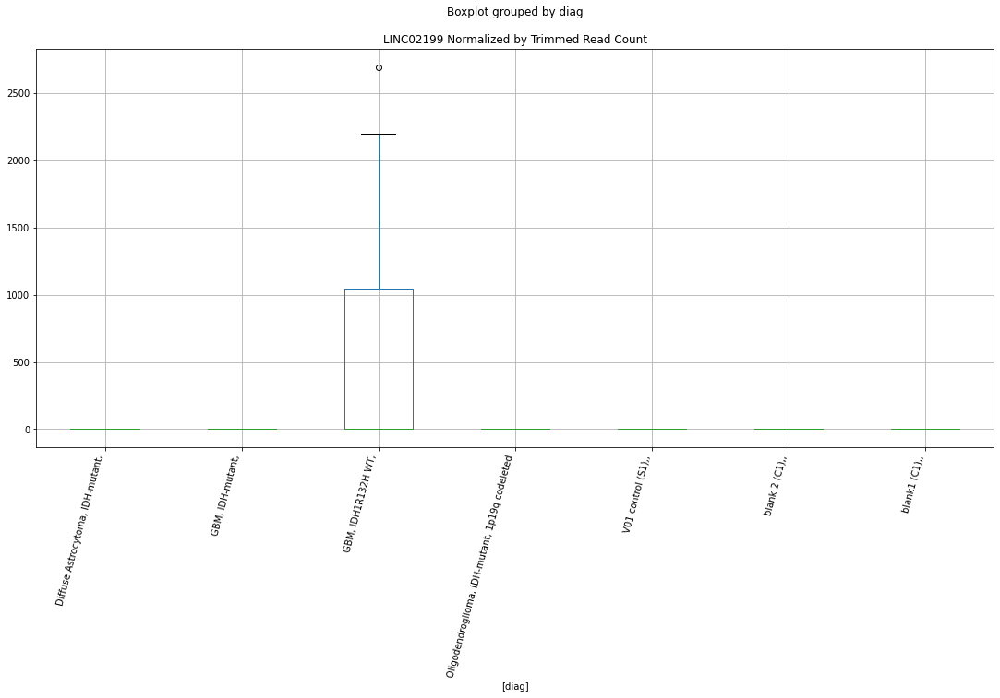

 p : 0.046810472341193  ( t : 2.1344637162543734 ) :  D-plex  :  bbduk2  :  LINC02199
Control and blanks
73     0.0
337    0.0
Name: LINC02199, dtype: float64
205    0.0
Name: LINC02199, dtype: float64
469    0.0
Name: LINC02199, dtype: float64


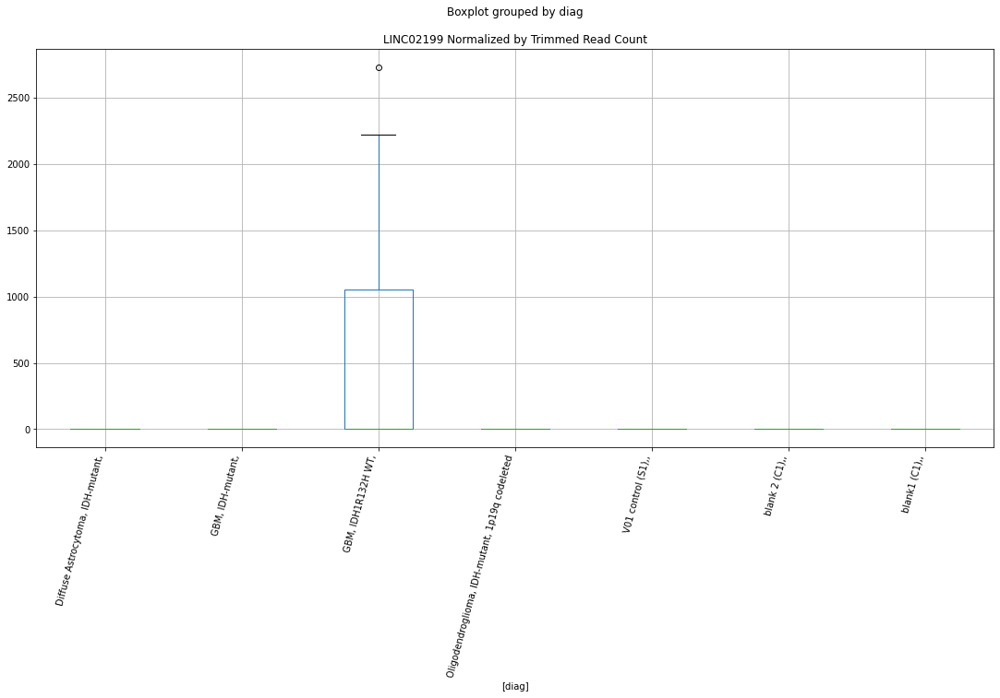

 p : 0.04690167082612712  ( t : 2.1334761188743405 ) :  Lexogen  :  bbduk2  :  LOC101927550
Control and blanks
79     17167.19
343     1486.20
Name: LOC101927550, dtype: float64
211    11478.87
Name: LOC101927550, dtype: float64
475    0.0
Name: LOC101927550, dtype: float64


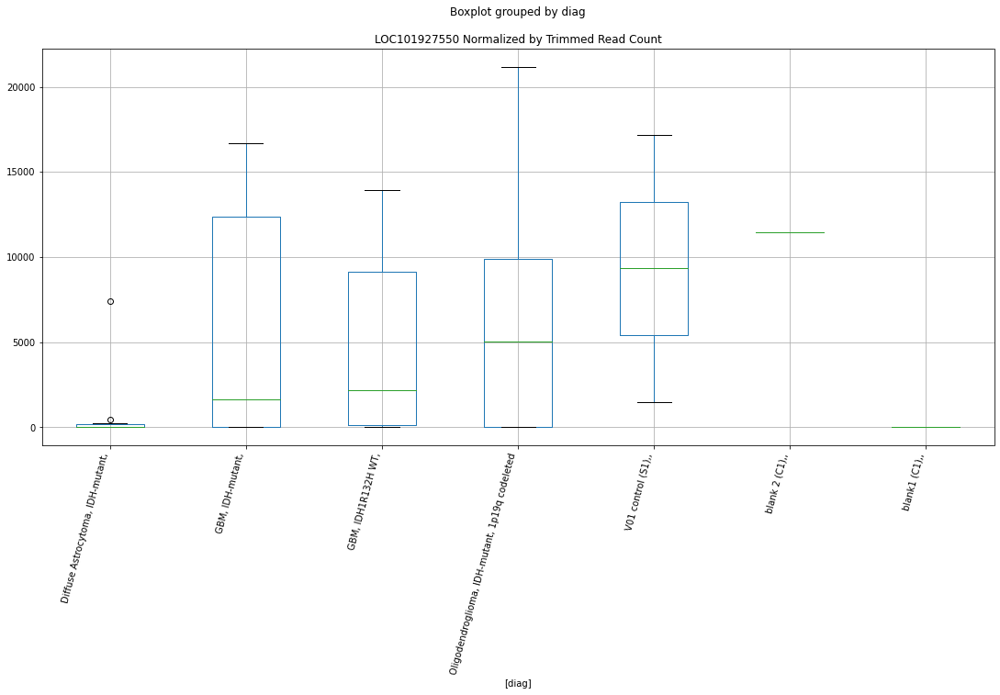

 p : 0.047147922464855385  ( t : 2.1308181592311013 ) :  Lexogen  :  cutadapt2  :  LOC101927550
Control and blanks
82     17040.61
346     1683.48
Name: LOC101927550, dtype: float64
214    11391.51
Name: LOC101927550, dtype: float64
478    0.0
Name: LOC101927550, dtype: float64


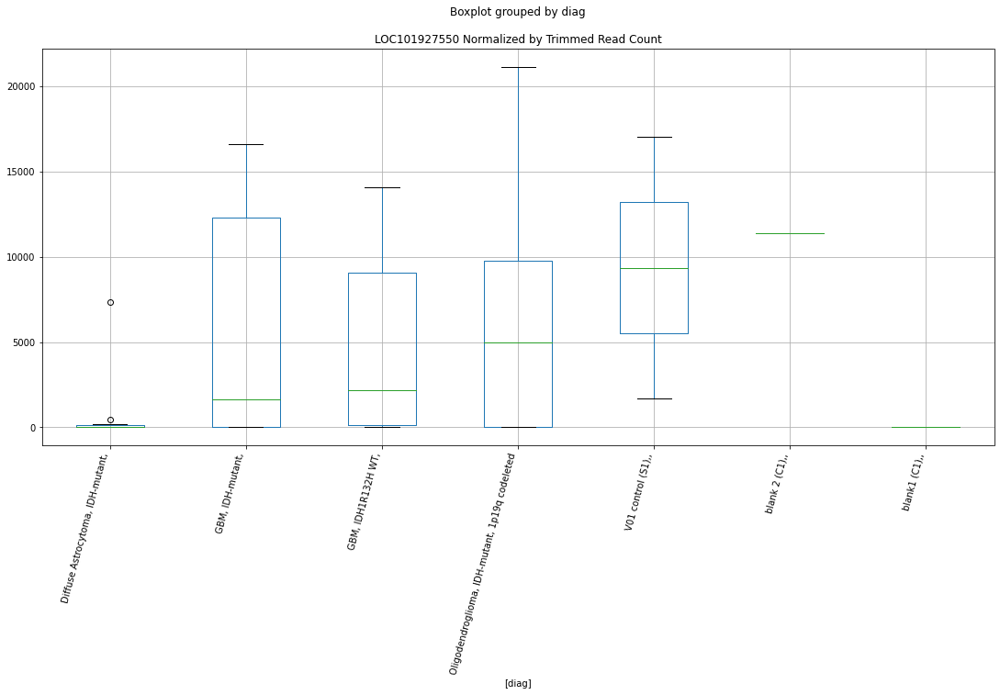

 p : 0.04715839363043479  ( t : 2.130705417735536 ) :  D-plex  :  bbduk2  :  LOC105370461
Control and blanks
73     12368.13
337     3560.63
Name: LOC105370461, dtype: float64
205    6805.46
Name: LOC105370461, dtype: float64
469    31350.95
Name: LOC105370461, dtype: float64


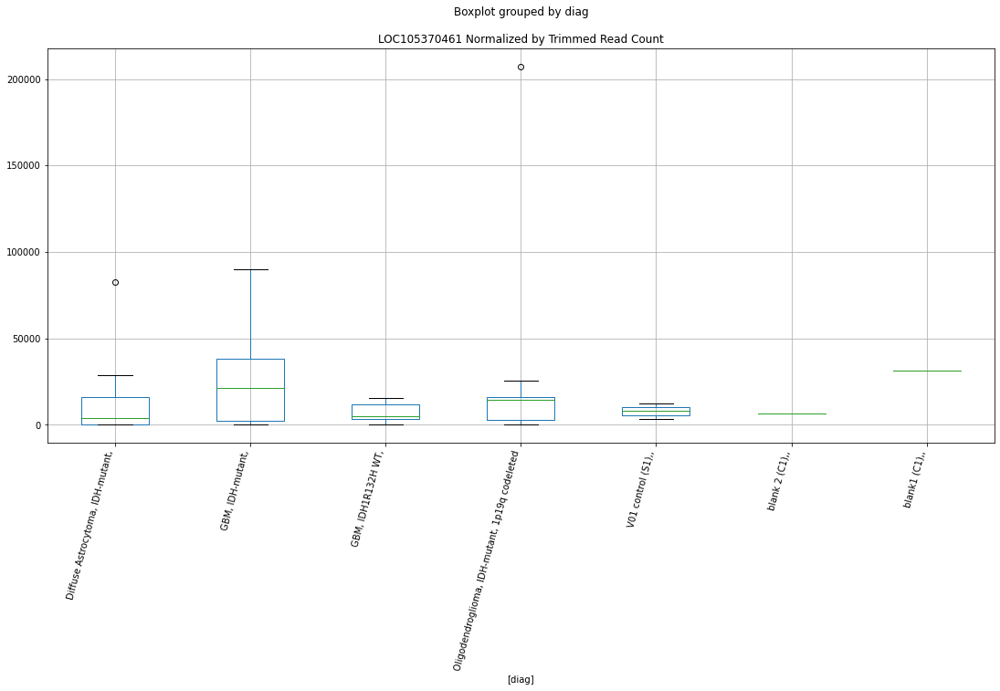

 p : 0.04717688237007734  ( t : 2.130506407926201 ) :  D-plex  :  cutadapt2  :  LEFTY1
Control and blanks
76     37123.1
340    22018.3
Name: LEFTY1, dtype: float64
208    37741.09
Name: LEFTY1, dtype: float64
472    46814.42
Name: LEFTY1, dtype: float64


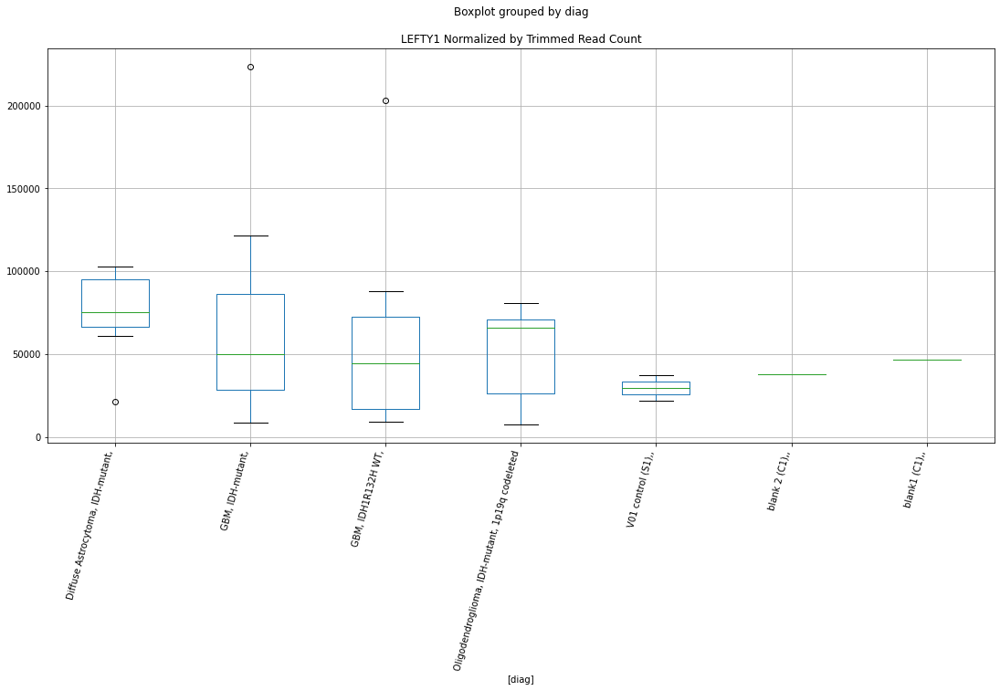

 p : 0.04732474108081645  ( t : 2.1289174341155275 ) :  Lexogen  :  bbduk2  :  LOC105371382
Control and blanks
79     0.0
343    0.0
Name: LOC105371382, dtype: float64
211    0.0
Name: LOC105371382, dtype: float64
475    0.0
Name: LOC105371382, dtype: float64


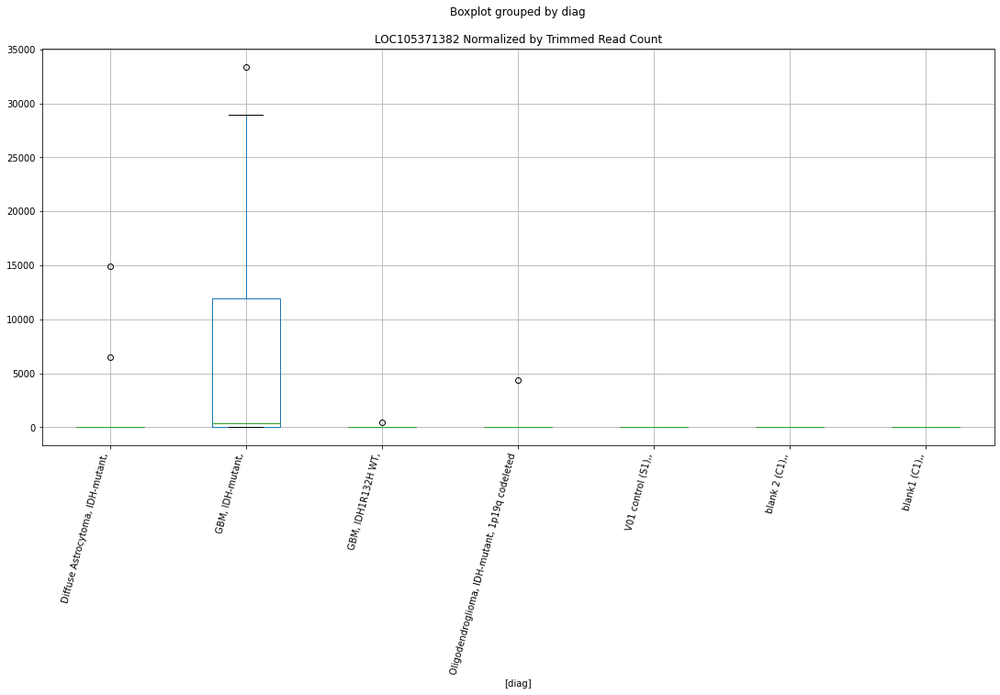

 p : 0.047352300508075415  ( t : 2.128621765383682 ) :  D-plex  :  bbduk2  :  LOC105370278
Control and blanks
73     57975.63
337        0.00
Name: LOC105370278, dtype: float64
205    0.0
Name: LOC105370278, dtype: float64
469    0.0
Name: LOC105370278, dtype: float64


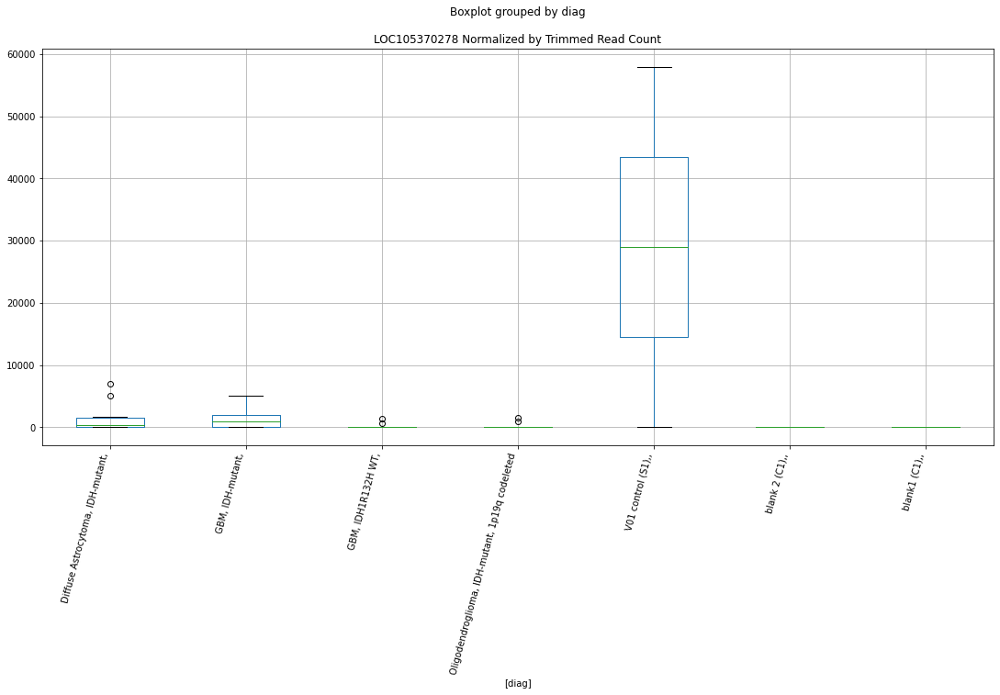

 p : 0.04744946650811631  ( t : 2.1275805791254694 ) :  D-plex  :  bbduk2  :  LINC02023
Control and blanks
73     0.0
337    0.0
Name: LINC02023, dtype: float64
205    0.0
Name: LINC02023, dtype: float64
469    0.0
Name: LINC02023, dtype: float64


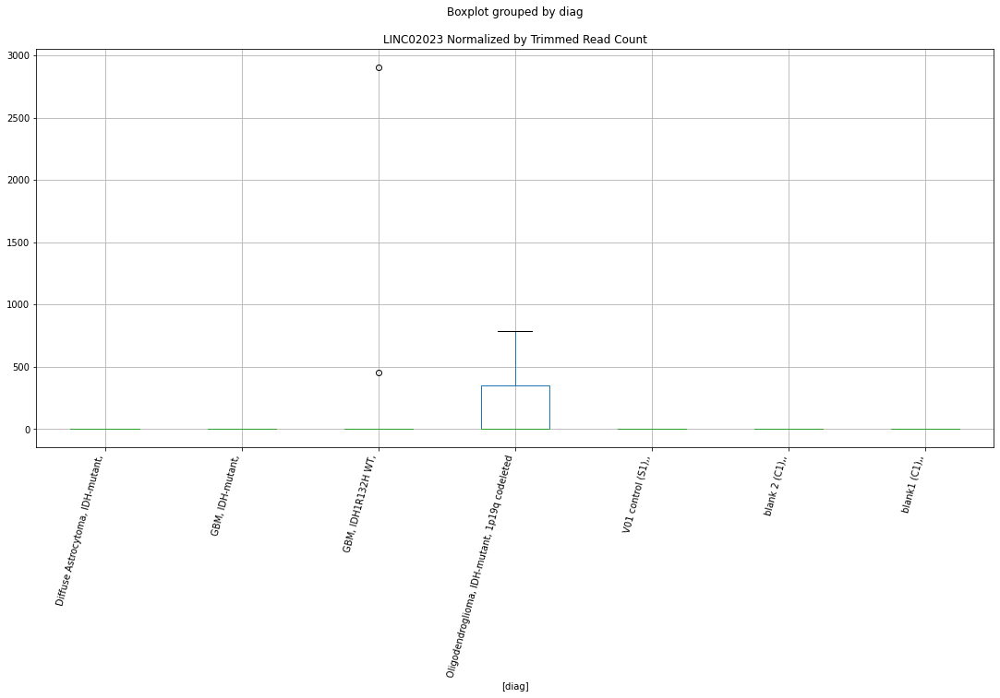

 p : 0.047522453267987  ( t : 2.126799764003063 ) :  D-plex  :  cutadapt2  :  LOC101929609
Control and blanks
76     124248.73
340      6165.12
Name: LOC101929609, dtype: float64
208    74247.65
Name: LOC101929609, dtype: float64
472    50282.16
Name: LOC101929609, dtype: float64


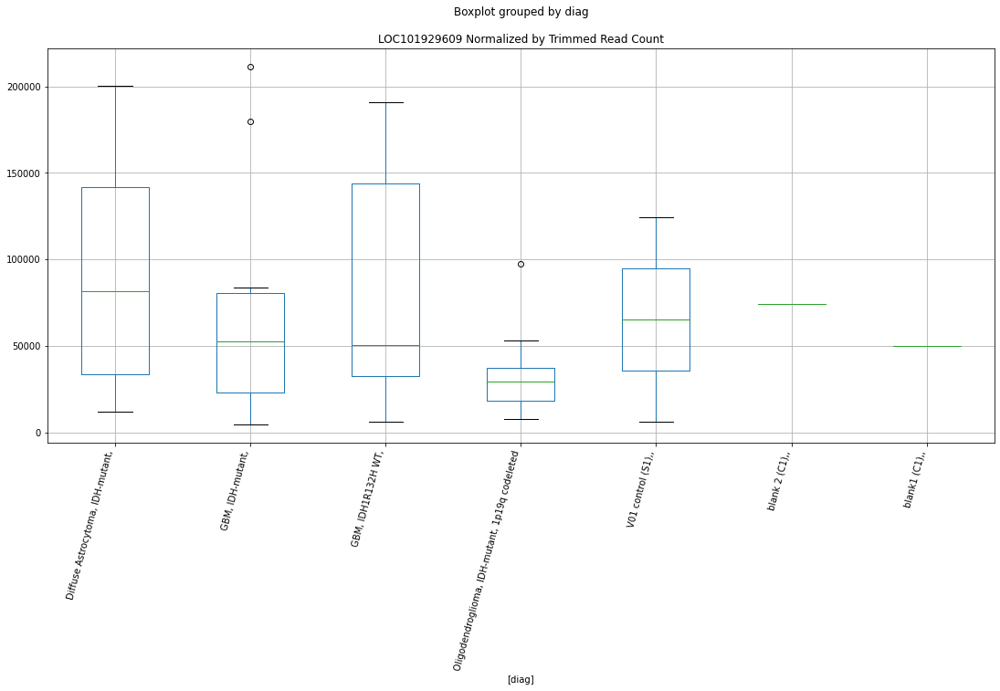

 p : 0.04752841210593238  ( t : 2.1267360644025577 ) :  D-plex  :  bbduk2  :  LOC101929185
Control and blanks
73     0.0
337    0.0
Name: LOC101929185, dtype: float64
205    1253.64
Name: LOC101929185, dtype: float64
469    1183.05
Name: LOC101929185, dtype: float64


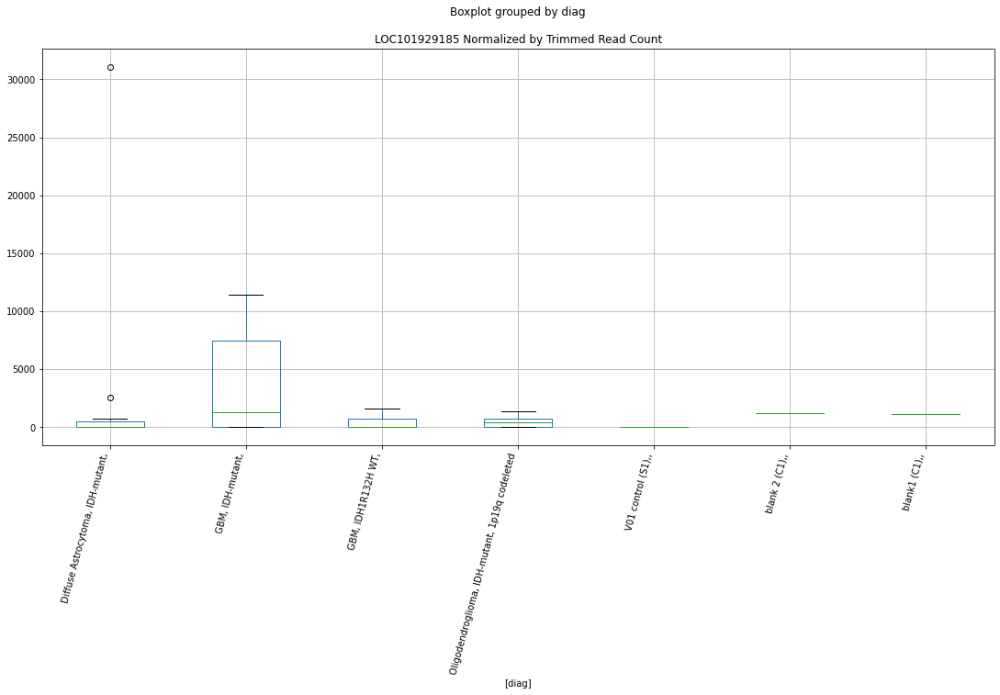

 p : 0.047535957545685625  ( t : 2.1266554145729253 ) :  D-plex  :  cutadapt2  :  LOC100233156
Control and blanks
76     0.0
340    0.0
Name: LOC100233156, dtype: float64
208    352.72
Name: LOC100233156, dtype: float64
472    2311.82
Name: LOC100233156, dtype: float64


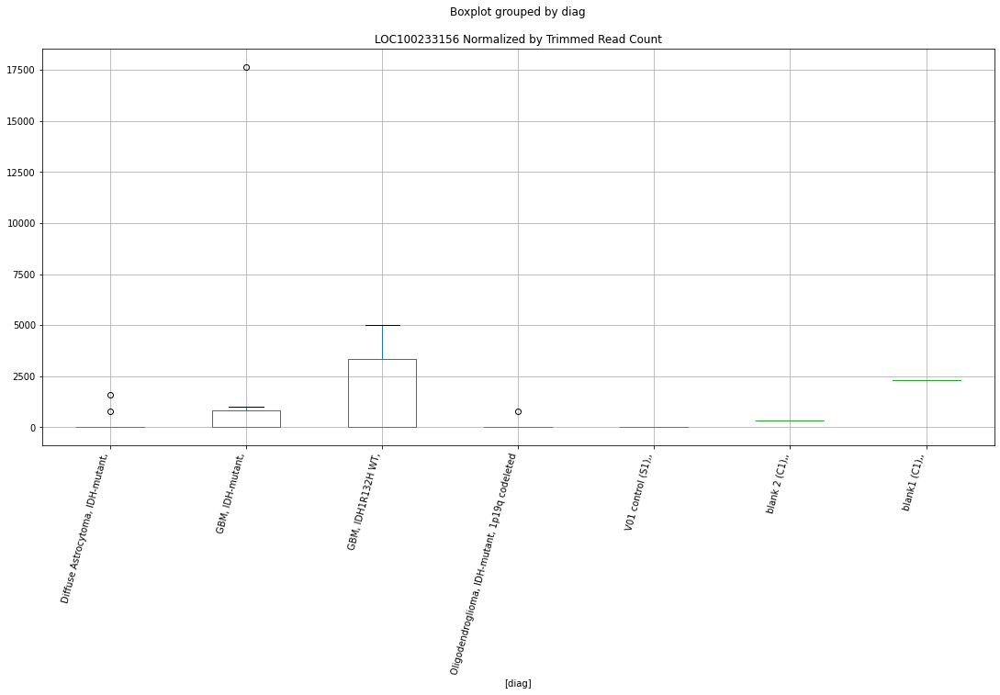

 p : 0.047562212926387265  ( t : 2.1263748734650263 ) :  D-plex  :  cutadapt2  :  LINC02142
Control and blanks
76     0.0
340    0.0
Name: LINC02142, dtype: float64
208    1058.16
Name: LINC02142, dtype: float64
472    0.0
Name: LINC02142, dtype: float64


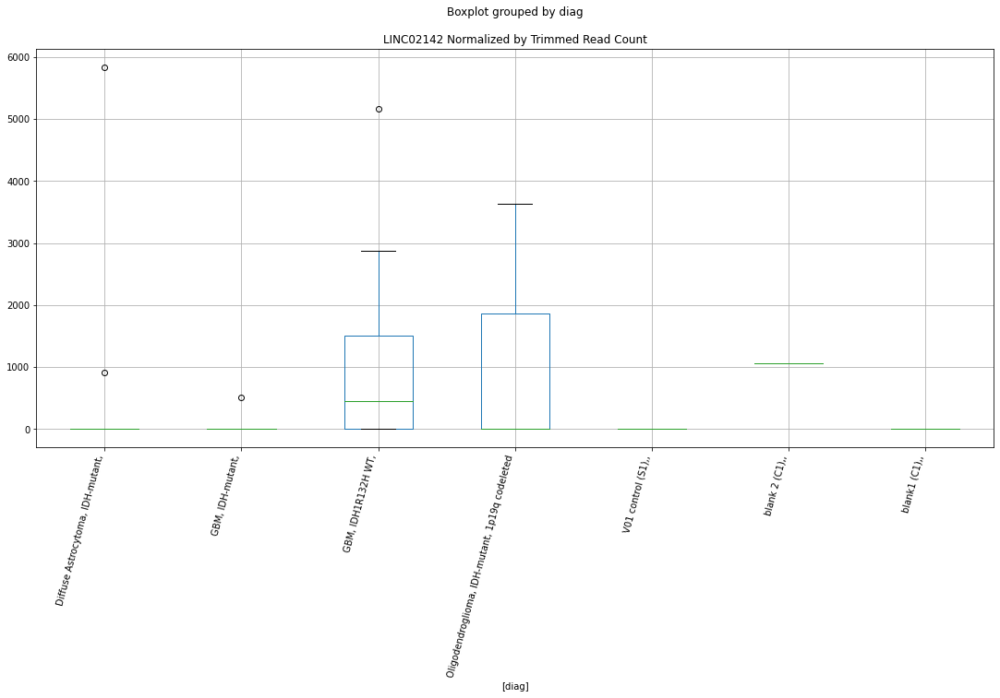

 p : 0.04758561670844478  ( t : 2.126124920907191 ) :  D-plex  :  cutadapt2  :  LEFTY2
Control and blanks
76     111369.29
340     66054.91
Name: LEFTY2, dtype: float64
208    112694.18
Name: LEFTY2, dtype: float64
472    140443.27
Name: LEFTY2, dtype: float64


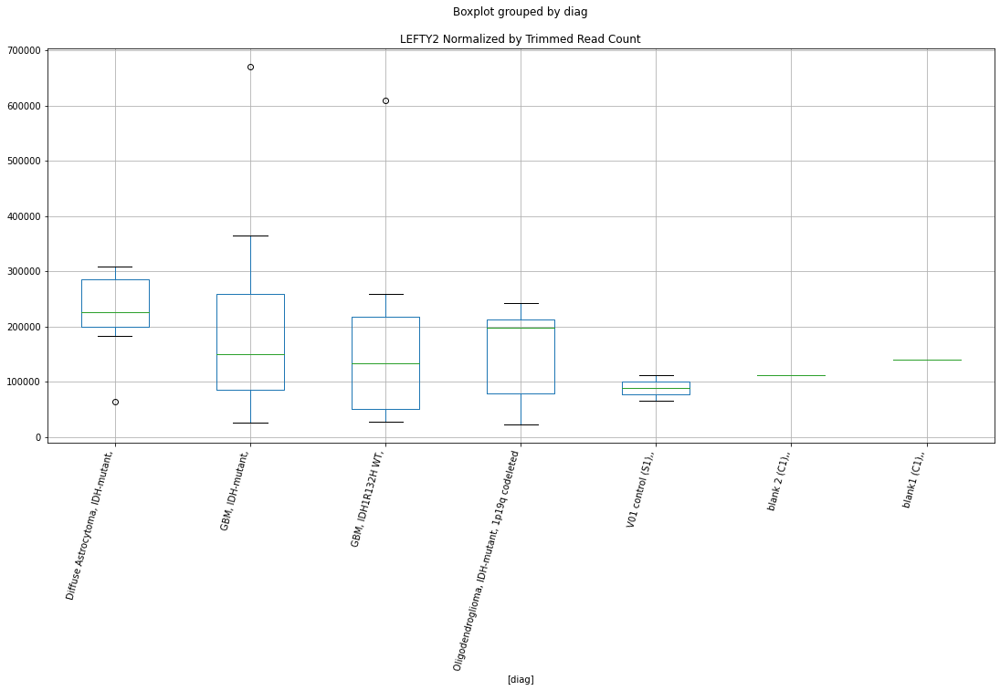

 p : 0.047683790742056045  ( t : 2.125077640773066 ) :  D-plex  :  bbduk2  :  LOC101927479
Control and blanks
73     0.0
337    0.0
Name: LOC101927479, dtype: float64
205    1253.64
Name: LOC101927479, dtype: float64
469    1774.58
Name: LOC101927479, dtype: float64


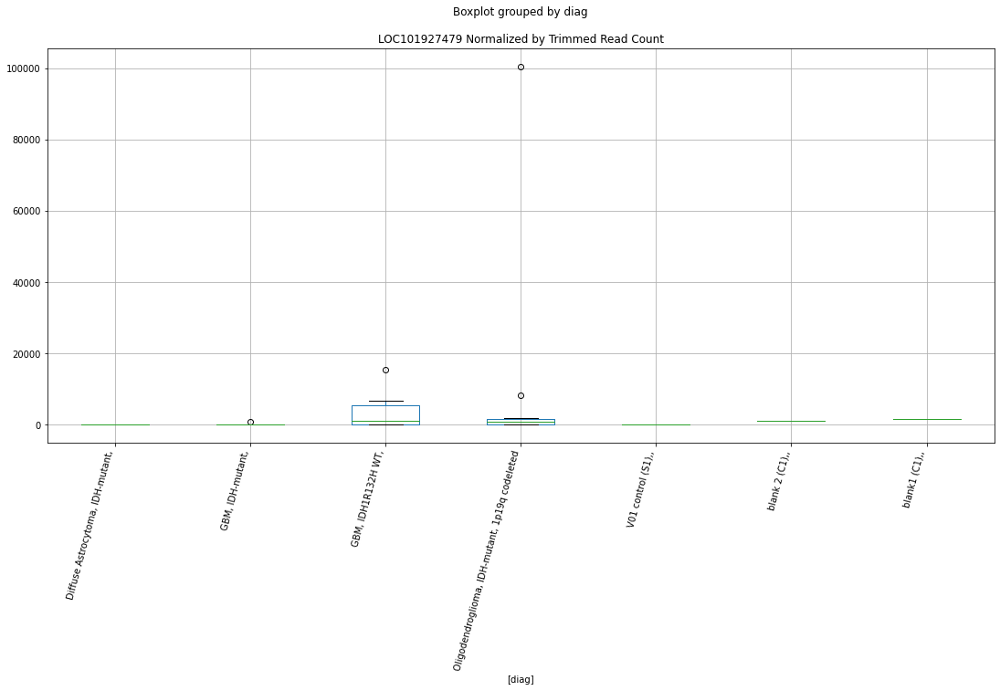

 p : 0.0477869399258711  ( t : 2.1239794025212135 ) :  D-plex  :  cutadapt2  :  LINC01529
Control and blanks
76       0.00
340    880.73
Name: LINC01529, dtype: float64
208    881.8
Name: LINC01529, dtype: float64
472    1155.91
Name: LINC01529, dtype: float64


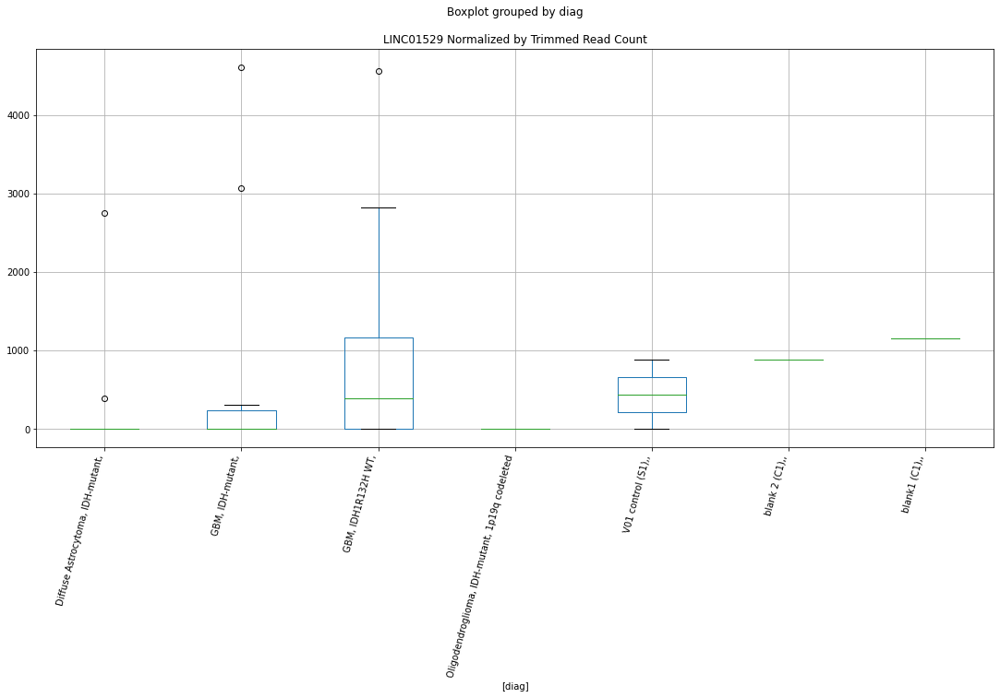

 p : 0.047813794037965436  ( t : 2.1236938388801145 ) :  D-plex  :  bbduk2  :  LINC02142
Control and blanks
73     0.0
337    0.0
Name: LINC02142, dtype: float64
205    358.18
Name: LINC02142, dtype: float64
469    0.0
Name: LINC02142, dtype: float64


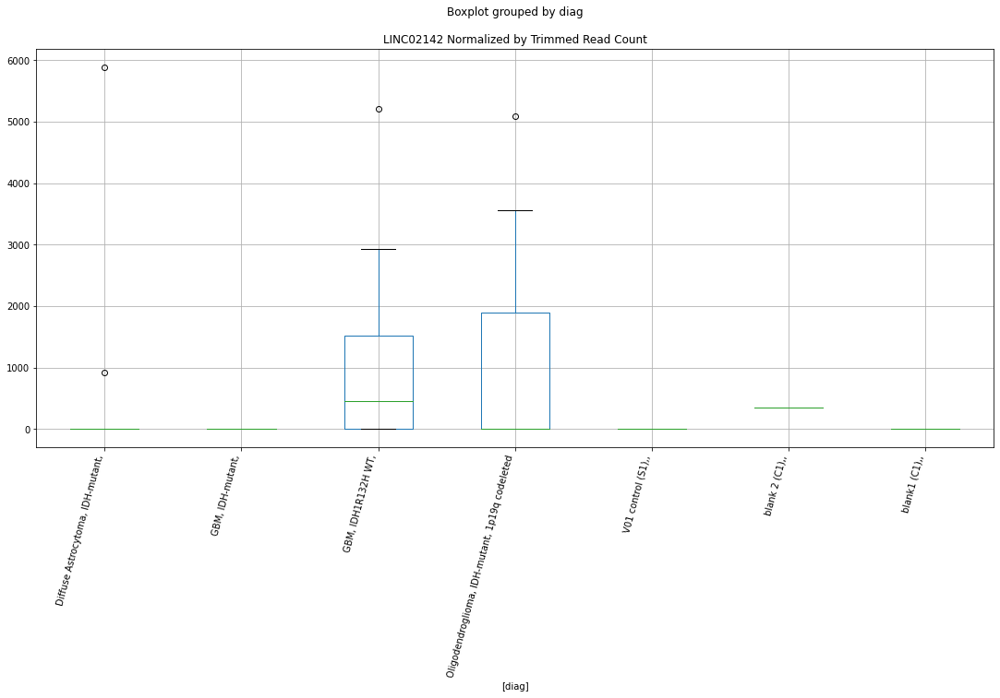

 p : 0.0478435037278299  ( t : 2.123378079566422 ) :  Lexogen  :  cutadapt2  :  LOC100507283
Control and blanks
82     0.0
346    0.0
Name: LOC100507283, dtype: float64
214    0.0
Name: LOC100507283, dtype: float64
478    8311.12
Name: LOC100507283, dtype: float64


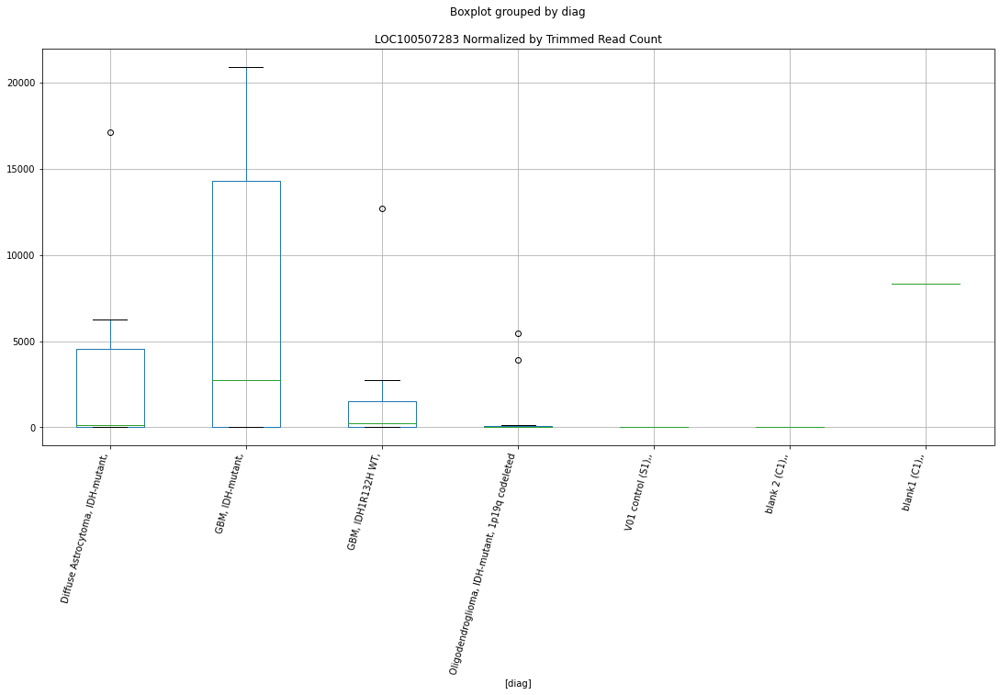

 p : 0.047944434856010944  ( t : 2.1223067002251628 ) :  D-plex  :  cutadapt2  :  LGR5
Control and blanks
76     34092.64
340     9688.05
Name: LGR5, dtype: float64
208    10757.97
Name: LGR5, dtype: float64
472    12715.03
Name: LGR5, dtype: float64


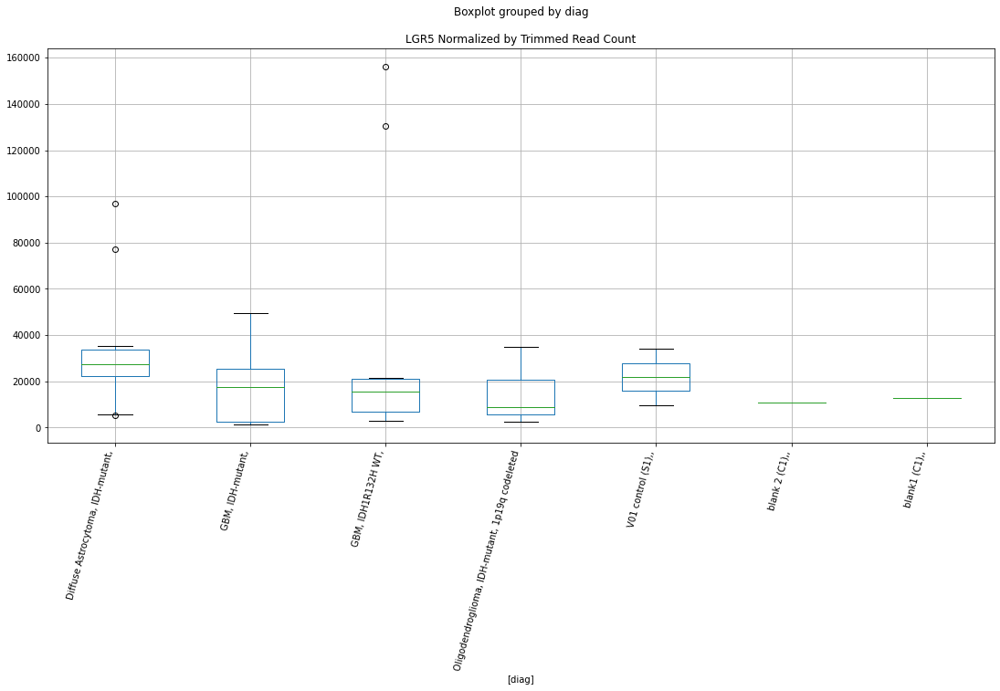

 p : 0.04807696518339985  ( t : 2.1209030129471653 ) :  D-plex  :  bbduk2  :  LOC101929248
Control and blanks
73     8503.09
337    8901.57
Name: LOC101929248, dtype: float64
205    9670.91
Name: LOC101929248, dtype: float64
469    5915.27
Name: LOC101929248, dtype: float64


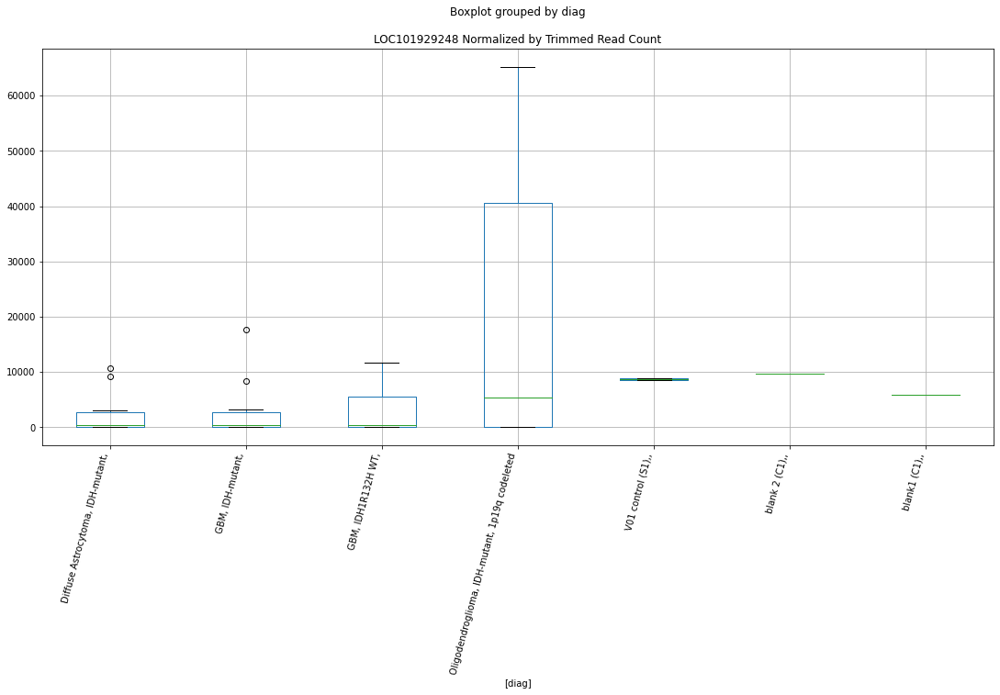

 p : 0.048088490115442674  ( t : 2.1207811139452835 ) :  D-plex  :  cutadapt2  :  LOC105370278
Control and blanks
76     63639.59
340        0.00
Name: LOC105370278, dtype: float64
208    529.08
Name: LOC105370278, dtype: float64
472    0.0
Name: LOC105370278, dtype: float64


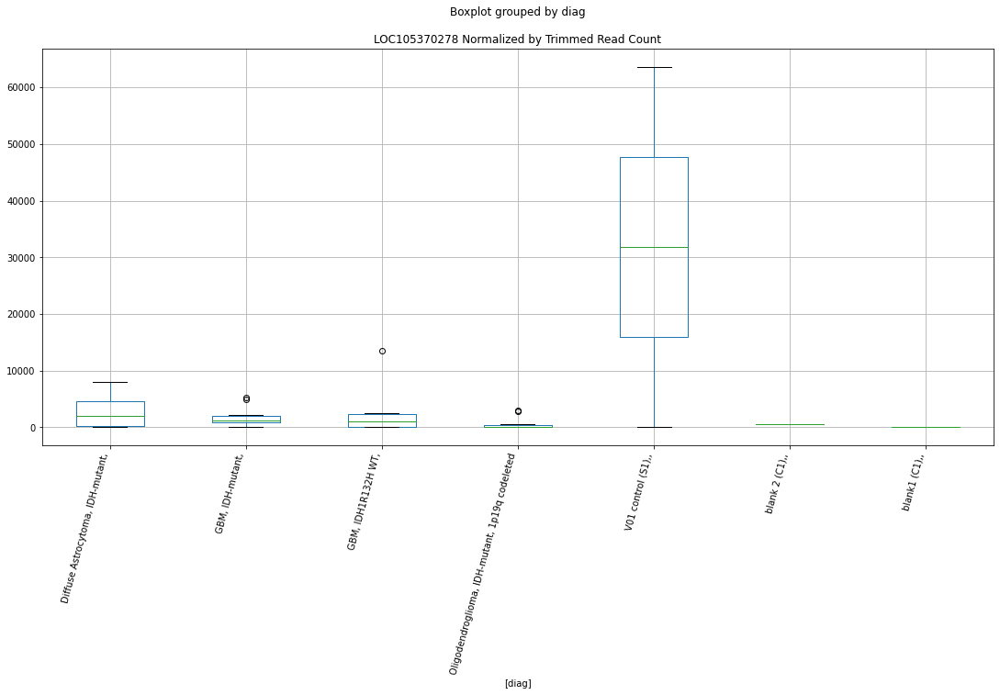

 p : 0.048195502642353734  ( t : 2.11965051326938 ) :  D-plex  :  bbduk2  :  LINC02317
Control and blanks
73     0.0
337    0.0
Name: LINC02317, dtype: float64
205    179.09
Name: LINC02317, dtype: float64
469    0.0
Name: LINC02317, dtype: float64


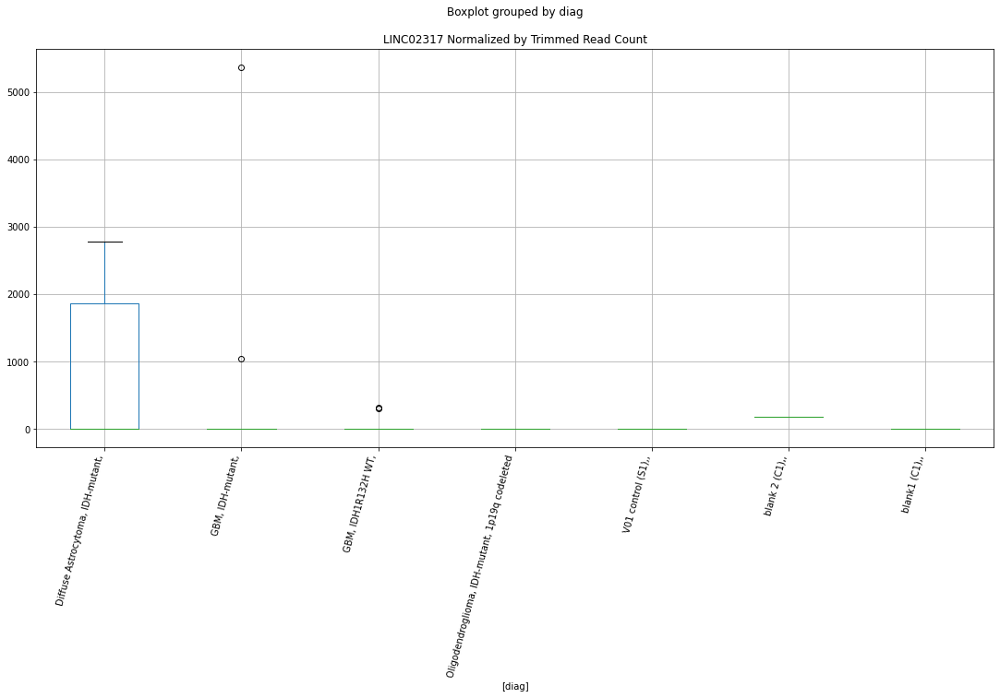

 p : 0.048518842170807264  ( t : 2.116248227278408 ) :  D-plex  :  cutadapt2  :  LMCD1
Control and blanks
76     11364.21
340        0.00
Name: LMCD1, dtype: float64
208    1939.96
Name: LMCD1, dtype: float64
472    1733.87
Name: LMCD1, dtype: float64


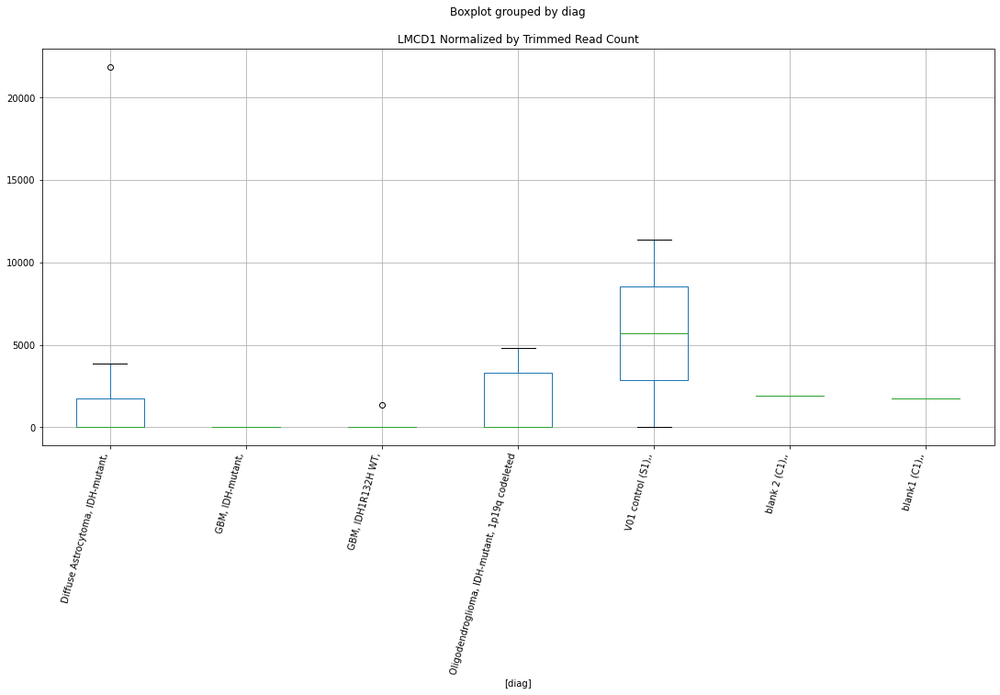

 p : 0.04862512470973316  ( t : 2.1151343945297216 ) :  D-plex  :  bbduk2  :  LOC105370409
Control and blanks
73     0.0
337    0.0
Name: LOC105370409, dtype: float64
205    2149.09
Name: LOC105370409, dtype: float64
469    0.0
Name: LOC105370409, dtype: float64


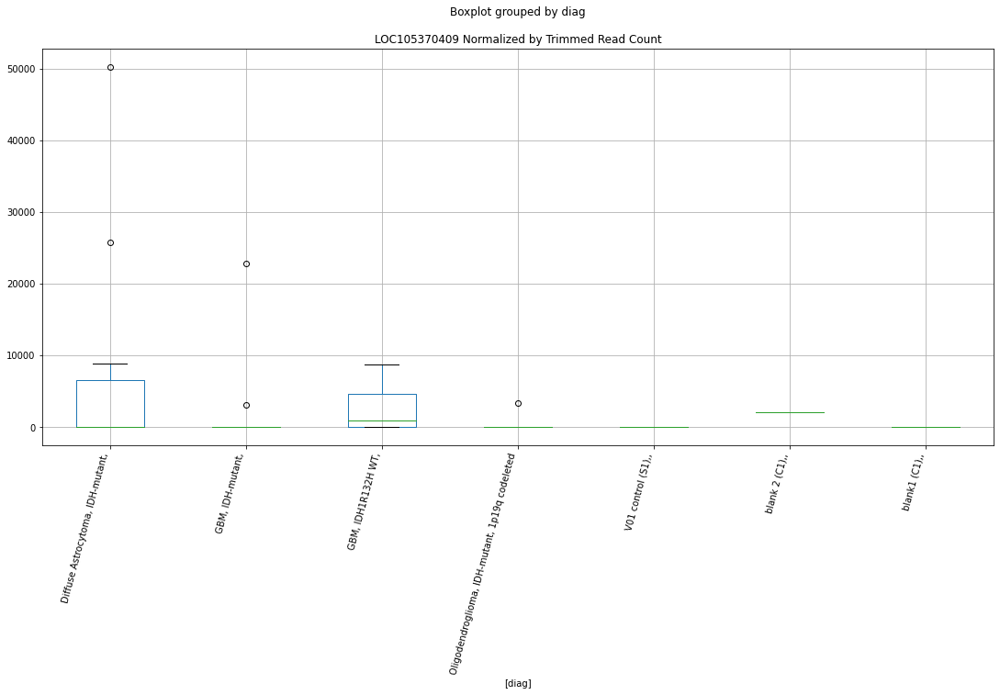

 p : 0.048728144763493186  ( t : 2.1140568656314382 ) :  D-plex  :  bbduk2  :  LOC101927454
Control and blanks
73      773.01
337    4450.79
Name: LOC101927454, dtype: float64
205    2507.27
Name: LOC101927454, dtype: float64
469    10647.49
Name: LOC101927454, dtype: float64


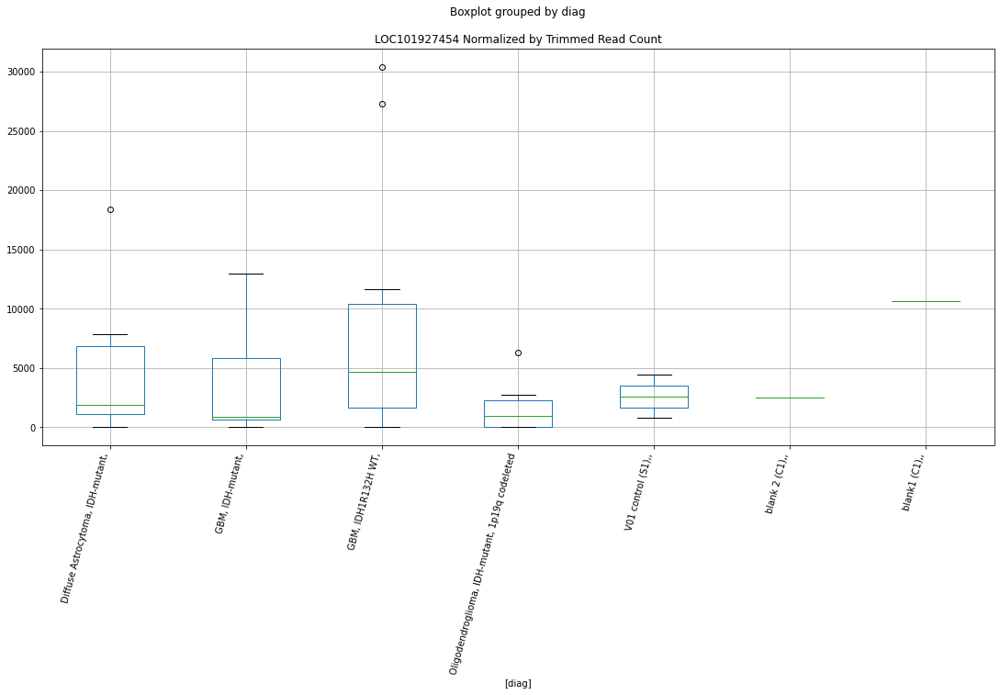

 p : 0.0487571106127599  ( t : 2.113754273448971 ) :  Lexogen  :  cutadapt2  :  LOC101928352
Control and blanks
82     0.0
346    0.0
Name: LOC101928352, dtype: float64
214    0.0
Name: LOC101928352, dtype: float64
478    0.0
Name: LOC101928352, dtype: float64


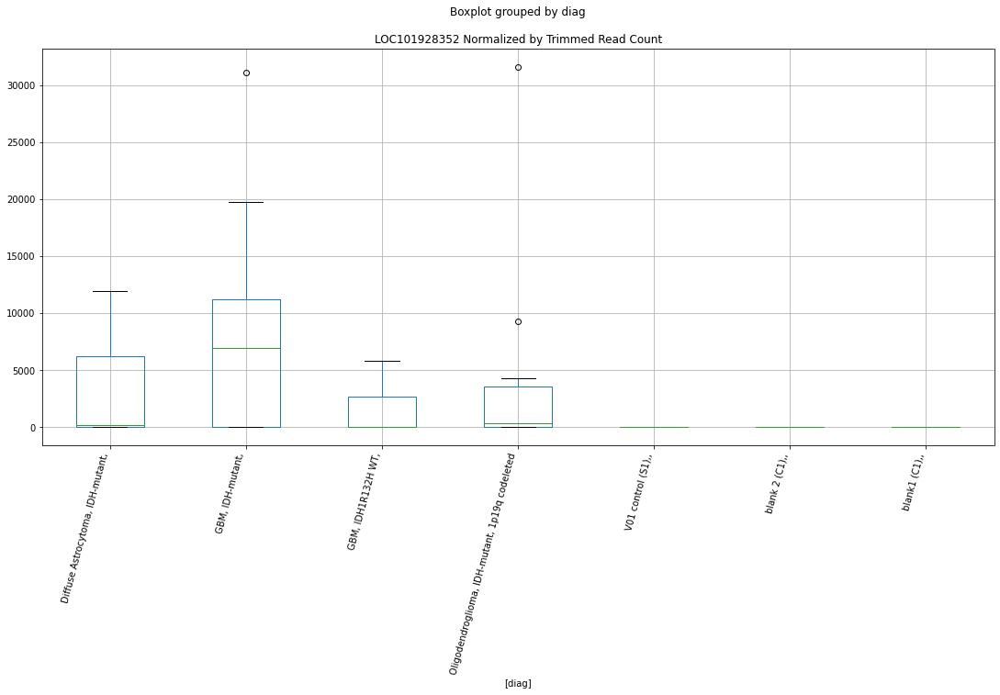

 p : 0.04876279268144193  ( t : 2.113694934829928 ) :  D-plex  :  cutadapt2  :  LOC101926907
Control and blanks
76     757.61
340      0.00
Name: LOC101926907, dtype: float64
208    176.36
Name: LOC101926907, dtype: float64
472    577.96
Name: LOC101926907, dtype: float64


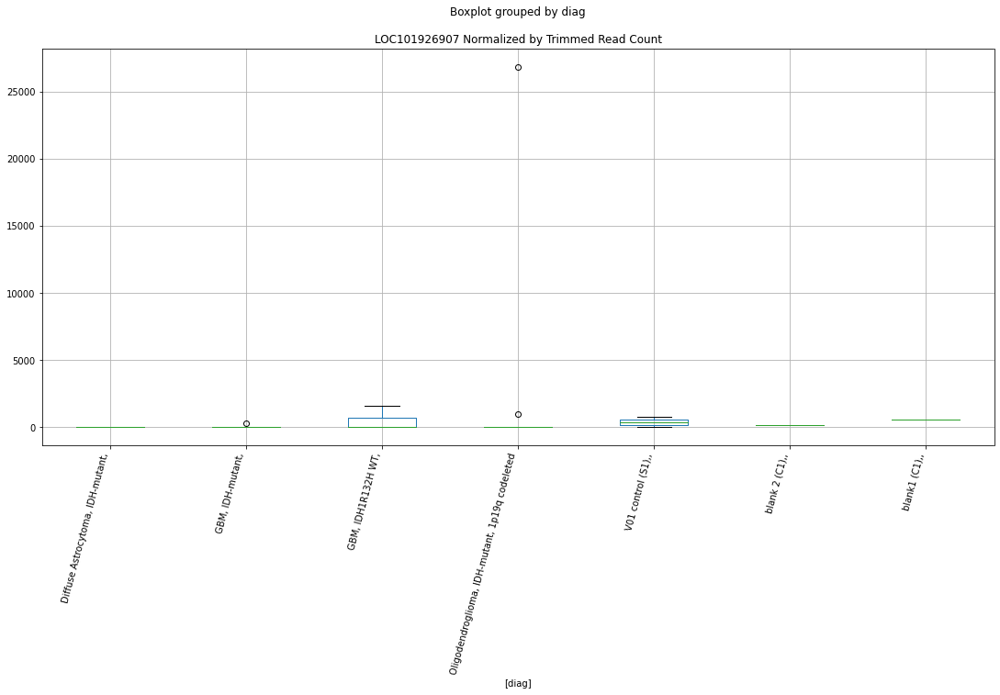

 p : 0.04877967906235985  ( t : 2.1135186251845037 ) :  Lexogen  :  cutadapt2  :  LOC105371382
Control and blanks
82     0.0
346    0.0
Name: LOC105371382, dtype: float64
214    0.0
Name: LOC105371382, dtype: float64
478    0.0
Name: LOC105371382, dtype: float64


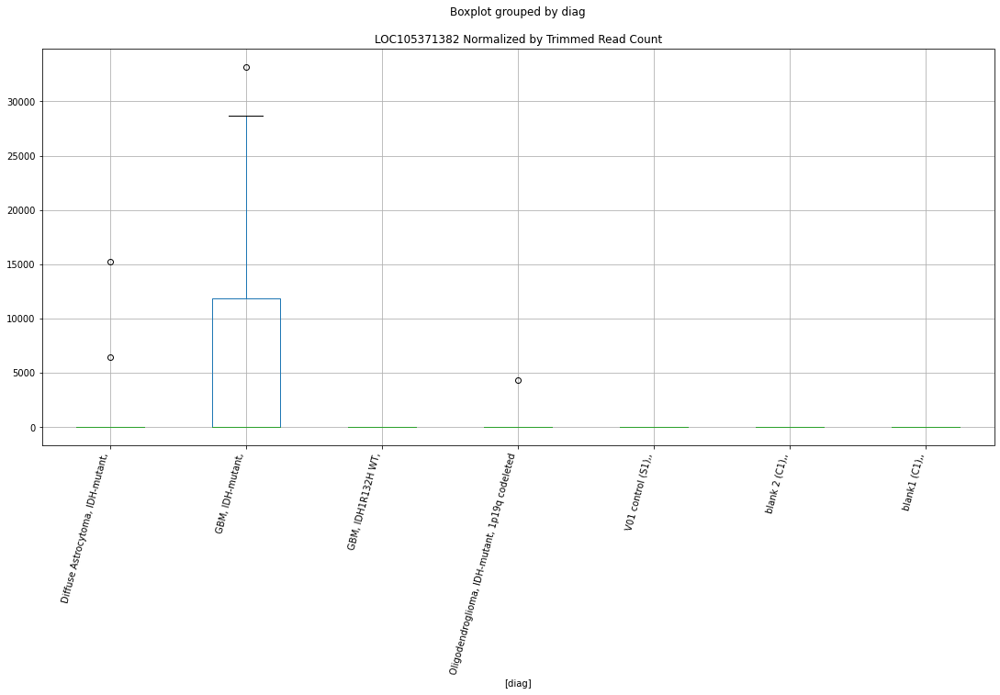

 p : 0.04883654793589355  ( t : 2.112925269121801 ) :  Lexogen  :  bbduk2  :  LOC101928352
Control and blanks
79     0.0
343    0.0
Name: LOC101928352, dtype: float64
211    0.0
Name: LOC101928352, dtype: float64
475    0.0
Name: LOC101928352, dtype: float64


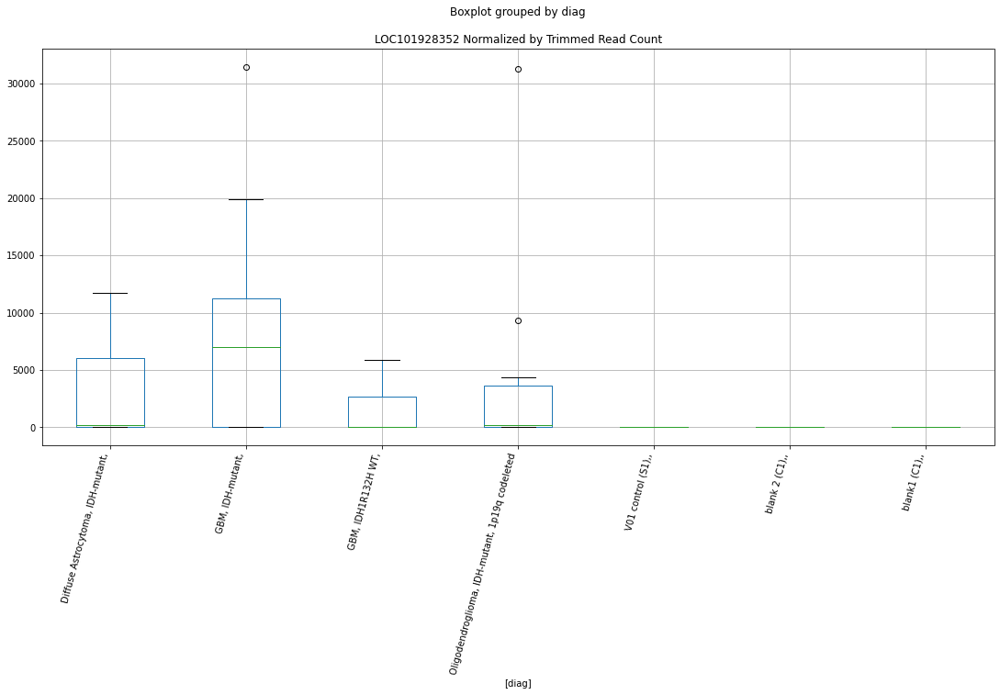

 p : 0.04892928034887389  ( t : 2.111959068952412 ) :  D-plex  :  bbduk2  :  LINC01529
Control and blanks
73       0.00
337    890.16
Name: LINC01529, dtype: float64
205    895.45
Name: LINC01529, dtype: float64
469    1183.05
Name: LINC01529, dtype: float64


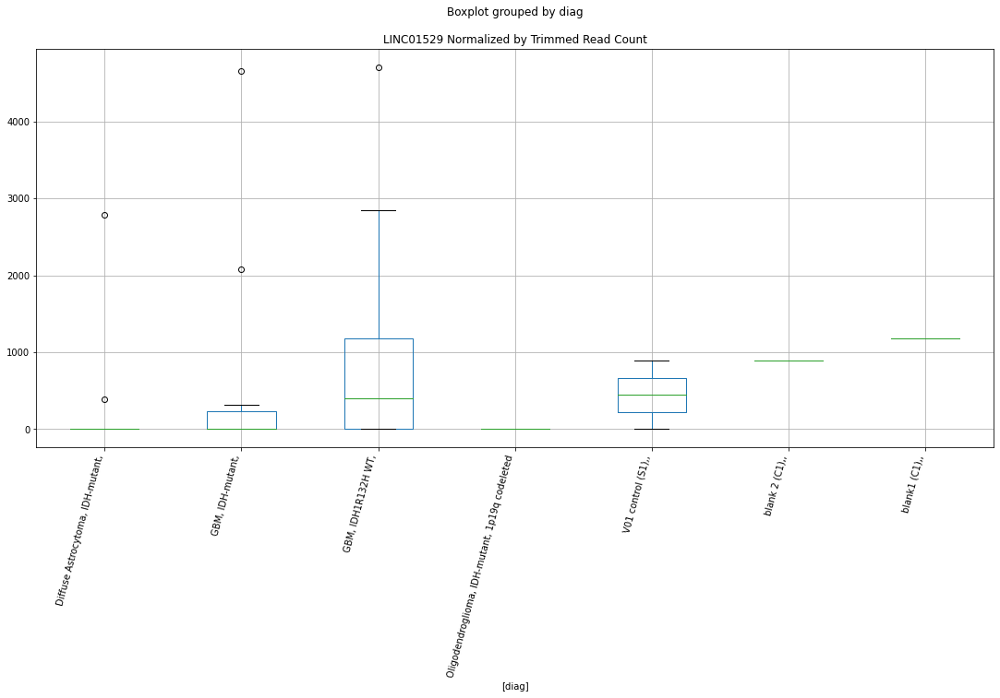

 p : 0.048950694816935  ( t : 2.1117361835881696 ) :  D-plex  :  bbduk2  :  LOC101927605
Control and blanks
73     0.0
337    0.0
Name: LOC101927605, dtype: float64
205    179.09
Name: LOC101927605, dtype: float64
469    0.0
Name: LOC101927605, dtype: float64


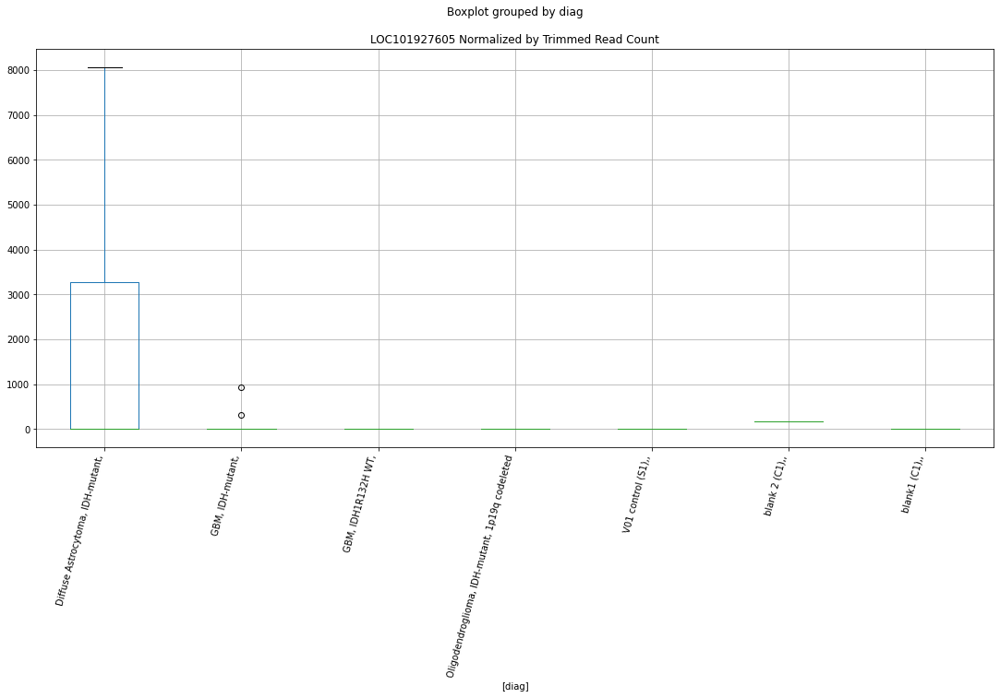

 p : 0.04896590030465474  ( t : 2.1115779761929923 ) :  D-plex  :  cutadapt2  :  LOC101930434
Control and blanks
76     0.0
340    0.0
Name: LOC101930434, dtype: float64
208    1410.88
Name: LOC101930434, dtype: float64
472    0.0
Name: LOC101930434, dtype: float64


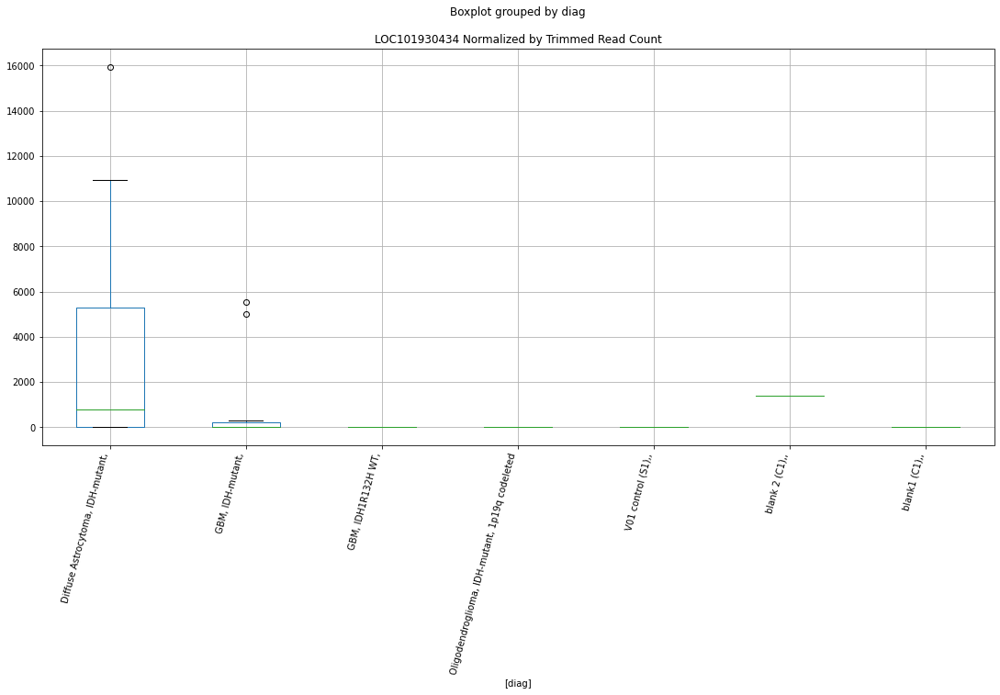

 p : 0.04900947057901735  ( t : 2.11112489129074 ) :  D-plex  :  bbduk2  :  LINC00547
Control and blanks
73     0.0
337    0.0
Name: LINC00547, dtype: float64
205    358.18
Name: LINC00547, dtype: float64
469    591.53
Name: LINC00547, dtype: float64


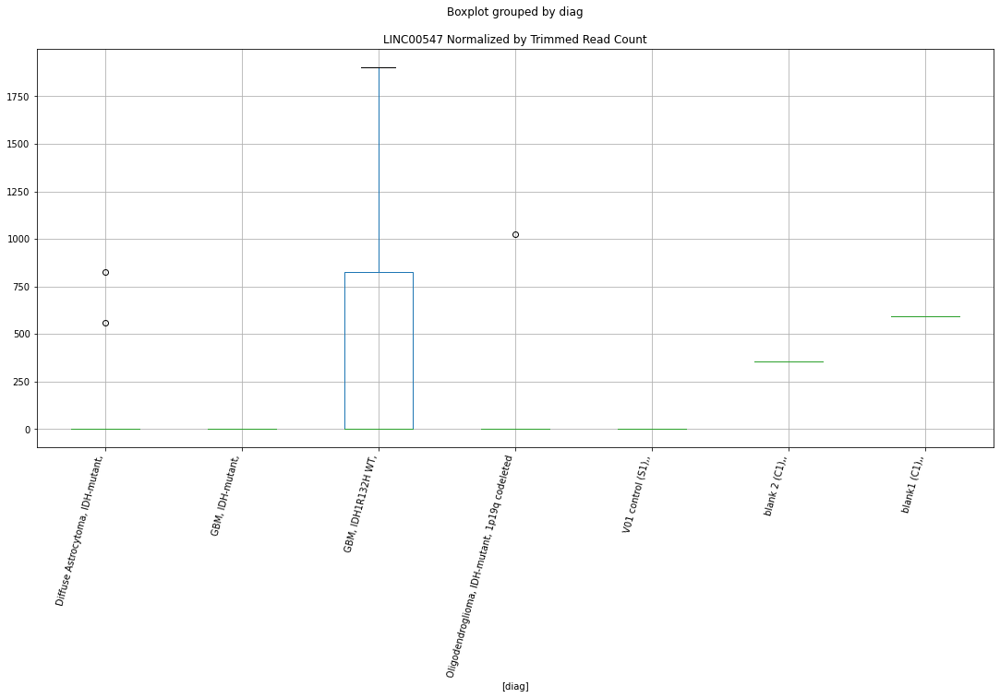

 p : 0.04914428633908034  ( t : 2.1097252674360627 ) :  Lexogen  :  bbduk2  :  LOC100507283
Control and blanks
79     0.0
343    0.0
Name: LOC100507283, dtype: float64
211    0.0
Name: LOC100507283, dtype: float64
475    8383.05
Name: LOC100507283, dtype: float64


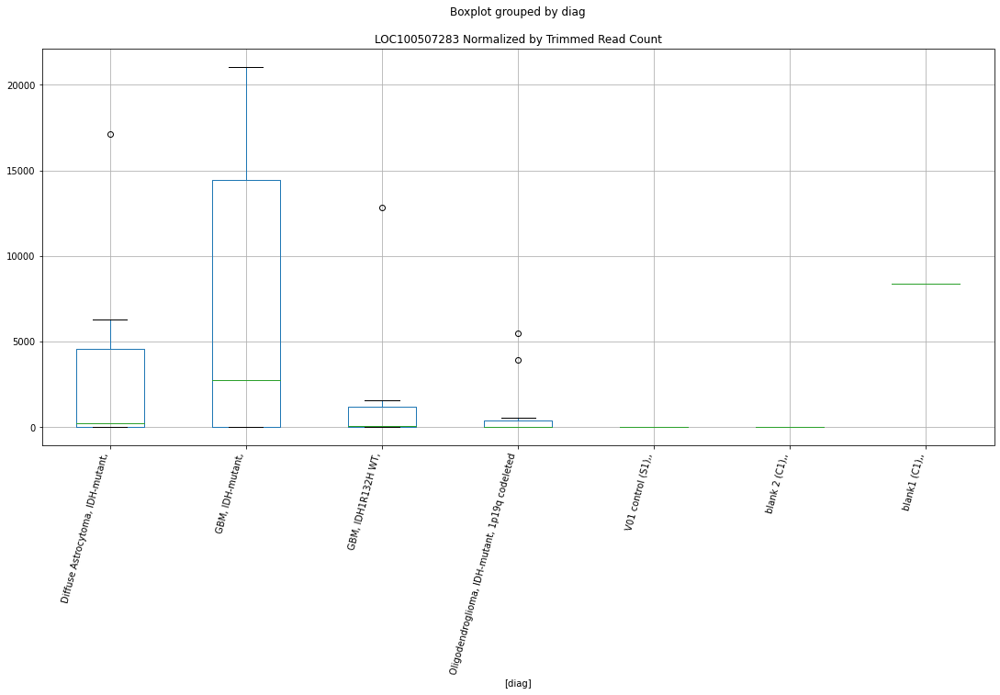

 p : 0.04920218309396645  ( t : 2.1091252696233385 ) :  D-plex  :  cutadapt2  :  LOC101929185
Control and blanks
76     0.0
340    0.0
Name: LOC101929185, dtype: float64
208    1234.52
Name: LOC101929185, dtype: float64
472    1155.91
Name: LOC101929185, dtype: float64


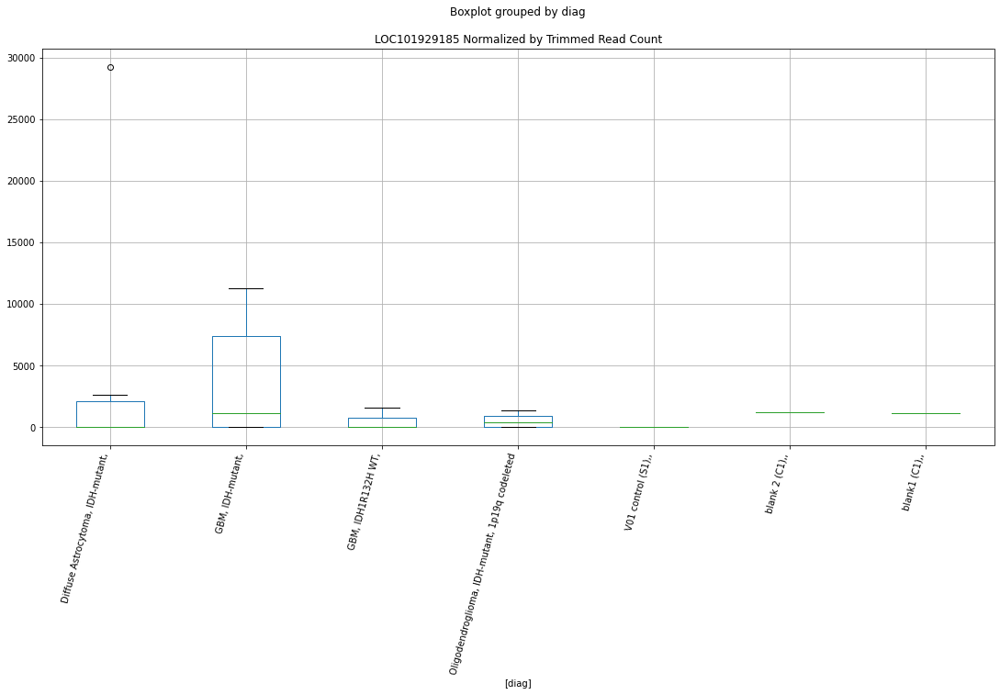

 p : 0.04927219735605638  ( t : 2.1084005526220273 ) :  D-plex  :  cutadapt2  :  LINC02691
Control and blanks
76     0.0
340    0.0
Name: LINC02691, dtype: float64
208    0.0
Name: LINC02691, dtype: float64
472    2311.82
Name: LINC02691, dtype: float64


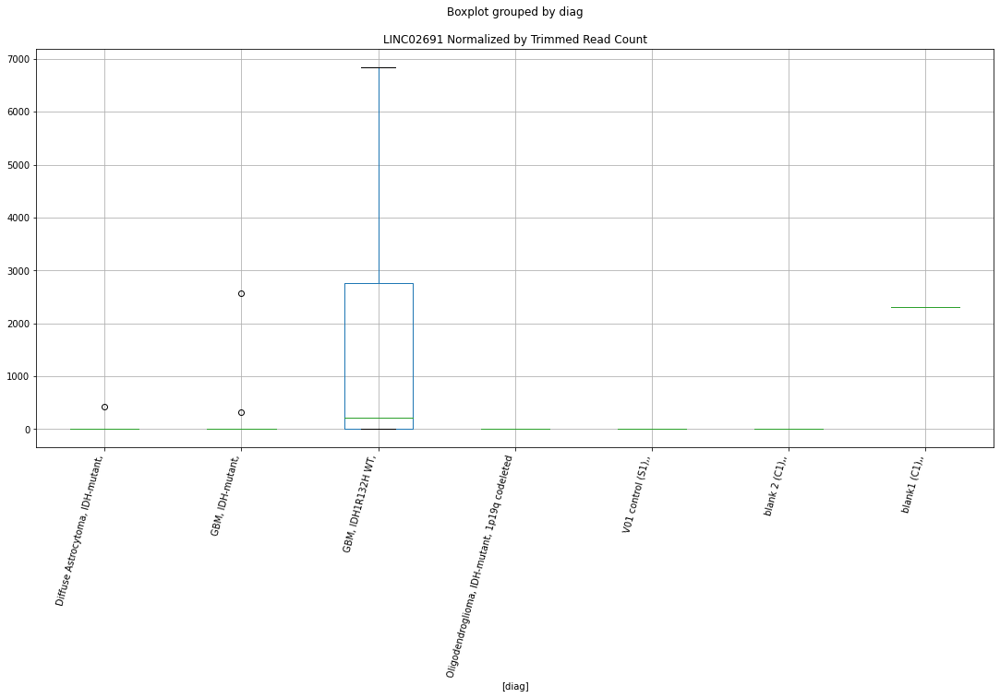

 p : 0.04948884578848228  ( t : 2.1061639454496635 ) :  D-plex  :  cutadapt2  :  LOC105370461
Control and blanks
76     12121.83
340     3522.93
Name: LOC105370461, dtype: float64
208    7936.21
Name: LOC105370461, dtype: float64
472    30053.7
Name: LOC105370461, dtype: float64


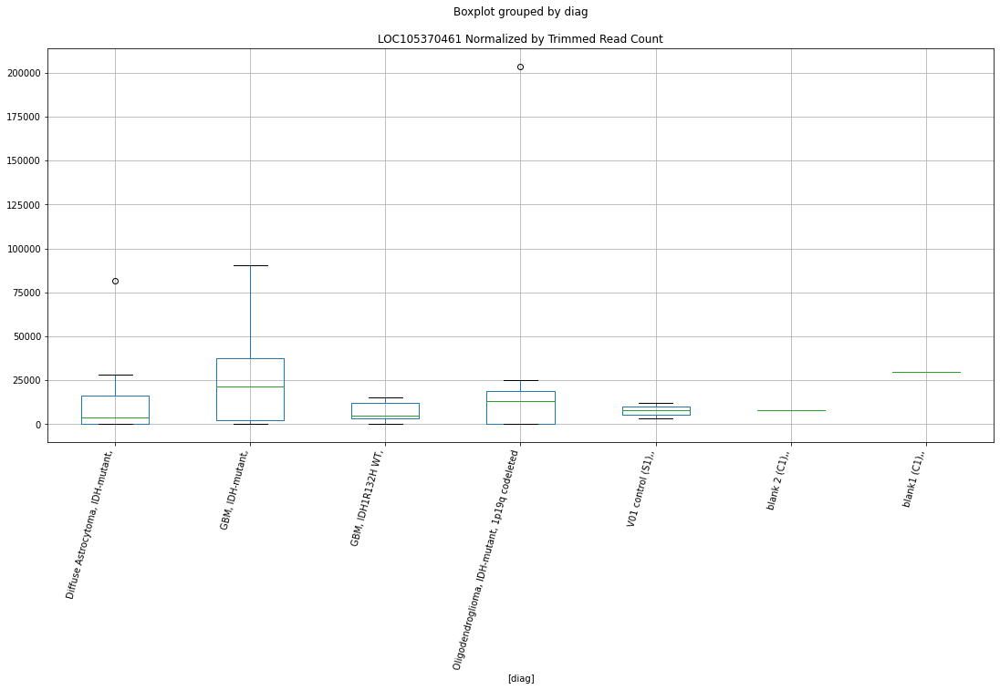

 p : 0.049601295288608085  ( t : 2.1050065620517673 ) :  D-plex  :  bbduk2  :  LINC02509
Control and blanks
73     773.01
337    890.16
Name: LINC02509, dtype: float64
205    2686.36
Name: LINC02509, dtype: float64
469    1183.05
Name: LINC02509, dtype: float64


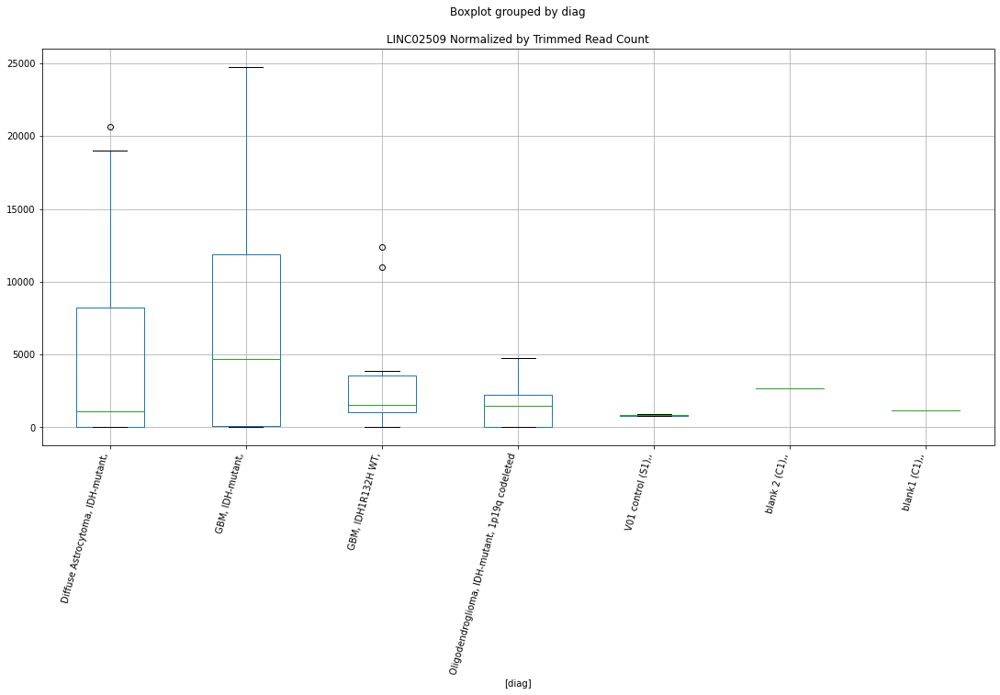

 p : 0.04960373446416924  ( t : 2.1049814833539684 ) :  D-plex  :  bbduk2  :  LOC101928929
Control and blanks
73     0.0
337    0.0
Name: LOC101928929, dtype: float64
205    1432.73
Name: LOC101928929, dtype: float64
469    1183.05
Name: LOC101928929, dtype: float64


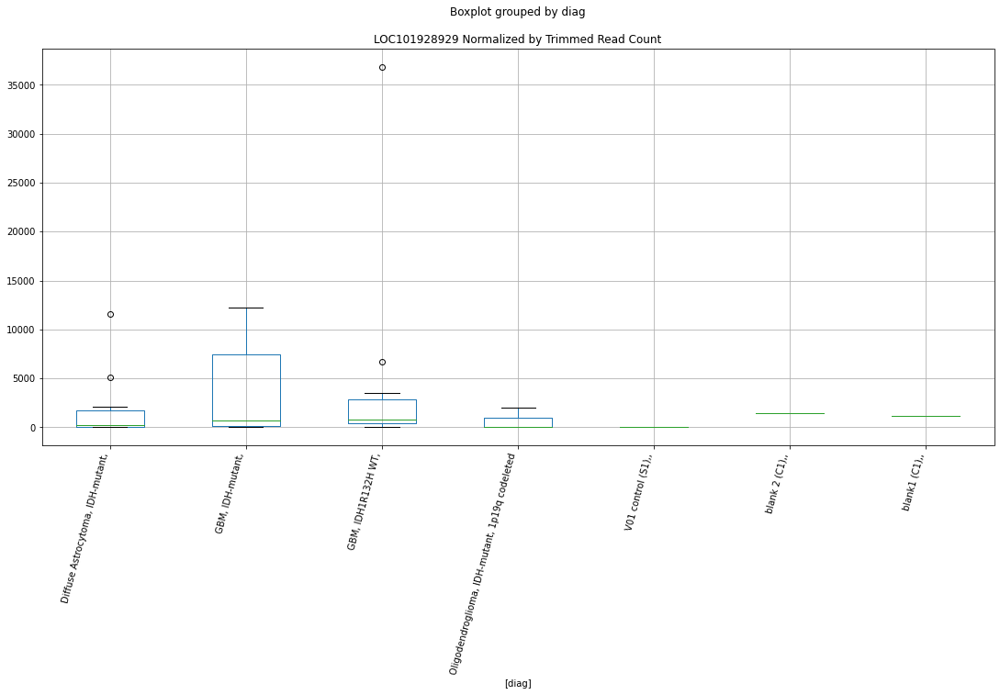

 p : 0.04965827279199858  ( t : 2.104421033150667 ) :  D-plex  :  cutadapt2  :  LOC105369293
Control and blanks
76     0.0
340    0.0
Name: LOC105369293, dtype: float64
208    352.72
Name: LOC105369293, dtype: float64
472    577.96
Name: LOC105369293, dtype: float64


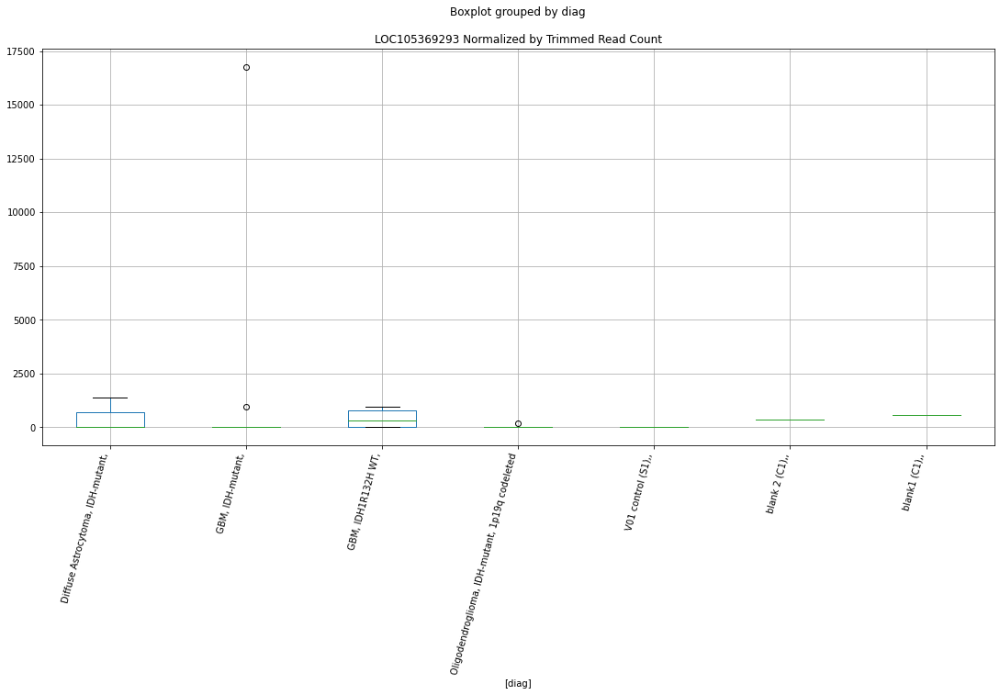

 p : 0.04987180118449753  ( t : 2.1022321305359837 ) :  D-plex  :  cutadapt2  :  LIM2
Control and blanks
76     0.0
340    0.0
Name: LIM2, dtype: float64
208    1058.16
Name: LIM2, dtype: float64
472    1155.91
Name: LIM2, dtype: float64


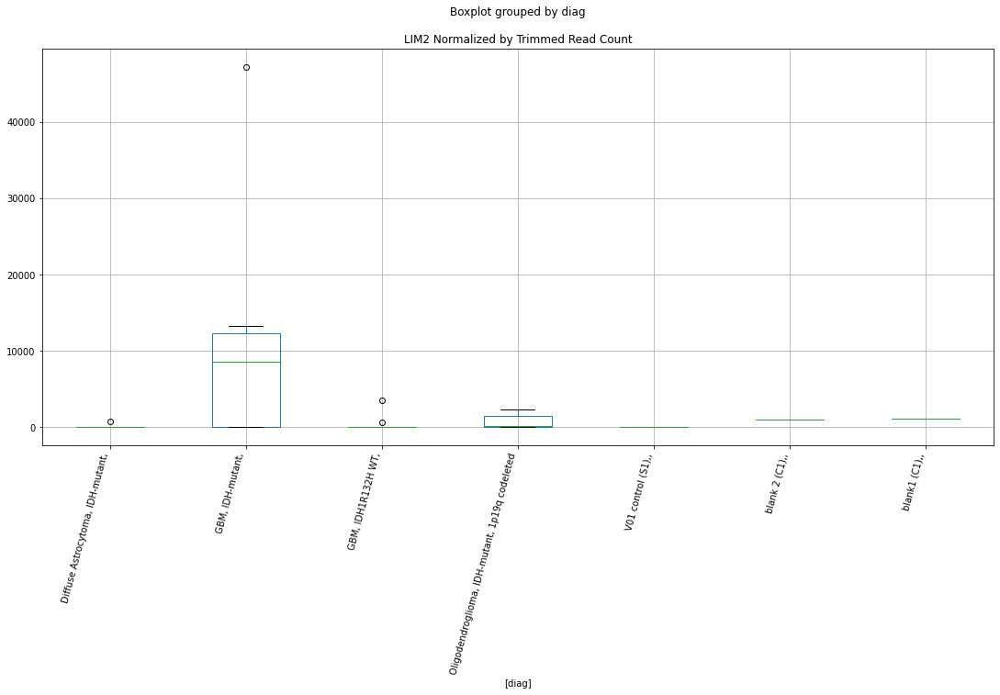

 p : 0.049903746616743745  ( t : 2.1019053874204263 ) :  Lexogen  :  bbduk2  :  LINC02596
Control and blanks
79       0.00
343    636.94
Name: LINC02596, dtype: float64
211    0.0
Name: LINC02596, dtype: float64
475    239.52
Name: LINC02596, dtype: float64


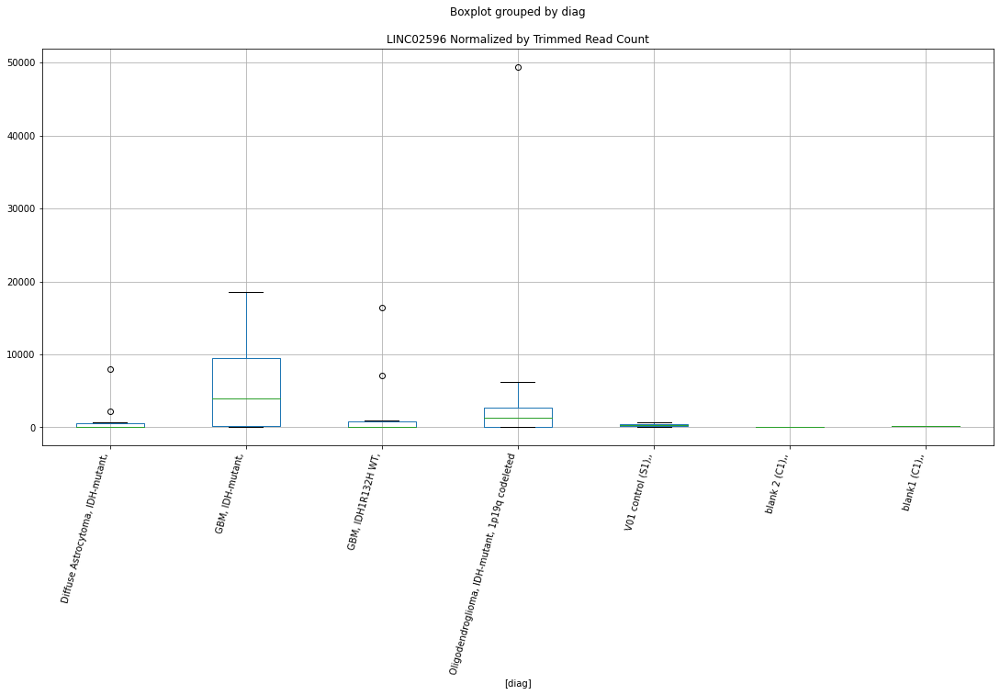

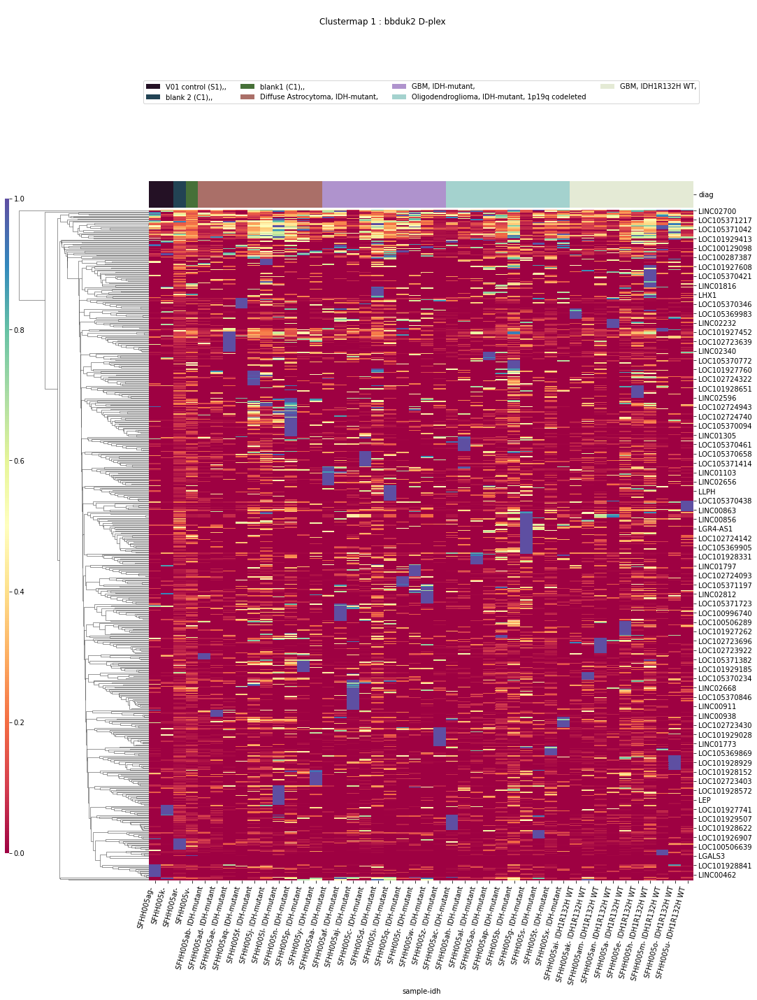

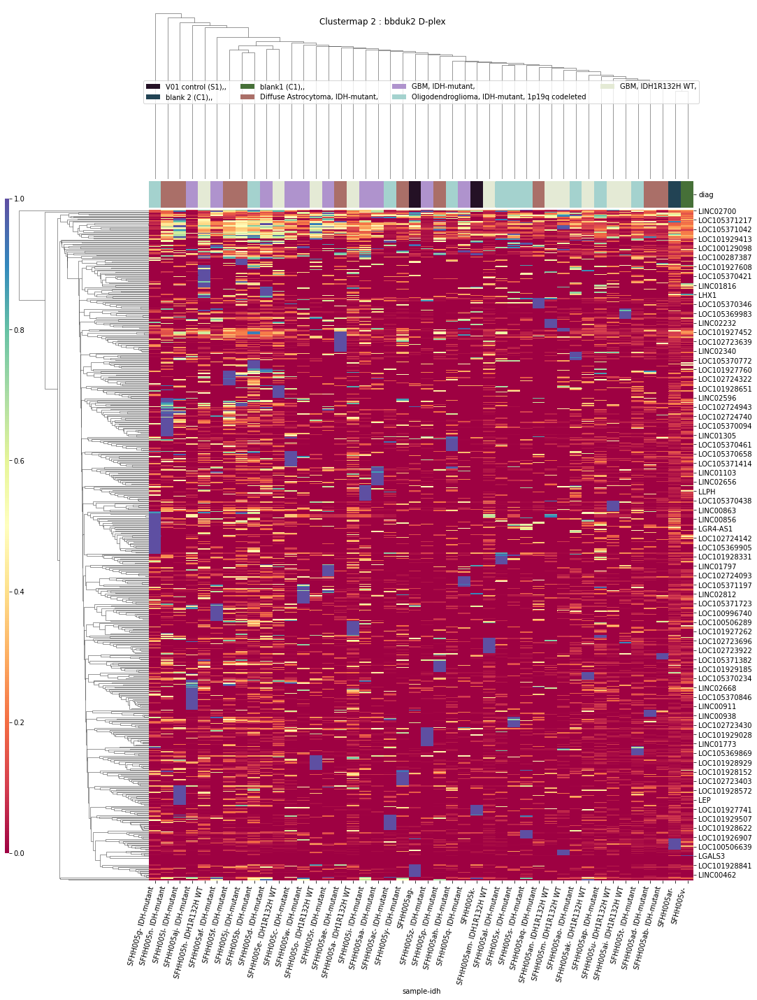

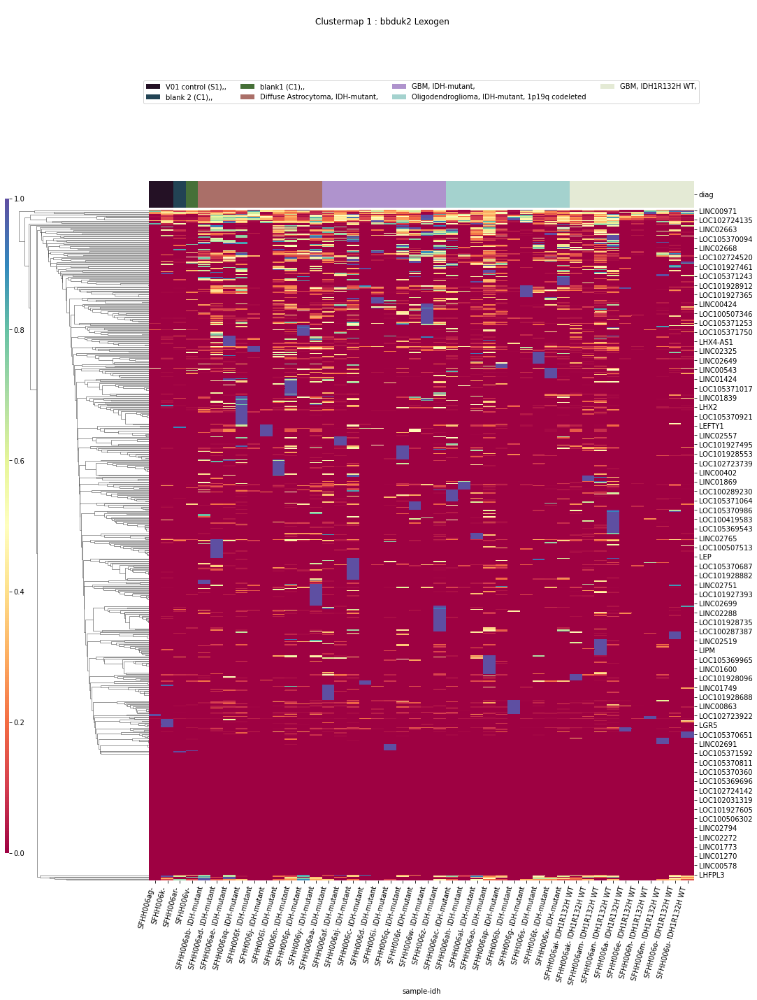

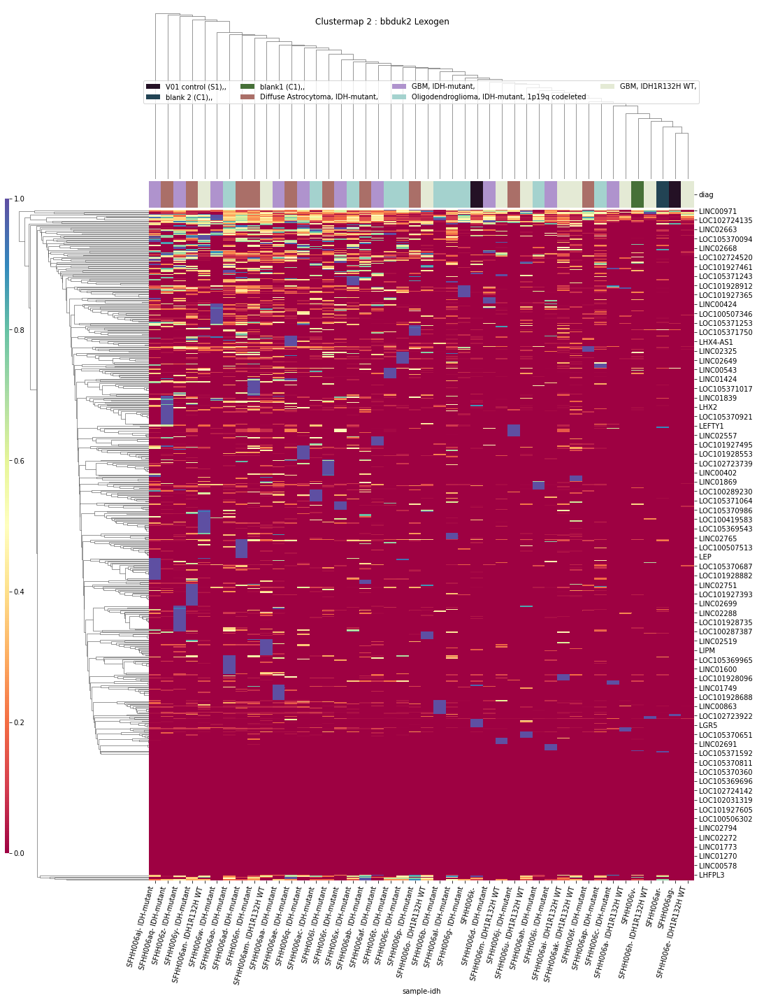

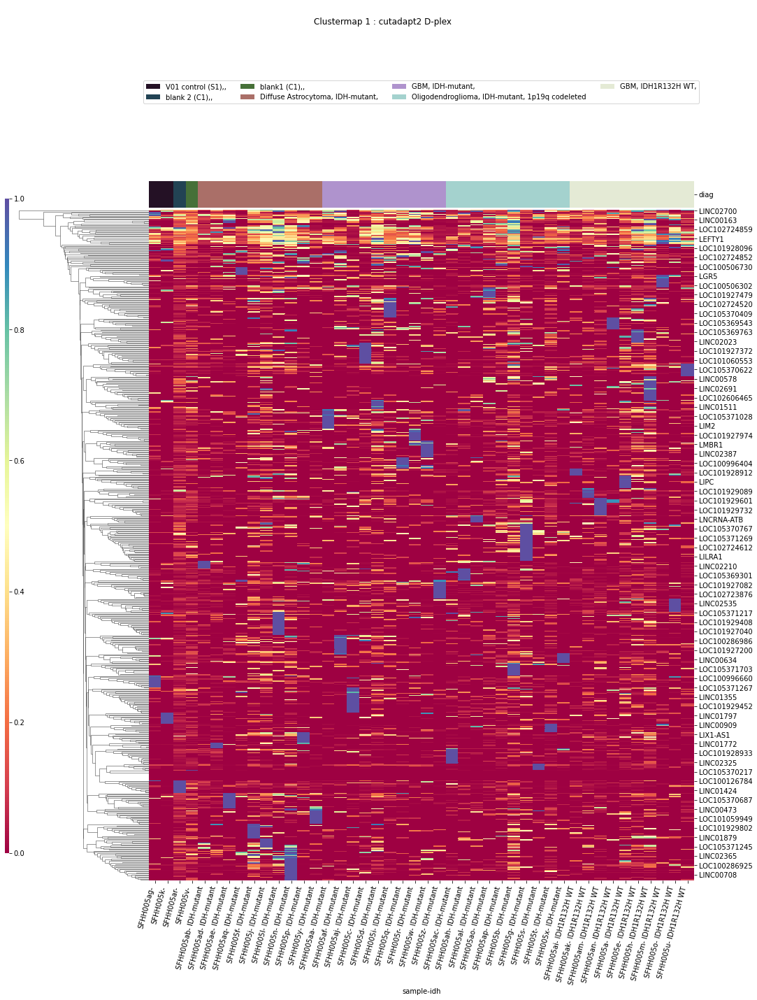

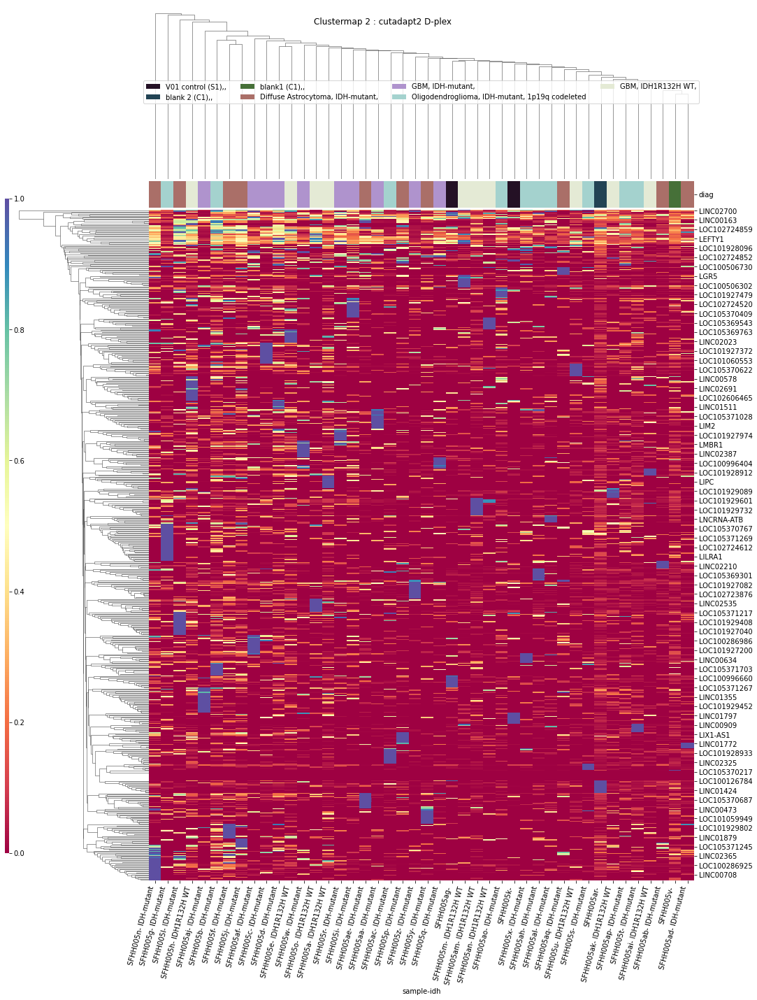

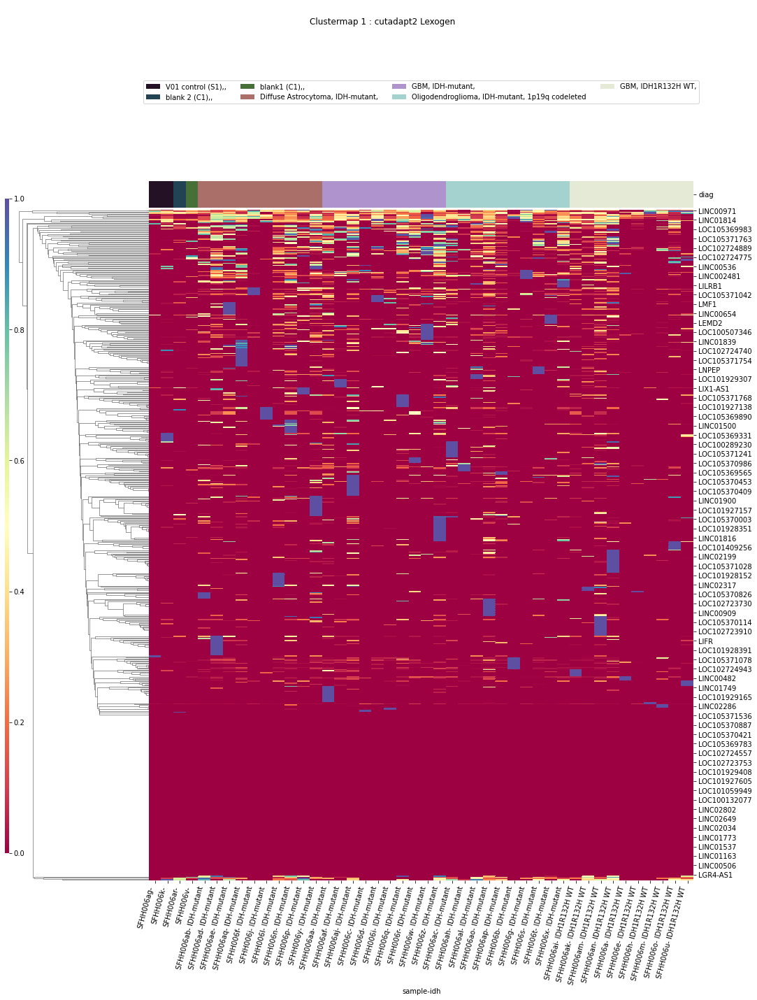

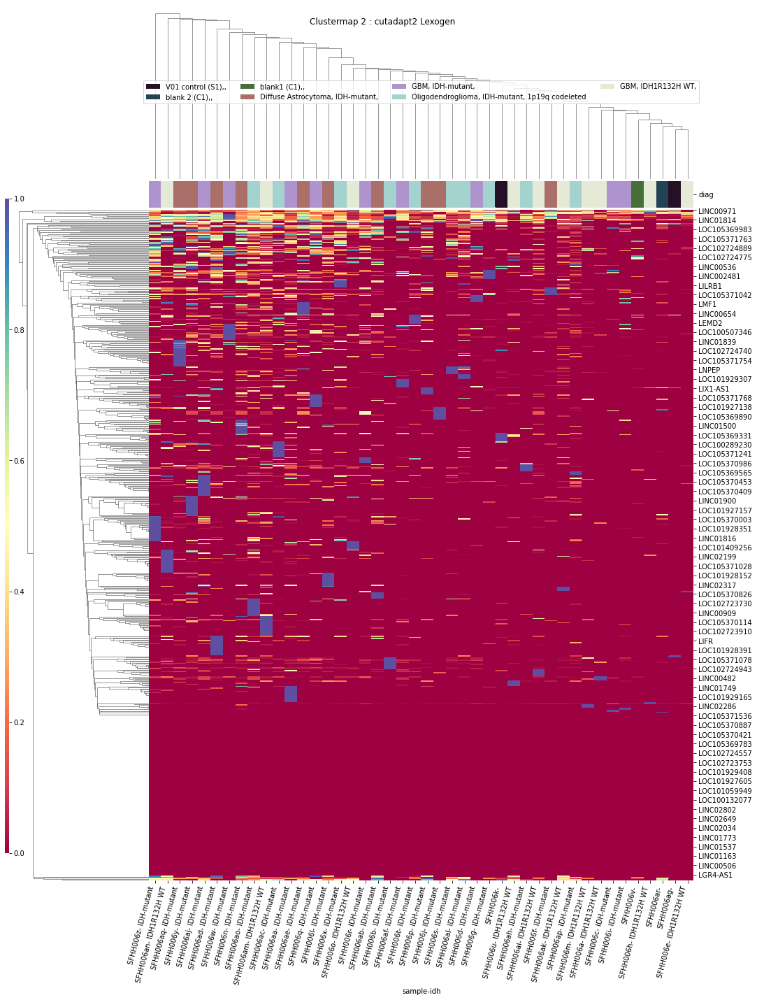

In [67]:
ttests_boxplots_and_heatmaps(dfn,elements,heat_p=0.1)

In [68]:
datetime.now().strftime("%H:%M:%S")

'11:40:06'

In [69]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [70]:
pd.set_option('display.max_columns', default_max_columns)

In [71]:
pd.set_option('display.max_rows',default_max_rows)

In [72]:
pd.set_option('display.precision', default_precision)